In [1]:
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim

import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

try:
    import google.colab
    from google.colab import drive
    drive.mount('/content/drive')

    IN_COLAB = True
except:
    IN_COLAB = False
    
colab_path = "/content/drive/MyDrive/Colab Notebooks/NTU_AI/" #CHANGE THIS


default_dtype = torch.float32
torch.set_default_dtype(default_dtype)

# Initialize CUDA
use_cuda = True

cuda_available = torch.cuda.is_available()
USE_CUDA = use_cuda and cuda_available

print("Cuda available: ", cuda_available)
print("Using Cuda:     ", USE_CUDA)

if cuda_available:
    print(torch.cuda.get_device_name(0))
    cuda_device = torch.device("cuda:0")

Cuda available:  True
Using Cuda:      True
NVIDIA GeForce RTX 3060


In [2]:
# Root directory for dataset
dataroot = "processed_32x32"
if IN_COLAB:
    dataroot = colab_path + dataroot

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_w = 32
image_h = 32

# Number of channels in the training images. For color images this is 3
nc = 3

# nz = 100
# ngf = 64
nz = 100
ngf = 64


# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5
# Learning rate for optimizers
lr = 0.0001


In [3]:
from os import listdir
from os.path import isfile, join
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

onlyfiles = [f for f in listdir(dataroot) if isfile(join(dataroot, f))]

sample_count = 0
for file in onlyfiles:
    if ".png" in file:
        sample_count += 1

dataset = np.zeros((sample_count, image_h, image_w, nc), dtype = np.float32)
i = 0

for file in onlyfiles:
    if ".png" in file:
        img = Image.open(dataroot + "/" + file)

        dataset[i, :, :, :] = np.array(img) / 255
        # plt.imshow(dataset[i])
        # plt.show()
        i += 1

In [4]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Generator Code

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 4, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 32 x 32``
        )

    def forward(self, input):
        return self.main(input)
        
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is ``(nc) x 32 x 32``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 16 x 16``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [5]:
# Create the generator
netG = Generator()
# Create the Discriminator
netD = Discriminator()

if USE_CUDA:
    netG = netG.cuda()
    netD = netD.cuda()

netG.apply(weights_init)
netD.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (9): Sigmoid()
  )
)

In [6]:
# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator

noise_h = 1
noise_w = 1

fixed_noise = torch.randn(64, nz, noise_h, noise_w)
if USE_CUDA:
    fixed_noise = fixed_noise.cuda()

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

print(dataset.shape)
dataset_flipped = np.moveaxis(dataset, -1, 1)
print(dataset_flipped.shape)

dataset_t = torch.from_numpy(dataset_flipped).to(dtype = default_dtype)
if USE_CUDA:
    dataset_t = dataset_t.cuda()

(3741, 32, 32, 3)
(3741, 3, 32, 32)


Starting Training Loop...


C:\Users\vital\anaconda3\envs\emojis\lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
C:\Users\vital\anaconda3\envs\emojis\lib\site-packages\torch\autograd\graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[0/500][0/936]	Loss_D: 1.0298	Loss_G: 2.2408	D(x): 0.6407	D(G(z)): 0.4062 / 0.1109
[0/500][15/936]	Loss_D: 0.1296	Loss_G: 3.3167	D(x): 0.9718	D(G(z)): 0.0954 / 0.0374
[0/500][30/936]	Loss_D: 0.2367	Loss_G: 3.3299	D(x): 0.8816	D(G(z)): 0.0986 / 0.0365
[0/500][45/936]	Loss_D: 0.1008	Loss_G: 4.0110	D(x): 0.9832	D(G(z)): 0.0785 / 0.0234
[0/500][60/936]	Loss_D: 0.0614	Loss_G: 4.2644	D(x): 0.9622	D(G(z)): 0.0225 / 0.0144
[0/500][75/936]	Loss_D: 0.0616	Loss_G: 4.3029	D(x): 0.9714	D(G(z)): 0.0316 / 0.0172
[0/500][90/936]	Loss_D: 0.0800	Loss_G: 3.8476	D(x): 0.9830	D(G(z)): 0.0607 / 0.0217
[0/500][105/936]	Loss_D: 0.6850	Loss_G: 3.1566	D(x): 0.7464	D(G(z)): 0.0228 / 0.0431
[0/500][120/936]	Loss_D: 0.2714	Loss_G: 4.4837	D(x): 0.9795	D(G(z)): 0.2137 / 0.0136
[0/500][135/936]	Loss_D: 0.2052	Loss_G: 3.6465	D(x): 0.9416	D(G(z)): 0.1321 / 0.0280
[0/500][150/936]	Loss_D: 0.1193	Loss_G: 4.2633	D(x): 0.9694	D(G(z)): 0.0836 / 0.0151
[0/500][165/936]	Loss_D: 0.3835	Loss_G: 2.2984	D(x): 0.7421	D(G(z)): 0.04

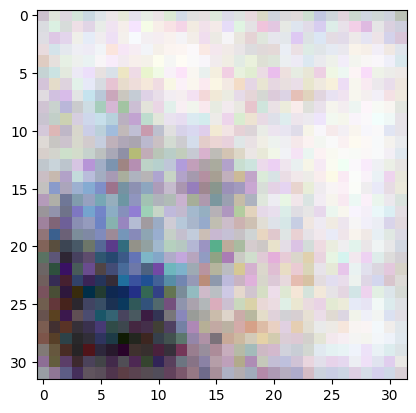

[1/500][0/936]	Loss_D: 2.8523	Loss_G: 1.8442	D(x): 0.9775	D(G(z)): 0.8388 / 0.3226
[1/500][15/936]	Loss_D: 0.6067	Loss_G: 2.4548	D(x): 0.9404	D(G(z)): 0.4045 / 0.0872
[1/500][30/936]	Loss_D: 1.1543	Loss_G: 1.0149	D(x): 0.4749	D(G(z)): 0.1430 / 0.3657
[1/500][45/936]	Loss_D: 1.7572	Loss_G: 0.6352	D(x): 0.2298	D(G(z)): 0.1314 / 0.5482
[1/500][60/936]	Loss_D: 0.6622	Loss_G: 2.2199	D(x): 0.7896	D(G(z)): 0.3302 / 0.1149
[1/500][75/936]	Loss_D: 0.9566	Loss_G: 1.6904	D(x): 0.5642	D(G(z)): 0.2554 / 0.2045
[1/500][90/936]	Loss_D: 0.5425	Loss_G: 2.8926	D(x): 0.8991	D(G(z)): 0.3337 / 0.0601
[1/500][105/936]	Loss_D: 0.3361	Loss_G: 2.7295	D(x): 0.8577	D(G(z)): 0.1504 / 0.0699
[1/500][120/936]	Loss_D: 0.3661	Loss_G: 3.0009	D(x): 0.9304	D(G(z)): 0.2476 / 0.0539
[1/500][135/936]	Loss_D: 0.1107	Loss_G: 4.7863	D(x): 0.9523	D(G(z)): 0.0578 / 0.0119
[1/500][150/936]	Loss_D: 0.1921	Loss_G: 4.1756	D(x): 0.8852	D(G(z)): 0.0585 / 0.0181
[1/500][165/936]	Loss_D: 0.3854	Loss_G: 1.9431	D(x): 0.8039	D(G(z)): 0.13

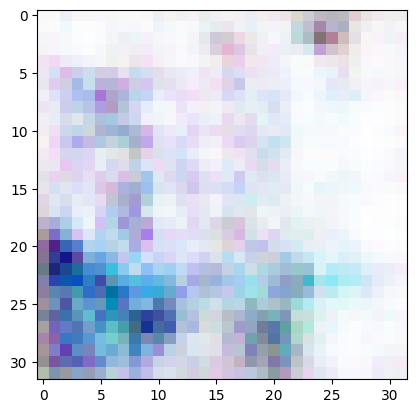

[2/500][0/936]	Loss_D: 0.8155	Loss_G: 2.4427	D(x): 0.6840	D(G(z)): 0.3164 / 0.0907
[2/500][15/936]	Loss_D: 0.2952	Loss_G: 3.1449	D(x): 0.9151	D(G(z)): 0.1788 / 0.0553
[2/500][30/936]	Loss_D: 0.8682	Loss_G: 3.0161	D(x): 0.8528	D(G(z)): 0.4275 / 0.0607
[2/500][45/936]	Loss_D: 0.2779	Loss_G: 2.6773	D(x): 0.8192	D(G(z)): 0.0586 / 0.0860
[2/500][60/936]	Loss_D: 0.2241	Loss_G: 3.3121	D(x): 0.9653	D(G(z)): 0.1708 / 0.0380
[2/500][75/936]	Loss_D: 1.6085	Loss_G: 2.0824	D(x): 0.5419	D(G(z)): 0.3829 / 0.1333
[2/500][90/936]	Loss_D: 0.2976	Loss_G: 2.8633	D(x): 0.8248	D(G(z)): 0.0928 / 0.0642
[2/500][105/936]	Loss_D: 0.3342	Loss_G: 2.6452	D(x): 0.8591	D(G(z)): 0.1445 / 0.0820
[2/500][120/936]	Loss_D: 0.2345	Loss_G: 2.5859	D(x): 0.8441	D(G(z)): 0.0554 / 0.0818
[2/500][135/936]	Loss_D: 0.3160	Loss_G: 2.9947	D(x): 0.9160	D(G(z)): 0.1878 / 0.0603
[2/500][150/936]	Loss_D: 0.3430	Loss_G: 3.5161	D(x): 0.8493	D(G(z)): 0.1530 / 0.0433
[2/500][165/936]	Loss_D: 0.2990	Loss_G: 2.9509	D(x): 0.9030	D(G(z)): 0.16

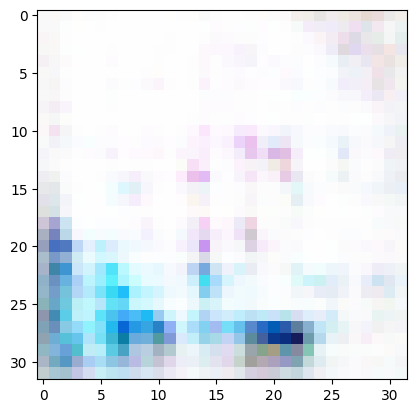

[3/500][0/936]	Loss_D: 0.2176	Loss_G: 3.2458	D(x): 0.8585	D(G(z)): 0.0607 / 0.0414
[3/500][15/936]	Loss_D: 0.5740	Loss_G: 1.6608	D(x): 0.6531	D(G(z)): 0.1150 / 0.2107
[3/500][30/936]	Loss_D: 0.5181	Loss_G: 4.0428	D(x): 0.9900	D(G(z)): 0.3933 / 0.0192
[3/500][45/936]	Loss_D: 0.1338	Loss_G: 3.2561	D(x): 0.9219	D(G(z)): 0.0447 / 0.0392
[3/500][60/936]	Loss_D: 2.0782	Loss_G: 2.0292	D(x): 0.1515	D(G(z)): 0.0080 / 0.1479
[3/500][75/936]	Loss_D: 1.9779	Loss_G: 1.6063	D(x): 0.1722	D(G(z)): 0.0170 / 0.2368
[3/500][90/936]	Loss_D: 0.4667	Loss_G: 2.7053	D(x): 0.8736	D(G(z)): 0.2610 / 0.0698
[3/500][105/936]	Loss_D: 0.6309	Loss_G: 3.4020	D(x): 0.9717	D(G(z)): 0.4290 / 0.0351
[3/500][120/936]	Loss_D: 0.5127	Loss_G: 3.2274	D(x): 0.8086	D(G(z)): 0.2441 / 0.0419
[3/500][135/936]	Loss_D: 0.2227	Loss_G: 3.4618	D(x): 0.8990	D(G(z)): 0.0983 / 0.0332
[3/500][150/936]	Loss_D: 0.2628	Loss_G: 2.9152	D(x): 0.8647	D(G(z)): 0.1029 / 0.0579
[3/500][165/936]	Loss_D: 0.7481	Loss_G: 1.2666	D(x): 0.5422	D(G(z)): 0.07

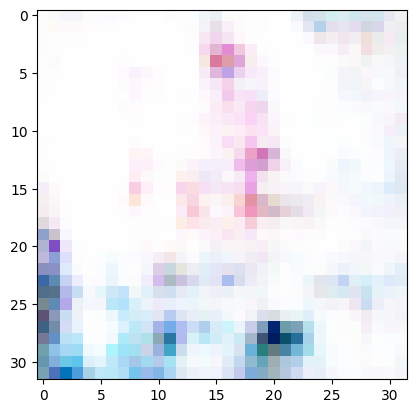

[4/500][0/936]	Loss_D: 0.8483	Loss_G: 1.6858	D(x): 0.6738	D(G(z)): 0.2936 / 0.2018
[4/500][15/936]	Loss_D: 0.5378	Loss_G: 3.0757	D(x): 0.6981	D(G(z)): 0.0454 / 0.0652
[4/500][30/936]	Loss_D: 0.4205	Loss_G: 3.1015	D(x): 0.9494	D(G(z)): 0.2807 / 0.0750
[4/500][45/936]	Loss_D: 0.3438	Loss_G: 3.4025	D(x): 0.8914	D(G(z)): 0.1880 / 0.0396
[4/500][60/936]	Loss_D: 0.1486	Loss_G: 3.1088	D(x): 0.9633	D(G(z)): 0.1006 / 0.0636
[4/500][75/936]	Loss_D: 0.1665	Loss_G: 3.0764	D(x): 0.9031	D(G(z)): 0.0610 / 0.0541
[4/500][90/936]	Loss_D: 0.3265	Loss_G: 2.8306	D(x): 0.7725	D(G(z)): 0.0539 / 0.0638
[4/500][105/936]	Loss_D: 0.1153	Loss_G: 1.9131	D(x): 0.9974	D(G(z)): 0.1056 / 0.1554
[4/500][120/936]	Loss_D: 0.4471	Loss_G: 3.0751	D(x): 0.9443	D(G(z)): 0.2982 / 0.0570
[4/500][135/936]	Loss_D: 0.2396	Loss_G: 3.7124	D(x): 0.9380	D(G(z)): 0.1516 / 0.0282
[4/500][150/936]	Loss_D: 0.2553	Loss_G: 3.4657	D(x): 0.8511	D(G(z)): 0.0798 / 0.0366
[4/500][165/936]	Loss_D: 0.2372	Loss_G: 3.5111	D(x): 0.9763	D(G(z)): 0.18

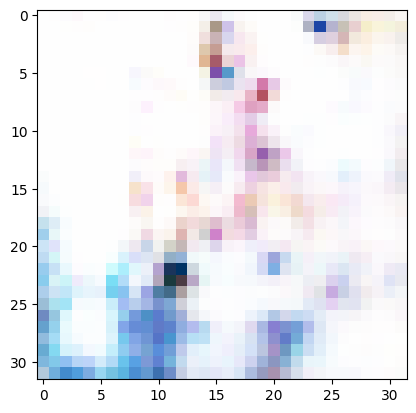

[5/500][0/936]	Loss_D: 0.2380	Loss_G: 3.1876	D(x): 0.8319	D(G(z)): 0.0416 / 0.0458
[5/500][15/936]	Loss_D: 0.0998	Loss_G: 4.4176	D(x): 0.9378	D(G(z)): 0.0304 / 0.0214
[5/500][30/936]	Loss_D: 0.2113	Loss_G: 4.1131	D(x): 0.8348	D(G(z)): 0.0240 / 0.0192
[5/500][45/936]	Loss_D: 0.3402	Loss_G: 2.9297	D(x): 0.9235	D(G(z)): 0.2167 / 0.0588
[5/500][60/936]	Loss_D: 0.2921	Loss_G: 3.1869	D(x): 0.9482	D(G(z)): 0.1975 / 0.0566
[5/500][75/936]	Loss_D: 0.1681	Loss_G: 3.2623	D(x): 0.9480	D(G(z)): 0.1037 / 0.0458
[5/500][90/936]	Loss_D: 0.1426	Loss_G: 2.3757	D(x): 0.9631	D(G(z)): 0.0986 / 0.0948
[5/500][105/936]	Loss_D: 0.9722	Loss_G: 2.3288	D(x): 0.5733	D(G(z)): 0.1705 / 0.1173
[5/500][120/936]	Loss_D: 0.2217	Loss_G: 3.8484	D(x): 0.8314	D(G(z)): 0.0323 / 0.0263
[5/500][135/936]	Loss_D: 0.4218	Loss_G: 3.4387	D(x): 0.9345	D(G(z)): 0.2509 / 0.0332
[5/500][150/936]	Loss_D: 0.2786	Loss_G: 3.2154	D(x): 0.8464	D(G(z)): 0.0944 / 0.0535
[5/500][165/936]	Loss_D: 0.1664	Loss_G: 3.0164	D(x): 0.9260	D(G(z)): 0.08

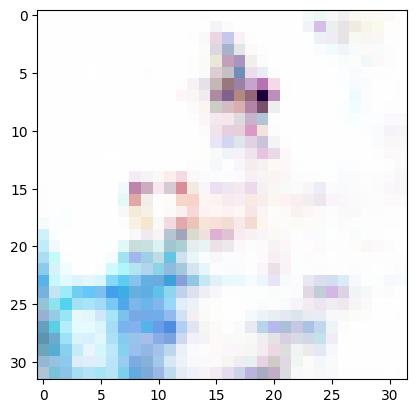

[6/500][0/936]	Loss_D: 0.2358	Loss_G: 2.9270	D(x): 0.9539	D(G(z)): 0.1693 / 0.0560
[6/500][15/936]	Loss_D: 0.1391	Loss_G: 3.5991	D(x): 0.9057	D(G(z)): 0.0372 / 0.0304
[6/500][30/936]	Loss_D: 0.2552	Loss_G: 3.0970	D(x): 0.8980	D(G(z)): 0.1301 / 0.0464
[6/500][45/936]	Loss_D: 0.0923	Loss_G: 3.7384	D(x): 0.9559	D(G(z)): 0.0445 / 0.0300
[6/500][60/936]	Loss_D: 0.1603	Loss_G: 3.2743	D(x): 0.9242	D(G(z)): 0.0752 / 0.0411
[6/500][75/936]	Loss_D: 1.0912	Loss_G: 1.6701	D(x): 0.5164	D(G(z)): 0.0352 / 0.2225
[6/500][90/936]	Loss_D: 0.0654	Loss_G: 5.1848	D(x): 0.9458	D(G(z)): 0.0090 / 0.0072
[6/500][105/936]	Loss_D: 0.5921	Loss_G: 2.4755	D(x): 0.7330	D(G(z)): 0.1528 / 0.0903
[6/500][120/936]	Loss_D: 0.3329	Loss_G: 3.9917	D(x): 0.7545	D(G(z)): 0.0123 / 0.0192
[6/500][135/936]	Loss_D: 0.1062	Loss_G: 3.7175	D(x): 0.9666	D(G(z)): 0.0680 / 0.0260
[6/500][150/936]	Loss_D: 0.2427	Loss_G: 3.6915	D(x): 0.9885	D(G(z)): 0.2038 / 0.0258
[6/500][165/936]	Loss_D: 0.1507	Loss_G: 3.7183	D(x): 0.9959	D(G(z)): 0.13

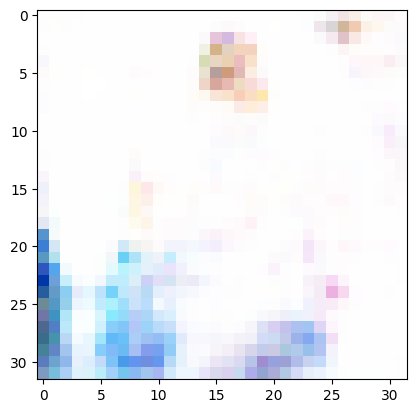

[7/500][0/936]	Loss_D: 0.9140	Loss_G: 2.9136	D(x): 0.5176	D(G(z)): 0.0173 / 0.1238
[7/500][15/936]	Loss_D: 0.4584	Loss_G: 2.7549	D(x): 0.9970	D(G(z)): 0.3437 / 0.0752
[7/500][30/936]	Loss_D: 1.2768	Loss_G: 3.1699	D(x): 0.4704	D(G(z)): 0.0059 / 0.0618
[7/500][45/936]	Loss_D: 0.0246	Loss_G: 3.9918	D(x): 0.9925	D(G(z)): 0.0168 / 0.0221
[7/500][60/936]	Loss_D: 1.9940	Loss_G: 3.5743	D(x): 0.8730	D(G(z)): 0.6825 / 0.0350
[7/500][75/936]	Loss_D: 0.1313	Loss_G: 3.9913	D(x): 0.9992	D(G(z)): 0.1172 / 0.0360
[7/500][90/936]	Loss_D: 0.2688	Loss_G: 2.9237	D(x): 0.8198	D(G(z)): 0.0553 / 0.0689
[7/500][105/936]	Loss_D: 0.0996	Loss_G: 3.9611	D(x): 0.9941	D(G(z)): 0.0874 / 0.0575
[7/500][120/936]	Loss_D: 0.1052	Loss_G: 3.4226	D(x): 0.9993	D(G(z)): 0.0966 / 0.0374
[7/500][135/936]	Loss_D: 0.1604	Loss_G: 3.8074	D(x): 0.8853	D(G(z)): 0.0283 / 0.0314
[7/500][150/936]	Loss_D: 0.0352	Loss_G: 4.1183	D(x): 0.9883	D(G(z)): 0.0231 / 0.0170
[7/500][165/936]	Loss_D: 0.2889	Loss_G: 3.1564	D(x): 0.7996	D(G(z)): 0.04

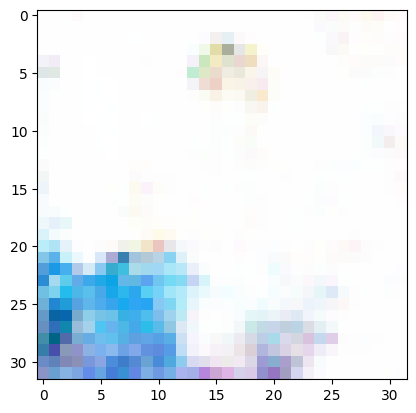

[8/500][0/936]	Loss_D: 0.6321	Loss_G: 2.4999	D(x): 0.6914	D(G(z)): 0.1181 / 0.0986
[8/500][15/936]	Loss_D: 0.5251	Loss_G: 2.7699	D(x): 0.6125	D(G(z)): 0.0182 / 0.1030
[8/500][30/936]	Loss_D: 0.5114	Loss_G: 3.7579	D(x): 0.9806	D(G(z)): 0.3609 / 0.0265
[8/500][45/936]	Loss_D: 0.0595	Loss_G: 4.0028	D(x): 0.9811	D(G(z)): 0.0387 / 0.0277
[8/500][60/936]	Loss_D: 0.1995	Loss_G: 3.6016	D(x): 0.9938	D(G(z)): 0.1660 / 0.0356
[8/500][75/936]	Loss_D: 0.5721	Loss_G: 5.0450	D(x): 0.9585	D(G(z)): 0.3691 / 0.0083
[8/500][90/936]	Loss_D: 0.1933	Loss_G: 3.0410	D(x): 0.9883	D(G(z)): 0.1610 / 0.0607
[8/500][105/936]	Loss_D: 0.1045	Loss_G: 3.3115	D(x): 0.9934	D(G(z)): 0.0921 / 0.0406
[8/500][120/936]	Loss_D: 0.3591	Loss_G: 2.7202	D(x): 0.7687	D(G(z)): 0.0521 / 0.1008
[8/500][135/936]	Loss_D: 0.4385	Loss_G: 3.1989	D(x): 0.9919	D(G(z)): 0.2935 / 0.0482
[8/500][150/936]	Loss_D: 0.1981	Loss_G: 2.6624	D(x): 0.9403	D(G(z)): 0.1226 / 0.0811
[8/500][165/936]	Loss_D: 0.2165	Loss_G: 3.0015	D(x): 0.9499	D(G(z)): 0.14

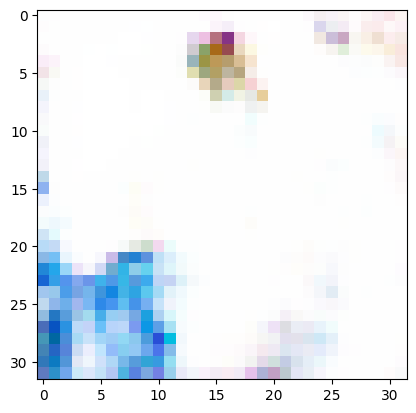

[9/500][0/936]	Loss_D: 0.0754	Loss_G: 4.8554	D(x): 0.9511	D(G(z)): 0.0245 / 0.0234
[9/500][15/936]	Loss_D: 0.0836	Loss_G: 4.0342	D(x): 0.9887	D(G(z)): 0.0672 / 0.0300
[9/500][30/936]	Loss_D: 0.1312	Loss_G: 3.5616	D(x): 0.9262	D(G(z)): 0.0504 / 0.0490
[9/500][45/936]	Loss_D: 0.1156	Loss_G: 2.9671	D(x): 0.9989	D(G(z)): 0.1079 / 0.0534
[9/500][60/936]	Loss_D: 0.7040	Loss_G: 3.9487	D(x): 0.7838	D(G(z)): 0.2904 / 0.0226
[9/500][75/936]	Loss_D: 1.5195	Loss_G: 2.5419	D(x): 0.2559	D(G(z)): 0.0051 / 0.0951
[9/500][90/936]	Loss_D: 0.1949	Loss_G: 3.5810	D(x): 0.9937	D(G(z)): 0.1684 / 0.0294
[9/500][105/936]	Loss_D: 0.0691	Loss_G: 4.6535	D(x): 0.9978	D(G(z)): 0.0624 / 0.0231
[9/500][120/936]	Loss_D: 0.0926	Loss_G: 3.3844	D(x): 0.9793	D(G(z)): 0.0686 / 0.0407
[9/500][135/936]	Loss_D: 0.1741	Loss_G: 3.7608	D(x): 0.9499	D(G(z)): 0.1064 / 0.0274
[9/500][150/936]	Loss_D: 0.1285	Loss_G: 3.2068	D(x): 0.9398	D(G(z)): 0.0632 / 0.0423
[9/500][165/936]	Loss_D: 0.8162	Loss_G: 5.1107	D(x): 0.9974	D(G(z)): 0.51

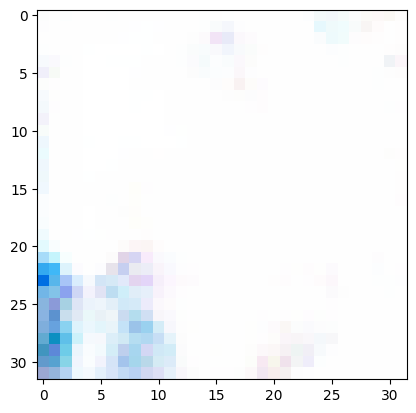

[10/500][0/936]	Loss_D: 0.3723	Loss_G: 3.1725	D(x): 0.9862	D(G(z)): 0.2735 / 0.0792
[10/500][15/936]	Loss_D: 0.0299	Loss_G: 5.0275	D(x): 0.9958	D(G(z)): 0.0251 / 0.0114
[10/500][30/936]	Loss_D: 0.1414	Loss_G: 3.1879	D(x): 0.9298	D(G(z)): 0.0622 / 0.0741
[10/500][45/936]	Loss_D: 0.2562	Loss_G: 5.2300	D(x): 0.7811	D(G(z)): 0.0030 / 0.0057
[10/500][60/936]	Loss_D: 0.1025	Loss_G: 3.0295	D(x): 0.9988	D(G(z)): 0.0922 / 0.0650
[10/500][75/936]	Loss_D: 0.1864	Loss_G: 3.3003	D(x): 0.9328	D(G(z)): 0.1065 / 0.0400
[10/500][90/936]	Loss_D: 1.0097	Loss_G: 3.0269	D(x): 0.5490	D(G(z)): 0.2061 / 0.0633
[10/500][105/936]	Loss_D: 0.1017	Loss_G: 3.4117	D(x): 0.9692	D(G(z)): 0.0665 / 0.0414
[10/500][120/936]	Loss_D: 0.0633	Loss_G: 4.1008	D(x): 0.9637	D(G(z)): 0.0245 / 0.0248
[10/500][135/936]	Loss_D: 0.0400	Loss_G: 4.7709	D(x): 0.9843	D(G(z)): 0.0237 / 0.0117
[10/500][150/936]	Loss_D: 0.0531	Loss_G: 3.9798	D(x): 0.9859	D(G(z)): 0.0376 / 0.0264
[10/500][165/936]	Loss_D: 0.2188	Loss_G: 3.0703	D(x): 0.9681	D

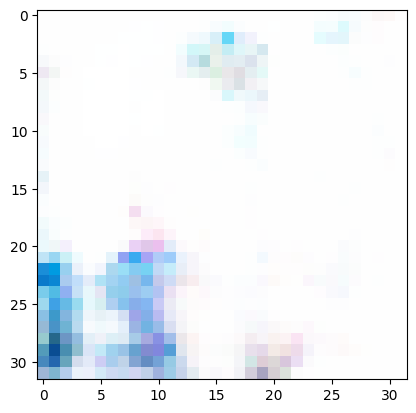

[11/500][0/936]	Loss_D: 0.0619	Loss_G: 3.6174	D(x): 0.9835	D(G(z)): 0.0440 / 0.0293
[11/500][15/936]	Loss_D: 0.2414	Loss_G: 3.6324	D(x): 0.9989	D(G(z)): 0.1964 / 0.0309
[11/500][30/936]	Loss_D: 0.1346	Loss_G: 3.2471	D(x): 0.9343	D(G(z)): 0.0607 / 0.0500
[11/500][45/936]	Loss_D: 0.1606	Loss_G: 3.5275	D(x): 0.8878	D(G(z)): 0.0374 / 0.0390
[11/500][60/936]	Loss_D: 0.2751	Loss_G: 4.4648	D(x): 0.8672	D(G(z)): 0.1096 / 0.0254
[11/500][75/936]	Loss_D: 0.0543	Loss_G: 4.2126	D(x): 0.9909	D(G(z)): 0.0433 / 0.0197
[11/500][90/936]	Loss_D: 0.3005	Loss_G: 3.5527	D(x): 0.8524	D(G(z)): 0.1136 / 0.0299
[11/500][105/936]	Loss_D: 0.0415	Loss_G: 4.5147	D(x): 0.9936	D(G(z)): 0.0340 / 0.0195
[11/500][120/936]	Loss_D: 0.6883	Loss_G: 4.4964	D(x): 0.9919	D(G(z)): 0.4781 / 0.0151
[11/500][135/936]	Loss_D: 0.0689	Loss_G: 3.2658	D(x): 0.9982	D(G(z)): 0.0637 / 0.0462
[11/500][150/936]	Loss_D: 0.0791	Loss_G: 5.3660	D(x): 0.9494	D(G(z)): 0.0254 / 0.0184
[11/500][165/936]	Loss_D: 0.0448	Loss_G: 3.9717	D(x): 0.9953	D

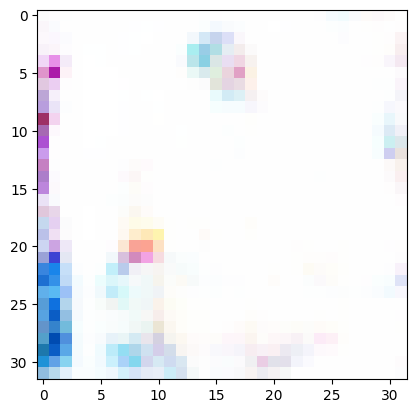

[12/500][0/936]	Loss_D: 0.7851	Loss_G: 3.4273	D(x): 0.4706	D(G(z)): 0.0044 / 0.0347
[12/500][15/936]	Loss_D: 0.0050	Loss_G: 6.3858	D(x): 0.9990	D(G(z)): 0.0040 / 0.0027
[12/500][30/936]	Loss_D: 0.2342	Loss_G: 3.9277	D(x): 0.8147	D(G(z)): 0.0226 / 0.0244
[12/500][45/936]	Loss_D: 0.1431	Loss_G: 3.8899	D(x): 0.9384	D(G(z)): 0.0710 / 0.0269
[12/500][60/936]	Loss_D: 0.1292	Loss_G: 4.2572	D(x): 0.9887	D(G(z)): 0.0968 / 0.0215
[12/500][75/936]	Loss_D: 0.0831	Loss_G: 4.3290	D(x): 0.9344	D(G(z)): 0.0141 / 0.0181
[12/500][90/936]	Loss_D: 0.0859	Loss_G: 3.9643	D(x): 0.9509	D(G(z)): 0.0329 / 0.0322
[12/500][105/936]	Loss_D: 0.0581	Loss_G: 4.2519	D(x): 0.9991	D(G(z)): 0.0537 / 0.0197
[12/500][120/936]	Loss_D: 0.6503	Loss_G: 2.9318	D(x): 0.9333	D(G(z)): 0.3806 / 0.0623
[12/500][135/936]	Loss_D: 0.0617	Loss_G: 3.1546	D(x): 0.9693	D(G(z)): 0.0290 / 0.0506
[12/500][150/936]	Loss_D: 0.3349	Loss_G: 3.8782	D(x): 0.7539	D(G(z)): 0.0158 / 0.0333
[12/500][165/936]	Loss_D: 0.6335	Loss_G: 2.1743	D(x): 0.7007	D

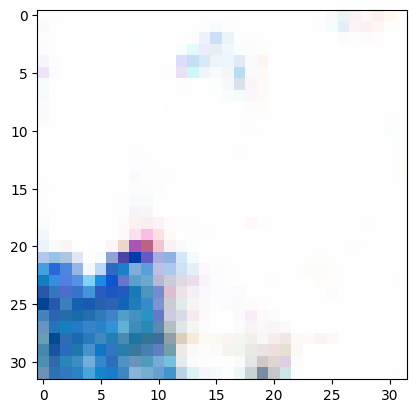

[13/500][0/936]	Loss_D: 0.2816	Loss_G: 3.8403	D(x): 0.9741	D(G(z)): 0.2143 / 0.0281
[13/500][15/936]	Loss_D: 0.0524	Loss_G: 4.1021	D(x): 0.9998	D(G(z)): 0.0504 / 0.0188
[13/500][30/936]	Loss_D: 0.1984	Loss_G: 3.9168	D(x): 0.8430	D(G(z)): 0.0127 / 0.0270
[13/500][45/936]	Loss_D: 0.0419	Loss_G: 3.3465	D(x): 0.9987	D(G(z)): 0.0386 / 0.0629
[13/500][60/936]	Loss_D: 0.0602	Loss_G: 5.4525	D(x): 0.9471	D(G(z)): 0.0050 / 0.0050
[13/500][75/936]	Loss_D: 0.2457	Loss_G: 3.7287	D(x): 0.8026	D(G(z)): 0.0149 / 0.0298
[13/500][90/936]	Loss_D: 0.1516	Loss_G: 6.0873	D(x): 0.8830	D(G(z)): 0.0023 / 0.0046
[13/500][105/936]	Loss_D: 0.0147	Loss_G: 4.6907	D(x): 0.9996	D(G(z)): 0.0141 / 0.0104
[13/500][120/936]	Loss_D: 1.6247	Loss_G: 2.8040	D(x): 0.3178	D(G(z)): 0.0035 / 0.1098
[13/500][135/936]	Loss_D: 0.0193	Loss_G: 6.1904	D(x): 0.9864	D(G(z)): 0.0055 / 0.0038
[13/500][150/936]	Loss_D: 0.5175	Loss_G: 2.9407	D(x): 0.7251	D(G(z)): 0.1362 / 0.0573
[13/500][165/936]	Loss_D: 0.0354	Loss_G: 6.7763	D(x): 0.9696	D

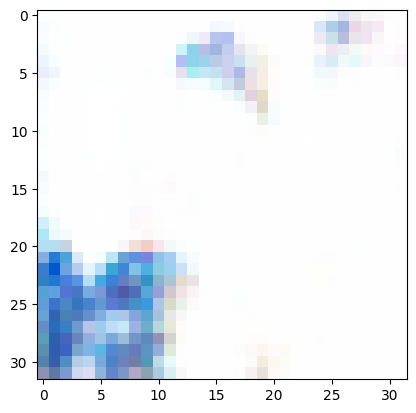

[14/500][0/936]	Loss_D: 0.4424	Loss_G: 4.1508	D(x): 0.6688	D(G(z)): 0.0044 / 0.0160
[14/500][15/936]	Loss_D: 0.3278	Loss_G: 4.2723	D(x): 0.8823	D(G(z)): 0.1714 / 0.0168
[14/500][30/936]	Loss_D: 0.1096	Loss_G: 3.3862	D(x): 0.9725	D(G(z)): 0.0756 / 0.0425
[14/500][45/936]	Loss_D: 0.2551	Loss_G: 4.0083	D(x): 0.9844	D(G(z)): 0.1818 / 0.0186
[14/500][60/936]	Loss_D: 0.0229	Loss_G: 4.9338	D(x): 0.9897	D(G(z)): 0.0124 / 0.0072
[14/500][75/936]	Loss_D: 0.1559	Loss_G: 4.2173	D(x): 0.9710	D(G(z)): 0.1119 / 0.0268
[14/500][90/936]	Loss_D: 0.0320	Loss_G: 5.3361	D(x): 0.9998	D(G(z)): 0.0303 / 0.0139
[14/500][105/936]	Loss_D: 0.0650	Loss_G: 4.1298	D(x): 0.9949	D(G(z)): 0.0556 / 0.0238
[14/500][120/936]	Loss_D: 0.1113	Loss_G: 5.6685	D(x): 0.9359	D(G(z)): 0.0400 / 0.0248
[14/500][135/936]	Loss_D: 0.2317	Loss_G: 2.4248	D(x): 0.9970	D(G(z)): 0.1925 / 0.0897
[14/500][150/936]	Loss_D: 0.0478	Loss_G: 4.0774	D(x): 0.9858	D(G(z)): 0.0327 / 0.0188
[14/500][165/936]	Loss_D: 0.0637	Loss_G: 4.8161	D(x): 0.9536	D

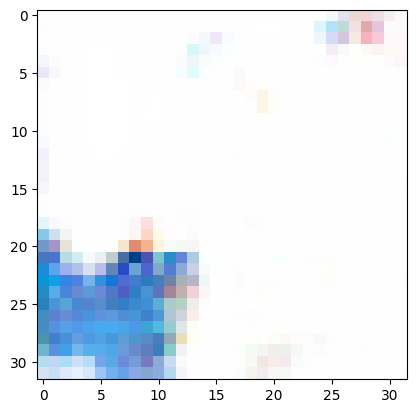

[15/500][0/936]	Loss_D: 0.1047	Loss_G: 3.4453	D(x): 0.9995	D(G(z)): 0.0956 / 0.0344
[15/500][15/936]	Loss_D: 0.0331	Loss_G: 3.9461	D(x): 0.9961	D(G(z)): 0.0286 / 0.0212
[15/500][30/936]	Loss_D: 0.0241	Loss_G: 4.5356	D(x): 0.9868	D(G(z)): 0.0107 / 0.0124
[15/500][45/936]	Loss_D: 0.0600	Loss_G: 4.3654	D(x): 0.9741	D(G(z)): 0.0326 / 0.0211
[15/500][60/936]	Loss_D: 0.0888	Loss_G: 4.1683	D(x): 0.9901	D(G(z)): 0.0739 / 0.0216
[15/500][75/936]	Loss_D: 0.0984	Loss_G: 4.8530	D(x): 0.9235	D(G(z)): 0.0166 / 0.0168
[15/500][90/936]	Loss_D: 0.0717	Loss_G: 3.8972	D(x): 1.0000	D(G(z)): 0.0679 / 0.0216
[15/500][105/936]	Loss_D: 0.0821	Loss_G: 3.1499	D(x): 0.9995	D(G(z)): 0.0762 / 0.0493
[15/500][120/936]	Loss_D: 0.0373	Loss_G: 5.6822	D(x): 0.9707	D(G(z)): 0.0069 / 0.0038
[15/500][135/936]	Loss_D: 0.0641	Loss_G: 4.3040	D(x): 0.9970	D(G(z)): 0.0591 / 0.0141
[15/500][150/936]	Loss_D: 0.1629	Loss_G: 3.5998	D(x): 0.9538	D(G(z)): 0.1016 / 0.0424
[15/500][165/936]	Loss_D: 0.0517	Loss_G: 5.1179	D(x): 0.9587	D

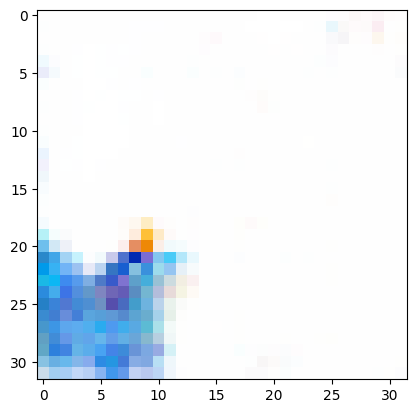

[16/500][0/936]	Loss_D: 0.4070	Loss_G: 4.7489	D(x): 0.9985	D(G(z)): 0.3096 / 0.0254
[16/500][15/936]	Loss_D: 1.0188	Loss_G: 2.0630	D(x): 0.5788	D(G(z)): 0.2288 / 0.1299
[16/500][30/936]	Loss_D: 0.0387	Loss_G: 4.0456	D(x): 0.9971	D(G(z)): 0.0346 / 0.0247
[16/500][45/936]	Loss_D: 0.1223	Loss_G: 2.9037	D(x): 0.9977	D(G(z)): 0.1112 / 0.0631
[16/500][60/936]	Loss_D: 0.0733	Loss_G: 2.8616	D(x): 0.9893	D(G(z)): 0.0601 / 0.0665
[16/500][75/936]	Loss_D: 0.0670	Loss_G: 6.3428	D(x): 0.9389	D(G(z)): 0.0019 / 0.0027
[16/500][90/936]	Loss_D: 0.4440	Loss_G: 3.6345	D(x): 0.9409	D(G(z)): 0.2935 / 0.0303
[16/500][105/936]	Loss_D: 0.2762	Loss_G: 3.9052	D(x): 0.7993	D(G(z)): 0.0311 / 0.0306
[16/500][120/936]	Loss_D: 0.0095	Loss_G: 5.7431	D(x): 0.9939	D(G(z)): 0.0033 / 0.0035
[16/500][135/936]	Loss_D: 0.2679	Loss_G: 3.4559	D(x): 0.9183	D(G(z)): 0.1535 / 0.0351
[16/500][150/936]	Loss_D: 0.0322	Loss_G: 4.9681	D(x): 0.9918	D(G(z)): 0.0233 / 0.0097
[16/500][165/936]	Loss_D: 1.5523	Loss_G: 5.1195	D(x): 0.7827	D

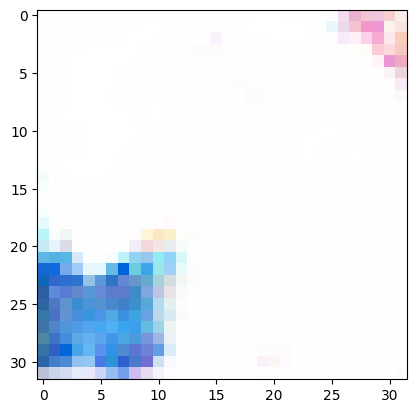

[17/500][0/936]	Loss_D: 0.5074	Loss_G: 3.1261	D(x): 0.6541	D(G(z)): 0.0276 / 0.0621
[17/500][15/936]	Loss_D: 0.2174	Loss_G: 3.8838	D(x): 0.9823	D(G(z)): 0.1726 / 0.0216
[17/500][30/936]	Loss_D: 0.0223	Loss_G: 5.0825	D(x): 0.9923	D(G(z)): 0.0143 / 0.0082
[17/500][45/936]	Loss_D: 0.0536	Loss_G: 5.3333	D(x): 0.9928	D(G(z)): 0.0446 / 0.0093
[17/500][60/936]	Loss_D: 0.0449	Loss_G: 4.0459	D(x): 0.9982	D(G(z)): 0.0410 / 0.0298
[17/500][75/936]	Loss_D: 0.0769	Loss_G: 3.5782	D(x): 0.9719	D(G(z)): 0.0464 / 0.0317
[17/500][90/936]	Loss_D: 0.0023	Loss_G: 6.6469	D(x): 0.9993	D(G(z)): 0.0016 / 0.0014
[17/500][105/936]	Loss_D: 0.4576	Loss_G: 5.3104	D(x): 0.9991	D(G(z)): 0.2667 / 0.0184
[17/500][120/936]	Loss_D: 0.4172	Loss_G: 2.9597	D(x): 0.6973	D(G(z)): 0.0156 / 0.0546
[17/500][135/936]	Loss_D: 0.0465	Loss_G: 5.2768	D(x): 0.9995	D(G(z)): 0.0425 / 0.0189
[17/500][150/936]	Loss_D: 0.3226	Loss_G: 3.5355	D(x): 0.7339	D(G(z)): 0.0094 / 0.0325
[17/500][165/936]	Loss_D: 0.0396	Loss_G: 4.6684	D(x): 0.9787	D

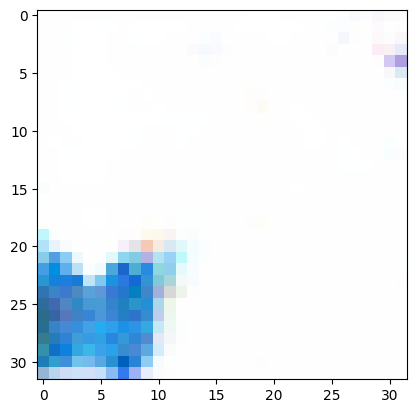

[18/500][0/936]	Loss_D: 0.3035	Loss_G: 4.1021	D(x): 0.9964	D(G(z)): 0.2556 / 0.0190
[18/500][15/936]	Loss_D: 0.7810	Loss_G: 3.5602	D(x): 0.5059	D(G(z)): 0.0236 / 0.0994
[18/500][30/936]	Loss_D: 0.0726	Loss_G: 4.9373	D(x): 0.9447	D(G(z)): 0.0136 / 0.0097
[18/500][45/936]	Loss_D: 0.0654	Loss_G: 3.9393	D(x): 0.9881	D(G(z)): 0.0507 / 0.0309
[18/500][60/936]	Loss_D: 0.1579	Loss_G: 6.3031	D(x): 0.8718	D(G(z)): 0.0023 / 0.0033
[18/500][75/936]	Loss_D: 0.1195	Loss_G: 3.6761	D(x): 0.9513	D(G(z)): 0.0630 / 0.0352
[18/500][90/936]	Loss_D: 0.0726	Loss_G: 3.9437	D(x): 0.9992	D(G(z)): 0.0668 / 0.0246
[18/500][105/936]	Loss_D: 0.0804	Loss_G: 6.8695	D(x): 0.9816	D(G(z)): 0.0547 / 0.0020
[18/500][120/936]	Loss_D: 0.0505	Loss_G: 4.1280	D(x): 0.9990	D(G(z)): 0.0481 / 0.0172
[18/500][135/936]	Loss_D: 0.0424	Loss_G: 7.1438	D(x): 0.9665	D(G(z)): 0.0077 / 0.0052
[18/500][150/936]	Loss_D: 0.1135	Loss_G: 4.1557	D(x): 0.9901	D(G(z)): 0.0960 / 0.0202
[18/500][165/936]	Loss_D: 0.0655	Loss_G: 4.0226	D(x): 0.9989	D

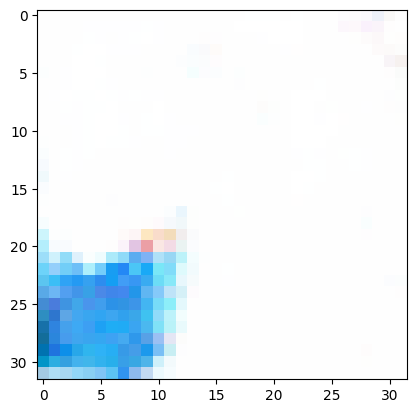

[19/500][0/936]	Loss_D: 0.0265	Loss_G: 5.3497	D(x): 0.9901	D(G(z)): 0.0162 / 0.0107
[19/500][15/936]	Loss_D: 0.0199	Loss_G: 5.8358	D(x): 0.9899	D(G(z)): 0.0095 / 0.0062
[19/500][30/936]	Loss_D: 0.0244	Loss_G: 4.7667	D(x): 0.9970	D(G(z)): 0.0210 / 0.0105
[19/500][45/936]	Loss_D: 0.0371	Loss_G: 4.0976	D(x): 0.9965	D(G(z)): 0.0327 / 0.0259
[19/500][60/936]	Loss_D: 0.9220	Loss_G: 2.1537	D(x): 0.5099	D(G(z)): 0.0097 / 0.2181
[19/500][75/936]	Loss_D: 0.0568	Loss_G: 7.1045	D(x): 0.9477	D(G(z)): 0.0016 / 0.0011
[19/500][90/936]	Loss_D: 0.0568	Loss_G: 4.8823	D(x): 0.9796	D(G(z)): 0.0345 / 0.0114
[19/500][105/936]	Loss_D: 0.0272	Loss_G: 4.8068	D(x): 0.9901	D(G(z)): 0.0169 / 0.0137
[19/500][120/936]	Loss_D: 0.0613	Loss_G: 3.2937	D(x): 0.9997	D(G(z)): 0.0583 / 0.0490
[19/500][135/936]	Loss_D: 0.0741	Loss_G: 4.5689	D(x): 0.9847	D(G(z)): 0.0541 / 0.0187
[19/500][150/936]	Loss_D: 0.1557	Loss_G: 5.7054	D(x): 0.8713	D(G(z)): 0.0050 / 0.0091
[19/500][165/936]	Loss_D: 0.0129	Loss_G: 4.7478	D(x): 0.9966	D

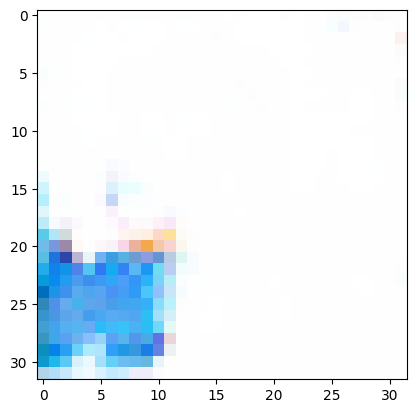

[20/500][0/936]	Loss_D: 0.0055	Loss_G: 6.0636	D(x): 0.9999	D(G(z)): 0.0053 / 0.0048
[20/500][15/936]	Loss_D: 0.0297	Loss_G: 4.5099	D(x): 0.9983	D(G(z)): 0.0276 / 0.0126
[20/500][30/936]	Loss_D: 0.0226	Loss_G: 6.0183	D(x): 0.9991	D(G(z)): 0.0213 / 0.0206
[20/500][45/936]	Loss_D: 0.0067	Loss_G: 6.4396	D(x): 0.9953	D(G(z)): 0.0019 / 0.0017
[20/500][60/936]	Loss_D: 0.0799	Loss_G: 6.6146	D(x): 0.9384	D(G(z)): 0.0140 / 0.0065
[20/500][75/936]	Loss_D: 0.0305	Loss_G: 4.2837	D(x): 1.0000	D(G(z)): 0.0298 / 0.0158
[20/500][90/936]	Loss_D: 0.1279	Loss_G: 5.1985	D(x): 0.8852	D(G(z)): 0.0044 / 0.0081
[20/500][105/936]	Loss_D: 0.0131	Loss_G: 5.0578	D(x): 0.9985	D(G(z)): 0.0115 / 0.0107
[20/500][120/936]	Loss_D: 0.0116	Loss_G: 5.9798	D(x): 0.9916	D(G(z)): 0.0031 / 0.0030
[20/500][135/936]	Loss_D: 0.0656	Loss_G: 3.8587	D(x): 0.9996	D(G(z)): 0.0622 / 0.0227
[20/500][150/936]	Loss_D: 0.0754	Loss_G: 4.3120	D(x): 0.9870	D(G(z)): 0.0591 / 0.0239
[20/500][165/936]	Loss_D: 0.1888	Loss_G: 4.1098	D(x): 0.8507	D

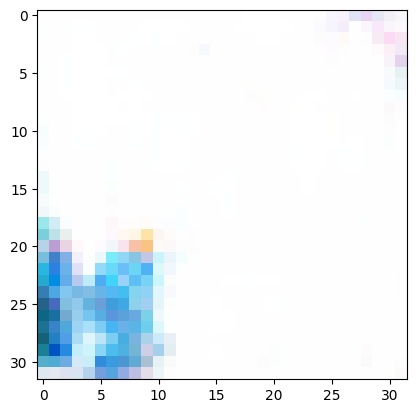

[21/500][0/936]	Loss_D: 0.0587	Loss_G: 4.8617	D(x): 0.9551	D(G(z)): 0.0120 / 0.0104
[21/500][15/936]	Loss_D: 0.1002	Loss_G: 3.5692	D(x): 0.9994	D(G(z)): 0.0927 / 0.0495
[21/500][30/936]	Loss_D: 0.0082	Loss_G: 5.4200	D(x): 0.9997	D(G(z)): 0.0079 / 0.0060
[21/500][45/936]	Loss_D: 0.6350	Loss_G: 3.8864	D(x): 0.6064	D(G(z)): 0.0149 / 0.0584
[21/500][60/936]	Loss_D: 0.2508	Loss_G: 4.1768	D(x): 0.8346	D(G(z)): 0.0538 / 0.0177
[21/500][75/936]	Loss_D: 0.1478	Loss_G: 5.8407	D(x): 0.8721	D(G(z)): 0.0032 / 0.0034
[21/500][90/936]	Loss_D: 0.0907	Loss_G: 3.6929	D(x): 0.9991	D(G(z)): 0.0795 / 0.0321
[21/500][105/936]	Loss_D: 0.0791	Loss_G: 4.5445	D(x): 0.9997	D(G(z)): 0.0718 / 0.0142
[21/500][120/936]	Loss_D: 0.0024	Loss_G: 6.4122	D(x): 0.9999	D(G(z)): 0.0022 / 0.0021
[21/500][135/936]	Loss_D: 0.0915	Loss_G: 4.1827	D(x): 0.9989	D(G(z)): 0.0837 / 0.0243
[21/500][150/936]	Loss_D: 0.0109	Loss_G: 4.9276	D(x): 0.9996	D(G(z)): 0.0105 / 0.0102
[21/500][165/936]	Loss_D: 0.0129	Loss_G: 6.5667	D(x): 0.9924	D

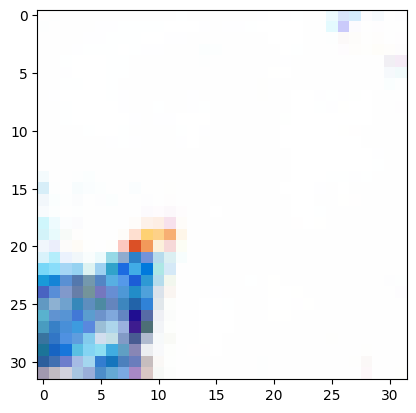

[22/500][0/936]	Loss_D: 0.1047	Loss_G: 4.3640	D(x): 0.9779	D(G(z)): 0.0775 / 0.0264
[22/500][15/936]	Loss_D: 0.0262	Loss_G: 5.0670	D(x): 0.9839	D(G(z)): 0.0098 / 0.0079
[22/500][30/936]	Loss_D: 0.0771	Loss_G: 4.6419	D(x): 0.9532	D(G(z)): 0.0270 / 0.0136
[22/500][45/936]	Loss_D: 0.3828	Loss_G: 3.1942	D(x): 0.7398	D(G(z)): 0.0521 / 0.0585
[22/500][60/936]	Loss_D: 0.2525	Loss_G: 3.2860	D(x): 0.8297	D(G(z)): 0.0523 / 0.0521
[22/500][75/936]	Loss_D: 0.0104	Loss_G: 5.2364	D(x): 0.9994	D(G(z)): 0.0098 / 0.0068
[22/500][90/936]	Loss_D: 0.1543	Loss_G: 3.7145	D(x): 0.9908	D(G(z)): 0.1224 / 0.0308
[22/500][105/936]	Loss_D: 0.0082	Loss_G: 5.3663	D(x): 0.9995	D(G(z)): 0.0077 / 0.0076
[22/500][120/936]	Loss_D: 0.7662	Loss_G: 5.9593	D(x): 0.9998	D(G(z)): 0.4649 / 0.0034
[22/500][135/936]	Loss_D: 0.0126	Loss_G: 5.8243	D(x): 0.9998	D(G(z)): 0.0122 / 0.0087
[22/500][150/936]	Loss_D: 0.0384	Loss_G: 4.6477	D(x): 0.9883	D(G(z)): 0.0259 / 0.0185
[22/500][165/936]	Loss_D: 0.0262	Loss_G: 5.8091	D(x): 0.9997	D

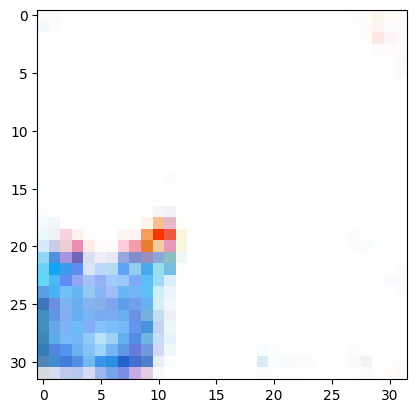

[23/500][0/936]	Loss_D: 0.0296	Loss_G: 4.1974	D(x): 0.9999	D(G(z)): 0.0286 / 0.0188
[23/500][15/936]	Loss_D: 1.1103	Loss_G: 2.2670	D(x): 0.4383	D(G(z)): 0.0494 / 0.1214
[23/500][30/936]	Loss_D: 0.0060	Loss_G: 6.6275	D(x): 0.9973	D(G(z)): 0.0033 / 0.0030
[23/500][45/936]	Loss_D: 0.0435	Loss_G: 4.7513	D(x): 0.9666	D(G(z)): 0.0091 / 0.0087
[23/500][60/936]	Loss_D: 0.0241	Loss_G: 5.5889	D(x): 0.9873	D(G(z)): 0.0111 / 0.0081
[23/500][75/936]	Loss_D: 0.2301	Loss_G: 5.7623	D(x): 0.8202	D(G(z)): 0.0014 / 0.0036
[23/500][90/936]	Loss_D: 0.1336	Loss_G: 4.8332	D(x): 0.8871	D(G(z)): 0.0063 / 0.0185
[23/500][105/936]	Loss_D: 0.0306	Loss_G: 6.2688	D(x): 0.9722	D(G(z)): 0.0022 / 0.0021
[23/500][120/936]	Loss_D: 0.0339	Loss_G: 4.6158	D(x): 1.0000	D(G(z)): 0.0328 / 0.0126
[23/500][135/936]	Loss_D: 0.0579	Loss_G: 5.1913	D(x): 0.9562	D(G(z)): 0.0127 / 0.0107
[23/500][150/936]	Loss_D: 0.3599	Loss_G: 4.6436	D(x): 0.9999	D(G(z)): 0.2826 / 0.0109
[23/500][165/936]	Loss_D: 1.3364	Loss_G: 2.6928	D(x): 0.4296	D

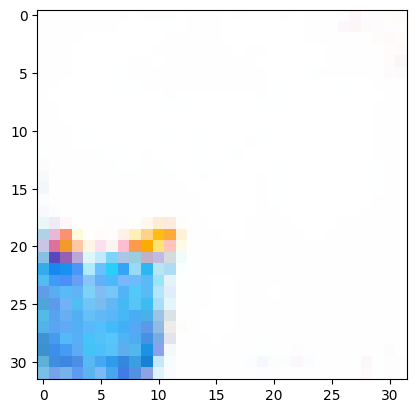

[24/500][0/936]	Loss_D: 0.0157	Loss_G: 4.2139	D(x): 0.9994	D(G(z)): 0.0149 / 0.0164
[24/500][15/936]	Loss_D: 0.0106	Loss_G: 6.1072	D(x): 0.9977	D(G(z)): 0.0083 / 0.0078
[24/500][30/936]	Loss_D: 0.0142	Loss_G: 4.6206	D(x): 0.9999	D(G(z)): 0.0140 / 0.0125
[24/500][45/936]	Loss_D: 0.1190	Loss_G: 3.9380	D(x): 0.9865	D(G(z)): 0.0980 / 0.0237
[24/500][60/936]	Loss_D: 0.1713	Loss_G: 4.1487	D(x): 0.9986	D(G(z)): 0.1406 / 0.0254
[24/500][75/936]	Loss_D: 0.0579	Loss_G: 5.1501	D(x): 0.9912	D(G(z)): 0.0456 / 0.0099
[24/500][90/936]	Loss_D: 0.0083	Loss_G: 5.8795	D(x): 0.9973	D(G(z)): 0.0055 / 0.0051
[24/500][105/936]	Loss_D: 0.0193	Loss_G: 4.8794	D(x): 0.9939	D(G(z)): 0.0129 / 0.0105
[24/500][120/936]	Loss_D: 0.0815	Loss_G: 3.8145	D(x): 0.9747	D(G(z)): 0.0531 / 0.0300
[24/500][135/936]	Loss_D: 0.2140	Loss_G: 5.3220	D(x): 0.9973	D(G(z)): 0.1815 / 0.0177
[24/500][150/936]	Loss_D: 0.3079	Loss_G: 3.8344	D(x): 0.9806	D(G(z)): 0.2080 / 0.0388
[24/500][165/936]	Loss_D: 0.0459	Loss_G: 3.6367	D(x): 0.9999	D

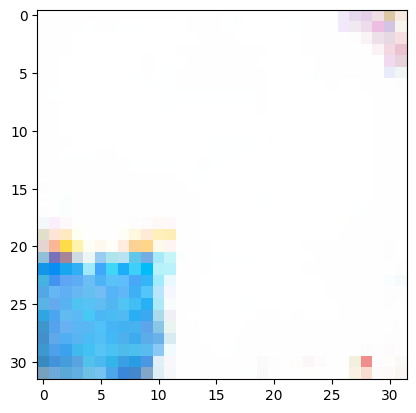

[25/500][0/936]	Loss_D: 0.0234	Loss_G: 4.5140	D(x): 0.9944	D(G(z)): 0.0175 / 0.0160
[25/500][15/936]	Loss_D: 0.0051	Loss_G: 6.3120	D(x): 0.9979	D(G(z)): 0.0029 / 0.0019
[25/500][30/936]	Loss_D: 0.0566	Loss_G: 4.8310	D(x): 0.9651	D(G(z)): 0.0197 / 0.0139
[25/500][45/936]	Loss_D: 0.3850	Loss_G: 3.7782	D(x): 0.8454	D(G(z)): 0.1869 / 0.0254
[25/500][60/936]	Loss_D: 0.4585	Loss_G: 3.6098	D(x): 0.6786	D(G(z)): 0.0114 / 0.0404
[25/500][75/936]	Loss_D: 0.2972	Loss_G: 7.7029	D(x): 0.8012	D(G(z)): 0.0004 / 0.0009
[25/500][90/936]	Loss_D: 0.0323	Loss_G: 5.6978	D(x): 0.9999	D(G(z)): 0.0312 / 0.0139
[25/500][105/936]	Loss_D: 0.0261	Loss_G: 4.9511	D(x): 0.9933	D(G(z)): 0.0190 / 0.0092
[25/500][120/936]	Loss_D: 0.0168	Loss_G: 5.8986	D(x): 0.9964	D(G(z)): 0.0131 / 0.0122
[25/500][135/936]	Loss_D: 0.2186	Loss_G: 2.6933	D(x): 0.8679	D(G(z)): 0.0636 / 0.0794
[25/500][150/936]	Loss_D: 0.1883	Loss_G: 5.5248	D(x): 0.8392	D(G(z)): 0.0023 / 0.0046
[25/500][165/936]	Loss_D: 0.0562	Loss_G: 3.8165	D(x): 0.9985	D

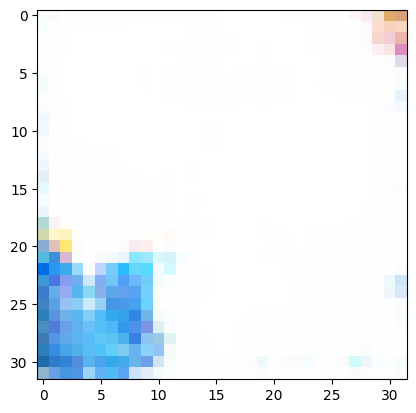

[26/500][0/936]	Loss_D: 0.0151	Loss_G: 5.2072	D(x): 0.9989	D(G(z)): 0.0139 / 0.0106
[26/500][15/936]	Loss_D: 0.0533	Loss_G: 4.9236	D(x): 0.9986	D(G(z)): 0.0482 / 0.0149
[26/500][30/936]	Loss_D: 0.0109	Loss_G: 4.8638	D(x): 0.9999	D(G(z)): 0.0107 / 0.0092
[26/500][45/936]	Loss_D: 0.0434	Loss_G: 5.2729	D(x): 0.9760	D(G(z)): 0.0183 / 0.0116
[26/500][60/936]	Loss_D: 0.0780	Loss_G: 4.8773	D(x): 0.9395	D(G(z)): 0.0130 / 0.0098
[26/500][75/936]	Loss_D: 0.0760	Loss_G: 4.5152	D(x): 0.9377	D(G(z)): 0.0103 / 0.0257
[26/500][90/936]	Loss_D: 0.2380	Loss_G: 3.8219	D(x): 0.9963	D(G(z)): 0.1808 / 0.0437
[26/500][105/936]	Loss_D: 0.0857	Loss_G: 4.7821	D(x): 0.9602	D(G(z)): 0.0410 / 0.0179
[26/500][120/936]	Loss_D: 0.0090	Loss_G: 5.5889	D(x): 0.9999	D(G(z)): 0.0089 / 0.0053
[26/500][135/936]	Loss_D: 0.0375	Loss_G: 5.2504	D(x): 0.9775	D(G(z)): 0.0142 / 0.0135
[26/500][150/936]	Loss_D: 1.4568	Loss_G: 2.7135	D(x): 0.3384	D(G(z)): 0.0035 / 0.0777
[26/500][165/936]	Loss_D: 0.0020	Loss_G: 6.8390	D(x): 0.9997	D

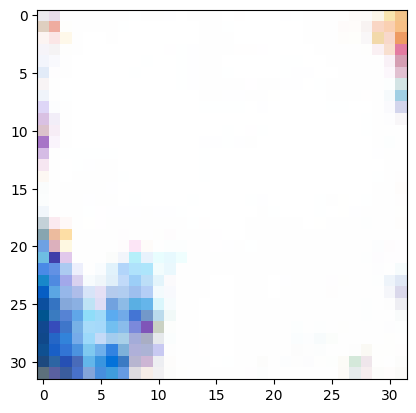

[27/500][0/936]	Loss_D: 0.0121	Loss_G: 5.3021	D(x): 0.9989	D(G(z)): 0.0109 / 0.0055
[27/500][15/936]	Loss_D: 0.0816	Loss_G: 4.2666	D(x): 0.9992	D(G(z)): 0.0761 / 0.0252
[27/500][30/936]	Loss_D: 0.0297	Loss_G: 5.0647	D(x): 0.9864	D(G(z)): 0.0157 / 0.0106
[27/500][45/936]	Loss_D: 0.0484	Loss_G: 3.7340	D(x): 0.9992	D(G(z)): 0.0461 / 0.0292
[27/500][60/936]	Loss_D: 0.1595	Loss_G: 4.3499	D(x): 0.9105	D(G(z)): 0.0580 / 0.0302
[27/500][75/936]	Loss_D: 0.0846	Loss_G: 3.9668	D(x): 0.9562	D(G(z)): 0.0364 / 0.0204
[27/500][90/936]	Loss_D: 0.6869	Loss_G: 3.9188	D(x): 0.6355	D(G(z)): 0.0034 / 0.0284
[27/500][105/936]	Loss_D: 0.0268	Loss_G: 5.3272	D(x): 0.9979	D(G(z)): 0.0241 / 0.0117
[27/500][120/936]	Loss_D: 0.0134	Loss_G: 6.6700	D(x): 0.9923	D(G(z)): 0.0056 / 0.0056
[27/500][135/936]	Loss_D: 0.0199	Loss_G: 6.7607	D(x): 0.9857	D(G(z)): 0.0055 / 0.0056
[27/500][150/936]	Loss_D: 0.0693	Loss_G: 3.9777	D(x): 0.9977	D(G(z)): 0.0644 / 0.0211
[27/500][165/936]	Loss_D: 0.0342	Loss_G: 4.3176	D(x): 0.9988	D

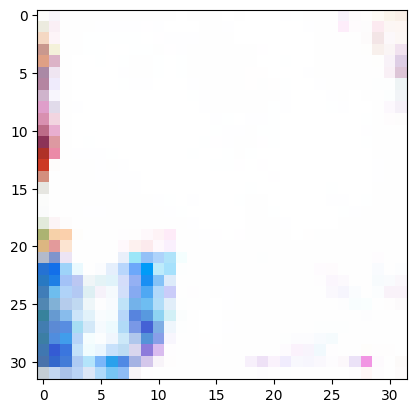

[28/500][0/936]	Loss_D: 0.5163	Loss_G: 2.7619	D(x): 0.9999	D(G(z)): 0.3278 / 0.0880
[28/500][15/936]	Loss_D: 0.2457	Loss_G: 5.2856	D(x): 0.8299	D(G(z)): 0.0076 / 0.0089
[28/500][30/936]	Loss_D: 0.1178	Loss_G: 4.0941	D(x): 0.9930	D(G(z)): 0.1004 / 0.0283
[28/500][45/936]	Loss_D: 0.0626	Loss_G: 5.1692	D(x): 0.9515	D(G(z)): 0.0109 / 0.0094
[28/500][60/936]	Loss_D: 0.0217	Loss_G: 5.4992	D(x): 0.9873	D(G(z)): 0.0088 / 0.0045
[28/500][75/936]	Loss_D: 0.2016	Loss_G: 3.9767	D(x): 0.9985	D(G(z)): 0.1730 / 0.0212
[28/500][90/936]	Loss_D: 0.2288	Loss_G: 4.7671	D(x): 0.9926	D(G(z)): 0.1687 / 0.0153
[28/500][105/936]	Loss_D: 0.0801	Loss_G: 7.1833	D(x): 0.9913	D(G(z)): 0.0625 / 0.0063
[28/500][120/936]	Loss_D: 0.0260	Loss_G: 7.2001	D(x): 0.9773	D(G(z)): 0.0026 / 0.0026
[28/500][135/936]	Loss_D: 0.1761	Loss_G: 4.4406	D(x): 0.9214	D(G(z)): 0.0808 / 0.0154
[28/500][150/936]	Loss_D: 0.0503	Loss_G: 5.2857	D(x): 0.9983	D(G(z)): 0.0456 / 0.0164
[28/500][165/936]	Loss_D: 0.0119	Loss_G: 6.0800	D(x): 0.9994	D

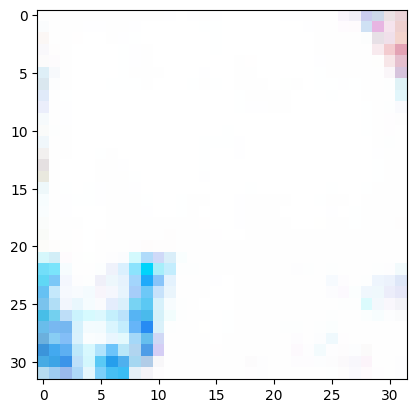

[29/500][0/936]	Loss_D: 0.1286	Loss_G: 6.1533	D(x): 0.8969	D(G(z)): 0.0017 / 0.0025
[29/500][15/936]	Loss_D: 0.0115	Loss_G: 6.3793	D(x): 0.9917	D(G(z)): 0.0031 / 0.0020
[29/500][30/936]	Loss_D: 0.0526	Loss_G: 5.1563	D(x): 0.9767	D(G(z)): 0.0277 / 0.0177
[29/500][45/936]	Loss_D: 0.2636	Loss_G: 6.0677	D(x): 0.9973	D(G(z)): 0.1820 / 0.0062
[29/500][60/936]	Loss_D: 0.0161	Loss_G: 7.2182	D(x): 0.9863	D(G(z)): 0.0021 / 0.0021
[29/500][75/936]	Loss_D: 2.8488	Loss_G: 1.5490	D(x): 0.0844	D(G(z)): 0.0382 / 0.3074
[29/500][90/936]	Loss_D: 0.4755	Loss_G: 4.4736	D(x): 0.6858	D(G(z)): 0.0587 / 0.0237
[29/500][105/936]	Loss_D: 0.1172	Loss_G: 8.1517	D(x): 0.8948	D(G(z)): 0.0006 / 0.0008
[29/500][120/936]	Loss_D: 0.3009	Loss_G: 4.7714	D(x): 0.9885	D(G(z)): 0.2252 / 0.0141
[29/500][135/936]	Loss_D: 0.2105	Loss_G: 5.0682	D(x): 0.8501	D(G(z)): 0.0037 / 0.0068
[29/500][150/936]	Loss_D: 0.0443	Loss_G: 5.0890	D(x): 0.9981	D(G(z)): 0.0402 / 0.0124
[29/500][165/936]	Loss_D: 0.2419	Loss_G: 4.2444	D(x): 0.8040	D

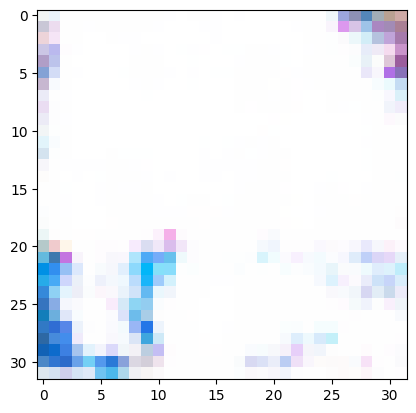

[30/500][0/936]	Loss_D: 0.0317	Loss_G: 5.1938	D(x): 0.9770	D(G(z)): 0.0081 / 0.0076
[30/500][15/936]	Loss_D: 0.0321	Loss_G: 4.8845	D(x): 0.9960	D(G(z)): 0.0270 / 0.0151
[30/500][30/936]	Loss_D: 0.0490	Loss_G: 4.1572	D(x): 0.9994	D(G(z)): 0.0456 / 0.0299
[30/500][45/936]	Loss_D: 0.0165	Loss_G: 5.1025	D(x): 0.9973	D(G(z)): 0.0136 / 0.0076
[30/500][60/936]	Loss_D: 0.0947	Loss_G: 5.8878	D(x): 0.9145	D(G(z)): 0.0021 / 0.0028
[30/500][75/936]	Loss_D: 0.0306	Loss_G: 5.3792	D(x): 0.9769	D(G(z)): 0.0071 / 0.0062
[30/500][90/936]	Loss_D: 0.0081	Loss_G: 6.1976	D(x): 0.9960	D(G(z)): 0.0040 / 0.0042
[30/500][105/936]	Loss_D: 0.0102	Loss_G: 5.9269	D(x): 0.9939	D(G(z)): 0.0041 / 0.0039
[30/500][120/936]	Loss_D: 0.0266	Loss_G: 5.1131	D(x): 0.9844	D(G(z)): 0.0105 / 0.0091
[30/500][135/936]	Loss_D: 0.0038	Loss_G: 6.8762	D(x): 0.9987	D(G(z)): 0.0024 / 0.0021
[30/500][150/936]	Loss_D: 0.0549	Loss_G: 4.6683	D(x): 0.9994	D(G(z)): 0.0511 / 0.0273
[30/500][165/936]	Loss_D: 0.6117	Loss_G: 5.0815	D(x): 0.6096	D

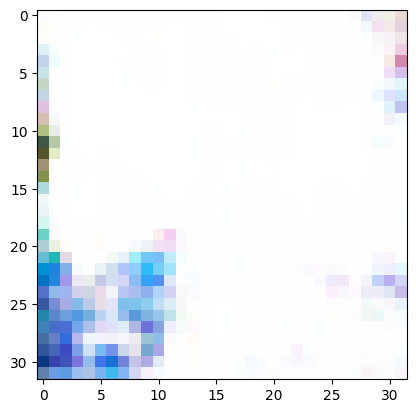

[31/500][0/936]	Loss_D: 0.0293	Loss_G: 5.6277	D(x): 0.9975	D(G(z)): 0.0257 / 0.0168
[31/500][15/936]	Loss_D: 0.7381	Loss_G: 6.3288	D(x): 0.9999	D(G(z)): 0.4325 / 0.0042
[31/500][30/936]	Loss_D: 0.0151	Loss_G: 5.3218	D(x): 0.9932	D(G(z)): 0.0082 / 0.0079
[31/500][45/936]	Loss_D: 0.0595	Loss_G: 4.2455	D(x): 0.9996	D(G(z)): 0.0556 / 0.0253
[31/500][60/936]	Loss_D: 0.2212	Loss_G: 4.3469	D(x): 0.9926	D(G(z)): 0.1826 / 0.0164
[31/500][75/936]	Loss_D: 0.0329	Loss_G: 4.6597	D(x): 0.9925	D(G(z)): 0.0245 / 0.0153
[31/500][90/936]	Loss_D: 0.0483	Loss_G: 4.4177	D(x): 0.9975	D(G(z)): 0.0440 / 0.0220
[31/500][105/936]	Loss_D: 0.0324	Loss_G: 5.1995	D(x): 0.9951	D(G(z)): 0.0267 / 0.0168
[31/500][120/936]	Loss_D: 0.0314	Loss_G: 5.3442	D(x): 0.9948	D(G(z)): 0.0251 / 0.0108
[31/500][135/936]	Loss_D: 0.1637	Loss_G: 7.7289	D(x): 0.8616	D(G(z)): 0.0010 / 0.0014
[31/500][150/936]	Loss_D: 0.1003	Loss_G: 4.6068	D(x): 0.9489	D(G(z)): 0.0420 / 0.0198
[31/500][165/936]	Loss_D: 0.0125	Loss_G: 5.3769	D(x): 0.9997	D

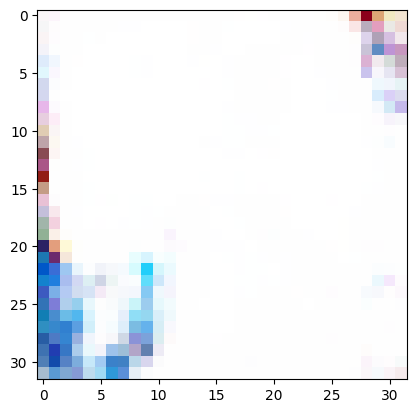

[32/500][0/936]	Loss_D: 0.0073	Loss_G: 6.6345	D(x): 0.9949	D(G(z)): 0.0022 / 0.0015
[32/500][15/936]	Loss_D: 0.0267	Loss_G: 5.7017	D(x): 0.9798	D(G(z)): 0.0061 / 0.0068
[32/500][30/936]	Loss_D: 0.0336	Loss_G: 5.5919	D(x): 0.9731	D(G(z)): 0.0061 / 0.0062
[32/500][45/936]	Loss_D: 0.0552	Loss_G: 4.8258	D(x): 0.9821	D(G(z)): 0.0356 / 0.0151
[32/500][60/936]	Loss_D: 0.1999	Loss_G: 5.0293	D(x): 0.8653	D(G(z)): 0.0332 / 0.0259
[32/500][75/936]	Loss_D: 0.0920	Loss_G: 5.1079	D(x): 1.0000	D(G(z)): 0.0805 / 0.0078
[32/500][90/936]	Loss_D: 0.1004	Loss_G: 7.3798	D(x): 0.9076	D(G(z)): 0.0010 / 0.0017
[32/500][105/936]	Loss_D: 0.0196	Loss_G: 8.3199	D(x): 0.9813	D(G(z)): 0.0005 / 0.0004
[32/500][120/936]	Loss_D: 0.0159	Loss_G: 6.6184	D(x): 0.9912	D(G(z)): 0.0069 / 0.0074
[32/500][135/936]	Loss_D: 0.0409	Loss_G: 7.2566	D(x): 0.9618	D(G(z)): 0.0008 / 0.0009
[32/500][150/936]	Loss_D: 0.2010	Loss_G: 5.4328	D(x): 0.9905	D(G(z)): 0.1542 / 0.0090
[32/500][165/936]	Loss_D: 0.0125	Loss_G: 10.1595	D(x): 0.9878	

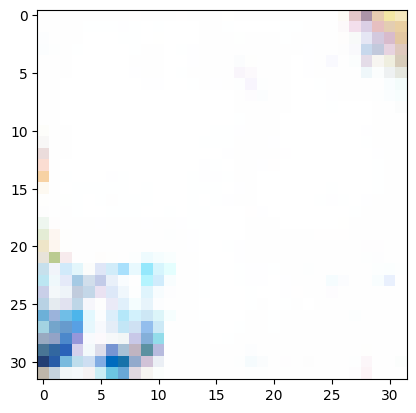

[33/500][0/936]	Loss_D: 0.0093	Loss_G: 6.0381	D(x): 0.9977	D(G(z)): 0.0069 / 0.0051
[33/500][15/936]	Loss_D: 0.0223	Loss_G: 5.4229	D(x): 0.9963	D(G(z)): 0.0180 / 0.0106
[33/500][30/936]	Loss_D: 0.0590	Loss_G: 4.3594	D(x): 0.9934	D(G(z)): 0.0488 / 0.0212
[33/500][45/936]	Loss_D: 0.0395	Loss_G: 5.3611	D(x): 0.9671	D(G(z)): 0.0055 / 0.0066
[33/500][60/936]	Loss_D: 0.0551	Loss_G: 4.5009	D(x): 0.9999	D(G(z)): 0.0512 / 0.0137
[33/500][75/936]	Loss_D: 0.4171	Loss_G: 7.2491	D(x): 0.9995	D(G(z)): 0.3081 / 0.0025
[33/500][90/936]	Loss_D: 0.1518	Loss_G: 4.0483	D(x): 0.8796	D(G(z)): 0.0199 / 0.0231
[33/500][105/936]	Loss_D: 1.2729	Loss_G: 2.8641	D(x): 0.3899	D(G(z)): 0.0079 / 0.1218
[33/500][120/936]	Loss_D: 0.0045	Loss_G: 6.4341	D(x): 0.9982	D(G(z)): 0.0027 / 0.0021
[33/500][135/936]	Loss_D: 0.4978	Loss_G: 3.6826	D(x): 0.6815	D(G(z)): 0.0158 / 0.0499
[33/500][150/936]	Loss_D: 0.0261	Loss_G: 5.1532	D(x): 0.9833	D(G(z)): 0.0091 / 0.0080
[33/500][165/936]	Loss_D: 0.0472	Loss_G: 5.0229	D(x): 0.9770	D

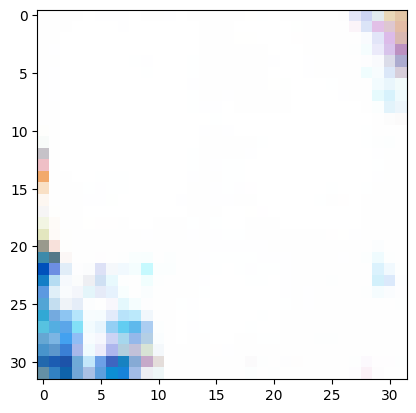

[34/500][0/936]	Loss_D: 0.0494	Loss_G: 4.5689	D(x): 0.9996	D(G(z)): 0.0459 / 0.0121
[34/500][15/936]	Loss_D: 0.0554	Loss_G: 4.0042	D(x): 0.9998	D(G(z)): 0.0527 / 0.0275
[34/500][30/936]	Loss_D: 0.1867	Loss_G: 3.2534	D(x): 0.9984	D(G(z)): 0.1662 / 0.0425
[34/500][45/936]	Loss_D: 0.2098	Loss_G: 4.5892	D(x): 0.8265	D(G(z)): 0.0099 / 0.0144
[34/500][60/936]	Loss_D: 0.0100	Loss_G: 5.4163	D(x): 0.9987	D(G(z)): 0.0086 / 0.0066
[34/500][75/936]	Loss_D: 0.0718	Loss_G: 5.0318	D(x): 0.9373	D(G(z)): 0.0067 / 0.0093
[34/500][90/936]	Loss_D: 0.1084	Loss_G: 6.9417	D(x): 0.9009	D(G(z)): 0.0014 / 0.0021
[34/500][105/936]	Loss_D: 0.1432	Loss_G: 4.4286	D(x): 0.8872	D(G(z)): 0.0138 / 0.0146
[34/500][120/936]	Loss_D: 0.0044	Loss_G: 6.4947	D(x): 0.9993	D(G(z)): 0.0037 / 0.0035
[34/500][135/936]	Loss_D: 0.0162	Loss_G: 5.0060	D(x): 0.9978	D(G(z)): 0.0138 / 0.0110
[34/500][150/936]	Loss_D: 0.0096	Loss_G: 5.8959	D(x): 0.9940	D(G(z)): 0.0035 / 0.0031
[34/500][165/936]	Loss_D: 0.0418	Loss_G: 4.2365	D(x): 0.9780	D

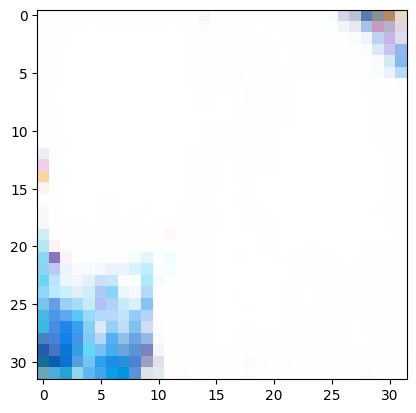

[35/500][0/936]	Loss_D: 0.0097	Loss_G: 9.3046	D(x): 0.9906	D(G(z)): 0.0002 / 0.0002
[35/500][15/936]	Loss_D: 0.0060	Loss_G: 11.1630	D(x): 0.9942	D(G(z)): 0.0001 / 0.0001
[35/500][30/936]	Loss_D: 0.4578	Loss_G: 7.9742	D(x): 0.9949	D(G(z)): 0.2675 / 0.0004
[35/500][45/936]	Loss_D: 0.0240	Loss_G: 3.9478	D(x): 0.9995	D(G(z)): 0.0229 / 0.0365
[35/500][60/936]	Loss_D: 0.0591	Loss_G: 8.2758	D(x): 0.9449	D(G(z)): 0.0010 / 0.0019
[35/500][75/936]	Loss_D: 0.2212	Loss_G: 4.5341	D(x): 0.9995	D(G(z)): 0.1802 / 0.0158
[35/500][90/936]	Loss_D: 0.2388	Loss_G: 5.7267	D(x): 0.8270	D(G(z)): 0.0073 / 0.0210
[35/500][105/936]	Loss_D: 0.1365	Loss_G: 5.0201	D(x): 0.8903	D(G(z)): 0.0076 / 0.0133
[35/500][120/936]	Loss_D: 0.0438	Loss_G: 4.4796	D(x): 0.9833	D(G(z)): 0.0263 / 0.0126
[35/500][135/936]	Loss_D: 0.0070	Loss_G: 7.4558	D(x): 0.9942	D(G(z)): 0.0012 / 0.0012
[35/500][150/936]	Loss_D: 0.0065	Loss_G: 5.9875	D(x): 0.9968	D(G(z)): 0.0033 / 0.0031
[35/500][165/936]	Loss_D: 0.0483	Loss_G: 4.6634	D(x): 0.9939	

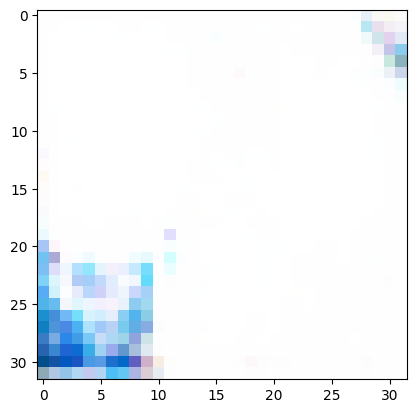

[36/500][0/936]	Loss_D: 0.0251	Loss_G: 6.5518	D(x): 0.9955	D(G(z)): 0.0201 / 0.0152
[36/500][15/936]	Loss_D: 0.0170	Loss_G: 5.4079	D(x): 0.9994	D(G(z)): 0.0161 / 0.0082
[36/500][30/936]	Loss_D: 0.0035	Loss_G: 6.6701	D(x): 0.9999	D(G(z)): 0.0034 / 0.0033
[36/500][45/936]	Loss_D: 0.0185	Loss_G: 7.2945	D(x): 0.9825	D(G(z)): 0.0007 / 0.0010
[36/500][60/936]	Loss_D: 0.1072	Loss_G: 4.8023	D(x): 1.0000	D(G(z)): 0.0913 / 0.0147
[36/500][75/936]	Loss_D: 0.3887	Loss_G: 4.2505	D(x): 0.7208	D(G(z)): 0.0161 / 0.0492
[36/500][90/936]	Loss_D: 0.0299	Loss_G: 6.0159	D(x): 0.9755	D(G(z)): 0.0049 / 0.0043
[36/500][105/936]	Loss_D: 0.0571	Loss_G: 5.3083	D(x): 0.9631	D(G(z)): 0.0190 / 0.0132
[36/500][120/936]	Loss_D: 0.0062	Loss_G: 5.8814	D(x): 0.9991	D(G(z)): 0.0053 / 0.0049
[36/500][135/936]	Loss_D: 0.0095	Loss_G: 6.7216	D(x): 0.9931	D(G(z)): 0.0026 / 0.0025
[36/500][150/936]	Loss_D: 0.0198	Loss_G: 5.2199	D(x): 0.9935	D(G(z)): 0.0132 / 0.0084
[36/500][165/936]	Loss_D: 0.3089	Loss_G: 7.9457	D(x): 0.7809	D

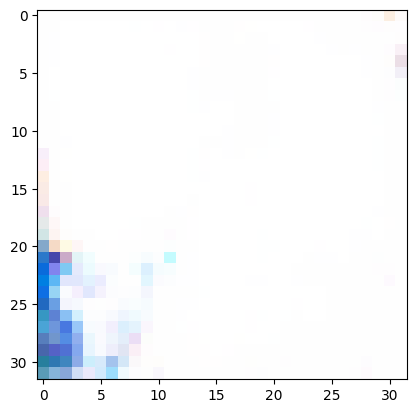

[37/500][0/936]	Loss_D: 0.0715	Loss_G: 5.6772	D(x): 0.9351	D(G(z)): 0.0028 / 0.0041
[37/500][15/936]	Loss_D: 0.0164	Loss_G: 4.6065	D(x): 0.9993	D(G(z)): 0.0156 / 0.0118
[37/500][30/936]	Loss_D: 0.0155	Loss_G: 4.5025	D(x): 1.0000	D(G(z)): 0.0152 / 0.0150
[37/500][45/936]	Loss_D: 0.1538	Loss_G: 5.5712	D(x): 0.9935	D(G(z)): 0.1285 / 0.0056
[37/500][60/936]	Loss_D: 0.0040	Loss_G: 6.5973	D(x): 0.9985	D(G(z)): 0.0025 / 0.0018
[37/500][75/936]	Loss_D: 0.0069	Loss_G: 7.6402	D(x): 0.9949	D(G(z)): 0.0017 / 0.0014
[37/500][90/936]	Loss_D: 0.0315	Loss_G: 8.4243	D(x): 0.9693	D(G(z)): 0.0003 / 0.0003
[37/500][105/936]	Loss_D: 0.1818	Loss_G: 8.0057	D(x): 0.9927	D(G(z)): 0.1263 / 0.0005
[37/500][120/936]	Loss_D: 0.0432	Loss_G: 4.8526	D(x): 0.9982	D(G(z)): 0.0391 / 0.0168
[37/500][135/936]	Loss_D: 0.1239	Loss_G: 6.4068	D(x): 0.8950	D(G(z)): 0.0019 / 0.0028
[37/500][150/936]	Loss_D: 0.1041	Loss_G: 4.5138	D(x): 0.9996	D(G(z)): 0.0923 / 0.0163
[37/500][165/936]	Loss_D: 0.0698	Loss_G: 5.0753	D(x): 1.0000	D

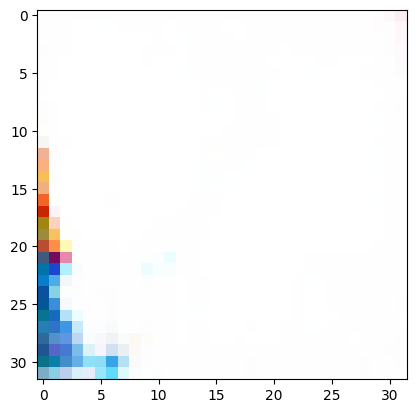

[38/500][0/936]	Loss_D: 0.0113	Loss_G: 5.6171	D(x): 0.9988	D(G(z)): 0.0101 / 0.0054
[38/500][15/936]	Loss_D: 0.0069	Loss_G: 5.3201	D(x): 0.9997	D(G(z)): 0.0066 / 0.0059
[38/500][30/936]	Loss_D: 0.0019	Loss_G: 7.0718	D(x): 1.0000	D(G(z)): 0.0019 / 0.0016
[38/500][45/936]	Loss_D: 0.1610	Loss_G: 3.9766	D(x): 0.9996	D(G(z)): 0.1414 / 0.0294
[38/500][60/936]	Loss_D: 0.0149	Loss_G: 4.7109	D(x): 0.9999	D(G(z)): 0.0147 / 0.0119
[38/500][75/936]	Loss_D: 0.0141	Loss_G: 4.8118	D(x): 0.9980	D(G(z)): 0.0120 / 0.0111
[38/500][90/936]	Loss_D: 0.3526	Loss_G: 4.7850	D(x): 0.7417	D(G(z)): 0.0088 / 0.0307
[38/500][105/936]	Loss_D: 0.0073	Loss_G: 5.1951	D(x): 0.9988	D(G(z)): 0.0061 / 0.0063
[38/500][120/936]	Loss_D: 0.0208	Loss_G: 7.5933	D(x): 0.9808	D(G(z)): 0.0012 / 0.0013
[38/500][135/936]	Loss_D: 0.0120	Loss_G: 4.8548	D(x): 1.0000	D(G(z)): 0.0119 / 0.0098
[38/500][150/936]	Loss_D: 0.0279	Loss_G: 4.6071	D(x): 0.9999	D(G(z)): 0.0272 / 0.0163
[38/500][165/936]	Loss_D: 0.0021	Loss_G: 7.3474	D(x): 0.9993	D

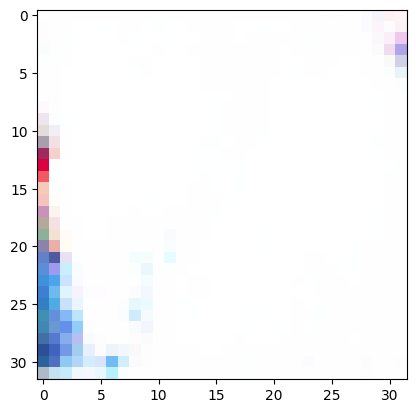

[39/500][0/936]	Loss_D: 0.1448	Loss_G: 2.2864	D(x): 0.9908	D(G(z)): 0.1262 / 0.1208
[39/500][15/936]	Loss_D: 0.0200	Loss_G: 5.2331	D(x): 0.9867	D(G(z)): 0.0066 / 0.0071
[39/500][30/936]	Loss_D: 0.0153	Loss_G: 7.2152	D(x): 0.9865	D(G(z)): 0.0017 / 0.0019
[39/500][45/936]	Loss_D: 0.1455	Loss_G: 5.3997	D(x): 0.9995	D(G(z)): 0.1184 / 0.0047
[39/500][60/936]	Loss_D: 0.0427	Loss_G: 6.6166	D(x): 0.9994	D(G(z)): 0.0392 / 0.0036
[39/500][75/936]	Loss_D: 0.3830	Loss_G: 5.3743	D(x): 0.7027	D(G(z)): 0.0016 / 0.0051
[39/500][90/936]	Loss_D: 0.1741	Loss_G: 4.8047	D(x): 1.0000	D(G(z)): 0.1548 / 0.0119
[39/500][105/936]	Loss_D: 0.0151	Loss_G: 5.3250	D(x): 0.9975	D(G(z)): 0.0124 / 0.0082
[39/500][120/936]	Loss_D: 0.0018	Loss_G: 6.8759	D(x): 1.0000	D(G(z)): 0.0018 / 0.0018
[39/500][135/936]	Loss_D: 0.0669	Loss_G: 5.3622	D(x): 0.9895	D(G(z)): 0.0522 / 0.0143
[39/500][150/936]	Loss_D: 0.0123	Loss_G: 4.6999	D(x): 0.9999	D(G(z)): 0.0121 / 0.0106
[39/500][165/936]	Loss_D: 0.0090	Loss_G: 6.8439	D(x): 0.9948	D

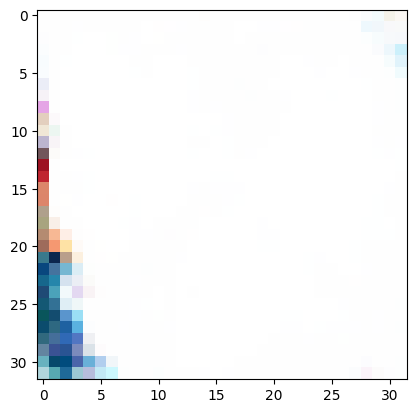

[40/500][0/936]	Loss_D: 0.0039	Loss_G: 6.3842	D(x): 0.9985	D(G(z)): 0.0025 / 0.0024
[40/500][15/936]	Loss_D: 0.0088	Loss_G: 6.8955	D(x): 0.9925	D(G(z)): 0.0012 / 0.0015
[40/500][30/936]	Loss_D: 0.1975	Loss_G: 4.0590	D(x): 0.8470	D(G(z)): 0.0113 / 0.0210
[40/500][45/936]	Loss_D: 0.0200	Loss_G: 5.3552	D(x): 0.9935	D(G(z)): 0.0132 / 0.0090
[40/500][60/936]	Loss_D: 0.0192	Loss_G: 4.9277	D(x): 0.9992	D(G(z)): 0.0181 / 0.0124
[40/500][75/936]	Loss_D: 0.0597	Loss_G: 5.3349	D(x): 1.0000	D(G(z)): 0.0550 / 0.0127
[40/500][90/936]	Loss_D: 0.0200	Loss_G: 4.9374	D(x): 0.9999	D(G(z)): 0.0195 / 0.0108
[40/500][105/936]	Loss_D: 0.0323	Loss_G: 5.1796	D(x): 0.9986	D(G(z)): 0.0300 / 0.0202
[40/500][120/936]	Loss_D: 0.0008	Loss_G: 7.8043	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[40/500][135/936]	Loss_D: 0.0015	Loss_G: 8.7379	D(x): 0.9994	D(G(z)): 0.0008 / 0.0007
[40/500][150/936]	Loss_D: 0.0048	Loss_G: 7.5032	D(x): 0.9996	D(G(z)): 0.0045 / 0.0030
[40/500][165/936]	Loss_D: 0.0159	Loss_G: 5.8912	D(x): 0.9911	D

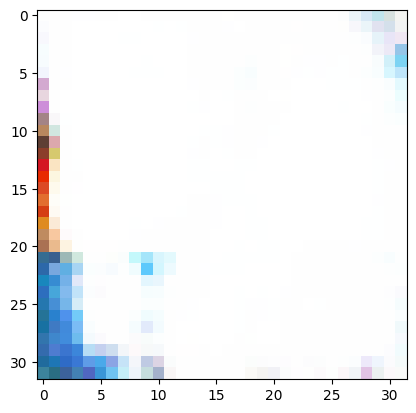

[41/500][0/936]	Loss_D: 0.0054	Loss_G: 6.5572	D(x): 0.9999	D(G(z)): 0.0053 / 0.0049
[41/500][15/936]	Loss_D: 0.0032	Loss_G: 6.2774	D(x): 1.0000	D(G(z)): 0.0032 / 0.0039
[41/500][30/936]	Loss_D: 0.2657	Loss_G: 5.8192	D(x): 0.9996	D(G(z)): 0.1779 / 0.0123
[41/500][45/936]	Loss_D: 0.3139	Loss_G: 4.2062	D(x): 0.7679	D(G(z)): 0.0078 / 0.0173
[41/500][60/936]	Loss_D: 0.0671	Loss_G: 3.2789	D(x): 1.0000	D(G(z)): 0.0641 / 0.0615
[41/500][75/936]	Loss_D: 0.0120	Loss_G: 5.7744	D(x): 0.9942	D(G(z)): 0.0061 / 0.0055
[41/500][90/936]	Loss_D: 0.0345	Loss_G: 5.2954	D(x): 0.9997	D(G(z)): 0.0330 / 0.0187
[41/500][105/936]	Loss_D: 0.2824	Loss_G: 5.9947	D(x): 0.9945	D(G(z)): 0.1814 / 0.0035
[41/500][120/936]	Loss_D: 0.2983	Loss_G: 5.0676	D(x): 0.9965	D(G(z)): 0.1930 / 0.0089
[41/500][135/936]	Loss_D: 0.0884	Loss_G: 4.9296	D(x): 0.9367	D(G(z)): 0.0215 / 0.0201
[41/500][150/936]	Loss_D: 0.0527	Loss_G: 4.3106	D(x): 0.9961	D(G(z)): 0.0459 / 0.0227
[41/500][165/936]	Loss_D: 0.0385	Loss_G: 4.7171	D(x): 0.9999	D

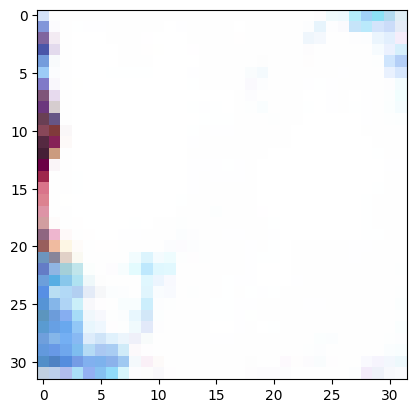

[42/500][0/936]	Loss_D: 0.0062	Loss_G: 8.3004	D(x): 0.9956	D(G(z)): 0.0018 / 0.0012
[42/500][15/936]	Loss_D: 0.0837	Loss_G: 4.4512	D(x): 0.9999	D(G(z)): 0.0765 / 0.0159
[42/500][30/936]	Loss_D: 0.0100	Loss_G: 7.2655	D(x): 0.9914	D(G(z)): 0.0013 / 0.0012
[42/500][45/936]	Loss_D: 0.1502	Loss_G: 4.5568	D(x): 0.8716	D(G(z)): 0.0092 / 0.0166
[42/500][60/936]	Loss_D: 0.1091	Loss_G: 4.6479	D(x): 0.9999	D(G(z)): 0.1006 / 0.0100
[42/500][75/936]	Loss_D: 0.0095	Loss_G: 5.4359	D(x): 0.9999	D(G(z)): 0.0093 / 0.0078
[42/500][90/936]	Loss_D: 0.0016	Loss_G: 7.4358	D(x): 0.9999	D(G(z)): 0.0015 / 0.0015
[42/500][105/936]	Loss_D: 0.0943	Loss_G: 2.9113	D(x): 0.9955	D(G(z)): 0.0835 / 0.0856
[42/500][120/936]	Loss_D: 0.0289	Loss_G: 5.0453	D(x): 0.9781	D(G(z)): 0.0067 / 0.0152
[42/500][135/936]	Loss_D: 0.0325	Loss_G: 5.0452	D(x): 0.9996	D(G(z)): 0.0311 / 0.0173
[42/500][150/936]	Loss_D: 0.0041	Loss_G: 6.3427	D(x): 0.9999	D(G(z)): 0.0040 / 0.0032
[42/500][165/936]	Loss_D: 0.0276	Loss_G: 6.5886	D(x): 0.9763	D

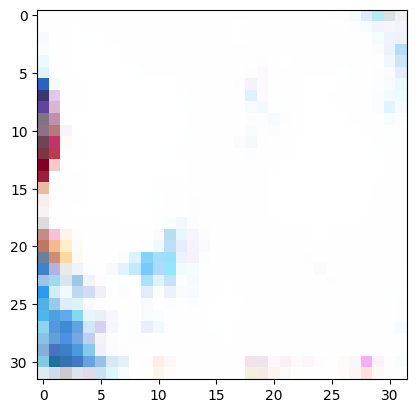

[43/500][0/936]	Loss_D: 0.0039	Loss_G: 6.1820	D(x): 0.9998	D(G(z)): 0.0036 / 0.0033
[43/500][15/936]	Loss_D: 0.2557	Loss_G: 6.0750	D(x): 0.9865	D(G(z)): 0.1662 / 0.0033
[43/500][30/936]	Loss_D: 0.1893	Loss_G: 5.9910	D(x): 0.8358	D(G(z)): 0.0038 / 0.0101
[43/500][45/936]	Loss_D: 0.0212	Loss_G: 3.8073	D(x): 0.9974	D(G(z)): 0.0184 / 0.0295
[43/500][60/936]	Loss_D: 0.0188	Loss_G: 4.8965	D(x): 0.9987	D(G(z)): 0.0173 / 0.0085
[43/500][75/936]	Loss_D: 0.1200	Loss_G: 4.4184	D(x): 0.9998	D(G(z)): 0.1044 / 0.0331
[43/500][90/936]	Loss_D: 0.0453	Loss_G: 4.3380	D(x): 0.9790	D(G(z)): 0.0234 / 0.0145
[43/500][105/936]	Loss_D: 0.0081	Loss_G: 5.3693	D(x): 0.9992	D(G(z)): 0.0073 / 0.0059
[43/500][120/936]	Loss_D: 0.0151	Loss_G: 6.7584	D(x): 0.9926	D(G(z)): 0.0076 / 0.0048
[43/500][135/936]	Loss_D: 0.8751	Loss_G: 3.3537	D(x): 0.5836	D(G(z)): 0.0590 / 0.0549
[43/500][150/936]	Loss_D: 0.0753	Loss_G: 4.6875	D(x): 1.0000	D(G(z)): 0.0662 / 0.0132
[43/500][165/936]	Loss_D: 0.0024	Loss_G: 7.6781	D(x): 0.9987	D

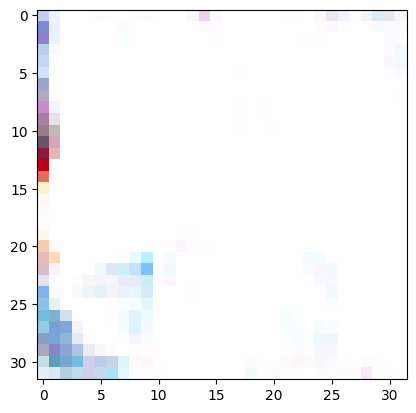

[44/500][0/936]	Loss_D: 0.0121	Loss_G: 6.3890	D(x): 0.9992	D(G(z)): 0.0111 / 0.0087
[44/500][15/936]	Loss_D: 0.0039	Loss_G: 6.9344	D(x): 0.9983	D(G(z)): 0.0022 / 0.0020
[44/500][30/936]	Loss_D: 0.0026	Loss_G: 7.5661	D(x): 0.9989	D(G(z)): 0.0015 / 0.0014
[44/500][45/936]	Loss_D: 0.0160	Loss_G: 5.6558	D(x): 0.9926	D(G(z)): 0.0085 / 0.0038
[44/500][60/936]	Loss_D: 0.0218	Loss_G: 4.8533	D(x): 0.9951	D(G(z)): 0.0166 / 0.0123
[44/500][75/936]	Loss_D: 0.0067	Loss_G: 5.8648	D(x): 0.9984	D(G(z)): 0.0050 / 0.0037
[44/500][90/936]	Loss_D: 0.0010	Loss_G: 7.5328	D(x): 0.9999	D(G(z)): 0.0009 / 0.0009
[44/500][105/936]	Loss_D: 0.0107	Loss_G: 5.5890	D(x): 0.9996	D(G(z)): 0.0102 / 0.0093
[44/500][120/936]	Loss_D: 0.0817	Loss_G: 4.8144	D(x): 0.9989	D(G(z)): 0.0730 / 0.0163
[44/500][135/936]	Loss_D: 0.0145	Loss_G: 5.3604	D(x): 0.9994	D(G(z)): 0.0138 / 0.0079
[44/500][150/936]	Loss_D: 0.0822	Loss_G: 5.5453	D(x): 0.9319	D(G(z)): 0.0049 / 0.0063
[44/500][165/936]	Loss_D: 0.0555	Loss_G: 7.2832	D(x): 0.9531	D

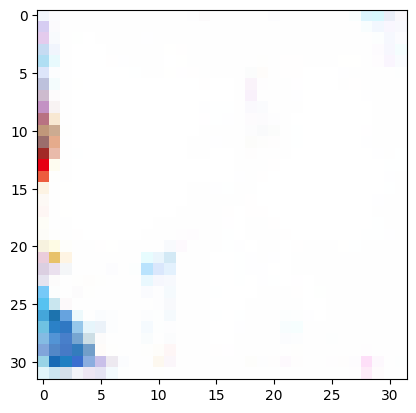

[45/500][0/936]	Loss_D: 0.0034	Loss_G: 6.8667	D(x): 0.9997	D(G(z)): 0.0031 / 0.0033
[45/500][15/936]	Loss_D: 0.0139	Loss_G: 6.3855	D(x): 0.9957	D(G(z)): 0.0094 / 0.0094
[45/500][30/936]	Loss_D: 0.0251	Loss_G: 5.8922	D(x): 0.9983	D(G(z)): 0.0226 / 0.0102
[45/500][45/936]	Loss_D: 0.0544	Loss_G: 6.5077	D(x): 0.9530	D(G(z)): 0.0041 / 0.0053
[45/500][60/936]	Loss_D: 0.0085	Loss_G: 5.9304	D(x): 1.0000	D(G(z)): 0.0084 / 0.0064
[45/500][75/936]	Loss_D: 0.1632	Loss_G: 5.4555	D(x): 1.0000	D(G(z)): 0.1266 / 0.0058
[45/500][90/936]	Loss_D: 0.0164	Loss_G: 6.0167	D(x): 0.9881	D(G(z)): 0.0042 / 0.0070
[45/500][105/936]	Loss_D: 0.0036	Loss_G: 6.3121	D(x): 0.9999	D(G(z)): 0.0034 / 0.0027
[45/500][120/936]	Loss_D: 0.0123	Loss_G: 5.4683	D(x): 0.9963	D(G(z)): 0.0085 / 0.0065
[45/500][135/936]	Loss_D: 0.0058	Loss_G: 7.2331	D(x): 0.9968	D(G(z)): 0.0027 / 0.0021
[45/500][150/936]	Loss_D: 0.0262	Loss_G: 7.0363	D(x): 0.9791	D(G(z)): 0.0047 / 0.0039
[45/500][165/936]	Loss_D: 0.0018	Loss_G: 7.2328	D(x): 0.9999	D

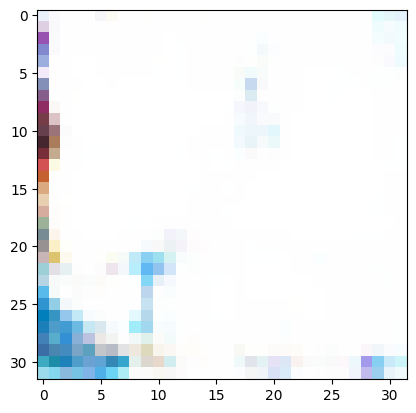

[46/500][0/936]	Loss_D: 0.2628	Loss_G: 7.0847	D(x): 1.0000	D(G(z)): 0.1958 / 0.0069
[46/500][15/936]	Loss_D: 0.0143	Loss_G: 7.1785	D(x): 0.9899	D(G(z)): 0.0039 / 0.0026
[46/500][30/936]	Loss_D: 1.5557	Loss_G: 2.0575	D(x): 0.4670	D(G(z)): 0.0164 / 0.1365
[46/500][45/936]	Loss_D: 0.0036	Loss_G: 7.1845	D(x): 0.9998	D(G(z)): 0.0033 / 0.0032
[46/500][60/936]	Loss_D: 0.0395	Loss_G: 6.8191	D(x): 0.9635	D(G(z)): 0.0017 / 0.0026
[46/500][75/936]	Loss_D: 0.0041	Loss_G: 6.5985	D(x): 0.9973	D(G(z)): 0.0014 / 0.0015
[46/500][90/936]	Loss_D: 0.0548	Loss_G: 4.5338	D(x): 0.9619	D(G(z)): 0.0151 / 0.0142
[46/500][105/936]	Loss_D: 0.0066	Loss_G: 6.3068	D(x): 0.9961	D(G(z)): 0.0027 / 0.0028
[46/500][120/936]	Loss_D: 0.0188	Loss_G: 9.5120	D(x): 0.9823	D(G(z)): 0.0004 / 0.0004
[46/500][135/936]	Loss_D: 0.1347	Loss_G: 5.0241	D(x): 0.8981	D(G(z)): 0.0221 / 0.0241
[46/500][150/936]	Loss_D: 0.0023	Loss_G: 7.3705	D(x): 0.9991	D(G(z)): 0.0014 / 0.0014
[46/500][165/936]	Loss_D: 0.0050	Loss_G: 7.0794	D(x): 0.9999	D

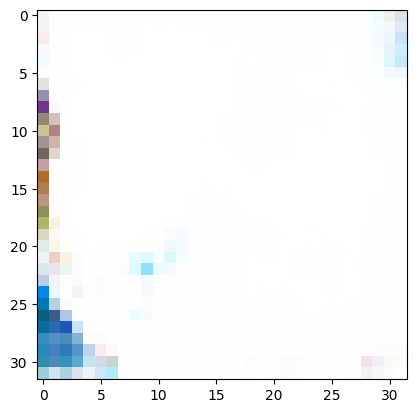

[47/500][0/936]	Loss_D: 0.2607	Loss_G: 4.8428	D(x): 0.7914	D(G(z)): 0.0031 / 0.0110
[47/500][15/936]	Loss_D: 0.0105	Loss_G: 7.1196	D(x): 0.9944	D(G(z)): 0.0048 / 0.0035
[47/500][30/936]	Loss_D: 0.0084	Loss_G: 7.5653	D(x): 0.9927	D(G(z)): 0.0010 / 0.0009
[47/500][45/936]	Loss_D: 0.0118	Loss_G: 5.0813	D(x): 0.9994	D(G(z)): 0.0111 / 0.0088
[47/500][60/936]	Loss_D: 0.0431	Loss_G: 7.9675	D(x): 0.9597	D(G(z)): 0.0003 / 0.0004
[47/500][75/936]	Loss_D: 0.0201	Loss_G: 4.7978	D(x): 1.0000	D(G(z)): 0.0197 / 0.0140
[47/500][90/936]	Loss_D: 0.0033	Loss_G: 6.3822	D(x): 0.9986	D(G(z)): 0.0018 / 0.0018
[47/500][105/936]	Loss_D: 0.0037	Loss_G: 6.5550	D(x): 0.9983	D(G(z)): 0.0020 / 0.0018
[47/500][120/936]	Loss_D: 0.6458	Loss_G: 3.1641	D(x): 0.5754	D(G(z)): 0.0124 / 0.0899
[47/500][135/936]	Loss_D: 0.2632	Loss_G: 4.7590	D(x): 0.7892	D(G(z)): 0.0042 / 0.0171
[47/500][150/936]	Loss_D: 0.0028	Loss_G: 6.4288	D(x): 0.9997	D(G(z)): 0.0025 / 0.0019
[47/500][165/936]	Loss_D: 0.3516	Loss_G: 5.5101	D(x): 0.7531	D

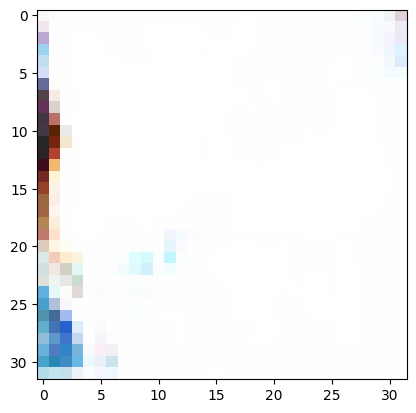

[48/500][0/936]	Loss_D: 0.0020	Loss_G: 6.3228	D(x): 1.0000	D(G(z)): 0.0020 / 0.0021
[48/500][15/936]	Loss_D: 0.0231	Loss_G: 5.6806	D(x): 0.9867	D(G(z)): 0.0094 / 0.0077
[48/500][30/936]	Loss_D: 0.0089	Loss_G: 6.5492	D(x): 0.9997	D(G(z)): 0.0085 / 0.0072
[48/500][45/936]	Loss_D: 0.0355	Loss_G: 7.6848	D(x): 0.9665	D(G(z)): 0.0005 / 0.0006
[48/500][60/936]	Loss_D: 0.0019	Loss_G: 7.3046	D(x): 0.9991	D(G(z)): 0.0010 / 0.0010
[48/500][75/936]	Loss_D: 0.4219	Loss_G: 3.9720	D(x): 0.6970	D(G(z)): 0.0065 / 0.0250
[48/500][90/936]	Loss_D: 0.0294	Loss_G: 5.0488	D(x): 0.9878	D(G(z)): 0.0167 / 0.0112
[48/500][105/936]	Loss_D: 0.0324	Loss_G: 5.5048	D(x): 0.9767	D(G(z)): 0.0084 / 0.0057
[48/500][120/936]	Loss_D: 0.8470	Loss_G: 3.8219	D(x): 0.5218	D(G(z)): 0.0083 / 0.0601
[48/500][135/936]	Loss_D: 0.0887	Loss_G: 5.8203	D(x): 0.9991	D(G(z)): 0.0800 / 0.0048
[48/500][150/936]	Loss_D: 0.0032	Loss_G: 7.5172	D(x): 0.9974	D(G(z)): 0.0006 / 0.0007
[48/500][165/936]	Loss_D: 0.0688	Loss_G: 4.8788	D(x): 0.9927	D

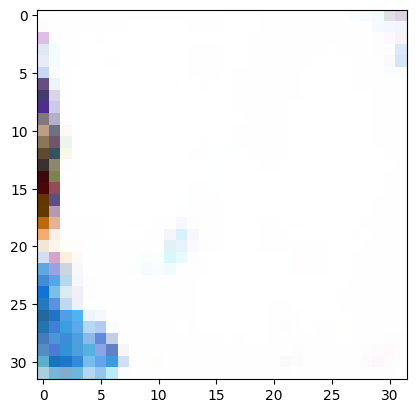

[49/500][0/936]	Loss_D: 0.0101	Loss_G: 6.1299	D(x): 0.9996	D(G(z)): 0.0096 / 0.0082
[49/500][15/936]	Loss_D: 0.0583	Loss_G: 8.0450	D(x): 0.9452	D(G(z)): 0.0012 / 0.0017
[49/500][30/936]	Loss_D: 0.0050	Loss_G: 5.5330	D(x): 0.9997	D(G(z)): 0.0046 / 0.0043
[49/500][45/936]	Loss_D: 0.0309	Loss_G: 5.9440	D(x): 0.9962	D(G(z)): 0.0258 / 0.0042
[49/500][60/936]	Loss_D: 0.1181	Loss_G: 7.2138	D(x): 0.8990	D(G(z)): 0.0018 / 0.0027
[49/500][75/936]	Loss_D: 0.2663	Loss_G: 4.7710	D(x): 0.9997	D(G(z)): 0.2101 / 0.0105
[49/500][90/936]	Loss_D: 0.0016	Loss_G: 6.7380	D(x): 0.9997	D(G(z)): 0.0013 / 0.0019
[49/500][105/936]	Loss_D: 0.0037	Loss_G: 6.8225	D(x): 0.9998	D(G(z)): 0.0035 / 0.0022
[49/500][120/936]	Loss_D: 0.0085	Loss_G: 5.4407	D(x): 0.9999	D(G(z)): 0.0083 / 0.0056
[49/500][135/936]	Loss_D: 0.0397	Loss_G: 4.1783	D(x): 0.9985	D(G(z)): 0.0372 / 0.0171
[49/500][150/936]	Loss_D: 0.1740	Loss_G: 7.7266	D(x): 0.8425	D(G(z)): 0.0004 / 0.0008
[49/500][165/936]	Loss_D: 0.0232	Loss_G: 4.6717	D(x): 0.9987	D

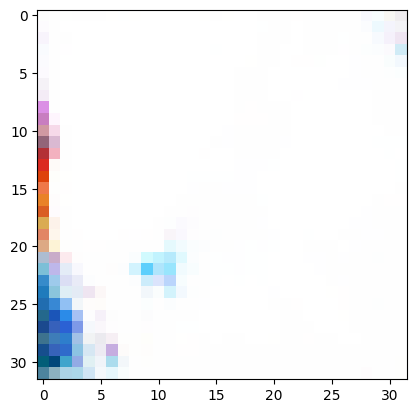

[50/500][0/936]	Loss_D: 0.2311	Loss_G: 7.2320	D(x): 1.0000	D(G(z)): 0.1695 / 0.0066
[50/500][15/936]	Loss_D: 0.0179	Loss_G: 4.8504	D(x): 1.0000	D(G(z)): 0.0176 / 0.0112
[50/500][30/936]	Loss_D: 0.1744	Loss_G: 4.9812	D(x): 0.9999	D(G(z)): 0.1435 / 0.0090
[50/500][45/936]	Loss_D: 0.0055	Loss_G: 7.2292	D(x): 0.9967	D(G(z)): 0.0022 / 0.0022
[50/500][60/936]	Loss_D: 0.0038	Loss_G: 7.2206	D(x): 0.9972	D(G(z)): 0.0011 / 0.0009
[50/500][75/936]	Loss_D: 0.0654	Loss_G: 8.0622	D(x): 0.9435	D(G(z)): 0.0017 / 0.0022
[50/500][90/936]	Loss_D: 0.0060	Loss_G: 5.3201	D(x): 1.0000	D(G(z)): 0.0059 / 0.0059
[50/500][105/936]	Loss_D: 0.0051	Loss_G: 6.8861	D(x): 0.9997	D(G(z)): 0.0048 / 0.0035
[50/500][120/936]	Loss_D: 0.0789	Loss_G: 4.8948	D(x): 0.9334	D(G(z)): 0.0077 / 0.0100
[50/500][135/936]	Loss_D: 0.0115	Loss_G: 8.6740	D(x): 0.9895	D(G(z)): 0.0010 / 0.0009
[50/500][150/936]	Loss_D: 0.0054	Loss_G: 6.0954	D(x): 1.0000	D(G(z)): 0.0054 / 0.0051
[50/500][165/936]	Loss_D: 0.0071	Loss_G: 5.6276	D(x): 0.9971	D

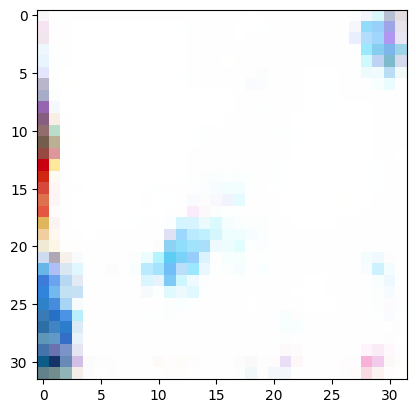

[51/500][0/936]	Loss_D: 0.0008	Loss_G: 7.5405	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[51/500][15/936]	Loss_D: 0.0016	Loss_G: 8.8144	D(x): 0.9998	D(G(z)): 0.0013 / 0.0011
[51/500][30/936]	Loss_D: 0.0065	Loss_G: 6.4167	D(x): 0.9993	D(G(z)): 0.0058 / 0.0044
[51/500][45/936]	Loss_D: 0.0023	Loss_G: 7.5099	D(x): 0.9999	D(G(z)): 0.0022 / 0.0021
[51/500][60/936]	Loss_D: 0.0059	Loss_G: 6.4440	D(x): 0.9967	D(G(z)): 0.0026 / 0.0018
[51/500][75/936]	Loss_D: 0.0131	Loss_G: 5.4701	D(x): 1.0000	D(G(z)): 0.0128 / 0.0085
[51/500][90/936]	Loss_D: 0.0081	Loss_G: 5.8370	D(x): 0.9985	D(G(z)): 0.0065 / 0.0058
[51/500][105/936]	Loss_D: 0.0080	Loss_G: 6.5389	D(x): 0.9969	D(G(z)): 0.0049 / 0.0041
[51/500][120/936]	Loss_D: 0.0185	Loss_G: 6.4133	D(x): 0.9999	D(G(z)): 0.0179 / 0.0042
[51/500][135/936]	Loss_D: 0.2939	Loss_G: 9.0358	D(x): 0.9997	D(G(z)): 0.1865 / 0.0053
[51/500][150/936]	Loss_D: 0.0064	Loss_G: 7.3917	D(x): 0.9999	D(G(z)): 0.0063 / 0.0053
[51/500][165/936]	Loss_D: 0.0179	Loss_G: 5.8698	D(x): 0.9973	D

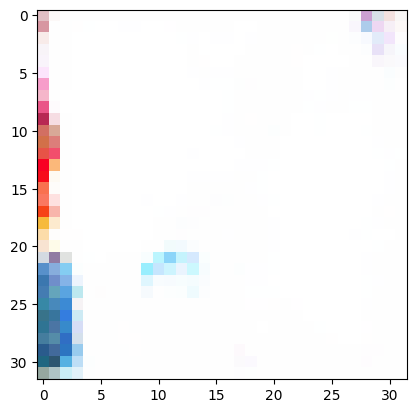

[52/500][0/936]	Loss_D: 0.0355	Loss_G: 5.1373	D(x): 0.9999	D(G(z)): 0.0340 / 0.0153
[52/500][15/936]	Loss_D: 0.0407	Loss_G: 5.9294	D(x): 0.9653	D(G(z)): 0.0037 / 0.0042
[52/500][30/936]	Loss_D: 0.0177	Loss_G: 4.7138	D(x): 0.9999	D(G(z)): 0.0173 / 0.0113
[52/500][45/936]	Loss_D: 0.1630	Loss_G: 3.7020	D(x): 0.8814	D(G(z)): 0.0348 / 0.0307
[52/500][60/936]	Loss_D: 0.0010	Loss_G: 7.7126	D(x): 0.9996	D(G(z)): 0.0006 / 0.0006
[52/500][75/936]	Loss_D: 0.2897	Loss_G: 5.8028	D(x): 0.9811	D(G(z)): 0.1979 / 0.0038
[52/500][90/936]	Loss_D: 0.1321	Loss_G: 3.0900	D(x): 0.9973	D(G(z)): 0.1153 / 0.0794
[52/500][105/936]	Loss_D: 0.1936	Loss_G: 6.6109	D(x): 0.8428	D(G(z)): 0.0010 / 0.0039
[52/500][120/936]	Loss_D: 0.0396	Loss_G: 5.1111	D(x): 0.9945	D(G(z)): 0.0326 / 0.0093
[52/500][135/936]	Loss_D: 0.0093	Loss_G: 4.9883	D(x): 0.9995	D(G(z)): 0.0088 / 0.0076
[52/500][150/936]	Loss_D: 0.0134	Loss_G: 5.3850	D(x): 0.9993	D(G(z)): 0.0126 / 0.0078
[52/500][165/936]	Loss_D: 0.0185	Loss_G: 6.0075	D(x): 0.9978	D

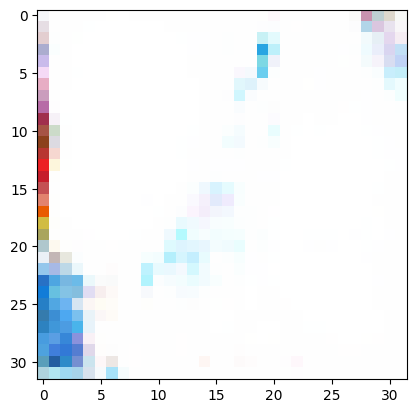

[53/500][0/936]	Loss_D: 0.1007	Loss_G: 4.0493	D(x): 0.9956	D(G(z)): 0.0893 / 0.0419
[53/500][15/936]	Loss_D: 0.0478	Loss_G: 6.2124	D(x): 0.9582	D(G(z)): 0.0039 / 0.0036
[53/500][30/936]	Loss_D: 0.1013	Loss_G: 6.7942	D(x): 0.9141	D(G(z)): 0.0014 / 0.0024
[53/500][45/936]	Loss_D: 0.0176	Loss_G: 6.1753	D(x): 0.9852	D(G(z)): 0.0027 / 0.0026
[53/500][60/936]	Loss_D: 0.0644	Loss_G: 5.1420	D(x): 0.9836	D(G(z)): 0.0445 / 0.0086
[53/500][75/936]	Loss_D: 0.0030	Loss_G: 7.6088	D(x): 0.9980	D(G(z)): 0.0010 / 0.0007
[53/500][90/936]	Loss_D: 0.1239	Loss_G: 5.3633	D(x): 0.9432	D(G(z)): 0.0578 / 0.0068
[53/500][105/936]	Loss_D: 0.0387	Loss_G: 5.4715	D(x): 0.9671	D(G(z)): 0.0050 / 0.0054
[53/500][120/936]	Loss_D: 0.0182	Loss_G: 6.4218	D(x): 0.9888	D(G(z)): 0.0067 / 0.0047
[53/500][135/936]	Loss_D: 0.0049	Loss_G: 7.7298	D(x): 0.9999	D(G(z)): 0.0048 / 0.0023
[53/500][150/936]	Loss_D: 0.0109	Loss_G: 7.3131	D(x): 0.9928	D(G(z)): 0.0036 / 0.0027
[53/500][165/936]	Loss_D: 0.0290	Loss_G: 5.5656	D(x): 0.9915	D

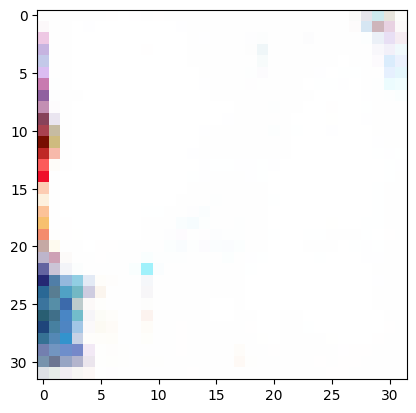

[54/500][0/936]	Loss_D: 0.0107	Loss_G: 5.1696	D(x): 0.9999	D(G(z)): 0.0105 / 0.0102
[54/500][15/936]	Loss_D: 0.0008	Loss_G: 7.4571	D(x): 0.9999	D(G(z)): 0.0008 / 0.0007
[54/500][30/936]	Loss_D: 0.0030	Loss_G: 6.6123	D(x): 0.9986	D(G(z)): 0.0016 / 0.0014
[54/500][45/936]	Loss_D: 0.0094	Loss_G: 7.0621	D(x): 0.9917	D(G(z)): 0.0010 / 0.0010
[54/500][60/936]	Loss_D: 0.0289	Loss_G: 4.5505	D(x): 0.9977	D(G(z)): 0.0260 / 0.0175
[54/500][75/936]	Loss_D: 0.0413	Loss_G: 5.6057	D(x): 0.9955	D(G(z)): 0.0353 / 0.0143
[54/500][90/936]	Loss_D: 0.0037	Loss_G: 5.9835	D(x): 0.9999	D(G(z)): 0.0036 / 0.0033
[54/500][105/936]	Loss_D: 0.4692	Loss_G: 4.8608	D(x): 0.9999	D(G(z)): 0.3459 / 0.0089
[54/500][120/936]	Loss_D: 0.0059	Loss_G: 5.8558	D(x): 0.9965	D(G(z)): 0.0024 / 0.0032
[54/500][135/936]	Loss_D: 0.0773	Loss_G: 5.2181	D(x): 0.9387	D(G(z)): 0.0123 / 0.0103
[54/500][150/936]	Loss_D: 0.0162	Loss_G: 6.7688	D(x): 0.9866	D(G(z)): 0.0025 / 0.0018
[54/500][165/936]	Loss_D: 0.0824	Loss_G: 4.0144	D(x): 0.9999	D

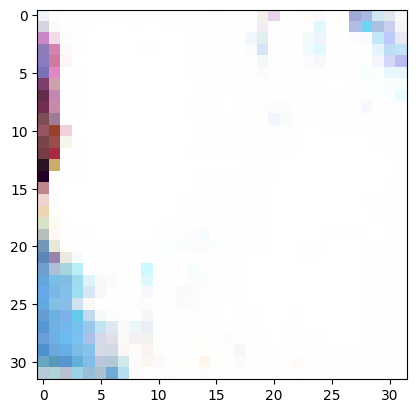

[55/500][0/936]	Loss_D: 0.0121	Loss_G: 5.0802	D(x): 1.0000	D(G(z)): 0.0120 / 0.0086
[55/500][15/936]	Loss_D: 0.0518	Loss_G: 5.5764	D(x): 1.0000	D(G(z)): 0.0483 / 0.0118
[55/500][30/936]	Loss_D: 0.0071	Loss_G: 6.4130	D(x): 0.9969	D(G(z)): 0.0040 / 0.0026
[55/500][45/936]	Loss_D: 0.0102	Loss_G: 7.4942	D(x): 0.9929	D(G(z)): 0.0031 / 0.0018
[55/500][60/936]	Loss_D: 0.0310	Loss_G: 6.8384	D(x): 0.9715	D(G(z)): 0.0017 / 0.0019
[55/500][75/936]	Loss_D: 0.0211	Loss_G: 5.7665	D(x): 0.9836	D(G(z)): 0.0043 / 0.0050
[55/500][90/936]	Loss_D: 0.0021	Loss_G: 7.5966	D(x): 1.0000	D(G(z)): 0.0021 / 0.0021
[55/500][105/936]	Loss_D: 0.4599	Loss_G: 5.0217	D(x): 1.0000	D(G(z)): 0.2741 / 0.0084
[55/500][120/936]	Loss_D: 0.0203	Loss_G: 4.6056	D(x): 0.9998	D(G(z)): 0.0198 / 0.0122
[55/500][135/936]	Loss_D: 0.0710	Loss_G: 5.3166	D(x): 1.0000	D(G(z)): 0.0659 / 0.0194
[55/500][150/936]	Loss_D: 0.0057	Loss_G: 7.0242	D(x): 0.9970	D(G(z)): 0.0027 / 0.0025
[55/500][165/936]	Loss_D: 0.0238	Loss_G: 7.8131	D(x): 0.9989	D

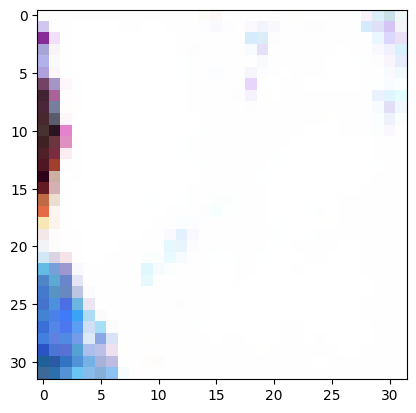

[56/500][0/936]	Loss_D: 0.0055	Loss_G: 6.0530	D(x): 0.9991	D(G(z)): 0.0045 / 0.0042
[56/500][15/936]	Loss_D: 0.0034	Loss_G: 6.7083	D(x): 0.9998	D(G(z)): 0.0033 / 0.0027
[56/500][30/936]	Loss_D: 0.3261	Loss_G: 7.1713	D(x): 1.0000	D(G(z)): 0.2515 / 0.0060
[56/500][45/936]	Loss_D: 0.0014	Loss_G: 7.4816	D(x): 0.9999	D(G(z)): 0.0013 / 0.0015
[56/500][60/936]	Loss_D: 0.0060	Loss_G: 6.4991	D(x): 0.9999	D(G(z)): 0.0059 / 0.0053
[56/500][75/936]	Loss_D: 0.1358	Loss_G: 5.9423	D(x): 0.8859	D(G(z)): 0.0018 / 0.0034
[56/500][90/936]	Loss_D: 0.0383	Loss_G: 6.5138	D(x): 0.9649	D(G(z)): 0.0023 / 0.0026
[56/500][105/936]	Loss_D: 0.0642	Loss_G: 5.6074	D(x): 0.9467	D(G(z)): 0.0085 / 0.0105
[56/500][120/936]	Loss_D: 0.0256	Loss_G: 5.0470	D(x): 0.9914	D(G(z)): 0.0167 / 0.0129
[56/500][135/936]	Loss_D: 0.0263	Loss_G: 7.2091	D(x): 0.9972	D(G(z)): 0.0227 / 0.0156
[56/500][150/936]	Loss_D: 0.0008	Loss_G: 7.9923	D(x): 0.9999	D(G(z)): 0.0008 / 0.0006
[56/500][165/936]	Loss_D: 0.1344	Loss_G: 3.7928	D(x): 0.9982	D

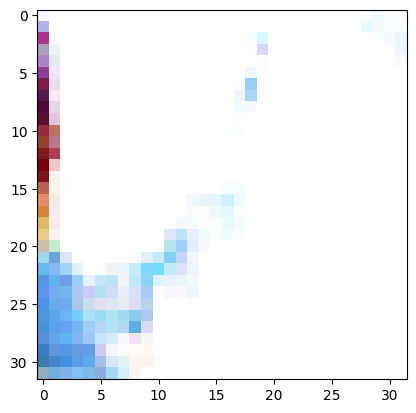

[57/500][0/936]	Loss_D: 0.2879	Loss_G: 7.8835	D(x): 1.0000	D(G(z)): 0.1842 / 0.0030
[57/500][15/936]	Loss_D: 0.0025	Loss_G: 8.5836	D(x): 0.9980	D(G(z)): 0.0005 / 0.0005
[57/500][30/936]	Loss_D: 0.0549	Loss_G: 4.7072	D(x): 0.9997	D(G(z)): 0.0516 / 0.0118
[57/500][45/936]	Loss_D: 0.0009	Loss_G: 7.4842	D(x): 0.9998	D(G(z)): 0.0007 / 0.0007
[57/500][60/936]	Loss_D: 0.0883	Loss_G: 5.4854	D(x): 0.9856	D(G(z)): 0.0671 / 0.0088
[57/500][75/936]	Loss_D: 0.0478	Loss_G: 5.2897	D(x): 0.9994	D(G(z)): 0.0440 / 0.0199
[57/500][90/936]	Loss_D: 0.0702	Loss_G: 6.8491	D(x): 0.9997	D(G(z)): 0.0620 / 0.0029
[57/500][105/936]	Loss_D: 0.0124	Loss_G: 5.4670	D(x): 1.0000	D(G(z)): 0.0123 / 0.0082
[57/500][120/936]	Loss_D: 0.0532	Loss_G: 5.9830	D(x): 0.9987	D(G(z)): 0.0478 / 0.0039
[57/500][135/936]	Loss_D: 0.0032	Loss_G: 6.5362	D(x): 1.0000	D(G(z)): 0.0032 / 0.0035
[57/500][150/936]	Loss_D: 0.0283	Loss_G: 5.1572	D(x): 1.0000	D(G(z)): 0.0274 / 0.0093
[57/500][165/936]	Loss_D: 0.0133	Loss_G: 6.0396	D(x): 0.9971	D

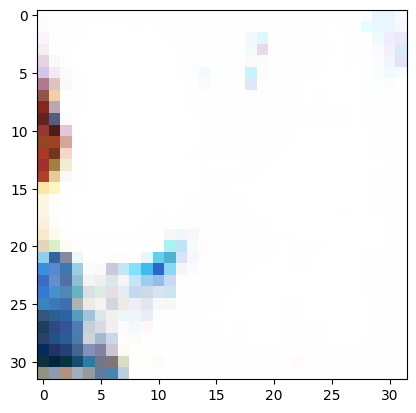

[58/500][0/936]	Loss_D: 0.0163	Loss_G: 6.4470	D(x): 0.9955	D(G(z)): 0.0115 / 0.0080
[58/500][15/936]	Loss_D: 0.0236	Loss_G: 7.0056	D(x): 0.9779	D(G(z)): 0.0009 / 0.0010
[58/500][30/936]	Loss_D: 0.0269	Loss_G: 6.1906	D(x): 0.9803	D(G(z)): 0.0065 / 0.0046
[58/500][45/936]	Loss_D: 1.5442	Loss_G: 11.0414	D(x): 0.9989	D(G(z)): 0.6788 / 0.0001
[58/500][60/936]	Loss_D: 0.1298	Loss_G: 3.9683	D(x): 0.9991	D(G(z)): 0.1153 / 0.0207
[58/500][75/936]	Loss_D: 0.0096	Loss_G: 6.0562	D(x): 0.9999	D(G(z)): 0.0094 / 0.0064
[58/500][90/936]	Loss_D: 0.1579	Loss_G: 4.9612	D(x): 0.8875	D(G(z)): 0.0197 / 0.0242
[58/500][105/936]	Loss_D: 0.0237	Loss_G: 4.7664	D(x): 0.9921	D(G(z)): 0.0154 / 0.0225
[58/500][120/936]	Loss_D: 0.1273	Loss_G: 4.5990	D(x): 0.9910	D(G(z)): 0.1074 / 0.0205
[58/500][135/936]	Loss_D: 0.0027	Loss_G: 6.9928	D(x): 0.9993	D(G(z)): 0.0020 / 0.0019
[58/500][150/936]	Loss_D: 0.0038	Loss_G: 5.9745	D(x): 0.9996	D(G(z)): 0.0034 / 0.0028
[58/500][165/936]	Loss_D: 0.0191	Loss_G: 4.6215	D(x): 1.0000	

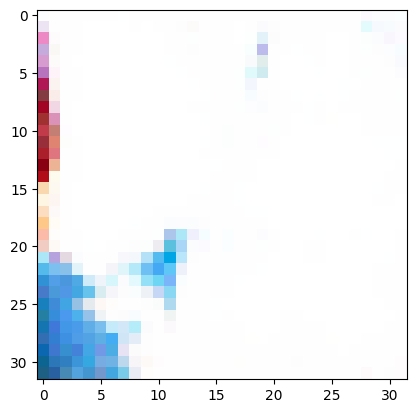

[59/500][0/936]	Loss_D: 0.0749	Loss_G: 5.2899	D(x): 1.0000	D(G(z)): 0.0670 / 0.0053
[59/500][15/936]	Loss_D: 0.0155	Loss_G: 5.5890	D(x): 0.9999	D(G(z)): 0.0151 / 0.0119
[59/500][30/936]	Loss_D: 0.0077	Loss_G: 6.4431	D(x): 0.9971	D(G(z)): 0.0048 / 0.0040
[59/500][45/936]	Loss_D: 0.0010	Loss_G: 7.3183	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[59/500][60/936]	Loss_D: 0.0370	Loss_G: 6.6091	D(x): 0.9969	D(G(z)): 0.0321 / 0.0116
[59/500][75/936]	Loss_D: 0.0057	Loss_G: 7.3923	D(x): 0.9979	D(G(z)): 0.0036 / 0.0033
[59/500][90/936]	Loss_D: 0.0016	Loss_G: 7.0546	D(x): 0.9999	D(G(z)): 0.0015 / 0.0026
[59/500][105/936]	Loss_D: 0.2579	Loss_G: 4.4689	D(x): 0.8027	D(G(z)): 0.0077 / 0.0191
[59/500][120/936]	Loss_D: 0.0038	Loss_G: 7.7672	D(x): 0.9986	D(G(z)): 0.0024 / 0.0020
[59/500][135/936]	Loss_D: 0.0055	Loss_G: 6.6517	D(x): 0.9997	D(G(z)): 0.0052 / 0.0038
[59/500][150/936]	Loss_D: 0.1023	Loss_G: 3.9767	D(x): 0.9278	D(G(z)): 0.0212 / 0.0239
[59/500][165/936]	Loss_D: 0.1166	Loss_G: 7.2642	D(x): 0.9023	D

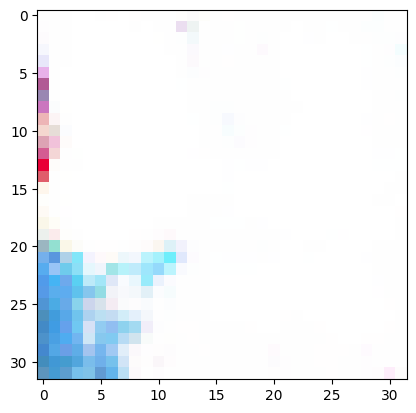

[60/500][0/936]	Loss_D: 0.0131	Loss_G: 6.1143	D(x): 0.9911	D(G(z)): 0.0040 / 0.0035
[60/500][15/936]	Loss_D: 2.3473	Loss_G: 1.8491	D(x): 0.1274	D(G(z)): 0.0510 / 0.3007
[60/500][30/936]	Loss_D: 0.0330	Loss_G: 5.7840	D(x): 1.0000	D(G(z)): 0.0317 / 0.0128
[60/500][45/936]	Loss_D: 0.1035	Loss_G: 4.5221	D(x): 1.0000	D(G(z)): 0.0919 / 0.0198
[60/500][60/936]	Loss_D: 0.0112	Loss_G: 5.6425	D(x): 0.9984	D(G(z)): 0.0096 / 0.0085
[60/500][75/936]	Loss_D: 0.0044	Loss_G: 7.1999	D(x): 0.9976	D(G(z)): 0.0020 / 0.0019
[60/500][90/936]	Loss_D: 0.0124	Loss_G: 6.6748	D(x): 0.9899	D(G(z)): 0.0021 / 0.0031
[60/500][105/936]	Loss_D: 0.0658	Loss_G: 4.9659	D(x): 0.9985	D(G(z)): 0.0599 / 0.0211
[60/500][120/936]	Loss_D: 0.0069	Loss_G: 5.7060	D(x): 0.9991	D(G(z)): 0.0059 / 0.0056
[60/500][135/936]	Loss_D: 0.1716	Loss_G: 8.5890	D(x): 0.8678	D(G(z)): 0.0001 / 0.0003
[60/500][150/936]	Loss_D: 0.0170	Loss_G: 5.5450	D(x): 0.9997	D(G(z)): 0.0165 / 0.0102
[60/500][165/936]	Loss_D: 0.0502	Loss_G: 7.2844	D(x): 0.9582	D

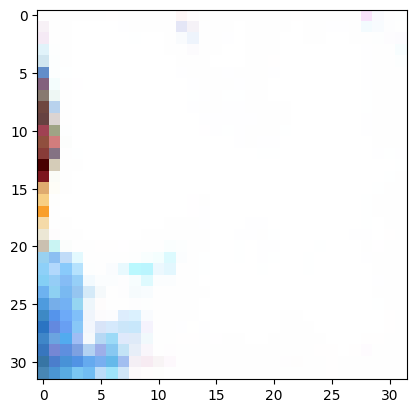

[61/500][0/936]	Loss_D: 0.0253	Loss_G: 6.6606	D(x): 0.9999	D(G(z)): 0.0245 / 0.0067
[61/500][15/936]	Loss_D: 0.0050	Loss_G: 7.5978	D(x): 0.9998	D(G(z)): 0.0048 / 0.0045
[61/500][30/936]	Loss_D: 0.0734	Loss_G: 5.8531	D(x): 1.0000	D(G(z)): 0.0673 / 0.0072
[61/500][45/936]	Loss_D: 0.0213	Loss_G: 6.7356	D(x): 0.9834	D(G(z)): 0.0041 / 0.0037
[61/500][60/936]	Loss_D: 0.0413	Loss_G: 3.7274	D(x): 0.9829	D(G(z)): 0.0230 / 0.1018
[61/500][75/936]	Loss_D: 0.0031	Loss_G: 8.1453	D(x): 0.9999	D(G(z)): 0.0030 / 0.0018
[61/500][90/936]	Loss_D: 0.1797	Loss_G: 4.1110	D(x): 1.0000	D(G(z)): 0.1543 / 0.0232
[61/500][105/936]	Loss_D: 0.0043	Loss_G: 6.9301	D(x): 1.0000	D(G(z)): 0.0043 / 0.0034
[61/500][120/936]	Loss_D: 0.0093	Loss_G: 7.4440	D(x): 0.9916	D(G(z)): 0.0008 / 0.0007
[61/500][135/936]	Loss_D: 0.0095	Loss_G: 5.2997	D(x): 0.9993	D(G(z)): 0.0088 / 0.0075
[61/500][150/936]	Loss_D: 0.0371	Loss_G: 4.2615	D(x): 1.0000	D(G(z)): 0.0362 / 0.0162
[61/500][165/936]	Loss_D: 0.0027	Loss_G: 7.0208	D(x): 1.0000	D

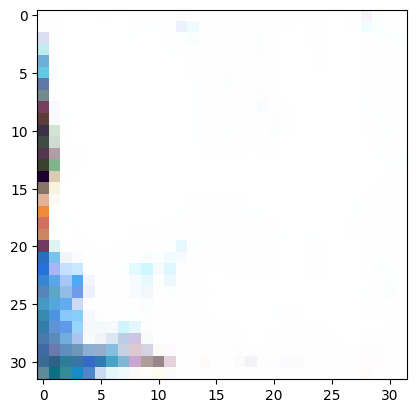

[62/500][0/936]	Loss_D: 0.0149	Loss_G: 6.2873	D(x): 1.0000	D(G(z)): 0.0146 / 0.0102
[62/500][15/936]	Loss_D: 0.0037	Loss_G: 7.6571	D(x): 0.9971	D(G(z)): 0.0007 / 0.0006
[62/500][30/936]	Loss_D: 0.0543	Loss_G: 6.2235	D(x): 0.9521	D(G(z)): 0.0034 / 0.0040
[62/500][45/936]	Loss_D: 0.0239	Loss_G: 6.9492	D(x): 0.9779	D(G(z)): 0.0010 / 0.0012
[62/500][60/936]	Loss_D: 0.0077	Loss_G: 6.6510	D(x): 0.9996	D(G(z)): 0.0073 / 0.0053
[62/500][75/936]	Loss_D: 0.0187	Loss_G: 6.9595	D(x): 0.9845	D(G(z)): 0.0028 / 0.0027
[62/500][90/936]	Loss_D: 0.0099	Loss_G: 8.2865	D(x): 0.9905	D(G(z)): 0.0003 / 0.0003
[62/500][105/936]	Loss_D: 0.0043	Loss_G: 6.4970	D(x): 0.9991	D(G(z)): 0.0034 / 0.0026
[62/500][120/936]	Loss_D: 0.0017	Loss_G: 9.1822	D(x): 0.9990	D(G(z)): 0.0007 / 0.0007
[62/500][135/936]	Loss_D: 0.0314	Loss_G: 7.5413	D(x): 0.9699	D(G(z)): 0.0005 / 0.0007
[62/500][150/936]	Loss_D: 0.0580	Loss_G: 7.1397	D(x): 0.9463	D(G(z)): 0.0007 / 0.0009
[62/500][165/936]	Loss_D: 0.0076	Loss_G: 6.6561	D(x): 0.9999	D

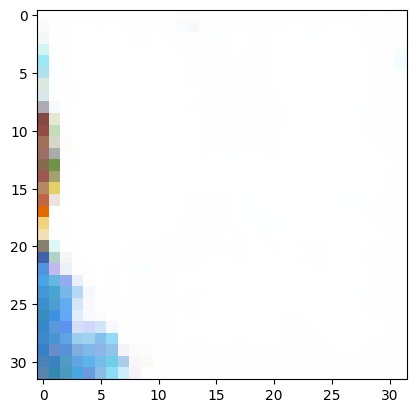

[63/500][0/936]	Loss_D: 0.0004	Loss_G: 8.4194	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[63/500][15/936]	Loss_D: 0.0036	Loss_G: 7.4756	D(x): 0.9998	D(G(z)): 0.0034 / 0.0034
[63/500][30/936]	Loss_D: 0.0070	Loss_G: 5.6314	D(x): 0.9999	D(G(z)): 0.0069 / 0.0087
[63/500][45/936]	Loss_D: 0.0039	Loss_G: 6.6720	D(x): 0.9983	D(G(z)): 0.0022 / 0.0022
[63/500][60/936]	Loss_D: 0.0045	Loss_G: 7.4822	D(x): 0.9976	D(G(z)): 0.0021 / 0.0020
[63/500][75/936]	Loss_D: 0.0250	Loss_G: 5.3940	D(x): 0.9997	D(G(z)): 0.0238 / 0.0069
[63/500][90/936]	Loss_D: 0.0489	Loss_G: 4.1189	D(x): 1.0000	D(G(z)): 0.0475 / 0.0182
[63/500][105/936]	Loss_D: 0.0577	Loss_G: 3.9478	D(x): 1.0000	D(G(z)): 0.0554 / 0.0232
[63/500][120/936]	Loss_D: 0.0202	Loss_G: 7.8875	D(x): 0.9813	D(G(z)): 0.0011 / 0.0011
[63/500][135/936]	Loss_D: 0.0019	Loss_G: 6.9078	D(x): 0.9998	D(G(z)): 0.0017 / 0.0013
[63/500][150/936]	Loss_D: 0.0058	Loss_G: 7.2735	D(x): 0.9999	D(G(z)): 0.0056 / 0.0074
[63/500][165/936]	Loss_D: 0.0075	Loss_G: 4.4039	D(x): 0.9988	D

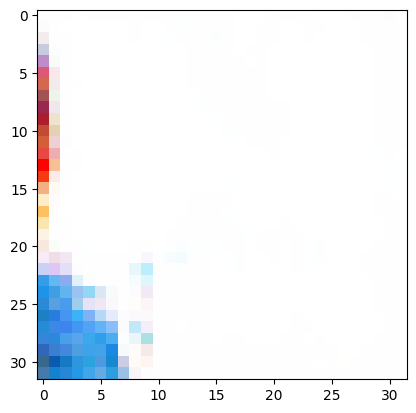

[64/500][0/936]	Loss_D: 0.1713	Loss_G: 6.4165	D(x): 0.9865	D(G(z)): 0.1282 / 0.0094
[64/500][15/936]	Loss_D: 0.8644	Loss_G: 6.5211	D(x): 0.6841	D(G(z)): 0.0005 / 0.0033
[64/500][30/936]	Loss_D: 0.0112	Loss_G: 6.1757	D(x): 0.9997	D(G(z)): 0.0107 / 0.0079
[64/500][45/936]	Loss_D: 0.2144	Loss_G: 8.9700	D(x): 0.9934	D(G(z)): 0.1416 / 0.0004
[64/500][60/936]	Loss_D: 0.0147	Loss_G: 6.9921	D(x): 0.9872	D(G(z)): 0.0017 / 0.0015
[64/500][75/936]	Loss_D: 0.0020	Loss_G: 6.7886	D(x): 0.9997	D(G(z)): 0.0017 / 0.0016
[64/500][90/936]	Loss_D: 0.0010	Loss_G: 7.9668	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[64/500][105/936]	Loss_D: 0.0026	Loss_G: 8.3359	D(x): 0.9980	D(G(z)): 0.0006 / 0.0006
[64/500][120/936]	Loss_D: 0.0045	Loss_G: 6.8743	D(x): 0.9989	D(G(z)): 0.0034 / 0.0029
[64/500][135/936]	Loss_D: 0.0325	Loss_G: 7.4226	D(x): 0.9699	D(G(z)): 0.0006 / 0.0007
[64/500][150/936]	Loss_D: 0.0143	Loss_G: 5.1515	D(x): 0.9994	D(G(z)): 0.0135 / 0.0113
[64/500][165/936]	Loss_D: 0.0169	Loss_G: 5.2273	D(x): 0.9935	D

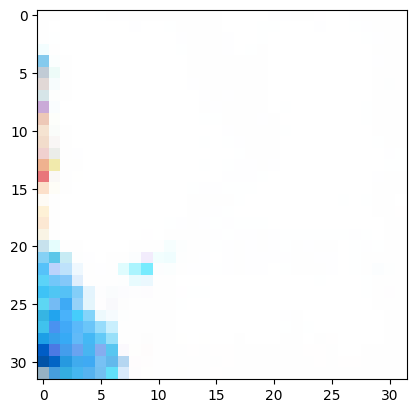

[65/500][0/936]	Loss_D: 0.0039	Loss_G: 7.0872	D(x): 0.9988	D(G(z)): 0.0026 / 0.0024
[65/500][15/936]	Loss_D: 0.3397	Loss_G: 4.6736	D(x): 0.7687	D(G(z)): 0.0086 / 0.0278
[65/500][30/936]	Loss_D: 1.2958	Loss_G: 5.0870	D(x): 0.3466	D(G(z)): 0.0004 / 0.0094
[65/500][45/936]	Loss_D: 0.0127	Loss_G: 5.5898	D(x): 1.0000	D(G(z)): 0.0126 / 0.0086
[65/500][60/936]	Loss_D: 0.0821	Loss_G: 4.3645	D(x): 0.9958	D(G(z)): 0.0704 / 0.0159
[65/500][75/936]	Loss_D: 0.0071	Loss_G: 7.8061	D(x): 0.9951	D(G(z)): 0.0022 / 0.0011
[65/500][90/936]	Loss_D: 0.1515	Loss_G: 6.7301	D(x): 0.8742	D(G(z)): 0.0019 / 0.0051
[65/500][105/936]	Loss_D: 0.0287	Loss_G: 5.7150	D(x): 0.9918	D(G(z)): 0.0200 / 0.0106
[65/500][120/936]	Loss_D: 0.0469	Loss_G: 5.9786	D(x): 0.9578	D(G(z)): 0.0027 / 0.0041
[65/500][135/936]	Loss_D: 0.1067	Loss_G: 6.0179	D(x): 0.9078	D(G(z)): 0.0036 / 0.0054
[65/500][150/936]	Loss_D: 0.0152	Loss_G: 4.3765	D(x): 1.0000	D(G(z)): 0.0150 / 0.0180
[65/500][165/936]	Loss_D: 0.0282	Loss_G: 8.1882	D(x): 0.9739	D

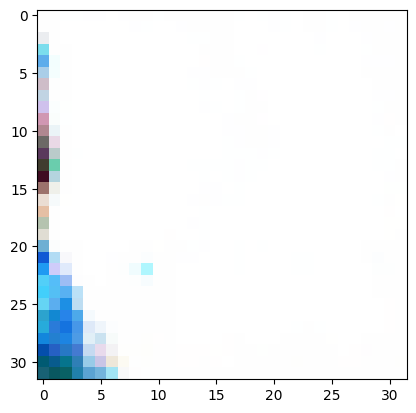

[66/500][0/936]	Loss_D: 0.1352	Loss_G: 3.0224	D(x): 0.9992	D(G(z)): 0.1115 / 0.0918
[66/500][15/936]	Loss_D: 0.0259	Loss_G: 5.0138	D(x): 0.9988	D(G(z)): 0.0240 / 0.0104
[66/500][30/936]	Loss_D: 0.0005	Loss_G: 8.4783	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[66/500][45/936]	Loss_D: 0.0118	Loss_G: 7.1915	D(x): 0.9958	D(G(z)): 0.0075 / 0.0042
[66/500][60/936]	Loss_D: 0.9126	Loss_G: 7.9984	D(x): 0.9999	D(G(z)): 0.4701 / 0.0004
[66/500][75/936]	Loss_D: 0.0493	Loss_G: 3.9479	D(x): 0.9999	D(G(z)): 0.0478 / 0.0222
[66/500][90/936]	Loss_D: 0.0219	Loss_G: 4.9339	D(x): 0.9999	D(G(z)): 0.0213 / 0.0134
[66/500][105/936]	Loss_D: 0.0180	Loss_G: 6.1656	D(x): 0.9858	D(G(z)): 0.0037 / 0.0038
[66/500][120/936]	Loss_D: 0.0107	Loss_G: 6.4054	D(x): 0.9999	D(G(z)): 0.0105 / 0.0075
[66/500][135/936]	Loss_D: 0.0090	Loss_G: 6.9145	D(x): 0.9967	D(G(z)): 0.0056 / 0.0049
[66/500][150/936]	Loss_D: 0.0082	Loss_G: 5.3362	D(x): 0.9988	D(G(z)): 0.0069 / 0.0055
[66/500][165/936]	Loss_D: 0.0056	Loss_G: 6.1935	D(x): 0.9999	D

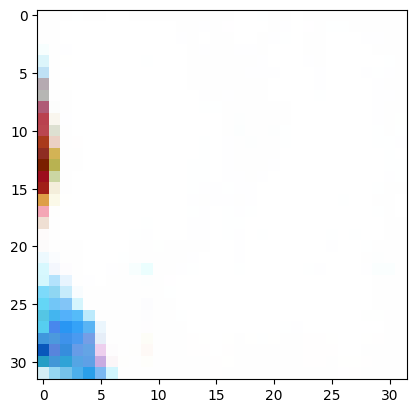

[67/500][0/936]	Loss_D: 0.0472	Loss_G: 9.2060	D(x): 0.9561	D(G(z)): 0.0002 / 0.0004
[67/500][15/936]	Loss_D: 0.0214	Loss_G: 5.0331	D(x): 0.9975	D(G(z)): 0.0186 / 0.0127
[67/500][30/936]	Loss_D: 0.0874	Loss_G: 7.3286	D(x): 1.0000	D(G(z)): 0.0745 / 0.0069
[67/500][45/936]	Loss_D: 0.0025	Loss_G: 6.9421	D(x): 1.0000	D(G(z)): 0.0024 / 0.0023
[67/500][60/936]	Loss_D: 0.0010	Loss_G: 7.4125	D(x): 0.9999	D(G(z)): 0.0009 / 0.0011
[67/500][75/936]	Loss_D: 0.2100	Loss_G: 5.3197	D(x): 0.9143	D(G(z)): 0.1078 / 0.0150
[67/500][90/936]	Loss_D: 0.0227	Loss_G: 5.3024	D(x): 0.9966	D(G(z)): 0.0189 / 0.0068
[67/500][105/936]	Loss_D: 0.0996	Loss_G: 5.2543	D(x): 1.0000	D(G(z)): 0.0850 / 0.0092
[67/500][120/936]	Loss_D: 0.0033	Loss_G: 6.5750	D(x): 0.9999	D(G(z)): 0.0032 / 0.0028
[67/500][135/936]	Loss_D: 0.0009	Loss_G: 9.2210	D(x): 0.9992	D(G(z)): 0.0001 / 0.0001
[67/500][150/936]	Loss_D: 0.0006	Loss_G: 9.8958	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[67/500][165/936]	Loss_D: 0.0151	Loss_G: 8.6464	D(x): 0.9856	D

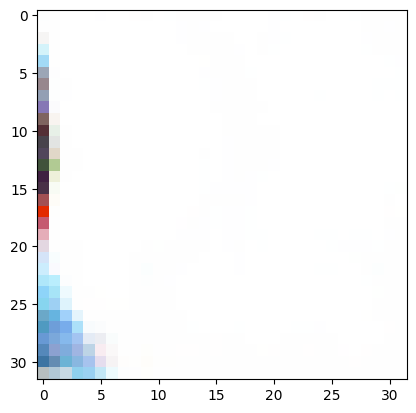

[68/500][0/936]	Loss_D: 0.0479	Loss_G: 6.3066	D(x): 0.9708	D(G(z)): 0.0173 / 0.0053
[68/500][15/936]	Loss_D: 0.0088	Loss_G: 6.9425	D(x): 1.0000	D(G(z)): 0.0087 / 0.0055
[68/500][30/936]	Loss_D: 0.0029	Loss_G: 6.2126	D(x): 0.9996	D(G(z)): 0.0025 / 0.0027
[68/500][45/936]	Loss_D: 0.0555	Loss_G: 4.6631	D(x): 0.9989	D(G(z)): 0.0504 / 0.0203
[68/500][60/936]	Loss_D: 0.0902	Loss_G: 6.3649	D(x): 1.0000	D(G(z)): 0.0831 / 0.0181
[68/500][75/936]	Loss_D: 0.0193	Loss_G: 6.7128	D(x): 0.9969	D(G(z)): 0.0159 / 0.0083
[68/500][90/936]	Loss_D: 0.0124	Loss_G: 6.3927	D(x): 0.9991	D(G(z)): 0.0113 / 0.0072
[68/500][105/936]	Loss_D: 1.6228	Loss_G: 3.6369	D(x): 0.3055	D(G(z)): 0.0013 / 0.0435
[68/500][120/936]	Loss_D: 0.0760	Loss_G: 3.6454	D(x): 1.0000	D(G(z)): 0.0731 / 0.0266
[68/500][135/936]	Loss_D: 0.0083	Loss_G: 6.5099	D(x): 0.9999	D(G(z)): 0.0081 / 0.0064
[68/500][150/936]	Loss_D: 0.0017	Loss_G: 8.0845	D(x): 0.9998	D(G(z)): 0.0016 / 0.0011
[68/500][165/936]	Loss_D: 0.0711	Loss_G: 5.4755	D(x): 0.9999	D

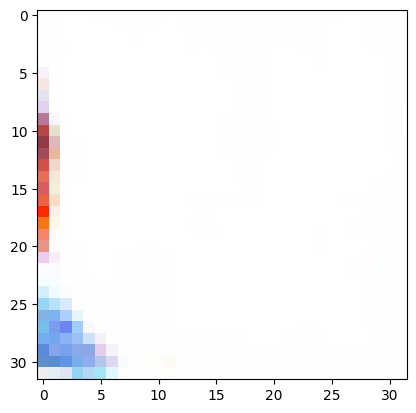

[69/500][0/936]	Loss_D: 0.0019	Loss_G: 8.1538	D(x): 0.9985	D(G(z)): 0.0005 / 0.0005
[69/500][15/936]	Loss_D: 0.0134	Loss_G: 5.6154	D(x): 0.9999	D(G(z)): 0.0130 / 0.0061
[69/500][30/936]	Loss_D: 0.0035	Loss_G: 8.4064	D(x): 0.9968	D(G(z)): 0.0003 / 0.0003
[69/500][45/936]	Loss_D: 0.0027	Loss_G: 6.4883	D(x): 0.9999	D(G(z)): 0.0026 / 0.0025
[69/500][60/936]	Loss_D: 0.0082	Loss_G: 5.2248	D(x): 0.9966	D(G(z)): 0.0047 / 0.0103
[69/500][75/936]	Loss_D: 0.0113	Loss_G: 7.2854	D(x): 0.9906	D(G(z)): 0.0018 / 0.0017
[69/500][90/936]	Loss_D: 0.0159	Loss_G: 5.4183	D(x): 0.9982	D(G(z)): 0.0139 / 0.0073
[69/500][105/936]	Loss_D: 0.0006	Loss_G: 8.1662	D(x): 0.9997	D(G(z)): 0.0004 / 0.0004
[69/500][120/936]	Loss_D: 0.0009	Loss_G: 8.1848	D(x): 0.9999	D(G(z)): 0.0008 / 0.0004
[69/500][135/936]	Loss_D: 0.0177	Loss_G: 6.9068	D(x): 0.9956	D(G(z)): 0.0129 / 0.0073
[69/500][150/936]	Loss_D: 0.0020	Loss_G: 7.5389	D(x): 0.9988	D(G(z)): 0.0008 / 0.0007
[69/500][165/936]	Loss_D: 0.0024	Loss_G: 7.5031	D(x): 0.9987	D

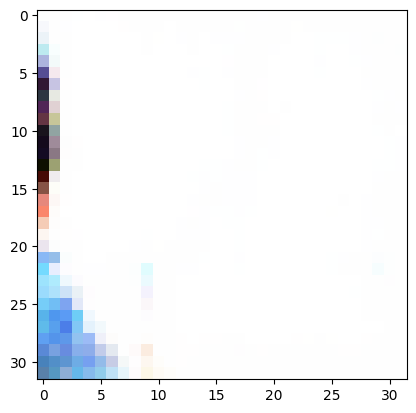

[70/500][0/936]	Loss_D: 0.0136	Loss_G: 6.5243	D(x): 0.9910	D(G(z)): 0.0045 / 0.0044
[70/500][15/936]	Loss_D: 0.0059	Loss_G: 6.0492	D(x): 0.9980	D(G(z)): 0.0039 / 0.0036
[70/500][30/936]	Loss_D: 0.0014	Loss_G: 7.2744	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[70/500][45/936]	Loss_D: 0.0008	Loss_G: 8.0523	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[70/500][60/936]	Loss_D: 0.0249	Loss_G: 5.9321	D(x): 0.9961	D(G(z)): 0.0202 / 0.0045
[70/500][75/936]	Loss_D: 0.0069	Loss_G: 7.7283	D(x): 0.9968	D(G(z)): 0.0037 / 0.0035
[70/500][90/936]	Loss_D: 0.0110	Loss_G: 6.9738	D(x): 0.9987	D(G(z)): 0.0096 / 0.0074
[70/500][105/936]	Loss_D: 0.0063	Loss_G: 6.3805	D(x): 1.0000	D(G(z)): 0.0062 / 0.0048
[70/500][120/936]	Loss_D: 0.0050	Loss_G: 6.2042	D(x): 1.0000	D(G(z)): 0.0050 / 0.0033
[70/500][135/936]	Loss_D: 0.0565	Loss_G: 6.6600	D(x): 0.9498	D(G(z)): 0.0017 / 0.0022
[70/500][150/936]	Loss_D: 0.0030	Loss_G: 6.7172	D(x): 0.9998	D(G(z)): 0.0027 / 0.0025
[70/500][165/936]	Loss_D: 0.0489	Loss_G: 4.8206	D(x): 1.0000	D

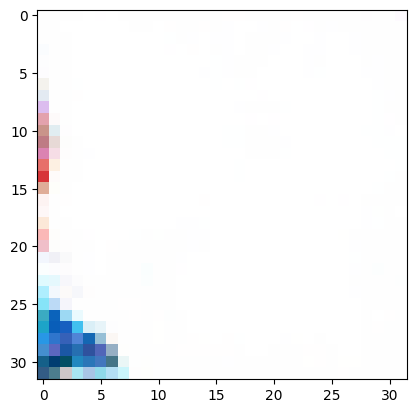

[71/500][0/936]	Loss_D: 0.0028	Loss_G: 7.5259	D(x): 0.9997	D(G(z)): 0.0025 / 0.0021
[71/500][15/936]	Loss_D: 0.0188	Loss_G: 5.3064	D(x): 0.9967	D(G(z)): 0.0153 / 0.0103
[71/500][30/936]	Loss_D: 0.0003	Loss_G: 9.7478	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[71/500][45/936]	Loss_D: 0.0053	Loss_G: 7.7342	D(x): 1.0000	D(G(z)): 0.0052 / 0.0039
[71/500][60/936]	Loss_D: 0.0010	Loss_G: 9.1283	D(x): 0.9992	D(G(z)): 0.0001 / 0.0001
[71/500][75/936]	Loss_D: 0.6498	Loss_G: 7.0074	D(x): 0.6103	D(G(z)): 0.0001 / 0.0015
[71/500][90/936]	Loss_D: 0.0084	Loss_G: 5.9305	D(x): 1.0000	D(G(z)): 0.0083 / 0.0063
[71/500][105/936]	Loss_D: 0.0745	Loss_G: 5.4861	D(x): 0.9413	D(G(z)): 0.0083 / 0.0053
[71/500][120/936]	Loss_D: 0.0472	Loss_G: 5.1872	D(x): 1.0000	D(G(z)): 0.0451 / 0.0223
[71/500][135/936]	Loss_D: 0.0222	Loss_G: 4.8048	D(x): 0.9979	D(G(z)): 0.0196 / 0.0126
[71/500][150/936]	Loss_D: 0.0031	Loss_G: 6.9148	D(x): 0.9998	D(G(z)): 0.0029 / 0.0028
[71/500][165/936]	Loss_D: 0.0044	Loss_G: 7.1301	D(x): 1.0000	D

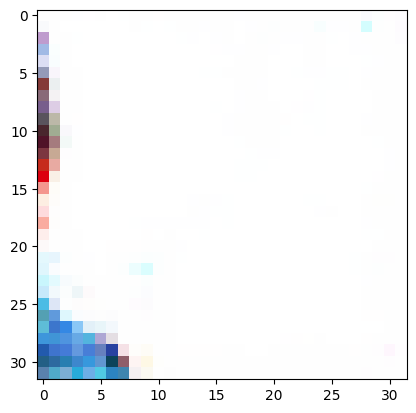

[72/500][0/936]	Loss_D: 0.0009	Loss_G: 9.0460	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[72/500][15/936]	Loss_D: 0.0157	Loss_G: 5.7616	D(x): 0.9999	D(G(z)): 0.0154 / 0.0112
[72/500][30/936]	Loss_D: 0.0252	Loss_G: 4.5475	D(x): 0.9914	D(G(z)): 0.0163 / 0.0195
[72/500][45/936]	Loss_D: 0.0019	Loss_G: 7.0613	D(x): 0.9993	D(G(z)): 0.0013 / 0.0018
[72/500][60/936]	Loss_D: 0.0507	Loss_G: 8.5697	D(x): 0.9521	D(G(z)): 0.0006 / 0.0006
[72/500][75/936]	Loss_D: 0.9299	Loss_G: 10.9620	D(x): 0.9999	D(G(z)): 0.2539 / 0.0004
[72/500][90/936]	Loss_D: 0.0796	Loss_G: 6.3077	D(x): 0.9270	D(G(z)): 0.0020 / 0.0025
[72/500][105/936]	Loss_D: 0.0007	Loss_G: 8.7964	D(x): 0.9996	D(G(z)): 0.0003 / 0.0002
[72/500][120/936]	Loss_D: 0.0064	Loss_G: 7.6737	D(x): 1.0000	D(G(z)): 0.0063 / 0.0060
[72/500][135/936]	Loss_D: 0.0233	Loss_G: 6.3162	D(x): 1.0000	D(G(z)): 0.0224 / 0.0052
[72/500][150/936]	Loss_D: 0.0019	Loss_G: 9.7284	D(x): 0.9984	D(G(z)): 0.0003 / 0.0002
[72/500][165/936]	Loss_D: 0.0051	Loss_G: 7.1709	D(x): 0.9999	

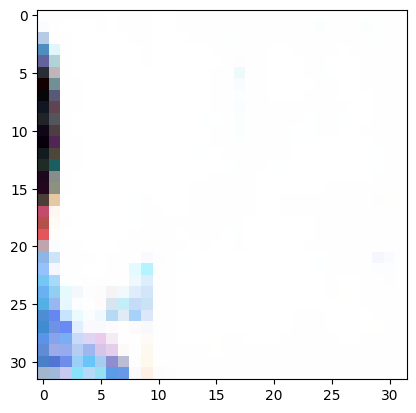

[73/500][0/936]	Loss_D: 0.0190	Loss_G: 5.9717	D(x): 0.9978	D(G(z)): 0.0165 / 0.0106
[73/500][15/936]	Loss_D: 0.0250	Loss_G: 4.9844	D(x): 1.0000	D(G(z)): 0.0244 / 0.0108
[73/500][30/936]	Loss_D: 0.0374	Loss_G: 5.4445	D(x): 0.9949	D(G(z)): 0.0310 / 0.0206
[73/500][45/936]	Loss_D: 0.0272	Loss_G: 4.6715	D(x): 1.0000	D(G(z)): 0.0264 / 0.0140
[73/500][60/936]	Loss_D: 0.0098	Loss_G: 5.2524	D(x): 0.9999	D(G(z)): 0.0097 / 0.0089
[73/500][75/936]	Loss_D: 0.0068	Loss_G: 5.3709	D(x): 0.9998	D(G(z)): 0.0066 / 0.0064
[73/500][90/936]	Loss_D: 0.0190	Loss_G: 5.9354	D(x): 1.0000	D(G(z)): 0.0186 / 0.0053
[73/500][105/936]	Loss_D: 0.0033	Loss_G: 7.2035	D(x): 0.9992	D(G(z)): 0.0024 / 0.0015
[73/500][120/936]	Loss_D: 1.3974	Loss_G: 1.7888	D(x): 0.3938	D(G(z)): 0.0080 / 0.1839
[73/500][135/936]	Loss_D: 0.0366	Loss_G: 5.8621	D(x): 1.0000	D(G(z)): 0.0355 / 0.0082
[73/500][150/936]	Loss_D: 0.0237	Loss_G: 6.7102	D(x): 0.9999	D(G(z)): 0.0226 / 0.0023
[73/500][165/936]	Loss_D: 0.0010	Loss_G: 10.8549	D(x): 0.9991	

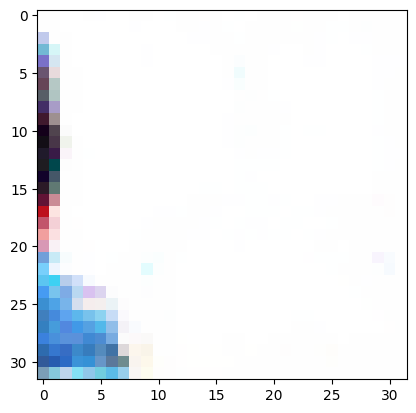

[74/500][0/936]	Loss_D: 0.0068	Loss_G: 6.3660	D(x): 1.0000	D(G(z)): 0.0067 / 0.0048
[74/500][15/936]	Loss_D: 0.0013	Loss_G: 8.2640	D(x): 0.9995	D(G(z)): 0.0008 / 0.0008
[74/500][30/936]	Loss_D: 0.0025	Loss_G: 7.5884	D(x): 0.9995	D(G(z)): 0.0020 / 0.0019
[74/500][45/936]	Loss_D: 0.0103	Loss_G: 7.1881	D(x): 1.0000	D(G(z)): 0.0101 / 0.0037
[74/500][60/936]	Loss_D: 0.0220	Loss_G: 6.2666	D(x): 0.9852	D(G(z)): 0.0070 / 0.0054
[74/500][75/936]	Loss_D: 0.0102	Loss_G: 6.5574	D(x): 0.9945	D(G(z)): 0.0046 / 0.0035
[74/500][90/936]	Loss_D: 0.0612	Loss_G: 4.1484	D(x): 0.9962	D(G(z)): 0.0552 / 0.0196
[74/500][105/936]	Loss_D: 0.0151	Loss_G: 5.0750	D(x): 1.0000	D(G(z)): 0.0149 / 0.0080
[74/500][120/936]	Loss_D: 0.0022	Loss_G: 8.0506	D(x): 0.9983	D(G(z)): 0.0005 / 0.0005
[74/500][135/936]	Loss_D: 0.0017	Loss_G: 7.0256	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[74/500][150/936]	Loss_D: 0.1070	Loss_G: 7.1408	D(x): 0.9997	D(G(z)): 0.0874 / 0.0008
[74/500][165/936]	Loss_D: 0.0367	Loss_G: 5.1039	D(x): 0.9970	D

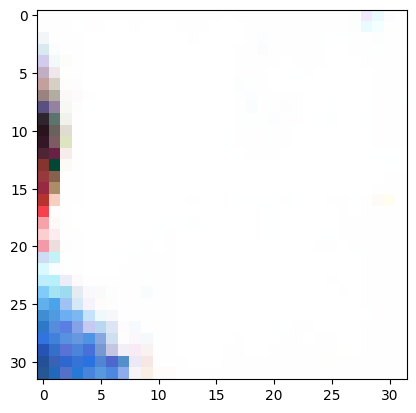

[75/500][0/936]	Loss_D: 0.0768	Loss_G: 3.9125	D(x): 0.9995	D(G(z)): 0.0725 / 0.0653
[75/500][15/936]	Loss_D: 0.1393	Loss_G: 7.6569	D(x): 1.0000	D(G(z)): 0.1095 / 0.0093
[75/500][30/936]	Loss_D: 0.0218	Loss_G: 8.3629	D(x): 0.9800	D(G(z)): 0.0014 / 0.0015
[75/500][45/936]	Loss_D: 0.0027	Loss_G: 6.3876	D(x): 1.0000	D(G(z)): 0.0027 / 0.0029
[75/500][60/936]	Loss_D: 0.0074	Loss_G: 7.1734	D(x): 0.9979	D(G(z)): 0.0052 / 0.0048
[75/500][75/936]	Loss_D: 0.4279	Loss_G: 6.6379	D(x): 0.6948	D(G(z)): 0.0022 / 0.0090
[75/500][90/936]	Loss_D: 0.0072	Loss_G: 6.8485	D(x): 0.9998	D(G(z)): 0.0070 / 0.0046
[75/500][105/936]	Loss_D: 0.0067	Loss_G: 7.6763	D(x): 0.9967	D(G(z)): 0.0034 / 0.0009
[75/500][120/936]	Loss_D: 0.0057	Loss_G: 6.0050	D(x): 0.9992	D(G(z)): 0.0049 / 0.0044
[75/500][135/936]	Loss_D: 0.0012	Loss_G: 8.8775	D(x): 0.9990	D(G(z)): 0.0002 / 0.0002
[75/500][150/936]	Loss_D: 0.0118	Loss_G: 6.7368	D(x): 0.9948	D(G(z)): 0.0066 / 0.0045
[75/500][165/936]	Loss_D: 0.2892	Loss_G: 5.8175	D(x): 0.8177	D

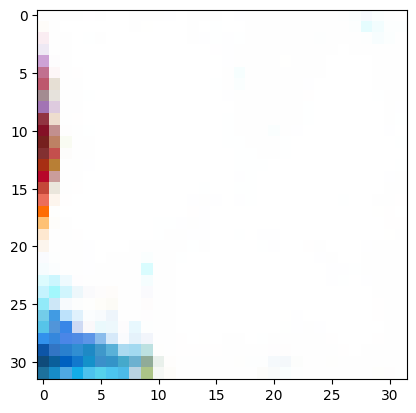

[76/500][0/936]	Loss_D: 0.0159	Loss_G: 6.8718	D(x): 0.9984	D(G(z)): 0.0140 / 0.0039
[76/500][15/936]	Loss_D: 0.0003	Loss_G: 9.8481	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[76/500][30/936]	Loss_D: 0.0037	Loss_G: 7.6102	D(x): 0.9990	D(G(z)): 0.0027 / 0.0025
[76/500][45/936]	Loss_D: 0.0225	Loss_G: 6.9711	D(x): 0.9999	D(G(z)): 0.0215 / 0.0113
[76/500][60/936]	Loss_D: 0.0105	Loss_G: 5.3470	D(x): 0.9996	D(G(z)): 0.0100 / 0.0078
[76/500][75/936]	Loss_D: 0.0011	Loss_G: 8.7183	D(x): 0.9999	D(G(z)): 0.0009 / 0.0006
[76/500][90/936]	Loss_D: 0.0893	Loss_G: 9.1191	D(x): 0.9171	D(G(z)): 0.0004 / 0.0009
[76/500][105/936]	Loss_D: 0.0130	Loss_G: 7.8849	D(x): 0.9877	D(G(z)): 0.0006 / 0.0007
[76/500][120/936]	Loss_D: 0.0026	Loss_G: 7.1844	D(x): 1.0000	D(G(z)): 0.0026 / 0.0012
[76/500][135/936]	Loss_D: 0.0049	Loss_G: 10.5407	D(x): 0.9957	D(G(z)): 0.0006 / 0.0006
[76/500][150/936]	Loss_D: 0.0051	Loss_G: 5.9211	D(x): 1.0000	D(G(z)): 0.0050 / 0.0042
[76/500][165/936]	Loss_D: 0.0112	Loss_G: 5.3294	D(x): 0.9977	

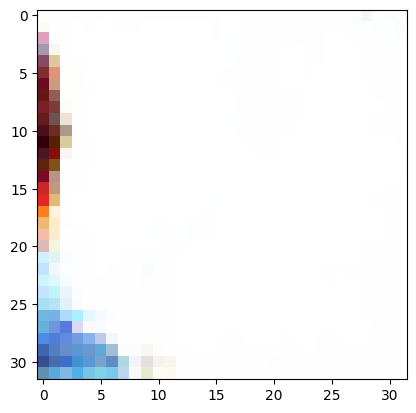

[77/500][0/936]	Loss_D: 0.0090	Loss_G: 10.0648	D(x): 0.9913	D(G(z)): 0.0002 / 0.0002
[77/500][15/936]	Loss_D: 0.0957	Loss_G: 8.7798	D(x): 0.9124	D(G(z)): 0.0005 / 0.0005
[77/500][30/936]	Loss_D: 0.0033	Loss_G: 6.8639	D(x): 0.9998	D(G(z)): 0.0030 / 0.0026
[77/500][45/936]	Loss_D: 0.0041	Loss_G: 6.8755	D(x): 1.0000	D(G(z)): 0.0041 / 0.0027
[77/500][60/936]	Loss_D: 0.0070	Loss_G: 7.5365	D(x): 1.0000	D(G(z)): 0.0069 / 0.0025
[77/500][75/936]	Loss_D: 0.0296	Loss_G: 6.5543	D(x): 1.0000	D(G(z)): 0.0281 / 0.0050
[77/500][90/936]	Loss_D: 0.0040	Loss_G: 6.2233	D(x): 1.0000	D(G(z)): 0.0040 / 0.0033
[77/500][105/936]	Loss_D: 0.0488	Loss_G: 5.0227	D(x): 0.9760	D(G(z)): 0.0235 / 0.0095
[77/500][120/936]	Loss_D: 0.0245	Loss_G: 6.2518	D(x): 0.9787	D(G(z)): 0.0027 / 0.0027
[77/500][135/936]	Loss_D: 0.0203	Loss_G: 5.3105	D(x): 0.9917	D(G(z)): 0.0118 / 0.0083
[77/500][150/936]	Loss_D: 0.0005	Loss_G: 9.7391	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[77/500][165/936]	Loss_D: 0.0008	Loss_G: 7.4532	D(x): 1.0000	

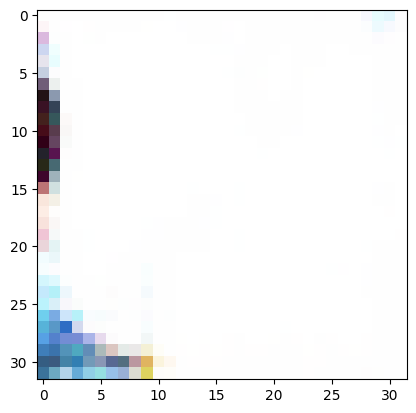

[78/500][0/936]	Loss_D: 0.0018	Loss_G: 8.6771	D(x): 0.9985	D(G(z)): 0.0003 / 0.0003
[78/500][15/936]	Loss_D: 0.0100	Loss_G: 6.9431	D(x): 0.9976	D(G(z)): 0.0075 / 0.0057
[78/500][30/936]	Loss_D: 0.0004	Loss_G: 8.3602	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[78/500][45/936]	Loss_D: 0.0042	Loss_G: 6.4507	D(x): 0.9992	D(G(z)): 0.0034 / 0.0034
[78/500][60/936]	Loss_D: 0.0227	Loss_G: 4.5395	D(x): 0.9999	D(G(z)): 0.0222 / 0.0133
[78/500][75/936]	Loss_D: 0.0074	Loss_G: 7.9955	D(x): 0.9953	D(G(z)): 0.0026 / 0.0023
[78/500][90/936]	Loss_D: 0.0003	Loss_G: 8.1947	D(x): 1.0000	D(G(z)): 0.0003 / 0.0004
[78/500][105/936]	Loss_D: 0.0124	Loss_G: 7.2294	D(x): 1.0000	D(G(z)): 0.0121 / 0.0045
[78/500][120/936]	Loss_D: 0.0108	Loss_G: 5.9551	D(x): 0.9999	D(G(z)): 0.0106 / 0.0130
[78/500][135/936]	Loss_D: 0.0261	Loss_G: 6.9423	D(x): 0.9773	D(G(z)): 0.0027 / 0.0027
[78/500][150/936]	Loss_D: 0.3794	Loss_G: 6.0629	D(x): 0.8592	D(G(z)): 0.1657 / 0.0054
[78/500][165/936]	Loss_D: 0.0006	Loss_G: 7.6843	D(x): 1.0000	D

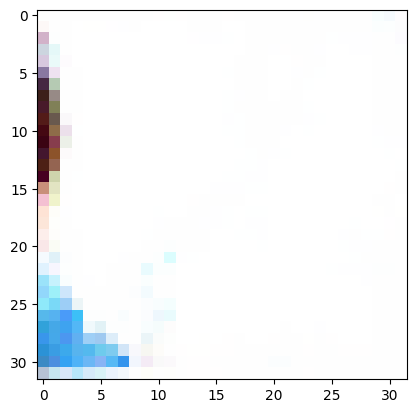

[79/500][0/936]	Loss_D: 0.7565	Loss_G: 9.0240	D(x): 1.0000	D(G(z)): 0.4542 / 0.0002
[79/500][15/936]	Loss_D: 0.0011	Loss_G: 9.7727	D(x): 0.9999	D(G(z)): 0.0011 / 0.0010
[79/500][30/936]	Loss_D: 0.7213	Loss_G: 2.6698	D(x): 0.5951	D(G(z)): 0.0027 / 0.1220
[79/500][45/936]	Loss_D: 0.0023	Loss_G: 7.8957	D(x): 0.9998	D(G(z)): 0.0021 / 0.0012
[79/500][60/936]	Loss_D: 0.1500	Loss_G: 6.8532	D(x): 0.9999	D(G(z)): 0.1332 / 0.0059
[79/500][75/936]	Loss_D: 0.0570	Loss_G: 4.9533	D(x): 1.0000	D(G(z)): 0.0530 / 0.0143
[79/500][90/936]	Loss_D: 0.0071	Loss_G: 5.8106	D(x): 0.9995	D(G(z)): 0.0066 / 0.0055
[79/500][105/936]	Loss_D: 0.0014	Loss_G: 6.6424	D(x): 1.0000	D(G(z)): 0.0013 / 0.0016
[79/500][120/936]	Loss_D: 0.0051	Loss_G: 7.5237	D(x): 0.9997	D(G(z)): 0.0048 / 0.0038
[79/500][135/936]	Loss_D: 0.0077	Loss_G: 6.1678	D(x): 0.9967	D(G(z)): 0.0044 / 0.0042
[79/500][150/936]	Loss_D: 0.0594	Loss_G: 6.1624	D(x): 0.9999	D(G(z)): 0.0540 / 0.0078
[79/500][165/936]	Loss_D: 0.1441	Loss_G: 4.4076	D(x): 0.8981	D

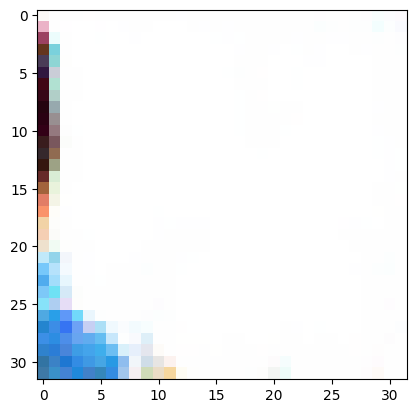

[80/500][0/936]	Loss_D: 0.1161	Loss_G: 3.9177	D(x): 1.0000	D(G(z)): 0.1061 / 0.0339
[80/500][15/936]	Loss_D: 0.0002	Loss_G: 10.0325	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[80/500][30/936]	Loss_D: 0.0021	Loss_G: 7.9955	D(x): 0.9994	D(G(z)): 0.0015 / 0.0013
[80/500][45/936]	Loss_D: 0.0134	Loss_G: 6.3842	D(x): 0.9885	D(G(z)): 0.0017 / 0.0055
[80/500][60/936]	Loss_D: 0.0039	Loss_G: 7.8867	D(x): 0.9997	D(G(z)): 0.0036 / 0.0024
[80/500][75/936]	Loss_D: 0.0279	Loss_G: 7.1152	D(x): 0.9815	D(G(z)): 0.0086 / 0.0056
[80/500][90/936]	Loss_D: 0.0470	Loss_G: 5.6446	D(x): 0.9997	D(G(z)): 0.0432 / 0.0108
[80/500][105/936]	Loss_D: 0.0051	Loss_G: 8.8823	D(x): 0.9955	D(G(z)): 0.0006 / 0.0005
[80/500][120/936]	Loss_D: 0.0017	Loss_G: 7.6463	D(x): 1.0000	D(G(z)): 0.0017 / 0.0020
[80/500][135/936]	Loss_D: 0.0197	Loss_G: 4.9488	D(x): 0.9994	D(G(z)): 0.0188 / 0.0110
[80/500][150/936]	Loss_D: 0.0021	Loss_G: 6.9563	D(x): 1.0000	D(G(z)): 0.0021 / 0.0017
[80/500][165/936]	Loss_D: 0.0091	Loss_G: 6.2042	D(x): 0.9981	

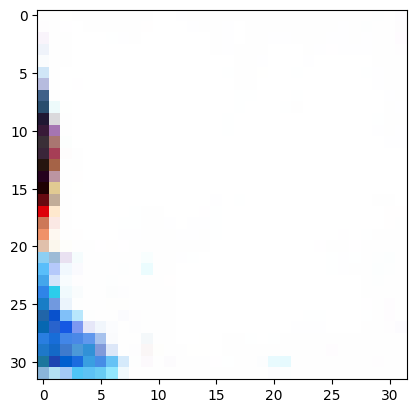

[81/500][0/936]	Loss_D: 0.3062	Loss_G: 8.2148	D(x): 0.9999	D(G(z)): 0.1853 / 0.0015
[81/500][15/936]	Loss_D: 0.0286	Loss_G: 6.3036	D(x): 0.9997	D(G(z)): 0.0274 / 0.0093
[81/500][30/936]	Loss_D: 0.0015	Loss_G: 8.3674	D(x): 0.9988	D(G(z)): 0.0003 / 0.0003
[81/500][45/936]	Loss_D: 0.0127	Loss_G: 5.0472	D(x): 1.0000	D(G(z)): 0.0126 / 0.0087
[81/500][60/936]	Loss_D: 0.0735	Loss_G: 6.4191	D(x): 0.9990	D(G(z)): 0.0648 / 0.0052
[81/500][75/936]	Loss_D: 0.0023	Loss_G: 9.6485	D(x): 0.9985	D(G(z)): 0.0008 / 0.0008
[81/500][90/936]	Loss_D: 0.5948	Loss_G: 5.9793	D(x): 0.6346	D(G(z)): 0.0009 / 0.0128
[81/500][105/936]	Loss_D: 0.0162	Loss_G: 5.4289	D(x): 0.9991	D(G(z)): 0.0151 / 0.0083
[81/500][120/936]	Loss_D: 0.0082	Loss_G: 5.9509	D(x): 0.9997	D(G(z)): 0.0079 / 0.0064
[81/500][135/936]	Loss_D: 0.0066	Loss_G: 5.6426	D(x): 0.9996	D(G(z)): 0.0061 / 0.0059
[81/500][150/936]	Loss_D: 0.0030	Loss_G: 7.7251	D(x): 0.9984	D(G(z)): 0.0014 / 0.0012
[81/500][165/936]	Loss_D: 0.1252	Loss_G: 5.1425	D(x): 0.9052	D

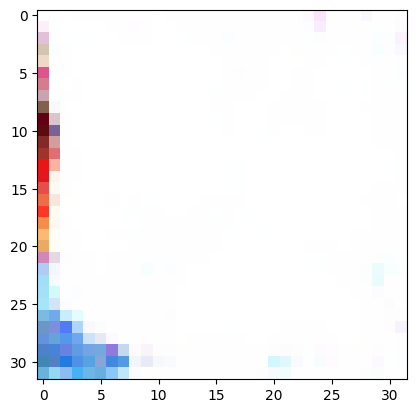

[82/500][0/936]	Loss_D: 0.0038	Loss_G: 7.1465	D(x): 1.0000	D(G(z)): 0.0038 / 0.0032
[82/500][15/936]	Loss_D: 0.3305	Loss_G: 8.4766	D(x): 0.7759	D(G(z)): 0.0003 / 0.0006
[82/500][30/936]	Loss_D: 0.0538	Loss_G: 7.1578	D(x): 0.9608	D(G(z)): 0.0111 / 0.0064
[82/500][45/936]	Loss_D: 0.0136	Loss_G: 5.1745	D(x): 1.0000	D(G(z)): 0.0135 / 0.0074
[82/500][60/936]	Loss_D: 0.0071	Loss_G: 5.1469	D(x): 1.0000	D(G(z)): 0.0071 / 0.0075
[82/500][75/936]	Loss_D: 0.0058	Loss_G: 6.7696	D(x): 1.0000	D(G(z)): 0.0058 / 0.0094
[82/500][90/936]	Loss_D: 0.0129	Loss_G: 6.1660	D(x): 0.9980	D(G(z)): 0.0107 / 0.0076
[82/500][105/936]	Loss_D: 0.0779	Loss_G: 4.7604	D(x): 0.9995	D(G(z)): 0.0719 / 0.0133
[82/500][120/936]	Loss_D: 0.0137	Loss_G: 5.5890	D(x): 1.0000	D(G(z)): 0.0134 / 0.0098
[82/500][135/936]	Loss_D: 0.0009	Loss_G: 8.2194	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[82/500][150/936]	Loss_D: 0.0147	Loss_G: 8.2177	D(x): 0.9869	D(G(z)): 0.0014 / 0.0010
[82/500][165/936]	Loss_D: 0.0280	Loss_G: 7.8032	D(x): 0.9731	D

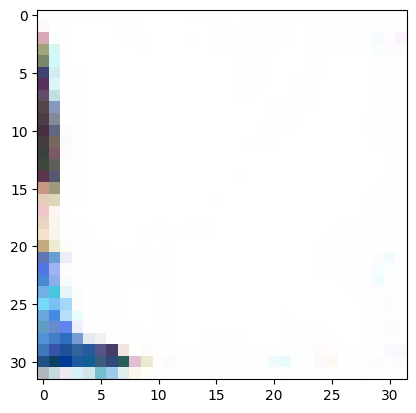

[83/500][0/936]	Loss_D: 0.0583	Loss_G: 8.0807	D(x): 0.9450	D(G(z)): 0.0004 / 0.0006
[83/500][15/936]	Loss_D: 0.0034	Loss_G: 6.1578	D(x): 1.0000	D(G(z)): 0.0034 / 0.0036
[83/500][30/936]	Loss_D: 0.0060	Loss_G: 6.8120	D(x): 0.9998	D(G(z)): 0.0057 / 0.0051
[83/500][45/936]	Loss_D: 0.0031	Loss_G: 7.8831	D(x): 1.0000	D(G(z)): 0.0030 / 0.0027
[83/500][60/936]	Loss_D: 0.0179	Loss_G: 7.2801	D(x): 0.9831	D(G(z)): 0.0007 / 0.0008
[83/500][75/936]	Loss_D: 0.0048	Loss_G: 7.8844	D(x): 0.9991	D(G(z)): 0.0039 / 0.0025
[83/500][90/936]	Loss_D: 0.0100	Loss_G: 7.0798	D(x): 0.9964	D(G(z)): 0.0064 / 0.0053
[83/500][105/936]	Loss_D: 0.0055	Loss_G: 6.3303	D(x): 1.0000	D(G(z)): 0.0055 / 0.0043
[83/500][120/936]	Loss_D: 0.0157	Loss_G: 5.8573	D(x): 0.9999	D(G(z)): 0.0154 / 0.0092
[83/500][135/936]	Loss_D: 0.0072	Loss_G: 5.5023	D(x): 0.9998	D(G(z)): 0.0070 / 0.0060
[83/500][150/936]	Loss_D: 0.0016	Loss_G: 7.1555	D(x): 0.9999	D(G(z)): 0.0015 / 0.0013
[83/500][165/936]	Loss_D: 0.0067	Loss_G: 8.2767	D(x): 1.0000	D

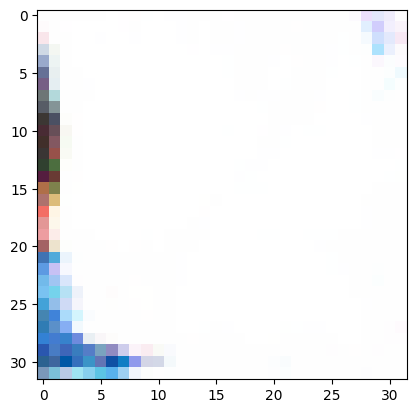

[84/500][0/936]	Loss_D: 0.0008	Loss_G: 8.5473	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[84/500][15/936]	Loss_D: 0.0548	Loss_G: 6.1797	D(x): 0.9998	D(G(z)): 0.0496 / 0.0086
[84/500][30/936]	Loss_D: 0.0936	Loss_G: 7.1805	D(x): 0.9217	D(G(z)): 0.0012 / 0.0019
[84/500][45/936]	Loss_D: 0.1571	Loss_G: 7.1951	D(x): 0.9999	D(G(z)): 0.1192 / 0.0021
[84/500][60/936]	Loss_D: 0.0248	Loss_G: 11.2261	D(x): 0.9761	D(G(z)): 0.0002 / 0.0002
[84/500][75/936]	Loss_D: 0.0080	Loss_G: 6.2807	D(x): 0.9996	D(G(z)): 0.0075 / 0.0054
[84/500][90/936]	Loss_D: 0.0017	Loss_G: 7.5635	D(x): 0.9991	D(G(z)): 0.0008 / 0.0008
[84/500][105/936]	Loss_D: 0.0195	Loss_G: 10.9254	D(x): 0.9809	D(G(z)): 0.0001 / 0.0001
[84/500][120/936]	Loss_D: 0.0003	Loss_G: 8.9605	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[84/500][135/936]	Loss_D: 0.0079	Loss_G: 6.0819	D(x): 1.0000	D(G(z)): 0.0079 / 0.0057
[84/500][150/936]	Loss_D: 0.0024	Loss_G: 6.3770	D(x): 0.9997	D(G(z)): 0.0021 / 0.0019
[84/500][165/936]	Loss_D: 0.0009	Loss_G: 8.7599	D(x): 0.9998

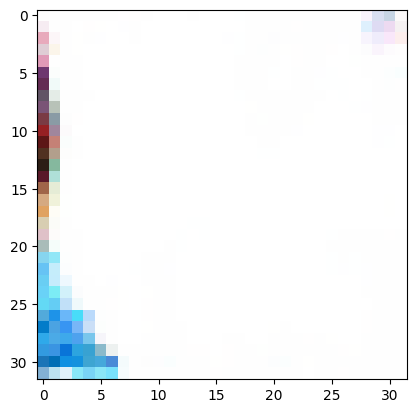

[85/500][0/936]	Loss_D: 0.0027	Loss_G: 8.2873	D(x): 1.0000	D(G(z)): 0.0027 / 0.0025
[85/500][15/936]	Loss_D: 0.0085	Loss_G: 10.0356	D(x): 0.9917	D(G(z)): 0.0001 / 0.0001
[85/500][30/936]	Loss_D: 0.0041	Loss_G: 7.0923	D(x): 1.0000	D(G(z)): 0.0040 / 0.0031
[85/500][45/936]	Loss_D: 0.0001	Loss_G: 9.5701	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[85/500][60/936]	Loss_D: 0.0202	Loss_G: 7.8153	D(x): 0.9816	D(G(z)): 0.0012 / 0.0012
[85/500][75/936]	Loss_D: 0.0016	Loss_G: 6.7571	D(x): 1.0000	D(G(z)): 0.0015 / 0.0016
[85/500][90/936]	Loss_D: 0.1171	Loss_G: 5.4573	D(x): 0.9122	D(G(z)): 0.0214 / 0.0187
[85/500][105/936]	Loss_D: 0.0982	Loss_G: 4.4266	D(x): 1.0000	D(G(z)): 0.0901 / 0.0263
[85/500][120/936]	Loss_D: 0.0031	Loss_G: 6.2468	D(x): 0.9998	D(G(z)): 0.0029 / 0.0028
[85/500][135/936]	Loss_D: 0.0105	Loss_G: 5.3039	D(x): 1.0000	D(G(z)): 0.0104 / 0.0090
[85/500][150/936]	Loss_D: 0.1623	Loss_G: 8.5288	D(x): 0.8673	D(G(z)): 0.0003 / 0.0003
[85/500][165/936]	Loss_D: 0.0004	Loss_G: 9.4743	D(x): 0.9998	

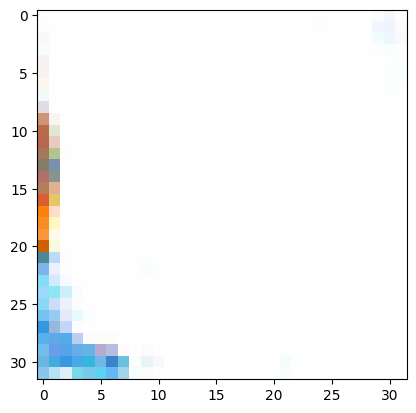

[86/500][0/936]	Loss_D: 0.0050	Loss_G: 6.5781	D(x): 0.9998	D(G(z)): 0.0048 / 0.0039
[86/500][15/936]	Loss_D: 0.0033	Loss_G: 7.9434	D(x): 0.9979	D(G(z)): 0.0011 / 0.0011
[86/500][30/936]	Loss_D: 0.0182	Loss_G: 5.6730	D(x): 1.0000	D(G(z)): 0.0179 / 0.0116
[86/500][45/936]	Loss_D: 0.0042	Loss_G: 10.9477	D(x): 0.9959	D(G(z)): 0.0000 / 0.0000
[86/500][60/936]	Loss_D: 0.0006	Loss_G: 8.2326	D(x): 0.9999	D(G(z)): 0.0005 / 0.0005
[86/500][75/936]	Loss_D: 0.0138	Loss_G: 5.7057	D(x): 1.0000	D(G(z)): 0.0136 / 0.0096
[86/500][90/936]	Loss_D: 0.0014	Loss_G: 6.8032	D(x): 1.0000	D(G(z)): 0.0014 / 0.0011
[86/500][105/936]	Loss_D: 0.1395	Loss_G: 8.1559	D(x): 0.9977	D(G(z)): 0.1113 / 0.0022
[86/500][120/936]	Loss_D: 0.0009	Loss_G: 9.3985	D(x): 0.9999	D(G(z)): 0.0008 / 0.0007
[86/500][135/936]	Loss_D: 0.0013	Loss_G: 6.8918	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[86/500][150/936]	Loss_D: 0.0659	Loss_G: 3.8955	D(x): 1.0000	D(G(z)): 0.0634 / 0.0227
[86/500][165/936]	Loss_D: 0.0049	Loss_G: 7.0617	D(x): 0.9974	

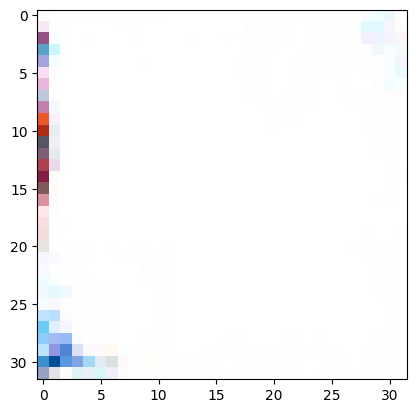

[87/500][0/936]	Loss_D: 0.0059	Loss_G: 9.4994	D(x): 0.9942	D(G(z)): 0.0001 / 0.0001
[87/500][15/936]	Loss_D: 0.0101	Loss_G: 7.3897	D(x): 0.9946	D(G(z)): 0.0046 / 0.0039
[87/500][30/936]	Loss_D: 0.0020	Loss_G: 8.8401	D(x): 0.9985	D(G(z)): 0.0005 / 0.0005
[87/500][45/936]	Loss_D: 0.0069	Loss_G: 6.4981	D(x): 0.9993	D(G(z)): 0.0062 / 0.0054
[87/500][60/936]	Loss_D: 0.0588	Loss_G: 5.4080	D(x): 0.9999	D(G(z)): 0.0551 / 0.0155
[87/500][75/936]	Loss_D: 0.0096	Loss_G: 6.9223	D(x): 0.9942	D(G(z)): 0.0038 / 0.0036
[87/500][90/936]	Loss_D: 0.0141	Loss_G: 8.3525	D(x): 0.9864	D(G(z)): 0.0004 / 0.0004
[87/500][105/936]	Loss_D: 0.0040	Loss_G: 6.7832	D(x): 1.0000	D(G(z)): 0.0040 / 0.0031
[87/500][120/936]	Loss_D: 0.0002	Loss_G: 10.3140	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[87/500][135/936]	Loss_D: 0.0014	Loss_G: 8.1312	D(x): 0.9995	D(G(z)): 0.0009 / 0.0007
[87/500][150/936]	Loss_D: 0.0003	Loss_G: 10.9126	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[87/500][165/936]	Loss_D: 0.0005	Loss_G: 8.9389	D(x): 0.9998

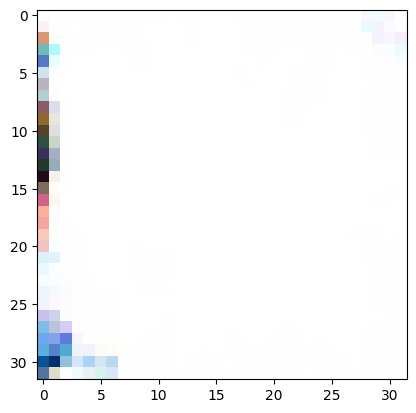

[88/500][0/936]	Loss_D: 0.0007	Loss_G: 7.7933	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[88/500][15/936]	Loss_D: 0.0042	Loss_G: 6.1457	D(x): 1.0000	D(G(z)): 0.0042 / 0.0043
[88/500][30/936]	Loss_D: 0.2240	Loss_G: 8.6686	D(x): 0.9993	D(G(z)): 0.1515 / 0.0009
[88/500][45/936]	Loss_D: 0.0107	Loss_G: 6.7857	D(x): 0.9992	D(G(z)): 0.0098 / 0.0056
[88/500][60/936]	Loss_D: 0.1440	Loss_G: 8.4651	D(x): 0.8834	D(G(z)): 0.0033 / 0.0094
[88/500][75/936]	Loss_D: 0.0023	Loss_G: 7.5802	D(x): 0.9990	D(G(z)): 0.0013 / 0.0015
[88/500][90/936]	Loss_D: 0.0263	Loss_G: 7.2295	D(x): 1.0000	D(G(z)): 0.0250 / 0.0042
[88/500][105/936]	Loss_D: 0.2202	Loss_G: 7.0571	D(x): 0.8612	D(G(z)): 0.0233 / 0.0049
[88/500][120/936]	Loss_D: 0.0080	Loss_G: 5.5588	D(x): 0.9990	D(G(z)): 0.0070 / 0.0048
[88/500][135/936]	Loss_D: 0.0027	Loss_G: 8.7108	D(x): 0.9980	D(G(z)): 0.0007 / 0.0005
[88/500][150/936]	Loss_D: 0.0004	Loss_G: 10.0053	D(x): 0.9998	D(G(z)): 0.0003 / 0.0002
[88/500][165/936]	Loss_D: 0.0108	Loss_G: 5.0999	D(x): 0.9965	

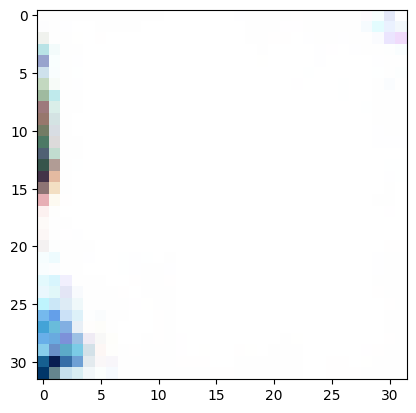

[89/500][0/936]	Loss_D: 0.0049	Loss_G: 6.2383	D(x): 0.9996	D(G(z)): 0.0045 / 0.0032
[89/500][15/936]	Loss_D: 0.0016	Loss_G: 7.0417	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[89/500][30/936]	Loss_D: 0.0263	Loss_G: 7.1250	D(x): 0.9995	D(G(z)): 0.0252 / 0.0030
[89/500][45/936]	Loss_D: 0.4366	Loss_G: 9.6535	D(x): 0.9996	D(G(z)): 0.3075 / 0.0019
[89/500][60/936]	Loss_D: 0.0268	Loss_G: 8.1109	D(x): 0.9745	D(G(z)): 0.0006 / 0.0007
[89/500][75/936]	Loss_D: 0.0483	Loss_G: 6.0461	D(x): 1.0000	D(G(z)): 0.0455 / 0.0091
[89/500][90/936]	Loss_D: 0.0013	Loss_G: 7.0290	D(x): 1.0000	D(G(z)): 0.0013 / 0.0016
[89/500][105/936]	Loss_D: 0.0080	Loss_G: 7.0102	D(x): 1.0000	D(G(z)): 0.0079 / 0.0053
[89/500][120/936]	Loss_D: 0.0123	Loss_G: 5.7806	D(x): 0.9941	D(G(z)): 0.0063 / 0.0046
[89/500][135/936]	Loss_D: 0.0019	Loss_G: 6.4431	D(x): 0.9999	D(G(z)): 0.0017 / 0.0016
[89/500][150/936]	Loss_D: 0.0083	Loss_G: 5.9471	D(x): 0.9954	D(G(z)): 0.0037 / 0.0033
[89/500][165/936]	Loss_D: 0.0090	Loss_G: 7.8845	D(x): 0.9916	D

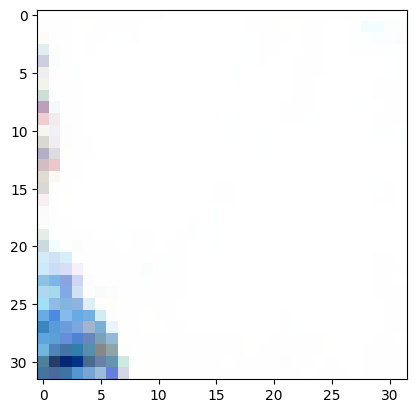

[90/500][0/936]	Loss_D: 0.0120	Loss_G: 6.6536	D(x): 0.9991	D(G(z)): 0.0109 / 0.0053
[90/500][15/936]	Loss_D: 0.0055	Loss_G: 6.0427	D(x): 0.9990	D(G(z)): 0.0045 / 0.0034
[90/500][30/936]	Loss_D: 0.0043	Loss_G: 6.6869	D(x): 0.9993	D(G(z)): 0.0036 / 0.0028
[90/500][45/936]	Loss_D: 0.2854	Loss_G: 4.8609	D(x): 0.9990	D(G(z)): 0.2048 / 0.0154
[90/500][60/936]	Loss_D: 0.0205	Loss_G: 6.2646	D(x): 0.9995	D(G(z)): 0.0194 / 0.0033
[90/500][75/936]	Loss_D: 0.0100	Loss_G: 6.0272	D(x): 1.0000	D(G(z)): 0.0099 / 0.0072
[90/500][90/936]	Loss_D: 0.0005	Loss_G: 9.0162	D(x): 0.9998	D(G(z)): 0.0003 / 0.0002
[90/500][105/936]	Loss_D: 0.0158	Loss_G: 7.6016	D(x): 0.9999	D(G(z)): 0.0153 / 0.0058
[90/500][120/936]	Loss_D: 0.0101	Loss_G: 7.4484	D(x): 0.9920	D(G(z)): 0.0020 / 0.0019
[90/500][135/936]	Loss_D: 0.0049	Loss_G: 6.5837	D(x): 0.9999	D(G(z)): 0.0049 / 0.0050
[90/500][150/936]	Loss_D: 0.0110	Loss_G: 5.9476	D(x): 0.9997	D(G(z)): 0.0107 / 0.0077
[90/500][165/936]	Loss_D: 0.0023	Loss_G: 7.4476	D(x): 1.0000	D

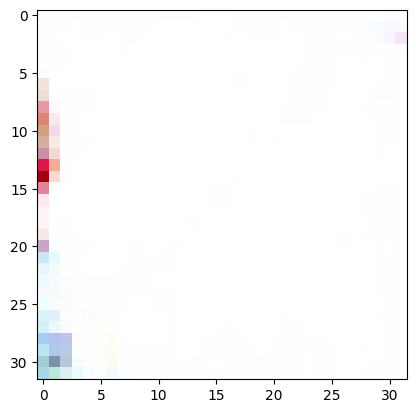

[91/500][0/936]	Loss_D: 0.0051	Loss_G: 9.0062	D(x): 0.9980	D(G(z)): 0.0030 / 0.0026
[91/500][15/936]	Loss_D: 0.0049	Loss_G: 5.9781	D(x): 0.9992	D(G(z)): 0.0041 / 0.0039
[91/500][30/936]	Loss_D: 0.0013	Loss_G: 7.8225	D(x): 0.9992	D(G(z)): 0.0005 / 0.0004
[91/500][45/936]	Loss_D: 0.0022	Loss_G: 8.6281	D(x): 0.9985	D(G(z)): 0.0007 / 0.0007
[91/500][60/936]	Loss_D: 0.0063	Loss_G: 6.7243	D(x): 0.9984	D(G(z)): 0.0048 / 0.0042
[91/500][75/936]	Loss_D: 0.0020	Loss_G: 6.9970	D(x): 1.0000	D(G(z)): 0.0020 / 0.0019
[91/500][90/936]	Loss_D: 0.0061	Loss_G: 6.7225	D(x): 0.9964	D(G(z)): 0.0025 / 0.0024
[91/500][105/936]	Loss_D: 0.0006	Loss_G: 7.5558	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[91/500][120/936]	Loss_D: 0.0126	Loss_G: 7.3670	D(x): 0.9919	D(G(z)): 0.0045 / 0.0027
[91/500][135/936]	Loss_D: 0.0085	Loss_G: 6.6211	D(x): 0.9959	D(G(z)): 0.0044 / 0.0035
[91/500][150/936]	Loss_D: 0.1243	Loss_G: 6.5461	D(x): 0.9043	D(G(z)): 0.0157 / 0.0028
[91/500][165/936]	Loss_D: 0.0022	Loss_G: 6.7546	D(x): 1.0000	D

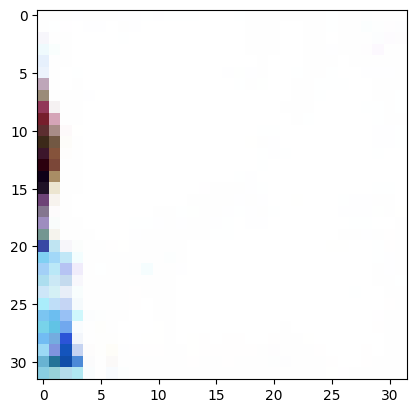

[92/500][0/936]	Loss_D: 0.0008	Loss_G: 8.4308	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[92/500][15/936]	Loss_D: 0.0816	Loss_G: 7.8879	D(x): 0.9229	D(G(z)): 0.0005 / 0.0005
[92/500][30/936]	Loss_D: 0.0007	Loss_G: 9.9029	D(x): 0.9995	D(G(z)): 0.0003 / 0.0002
[92/500][45/936]	Loss_D: 0.0148	Loss_G: 6.2235	D(x): 0.9990	D(G(z)): 0.0135 / 0.0096
[92/500][60/936]	Loss_D: 0.0053	Loss_G: 8.3011	D(x): 1.0000	D(G(z)): 0.0053 / 0.0041
[92/500][75/936]	Loss_D: 0.0018	Loss_G: 7.9431	D(x): 0.9996	D(G(z)): 0.0013 / 0.0009
[92/500][90/936]	Loss_D: 0.0064	Loss_G: 10.2018	D(x): 0.9937	D(G(z)): 0.0001 / 0.0001
[92/500][105/936]	Loss_D: 0.0046	Loss_G: 7.3731	D(x): 0.9967	D(G(z)): 0.0013 / 0.0012
[92/500][120/936]	Loss_D: 0.0016	Loss_G: 8.9354	D(x): 0.9992	D(G(z)): 0.0008 / 0.0008
[92/500][135/936]	Loss_D: 0.0030	Loss_G: 8.0224	D(x): 1.0000	D(G(z)): 0.0030 / 0.0024
[92/500][150/936]	Loss_D: 0.0294	Loss_G: 6.1907	D(x): 0.9908	D(G(z)): 0.0196 / 0.0108
[92/500][165/936]	Loss_D: 0.0088	Loss_G: 6.2139	D(x): 0.9994	

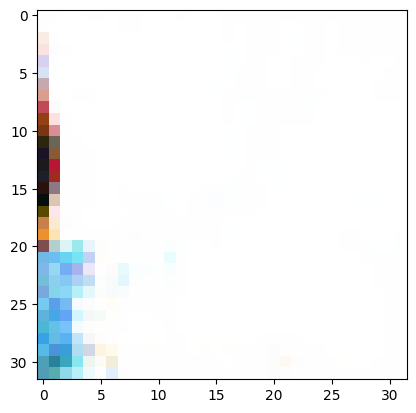

[93/500][0/936]	Loss_D: 2.0350	Loss_G: 7.5891	D(x): 0.6420	D(G(z)): 0.0016 / 0.0021
[93/500][15/936]	Loss_D: 0.0013	Loss_G: 9.6969	D(x): 0.9999	D(G(z)): 0.0012 / 0.0010
[93/500][30/936]	Loss_D: 0.0013	Loss_G: 7.7376	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[93/500][45/936]	Loss_D: 0.4607	Loss_G: 7.2675	D(x): 1.0000	D(G(z)): 0.3319 / 0.0011
[93/500][60/936]	Loss_D: 0.0533	Loss_G: 6.6779	D(x): 0.9974	D(G(z)): 0.0472 / 0.0116
[93/500][75/936]	Loss_D: 0.0098	Loss_G: 5.6673	D(x): 0.9972	D(G(z)): 0.0069 / 0.0051
[93/500][90/936]	Loss_D: 0.0137	Loss_G: 5.9751	D(x): 0.9994	D(G(z)): 0.0129 / 0.0068
[93/500][105/936]	Loss_D: 0.0014	Loss_G: 7.7722	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[93/500][120/936]	Loss_D: 0.0020	Loss_G: 8.0436	D(x): 1.0000	D(G(z)): 0.0020 / 0.0021
[93/500][135/936]	Loss_D: 0.0360	Loss_G: 5.5552	D(x): 0.9853	D(G(z)): 0.0205 / 0.0205
[93/500][150/936]	Loss_D: 0.0050	Loss_G: 6.0785	D(x): 1.0000	D(G(z)): 0.0049 / 0.0039
[93/500][165/936]	Loss_D: 0.0106	Loss_G: 6.9250	D(x): 0.9967	D

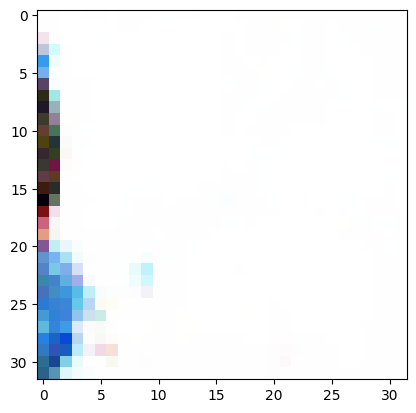

[94/500][0/936]	Loss_D: 0.0847	Loss_G: 5.6694	D(x): 1.0000	D(G(z)): 0.0778 / 0.0088
[94/500][15/936]	Loss_D: 0.0533	Loss_G: 7.3324	D(x): 0.9495	D(G(z)): 0.0009 / 0.0014
[94/500][30/936]	Loss_D: 0.0974	Loss_G: 5.1643	D(x): 1.0000	D(G(z)): 0.0839 / 0.0094
[94/500][45/936]	Loss_D: 0.6203	Loss_G: 7.5486	D(x): 0.6427	D(G(z)): 0.0002 / 0.0018
[94/500][60/936]	Loss_D: 0.0057	Loss_G: 9.6291	D(x): 0.9947	D(G(z)): 0.0003 / 0.0003
[94/500][75/936]	Loss_D: 0.0323	Loss_G: 7.2107	D(x): 0.9700	D(G(z)): 0.0012 / 0.0013
[94/500][90/936]	Loss_D: 0.0039	Loss_G: 7.1062	D(x): 0.9994	D(G(z)): 0.0033 / 0.0026
[94/500][105/936]	Loss_D: 0.0027	Loss_G: 8.2540	D(x): 0.9977	D(G(z)): 0.0004 / 0.0004
[94/500][120/936]	Loss_D: 0.0046	Loss_G: 6.7737	D(x): 0.9988	D(G(z)): 0.0034 / 0.0025
[94/500][135/936]	Loss_D: 0.0011	Loss_G: 9.7790	D(x): 0.9996	D(G(z)): 0.0008 / 0.0007
[94/500][150/936]	Loss_D: 0.0028	Loss_G: 7.1189	D(x): 0.9999	D(G(z)): 0.0027 / 0.0016
[94/500][165/936]	Loss_D: 0.0002	Loss_G: 9.1635	D(x): 1.0000	D

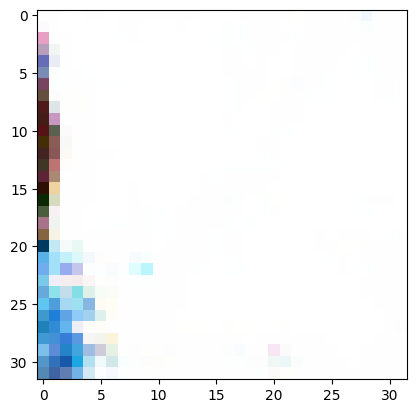

[95/500][0/936]	Loss_D: 0.0013	Loss_G: 7.3540	D(x): 0.9999	D(G(z)): 0.0013 / 0.0011
[95/500][15/936]	Loss_D: 0.0034	Loss_G: 5.8628	D(x): 0.9998	D(G(z)): 0.0032 / 0.0033
[95/500][30/936]	Loss_D: 0.1396	Loss_G: 10.7223	D(x): 0.8817	D(G(z)): 0.0001 / 0.0004
[95/500][45/936]	Loss_D: 0.0001	Loss_G: 12.1656	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[95/500][60/936]	Loss_D: 0.0070	Loss_G: 5.9733	D(x): 0.9992	D(G(z)): 0.0061 / 0.0057
[95/500][75/936]	Loss_D: 0.0008	Loss_G: 8.6752	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[95/500][90/936]	Loss_D: 0.0333	Loss_G: 4.6853	D(x): 0.9995	D(G(z)): 0.0317 / 0.0166
[95/500][105/936]	Loss_D: 0.0430	Loss_G: 5.3421	D(x): 1.0000	D(G(z)): 0.0413 / 0.0069
[95/500][120/936]	Loss_D: 0.0208	Loss_G: 4.9860	D(x): 0.9980	D(G(z)): 0.0186 / 0.0111
[95/500][135/936]	Loss_D: 0.0480	Loss_G: 5.1708	D(x): 0.9998	D(G(z)): 0.0456 / 0.0182
[95/500][150/936]	Loss_D: 0.0060	Loss_G: 10.6345	D(x): 0.9941	D(G(z)): 0.0001 / 0.0001
[95/500][165/936]	Loss_D: 0.0672	Loss_G: 5.9642	D(x): 0.999

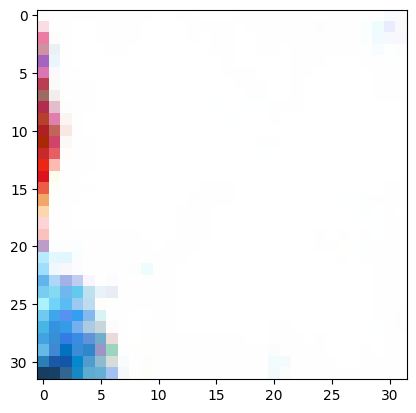

[96/500][0/936]	Loss_D: 0.0123	Loss_G: 7.8827	D(x): 0.9897	D(G(z)): 0.0019 / 0.0010
[96/500][15/936]	Loss_D: 0.0002	Loss_G: 10.5045	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[96/500][30/936]	Loss_D: 0.0005	Loss_G: 12.9627	D(x): 0.9995	D(G(z)): 0.0000 / 0.0000
[96/500][45/936]	Loss_D: 0.0037	Loss_G: 6.4603	D(x): 0.9998	D(G(z)): 0.0036 / 0.0029
[96/500][60/936]	Loss_D: 0.0530	Loss_G: 5.2041	D(x): 1.0000	D(G(z)): 0.0496 / 0.0100
[96/500][75/936]	Loss_D: 0.0083	Loss_G: 8.5351	D(x): 0.9922	D(G(z)): 0.0004 / 0.0004
[96/500][90/936]	Loss_D: 0.0003	Loss_G: 10.1384	D(x): 1.0000	D(G(z)): 0.0003 / 0.0005
[96/500][105/936]	Loss_D: 0.0021	Loss_G: 7.3950	D(x): 1.0000	D(G(z)): 0.0021 / 0.0018
[96/500][120/936]	Loss_D: 0.1443	Loss_G: 7.1802	D(x): 0.8782	D(G(z)): 0.0005 / 0.0011
[96/500][135/936]	Loss_D: 0.0012	Loss_G: 8.7950	D(x): 0.9999	D(G(z)): 0.0011 / 0.0009
[96/500][150/936]	Loss_D: 0.0004	Loss_G: 9.1456	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[96/500][165/936]	Loss_D: 0.0025	Loss_G: 6.4314	D(x): 1.000

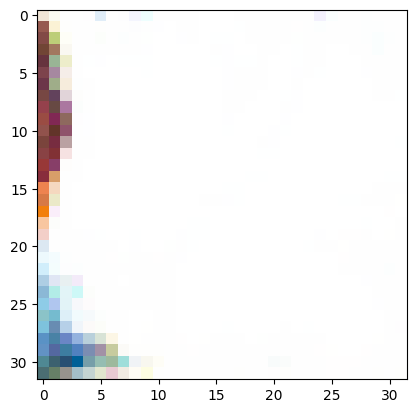

[97/500][0/936]	Loss_D: 0.0016	Loss_G: 7.4009	D(x): 1.0000	D(G(z)): 0.0015 / 0.0026
[97/500][15/936]	Loss_D: 0.0011	Loss_G: 7.4404	D(x): 1.0000	D(G(z)): 0.0011 / 0.0012
[97/500][30/936]	Loss_D: 0.0004	Loss_G: 9.8904	D(x): 1.0000	D(G(z)): 0.0004 / 0.0005
[97/500][45/936]	Loss_D: 0.0006	Loss_G: 8.2287	D(x): 0.9998	D(G(z)): 0.0004 / 0.0004
[97/500][60/936]	Loss_D: 0.0205	Loss_G: 6.7450	D(x): 0.9976	D(G(z)): 0.0174 / 0.0040
[97/500][75/936]	Loss_D: 0.0026	Loss_G: 7.4389	D(x): 0.9982	D(G(z)): 0.0007 / 0.0007
[97/500][90/936]	Loss_D: 0.0208	Loss_G: 9.1075	D(x): 0.9799	D(G(z)): 0.0003 / 0.0003
[97/500][105/936]	Loss_D: 0.0014	Loss_G: 7.6398	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[97/500][120/936]	Loss_D: 0.0032	Loss_G: 6.4590	D(x): 0.9990	D(G(z)): 0.0022 / 0.0020
[97/500][135/936]	Loss_D: 0.0145	Loss_G: 4.9695	D(x): 0.9994	D(G(z)): 0.0138 / 0.0096
[97/500][150/936]	Loss_D: 0.0311	Loss_G: 9.9284	D(x): 0.9710	D(G(z)): 0.0007 / 0.0009
[97/500][165/936]	Loss_D: 0.0003	Loss_G: 9.6773	D(x): 0.9999	D

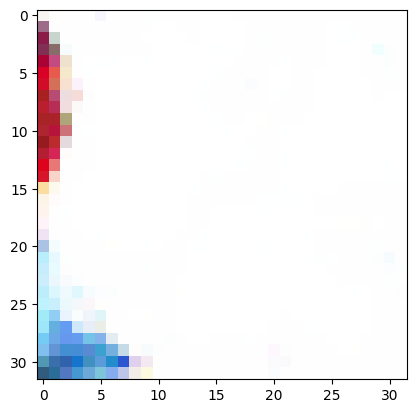

[98/500][0/936]	Loss_D: 0.0022	Loss_G: 10.5511	D(x): 0.9982	D(G(z)): 0.0004 / 0.0004
[98/500][15/936]	Loss_D: 0.0182	Loss_G: 9.3214	D(x): 0.9956	D(G(z)): 0.0135 / 0.0104
[98/500][30/936]	Loss_D: 0.0029	Loss_G: 10.7421	D(x): 0.9977	D(G(z)): 0.0006 / 0.0005
[98/500][45/936]	Loss_D: 0.1513	Loss_G: 6.2345	D(x): 0.8715	D(G(z)): 0.0058 / 0.0085
[98/500][60/936]	Loss_D: 0.0199	Loss_G: 4.6358	D(x): 0.9965	D(G(z)): 0.0161 / 0.0115
[98/500][75/936]	Loss_D: 1.8242	Loss_G: 9.3290	D(x): 0.9988	D(G(z)): 0.6827 / 0.0004
[98/500][90/936]	Loss_D: 0.0005	Loss_G: 8.8115	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[98/500][105/936]	Loss_D: 0.0591	Loss_G: 6.0724	D(x): 1.0000	D(G(z)): 0.0530 / 0.0091
[98/500][120/936]	Loss_D: 0.5617	Loss_G: 4.3448	D(x): 0.6281	D(G(z)): 0.0011 / 0.0275
[98/500][135/936]	Loss_D: 0.0172	Loss_G: 5.1963	D(x): 1.0000	D(G(z)): 0.0170 / 0.0165
[98/500][150/936]	Loss_D: 0.0011	Loss_G: 8.1266	D(x): 1.0000	D(G(z)): 0.0011 / 0.0011
[98/500][165/936]	Loss_D: 0.0007	Loss_G: 8.0135	D(x): 0.9999

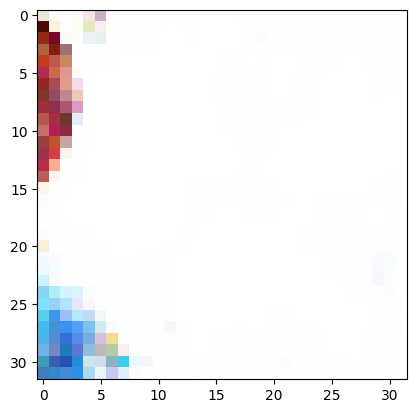

[99/500][0/936]	Loss_D: 0.0009	Loss_G: 9.4038	D(x): 0.9994	D(G(z)): 0.0003 / 0.0003
[99/500][15/936]	Loss_D: 0.0013	Loss_G: 9.5146	D(x): 0.9997	D(G(z)): 0.0010 / 0.0010
[99/500][30/936]	Loss_D: 0.0016	Loss_G: 7.2015	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[99/500][45/936]	Loss_D: 0.0436	Loss_G: 6.6716	D(x): 0.9991	D(G(z)): 0.0401 / 0.0078
[99/500][60/936]	Loss_D: 0.0025	Loss_G: 6.4429	D(x): 1.0000	D(G(z)): 0.0025 / 0.0023
[99/500][75/936]	Loss_D: 0.1052	Loss_G: 4.9370	D(x): 1.0000	D(G(z)): 0.0973 / 0.0127
[99/500][90/936]	Loss_D: 0.1145	Loss_G: 7.7612	D(x): 0.9998	D(G(z)): 0.0955 / 0.0017
[99/500][105/936]	Loss_D: 0.0016	Loss_G: 8.4741	D(x): 0.9999	D(G(z)): 0.0014 / 0.0008
[99/500][120/936]	Loss_D: 0.0065	Loss_G: 8.3257	D(x): 0.9941	D(G(z)): 0.0006 / 0.0006
[99/500][135/936]	Loss_D: 0.0003	Loss_G: 9.5124	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[99/500][150/936]	Loss_D: 0.0128	Loss_G: 6.2382	D(x): 0.9916	D(G(z)): 0.0042 / 0.0036
[99/500][165/936]	Loss_D: 0.0624	Loss_G: 5.6508	D(x): 0.9956	D

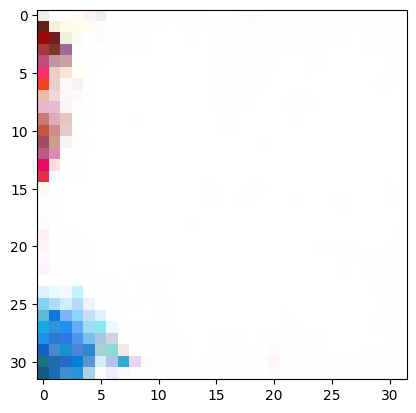

[100/500][0/936]	Loss_D: 0.0010	Loss_G: 7.9614	D(x): 0.9997	D(G(z)): 0.0007 / 0.0006
[100/500][15/936]	Loss_D: 0.0029	Loss_G: 8.8789	D(x): 0.9975	D(G(z)): 0.0004 / 0.0003
[100/500][30/936]	Loss_D: 0.0020	Loss_G: 7.0528	D(x): 0.9988	D(G(z)): 0.0008 / 0.0010
[100/500][45/936]	Loss_D: 0.0054	Loss_G: 6.0454	D(x): 0.9998	D(G(z)): 0.0053 / 0.0036
[100/500][60/936]	Loss_D: 0.0027	Loss_G: 7.1335	D(x): 1.0000	D(G(z)): 0.0027 / 0.0023
[100/500][75/936]	Loss_D: 0.0103	Loss_G: 6.6692	D(x): 0.9994	D(G(z)): 0.0096 / 0.0058
[100/500][90/936]	Loss_D: 0.0196	Loss_G: 6.3539	D(x): 0.9876	D(G(z)): 0.0070 / 0.0051
[100/500][105/936]	Loss_D: 0.0010	Loss_G: 7.8143	D(x): 0.9995	D(G(z)): 0.0005 / 0.0005
[100/500][120/936]	Loss_D: 0.0148	Loss_G: 5.3916	D(x): 0.9998	D(G(z)): 0.0143 / 0.0091
[100/500][135/936]	Loss_D: 0.0021	Loss_G: 8.5765	D(x): 0.9989	D(G(z)): 0.0010 / 0.0010
[100/500][150/936]	Loss_D: 0.0212	Loss_G: 7.3694	D(x): 0.9801	D(G(z)): 0.0008 / 0.0008
[100/500][165/936]	Loss_D: 0.0030	Loss_G: 6.9579	D(

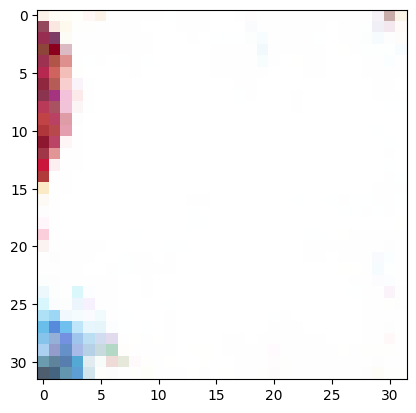

[101/500][0/936]	Loss_D: 0.0021	Loss_G: 6.9234	D(x): 1.0000	D(G(z)): 0.0021 / 0.0020
[101/500][15/936]	Loss_D: 0.0120	Loss_G: 5.2608	D(x): 0.9956	D(G(z)): 0.0076 / 0.0074
[101/500][30/936]	Loss_D: 0.0018	Loss_G: 10.5980	D(x): 0.9984	D(G(z)): 0.0002 / 0.0003
[101/500][45/936]	Loss_D: 0.0021	Loss_G: 6.9193	D(x): 0.9999	D(G(z)): 0.0020 / 0.0018
[101/500][60/936]	Loss_D: 0.0403	Loss_G: 5.2991	D(x): 0.9805	D(G(z)): 0.0202 / 0.0072
[101/500][75/936]	Loss_D: 0.0005	Loss_G: 9.5509	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[101/500][90/936]	Loss_D: 0.0057	Loss_G: 6.6497	D(x): 0.9999	D(G(z)): 0.0055 / 0.0041
[101/500][105/936]	Loss_D: 0.0072	Loss_G: 7.9808	D(x): 0.9933	D(G(z)): 0.0005 / 0.0005
[101/500][120/936]	Loss_D: 0.0043	Loss_G: 7.1709	D(x): 0.9993	D(G(z)): 0.0036 / 0.0029
[101/500][135/936]	Loss_D: 0.0161	Loss_G: 5.6541	D(x): 1.0000	D(G(z)): 0.0158 / 0.0078
[101/500][150/936]	Loss_D: 0.0007	Loss_G: 8.6192	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[101/500][165/936]	Loss_D: 0.0003	Loss_G: 8.4493	D

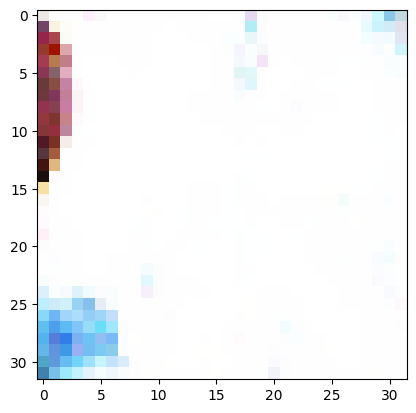

[102/500][0/936]	Loss_D: 0.0006	Loss_G: 8.3105	D(x): 1.0000	D(G(z)): 0.0006 / 0.0007
[102/500][15/936]	Loss_D: 0.0003	Loss_G: 9.9237	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[102/500][30/936]	Loss_D: 0.0510	Loss_G: 5.2429	D(x): 0.9977	D(G(z)): 0.0467 / 0.0102
[102/500][45/936]	Loss_D: 0.0079	Loss_G: 6.4871	D(x): 1.0000	D(G(z)): 0.0078 / 0.0037
[102/500][60/936]	Loss_D: 0.0188	Loss_G: 6.1455	D(x): 0.9895	D(G(z)): 0.0080 / 0.0119
[102/500][75/936]	Loss_D: 0.6078	Loss_G: 5.4893	D(x): 0.7374	D(G(z)): 0.0026 / 0.0094
[102/500][90/936]	Loss_D: 0.0183	Loss_G: 7.4757	D(x): 0.9998	D(G(z)): 0.0178 / 0.0099
[102/500][105/936]	Loss_D: 0.0103	Loss_G: 5.8033	D(x): 1.0000	D(G(z)): 0.0102 / 0.0072
[102/500][120/936]	Loss_D: 0.0004	Loss_G: 8.9484	D(x): 1.0000	D(G(z)): 0.0003 / 0.0004
[102/500][135/936]	Loss_D: 0.3501	Loss_G: 7.3617	D(x): 0.7991	D(G(z)): 0.0053 / 0.0057
[102/500][150/936]	Loss_D: 0.1183	Loss_G: 6.3163	D(x): 0.9015	D(G(z)): 0.0013 / 0.0025
[102/500][165/936]	Loss_D: 0.0394	Loss_G: 5.9746	D(

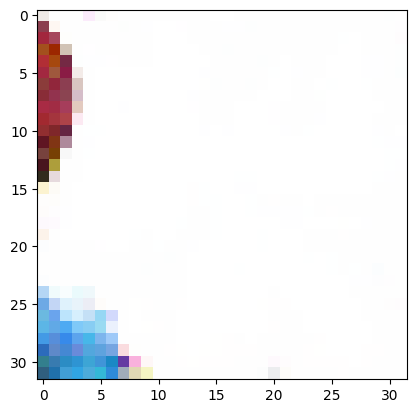

[103/500][0/936]	Loss_D: 0.0361	Loss_G: 5.6299	D(x): 1.0000	D(G(z)): 0.0351 / 0.0145
[103/500][15/936]	Loss_D: 0.6606	Loss_G: 7.9790	D(x): 0.7681	D(G(z)): 0.0473 / 0.0162
[103/500][30/936]	Loss_D: 0.0004	Loss_G: 8.7890	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[103/500][45/936]	Loss_D: 0.0016	Loss_G: 7.4146	D(x): 0.9992	D(G(z)): 0.0007 / 0.0007
[103/500][60/936]	Loss_D: 0.0323	Loss_G: 8.7903	D(x): 0.9698	D(G(z)): 0.0010 / 0.0016
[103/500][75/936]	Loss_D: 0.0121	Loss_G: 5.3807	D(x): 0.9995	D(G(z)): 0.0114 / 0.0080
[103/500][90/936]	Loss_D: 0.0010	Loss_G: 8.2382	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[103/500][105/936]	Loss_D: 0.0480	Loss_G: 7.6318	D(x): 0.9983	D(G(z)): 0.0424 / 0.0069
[103/500][120/936]	Loss_D: 0.0317	Loss_G: 6.2255	D(x): 0.9757	D(G(z)): 0.0062 / 0.0043
[103/500][135/936]	Loss_D: 0.0245	Loss_G: 6.4238	D(x): 0.9996	D(G(z)): 0.0232 / 0.0051
[103/500][150/936]	Loss_D: 0.0112	Loss_G: 5.9193	D(x): 0.9999	D(G(z)): 0.0110 / 0.0061
[103/500][165/936]	Loss_D: 0.0023	Loss_G: 7.4686	D(

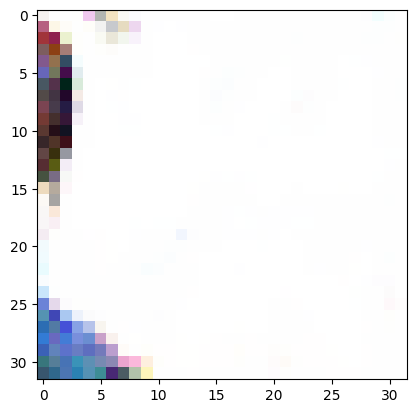

[104/500][0/936]	Loss_D: 0.0061	Loss_G: 7.3688	D(x): 0.9987	D(G(z)): 0.0048 / 0.0040
[104/500][15/936]	Loss_D: 0.0033	Loss_G: 7.9051	D(x): 0.9981	D(G(z)): 0.0014 / 0.0013
[104/500][30/936]	Loss_D: 0.1183	Loss_G: 6.2810	D(x): 0.9996	D(G(z)): 0.0957 / 0.0019
[104/500][45/936]	Loss_D: 0.0545	Loss_G: 6.6448	D(x): 1.0000	D(G(z)): 0.0501 / 0.0058
[104/500][60/936]	Loss_D: 0.0001	Loss_G: 10.5613	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[104/500][75/936]	Loss_D: 0.0057	Loss_G: 5.8688	D(x): 1.0000	D(G(z)): 0.0056 / 0.0049
[104/500][90/936]	Loss_D: 0.0391	Loss_G: 7.0715	D(x): 0.9653	D(G(z)): 0.0019 / 0.0028
[104/500][105/936]	Loss_D: 0.0624	Loss_G: 6.7807	D(x): 0.9995	D(G(z)): 0.0553 / 0.0080
[104/500][120/936]	Loss_D: 0.0016	Loss_G: 8.3421	D(x): 0.9987	D(G(z)): 0.0003 / 0.0003
[104/500][135/936]	Loss_D: 0.0014	Loss_G: 7.4375	D(x): 0.9998	D(G(z)): 0.0012 / 0.0010
[104/500][150/936]	Loss_D: 0.0008	Loss_G: 8.7521	D(x): 0.9996	D(G(z)): 0.0004 / 0.0003
[104/500][165/936]	Loss_D: 0.0616	Loss_G: 7.2819	D

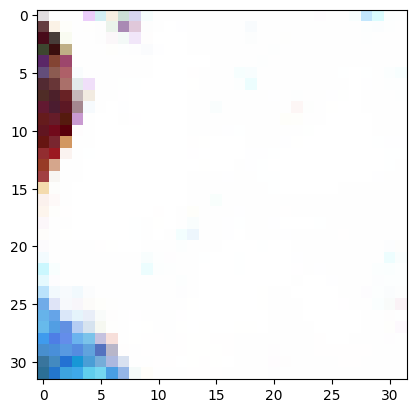

[105/500][0/936]	Loss_D: 0.2947	Loss_G: 15.9475	D(x): 0.7759	D(G(z)): 0.0000 / 0.0000
[105/500][15/936]	Loss_D: 0.0051	Loss_G: 6.4318	D(x): 0.9981	D(G(z)): 0.0032 / 0.0042
[105/500][30/936]	Loss_D: 0.0004	Loss_G: 9.5138	D(x): 0.9999	D(G(z)): 0.0004 / 0.0002
[105/500][45/936]	Loss_D: 0.0049	Loss_G: 12.0783	D(x): 0.9952	D(G(z)): 0.0001 / 0.0001
[105/500][60/936]	Loss_D: 0.0007	Loss_G: 8.0076	D(x): 0.9997	D(G(z)): 0.0005 / 0.0006
[105/500][75/936]	Loss_D: 0.1498	Loss_G: 6.8405	D(x): 0.9988	D(G(z)): 0.1145 / 0.0042
[105/500][90/936]	Loss_D: 0.0526	Loss_G: 4.8924	D(x): 0.9834	D(G(z)): 0.0343 / 0.0159
[105/500][105/936]	Loss_D: 0.0080	Loss_G: 5.9083	D(x): 1.0000	D(G(z)): 0.0080 / 0.0069
[105/500][120/936]	Loss_D: 0.0291	Loss_G: 6.4046	D(x): 0.9999	D(G(z)): 0.0278 / 0.0046
[105/500][135/936]	Loss_D: 0.0264	Loss_G: 6.3249	D(x): 0.9881	D(G(z)): 0.0140 / 0.0106
[105/500][150/936]	Loss_D: 0.0019	Loss_G: 8.9762	D(x): 0.9983	D(G(z)): 0.0003 / 0.0004
[105/500][165/936]	Loss_D: 0.0023	Loss_G: 8.6111	

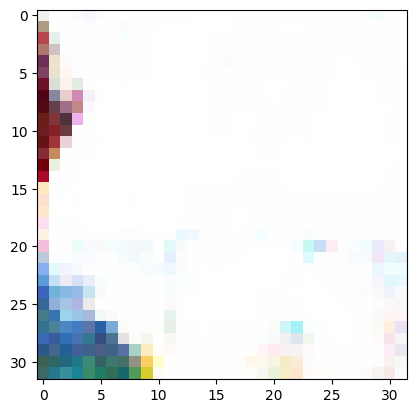

[106/500][0/936]	Loss_D: 0.0169	Loss_G: 4.6247	D(x): 0.9999	D(G(z)): 0.0166 / 0.0115
[106/500][15/936]	Loss_D: 0.0023	Loss_G: 10.5138	D(x): 0.9978	D(G(z)): 0.0001 / 0.0001
[106/500][30/936]	Loss_D: 0.0014	Loss_G: 7.7905	D(x): 0.9999	D(G(z)): 0.0013 / 0.0008
[106/500][45/936]	Loss_D: 0.0017	Loss_G: 6.5773	D(x): 0.9999	D(G(z)): 0.0016 / 0.0015
[106/500][60/936]	Loss_D: 3.1784	Loss_G: 2.7793	D(x): 0.0485	D(G(z)): 0.0010 / 0.0810
[106/500][75/936]	Loss_D: 0.0005	Loss_G: 9.6650	D(x): 0.9999	D(G(z)): 0.0004 / 0.0004
[106/500][90/936]	Loss_D: 0.7222	Loss_G: 11.0067	D(x): 0.9449	D(G(z)): 0.2327 / 0.0001
[106/500][105/936]	Loss_D: 0.0004	Loss_G: 10.2368	D(x): 0.9998	D(G(z)): 0.0002 / 0.0001
[106/500][120/936]	Loss_D: 0.0016	Loss_G: 9.6278	D(x): 0.9987	D(G(z)): 0.0003 / 0.0003
[106/500][135/936]	Loss_D: 0.0447	Loss_G: 7.7629	D(x): 0.9573	D(G(z)): 0.0008 / 0.0009
[106/500][150/936]	Loss_D: 0.0011	Loss_G: 7.1263	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[106/500][165/936]	Loss_D: 0.0030	Loss_G: 9.4414

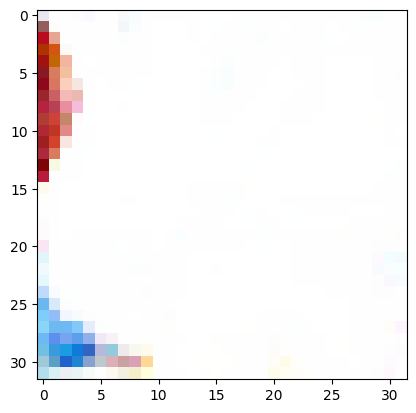

[107/500][0/936]	Loss_D: 0.0058	Loss_G: 5.9502	D(x): 0.9994	D(G(z)): 0.0052 / 0.0044
[107/500][15/936]	Loss_D: 0.0478	Loss_G: 6.8609	D(x): 0.9555	D(G(z)): 0.0014 / 0.0021
[107/500][30/936]	Loss_D: 0.0008	Loss_G: 9.2278	D(x): 0.9994	D(G(z)): 0.0002 / 0.0002
[107/500][45/936]	Loss_D: 0.0039	Loss_G: 6.5908	D(x): 0.9999	D(G(z)): 0.0038 / 0.0032
[107/500][60/936]	Loss_D: 0.6466	Loss_G: 9.9263	D(x): 1.0000	D(G(z)): 0.4075 / 0.0009
[107/500][75/936]	Loss_D: 0.0170	Loss_G: 6.5549	D(x): 0.9978	D(G(z)): 0.0144 / 0.0039
[107/500][90/936]	Loss_D: 0.0058	Loss_G: 7.7598	D(x): 0.9986	D(G(z)): 0.0044 / 0.0037
[107/500][105/936]	Loss_D: 0.0058	Loss_G: 7.3790	D(x): 0.9999	D(G(z)): 0.0056 / 0.0042
[107/500][120/936]	Loss_D: 0.0067	Loss_G: 5.5766	D(x): 1.0000	D(G(z)): 0.0066 / 0.0058
[107/500][135/936]	Loss_D: 0.0017	Loss_G: 8.6609	D(x): 0.9993	D(G(z)): 0.0009 / 0.0008
[107/500][150/936]	Loss_D: 0.0071	Loss_G: 6.8152	D(x): 0.9997	D(G(z)): 0.0068 / 0.0056
[107/500][165/936]	Loss_D: 0.0412	Loss_G: 5.6527	D(

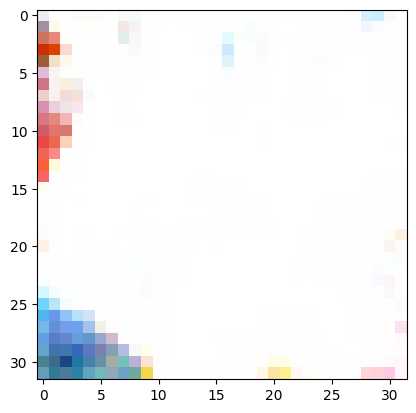

[108/500][0/936]	Loss_D: 0.0277	Loss_G: 5.0345	D(x): 0.9996	D(G(z)): 0.0267 / 0.0116
[108/500][15/936]	Loss_D: 0.0018	Loss_G: 6.8768	D(x): 1.0000	D(G(z)): 0.0018 / 0.0017
[108/500][30/936]	Loss_D: 0.0144	Loss_G: 7.5468	D(x): 0.9936	D(G(z)): 0.0079 / 0.0070
[108/500][45/936]	Loss_D: 0.0005	Loss_G: 10.8216	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[108/500][60/936]	Loss_D: 0.0228	Loss_G: 5.9551	D(x): 0.9999	D(G(z)): 0.0219 / 0.0130
[108/500][75/936]	Loss_D: 0.0104	Loss_G: 7.3706	D(x): 1.0000	D(G(z)): 0.0102 / 0.0063
[108/500][90/936]	Loss_D: 0.0020	Loss_G: 9.5339	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[108/500][105/936]	Loss_D: 0.0007	Loss_G: 9.8369	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[108/500][120/936]	Loss_D: 0.0004	Loss_G: 8.7337	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[108/500][135/936]	Loss_D: 0.0414	Loss_G: 5.3162	D(x): 0.9775	D(G(z)): 0.0176 / 0.0090
[108/500][150/936]	Loss_D: 0.0028	Loss_G: 6.6732	D(x): 0.9998	D(G(z)): 0.0026 / 0.0029
[108/500][165/936]	Loss_D: 0.0030	Loss_G: 8.0408	D

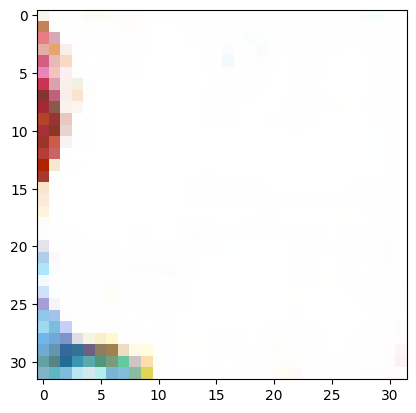

[109/500][0/936]	Loss_D: 0.2198	Loss_G: 6.6441	D(x): 1.0000	D(G(z)): 0.1709 / 0.0039
[109/500][15/936]	Loss_D: 0.0005	Loss_G: 11.2966	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[109/500][30/936]	Loss_D: 0.0086	Loss_G: 6.4459	D(x): 1.0000	D(G(z)): 0.0085 / 0.0053
[109/500][45/936]	Loss_D: 0.0016	Loss_G: 7.0858	D(x): 1.0000	D(G(z)): 0.0016 / 0.0014
[109/500][60/936]	Loss_D: 0.0084	Loss_G: 6.1408	D(x): 0.9999	D(G(z)): 0.0083 / 0.0067
[109/500][75/936]	Loss_D: 0.0011	Loss_G: 8.0950	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[109/500][90/936]	Loss_D: 0.0962	Loss_G: 6.4811	D(x): 0.9988	D(G(z)): 0.0800 / 0.0157
[109/500][105/936]	Loss_D: 0.0001	Loss_G: 10.7560	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[109/500][120/936]	Loss_D: 0.0025	Loss_G: 7.7664	D(x): 0.9986	D(G(z)): 0.0011 / 0.0010
[109/500][135/936]	Loss_D: 0.0035	Loss_G: 7.1499	D(x): 0.9996	D(G(z)): 0.0030 / 0.0026
[109/500][150/936]	Loss_D: 0.0047	Loss_G: 6.8607	D(x): 0.9999	D(G(z)): 0.0045 / 0.0050
[109/500][165/936]	Loss_D: 0.0003	Loss_G: 9.5606	

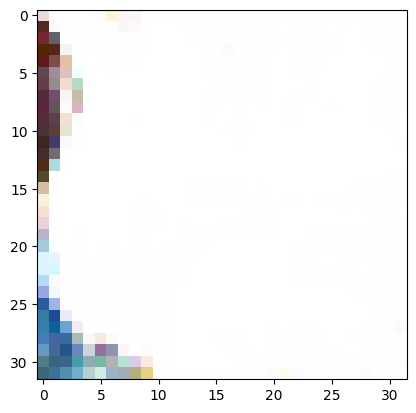

[110/500][0/936]	Loss_D: 0.0012	Loss_G: 9.2595	D(x): 0.9992	D(G(z)): 0.0004 / 0.0004
[110/500][15/936]	Loss_D: 0.0539	Loss_G: 8.7242	D(x): 1.0000	D(G(z)): 0.0487 / 0.0007
[110/500][30/936]	Loss_D: 0.1065	Loss_G: 5.9412	D(x): 1.0000	D(G(z)): 0.0993 / 0.0057
[110/500][45/936]	Loss_D: 0.0004	Loss_G: 8.9874	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[110/500][60/936]	Loss_D: 0.0007	Loss_G: 9.4317	D(x): 0.9995	D(G(z)): 0.0002 / 0.0002
[110/500][75/936]	Loss_D: 0.0064	Loss_G: 8.1396	D(x): 0.9950	D(G(z)): 0.0014 / 0.0014
[110/500][90/936]	Loss_D: 0.0052	Loss_G: 6.2067	D(x): 1.0000	D(G(z)): 0.0052 / 0.0042
[110/500][105/936]	Loss_D: 0.0014	Loss_G: 7.6774	D(x): 0.9999	D(G(z)): 0.0013 / 0.0013
[110/500][120/936]	Loss_D: 0.0026	Loss_G: 10.2505	D(x): 0.9981	D(G(z)): 0.0007 / 0.0007
[110/500][135/936]	Loss_D: 0.0020	Loss_G: 6.4378	D(x): 1.0000	D(G(z)): 0.0020 / 0.0019
[110/500][150/936]	Loss_D: 0.4319	Loss_G: 12.2281	D(x): 1.0000	D(G(z)): 0.2082 / 0.0004
[110/500][165/936]	Loss_D: 0.0104	Loss_G: 7.8427	

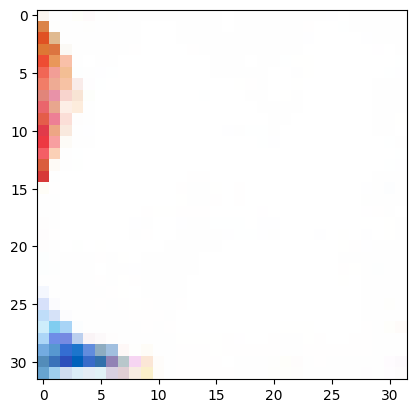

[111/500][0/936]	Loss_D: 0.0002	Loss_G: 10.0077	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[111/500][15/936]	Loss_D: 0.0020	Loss_G: 8.0001	D(x): 0.9992	D(G(z)): 0.0012 / 0.0012
[111/500][30/936]	Loss_D: 0.0038	Loss_G: 7.3278	D(x): 0.9973	D(G(z)): 0.0011 / 0.0010
[111/500][45/936]	Loss_D: 0.0009	Loss_G: 7.3758	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[111/500][60/936]	Loss_D: 0.0230	Loss_G: 6.6349	D(x): 0.9789	D(G(z)): 0.0015 / 0.0017
[111/500][75/936]	Loss_D: 0.0041	Loss_G: 8.1749	D(x): 0.9965	D(G(z)): 0.0005 / 0.0005
[111/500][90/936]	Loss_D: 0.0012	Loss_G: 8.1796	D(x): 0.9997	D(G(z)): 0.0009 / 0.0009
[111/500][105/936]	Loss_D: 0.0006	Loss_G: 8.0614	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[111/500][120/936]	Loss_D: 0.0159	Loss_G: 5.1494	D(x): 0.9936	D(G(z)): 0.0095 / 0.0076
[111/500][135/936]	Loss_D: 0.0067	Loss_G: 5.8498	D(x): 0.9999	D(G(z)): 0.0065 / 0.0054
[111/500][150/936]	Loss_D: 0.0030	Loss_G: 7.3569	D(x): 0.9982	D(G(z)): 0.0012 / 0.0011
[111/500][165/936]	Loss_D: 0.0001	Loss_G: 10.7148	

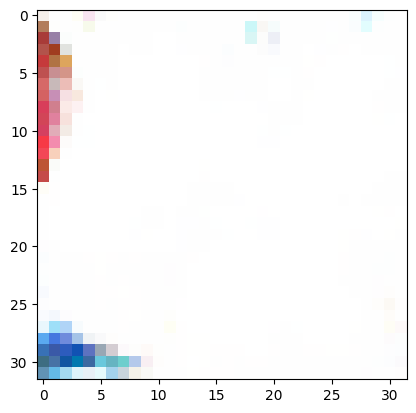

[112/500][0/936]	Loss_D: 0.0107	Loss_G: 6.8370	D(x): 0.9985	D(G(z)): 0.0091 / 0.0063
[112/500][15/936]	Loss_D: 0.0017	Loss_G: 13.6184	D(x): 0.9983	D(G(z)): 0.0000 / 0.0000
[112/500][30/936]	Loss_D: 0.0002	Loss_G: 9.2469	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[112/500][45/936]	Loss_D: 0.0069	Loss_G: 8.9655	D(x): 0.9945	D(G(z)): 0.0014 / 0.0013
[112/500][60/936]	Loss_D: 0.0021	Loss_G: 7.9313	D(x): 0.9998	D(G(z)): 0.0019 / 0.0018
[112/500][75/936]	Loss_D: 0.0345	Loss_G: 6.9504	D(x): 0.9716	D(G(z)): 0.0048 / 0.0036
[112/500][90/936]	Loss_D: 0.0149	Loss_G: 4.8451	D(x): 0.9998	D(G(z)): 0.0145 / 0.0098
[112/500][105/936]	Loss_D: 0.0108	Loss_G: 6.9644	D(x): 0.9929	D(G(z)): 0.0037 / 0.0035
[112/500][120/936]	Loss_D: 0.0008	Loss_G: 9.9685	D(x): 0.9993	D(G(z)): 0.0001 / 0.0001
[112/500][135/936]	Loss_D: 0.0010	Loss_G: 7.6139	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[112/500][150/936]	Loss_D: 0.0004	Loss_G: 8.2129	D(x): 0.9999	D(G(z)): 0.0003 / 0.0004
[112/500][165/936]	Loss_D: 0.0018	Loss_G: 8.0499	D

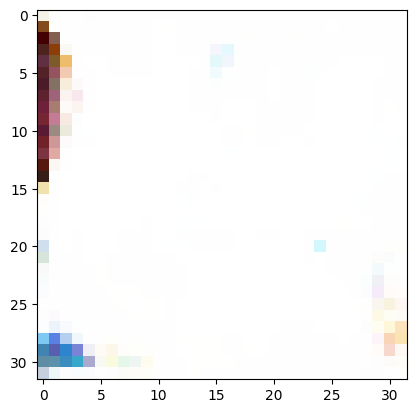

[113/500][0/936]	Loss_D: 0.0001	Loss_G: 11.5355	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[113/500][15/936]	Loss_D: 0.0143	Loss_G: 8.2955	D(x): 0.9867	D(G(z)): 0.0007 / 0.0007
[113/500][30/936]	Loss_D: 0.0403	Loss_G: 7.2237	D(x): 0.9646	D(G(z)): 0.0025 / 0.0030
[113/500][45/936]	Loss_D: 0.0059	Loss_G: 5.7045	D(x): 0.9994	D(G(z)): 0.0053 / 0.0041
[113/500][60/936]	Loss_D: 0.0003	Loss_G: 10.0035	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[113/500][75/936]	Loss_D: 0.0002	Loss_G: 9.7662	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[113/500][90/936]	Loss_D: 0.0026	Loss_G: 6.4849	D(x): 1.0000	D(G(z)): 0.0026 / 0.0022
[113/500][105/936]	Loss_D: 0.0131	Loss_G: 5.7622	D(x): 1.0000	D(G(z)): 0.0128 / 0.0068
[113/500][120/936]	Loss_D: 0.0058	Loss_G: 7.9181	D(x): 0.9948	D(G(z)): 0.0007 / 0.0007
[113/500][135/936]	Loss_D: 0.0018	Loss_G: 10.1247	D(x): 0.9984	D(G(z)): 0.0002 / 0.0002
[113/500][150/936]	Loss_D: 0.0055	Loss_G: 6.9871	D(x): 0.9987	D(G(z)): 0.0042 / 0.0036
[113/500][165/936]	Loss_D: 0.0000	Loss_G: 11.478

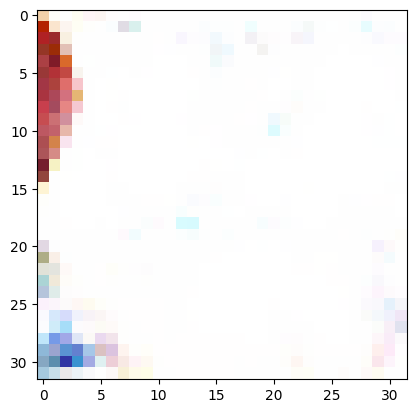

[114/500][0/936]	Loss_D: 0.0080	Loss_G: 6.0912	D(x): 0.9998	D(G(z)): 0.0077 / 0.0059
[114/500][15/936]	Loss_D: 0.0011	Loss_G: 7.5473	D(x): 0.9995	D(G(z)): 0.0006 / 0.0007
[114/500][30/936]	Loss_D: 0.0017	Loss_G: 6.8566	D(x): 1.0000	D(G(z)): 0.0016 / 0.0016
[114/500][45/936]	Loss_D: 0.0274	Loss_G: 5.7711	D(x): 1.0000	D(G(z)): 0.0265 / 0.0081
[114/500][60/936]	Loss_D: 0.0064	Loss_G: 6.6387	D(x): 0.9997	D(G(z)): 0.0060 / 0.0042
[114/500][75/936]	Loss_D: 0.0009	Loss_G: 8.6749	D(x): 0.9996	D(G(z)): 0.0005 / 0.0005
[114/500][90/936]	Loss_D: 0.0011	Loss_G: 7.8934	D(x): 1.0000	D(G(z)): 0.0011 / 0.0011
[114/500][105/936]	Loss_D: 0.0012	Loss_G: 11.2755	D(x): 0.9993	D(G(z)): 0.0006 / 0.0005
[114/500][120/936]	Loss_D: 0.0009	Loss_G: 7.2844	D(x): 0.9999	D(G(z)): 0.0007 / 0.0007
[114/500][135/936]	Loss_D: 0.0069	Loss_G: 7.2593	D(x): 0.9986	D(G(z)): 0.0054 / 0.0021
[114/500][150/936]	Loss_D: 0.0022	Loss_G: 6.7468	D(x): 1.0000	D(G(z)): 0.0022 / 0.0017
[114/500][165/936]	Loss_D: 0.0046	Loss_G: 6.1038	D

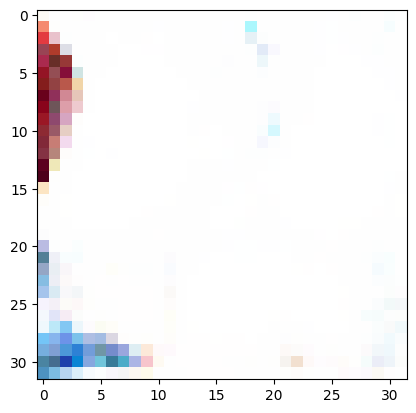

[115/500][0/936]	Loss_D: 0.0069	Loss_G: 6.3867	D(x): 1.0000	D(G(z)): 0.0068 / 0.0049
[115/500][15/936]	Loss_D: 0.0039	Loss_G: 9.7663	D(x): 0.9966	D(G(z)): 0.0004 / 0.0003
[115/500][30/936]	Loss_D: 0.0014	Loss_G: 9.9152	D(x): 0.9990	D(G(z)): 0.0004 / 0.0004
[115/500][45/936]	Loss_D: 0.0048	Loss_G: 6.2661	D(x): 1.0000	D(G(z)): 0.0048 / 0.0041
[115/500][60/936]	Loss_D: 0.0068	Loss_G: 7.1239	D(x): 0.9998	D(G(z)): 0.0066 / 0.0050
[115/500][75/936]	Loss_D: 0.0097	Loss_G: 6.0309	D(x): 1.0000	D(G(z)): 0.0096 / 0.0064
[115/500][90/936]	Loss_D: 0.0084	Loss_G: 5.8820	D(x): 0.9991	D(G(z)): 0.0075 / 0.0052
[115/500][105/936]	Loss_D: 0.0256	Loss_G: 10.2760	D(x): 0.9751	D(G(z)): 0.0001 / 0.0001
[115/500][120/936]	Loss_D: 0.0042	Loss_G: 8.3061	D(x): 0.9984	D(G(z)): 0.0026 / 0.0026
[115/500][135/936]	Loss_D: 0.0041	Loss_G: 6.4049	D(x): 1.0000	D(G(z)): 0.0041 / 0.0035
[115/500][150/936]	Loss_D: 0.0025	Loss_G: 6.8707	D(x): 0.9999	D(G(z)): 0.0024 / 0.0021
[115/500][165/936]	Loss_D: 0.0015	Loss_G: 7.6071	D

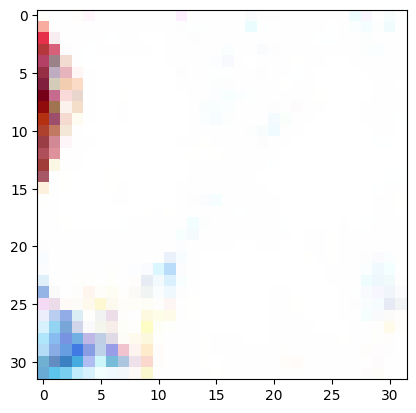

[116/500][0/936]	Loss_D: 0.0232	Loss_G: 6.0029	D(x): 0.9998	D(G(z)): 0.0221 / 0.0084
[116/500][15/936]	Loss_D: 0.0008	Loss_G: 8.9702	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[116/500][30/936]	Loss_D: 0.0049	Loss_G: 5.7158	D(x): 0.9999	D(G(z)): 0.0049 / 0.0045
[116/500][45/936]	Loss_D: 0.0014	Loss_G: 6.6657	D(x): 0.9998	D(G(z)): 0.0011 / 0.0013
[116/500][60/936]	Loss_D: 0.0006	Loss_G: 10.1137	D(x): 0.9997	D(G(z)): 0.0004 / 0.0002
[116/500][75/936]	Loss_D: 0.0022	Loss_G: 7.4204	D(x): 0.9998	D(G(z)): 0.0020 / 0.0014
[116/500][90/936]	Loss_D: 0.0055	Loss_G: 10.5135	D(x): 0.9949	D(G(z)): 0.0003 / 0.0002
[116/500][105/936]	Loss_D: 0.0003	Loss_G: 8.9041	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[116/500][120/936]	Loss_D: 0.0001	Loss_G: 9.0727	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[116/500][135/936]	Loss_D: 0.1628	Loss_G: 6.2096	D(x): 1.0000	D(G(z)): 0.1254 / 0.0025
[116/500][150/936]	Loss_D: 0.0144	Loss_G: 5.7295	D(x): 1.0000	D(G(z)): 0.0142 / 0.0083
[116/500][165/936]	Loss_D: 0.0033	Loss_G: 6.1722	

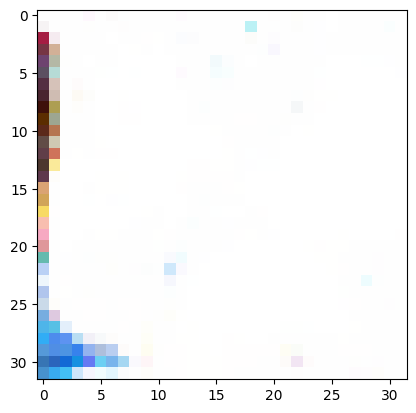

[117/500][0/936]	Loss_D: 0.0024	Loss_G: 9.4482	D(x): 0.9979	D(G(z)): 0.0003 / 0.0004
[117/500][15/936]	Loss_D: 0.0001	Loss_G: 10.6402	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[117/500][30/936]	Loss_D: 0.0051	Loss_G: 6.6692	D(x): 0.9999	D(G(z)): 0.0050 / 0.0050
[117/500][45/936]	Loss_D: 0.0007	Loss_G: 7.9714	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[117/500][60/936]	Loss_D: 0.0013	Loss_G: 10.5574	D(x): 0.9988	D(G(z)): 0.0001 / 0.0001
[117/500][75/936]	Loss_D: 0.0078	Loss_G: 9.5712	D(x): 0.9925	D(G(z)): 0.0002 / 0.0002
[117/500][90/936]	Loss_D: 0.0060	Loss_G: 7.6244	D(x): 0.9962	D(G(z)): 0.0022 / 0.0022
[117/500][105/936]	Loss_D: 0.0145	Loss_G: 5.0878	D(x): 1.0000	D(G(z)): 0.0144 / 0.0112
[117/500][120/936]	Loss_D: 0.0328	Loss_G: 7.0772	D(x): 0.9702	D(G(z)): 0.0016 / 0.0019
[117/500][135/936]	Loss_D: 0.0025	Loss_G: 8.3983	D(x): 0.9995	D(G(z)): 0.0020 / 0.0018
[117/500][150/936]	Loss_D: 0.0027	Loss_G: 9.7188	D(x): 0.9979	D(G(z)): 0.0006 / 0.0005
[117/500][165/936]	Loss_D: 0.1664	Loss_G: 5.2598	

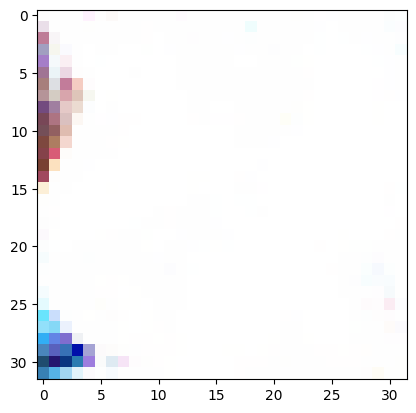

[118/500][0/936]	Loss_D: 0.0313	Loss_G: 5.3040	D(x): 1.0000	D(G(z)): 0.0299 / 0.0084
[118/500][15/936]	Loss_D: 0.0076	Loss_G: 7.8492	D(x): 0.9995	D(G(z)): 0.0070 / 0.0039
[118/500][30/936]	Loss_D: 0.0002	Loss_G: 10.4774	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[118/500][45/936]	Loss_D: 0.0303	Loss_G: 7.3002	D(x): 0.9716	D(G(z)): 0.0009 / 0.0011
[118/500][60/936]	Loss_D: 0.0111	Loss_G: 6.3679	D(x): 1.0000	D(G(z)): 0.0109 / 0.0067
[118/500][75/936]	Loss_D: 0.0037	Loss_G: 6.1447	D(x): 1.0000	D(G(z)): 0.0037 / 0.0030
[118/500][90/936]	Loss_D: 0.0025	Loss_G: 9.3095	D(x): 0.9999	D(G(z)): 0.0024 / 0.0019
[118/500][105/936]	Loss_D: 0.0826	Loss_G: 5.6944	D(x): 1.0000	D(G(z)): 0.0766 / 0.0060
[118/500][120/936]	Loss_D: 0.0090	Loss_G: 9.9400	D(x): 0.9921	D(G(z)): 0.0011 / 0.0003
[118/500][135/936]	Loss_D: 0.0016	Loss_G: 6.8812	D(x): 1.0000	D(G(z)): 0.0016 / 0.0012
[118/500][150/936]	Loss_D: 0.0012	Loss_G: 9.6498	D(x): 0.9989	D(G(z)): 0.0001 / 0.0001
[118/500][165/936]	Loss_D: 0.0029	Loss_G: 7.0099	D

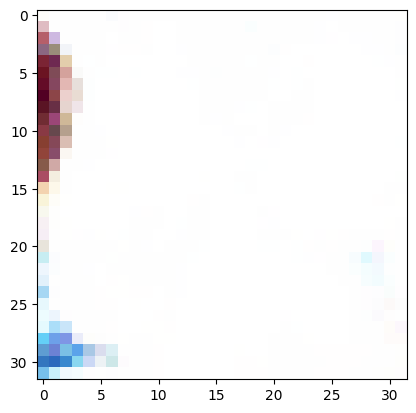

[119/500][0/936]	Loss_D: 0.0141	Loss_G: 6.0429	D(x): 0.9999	D(G(z)): 0.0136 / 0.0096
[119/500][15/936]	Loss_D: 0.0054	Loss_G: 6.2035	D(x): 1.0000	D(G(z)): 0.0053 / 0.0039
[119/500][30/936]	Loss_D: 0.0037	Loss_G: 6.0896	D(x): 1.0000	D(G(z)): 0.0037 / 0.0031
[119/500][45/936]	Loss_D: 0.0005	Loss_G: 9.1516	D(x): 0.9998	D(G(z)): 0.0003 / 0.0003
[119/500][60/936]	Loss_D: 0.1344	Loss_G: 7.3217	D(x): 0.8906	D(G(z)): 0.0034 / 0.0080
[119/500][75/936]	Loss_D: 0.0510	Loss_G: 7.6325	D(x): 1.0000	D(G(z)): 0.0465 / 0.0009
[119/500][90/936]	Loss_D: 0.0027	Loss_G: 7.7768	D(x): 0.9979	D(G(z)): 0.0006 / 0.0007
[119/500][105/936]	Loss_D: 0.0099	Loss_G: 5.1600	D(x): 0.9999	D(G(z)): 0.0097 / 0.0072
[119/500][120/936]	Loss_D: 0.0066	Loss_G: 6.0535	D(x): 1.0000	D(G(z)): 0.0065 / 0.0051
[119/500][135/936]	Loss_D: 0.0002	Loss_G: 9.8633	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[119/500][150/936]	Loss_D: 0.0024	Loss_G: 9.2269	D(x): 0.9978	D(G(z)): 0.0002 / 0.0002
[119/500][165/936]	Loss_D: 0.0840	Loss_G: 7.0397	D(

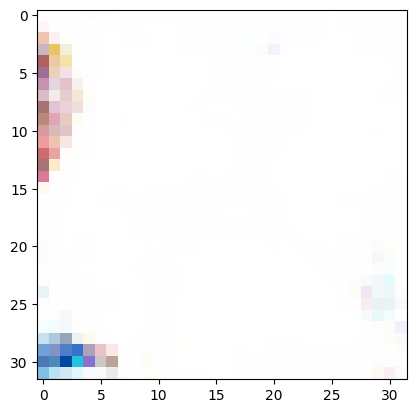

[120/500][0/936]	Loss_D: 0.0207	Loss_G: 5.4749	D(x): 1.0000	D(G(z)): 0.0202 / 0.0068
[120/500][15/936]	Loss_D: 0.0019	Loss_G: 8.8839	D(x): 0.9999	D(G(z)): 0.0018 / 0.0014
[120/500][30/936]	Loss_D: 0.0167	Loss_G: 5.0928	D(x): 0.9999	D(G(z)): 0.0163 / 0.0084
[120/500][45/936]	Loss_D: 0.0004	Loss_G: 8.1429	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[120/500][60/936]	Loss_D: 0.0003	Loss_G: 8.5571	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[120/500][75/936]	Loss_D: 0.0057	Loss_G: 10.0888	D(x): 0.9944	D(G(z)): 0.0001 / 0.0001
[120/500][90/936]	Loss_D: 0.0972	Loss_G: 6.7175	D(x): 0.9999	D(G(z)): 0.0838 / 0.0067
[120/500][105/936]	Loss_D: 0.0032	Loss_G: 5.9752	D(x): 1.0000	D(G(z)): 0.0032 / 0.0055
[120/500][120/936]	Loss_D: 0.0633	Loss_G: 6.9803	D(x): 0.9994	D(G(z)): 0.0563 / 0.0021
[120/500][135/936]	Loss_D: 0.0002	Loss_G: 10.2603	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[120/500][150/936]	Loss_D: 0.0019	Loss_G: 8.9672	D(x): 0.9984	D(G(z)): 0.0003 / 0.0003
[120/500][165/936]	Loss_D: 0.0012	Loss_G: 10.0997

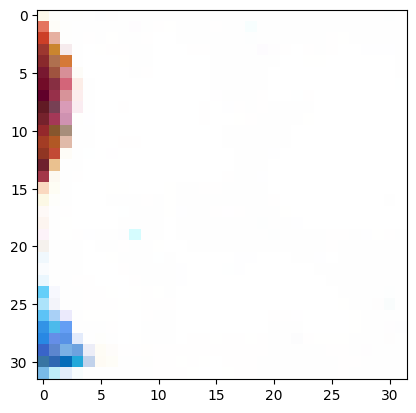

[121/500][0/936]	Loss_D: 0.0010	Loss_G: 9.2464	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[121/500][15/936]	Loss_D: 0.0035	Loss_G: 6.7430	D(x): 0.9994	D(G(z)): 0.0030 / 0.0024
[121/500][30/936]	Loss_D: 0.0015	Loss_G: 7.5290	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[121/500][45/936]	Loss_D: 0.0020	Loss_G: 8.7070	D(x): 0.9999	D(G(z)): 0.0018 / 0.0017
[121/500][60/936]	Loss_D: 0.0009	Loss_G: 8.5024	D(x): 0.9997	D(G(z)): 0.0006 / 0.0006
[121/500][75/936]	Loss_D: 0.0007	Loss_G: 7.6964	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[121/500][90/936]	Loss_D: 0.0005	Loss_G: 9.6038	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[121/500][105/936]	Loss_D: 0.0023	Loss_G: 8.0364	D(x): 1.0000	D(G(z)): 0.0023 / 0.0018
[121/500][120/936]	Loss_D: 0.0038	Loss_G: 7.7756	D(x): 0.9982	D(G(z)): 0.0020 / 0.0019
[121/500][135/936]	Loss_D: 0.0106	Loss_G: 5.2825	D(x): 1.0000	D(G(z)): 0.0105 / 0.0072
[121/500][150/936]	Loss_D: 0.0067	Loss_G: 7.1600	D(x): 0.9950	D(G(z)): 0.0016 / 0.0016
[121/500][165/936]	Loss_D: 0.0010	Loss_G: 10.2421	D

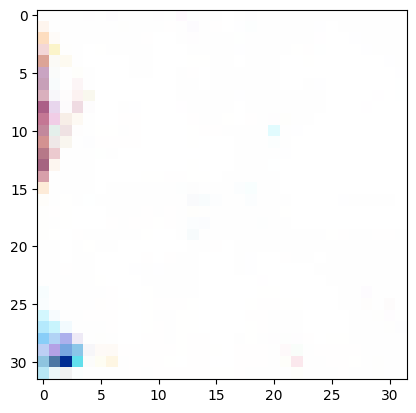

[122/500][0/936]	Loss_D: 0.0011	Loss_G: 7.2941	D(x): 0.9999	D(G(z)): 0.0010 / 0.0009
[122/500][15/936]	Loss_D: 0.0063	Loss_G: 6.1537	D(x): 0.9997	D(G(z)): 0.0060 / 0.0041
[122/500][30/936]	Loss_D: 0.0008	Loss_G: 7.4385	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[122/500][45/936]	Loss_D: 0.0016	Loss_G: 7.1770	D(x): 1.0000	D(G(z)): 0.0016 / 0.0017
[122/500][60/936]	Loss_D: 0.0011	Loss_G: 8.5362	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[122/500][75/936]	Loss_D: 0.0021	Loss_G: 7.7674	D(x): 0.9993	D(G(z)): 0.0014 / 0.0013
[122/500][90/936]	Loss_D: 0.0075	Loss_G: 6.1421	D(x): 0.9999	D(G(z)): 0.0074 / 0.0067
[122/500][105/936]	Loss_D: 0.0065	Loss_G: 5.7270	D(x): 0.9990	D(G(z)): 0.0055 / 0.0045
[122/500][120/936]	Loss_D: 0.0004	Loss_G: 8.5252	D(x): 0.9998	D(G(z)): 0.0002 / 0.0002
[122/500][135/936]	Loss_D: 0.0019	Loss_G: 8.4875	D(x): 1.0000	D(G(z)): 0.0018 / 0.0018
[122/500][150/936]	Loss_D: 0.0029	Loss_G: 6.4382	D(x): 1.0000	D(G(z)): 0.0029 / 0.0029
[122/500][165/936]	Loss_D: 0.0001	Loss_G: 10.2917	D

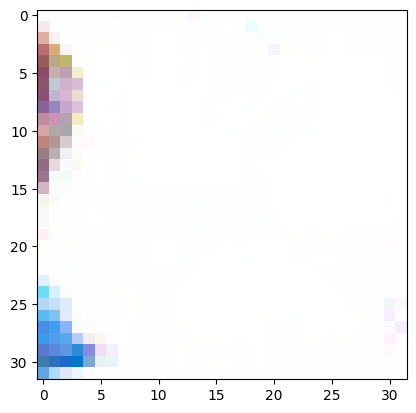

[123/500][0/936]	Loss_D: 0.0029	Loss_G: 7.9379	D(x): 0.9994	D(G(z)): 0.0023 / 0.0018
[123/500][15/936]	Loss_D: 0.0014	Loss_G: 7.4525	D(x): 0.9995	D(G(z)): 0.0009 / 0.0011
[123/500][30/936]	Loss_D: 0.0003	Loss_G: 8.6895	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[123/500][45/936]	Loss_D: 0.0049	Loss_G: 7.8852	D(x): 1.0000	D(G(z)): 0.0049 / 0.0040
[123/500][60/936]	Loss_D: 0.0598	Loss_G: 11.1783	D(x): 0.9462	D(G(z)): 0.0000 / 0.0000
[123/500][75/936]	Loss_D: 0.0011	Loss_G: 7.5612	D(x): 0.9997	D(G(z)): 0.0008 / 0.0008
[123/500][90/936]	Loss_D: 0.0006	Loss_G: 9.1783	D(x): 1.0000	D(G(z)): 0.0005 / 0.0006
[123/500][105/936]	Loss_D: 0.0102	Loss_G: 7.0199	D(x): 1.0000	D(G(z)): 0.0101 / 0.0070
[123/500][120/936]	Loss_D: 0.0005	Loss_G: 8.2350	D(x): 0.9998	D(G(z)): 0.0003 / 0.0003
[123/500][135/936]	Loss_D: 0.0006	Loss_G: 8.2642	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[123/500][150/936]	Loss_D: 0.0000	Loss_G: 12.4911	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[123/500][165/936]	Loss_D: 0.0021	Loss_G: 9.1922	

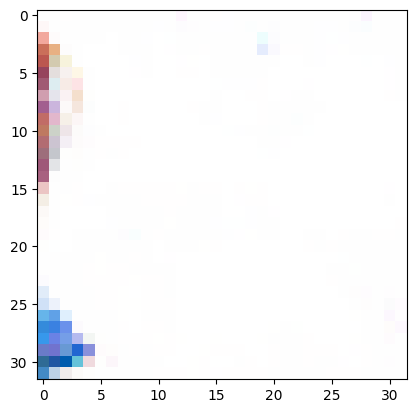

[124/500][0/936]	Loss_D: 0.0168	Loss_G: 5.6490	D(x): 0.9941	D(G(z)): 0.0108 / 0.0075
[124/500][15/936]	Loss_D: 0.0226	Loss_G: 5.4432	D(x): 0.9999	D(G(z)): 0.0220 / 0.0112
[124/500][30/936]	Loss_D: 0.0004	Loss_G: 9.7417	D(x): 0.9998	D(G(z)): 0.0002 / 0.0001
[124/500][45/936]	Loss_D: 0.0026	Loss_G: 7.6334	D(x): 1.0000	D(G(z)): 0.0026 / 0.0027
[124/500][60/936]	Loss_D: 0.0009	Loss_G: 10.1806	D(x): 1.0000	D(G(z)): 0.0009 / 0.0012
[124/500][75/936]	Loss_D: 0.0001	Loss_G: 9.3442	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[124/500][90/936]	Loss_D: 0.4673	Loss_G: 13.1425	D(x): 0.9983	D(G(z)): 0.2125 / 0.0000
[124/500][105/936]	Loss_D: 0.0001	Loss_G: 11.6015	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[124/500][120/936]	Loss_D: 0.0022	Loss_G: 8.1284	D(x): 0.9982	D(G(z)): 0.0004 / 0.0007
[124/500][135/936]	Loss_D: 0.0003	Loss_G: 10.8817	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[124/500][150/936]	Loss_D: 0.0004	Loss_G: 10.6979	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[124/500][165/936]	Loss_D: 0.0161	Loss_G: 6.62

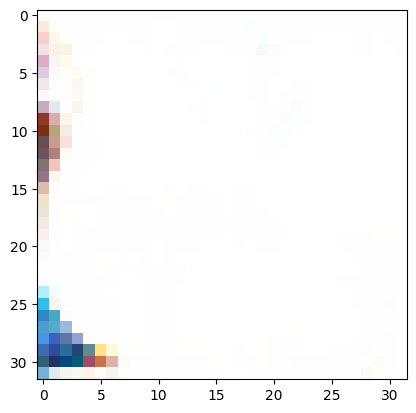

[125/500][0/936]	Loss_D: 0.0036	Loss_G: 7.9840	D(x): 0.9996	D(G(z)): 0.0032 / 0.0026
[125/500][15/936]	Loss_D: 0.0071	Loss_G: 9.8997	D(x): 0.9931	D(G(z)): 0.0001 / 0.0001
[125/500][30/936]	Loss_D: 0.0003	Loss_G: 9.9340	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[125/500][45/936]	Loss_D: 0.0795	Loss_G: 6.5525	D(x): 0.9288	D(G(z)): 0.0024 / 0.0064
[125/500][60/936]	Loss_D: 0.3508	Loss_G: 6.2538	D(x): 0.7904	D(G(z)): 0.0003 / 0.0024
[125/500][75/936]	Loss_D: 0.0025	Loss_G: 8.1058	D(x): 0.9989	D(G(z)): 0.0015 / 0.0013
[125/500][90/936]	Loss_D: 0.0004	Loss_G: 9.3358	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[125/500][105/936]	Loss_D: 0.0332	Loss_G: 6.0016	D(x): 1.0000	D(G(z)): 0.0323 / 0.0077
[125/500][120/936]	Loss_D: 0.0011	Loss_G: 9.7607	D(x): 0.9990	D(G(z)): 0.0001 / 0.0001
[125/500][135/936]	Loss_D: 0.0001	Loss_G: 9.6769	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[125/500][150/936]	Loss_D: 0.0008	Loss_G: 8.6024	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[125/500][165/936]	Loss_D: 0.0014	Loss_G: 9.9384	D(

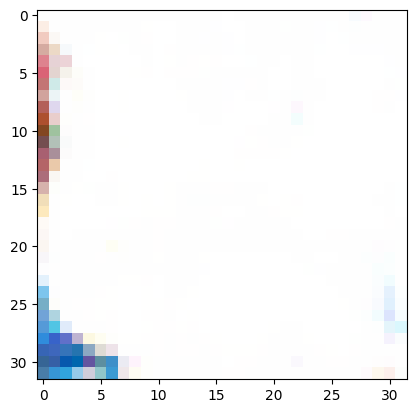

[126/500][0/936]	Loss_D: 0.0003	Loss_G: 8.6943	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[126/500][15/936]	Loss_D: 0.0037	Loss_G: 8.2587	D(x): 0.9980	D(G(z)): 0.0017 / 0.0013
[126/500][30/936]	Loss_D: 0.0157	Loss_G: 6.2393	D(x): 0.9991	D(G(z)): 0.0145 / 0.0040
[126/500][45/936]	Loss_D: 0.0018	Loss_G: 7.6658	D(x): 0.9999	D(G(z)): 0.0017 / 0.0019
[126/500][60/936]	Loss_D: 0.0061	Loss_G: 5.1703	D(x): 0.9963	D(G(z)): 0.0023 / 0.0121
[126/500][75/936]	Loss_D: 0.0031	Loss_G: 7.2856	D(x): 0.9999	D(G(z)): 0.0030 / 0.0025
[126/500][90/936]	Loss_D: 0.0007	Loss_G: 8.1006	D(x): 0.9998	D(G(z)): 0.0005 / 0.0005
[126/500][105/936]	Loss_D: 0.0002	Loss_G: 9.3415	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[126/500][120/936]	Loss_D: 0.0006	Loss_G: 9.9680	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[126/500][135/936]	Loss_D: 0.0086	Loss_G: 11.0607	D(x): 0.9915	D(G(z)): 0.0001 / 0.0001
[126/500][150/936]	Loss_D: 0.0075	Loss_G: 5.5130	D(x): 0.9979	D(G(z)): 0.0053 / 0.0043
[126/500][165/936]	Loss_D: 0.0473	Loss_G: 6.3930	D

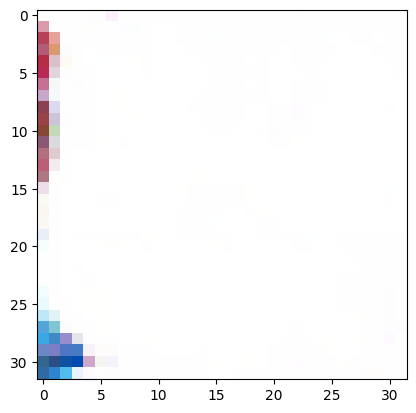

[127/500][0/936]	Loss_D: 0.0013	Loss_G: 10.4550	D(x): 0.9990	D(G(z)): 0.0004 / 0.0004
[127/500][15/936]	Loss_D: 0.0097	Loss_G: 9.9793	D(x): 0.9905	D(G(z)): 0.0001 / 0.0001
[127/500][30/936]	Loss_D: 0.0008	Loss_G: 8.0156	D(x): 0.9996	D(G(z)): 0.0004 / 0.0004
[127/500][45/936]	Loss_D: 0.0002	Loss_G: 9.9188	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[127/500][60/936]	Loss_D: 0.0041	Loss_G: 5.9591	D(x): 1.0000	D(G(z)): 0.0041 / 0.0035
[127/500][75/936]	Loss_D: 0.0032	Loss_G: 6.3307	D(x): 1.0000	D(G(z)): 0.0032 / 0.0027
[127/500][90/936]	Loss_D: 0.0002	Loss_G: 9.8538	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[127/500][105/936]	Loss_D: 0.0027	Loss_G: 7.0805	D(x): 1.0000	D(G(z)): 0.0027 / 0.0025
[127/500][120/936]	Loss_D: 0.4415	Loss_G: 9.6487	D(x): 0.9999	D(G(z)): 0.3108 / 0.0002
[127/500][135/936]	Loss_D: 0.0007	Loss_G: 8.1333	D(x): 0.9998	D(G(z)): 0.0005 / 0.0004
[127/500][150/936]	Loss_D: 0.0118	Loss_G: 7.3484	D(x): 0.9999	D(G(z)): 0.0116 / 0.0078
[127/500][165/936]	Loss_D: 0.0770	Loss_G: 5.8524	D

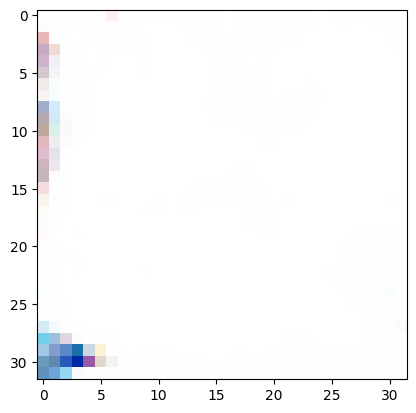

[128/500][0/936]	Loss_D: 0.0002	Loss_G: 9.2442	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[128/500][15/936]	Loss_D: 0.0114	Loss_G: 9.4295	D(x): 0.9889	D(G(z)): 0.0002 / 0.0003
[128/500][30/936]	Loss_D: 0.0007	Loss_G: 9.1584	D(x): 0.9996	D(G(z)): 0.0002 / 0.0002
[128/500][45/936]	Loss_D: 0.0002	Loss_G: 9.0645	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[128/500][60/936]	Loss_D: 0.0027	Loss_G: 7.5902	D(x): 0.9990	D(G(z)): 0.0017 / 0.0016
[128/500][75/936]	Loss_D: 0.0003	Loss_G: 10.7054	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[128/500][90/936]	Loss_D: 0.0013	Loss_G: 7.2483	D(x): 0.9999	D(G(z)): 0.0012 / 0.0011
[128/500][105/936]	Loss_D: 0.0001	Loss_G: 9.3584	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[128/500][120/936]	Loss_D: 0.0018	Loss_G: 8.1121	D(x): 0.9995	D(G(z)): 0.0012 / 0.0011
[128/500][135/936]	Loss_D: 0.0023	Loss_G: 7.0908	D(x): 1.0000	D(G(z)): 0.0022 / 0.0020
[128/500][150/936]	Loss_D: 0.0547	Loss_G: 7.1789	D(x): 0.9996	D(G(z)): 0.0498 / 0.0022
[128/500][165/936]	Loss_D: 0.0003	Loss_G: 8.8915	D

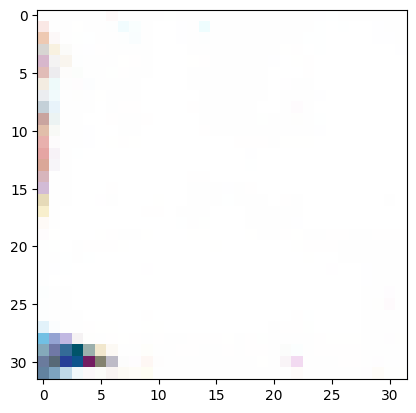

[129/500][0/936]	Loss_D: 0.0004	Loss_G: 9.1673	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[129/500][15/936]	Loss_D: 0.0015	Loss_G: 7.5285	D(x): 0.9993	D(G(z)): 0.0009 / 0.0008
[129/500][30/936]	Loss_D: 0.0008	Loss_G: 7.8290	D(x): 1.0000	D(G(z)): 0.0008 / 0.0005
[129/500][45/936]	Loss_D: 0.0055	Loss_G: 6.9698	D(x): 1.0000	D(G(z)): 0.0054 / 0.0043
[129/500][60/936]	Loss_D: 0.0002	Loss_G: 9.5999	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[129/500][75/936]	Loss_D: 0.0033	Loss_G: 7.2797	D(x): 0.9994	D(G(z)): 0.0027 / 0.0024
[129/500][90/936]	Loss_D: 0.0032	Loss_G: 7.3012	D(x): 0.9993	D(G(z)): 0.0025 / 0.0022
[129/500][105/936]	Loss_D: 0.0009	Loss_G: 8.4974	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[129/500][120/936]	Loss_D: 0.0476	Loss_G: 8.9539	D(x): 0.9561	D(G(z)): 0.0002 / 0.0003
[129/500][135/936]	Loss_D: 0.0006	Loss_G: 8.7010	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[129/500][150/936]	Loss_D: 0.0014	Loss_G: 7.3328	D(x): 0.9999	D(G(z)): 0.0013 / 0.0010
[129/500][165/936]	Loss_D: 0.0198	Loss_G: 6.5450	D(

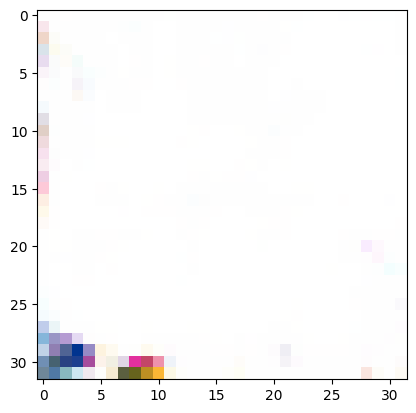

[130/500][0/936]	Loss_D: 0.0003	Loss_G: 9.4531	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[130/500][15/936]	Loss_D: 0.0003	Loss_G: 9.1660	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[130/500][30/936]	Loss_D: 0.0012	Loss_G: 7.8207	D(x): 0.9995	D(G(z)): 0.0008 / 0.0007
[130/500][45/936]	Loss_D: 0.0060	Loss_G: 10.7651	D(x): 0.9941	D(G(z)): 0.0001 / 0.0001
[130/500][60/936]	Loss_D: 0.0234	Loss_G: 7.9003	D(x): 1.0000	D(G(z)): 0.0224 / 0.0079
[130/500][75/936]	Loss_D: 0.0004	Loss_G: 8.8390	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[130/500][90/936]	Loss_D: 0.0239	Loss_G: 6.9665	D(x): 0.9995	D(G(z)): 0.0224 / 0.0069
[130/500][105/936]	Loss_D: 0.0023	Loss_G: 10.1613	D(x): 0.9978	D(G(z)): 0.0001 / 0.0001
[130/500][120/936]	Loss_D: 0.0089	Loss_G: 8.1840	D(x): 1.0000	D(G(z)): 0.0087 / 0.0025
[130/500][135/936]	Loss_D: 0.0003	Loss_G: 9.7780	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[130/500][150/936]	Loss_D: 0.0009	Loss_G: 10.6314	D(x): 0.9991	D(G(z)): 0.0000 / 0.0000
[130/500][165/936]	Loss_D: 0.1382	Loss_G: 5.8294

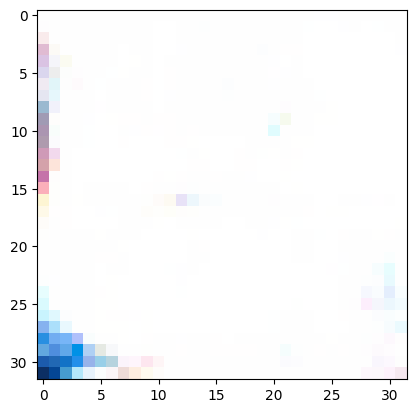

[131/500][0/936]	Loss_D: 0.0058	Loss_G: 7.5689	D(x): 0.9999	D(G(z)): 0.0057 / 0.0043
[131/500][15/936]	Loss_D: 0.0005	Loss_G: 7.9092	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[131/500][30/936]	Loss_D: 0.0011	Loss_G: 10.1543	D(x): 0.9990	D(G(z)): 0.0001 / 0.0001
[131/500][45/936]	Loss_D: 0.0035	Loss_G: 8.8631	D(x): 0.9968	D(G(z)): 0.0003 / 0.0002
[131/500][60/936]	Loss_D: 0.0098	Loss_G: 7.0582	D(x): 0.9999	D(G(z)): 0.0096 / 0.0064
[131/500][75/936]	Loss_D: 0.0035	Loss_G: 9.5440	D(x): 0.9975	D(G(z)): 0.0009 / 0.0006
[131/500][90/936]	Loss_D: 0.0009	Loss_G: 9.3709	D(x): 0.9993	D(G(z)): 0.0001 / 0.0003
[131/500][105/936]	Loss_D: 0.0408	Loss_G: 7.4039	D(x): 1.0000	D(G(z)): 0.0379 / 0.0014
[131/500][120/936]	Loss_D: 0.0011	Loss_G: 9.4353	D(x): 0.9992	D(G(z)): 0.0002 / 0.0002
[131/500][135/936]	Loss_D: 0.0121	Loss_G: 6.5414	D(x): 0.9929	D(G(z)): 0.0049 / 0.0030
[131/500][150/936]	Loss_D: 0.0005	Loss_G: 10.9758	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[131/500][165/936]	Loss_D: 0.0161	Loss_G: 8.0911	

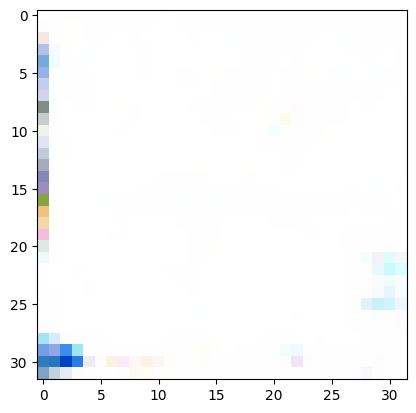

[132/500][0/936]	Loss_D: 0.0001	Loss_G: 11.1525	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[132/500][15/936]	Loss_D: 0.0035	Loss_G: 7.3726	D(x): 1.0000	D(G(z)): 0.0035 / 0.0027
[132/500][30/936]	Loss_D: 0.0011	Loss_G: 10.5842	D(x): 0.9990	D(G(z)): 0.0001 / 0.0001
[132/500][45/936]	Loss_D: 0.0022	Loss_G: 8.8764	D(x): 0.9992	D(G(z)): 0.0014 / 0.0011
[132/500][60/936]	Loss_D: 0.0058	Loss_G: 6.9409	D(x): 0.9995	D(G(z)): 0.0053 / 0.0038
[132/500][75/936]	Loss_D: 0.0009	Loss_G: 8.9233	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[132/500][90/936]	Loss_D: 0.0966	Loss_G: 5.9126	D(x): 0.9999	D(G(z)): 0.0882 / 0.0072
[132/500][105/936]	Loss_D: 0.0274	Loss_G: 12.5787	D(x): 0.9741	D(G(z)): 0.0001 / 0.0000
[132/500][120/936]	Loss_D: 0.0115	Loss_G: 8.6065	D(x): 0.9890	D(G(z)): 0.0003 / 0.0003
[132/500][135/936]	Loss_D: 0.0006	Loss_G: 9.2182	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[132/500][150/936]	Loss_D: 0.0002	Loss_G: 9.3093	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[132/500][165/936]	Loss_D: 0.0005	Loss_G: 8.6032

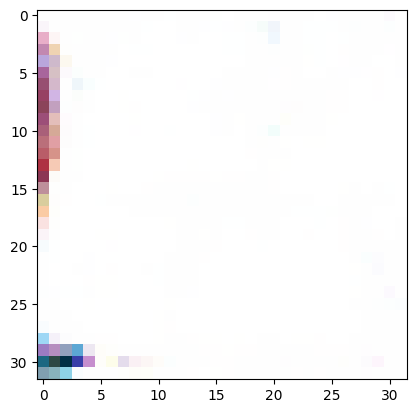

[133/500][0/936]	Loss_D: 0.0231	Loss_G: 8.8951	D(x): 0.9819	D(G(z)): 0.0045 / 0.0032
[133/500][15/936]	Loss_D: 0.0429	Loss_G: 6.5198	D(x): 0.9999	D(G(z)): 0.0406 / 0.0141
[133/500][30/936]	Loss_D: 0.0009	Loss_G: 11.3895	D(x): 0.9992	D(G(z)): 0.0000 / 0.0000
[133/500][45/936]	Loss_D: 0.0152	Loss_G: 7.8521	D(x): 0.9908	D(G(z)): 0.0059 / 0.0049
[133/500][60/936]	Loss_D: 0.0098	Loss_G: 9.5714	D(x): 0.9905	D(G(z)): 0.0001 / 0.0001
[133/500][75/936]	Loss_D: 0.0643	Loss_G: 5.3855	D(x): 0.9783	D(G(z)): 0.0396 / 0.0115
[133/500][90/936]	Loss_D: 0.0862	Loss_G: 7.6833	D(x): 0.9313	D(G(z)): 0.0060 / 0.0079
[133/500][105/936]	Loss_D: 0.0029	Loss_G: 6.3002	D(x): 1.0000	D(G(z)): 0.0028 / 0.0029
[133/500][120/936]	Loss_D: 0.0007	Loss_G: 10.8766	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[133/500][135/936]	Loss_D: 0.0008	Loss_G: 9.5619	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[133/500][150/936]	Loss_D: 0.0066	Loss_G: 8.8118	D(x): 1.0000	D(G(z)): 0.0066 / 0.0048
[133/500][165/936]	Loss_D: 0.0039	Loss_G: 9.4863	

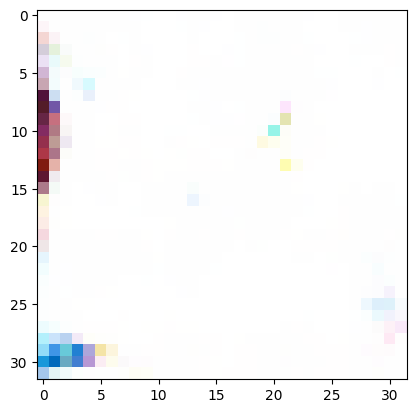

[134/500][0/936]	Loss_D: 0.0442	Loss_G: 1.9989	D(x): 1.0000	D(G(z)): 0.0428 / 0.2520
[134/500][15/936]	Loss_D: 0.0019	Loss_G: 7.0195	D(x): 0.9995	D(G(z)): 0.0014 / 0.0087
[134/500][30/936]	Loss_D: 0.0293	Loss_G: 5.4667	D(x): 0.9990	D(G(z)): 0.0274 / 0.0141
[134/500][45/936]	Loss_D: 0.7583	Loss_G: 3.2435	D(x): 0.5703	D(G(z)): 0.0009 / 0.0433
[134/500][60/936]	Loss_D: 0.0017	Loss_G: 10.6386	D(x): 1.0000	D(G(z)): 0.0017 / 0.0015
[134/500][75/936]	Loss_D: 0.0081	Loss_G: 6.2672	D(x): 0.9994	D(G(z)): 0.0074 / 0.0066
[134/500][90/936]	Loss_D: 0.0047	Loss_G: 12.3748	D(x): 0.9953	D(G(z)): 0.0000 / 0.0000
[134/500][105/936]	Loss_D: 0.0111	Loss_G: 6.4752	D(x): 0.9984	D(G(z)): 0.0093 / 0.0081
[134/500][120/936]	Loss_D: 0.1992	Loss_G: 5.2818	D(x): 0.9937	D(G(z)): 0.1596 / 0.0349
[134/500][135/936]	Loss_D: 0.0110	Loss_G: 6.2992	D(x): 0.9997	D(G(z)): 0.0105 / 0.0076
[134/500][150/936]	Loss_D: 0.0057	Loss_G: 6.7202	D(x): 0.9978	D(G(z)): 0.0035 / 0.0031
[134/500][165/936]	Loss_D: 0.0108	Loss_G: 7.9157	

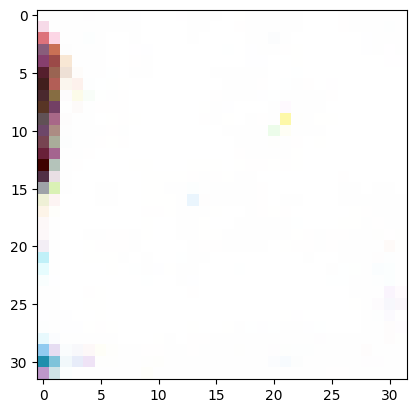

[135/500][0/936]	Loss_D: 0.0052	Loss_G: 10.0106	D(x): 0.9950	D(G(z)): 0.0002 / 0.0002
[135/500][15/936]	Loss_D: 0.0004	Loss_G: 9.1156	D(x): 0.9999	D(G(z)): 0.0004 / 0.0005
[135/500][30/936]	Loss_D: 0.0126	Loss_G: 5.8785	D(x): 1.0000	D(G(z)): 0.0124 / 0.0068
[135/500][45/936]	Loss_D: 0.0002	Loss_G: 10.6072	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[135/500][60/936]	Loss_D: 0.0398	Loss_G: 5.4843	D(x): 1.0000	D(G(z)): 0.0373 / 0.0163
[135/500][75/936]	Loss_D: 0.0012	Loss_G: 8.1726	D(x): 1.0000	D(G(z)): 0.0012 / 0.0012
[135/500][90/936]	Loss_D: 0.0024	Loss_G: 7.8091	D(x): 0.9987	D(G(z)): 0.0011 / 0.0022
[135/500][105/936]	Loss_D: 0.0076	Loss_G: 6.0705	D(x): 0.9995	D(G(z)): 0.0070 / 0.0059
[135/500][120/936]	Loss_D: 0.0001	Loss_G: 10.1611	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[135/500][135/936]	Loss_D: 0.0002	Loss_G: 9.7412	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[135/500][150/936]	Loss_D: 0.0009	Loss_G: 9.9657	D(x): 1.0000	D(G(z)): 0.0008 / 0.0005
[135/500][165/936]	Loss_D: 0.0003	Loss_G: 8.6759

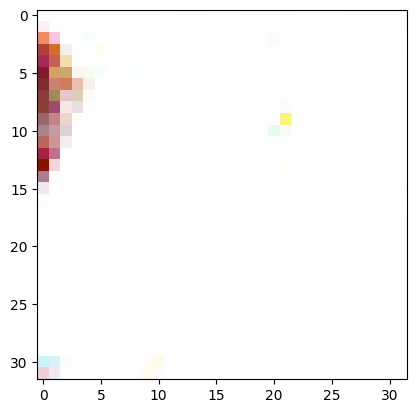

[136/500][0/936]	Loss_D: 0.0384	Loss_G: 9.0691	D(x): 0.9988	D(G(z)): 0.0346 / 0.0002
[136/500][15/936]	Loss_D: 0.0006	Loss_G: 8.5581	D(x): 0.9999	D(G(z)): 0.0006 / 0.0005
[136/500][30/936]	Loss_D: 0.0002	Loss_G: 9.3489	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[136/500][45/936]	Loss_D: 0.0036	Loss_G: 7.1251	D(x): 1.0000	D(G(z)): 0.0035 / 0.0030
[136/500][60/936]	Loss_D: 0.0602	Loss_G: 7.6132	D(x): 0.9451	D(G(z)): 0.0007 / 0.0012
[136/500][75/936]	Loss_D: 0.0049	Loss_G: 7.2552	D(x): 1.0000	D(G(z)): 0.0049 / 0.0041
[136/500][90/936]	Loss_D: 0.0003	Loss_G: 8.9453	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[136/500][105/936]	Loss_D: 0.0022	Loss_G: 9.2153	D(x): 0.9997	D(G(z)): 0.0020 / 0.0018
[136/500][120/936]	Loss_D: 0.0018	Loss_G: 7.8172	D(x): 0.9995	D(G(z)): 0.0012 / 0.0013
[136/500][135/936]	Loss_D: 0.0023	Loss_G: 6.4345	D(x): 1.0000	D(G(z)): 0.0023 / 0.0032
[136/500][150/936]	Loss_D: 0.0004	Loss_G: 11.1080	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[136/500][165/936]	Loss_D: 0.0003	Loss_G: 10.7714	

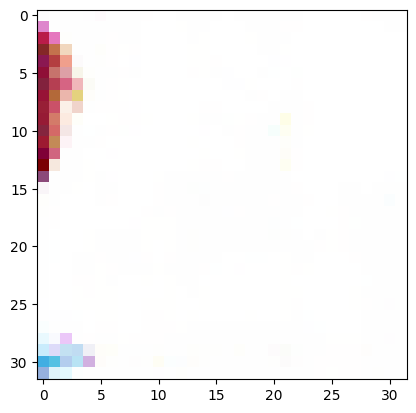

[137/500][0/936]	Loss_D: 0.0011	Loss_G: 7.2536	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[137/500][15/936]	Loss_D: 0.0117	Loss_G: 7.7974	D(x): 0.9914	D(G(z)): 0.0030 / 0.0027
[137/500][30/936]	Loss_D: 0.0086	Loss_G: 6.5636	D(x): 0.9946	D(G(z)): 0.0031 / 0.0027
[137/500][45/936]	Loss_D: 0.0032	Loss_G: 11.0047	D(x): 0.9970	D(G(z)): 0.0002 / 0.0001
[137/500][60/936]	Loss_D: 0.0005	Loss_G: 10.1502	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[137/500][75/936]	Loss_D: 0.0049	Loss_G: 9.8101	D(x): 0.9953	D(G(z)): 0.0002 / 0.0002
[137/500][90/936]	Loss_D: 0.0009	Loss_G: 10.2975	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[137/500][105/936]	Loss_D: 0.0072	Loss_G: 8.9649	D(x): 0.9931	D(G(z)): 0.0002 / 0.0003
[137/500][120/936]	Loss_D: 0.0017	Loss_G: 7.0275	D(x): 0.9997	D(G(z)): 0.0014 / 0.0013
[137/500][135/936]	Loss_D: 0.0002	Loss_G: 8.7704	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[137/500][150/936]	Loss_D: 0.0043	Loss_G: 9.0977	D(x): 0.9959	D(G(z)): 0.0002 / 0.0002
[137/500][165/936]	Loss_D: 0.0014	Loss_G: 8.4728

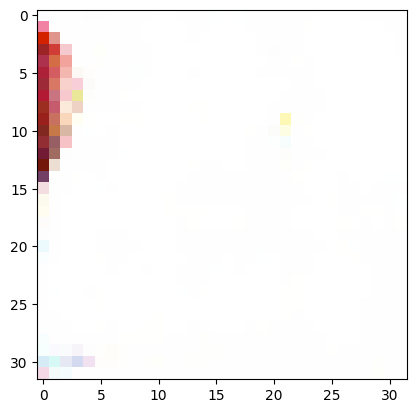

[138/500][0/936]	Loss_D: 0.0146	Loss_G: 8.2898	D(x): 0.9893	D(G(z)): 0.0037 / 0.0027
[138/500][15/936]	Loss_D: 0.0059	Loss_G: 6.8277	D(x): 1.0000	D(G(z)): 0.0058 / 0.0047
[138/500][30/936]	Loss_D: 0.0014	Loss_G: 6.9958	D(x): 0.9999	D(G(z)): 0.0013 / 0.0012
[138/500][45/936]	Loss_D: 0.0021	Loss_G: 7.5075	D(x): 0.9998	D(G(z)): 0.0020 / 0.0018
[138/500][60/936]	Loss_D: 0.0004	Loss_G: 9.8474	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[138/500][75/936]	Loss_D: 0.0065	Loss_G: 5.6778	D(x): 1.0000	D(G(z)): 0.0065 / 0.0045
[138/500][90/936]	Loss_D: 0.0029	Loss_G: 8.8824	D(x): 0.9976	D(G(z)): 0.0006 / 0.0005
[138/500][105/936]	Loss_D: 0.0048	Loss_G: 8.3329	D(x): 0.9999	D(G(z)): 0.0047 / 0.0039
[138/500][120/936]	Loss_D: 0.0223	Loss_G: 3.8552	D(x): 1.0000	D(G(z)): 0.0218 / 0.0307
[138/500][135/936]	Loss_D: 0.0010	Loss_G: 8.1596	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[138/500][150/936]	Loss_D: 0.5377	Loss_G: 3.8946	D(x): 0.7878	D(G(z)): 0.0744 / 0.0291
[138/500][165/936]	Loss_D: 0.0002	Loss_G: 10.0660	D

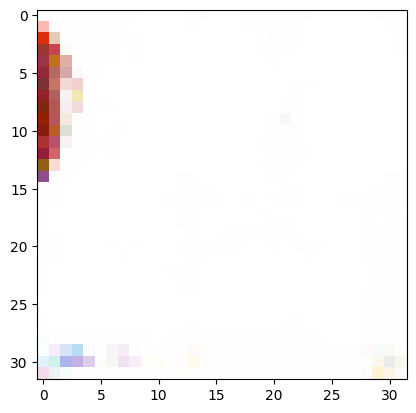

[139/500][0/936]	Loss_D: 0.0001	Loss_G: 12.5930	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[139/500][15/936]	Loss_D: 0.1404	Loss_G: 6.5447	D(x): 0.8865	D(G(z)): 0.0017 / 0.0035
[139/500][30/936]	Loss_D: 0.0122	Loss_G: 7.3159	D(x): 1.0000	D(G(z)): 0.0120 / 0.0041
[139/500][45/936]	Loss_D: 0.0007	Loss_G: 9.0503	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[139/500][60/936]	Loss_D: 0.0008	Loss_G: 9.8353	D(x): 0.9995	D(G(z)): 0.0003 / 0.0002
[139/500][75/936]	Loss_D: 0.0037	Loss_G: 7.2169	D(x): 0.9997	D(G(z)): 0.0034 / 0.0031
[139/500][90/936]	Loss_D: 0.0097	Loss_G: 6.7991	D(x): 0.9920	D(G(z)): 0.0016 / 0.0020
[139/500][105/936]	Loss_D: 0.0007	Loss_G: 7.7927	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[139/500][120/936]	Loss_D: 0.0031	Loss_G: 9.0023	D(x): 0.9996	D(G(z)): 0.0027 / 0.0024
[139/500][135/936]	Loss_D: 0.0009	Loss_G: 8.6347	D(x): 0.9995	D(G(z)): 0.0004 / 0.0004
[139/500][150/936]	Loss_D: 0.0014	Loss_G: 8.4244	D(x): 0.9999	D(G(z)): 0.0013 / 0.0005
[139/500][165/936]	Loss_D: 0.0024	Loss_G: 9.2541	D

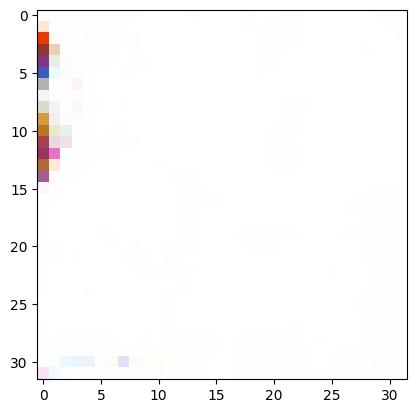

[140/500][0/936]	Loss_D: 0.0038	Loss_G: 8.0777	D(x): 1.0000	D(G(z)): 0.0038 / 0.0034
[140/500][15/936]	Loss_D: 0.0003	Loss_G: 9.1148	D(x): 0.9998	D(G(z)): 0.0002 / 0.0002
[140/500][30/936]	Loss_D: 0.0001	Loss_G: 11.5785	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[140/500][45/936]	Loss_D: 0.0142	Loss_G: 5.7417	D(x): 0.9998	D(G(z)): 0.0137 / 0.0093
[140/500][60/936]	Loss_D: 0.0024	Loss_G: 8.3780	D(x): 0.9998	D(G(z)): 0.0022 / 0.0021
[140/500][75/936]	Loss_D: 0.0016	Loss_G: 7.4962	D(x): 0.9999	D(G(z)): 0.0015 / 0.0014
[140/500][90/936]	Loss_D: 0.0018	Loss_G: 6.9031	D(x): 0.9998	D(G(z)): 0.0017 / 0.0029
[140/500][105/936]	Loss_D: 0.0016	Loss_G: 7.6403	D(x): 0.9999	D(G(z)): 0.0016 / 0.0016
[140/500][120/936]	Loss_D: 0.0126	Loss_G: 5.7484	D(x): 1.0000	D(G(z)): 0.0124 / 0.0078
[140/500][135/936]	Loss_D: 0.0003	Loss_G: 8.2313	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[140/500][150/936]	Loss_D: 0.0070	Loss_G: 6.7997	D(x): 1.0000	D(G(z)): 0.0069 / 0.0021
[140/500][165/936]	Loss_D: 0.0001	Loss_G: 9.6142	D

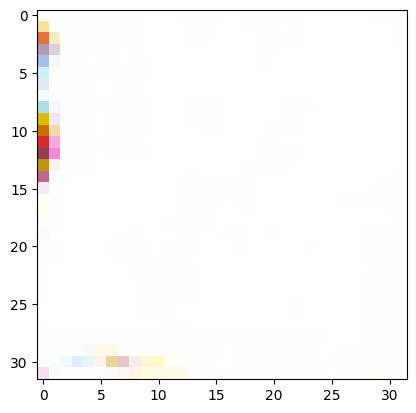

[141/500][0/936]	Loss_D: 0.0029	Loss_G: 8.0542	D(x): 0.9979	D(G(z)): 0.0008 / 0.0008
[141/500][15/936]	Loss_D: 0.0003	Loss_G: 11.5211	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[141/500][30/936]	Loss_D: 0.0014	Loss_G: 8.1097	D(x): 0.9996	D(G(z)): 0.0010 / 0.0010
[141/500][45/936]	Loss_D: 0.0002	Loss_G: 10.8776	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[141/500][60/936]	Loss_D: 0.0004	Loss_G: 10.3472	D(x): 0.9997	D(G(z)): 0.0001 / 0.0001
[141/500][75/936]	Loss_D: 0.0851	Loss_G: 7.2322	D(x): 1.0000	D(G(z)): 0.0741 / 0.0018
[141/500][90/936]	Loss_D: 0.1613	Loss_G: 9.6219	D(x): 0.8608	D(G(z)): 0.0001 / 0.0002
[141/500][105/936]	Loss_D: 0.0001	Loss_G: 10.5467	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[141/500][120/936]	Loss_D: 0.0010	Loss_G: 8.2703	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[141/500][135/936]	Loss_D: 0.0018	Loss_G: 7.3596	D(x): 1.0000	D(G(z)): 0.0018 / 0.0028
[141/500][150/936]	Loss_D: 0.0041	Loss_G: 10.1832	D(x): 0.9962	D(G(z)): 0.0003 / 0.0003
[141/500][165/936]	Loss_D: 0.0086	Loss_G: 9.26

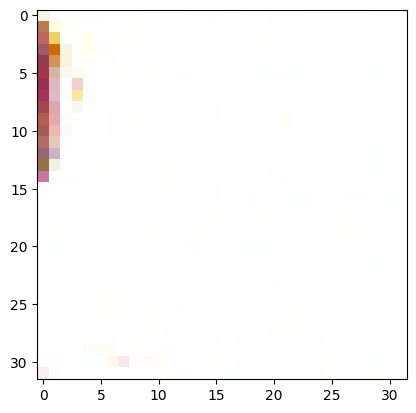

[142/500][0/936]	Loss_D: 0.0004	Loss_G: 8.6290	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[142/500][15/936]	Loss_D: 0.0812	Loss_G: 6.4801	D(x): 0.9342	D(G(z)): 0.0068 / 0.0085
[142/500][30/936]	Loss_D: 0.0011	Loss_G: 8.5271	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[142/500][45/936]	Loss_D: 0.0009	Loss_G: 8.6190	D(x): 1.0000	D(G(z)): 0.0009 / 0.0004
[142/500][60/936]	Loss_D: 0.0011	Loss_G: 10.2146	D(x): 0.9998	D(G(z)): 0.0008 / 0.0008
[142/500][75/936]	Loss_D: 0.0109	Loss_G: 9.5519	D(x): 0.9901	D(G(z)): 0.0009 / 0.0009
[142/500][90/936]	Loss_D: 0.0113	Loss_G: 7.0973	D(x): 0.9991	D(G(z)): 0.0103 / 0.0070
[142/500][105/936]	Loss_D: 0.0079	Loss_G: 5.5251	D(x): 1.0000	D(G(z)): 0.0078 / 0.0061
[142/500][120/936]	Loss_D: 0.0005	Loss_G: 9.0140	D(x): 0.9997	D(G(z)): 0.0002 / 0.0002
[142/500][135/936]	Loss_D: 0.0010	Loss_G: 10.1811	D(x): 0.9991	D(G(z)): 0.0001 / 0.0001
[142/500][150/936]	Loss_D: 0.0009	Loss_G: 9.0969	D(x): 0.9999	D(G(z)): 0.0008 / 0.0005
[142/500][165/936]	Loss_D: 0.0091	Loss_G: 5.9951	

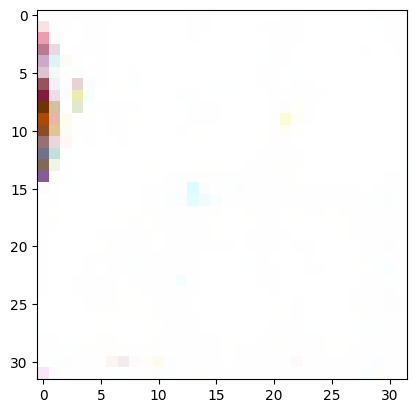

[143/500][0/936]	Loss_D: 0.0033	Loss_G: 6.9223	D(x): 1.0000	D(G(z)): 0.0033 / 0.0032
[143/500][15/936]	Loss_D: 0.0136	Loss_G: 7.7513	D(x): 0.9876	D(G(z)): 0.0010 / 0.0009
[143/500][30/936]	Loss_D: 0.0036	Loss_G: 9.9837	D(x): 0.9966	D(G(z)): 0.0001 / 0.0001
[143/500][45/936]	Loss_D: 0.0048	Loss_G: 6.5492	D(x): 0.9972	D(G(z)): 0.0020 / 0.0018
[143/500][60/936]	Loss_D: 0.0418	Loss_G: 8.9043	D(x): 0.9622	D(G(z)): 0.0013 / 0.0014
[143/500][75/936]	Loss_D: 0.0004	Loss_G: 8.3412	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[143/500][90/936]	Loss_D: 0.0041	Loss_G: 6.4957	D(x): 0.9996	D(G(z)): 0.0037 / 0.0032
[143/500][105/936]	Loss_D: 0.0028	Loss_G: 8.3371	D(x): 0.9997	D(G(z)): 0.0026 / 0.0026
[143/500][120/936]	Loss_D: 0.0024	Loss_G: 7.5066	D(x): 0.9992	D(G(z)): 0.0015 / 0.0014
[143/500][135/936]	Loss_D: 0.0028	Loss_G: 8.5108	D(x): 1.0000	D(G(z)): 0.0027 / 0.0023
[143/500][150/936]	Loss_D: 0.0056	Loss_G: 5.9041	D(x): 1.0000	D(G(z)): 0.0055 / 0.0044
[143/500][165/936]	Loss_D: 0.0006	Loss_G: 8.6304	D(

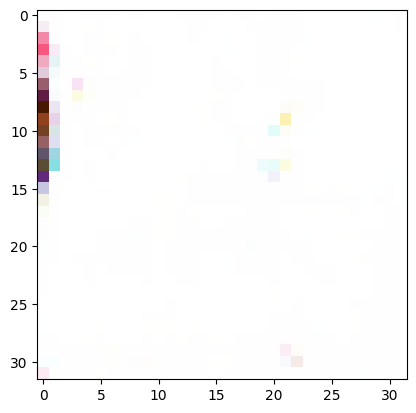

[144/500][0/936]	Loss_D: 0.0002	Loss_G: 10.5832	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[144/500][15/936]	Loss_D: 0.0018	Loss_G: 8.5939	D(x): 0.9986	D(G(z)): 0.0004 / 0.0004
[144/500][30/936]	Loss_D: 0.0001	Loss_G: 10.4752	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[144/500][45/936]	Loss_D: 0.0001	Loss_G: 10.5291	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[144/500][60/936]	Loss_D: 0.0007	Loss_G: 7.9914	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[144/500][75/936]	Loss_D: 0.0005	Loss_G: 8.4434	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[144/500][90/936]	Loss_D: 0.0003	Loss_G: 8.4823	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[144/500][105/936]	Loss_D: 0.0084	Loss_G: 7.3702	D(x): 0.9978	D(G(z)): 0.0062 / 0.0048
[144/500][120/936]	Loss_D: 0.0002	Loss_G: 10.7725	D(x): 0.9999	D(G(z)): 0.0002 / 0.0001
[144/500][135/936]	Loss_D: 0.0185	Loss_G: 5.4931	D(x): 1.0000	D(G(z)): 0.0182 / 0.0066
[144/500][150/936]	Loss_D: 0.0269	Loss_G: 5.7792	D(x): 1.0000	D(G(z)): 0.0260 / 0.0041
[144/500][165/936]	Loss_D: 0.0019	Loss_G: 7.730

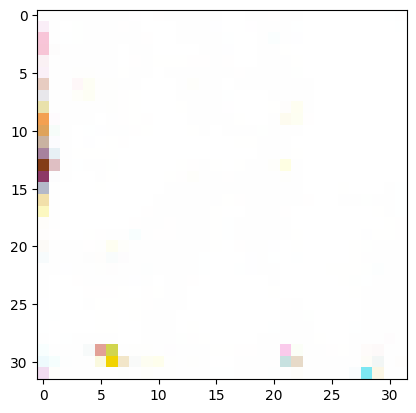

[145/500][0/936]	Loss_D: 0.0336	Loss_G: 5.1328	D(x): 1.0000	D(G(z)): 0.0327 / 0.0093
[145/500][15/936]	Loss_D: 0.0001	Loss_G: 11.6783	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[145/500][30/936]	Loss_D: 0.0015	Loss_G: 8.3928	D(x): 0.9991	D(G(z)): 0.0006 / 0.0006
[145/500][45/936]	Loss_D: 0.0084	Loss_G: 4.5472	D(x): 0.9996	D(G(z)): 0.0079 / 0.0247
[145/500][60/936]	Loss_D: 0.0012	Loss_G: 7.4216	D(x): 0.9998	D(G(z)): 0.0011 / 0.0009
[145/500][75/936]	Loss_D: 0.0039	Loss_G: 8.1857	D(x): 0.9997	D(G(z)): 0.0036 / 0.0010
[145/500][90/936]	Loss_D: 0.0080	Loss_G: 11.9442	D(x): 0.9922	D(G(z)): 0.0000 / 0.0000
[145/500][105/936]	Loss_D: 0.0011	Loss_G: 7.6904	D(x): 0.9997	D(G(z)): 0.0008 / 0.0008
[145/500][120/936]	Loss_D: 0.0010	Loss_G: 7.8801	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[145/500][135/936]	Loss_D: 0.0636	Loss_G: 5.1559	D(x): 0.9999	D(G(z)): 0.0586 / 0.0062
[145/500][150/936]	Loss_D: 0.0297	Loss_G: 7.1413	D(x): 0.9842	D(G(z)): 0.0132 / 0.0028
[145/500][165/936]	Loss_D: 0.0007	Loss_G: 7.9599	

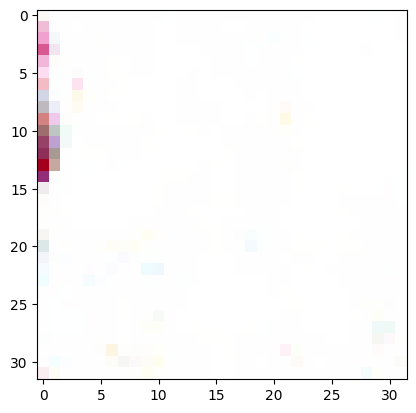

[146/500][0/936]	Loss_D: 0.0028	Loss_G: 9.8056	D(x): 0.9975	D(G(z)): 0.0003 / 0.0003
[146/500][15/936]	Loss_D: 0.1123	Loss_G: 7.4375	D(x): 0.9025	D(G(z)): 0.0010 / 0.0025
[146/500][30/936]	Loss_D: 0.0184	Loss_G: 6.5951	D(x): 0.9976	D(G(z)): 0.0156 / 0.0032
[146/500][45/936]	Loss_D: 0.0128	Loss_G: 7.7507	D(x): 1.0000	D(G(z)): 0.0124 / 0.0042
[146/500][60/936]	Loss_D: 0.0005	Loss_G: 8.3506	D(x): 0.9999	D(G(z)): 0.0004 / 0.0003
[146/500][75/936]	Loss_D: 0.0183	Loss_G: 5.5934	D(x): 0.9994	D(G(z)): 0.0175 / 0.0095
[146/500][90/936]	Loss_D: 0.0090	Loss_G: 7.4775	D(x): 0.9970	D(G(z)): 0.0060 / 0.0050
[146/500][105/936]	Loss_D: 0.0794	Loss_G: 7.8904	D(x): 0.9999	D(G(z)): 0.0682 / 0.0005
[146/500][120/936]	Loss_D: 0.0002	Loss_G: 9.1838	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[146/500][135/936]	Loss_D: 0.0094	Loss_G: 6.2803	D(x): 0.9951	D(G(z)): 0.0045 / 0.0039
[146/500][150/936]	Loss_D: 0.0009	Loss_G: 9.3481	D(x): 0.9997	D(G(z)): 0.0006 / 0.0006
[146/500][165/936]	Loss_D: 0.0214	Loss_G: 5.9487	D(

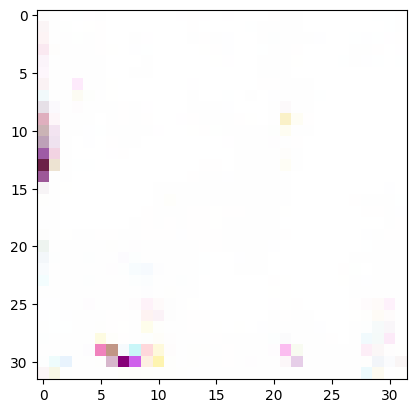

[147/500][0/936]	Loss_D: 0.1829	Loss_G: 4.8919	D(x): 1.0000	D(G(z)): 0.1527 / 0.0104
[147/500][15/936]	Loss_D: 0.0014	Loss_G: 10.0114	D(x): 0.9999	D(G(z)): 0.0013 / 0.0005
[147/500][30/936]	Loss_D: 0.0125	Loss_G: 6.4089	D(x): 0.9998	D(G(z)): 0.0122 / 0.0062
[147/500][45/936]	Loss_D: 0.0334	Loss_G: 8.2425	D(x): 0.9731	D(G(z)): 0.0050 / 0.0089
[147/500][60/936]	Loss_D: 0.0599	Loss_G: 10.1293	D(x): 0.9434	D(G(z)): 0.0001 / 0.0001
[147/500][75/936]	Loss_D: 0.0740	Loss_G: 6.3146	D(x): 0.9999	D(G(z)): 0.0647 / 0.0025
[147/500][90/936]	Loss_D: 0.1218	Loss_G: 6.1835	D(x): 0.9281	D(G(z)): 0.0409 / 0.0344
[147/500][105/936]	Loss_D: 0.0018	Loss_G: 10.3364	D(x): 0.9983	D(G(z)): 0.0001 / 0.0001
[147/500][120/936]	Loss_D: 0.0370	Loss_G: 5.1161	D(x): 0.9992	D(G(z)): 0.0346 / 0.0084
[147/500][135/936]	Loss_D: 0.0094	Loss_G: 8.6176	D(x): 1.0000	D(G(z)): 0.0093 / 0.0074
[147/500][150/936]	Loss_D: 0.1152	Loss_G: 6.2134	D(x): 0.9999	D(G(z)): 0.1025 / 0.0021
[147/500][165/936]	Loss_D: 0.4435	Loss_G: 10.109

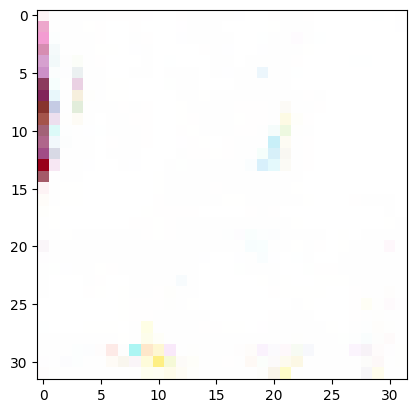

[148/500][0/936]	Loss_D: 0.0255	Loss_G: 8.6211	D(x): 0.9766	D(G(z)): 0.0017 / 0.0019
[148/500][15/936]	Loss_D: 0.0036	Loss_G: 7.9692	D(x): 0.9996	D(G(z)): 0.0032 / 0.0028
[148/500][30/936]	Loss_D: 0.0006	Loss_G: 8.0676	D(x): 0.9998	D(G(z)): 0.0004 / 0.0004
[148/500][45/936]	Loss_D: 0.0003	Loss_G: 9.0351	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[148/500][60/936]	Loss_D: 0.0001	Loss_G: 9.7856	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[148/500][75/936]	Loss_D: 0.0131	Loss_G: 5.2994	D(x): 1.0000	D(G(z)): 0.0130 / 0.0087
[148/500][90/936]	Loss_D: 0.0064	Loss_G: 7.8468	D(x): 1.0000	D(G(z)): 0.0063 / 0.0046
[148/500][105/936]	Loss_D: 0.0029	Loss_G: 8.3241	D(x): 0.9993	D(G(z)): 0.0022 / 0.0019
[148/500][120/936]	Loss_D: 0.0013	Loss_G: 7.9441	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[148/500][135/936]	Loss_D: 0.0267	Loss_G: 4.8488	D(x): 1.0000	D(G(z)): 0.0261 / 0.0166
[148/500][150/936]	Loss_D: 0.0273	Loss_G: 4.5615	D(x): 1.0000	D(G(z)): 0.0267 / 0.0191
[148/500][165/936]	Loss_D: 0.0198	Loss_G: 5.4389	D(

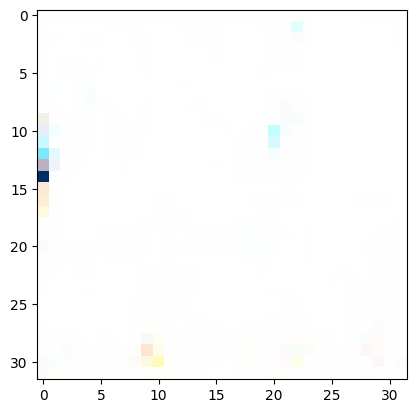

[149/500][0/936]	Loss_D: 0.0042	Loss_G: 6.0361	D(x): 1.0000	D(G(z)): 0.0042 / 0.0052
[149/500][15/936]	Loss_D: 0.0076	Loss_G: 6.1614	D(x): 1.0000	D(G(z)): 0.0075 / 0.0048
[149/500][30/936]	Loss_D: 0.0023	Loss_G: 6.7669	D(x): 0.9997	D(G(z)): 0.0020 / 0.0018
[149/500][45/936]	Loss_D: 0.0067	Loss_G: 8.0245	D(x): 0.9999	D(G(z)): 0.0065 / 0.0039
[149/500][60/936]	Loss_D: 0.0117	Loss_G: 8.6907	D(x): 0.9887	D(G(z)): 0.0002 / 0.0002
[149/500][75/936]	Loss_D: 0.0012	Loss_G: 9.5383	D(x): 0.9994	D(G(z)): 0.0006 / 0.0006
[149/500][90/936]	Loss_D: 0.0276	Loss_G: 9.2337	D(x): 0.9736	D(G(z)): 0.0002 / 0.0002
[149/500][105/936]	Loss_D: 0.0002	Loss_G: 9.7036	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[149/500][120/936]	Loss_D: 0.0068	Loss_G: 7.5683	D(x): 0.9999	D(G(z)): 0.0065 / 0.0046
[149/500][135/936]	Loss_D: 0.0003	Loss_G: 10.9850	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[149/500][150/936]	Loss_D: 0.0016	Loss_G: 10.2068	D(x): 0.9984	D(G(z)): 0.0001 / 0.0001
[149/500][165/936]	Loss_D: 0.0148	Loss_G: 12.5032

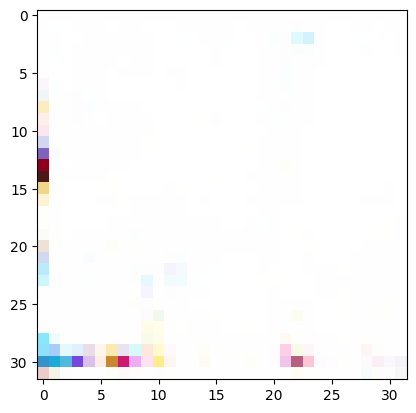

[150/500][0/936]	Loss_D: 0.0301	Loss_G: 5.5992	D(x): 0.9847	D(G(z)): 0.0141 / 0.0078
[150/500][15/936]	Loss_D: 0.0005	Loss_G: 7.7654	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[150/500][30/936]	Loss_D: 0.0031	Loss_G: 9.9083	D(x): 0.9971	D(G(z)): 0.0002 / 0.0002
[150/500][45/936]	Loss_D: 0.0006	Loss_G: 8.8832	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[150/500][60/936]	Loss_D: 0.0002	Loss_G: 9.3231	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[150/500][75/936]	Loss_D: 0.0018	Loss_G: 9.0273	D(x): 0.9996	D(G(z)): 0.0013 / 0.0012
[150/500][90/936]	Loss_D: 0.0229	Loss_G: 6.1484	D(x): 0.9953	D(G(z)): 0.0178 / 0.0109
[150/500][105/936]	Loss_D: 0.0002	Loss_G: 8.9403	D(x): 0.9999	D(G(z)): 0.0002 / 0.0001
[150/500][120/936]	Loss_D: 0.0005	Loss_G: 7.7672	D(x): 1.0000	D(G(z)): 0.0005 / 0.0007
[150/500][135/936]	Loss_D: 0.0016	Loss_G: 7.5186	D(x): 0.9998	D(G(z)): 0.0013 / 0.0013
[150/500][150/936]	Loss_D: 0.0035	Loss_G: 7.8190	D(x): 0.9998	D(G(z)): 0.0032 / 0.0026
[150/500][165/936]	Loss_D: 0.0010	Loss_G: 9.8929	D(

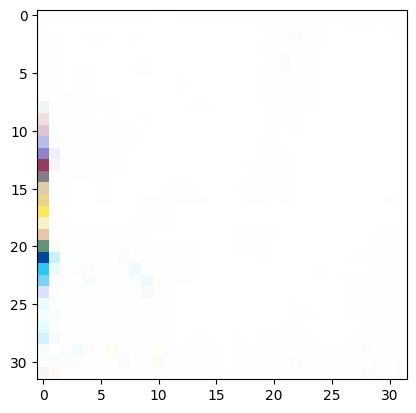

[151/500][0/936]	Loss_D: 0.0435	Loss_G: 8.0135	D(x): 0.9599	D(G(z)): 0.0004 / 0.0005
[151/500][15/936]	Loss_D: 0.0199	Loss_G: 8.3783	D(x): 0.9999	D(G(z)): 0.0190 / 0.0036
[151/500][30/936]	Loss_D: 0.0001	Loss_G: 10.5722	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[151/500][45/936]	Loss_D: 0.0223	Loss_G: 7.0702	D(x): 1.0000	D(G(z)): 0.0218 / 0.0111
[151/500][60/936]	Loss_D: 0.0050	Loss_G: 6.6255	D(x): 1.0000	D(G(z)): 0.0050 / 0.0041
[151/500][75/936]	Loss_D: 0.4614	Loss_G: 5.9535	D(x): 0.7271	D(G(z)): 0.0057 / 0.0664
[151/500][90/936]	Loss_D: 0.0028	Loss_G: 10.6214	D(x): 0.9976	D(G(z)): 0.0004 / 0.0004
[151/500][105/936]	Loss_D: 0.0056	Loss_G: 8.7497	D(x): 1.0000	D(G(z)): 0.0056 / 0.0046
[151/500][120/936]	Loss_D: 0.0081	Loss_G: 8.9496	D(x): 0.9923	D(G(z)): 0.0004 / 0.0003
[151/500][135/936]	Loss_D: 0.0494	Loss_G: 7.0306	D(x): 1.0000	D(G(z)): 0.0452 / 0.0018
[151/500][150/936]	Loss_D: 0.0029	Loss_G: 8.3971	D(x): 0.9993	D(G(z)): 0.0022 / 0.0021
[151/500][165/936]	Loss_D: 0.0090	Loss_G: 6.5467	

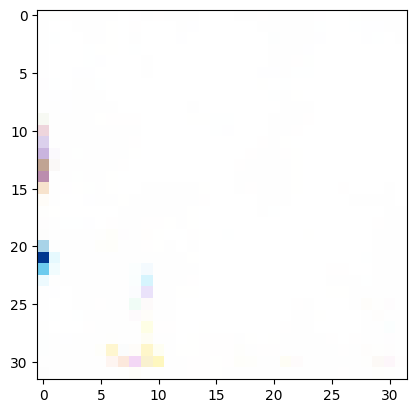

[152/500][0/936]	Loss_D: 0.0026	Loss_G: 6.4503	D(x): 0.9996	D(G(z)): 0.0023 / 0.0024
[152/500][15/936]	Loss_D: 0.0086	Loss_G: 6.8400	D(x): 0.9997	D(G(z)): 0.0082 / 0.0056
[152/500][30/936]	Loss_D: 0.0043	Loss_G: 7.9086	D(x): 0.9961	D(G(z)): 0.0004 / 0.0005
[152/500][45/936]	Loss_D: 0.0070	Loss_G: 5.4068	D(x): 1.0000	D(G(z)): 0.0070 / 0.0053
[152/500][60/936]	Loss_D: 0.0042	Loss_G: 7.7207	D(x): 0.9997	D(G(z)): 0.0039 / 0.0034
[152/500][75/936]	Loss_D: 0.0043	Loss_G: 6.4171	D(x): 0.9974	D(G(z)): 0.0017 / 0.0017
[152/500][90/936]	Loss_D: 0.0000	Loss_G: 12.5304	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[152/500][105/936]	Loss_D: 0.0095	Loss_G: 7.0552	D(x): 1.0000	D(G(z)): 0.0094 / 0.0071
[152/500][120/936]	Loss_D: 0.0128	Loss_G: 6.0180	D(x): 1.0000	D(G(z)): 0.0127 / 0.0078
[152/500][135/936]	Loss_D: 0.0022	Loss_G: 8.2217	D(x): 0.9999	D(G(z)): 0.0022 / 0.0018
[152/500][150/936]	Loss_D: 0.0113	Loss_G: 7.5724	D(x): 0.9952	D(G(z)): 0.0064 / 0.0050
[152/500][165/936]	Loss_D: 0.0003	Loss_G: 9.7474	D

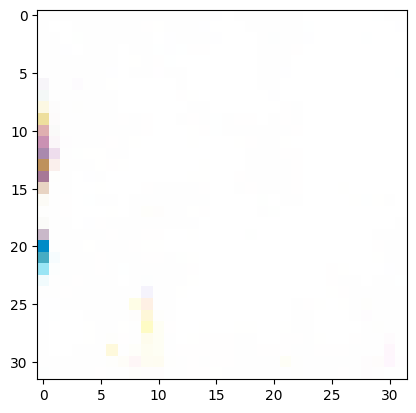

[153/500][0/936]	Loss_D: 0.0115	Loss_G: 5.0019	D(x): 1.0000	D(G(z)): 0.0114 / 0.0138
[153/500][15/936]	Loss_D: 0.0007	Loss_G: 8.8859	D(x): 0.9995	D(G(z)): 0.0003 / 0.0002
[153/500][30/936]	Loss_D: 0.0038	Loss_G: 7.2371	D(x): 0.9993	D(G(z)): 0.0031 / 0.0024
[153/500][45/936]	Loss_D: 0.5716	Loss_G: 12.8035	D(x): 0.9975	D(G(z)): 0.3795 / 0.0000
[153/500][60/936]	Loss_D: 0.0042	Loss_G: 7.4613	D(x): 0.9982	D(G(z)): 0.0024 / 0.0022
[153/500][75/936]	Loss_D: 0.0027	Loss_G: 6.5659	D(x): 0.9990	D(G(z)): 0.0018 / 0.0017
[153/500][90/936]	Loss_D: 0.9236	Loss_G: 5.0588	D(x): 0.4801	D(G(z)): 0.0032 / 0.1357
[153/500][105/936]	Loss_D: 0.0088	Loss_G: 5.4437	D(x): 1.0000	D(G(z)): 0.0088 / 0.0162
[153/500][120/936]	Loss_D: 0.0009	Loss_G: 10.8106	D(x): 0.9992	D(G(z)): 0.0001 / 0.0001
[153/500][135/936]	Loss_D: 0.0066	Loss_G: 8.6373	D(x): 0.9998	D(G(z)): 0.0064 / 0.0036
[153/500][150/936]	Loss_D: 0.0798	Loss_G: 9.8119	D(x): 0.9296	D(G(z)): 0.0001 / 0.0001
[153/500][165/936]	Loss_D: 0.0042	Loss_G: 7.0920	

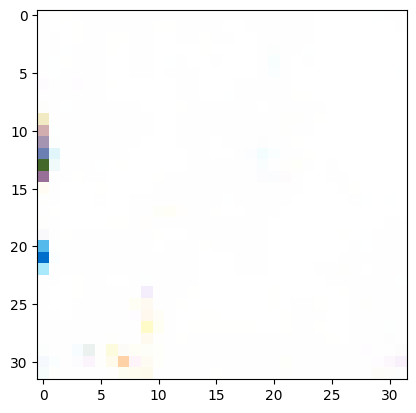

[154/500][0/936]	Loss_D: 0.0668	Loss_G: 4.9379	D(x): 1.0000	D(G(z)): 0.0638 / 0.0542
[154/500][15/936]	Loss_D: 0.0146	Loss_G: 5.2309	D(x): 1.0000	D(G(z)): 0.0143 / 0.0135
[154/500][30/936]	Loss_D: 0.0202	Loss_G: 8.0347	D(x): 0.9812	D(G(z)): 0.0006 / 0.0006
[154/500][45/936]	Loss_D: 0.0077	Loss_G: 6.0231	D(x): 0.9981	D(G(z)): 0.0058 / 0.0052
[154/500][60/936]	Loss_D: 1.0020	Loss_G: 9.1270	D(x): 0.6653	D(G(z)): 0.0002 / 0.0019
[154/500][75/936]	Loss_D: 0.0012	Loss_G: 10.8690	D(x): 0.9998	D(G(z)): 0.0010 / 0.0009
[154/500][90/936]	Loss_D: 0.0031	Loss_G: 8.4358	D(x): 0.9983	D(G(z)): 0.0014 / 0.0012
[154/500][105/936]	Loss_D: 0.0036	Loss_G: 9.4491	D(x): 0.9971	D(G(z)): 0.0007 / 0.0007
[154/500][120/936]	Loss_D: 0.0174	Loss_G: 5.7263	D(x): 1.0000	D(G(z)): 0.0169 / 0.0108
[154/500][135/936]	Loss_D: 0.0043	Loss_G: 5.8932	D(x): 1.0000	D(G(z)): 0.0043 / 0.0062
[154/500][150/936]	Loss_D: 0.0143	Loss_G: 7.0900	D(x): 0.9875	D(G(z)): 0.0017 / 0.0017
[154/500][165/936]	Loss_D: 0.0212	Loss_G: 7.9777	D

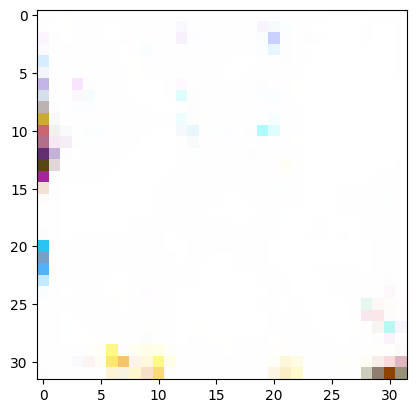

[155/500][0/936]	Loss_D: 0.0272	Loss_G: 8.1585	D(x): 1.0000	D(G(z)): 0.0258 / 0.0040
[155/500][15/936]	Loss_D: 0.0011	Loss_G: 8.2386	D(x): 0.9994	D(G(z)): 0.0005 / 0.0004
[155/500][30/936]	Loss_D: 0.0081	Loss_G: 9.8069	D(x): 0.9960	D(G(z)): 0.0040 / 0.0034
[155/500][45/936]	Loss_D: 0.0121	Loss_G: 7.6286	D(x): 1.0000	D(G(z)): 0.0119 / 0.0096
[155/500][60/936]	Loss_D: 0.0303	Loss_G: 8.1303	D(x): 0.9714	D(G(z)): 0.0007 / 0.0007
[155/500][75/936]	Loss_D: 0.0021	Loss_G: 7.4352	D(x): 1.0000	D(G(z)): 0.0021 / 0.0021
[155/500][90/936]	Loss_D: 0.0005	Loss_G: 8.1612	D(x): 0.9999	D(G(z)): 0.0004 / 0.0004
[155/500][105/936]	Loss_D: 0.0004	Loss_G: 7.9644	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[155/500][120/936]	Loss_D: 0.0041	Loss_G: 8.6504	D(x): 0.9973	D(G(z)): 0.0014 / 0.0012
[155/500][135/936]	Loss_D: 0.0035	Loss_G: 9.0633	D(x): 0.9968	D(G(z)): 0.0003 / 0.0003
[155/500][150/936]	Loss_D: 0.0100	Loss_G: 8.8147	D(x): 0.9999	D(G(z)): 0.0097 / 0.0056
[155/500][165/936]	Loss_D: 0.0023	Loss_G: 8.1050	D(

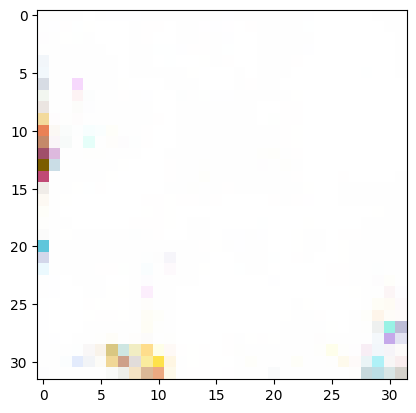

[156/500][0/936]	Loss_D: 0.0019	Loss_G: 10.4039	D(x): 0.9996	D(G(z)): 0.0015 / 0.0015
[156/500][15/936]	Loss_D: 0.0037	Loss_G: 9.0669	D(x): 0.9973	D(G(z)): 0.0010 / 0.0009
[156/500][30/936]	Loss_D: 0.0003	Loss_G: 10.6981	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[156/500][45/936]	Loss_D: 0.0063	Loss_G: 9.0215	D(x): 0.9944	D(G(z)): 0.0007 / 0.0006
[156/500][60/936]	Loss_D: 0.0008	Loss_G: 9.4773	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[156/500][75/936]	Loss_D: 0.0004	Loss_G: 10.7891	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[156/500][90/936]	Loss_D: 0.0005	Loss_G: 10.3908	D(x): 0.9995	D(G(z)): 0.0001 / 0.0001
[156/500][105/936]	Loss_D: 0.0024	Loss_G: 8.4887	D(x): 0.9989	D(G(z)): 0.0014 / 0.0013
[156/500][120/936]	Loss_D: 0.0028	Loss_G: 6.8524	D(x): 1.0000	D(G(z)): 0.0028 / 0.0027
[156/500][135/936]	Loss_D: 0.0245	Loss_G: 7.9956	D(x): 1.0000	D(G(z)): 0.0234 / 0.0012
[156/500][150/936]	Loss_D: 0.0086	Loss_G: 6.2417	D(x): 0.9982	D(G(z)): 0.0067 / 0.0052
[156/500][165/936]	Loss_D: 0.0185	Loss_G: 6.305

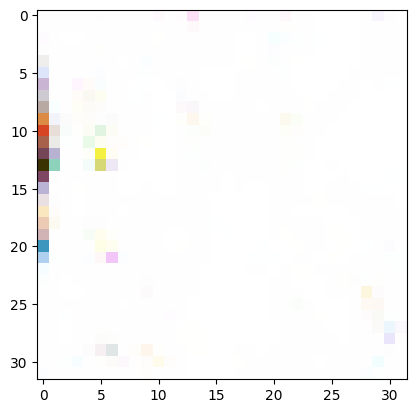

[157/500][0/936]	Loss_D: 0.0054	Loss_G: 5.2682	D(x): 1.0000	D(G(z)): 0.0054 / 0.0077
[157/500][15/936]	Loss_D: 0.0014	Loss_G: 8.8202	D(x): 0.9989	D(G(z)): 0.0002 / 0.0002
[157/500][30/936]	Loss_D: 0.0004	Loss_G: 9.0265	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[157/500][45/936]	Loss_D: 0.0001	Loss_G: 10.0552	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[157/500][60/936]	Loss_D: 0.0031	Loss_G: 11.8715	D(x): 0.9970	D(G(z)): 0.0000 / 0.0000
[157/500][75/936]	Loss_D: 0.0000	Loss_G: 10.2740	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[157/500][90/936]	Loss_D: 0.0021	Loss_G: 7.5869	D(x): 1.0000	D(G(z)): 0.0021 / 0.0019
[157/500][105/936]	Loss_D: 0.0011	Loss_G: 9.2111	D(x): 0.9993	D(G(z)): 0.0004 / 0.0004
[157/500][120/936]	Loss_D: 0.0013	Loss_G: 6.9633	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[157/500][135/936]	Loss_D: 0.0070	Loss_G: 6.5551	D(x): 0.9995	D(G(z)): 0.0065 / 0.0046
[157/500][150/936]	Loss_D: 0.0428	Loss_G: 11.0246	D(x): 0.9582	D(G(z)): 0.0001 / 0.0001
[157/500][165/936]	Loss_D: 0.0010	Loss_G: 8.357

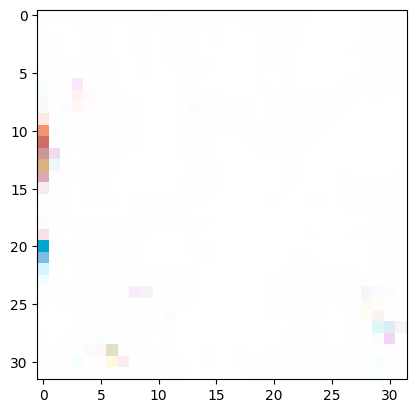

[158/500][0/936]	Loss_D: 0.0002	Loss_G: 9.3963	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[158/500][15/936]	Loss_D: 0.0003	Loss_G: 8.9727	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[158/500][30/936]	Loss_D: 0.0003	Loss_G: 10.8875	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[158/500][45/936]	Loss_D: 0.0180	Loss_G: 6.7563	D(x): 0.9841	D(G(z)): 0.0015 / 0.0016
[158/500][60/936]	Loss_D: 0.0353	Loss_G: 6.1051	D(x): 0.9980	D(G(z)): 0.0325 / 0.0131
[158/500][75/936]	Loss_D: 0.0002	Loss_G: 10.4975	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[158/500][90/936]	Loss_D: 0.0021	Loss_G: 7.6205	D(x): 0.9985	D(G(z)): 0.0006 / 0.0005
[158/500][105/936]	Loss_D: 0.0004	Loss_G: 8.5111	D(x): 0.9998	D(G(z)): 0.0002 / 0.0002
[158/500][120/936]	Loss_D: 0.0034	Loss_G: 5.7634	D(x): 1.0000	D(G(z)): 0.0034 / 0.0041
[158/500][135/936]	Loss_D: 0.0012	Loss_G: 8.0588	D(x): 1.0000	D(G(z)): 0.0011 / 0.0011
[158/500][150/936]	Loss_D: 0.0000	Loss_G: 11.6697	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[158/500][165/936]	Loss_D: 0.0004	Loss_G: 9.4568

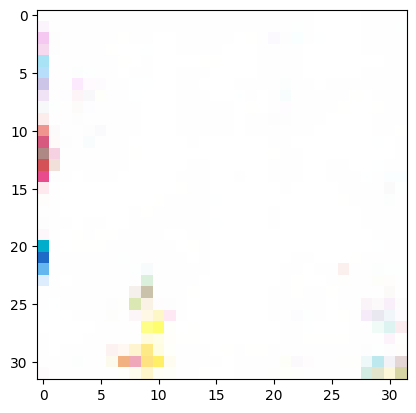

[159/500][0/936]	Loss_D: 0.0068	Loss_G: 6.0782	D(x): 0.9995	D(G(z)): 0.0063 / 0.0041
[159/500][15/936]	Loss_D: 0.0010	Loss_G: 11.7645	D(x): 0.9990	D(G(z)): 0.0000 / 0.0000
[159/500][30/936]	Loss_D: 0.0003	Loss_G: 8.9336	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[159/500][45/936]	Loss_D: 0.0031	Loss_G: 10.1360	D(x): 0.9971	D(G(z)): 0.0002 / 0.0002
[159/500][60/936]	Loss_D: 0.0027	Loss_G: 6.1440	D(x): 1.0000	D(G(z)): 0.0027 / 0.0025
[159/500][75/936]	Loss_D: 0.0071	Loss_G: 7.5360	D(x): 0.9972	D(G(z)): 0.0043 / 0.0034
[159/500][90/936]	Loss_D: 0.0029	Loss_G: 8.3564	D(x): 0.9981	D(G(z)): 0.0010 / 0.0010
[159/500][105/936]	Loss_D: 0.0001	Loss_G: 12.0449	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[159/500][120/936]	Loss_D: 0.0001	Loss_G: 10.1706	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[159/500][135/936]	Loss_D: 0.0039	Loss_G: 10.2406	D(x): 1.0000	D(G(z)): 0.0039 / 0.0030
[159/500][150/936]	Loss_D: 0.0018	Loss_G: 10.2779	D(x): 0.9984	D(G(z)): 0.0002 / 0.0003
[159/500][165/936]	Loss_D: 0.0032	Loss_G: 8.9

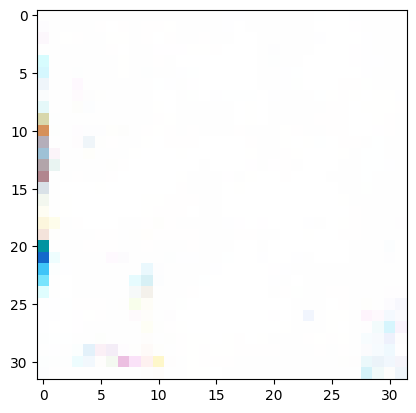

[160/500][0/936]	Loss_D: 0.0001	Loss_G: 11.3420	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[160/500][15/936]	Loss_D: 0.0003	Loss_G: 9.4569	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[160/500][30/936]	Loss_D: 0.0116	Loss_G: 4.5053	D(x): 1.0000	D(G(z)): 0.0114 / 0.0385
[160/500][45/936]	Loss_D: 0.0878	Loss_G: 5.4996	D(x): 1.0000	D(G(z)): 0.0750 / 0.0064
[160/500][60/936]	Loss_D: 0.0104	Loss_G: 7.0132	D(x): 1.0000	D(G(z)): 0.0102 / 0.0059
[160/500][75/936]	Loss_D: 0.0027	Loss_G: 6.9416	D(x): 0.9995	D(G(z)): 0.0021 / 0.0019
[160/500][90/936]	Loss_D: 0.0085	Loss_G: 5.6573	D(x): 1.0000	D(G(z)): 0.0084 / 0.0051
[160/500][105/936]	Loss_D: 0.0005	Loss_G: 8.9231	D(x): 1.0000	D(G(z)): 0.0005 / 0.0002
[160/500][120/936]	Loss_D: 0.0000	Loss_G: 11.8233	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[160/500][135/936]	Loss_D: 0.0636	Loss_G: 7.3338	D(x): 0.9999	D(G(z)): 0.0563 / 0.0008
[160/500][150/936]	Loss_D: 0.0081	Loss_G: 6.3382	D(x): 0.9997	D(G(z)): 0.0077 / 0.0054
[160/500][165/936]	Loss_D: 0.0067	Loss_G: 6.2829	

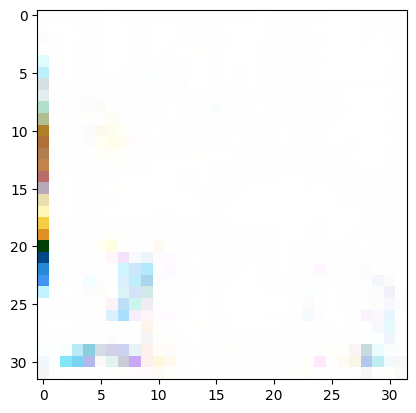

[161/500][0/936]	Loss_D: 0.0003	Loss_G: 8.6354	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[161/500][15/936]	Loss_D: 0.0009	Loss_G: 9.2925	D(x): 0.9993	D(G(z)): 0.0002 / 0.0002
[161/500][30/936]	Loss_D: 0.0021	Loss_G: 7.8033	D(x): 0.9988	D(G(z)): 0.0009 / 0.0009
[161/500][45/936]	Loss_D: 0.0028	Loss_G: 9.5153	D(x): 1.0000	D(G(z)): 0.0028 / 0.0026
[161/500][60/936]	Loss_D: 0.0031	Loss_G: 7.0067	D(x): 0.9986	D(G(z)): 0.0016 / 0.0016
[161/500][75/936]	Loss_D: 0.0379	Loss_G: 6.7425	D(x): 0.9662	D(G(z)): 0.0032 / 0.0037
[161/500][90/936]	Loss_D: 0.0031	Loss_G: 7.1827	D(x): 0.9999	D(G(z)): 0.0030 / 0.0030
[161/500][105/936]	Loss_D: 0.0259	Loss_G: 5.0277	D(x): 0.9999	D(G(z)): 0.0252 / 0.0090
[161/500][120/936]	Loss_D: 0.0002	Loss_G: 9.1603	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[161/500][135/936]	Loss_D: 0.0003	Loss_G: 9.4852	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[161/500][150/936]	Loss_D: 0.0162	Loss_G: 8.9168	D(x): 0.9848	D(G(z)): 0.0008 / 0.0010
[161/500][165/936]	Loss_D: 0.0044	Loss_G: 8.9795	D(

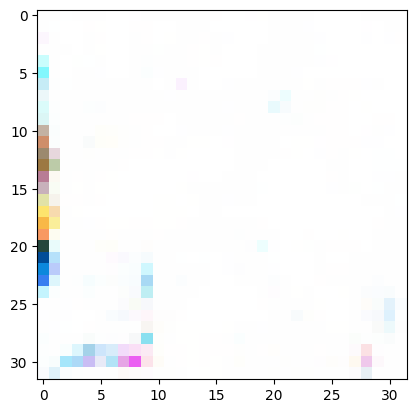

[162/500][0/936]	Loss_D: 0.0027	Loss_G: 7.7758	D(x): 0.9978	D(G(z)): 0.0005 / 0.0005
[162/500][15/936]	Loss_D: 0.0009	Loss_G: 7.7728	D(x): 0.9998	D(G(z)): 0.0007 / 0.0007
[162/500][30/936]	Loss_D: 2.6480	Loss_G: 4.1217	D(x): 0.1245	D(G(z)): 0.0003 / 0.1788
[162/500][45/936]	Loss_D: 0.0129	Loss_G: 9.4430	D(x): 0.9911	D(G(z)): 0.0039 / 0.0032
[162/500][60/936]	Loss_D: 1.8615	Loss_G: 7.8909	D(x): 0.6446	D(G(z)): 0.0001 / 0.0006
[162/500][75/936]	Loss_D: 0.0008	Loss_G: 8.9447	D(x): 0.9995	D(G(z)): 0.0002 / 0.0002
[162/500][90/936]	Loss_D: 0.0012	Loss_G: 8.6142	D(x): 1.0000	D(G(z)): 0.0011 / 0.0011
[162/500][105/936]	Loss_D: 0.0281	Loss_G: 4.9031	D(x): 1.0000	D(G(z)): 0.0275 / 0.0093
[162/500][120/936]	Loss_D: 0.0113	Loss_G: 6.3347	D(x): 1.0000	D(G(z)): 0.0112 / 0.0096
[162/500][135/936]	Loss_D: 0.0006	Loss_G: 8.7202	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[162/500][150/936]	Loss_D: 0.0792	Loss_G: 5.7730	D(x): 0.9559	D(G(z)): 0.0315 / 0.0069
[162/500][165/936]	Loss_D: 0.0006	Loss_G: 10.5258	D

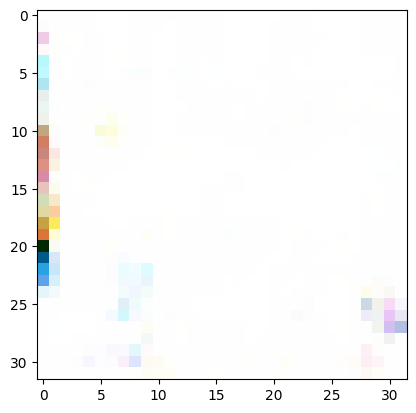

[163/500][0/936]	Loss_D: 0.0384	Loss_G: 6.4180	D(x): 1.0000	D(G(z)): 0.0367 / 0.0098
[163/500][15/936]	Loss_D: 0.0029	Loss_G: 10.4129	D(x): 0.9999	D(G(z)): 0.0028 / 0.0022
[163/500][30/936]	Loss_D: 0.0007	Loss_G: 8.5210	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[163/500][45/936]	Loss_D: 0.0010	Loss_G: 8.2518	D(x): 1.0000	D(G(z)): 0.0010 / 0.0014
[163/500][60/936]	Loss_D: 0.0001	Loss_G: 10.1599	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[163/500][75/936]	Loss_D: 0.0003	Loss_G: 9.7635	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[163/500][90/936]	Loss_D: 0.0048	Loss_G: 7.1571	D(x): 0.9988	D(G(z)): 0.0035 / 0.0026
[163/500][105/936]	Loss_D: 0.0003	Loss_G: 9.5498	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[163/500][120/936]	Loss_D: 0.0003	Loss_G: 9.5704	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[163/500][135/936]	Loss_D: 0.0002	Loss_G: 10.2298	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[163/500][150/936]	Loss_D: 0.0001	Loss_G: 9.4892	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[163/500][165/936]	Loss_D: 0.0138	Loss_G: 6.1828

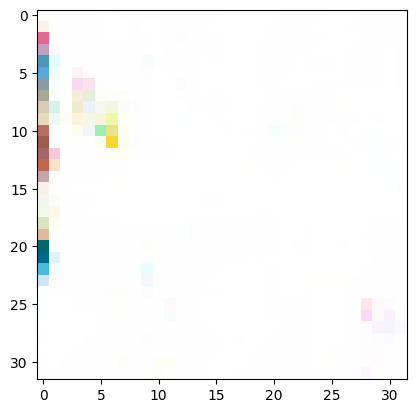

[164/500][0/936]	Loss_D: 0.3542	Loss_G: 7.6754	D(x): 1.0000	D(G(z)): 0.2561 / 0.0031
[164/500][15/936]	Loss_D: 0.8114	Loss_G: 4.0905	D(x): 0.5100	D(G(z)): 0.0006 / 0.0508
[164/500][30/936]	Loss_D: 0.0378	Loss_G: 7.2058	D(x): 0.9997	D(G(z)): 0.0354 / 0.0288
[164/500][45/936]	Loss_D: 0.0174	Loss_G: 4.9917	D(x): 1.0000	D(G(z)): 0.0171 / 0.0131
[164/500][60/936]	Loss_D: 0.3541	Loss_G: 8.5624	D(x): 0.9874	D(G(z)): 0.1943 / 0.0012
[164/500][75/936]	Loss_D: 0.0160	Loss_G: 5.3510	D(x): 1.0000	D(G(z)): 0.0158 / 0.0084
[164/500][90/936]	Loss_D: 0.0024	Loss_G: 10.5032	D(x): 0.9976	D(G(z)): 0.0000 / 0.0000
[164/500][105/936]	Loss_D: 0.0012	Loss_G: 8.8823	D(x): 1.0000	D(G(z)): 0.0012 / 0.0009
[164/500][120/936]	Loss_D: 0.0055	Loss_G: 8.4293	D(x): 0.9969	D(G(z)): 0.0024 / 0.0022
[164/500][135/936]	Loss_D: 0.0280	Loss_G: 6.7153	D(x): 1.0000	D(G(z)): 0.0269 / 0.0041
[164/500][150/936]	Loss_D: 0.0004	Loss_G: 8.1201	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[164/500][165/936]	Loss_D: 0.0062	Loss_G: 7.7695	D

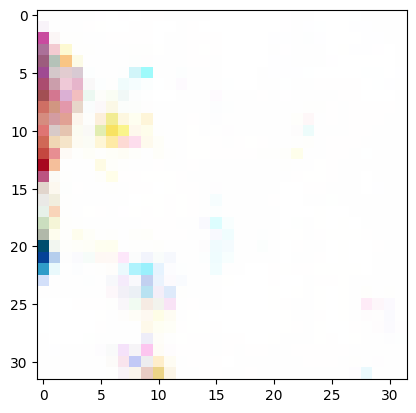

[165/500][0/936]	Loss_D: 0.0015	Loss_G: 10.6675	D(x): 0.9988	D(G(z)): 0.0002 / 0.0003
[165/500][15/936]	Loss_D: 0.0055	Loss_G: 8.3575	D(x): 0.9993	D(G(z)): 0.0047 / 0.0031
[165/500][30/936]	Loss_D: 0.0004	Loss_G: 10.1457	D(x): 0.9996	D(G(z)): 0.0000 / 0.0001
[165/500][45/936]	Loss_D: 0.0006	Loss_G: 10.1658	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[165/500][60/936]	Loss_D: 0.0135	Loss_G: 6.3264	D(x): 1.0000	D(G(z)): 0.0132 / 0.0138
[165/500][75/936]	Loss_D: 0.0037	Loss_G: 7.4563	D(x): 0.9990	D(G(z)): 0.0026 / 0.0021
[165/500][90/936]	Loss_D: 0.0002	Loss_G: 9.6459	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[165/500][105/936]	Loss_D: 0.0027	Loss_G: 8.1268	D(x): 1.0000	D(G(z)): 0.0026 / 0.0023
[165/500][120/936]	Loss_D: 0.0003	Loss_G: 9.4513	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[165/500][135/936]	Loss_D: 0.0314	Loss_G: 6.5931	D(x): 0.9747	D(G(z)): 0.0049 / 0.0041
[165/500][150/936]	Loss_D: 0.0010	Loss_G: 10.4842	D(x): 0.9998	D(G(z)): 0.0008 / 0.0007
[165/500][165/936]	Loss_D: 0.0027	Loss_G: 9.394

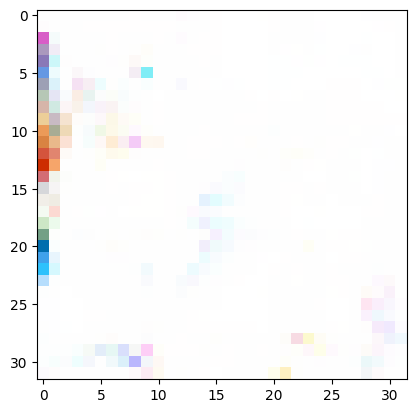

[166/500][0/936]	Loss_D: 0.0123	Loss_G: 7.5080	D(x): 0.9981	D(G(z)): 0.0103 / 0.0045
[166/500][15/936]	Loss_D: 0.0340	Loss_G: 5.5161	D(x): 1.0000	D(G(z)): 0.0329 / 0.0124
[166/500][30/936]	Loss_D: 0.0053	Loss_G: 5.9259	D(x): 1.0000	D(G(z)): 0.0053 / 0.0043
[166/500][45/936]	Loss_D: 0.0010	Loss_G: 7.4536	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[166/500][60/936]	Loss_D: 0.0014	Loss_G: 9.3443	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[166/500][75/936]	Loss_D: 0.0907	Loss_G: 7.6773	D(x): 1.0000	D(G(z)): 0.0779 / 0.0026
[166/500][90/936]	Loss_D: 0.0065	Loss_G: 8.3957	D(x): 1.0000	D(G(z)): 0.0064 / 0.0031
[166/500][105/936]	Loss_D: 0.0009	Loss_G: 7.7609	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[166/500][120/936]	Loss_D: 0.0016	Loss_G: 8.2832	D(x): 0.9999	D(G(z)): 0.0015 / 0.0012
[166/500][135/936]	Loss_D: 0.0221	Loss_G: 6.5737	D(x): 1.0000	D(G(z)): 0.0213 / 0.0119
[166/500][150/936]	Loss_D: 0.0271	Loss_G: 5.0386	D(x): 1.0000	D(G(z)): 0.0264 / 0.0109
[166/500][165/936]	Loss_D: 0.0034	Loss_G: 8.5829	D(

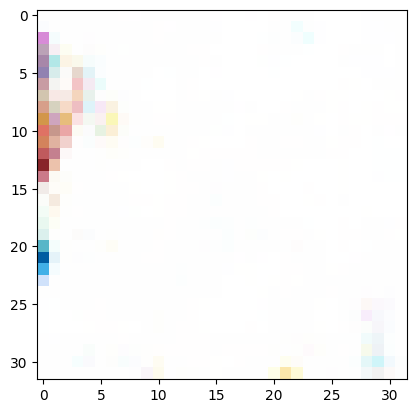

[167/500][0/936]	Loss_D: 0.0065	Loss_G: 7.3564	D(x): 0.9998	D(G(z)): 0.0063 / 0.0045
[167/500][15/936]	Loss_D: 0.0008	Loss_G: 8.7103	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[167/500][30/936]	Loss_D: 0.0038	Loss_G: 9.8688	D(x): 0.9963	D(G(z)): 0.0001 / 0.0001
[167/500][45/936]	Loss_D: 0.0112	Loss_G: 8.8065	D(x): 0.9905	D(G(z)): 0.0016 / 0.0016
[167/500][60/936]	Loss_D: 0.0157	Loss_G: 5.2476	D(x): 1.0000	D(G(z)): 0.0155 / 0.0085
[167/500][75/936]	Loss_D: 0.0011	Loss_G: 7.8821	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[167/500][90/936]	Loss_D: 0.0011	Loss_G: 7.9366	D(x): 0.9994	D(G(z)): 0.0005 / 0.0005
[167/500][105/936]	Loss_D: 0.0006	Loss_G: 11.2400	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[167/500][120/936]	Loss_D: 0.0176	Loss_G: 6.7538	D(x): 0.9850	D(G(z)): 0.0024 / 0.0023
[167/500][135/936]	Loss_D: 0.0593	Loss_G: 8.5583	D(x): 0.9673	D(G(z)): 0.0239 / 0.0092
[167/500][150/936]	Loss_D: 0.0010	Loss_G: 10.9670	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[167/500][165/936]	Loss_D: 0.0003	Loss_G: 10.1042

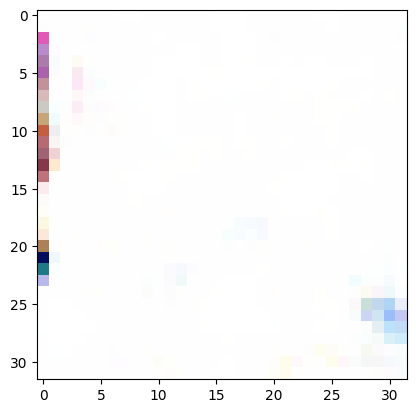

[168/500][0/936]	Loss_D: 0.0271	Loss_G: 4.2423	D(x): 1.0000	D(G(z)): 0.0263 / 0.0625
[168/500][15/936]	Loss_D: 0.2017	Loss_G: 8.3584	D(x): 0.9999	D(G(z)): 0.1444 / 0.0012
[168/500][30/936]	Loss_D: 0.2445	Loss_G: 8.7426	D(x): 0.9984	D(G(z)): 0.1756 / 0.0012
[168/500][45/936]	Loss_D: 0.0061	Loss_G: 6.3846	D(x): 0.9966	D(G(z)): 0.0026 / 0.0031
[168/500][60/936]	Loss_D: 0.0054	Loss_G: 7.8431	D(x): 0.9990	D(G(z)): 0.0044 / 0.0036
[168/500][75/936]	Loss_D: 0.0008	Loss_G: 8.7528	D(x): 1.0000	D(G(z)): 0.0008 / 0.0006
[168/500][90/936]	Loss_D: 0.0037	Loss_G: 9.4169	D(x): 0.9977	D(G(z)): 0.0014 / 0.0014
[168/500][105/936]	Loss_D: 0.0967	Loss_G: 5.5971	D(x): 0.9142	D(G(z)): 0.0028 / 0.0064
[168/500][120/936]	Loss_D: 0.0002	Loss_G: 9.9674	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[168/500][135/936]	Loss_D: 0.0023	Loss_G: 6.9683	D(x): 0.9998	D(G(z)): 0.0020 / 0.0018
[168/500][150/936]	Loss_D: 0.0035	Loss_G: 6.7201	D(x): 0.9985	D(G(z)): 0.0021 / 0.0019
[168/500][165/936]	Loss_D: 0.0003	Loss_G: 8.7700	D(

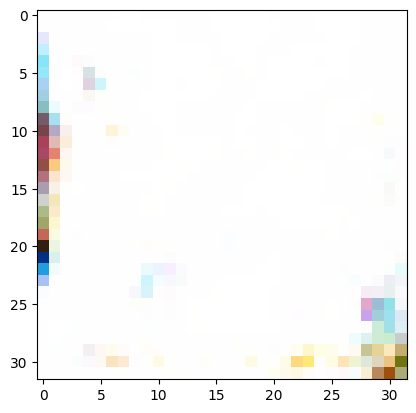

[169/500][0/936]	Loss_D: 0.0149	Loss_G: 6.2446	D(x): 0.9996	D(G(z)): 0.0141 / 0.0073
[169/500][15/936]	Loss_D: 0.0156	Loss_G: 5.6954	D(x): 0.9998	D(G(z)): 0.0152 / 0.0080
[169/500][30/936]	Loss_D: 0.0024	Loss_G: 9.6830	D(x): 0.9982	D(G(z)): 0.0006 / 0.0005
[169/500][45/936]	Loss_D: 0.0295	Loss_G: 7.4784	D(x): 0.9995	D(G(z)): 0.0275 / 0.0027
[169/500][60/936]	Loss_D: 0.0399	Loss_G: 6.6164	D(x): 0.9629	D(G(z)): 0.0018 / 0.0027
[169/500][75/936]	Loss_D: 0.0015	Loss_G: 7.8087	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
[169/500][90/936]	Loss_D: 0.0013	Loss_G: 7.8921	D(x): 0.9999	D(G(z)): 0.0012 / 0.0010
[169/500][105/936]	Loss_D: 0.0009	Loss_G: 8.6931	D(x): 1.0000	D(G(z)): 0.0009 / 0.0006
[169/500][120/936]	Loss_D: 0.0018	Loss_G: 10.2299	D(x): 0.9984	D(G(z)): 0.0001 / 0.0001
[169/500][135/936]	Loss_D: 0.0071	Loss_G: 5.9043	D(x): 0.9993	D(G(z)): 0.0065 / 0.0035
[169/500][150/936]	Loss_D: 0.0048	Loss_G: 6.8101	D(x): 0.9999	D(G(z)): 0.0047 / 0.0038
[169/500][165/936]	Loss_D: 0.0381	Loss_G: 7.3434	D

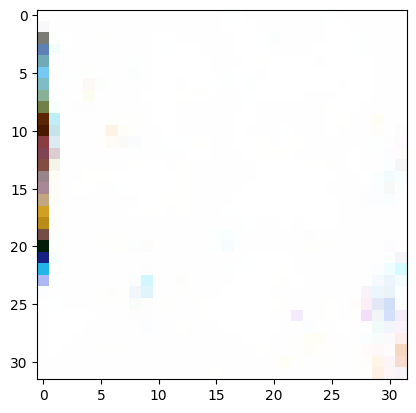

[170/500][0/936]	Loss_D: 0.0108	Loss_G: 5.1333	D(x): 1.0000	D(G(z)): 0.0107 / 0.0077
[170/500][15/936]	Loss_D: 0.0002	Loss_G: 11.0729	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[170/500][30/936]	Loss_D: 0.0019	Loss_G: 6.3998	D(x): 0.9999	D(G(z)): 0.0018 / 0.0017
[170/500][45/936]	Loss_D: 0.0009	Loss_G: 9.4028	D(x): 0.9998	D(G(z)): 0.0007 / 0.0006
[170/500][60/936]	Loss_D: 0.0029	Loss_G: 8.1002	D(x): 0.9989	D(G(z)): 0.0018 / 0.0019
[170/500][75/936]	Loss_D: 0.0137	Loss_G: 9.6261	D(x): 0.9870	D(G(z)): 0.0004 / 0.0003
[170/500][90/936]	Loss_D: 0.0009	Loss_G: 7.9070	D(x): 0.9998	D(G(z)): 0.0006 / 0.0006
[170/500][105/936]	Loss_D: 0.0061	Loss_G: 7.4932	D(x): 0.9999	D(G(z)): 0.0059 / 0.0038
[170/500][120/936]	Loss_D: 0.0001	Loss_G: 9.8196	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[170/500][135/936]	Loss_D: 0.0144	Loss_G: 6.0755	D(x): 0.9998	D(G(z)): 0.0140 / 0.0072
[170/500][150/936]	Loss_D: 0.0034	Loss_G: 7.9464	D(x): 1.0000	D(G(z)): 0.0033 / 0.0023
[170/500][165/936]	Loss_D: 0.0018	Loss_G: 6.5545	D

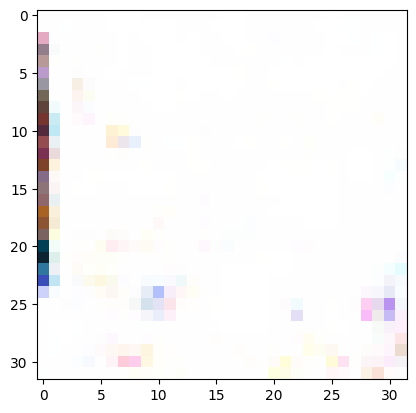

[171/500][0/936]	Loss_D: 0.0394	Loss_G: 3.1979	D(x): 0.9664	D(G(z)): 0.0049 / 0.0550
[171/500][15/936]	Loss_D: 0.0020	Loss_G: 8.5184	D(x): 0.9986	D(G(z)): 0.0005 / 0.0004
[171/500][30/936]	Loss_D: 0.0253	Loss_G: 7.4550	D(x): 0.9978	D(G(z)): 0.0223 / 0.0018
[171/500][45/936]	Loss_D: 0.0007	Loss_G: 9.9892	D(x): 0.9995	D(G(z)): 0.0002 / 0.0002
[171/500][60/936]	Loss_D: 0.0024	Loss_G: 6.3705	D(x): 1.0000	D(G(z)): 0.0024 / 0.0021
[171/500][75/936]	Loss_D: 0.0037	Loss_G: 7.4021	D(x): 0.9975	D(G(z)): 0.0012 / 0.0008
[171/500][90/936]	Loss_D: 0.0001	Loss_G: 11.5102	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[171/500][105/936]	Loss_D: 0.0014	Loss_G: 9.8169	D(x): 0.9987	D(G(z)): 0.0001 / 0.0001
[171/500][120/936]	Loss_D: 0.0047	Loss_G: 7.0405	D(x): 0.9973	D(G(z)): 0.0020 / 0.0026
[171/500][135/936]	Loss_D: 0.0088	Loss_G: 8.1583	D(x): 1.0000	D(G(z)): 0.0086 / 0.0196
[171/500][150/936]	Loss_D: 0.0036	Loss_G: 9.1087	D(x): 0.9970	D(G(z)): 0.0006 / 0.0006
[171/500][165/936]	Loss_D: 0.0951	Loss_G: 11.2146	

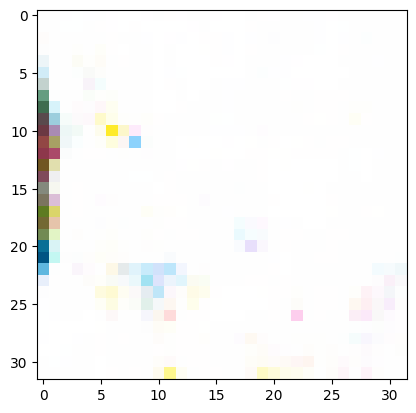

[172/500][0/936]	Loss_D: 0.0006	Loss_G: 8.3977	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[172/500][15/936]	Loss_D: 0.0006	Loss_G: 9.1249	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[172/500][30/936]	Loss_D: 0.0016	Loss_G: 7.5087	D(x): 1.0000	D(G(z)): 0.0016 / 0.0017
[172/500][45/936]	Loss_D: 0.0008	Loss_G: 8.4765	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[172/500][60/936]	Loss_D: 0.0001	Loss_G: 10.5925	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[172/500][75/936]	Loss_D: 0.0177	Loss_G: 10.0435	D(x): 0.9829	D(G(z)): 0.0003 / 0.0004
[172/500][90/936]	Loss_D: 0.0069	Loss_G: 10.8649	D(x): 0.9933	D(G(z)): 0.0002 / 0.0002
[172/500][105/936]	Loss_D: 0.0080	Loss_G: 8.3752	D(x): 1.0000	D(G(z)): 0.0079 / 0.0062
[172/500][120/936]	Loss_D: 0.0003	Loss_G: 8.8511	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[172/500][135/936]	Loss_D: 0.0003	Loss_G: 8.3183	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[172/500][150/936]	Loss_D: 0.0015	Loss_G: 8.2673	D(x): 0.9999	D(G(z)): 0.0014 / 0.0012
[172/500][165/936]	Loss_D: 0.0001	Loss_G: 9.9782

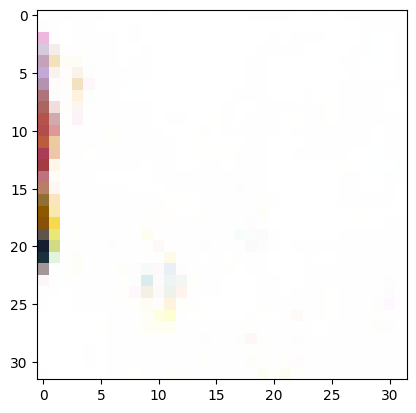

[173/500][0/936]	Loss_D: 0.0011	Loss_G: 8.2587	D(x): 0.9999	D(G(z)): 0.0010 / 0.0010
[173/500][15/936]	Loss_D: 0.0014	Loss_G: 7.3593	D(x): 1.0000	D(G(z)): 0.0014 / 0.0014
[173/500][30/936]	Loss_D: 0.0058	Loss_G: 7.8515	D(x): 0.9973	D(G(z)): 0.0030 / 0.0026
[173/500][45/936]	Loss_D: 0.0003	Loss_G: 8.7500	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[173/500][60/936]	Loss_D: 0.0038	Loss_G: 5.7977	D(x): 1.0000	D(G(z)): 0.0038 / 0.0040
[173/500][75/936]	Loss_D: 0.0002	Loss_G: 8.9307	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[173/500][90/936]	Loss_D: 0.0019	Loss_G: 8.0034	D(x): 1.0000	D(G(z)): 0.0019 / 0.0018
[173/500][105/936]	Loss_D: 0.0006	Loss_G: 8.9669	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[173/500][120/936]	Loss_D: 0.0009	Loss_G: 9.2048	D(x): 0.9999	D(G(z)): 0.0008 / 0.0006
[173/500][135/936]	Loss_D: 0.0444	Loss_G: 6.6939	D(x): 1.0000	D(G(z)): 0.0410 / 0.0031
[173/500][150/936]	Loss_D: 0.0091	Loss_G: 6.6011	D(x): 0.9974	D(G(z)): 0.0065 / 0.0055
[173/500][165/936]	Loss_D: 0.0324	Loss_G: 9.7853	D(

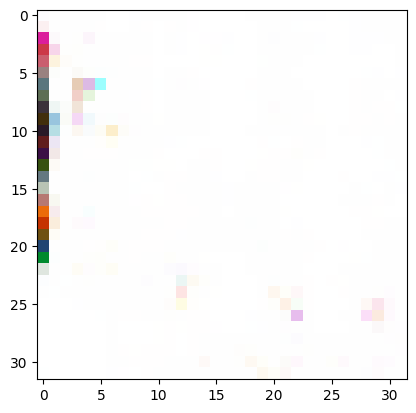

[174/500][0/936]	Loss_D: 0.0042	Loss_G: 9.1103	D(x): 1.0000	D(G(z)): 0.0042 / 0.0036
[174/500][15/936]	Loss_D: 0.0060	Loss_G: 8.6245	D(x): 0.9999	D(G(z)): 0.0059 / 0.0024
[174/500][30/936]	Loss_D: 0.0002	Loss_G: 10.5217	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[174/500][45/936]	Loss_D: 0.0001	Loss_G: 10.6673	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[174/500][60/936]	Loss_D: 0.0031	Loss_G: 7.6452	D(x): 0.9997	D(G(z)): 0.0028 / 0.0023
[174/500][75/936]	Loss_D: 0.0001	Loss_G: 11.2983	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[174/500][90/936]	Loss_D: 0.0014	Loss_G: 8.1424	D(x): 1.0000	D(G(z)): 0.0013 / 0.0013
[174/500][105/936]	Loss_D: 0.0001	Loss_G: 10.7333	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[174/500][120/936]	Loss_D: 0.0167	Loss_G: 8.5776	D(x): 0.9844	D(G(z)): 0.0007 / 0.0007
[174/500][135/936]	Loss_D: 0.0573	Loss_G: 7.0084	D(x): 1.0000	D(G(z)): 0.0517 / 0.0014
[174/500][150/936]	Loss_D: 0.0066	Loss_G: 7.2538	D(x): 1.0000	D(G(z)): 0.0065 / 0.0047
[174/500][165/936]	Loss_D: 0.0006	Loss_G: 10.75

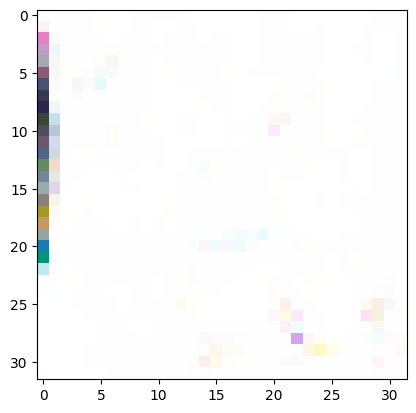

[175/500][0/936]	Loss_D: 0.0011	Loss_G: 8.7251	D(x): 0.9996	D(G(z)): 0.0007 / 0.0007
[175/500][15/936]	Loss_D: 0.0008	Loss_G: 10.4831	D(x): 0.9996	D(G(z)): 0.0004 / 0.0004
[175/500][30/936]	Loss_D: 0.0114	Loss_G: 7.1395	D(x): 0.9911	D(G(z)): 0.0024 / 0.0023
[175/500][45/936]	Loss_D: 0.0000	Loss_G: 11.2017	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[175/500][60/936]	Loss_D: 0.0007	Loss_G: 11.4790	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[175/500][75/936]	Loss_D: 0.0002	Loss_G: 9.7485	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[175/500][90/936]	Loss_D: 0.0006	Loss_G: 10.2677	D(x): 0.9995	D(G(z)): 0.0001 / 0.0001
[175/500][105/936]	Loss_D: 0.0006	Loss_G: 9.3823	D(x): 0.9995	D(G(z)): 0.0001 / 0.0001
[175/500][120/936]	Loss_D: 0.0005	Loss_G: 9.1316	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[175/500][135/936]	Loss_D: 0.0017	Loss_G: 7.0626	D(x): 0.9997	D(G(z)): 0.0013 / 0.0012
[175/500][150/936]	Loss_D: 0.1216	Loss_G: 9.8907	D(x): 0.8976	D(G(z)): 0.0000 / 0.0001
[175/500][165/936]	Loss_D: 0.0014	Loss_G: 7.521

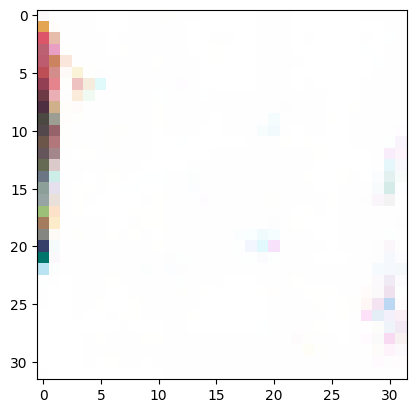

[176/500][0/936]	Loss_D: 0.0003	Loss_G: 9.2733	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[176/500][15/936]	Loss_D: 0.0018	Loss_G: 9.6841	D(x): 0.9992	D(G(z)): 0.0009 / 0.0010
[176/500][30/936]	Loss_D: 0.0100	Loss_G: 7.9816	D(x): 0.9909	D(G(z)): 0.0007 / 0.0008
[176/500][45/936]	Loss_D: 0.0012	Loss_G: 9.3985	D(x): 1.0000	D(G(z)): 0.0012 / 0.0011
[176/500][60/936]	Loss_D: 0.4913	Loss_G: 5.2591	D(x): 0.7094	D(G(z)): 0.0519 / 0.0674
[176/500][75/936]	Loss_D: 0.0004	Loss_G: 13.8203	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[176/500][90/936]	Loss_D: 0.0105	Loss_G: 9.0489	D(x): 0.9906	D(G(z)): 0.0010 / 0.0009
[176/500][105/936]	Loss_D: 0.0088	Loss_G: 6.4167	D(x): 1.0000	D(G(z)): 0.0087 / 0.0050
[176/500][120/936]	Loss_D: 0.0080	Loss_G: 7.7468	D(x): 1.0000	D(G(z)): 0.0079 / 0.0028
[176/500][135/936]	Loss_D: 0.0059	Loss_G: 7.7291	D(x): 0.9957	D(G(z)): 0.0016 / 0.0015
[176/500][150/936]	Loss_D: 0.0004	Loss_G: 9.1587	D(x): 0.9997	D(G(z)): 0.0001 / 0.0001
[176/500][165/936]	Loss_D: 0.0043	Loss_G: 6.2869	D

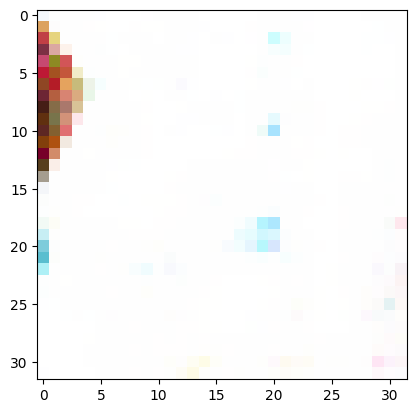

[177/500][0/936]	Loss_D: 0.0004	Loss_G: 9.7538	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[177/500][15/936]	Loss_D: 0.0001	Loss_G: 10.7203	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[177/500][30/936]	Loss_D: 0.0001	Loss_G: 11.9406	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[177/500][45/936]	Loss_D: 0.0028	Loss_G: 10.9382	D(x): 0.9978	D(G(z)): 0.0005 / 0.0005
[177/500][60/936]	Loss_D: 0.0006	Loss_G: 8.9035	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[177/500][75/936]	Loss_D: 0.0087	Loss_G: 8.8517	D(x): 0.9999	D(G(z)): 0.0084 / 0.0024
[177/500][90/936]	Loss_D: 0.0122	Loss_G: 5.7201	D(x): 0.9991	D(G(z)): 0.0112 / 0.0060
[177/500][105/936]	Loss_D: 0.0060	Loss_G: 10.4148	D(x): 0.9966	D(G(z)): 0.0025 / 0.0020
[177/500][120/936]	Loss_D: 0.0012	Loss_G: 9.2070	D(x): 1.0000	D(G(z)): 0.0012 / 0.0012
[177/500][135/936]	Loss_D: 0.0003	Loss_G: 11.8694	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[177/500][150/936]	Loss_D: 0.0019	Loss_G: 7.3086	D(x): 0.9999	D(G(z)): 0.0018 / 0.0016
[177/500][165/936]	Loss_D: 0.1562	Loss_G: 7.72

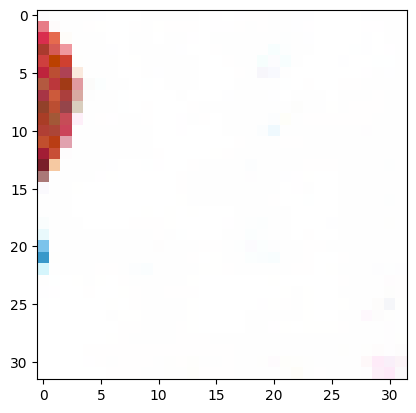

[178/500][0/936]	Loss_D: 0.0000	Loss_G: 13.4448	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[178/500][15/936]	Loss_D: 0.0053	Loss_G: 9.5663	D(x): 1.0000	D(G(z)): 0.0052 / 0.0026
[178/500][30/936]	Loss_D: 0.0111	Loss_G: 5.9923	D(x): 0.9964	D(G(z)): 0.0074 / 0.0064
[178/500][45/936]	Loss_D: 0.0111	Loss_G: 6.2884	D(x): 0.9941	D(G(z)): 0.0051 / 0.0042
[178/500][60/936]	Loss_D: 0.0002	Loss_G: 10.7621	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[178/500][75/936]	Loss_D: 0.0004	Loss_G: 8.1816	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[178/500][90/936]	Loss_D: 0.1186	Loss_G: 7.1730	D(x): 1.0000	D(G(z)): 0.1030 / 0.0046
[178/500][105/936]	Loss_D: 0.0133	Loss_G: 10.7942	D(x): 1.0000	D(G(z)): 0.0129 / 0.0069
[178/500][120/936]	Loss_D: 0.0009	Loss_G: 9.5032	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[178/500][135/936]	Loss_D: 0.0082	Loss_G: 10.6457	D(x): 0.9919	D(G(z)): 0.0000 / 0.0001
[178/500][150/936]	Loss_D: 0.0026	Loss_G: 8.2745	D(x): 0.9998	D(G(z)): 0.0024 / 0.0022
[178/500][165/936]	Loss_D: 0.0013	Loss_G: 9.852

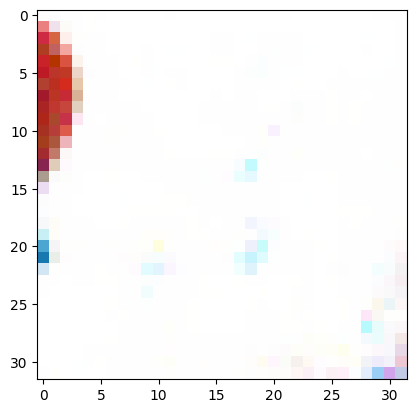

[179/500][0/936]	Loss_D: 0.0037	Loss_G: 10.6270	D(x): 0.9969	D(G(z)): 0.0006 / 0.0006
[179/500][15/936]	Loss_D: 0.0011	Loss_G: 9.0360	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[179/500][30/936]	Loss_D: 0.0032	Loss_G: 6.6253	D(x): 0.9998	D(G(z)): 0.0030 / 0.0025
[179/500][45/936]	Loss_D: 0.0000	Loss_G: 13.8377	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[179/500][60/936]	Loss_D: 0.1691	Loss_G: 8.7374	D(x): 1.0000	D(G(z)): 0.1416 / 0.0006
[179/500][75/936]	Loss_D: 0.0045	Loss_G: 9.5352	D(x): 1.0000	D(G(z)): 0.0045 / 0.0037
[179/500][90/936]	Loss_D: 0.0003	Loss_G: 8.7007	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[179/500][105/936]	Loss_D: 0.0017	Loss_G: 12.2795	D(x): 0.9984	D(G(z)): 0.0000 / 0.0000
[179/500][120/936]	Loss_D: 0.0016	Loss_G: 7.6162	D(x): 0.9996	D(G(z)): 0.0012 / 0.0011
[179/500][135/936]	Loss_D: 0.0041	Loss_G: 6.0281	D(x): 1.0000	D(G(z)): 0.0040 / 0.0031
[179/500][150/936]	Loss_D: 0.0010	Loss_G: 8.6827	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[179/500][165/936]	Loss_D: 0.0006	Loss_G: 8.1748

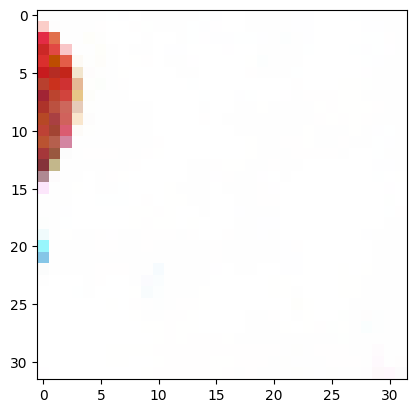

[180/500][0/936]	Loss_D: 0.0013	Loss_G: 9.3973	D(x): 0.9997	D(G(z)): 0.0010 / 0.0010
[180/500][15/936]	Loss_D: 0.0743	Loss_G: 6.4899	D(x): 0.9844	D(G(z)): 0.0532 / 0.0114
[180/500][30/936]	Loss_D: 0.0217	Loss_G: 7.5528	D(x): 1.0000	D(G(z)): 0.0211 / 0.0063
[180/500][45/936]	Loss_D: 0.0064	Loss_G: 6.7598	D(x): 1.0000	D(G(z)): 0.0063 / 0.0049
[180/500][60/936]	Loss_D: 0.0031	Loss_G: 9.0301	D(x): 0.9991	D(G(z)): 0.0022 / 0.0021
[180/500][75/936]	Loss_D: 0.0003	Loss_G: 9.0877	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[180/500][90/936]	Loss_D: 0.0010	Loss_G: 7.3123	D(x): 0.9999	D(G(z)): 0.0009 / 0.0008
[180/500][105/936]	Loss_D: 0.0034	Loss_G: 8.7937	D(x): 1.0000	D(G(z)): 0.0034 / 0.0029
[180/500][120/936]	Loss_D: 0.0819	Loss_G: 8.2510	D(x): 0.9308	D(G(z)): 0.0011 / 0.0021
[180/500][135/936]	Loss_D: 0.0096	Loss_G: 8.9291	D(x): 0.9908	D(G(z)): 0.0003 / 0.0003
[180/500][150/936]	Loss_D: 0.0024	Loss_G: 7.7369	D(x): 0.9986	D(G(z)): 0.0010 / 0.0010
[180/500][165/936]	Loss_D: 0.0012	Loss_G: 10.0210	D

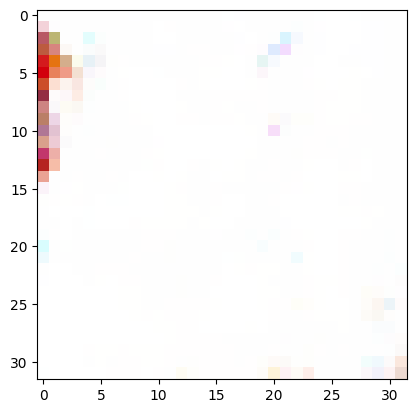

[181/500][0/936]	Loss_D: 0.0032	Loss_G: 7.8396	D(x): 1.0000	D(G(z)): 0.0032 / 0.0024
[181/500][15/936]	Loss_D: 0.0481	Loss_G: 7.1916	D(x): 0.9999	D(G(z)): 0.0439 / 0.0015
[181/500][30/936]	Loss_D: 0.0022	Loss_G: 6.8945	D(x): 1.0000	D(G(z)): 0.0022 / 0.0024
[181/500][45/936]	Loss_D: 0.0103	Loss_G: 5.9366	D(x): 1.0000	D(G(z)): 0.0102 / 0.0069
[181/500][60/936]	Loss_D: 0.0068	Loss_G: 9.3425	D(x): 0.9937	D(G(z)): 0.0004 / 0.0004
[181/500][75/936]	Loss_D: 0.0006	Loss_G: 11.1359	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[181/500][90/936]	Loss_D: 0.0019	Loss_G: 7.1954	D(x): 1.0000	D(G(z)): 0.0019 / 0.0018
[181/500][105/936]	Loss_D: 0.0003	Loss_G: 11.3744	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[181/500][120/936]	Loss_D: 0.0552	Loss_G: 8.1421	D(x): 1.0000	D(G(z)): 0.0513 / 0.0133
[181/500][135/936]	Loss_D: 0.0001	Loss_G: 11.9189	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[181/500][150/936]	Loss_D: 0.0020	Loss_G: 7.8686	D(x): 1.0000	D(G(z)): 0.0020 / 0.0021
[181/500][165/936]	Loss_D: 0.0092	Loss_G: 7.4702

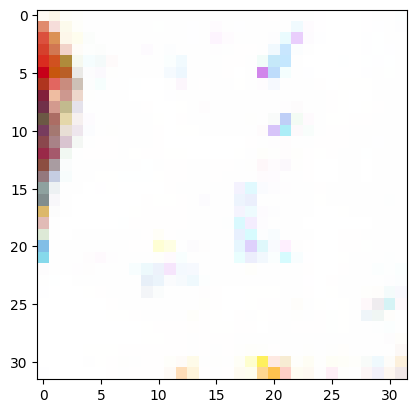

[182/500][0/936]	Loss_D: 0.0073	Loss_G: 4.4567	D(x): 1.0000	D(G(z)): 0.0073 / 0.0132
[182/500][15/936]	Loss_D: 0.0002	Loss_G: 12.0650	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[182/500][30/936]	Loss_D: 0.0005	Loss_G: 11.3076	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[182/500][45/936]	Loss_D: 0.0003	Loss_G: 8.3184	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[182/500][60/936]	Loss_D: 0.0234	Loss_G: 8.4189	D(x): 1.0000	D(G(z)): 0.0224 / 0.0025
[182/500][75/936]	Loss_D: 0.0004	Loss_G: 9.3181	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[182/500][90/936]	Loss_D: 0.0002	Loss_G: 9.7440	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[182/500][105/936]	Loss_D: 0.0018	Loss_G: 8.4912	D(x): 1.0000	D(G(z)): 0.0018 / 0.0013
[182/500][120/936]	Loss_D: 0.0008	Loss_G: 9.5120	D(x): 0.9999	D(G(z)): 0.0007 / 0.0006
[182/500][135/936]	Loss_D: 0.0009	Loss_G: 7.4997	D(x): 1.0000	D(G(z)): 0.0009 / 0.0010
[182/500][150/936]	Loss_D: 0.0000	Loss_G: 12.3551	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[182/500][165/936]	Loss_D: 0.0026	Loss_G: 6.9918

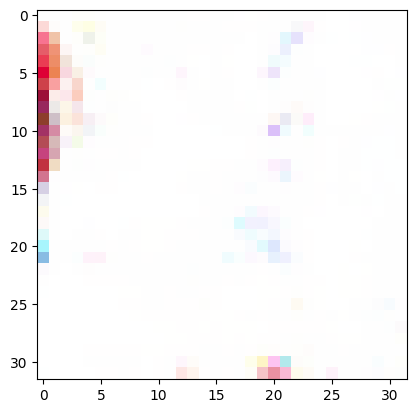

[183/500][0/936]	Loss_D: 0.0086	Loss_G: 12.7594	D(x): 0.9915	D(G(z)): 0.0000 / 0.0000
[183/500][15/936]	Loss_D: 0.0085	Loss_G: 6.7674	D(x): 0.9996	D(G(z)): 0.0080 / 0.0061
[183/500][30/936]	Loss_D: 0.0003	Loss_G: 11.4934	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[183/500][45/936]	Loss_D: 0.0091	Loss_G: 10.0372	D(x): 0.9935	D(G(z)): 0.0026 / 0.0025
[183/500][60/936]	Loss_D: 0.0001	Loss_G: 10.8219	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[183/500][75/936]	Loss_D: 0.0048	Loss_G: 7.8087	D(x): 0.9996	D(G(z)): 0.0044 / 0.0040
[183/500][90/936]	Loss_D: 0.1896	Loss_G: 4.7648	D(x): 1.0000	D(G(z)): 0.1624 / 0.0114
[183/500][105/936]	Loss_D: 0.0021	Loss_G: 6.9357	D(x): 1.0000	D(G(z)): 0.0021 / 0.0019
[183/500][120/936]	Loss_D: 0.0468	Loss_G: 6.4679	D(x): 0.9585	D(G(z)): 0.0027 / 0.0034
[183/500][135/936]	Loss_D: 0.0324	Loss_G: 7.1332	D(x): 0.9737	D(G(z)): 0.0055 / 0.0059
[183/500][150/936]	Loss_D: 0.0072	Loss_G: 5.3903	D(x): 1.0000	D(G(z)): 0.0071 / 0.0051
[183/500][165/936]	Loss_D: 0.0018	Loss_G: 6.863

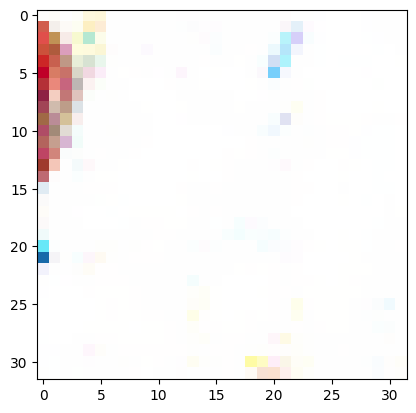

[184/500][0/936]	Loss_D: 0.0042	Loss_G: 6.5354	D(x): 1.0000	D(G(z)): 0.0041 / 0.0039
[184/500][15/936]	Loss_D: 0.0045	Loss_G: 6.6145	D(x): 1.0000	D(G(z)): 0.0045 / 0.0033
[184/500][30/936]	Loss_D: 0.0002	Loss_G: 9.8151	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[184/500][45/936]	Loss_D: 0.0418	Loss_G: 8.1815	D(x): 0.9610	D(G(z)): 0.0012 / 0.0016
[184/500][60/936]	Loss_D: 0.0003	Loss_G: 10.0696	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[184/500][75/936]	Loss_D: 0.0009	Loss_G: 8.1772	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[184/500][90/936]	Loss_D: 0.0102	Loss_G: 6.1655	D(x): 0.9960	D(G(z)): 0.0060 / 0.0047
[184/500][105/936]	Loss_D: 0.0005	Loss_G: 8.1188	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[184/500][120/936]	Loss_D: 0.0010	Loss_G: 7.5555	D(x): 0.9999	D(G(z)): 0.0009 / 0.0009
[184/500][135/936]	Loss_D: 0.0011	Loss_G: 11.9073	D(x): 0.9990	D(G(z)): 0.0000 / 0.0000
[184/500][150/936]	Loss_D: 0.0028	Loss_G: 10.1182	D(x): 0.9977	D(G(z)): 0.0005 / 0.0005
[184/500][165/936]	Loss_D: 0.0189	Loss_G: 6.1745

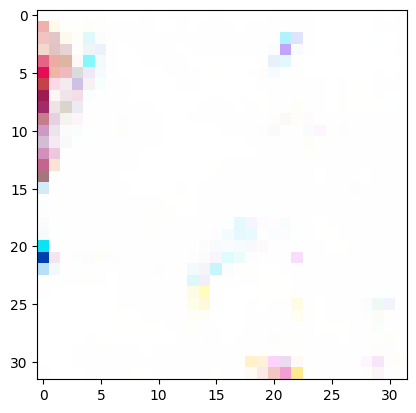

[185/500][0/936]	Loss_D: 0.0024	Loss_G: 7.2615	D(x): 1.0000	D(G(z)): 0.0023 / 0.0019
[185/500][15/936]	Loss_D: 0.0003	Loss_G: 10.9163	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[185/500][30/936]	Loss_D: 0.0053	Loss_G: 7.1358	D(x): 1.0000	D(G(z)): 0.0053 / 0.0044
[185/500][45/936]	Loss_D: 0.0020	Loss_G: 7.9586	D(x): 0.9996	D(G(z)): 0.0016 / 0.0015
[185/500][60/936]	Loss_D: 0.0004	Loss_G: 9.0671	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[185/500][75/936]	Loss_D: 0.0018	Loss_G: 7.6648	D(x): 1.0000	D(G(z)): 0.0018 / 0.0018
[185/500][90/936]	Loss_D: 0.0005	Loss_G: 9.5815	D(x): 0.9999	D(G(z)): 0.0005 / 0.0005
[185/500][105/936]	Loss_D: 0.0157	Loss_G: 9.7928	D(x): 0.9849	D(G(z)): 0.0002 / 0.0002
[185/500][120/936]	Loss_D: 0.0029	Loss_G: 8.2318	D(x): 0.9998	D(G(z)): 0.0028 / 0.0026
[185/500][135/936]	Loss_D: 0.0021	Loss_G: 6.9407	D(x): 1.0000	D(G(z)): 0.0021 / 0.0019
[185/500][150/936]	Loss_D: 0.0001	Loss_G: 10.1488	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[185/500][165/936]	Loss_D: 0.0001	Loss_G: 11.4575

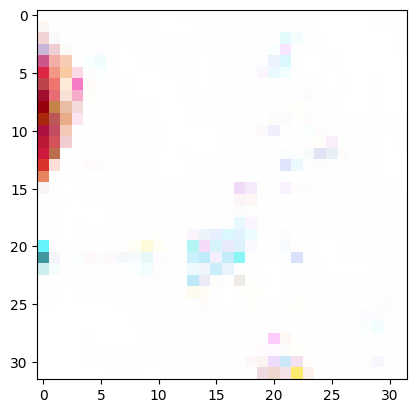

[186/500][0/936]	Loss_D: 0.0007	Loss_G: 12.1265	D(x): 0.9993	D(G(z)): 0.0000 / 0.0000
[186/500][15/936]	Loss_D: 0.0001	Loss_G: 11.8444	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[186/500][30/936]	Loss_D: 0.0003	Loss_G: 11.5339	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[186/500][45/936]	Loss_D: 0.0012	Loss_G: 8.3045	D(x): 1.0000	D(G(z)): 0.0012 / 0.0011
[186/500][60/936]	Loss_D: 0.0012	Loss_G: 9.1617	D(x): 0.9998	D(G(z)): 0.0009 / 0.0006
[186/500][75/936]	Loss_D: 0.0029	Loss_G: 8.6802	D(x): 1.0000	D(G(z)): 0.0028 / 0.0017
[186/500][90/936]	Loss_D: 0.0039	Loss_G: 7.5100	D(x): 0.9995	D(G(z)): 0.0034 / 0.0029
[186/500][105/936]	Loss_D: 0.0019	Loss_G: 9.0415	D(x): 0.9984	D(G(z)): 0.0002 / 0.0002
[186/500][120/936]	Loss_D: 0.0048	Loss_G: 7.6355	D(x): 0.9968	D(G(z)): 0.0016 / 0.0014
[186/500][135/936]	Loss_D: 0.5001	Loss_G: 4.0547	D(x): 0.6969	D(G(z)): 0.0110 / 0.0425
[186/500][150/936]	Loss_D: 0.0018	Loss_G: 9.4938	D(x): 0.9984	D(G(z)): 0.0002 / 0.0002
[186/500][165/936]	Loss_D: 0.0012	Loss_G: 10.320

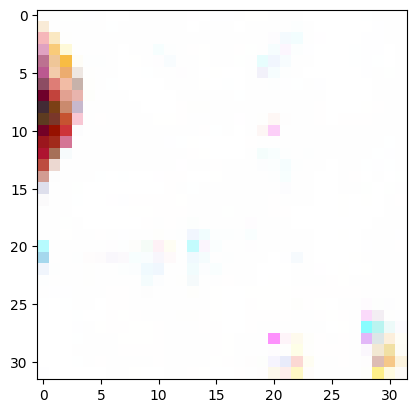

[187/500][0/936]	Loss_D: 0.0019	Loss_G: 7.4868	D(x): 0.9990	D(G(z)): 0.0009 / 0.0009
[187/500][15/936]	Loss_D: 0.0002	Loss_G: 11.5115	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[187/500][30/936]	Loss_D: 0.6550	Loss_G: 15.1680	D(x): 1.0000	D(G(z)): 0.2351 / 0.0000
[187/500][45/936]	Loss_D: 0.0004	Loss_G: 8.6419	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[187/500][60/936]	Loss_D: 0.0452	Loss_G: 6.0904	D(x): 0.9734	D(G(z)): 0.0176 / 0.0097
[187/500][75/936]	Loss_D: 0.3496	Loss_G: 8.2882	D(x): 0.7654	D(G(z)): 0.0001 / 0.0006
[187/500][90/936]	Loss_D: 0.0023	Loss_G: 12.3481	D(x): 0.9979	D(G(z)): 0.0002 / 0.0001
[187/500][105/936]	Loss_D: 0.0010	Loss_G: 11.6530	D(x): 1.0000	D(G(z)): 0.0010 / 0.0007
[187/500][120/936]	Loss_D: 0.0001	Loss_G: 13.4956	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[187/500][135/936]	Loss_D: 0.0012	Loss_G: 9.1528	D(x): 0.9996	D(G(z)): 0.0008 / 0.0007
[187/500][150/936]	Loss_D: 0.0009	Loss_G: 15.3971	D(x): 0.9991	D(G(z)): 0.0000 / 0.0000
[187/500][165/936]	Loss_D: 0.0022	Loss_G: 8.7

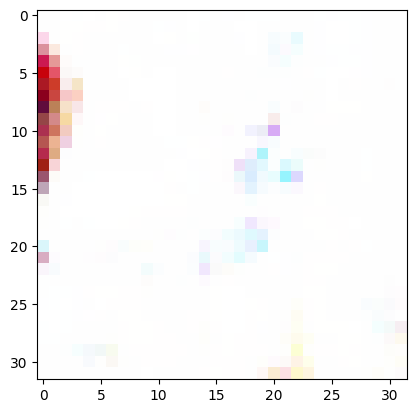

[188/500][0/936]	Loss_D: 0.0009	Loss_G: 8.4002	D(x): 1.0000	D(G(z)): 0.0009 / 0.0006
[188/500][15/936]	Loss_D: 0.0004	Loss_G: 9.4858	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[188/500][30/936]	Loss_D: 0.0033	Loss_G: 6.3935	D(x): 1.0000	D(G(z)): 0.0032 / 0.0036
[188/500][45/936]	Loss_D: 0.0004	Loss_G: 10.3525	D(x): 0.9997	D(G(z)): 0.0001 / 0.0001
[188/500][60/936]	Loss_D: 0.0119	Loss_G: 6.2809	D(x): 1.0000	D(G(z)): 0.0118 / 0.0070
[188/500][75/936]	Loss_D: 0.2849	Loss_G: 5.6601	D(x): 0.7986	D(G(z)): 0.0035 / 0.0071
[188/500][90/936]	Loss_D: 0.0000	Loss_G: 10.3965	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[188/500][105/936]	Loss_D: 0.0004	Loss_G: 11.1206	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[188/500][120/936]	Loss_D: 0.0007	Loss_G: 8.2729	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[188/500][135/936]	Loss_D: 0.0003	Loss_G: 8.8607	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[188/500][150/936]	Loss_D: 0.0006	Loss_G: 9.9947	D(x): 0.9995	D(G(z)): 0.0001 / 0.0001
[188/500][165/936]	Loss_D: 0.0005	Loss_G: 10.034

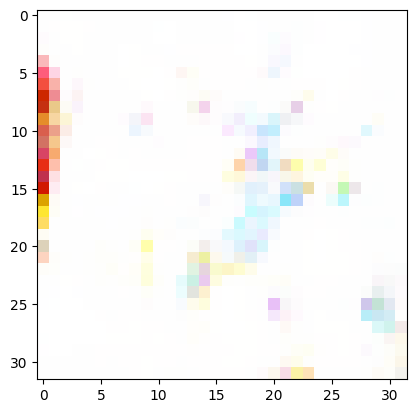

[189/500][0/936]	Loss_D: 0.0042	Loss_G: 7.4618	D(x): 1.0000	D(G(z)): 0.0041 / 0.0034
[189/500][15/936]	Loss_D: 0.0060	Loss_G: 8.2636	D(x): 0.9947	D(G(z)): 0.0006 / 0.0007
[189/500][30/936]	Loss_D: 0.0004	Loss_G: 11.4964	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[189/500][45/936]	Loss_D: 0.0008	Loss_G: 10.4724	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[189/500][60/936]	Loss_D: 0.0129	Loss_G: 6.2171	D(x): 1.0000	D(G(z)): 0.0127 / 0.0171
[189/500][75/936]	Loss_D: 0.0007	Loss_G: 10.2594	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[189/500][90/936]	Loss_D: 0.1122	Loss_G: 9.3306	D(x): 0.8966	D(G(z)): 0.0002 / 0.0004
[189/500][105/936]	Loss_D: 0.0007	Loss_G: 8.0475	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[189/500][120/936]	Loss_D: 0.0364	Loss_G: 7.0702	D(x): 0.9661	D(G(z)): 0.0015 / 0.0019
[189/500][135/936]	Loss_D: 0.0003	Loss_G: 8.7541	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[189/500][150/936]	Loss_D: 0.0001	Loss_G: 14.2180	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[189/500][165/936]	Loss_D: 0.0052	Loss_G: 11.79

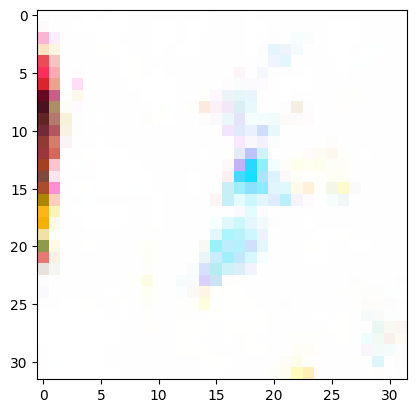

[190/500][0/936]	Loss_D: 0.0002	Loss_G: 9.5410	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[190/500][15/936]	Loss_D: 0.0001	Loss_G: 10.8037	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[190/500][30/936]	Loss_D: 0.0144	Loss_G: 9.3632	D(x): 0.9862	D(G(z)): 0.0002 / 0.0002
[190/500][45/936]	Loss_D: 0.0006	Loss_G: 7.6625	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[190/500][60/936]	Loss_D: 0.0004	Loss_G: 9.7970	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[190/500][75/936]	Loss_D: 0.0058	Loss_G: 6.4794	D(x): 1.0000	D(G(z)): 0.0057 / 0.0046
[190/500][90/936]	Loss_D: 0.0035	Loss_G: 9.0058	D(x): 1.0000	D(G(z)): 0.0035 / 0.0019
[190/500][105/936]	Loss_D: 0.0016	Loss_G: 8.8848	D(x): 1.0000	D(G(z)): 0.0016 / 0.0011
[190/500][120/936]	Loss_D: 0.0008	Loss_G: 11.9661	D(x): 0.9992	D(G(z)): 0.0000 / 0.0000
[190/500][135/936]	Loss_D: 0.0007	Loss_G: 9.2482	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[190/500][150/936]	Loss_D: 0.0027	Loss_G: 7.8972	D(x): 1.0000	D(G(z)): 0.0027 / 0.0021
[190/500][165/936]	Loss_D: 0.0005	Loss_G: 8.6869	

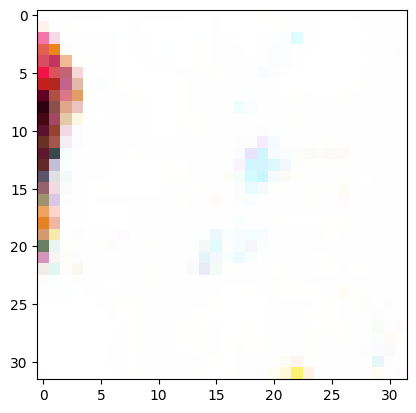

[191/500][0/936]	Loss_D: 0.0013	Loss_G: 9.4064	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[191/500][15/936]	Loss_D: 0.0019	Loss_G: 11.9609	D(x): 0.9981	D(G(z)): 0.0001 / 0.0001
[191/500][30/936]	Loss_D: 0.0004	Loss_G: 8.0576	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[191/500][45/936]	Loss_D: 0.0003	Loss_G: 9.6673	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[191/500][60/936]	Loss_D: 0.0018	Loss_G: 8.3038	D(x): 1.0000	D(G(z)): 0.0018 / 0.0017
[191/500][75/936]	Loss_D: 0.0050	Loss_G: 10.6896	D(x): 0.9951	D(G(z)): 0.0001 / 0.0001
[191/500][90/936]	Loss_D: 0.0004	Loss_G: 7.8739	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[191/500][105/936]	Loss_D: 0.0762	Loss_G: 8.5533	D(x): 0.9289	D(G(z)): 0.0007 / 0.0011
[191/500][120/936]	Loss_D: 0.4482	Loss_G: 13.0385	D(x): 0.6956	D(G(z)): 0.0000 / 0.0000
[191/500][135/936]	Loss_D: 0.0002	Loss_G: 8.9948	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[191/500][150/936]	Loss_D: 0.0005	Loss_G: 8.7106	D(x): 0.9999	D(G(z)): 0.0004 / 0.0005
[191/500][165/936]	Loss_D: 0.0222	Loss_G: 6.9344

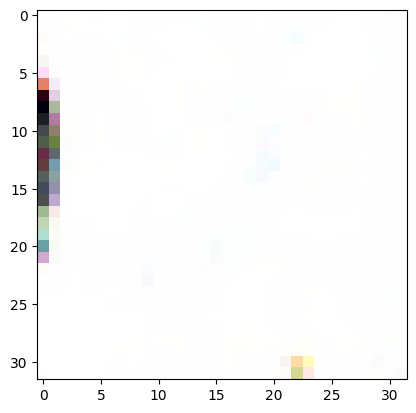

[192/500][0/936]	Loss_D: 0.0182	Loss_G: 7.8904	D(x): 0.9827	D(G(z)): 0.0005 / 0.0006
[192/500][15/936]	Loss_D: 0.0001	Loss_G: 10.0768	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[192/500][30/936]	Loss_D: 0.2137	Loss_G: 9.8565	D(x): 1.0000	D(G(z)): 0.1525 / 0.0006
[192/500][45/936]	Loss_D: 0.0001	Loss_G: 11.8255	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[192/500][60/936]	Loss_D: 0.0100	Loss_G: 10.0881	D(x): 0.9989	D(G(z)): 0.0088 / 0.0029
[192/500][75/936]	Loss_D: 0.0030	Loss_G: 7.1188	D(x): 0.9999	D(G(z)): 0.0029 / 0.0026
[192/500][90/936]	Loss_D: 0.0331	Loss_G: 8.9657	D(x): 1.0000	D(G(z)): 0.0310 / 0.0014
[192/500][105/936]	Loss_D: 0.0002	Loss_G: 11.0107	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[192/500][120/936]	Loss_D: 0.0004	Loss_G: 9.7100	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[192/500][135/936]	Loss_D: 0.0038	Loss_G: 5.4986	D(x): 1.0000	D(G(z)): 0.0038 / 0.0064
[192/500][150/936]	Loss_D: 0.0003	Loss_G: 10.1921	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[192/500][165/936]	Loss_D: 0.0001	Loss_G: 14.0

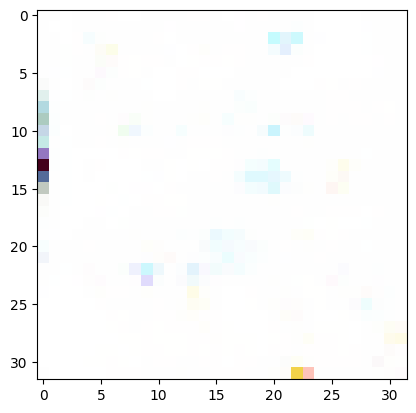

[193/500][0/936]	Loss_D: 0.0010	Loss_G: 7.9886	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[193/500][15/936]	Loss_D: 0.0021	Loss_G: 11.9758	D(x): 0.9982	D(G(z)): 0.0003 / 0.0003
[193/500][30/936]	Loss_D: 0.0433	Loss_G: 5.1142	D(x): 1.0000	D(G(z)): 0.0416 / 0.0085
[193/500][45/936]	Loss_D: 0.0020	Loss_G: 8.1051	D(x): 0.9989	D(G(z)): 0.0009 / 0.0009
[193/500][60/936]	Loss_D: 0.0208	Loss_G: 7.3891	D(x): 0.9999	D(G(z)): 0.0199 / 0.0068
[193/500][75/936]	Loss_D: 0.0275	Loss_G: 4.9117	D(x): 0.9998	D(G(z)): 0.0268 / 0.0124
[193/500][90/936]	Loss_D: 0.0002	Loss_G: 9.5039	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[193/500][105/936]	Loss_D: 0.0002	Loss_G: 10.0288	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[193/500][120/936]	Loss_D: 0.0003	Loss_G: 9.2842	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[193/500][135/936]	Loss_D: 0.0031	Loss_G: 7.6271	D(x): 0.9976	D(G(z)): 0.0007 / 0.0007
[193/500][150/936]	Loss_D: 0.0004	Loss_G: 8.2852	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[193/500][165/936]	Loss_D: 0.0006	Loss_G: 9.2401	

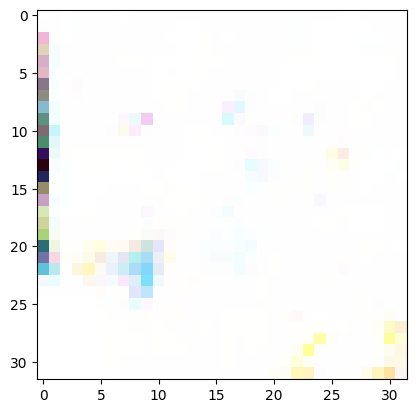

[194/500][0/936]	Loss_D: 0.0038	Loss_G: 7.4338	D(x): 0.9996	D(G(z)): 0.0034 / 0.0026
[194/500][15/936]	Loss_D: 0.0035	Loss_G: 9.0950	D(x): 0.9967	D(G(z)): 0.0002 / 0.0002
[194/500][30/936]	Loss_D: 0.0002	Loss_G: 8.8782	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[194/500][45/936]	Loss_D: 0.0012	Loss_G: 9.0094	D(x): 0.9991	D(G(z)): 0.0003 / 0.0002
[194/500][60/936]	Loss_D: 0.0013	Loss_G: 7.2682	D(x): 1.0000	D(G(z)): 0.0012 / 0.0012
[194/500][75/936]	Loss_D: 0.0001	Loss_G: 10.4540	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[194/500][90/936]	Loss_D: 0.0001	Loss_G: 9.4012	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[194/500][105/936]	Loss_D: 0.0494	Loss_G: 7.3514	D(x): 0.9983	D(G(z)): 0.0452 / 0.0084
[194/500][120/936]	Loss_D: 0.0013	Loss_G: 6.8973	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[194/500][135/936]	Loss_D: 0.0018	Loss_G: 7.4863	D(x): 0.9999	D(G(z)): 0.0017 / 0.0015
[194/500][150/936]	Loss_D: 0.0025	Loss_G: 7.4987	D(x): 1.0000	D(G(z)): 0.0025 / 0.0019
[194/500][165/936]	Loss_D: 0.0001	Loss_G: 9.5645	D

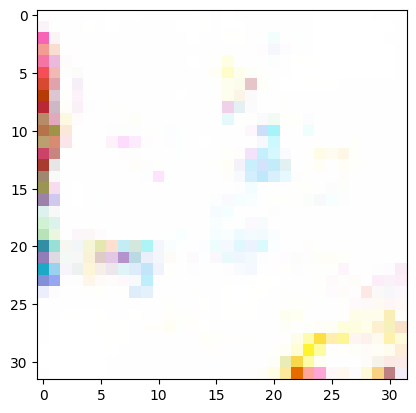

[195/500][0/936]	Loss_D: 0.0000	Loss_G: 11.7026	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[195/500][15/936]	Loss_D: 0.0003	Loss_G: 9.0141	D(x): 1.0000	D(G(z)): 0.0002 / 0.0003
[195/500][30/936]	Loss_D: 0.0045	Loss_G: 8.0052	D(x): 0.9999	D(G(z)): 0.0043 / 0.0029
[195/500][45/936]	Loss_D: 0.0093	Loss_G: 6.4464	D(x): 0.9992	D(G(z)): 0.0085 / 0.0055
[195/500][60/936]	Loss_D: 0.0064	Loss_G: 7.0522	D(x): 0.9979	D(G(z)): 0.0043 / 0.0023
[195/500][75/936]	Loss_D: 0.0233	Loss_G: 7.3163	D(x): 0.9999	D(G(z)): 0.0225 / 0.0029
[195/500][90/936]	Loss_D: 0.0003	Loss_G: 8.6860	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[195/500][105/936]	Loss_D: 0.0024	Loss_G: 9.0048	D(x): 0.9990	D(G(z)): 0.0014 / 0.0019
[195/500][120/936]	Loss_D: 0.0002	Loss_G: 9.0990	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[195/500][135/936]	Loss_D: 0.0042	Loss_G: 8.9992	D(x): 0.9998	D(G(z)): 0.0040 / 0.0041
[195/500][150/936]	Loss_D: 0.0003	Loss_G: 10.5475	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[195/500][165/936]	Loss_D: 0.0016	Loss_G: 8.1773	

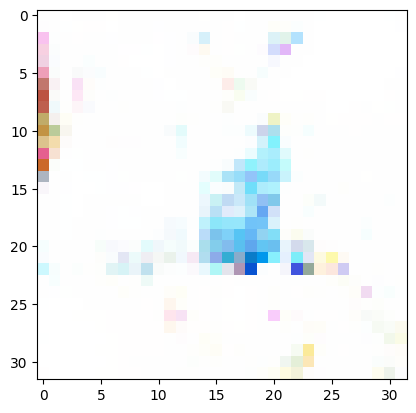

[196/500][0/936]	Loss_D: 0.0017	Loss_G: 11.3186	D(x): 0.9989	D(G(z)): 0.0006 / 0.0006
[196/500][15/936]	Loss_D: 0.0015	Loss_G: 9.4981	D(x): 0.9995	D(G(z)): 0.0010 / 0.0009
[196/500][30/936]	Loss_D: 0.0049	Loss_G: 4.7596	D(x): 1.0000	D(G(z)): 0.0049 / 0.0278
[196/500][45/936]	Loss_D: 0.0053	Loss_G: 10.8878	D(x): 0.9949	D(G(z)): 0.0002 / 0.0002
[196/500][60/936]	Loss_D: 0.0001	Loss_G: 11.2805	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[196/500][75/936]	Loss_D: 0.0967	Loss_G: 6.6165	D(x): 0.9216	D(G(z)): 0.0028 / 0.0052
[196/500][90/936]	Loss_D: 0.0003	Loss_G: 9.7426	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[196/500][105/936]	Loss_D: 0.0004	Loss_G: 11.2447	D(x): 0.9998	D(G(z)): 0.0002 / 0.0002
[196/500][120/936]	Loss_D: 0.0009	Loss_G: 12.0367	D(x): 1.0000	D(G(z)): 0.0009 / 0.0012
[196/500][135/936]	Loss_D: 0.0017	Loss_G: 8.2049	D(x): 1.0000	D(G(z)): 0.0017 / 0.0015
[196/500][150/936]	Loss_D: 0.0001	Loss_G: 10.2660	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[196/500][165/936]	Loss_D: 0.0577	Loss_G: 6.7

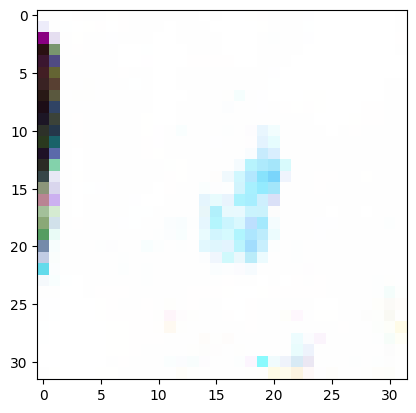

[197/500][0/936]	Loss_D: 0.0507	Loss_G: 9.9701	D(x): 1.0000	D(G(z)): 0.0459 / 0.0004
[197/500][15/936]	Loss_D: 0.0012	Loss_G: 12.7319	D(x): 0.9988	D(G(z)): 0.0000 / 0.0000
[197/500][30/936]	Loss_D: 0.0001	Loss_G: 11.7163	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[197/500][45/936]	Loss_D: 0.0155	Loss_G: 6.8205	D(x): 0.9981	D(G(z)): 0.0133 / 0.0075
[197/500][60/936]	Loss_D: 0.0016	Loss_G: 6.7205	D(x): 0.9999	D(G(z)): 0.0014 / 0.0014
[197/500][75/936]	Loss_D: 0.0035	Loss_G: 9.6640	D(x): 0.9968	D(G(z)): 0.0003 / 0.0003
[197/500][90/936]	Loss_D: 0.0380	Loss_G: 6.4676	D(x): 0.9677	D(G(z)): 0.0034 / 0.0036
[197/500][105/936]	Loss_D: 0.0023	Loss_G: 12.9171	D(x): 0.9977	D(G(z)): 0.0000 / 0.0000
[197/500][120/936]	Loss_D: 0.0009	Loss_G: 8.3019	D(x): 0.9998	D(G(z)): 0.0007 / 0.0007
[197/500][135/936]	Loss_D: 0.0026	Loss_G: 8.6429	D(x): 1.0000	D(G(z)): 0.0026 / 0.0020
[197/500][150/936]	Loss_D: 0.0005	Loss_G: 9.6394	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[197/500][165/936]	Loss_D: 0.0365	Loss_G: 4.9062

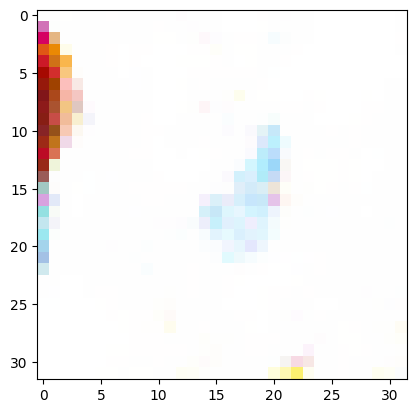

[198/500][0/936]	Loss_D: 0.0386	Loss_G: 9.2299	D(x): 0.9886	D(G(z)): 0.0256 / 0.0022
[198/500][15/936]	Loss_D: 0.0230	Loss_G: 8.3168	D(x): 0.9999	D(G(z)): 0.0219 / 0.0041
[198/500][30/936]	Loss_D: 0.0000	Loss_G: 11.6331	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[198/500][45/936]	Loss_D: 0.0216	Loss_G: 8.0893	D(x): 1.0000	D(G(z)): 0.0210 / 0.0102
[198/500][60/936]	Loss_D: 0.0001	Loss_G: 11.6862	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[198/500][75/936]	Loss_D: 0.0104	Loss_G: 6.2626	D(x): 0.9998	D(G(z)): 0.0101 / 0.0057
[198/500][90/936]	Loss_D: 0.0003	Loss_G: 9.9012	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[198/500][105/936]	Loss_D: 0.0002	Loss_G: 11.1484	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[198/500][120/936]	Loss_D: 0.0024	Loss_G: 11.5255	D(x): 0.9987	D(G(z)): 0.0010 / 0.0010
[198/500][135/936]	Loss_D: 0.0008	Loss_G: 9.3860	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[198/500][150/936]	Loss_D: 0.0001	Loss_G: 12.6309	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[198/500][165/936]	Loss_D: 0.0008	Loss_G: 12.3

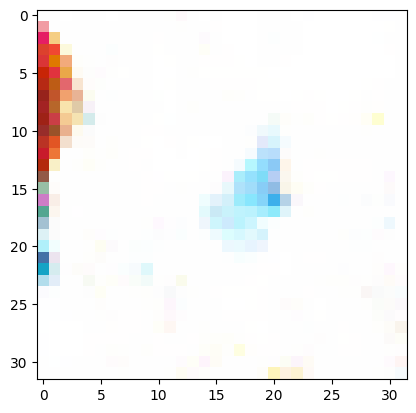

[199/500][0/936]	Loss_D: 0.0009	Loss_G: 9.6697	D(x): 1.0000	D(G(z)): 0.0008 / 0.0006
[199/500][15/936]	Loss_D: 0.0004	Loss_G: 8.6541	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[199/500][30/936]	Loss_D: 0.0001	Loss_G: 11.5431	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[199/500][45/936]	Loss_D: 0.0004	Loss_G: 8.3761	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[199/500][60/936]	Loss_D: 0.0019	Loss_G: 7.6588	D(x): 1.0000	D(G(z)): 0.0019 / 0.0018
[199/500][75/936]	Loss_D: 0.0004	Loss_G: 11.4319	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[199/500][90/936]	Loss_D: 0.0011	Loss_G: 9.4371	D(x): 0.9991	D(G(z)): 0.0002 / 0.0002
[199/500][105/936]	Loss_D: 0.0009	Loss_G: 11.2181	D(x): 0.9994	D(G(z)): 0.0003 / 0.0003
[199/500][120/936]	Loss_D: 0.0001	Loss_G: 10.2570	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[199/500][135/936]	Loss_D: 0.0002	Loss_G: 9.1390	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[199/500][150/936]	Loss_D: 0.0015	Loss_G: 7.0983	D(x): 0.9999	D(G(z)): 0.0014 / 0.0013
[199/500][165/936]	Loss_D: 0.0018	Loss_G: 10.55

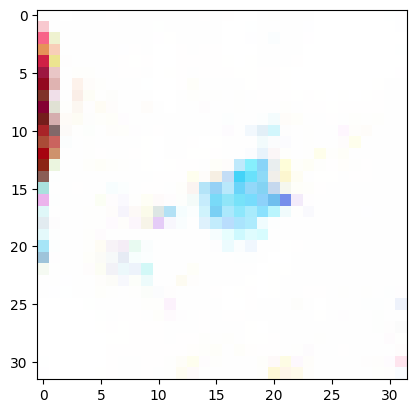

[200/500][0/936]	Loss_D: 0.0551	Loss_G: 4.1077	D(x): 1.0000	D(G(z)): 0.0528 / 0.0285
[200/500][15/936]	Loss_D: 0.0006	Loss_G: 8.6140	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[200/500][30/936]	Loss_D: 0.1302	Loss_G: 8.4460	D(x): 0.8862	D(G(z)): 0.0016 / 0.0015
[200/500][45/936]	Loss_D: 0.2161	Loss_G: 7.1214	D(x): 0.8468	D(G(z)): 0.0004 / 0.0011
[200/500][60/936]	Loss_D: 0.0006	Loss_G: 8.6943	D(x): 1.0000	D(G(z)): 0.0006 / 0.0007
[200/500][75/936]	Loss_D: 0.0010	Loss_G: 12.0905	D(x): 0.9990	D(G(z)): 0.0001 / 0.0001
[200/500][90/936]	Loss_D: 0.0031	Loss_G: 6.9837	D(x): 1.0000	D(G(z)): 0.0031 / 0.0028
[200/500][105/936]	Loss_D: 0.0014	Loss_G: 10.9705	D(x): 0.9986	D(G(z)): 0.0001 / 0.0001
[200/500][120/936]	Loss_D: 0.0029	Loss_G: 6.6750	D(x): 0.9999	D(G(z)): 0.0029 / 0.0014
[200/500][135/936]	Loss_D: 0.0004	Loss_G: 11.9279	D(x): 0.9997	D(G(z)): 0.0000 / 0.0000
[200/500][150/936]	Loss_D: 0.1681	Loss_G: 8.7518	D(x): 0.9181	D(G(z)): 0.0691 / 0.0003
[200/500][165/936]	Loss_D: 0.0004	Loss_G: 10.556

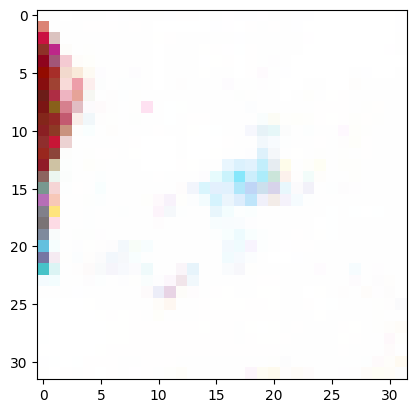

[201/500][0/936]	Loss_D: 0.0006	Loss_G: 7.9458	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[201/500][15/936]	Loss_D: 0.0017	Loss_G: 8.8041	D(x): 1.0000	D(G(z)): 0.0017 / 0.0015
[201/500][30/936]	Loss_D: 0.0020	Loss_G: 8.9127	D(x): 0.9987	D(G(z)): 0.0007 / 0.0007
[201/500][45/936]	Loss_D: 0.0004	Loss_G: 8.3765	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[201/500][60/936]	Loss_D: 0.0001	Loss_G: 14.0480	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[201/500][75/936]	Loss_D: 0.0090	Loss_G: 5.6093	D(x): 0.9959	D(G(z)): 0.0049 / 0.0053
[201/500][90/936]	Loss_D: 0.0046	Loss_G: 6.0116	D(x): 0.9999	D(G(z)): 0.0045 / 0.0036
[201/500][105/936]	Loss_D: 0.0002	Loss_G: 11.2691	D(x): 0.9999	D(G(z)): 0.0001 / 0.0000
[201/500][120/936]	Loss_D: 0.0046	Loss_G: 7.0663	D(x): 0.9983	D(G(z)): 0.0029 / 0.0022
[201/500][135/936]	Loss_D: 0.0063	Loss_G: 6.9376	D(x): 1.0000	D(G(z)): 0.0063 / 0.0027
[201/500][150/936]	Loss_D: 0.0001	Loss_G: 11.9977	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[201/500][165/936]	Loss_D: 0.0052	Loss_G: 7.0219

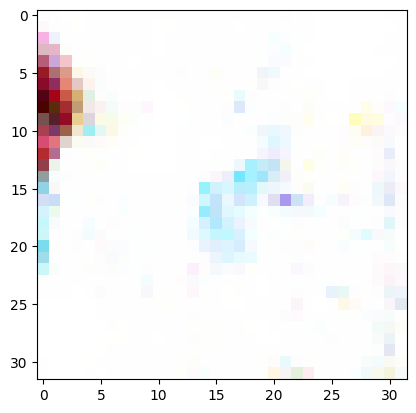

[202/500][0/936]	Loss_D: 0.0084	Loss_G: 6.8450	D(x): 0.9998	D(G(z)): 0.0080 / 0.0031
[202/500][15/936]	Loss_D: 0.0151	Loss_G: 5.3058	D(x): 0.9955	D(G(z)): 0.0105 / 0.0087
[202/500][30/936]	Loss_D: 0.0003	Loss_G: 9.1224	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[202/500][45/936]	Loss_D: 0.0040	Loss_G: 8.1273	D(x): 0.9997	D(G(z)): 0.0036 / 0.0027
[202/500][60/936]	Loss_D: 0.0055	Loss_G: 5.9447	D(x): 1.0000	D(G(z)): 0.0055 / 0.0044
[202/500][75/936]	Loss_D: 0.0265	Loss_G: 4.7324	D(x): 1.0000	D(G(z)): 0.0260 / 0.0104
[202/500][90/936]	Loss_D: 0.0007	Loss_G: 9.2680	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[202/500][105/936]	Loss_D: 0.1360	Loss_G: 9.8078	D(x): 0.8931	D(G(z)): 0.0004 / 0.0007
[202/500][120/936]	Loss_D: 0.0003	Loss_G: 9.3053	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[202/500][135/936]	Loss_D: 0.0005	Loss_G: 10.0571	D(x): 0.9999	D(G(z)): 0.0005 / 0.0004
[202/500][150/936]	Loss_D: 0.0002	Loss_G: 9.3734	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[202/500][165/936]	Loss_D: 0.0033	Loss_G: 9.1669	D

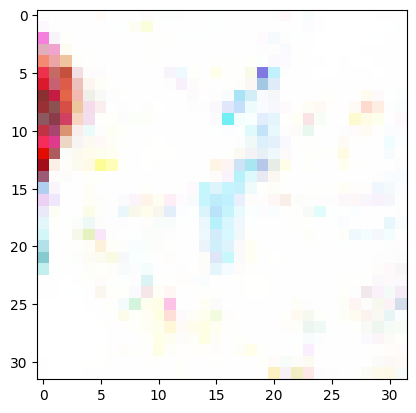

[203/500][0/936]	Loss_D: 0.2298	Loss_G: 6.9537	D(x): 1.0000	D(G(z)): 0.1964 / 0.0034
[203/500][15/936]	Loss_D: 0.1532	Loss_G: 6.1528	D(x): 1.0000	D(G(z)): 0.1284 / 0.0032
[203/500][30/936]	Loss_D: 0.1417	Loss_G: 5.6494	D(x): 0.9626	D(G(z)): 0.0883 / 0.0049
[203/500][45/936]	Loss_D: 0.0041	Loss_G: 8.8006	D(x): 1.0000	D(G(z)): 0.0041 / 0.0021
[203/500][60/936]	Loss_D: 0.0002	Loss_G: 12.3664	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[203/500][75/936]	Loss_D: 0.0541	Loss_G: 8.4366	D(x): 0.9498	D(G(z)): 0.0006 / 0.0008
[203/500][90/936]	Loss_D: 0.0001	Loss_G: 9.6441	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[203/500][105/936]	Loss_D: 0.0030	Loss_G: 8.9241	D(x): 0.9993	D(G(z)): 0.0023 / 0.0020
[203/500][120/936]	Loss_D: 0.0014	Loss_G: 7.2432	D(x): 0.9999	D(G(z)): 0.0013 / 0.0014
[203/500][135/936]	Loss_D: 0.2014	Loss_G: 6.6569	D(x): 1.0000	D(G(z)): 0.1732 / 0.0091
[203/500][150/936]	Loss_D: 0.0147	Loss_G: 6.6949	D(x): 1.0000	D(G(z)): 0.0143 / 0.0046
[203/500][165/936]	Loss_D: 0.0015	Loss_G: 11.0688	

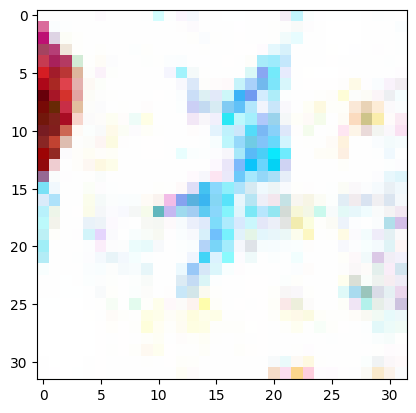

[204/500][0/936]	Loss_D: 0.0030	Loss_G: 8.3822	D(x): 0.9999	D(G(z)): 0.0028 / 0.0024
[204/500][15/936]	Loss_D: 0.0005	Loss_G: 10.0004	D(x): 1.0000	D(G(z)): 0.0005 / 0.0006
[204/500][30/936]	Loss_D: 0.0005	Loss_G: 8.7681	D(x): 0.9999	D(G(z)): 0.0004 / 0.0004
[204/500][45/936]	Loss_D: 0.0012	Loss_G: 7.2425	D(x): 1.0000	D(G(z)): 0.0012 / 0.0011
[204/500][60/936]	Loss_D: 0.0003	Loss_G: 10.5825	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[204/500][75/936]	Loss_D: 0.0000	Loss_G: 11.1205	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[204/500][90/936]	Loss_D: 0.0003	Loss_G: 10.4982	D(x): 0.9997	D(G(z)): 0.0001 / 0.0001
[204/500][105/936]	Loss_D: 0.0060	Loss_G: 6.5689	D(x): 1.0000	D(G(z)): 0.0059 / 0.0046
[204/500][120/936]	Loss_D: 0.0141	Loss_G: 9.6244	D(x): 0.9881	D(G(z)): 0.0019 / 0.0015
[204/500][135/936]	Loss_D: 0.0002	Loss_G: 11.9645	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[204/500][150/936]	Loss_D: 0.0001	Loss_G: 12.0423	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[204/500][165/936]	Loss_D: 0.0565	Loss_G: 11.

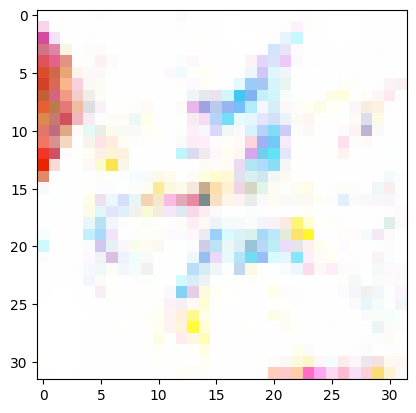

[205/500][0/936]	Loss_D: 0.0003	Loss_G: 8.3648	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[205/500][15/936]	Loss_D: 0.0094	Loss_G: 6.8643	D(x): 1.0000	D(G(z)): 0.0092 / 0.0032
[205/500][30/936]	Loss_D: 0.0910	Loss_G: 6.8895	D(x): 0.9893	D(G(z)): 0.0693 / 0.0023
[205/500][45/936]	Loss_D: 0.0057	Loss_G: 7.7477	D(x): 0.9993	D(G(z)): 0.0050 / 0.0028
[205/500][60/936]	Loss_D: 0.0054	Loss_G: 8.1016	D(x): 0.9993	D(G(z)): 0.0047 / 0.0031
[205/500][75/936]	Loss_D: 0.0006	Loss_G: 9.0049	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[205/500][90/936]	Loss_D: 0.0005	Loss_G: 8.0353	D(x): 0.9999	D(G(z)): 0.0004 / 0.0004
[205/500][105/936]	Loss_D: 0.0003	Loss_G: 8.9053	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[205/500][120/936]	Loss_D: 0.0219	Loss_G: 7.5095	D(x): 0.9999	D(G(z)): 0.0209 / 0.0057
[205/500][135/936]	Loss_D: 0.1495	Loss_G: 7.7651	D(x): 1.0000	D(G(z)): 0.1228 / 0.0009
[205/500][150/936]	Loss_D: 0.0013	Loss_G: 10.4330	D(x): 0.9987	D(G(z)): 0.0001 / 0.0001
[205/500][165/936]	Loss_D: 0.0005	Loss_G: 10.4648	

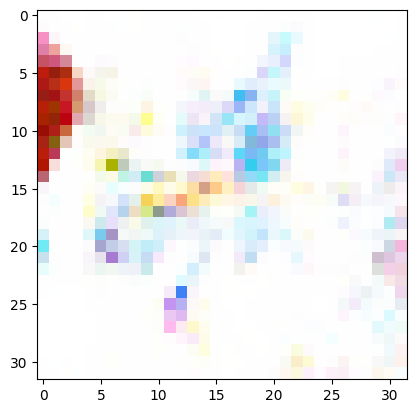

[206/500][0/936]	Loss_D: 0.0006	Loss_G: 12.6949	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[206/500][15/936]	Loss_D: 0.0046	Loss_G: 7.3282	D(x): 0.9999	D(G(z)): 0.0045 / 0.0034
[206/500][30/936]	Loss_D: 0.0018	Loss_G: 7.8953	D(x): 1.0000	D(G(z)): 0.0018 / 0.0016
[206/500][45/936]	Loss_D: 0.0060	Loss_G: 7.3944	D(x): 0.9999	D(G(z)): 0.0058 / 0.0038
[206/500][60/936]	Loss_D: 0.0010	Loss_G: 8.9915	D(x): 0.9999	D(G(z)): 0.0010 / 0.0009
[206/500][75/936]	Loss_D: 0.0010	Loss_G: 9.3727	D(x): 0.9992	D(G(z)): 0.0002 / 0.0002
[206/500][90/936]	Loss_D: 0.0002	Loss_G: 9.6567	D(x): 1.0000	D(G(z)): 0.0002 / 0.0003
[206/500][105/936]	Loss_D: 0.0006	Loss_G: 8.4901	D(x): 0.9999	D(G(z)): 0.0006 / 0.0005
[206/500][120/936]	Loss_D: 0.0046	Loss_G: 7.5772	D(x): 0.9964	D(G(z)): 0.0010 / 0.0010
[206/500][135/936]	Loss_D: 0.0135	Loss_G: 10.1826	D(x): 0.9867	D(G(z)): 0.0000 / 0.0000
[206/500][150/936]	Loss_D: 0.0112	Loss_G: 6.0974	D(x): 1.0000	D(G(z)): 0.0111 / 0.0059
[206/500][165/936]	Loss_D: 0.0063	Loss_G: 10.2258

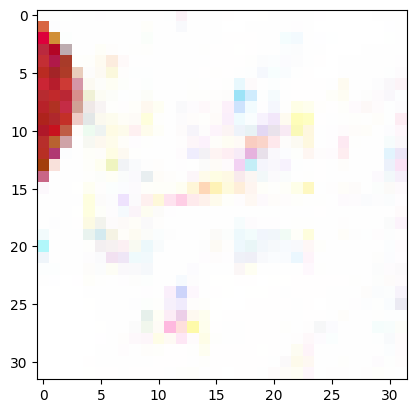

[207/500][0/936]	Loss_D: 0.0006	Loss_G: 8.1170	D(x): 1.0000	D(G(z)): 0.0006 / 0.0007
[207/500][15/936]	Loss_D: 0.0001	Loss_G: 9.8092	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[207/500][30/936]	Loss_D: 0.0000	Loss_G: 11.4123	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[207/500][45/936]	Loss_D: 0.0001	Loss_G: 9.7480	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[207/500][60/936]	Loss_D: 0.0011	Loss_G: 7.7678	D(x): 0.9999	D(G(z)): 0.0011 / 0.0010
[207/500][75/936]	Loss_D: 0.0045	Loss_G: 8.0145	D(x): 0.9983	D(G(z)): 0.0028 / 0.0025
[207/500][90/936]	Loss_D: 0.0023	Loss_G: 9.1230	D(x): 0.9994	D(G(z)): 0.0017 / 0.0014
[207/500][105/936]	Loss_D: 0.0729	Loss_G: 7.4890	D(x): 1.0000	D(G(z)): 0.0636 / 0.0008
[207/500][120/936]	Loss_D: 0.0907	Loss_G: 5.9861	D(x): 0.9247	D(G(z)): 0.0056 / 0.0115
[207/500][135/936]	Loss_D: 0.0002	Loss_G: 9.8309	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[207/500][150/936]	Loss_D: 0.1900	Loss_G: 8.3449	D(x): 1.0000	D(G(z)): 0.1588 / 0.0004
[207/500][165/936]	Loss_D: 0.0369	Loss_G: 6.6946	D

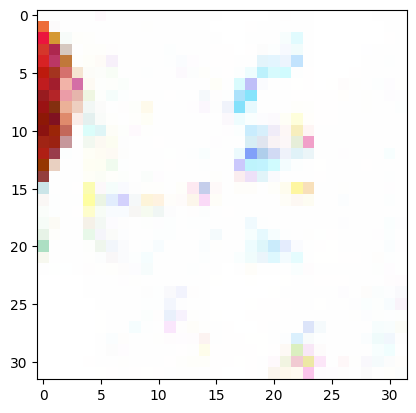

[208/500][0/936]	Loss_D: 0.0019	Loss_G: 5.7322	D(x): 1.0000	D(G(z)): 0.0018 / 0.0056
[208/500][15/936]	Loss_D: 0.0000	Loss_G: 12.9163	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[208/500][30/936]	Loss_D: 0.0001	Loss_G: 14.7303	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[208/500][45/936]	Loss_D: 0.0010	Loss_G: 11.3373	D(x): 0.9991	D(G(z)): 0.0002 / 0.0001
[208/500][60/936]	Loss_D: 0.0212	Loss_G: 4.7927	D(x): 0.9999	D(G(z)): 0.0206 / 0.0195
[208/500][75/936]	Loss_D: 0.0001	Loss_G: 9.5935	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[208/500][90/936]	Loss_D: 0.0006	Loss_G: 10.6401	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[208/500][105/936]	Loss_D: 0.0010	Loss_G: 8.5470	D(x): 0.9999	D(G(z)): 0.0010 / 0.0009
[208/500][120/936]	Loss_D: 0.0008	Loss_G: 10.1290	D(x): 0.9993	D(G(z)): 0.0002 / 0.0002
[208/500][135/936]	Loss_D: 0.0655	Loss_G: 7.2930	D(x): 0.9404	D(G(z)): 0.0019 / 0.0032
[208/500][150/936]	Loss_D: 0.0004	Loss_G: 8.8520	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[208/500][165/936]	Loss_D: 0.0052	Loss_G: 7.01

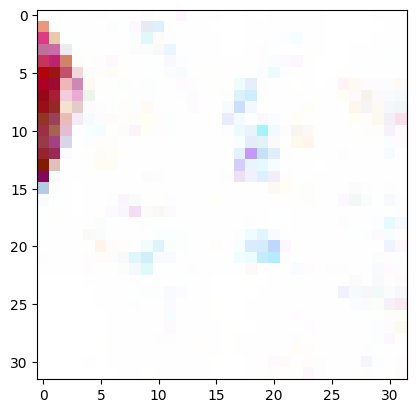

[209/500][0/936]	Loss_D: 0.0105	Loss_G: 5.5498	D(x): 0.9952	D(G(z)): 0.0056 / 0.0051
[209/500][15/936]	Loss_D: 0.1914	Loss_G: 8.2950	D(x): 0.8297	D(G(z)): 0.0002 / 0.0008
[209/500][30/936]	Loss_D: 0.0075	Loss_G: 7.8666	D(x): 1.0000	D(G(z)): 0.0074 / 0.0055
[209/500][45/936]	Loss_D: 0.0653	Loss_G: 5.4282	D(x): 1.0000	D(G(z)): 0.0605 / 0.0060
[209/500][60/936]	Loss_D: 0.0001	Loss_G: 10.4096	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[209/500][75/936]	Loss_D: 0.0016	Loss_G: 7.7322	D(x): 1.0000	D(G(z)): 0.0015 / 0.0015
[209/500][90/936]	Loss_D: 0.0003	Loss_G: 12.0709	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[209/500][105/936]	Loss_D: 0.0101	Loss_G: 10.3829	D(x): 0.9901	D(G(z)): 0.0001 / 0.0001
[209/500][120/936]	Loss_D: 0.0070	Loss_G: 6.6566	D(x): 1.0000	D(G(z)): 0.0069 / 0.0046
[209/500][135/936]	Loss_D: 0.0038	Loss_G: 11.2442	D(x): 0.9963	D(G(z)): 0.0000 / 0.0000
[209/500][150/936]	Loss_D: 0.0001	Loss_G: 10.3033	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[209/500][165/936]	Loss_D: 0.0008	Loss_G: 14.0

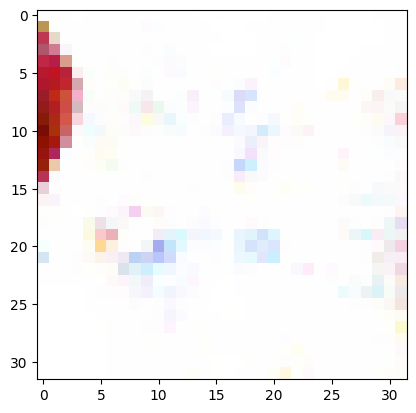

[210/500][0/936]	Loss_D: 0.0092	Loss_G: 5.6034	D(x): 0.9999	D(G(z)): 0.0089 / 0.0084
[210/500][15/936]	Loss_D: 0.0004	Loss_G: 9.8980	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[210/500][30/936]	Loss_D: 0.0083	Loss_G: 9.7098	D(x): 1.0000	D(G(z)): 0.0082 / 0.0052
[210/500][45/936]	Loss_D: 0.0001	Loss_G: 10.2162	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[210/500][60/936]	Loss_D: 0.0011	Loss_G: 8.0346	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[210/500][75/936]	Loss_D: 0.0125	Loss_G: 10.7160	D(x): 0.9880	D(G(z)): 0.0001 / 0.0002
[210/500][90/936]	Loss_D: 0.0017	Loss_G: 8.3798	D(x): 0.9999	D(G(z)): 0.0016 / 0.0015
[210/500][105/936]	Loss_D: 0.0000	Loss_G: 10.7359	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[210/500][120/936]	Loss_D: 0.0060	Loss_G: 5.8757	D(x): 1.0000	D(G(z)): 0.0060 / 0.0047
[210/500][135/936]	Loss_D: 0.0049	Loss_G: 7.2135	D(x): 1.0000	D(G(z)): 0.0049 / 0.0037
[210/500][150/936]	Loss_D: 0.0028	Loss_G: 7.3088	D(x): 1.0000	D(G(z)): 0.0027 / 0.0024
[210/500][165/936]	Loss_D: 0.0198	Loss_G: 7.3388

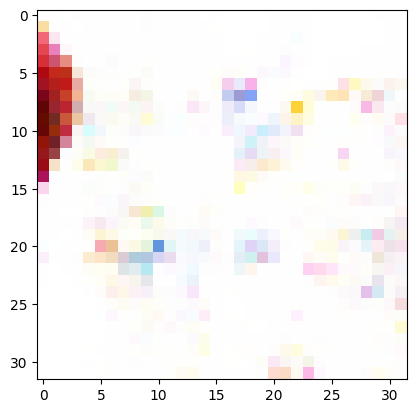

[211/500][0/936]	Loss_D: 0.0025	Loss_G: 7.1782	D(x): 1.0000	D(G(z)): 0.0025 / 0.0027
[211/500][15/936]	Loss_D: 0.0063	Loss_G: 9.1372	D(x): 0.9999	D(G(z)): 0.0062 / 0.0061
[211/500][30/936]	Loss_D: 0.0049	Loss_G: 13.4729	D(x): 0.9951	D(G(z)): 0.0000 / 0.0000
[211/500][45/936]	Loss_D: 0.0006	Loss_G: 16.7062	D(x): 0.9995	D(G(z)): 0.0001 / 0.0001
[211/500][60/936]	Loss_D: 0.0012	Loss_G: 9.4491	D(x): 0.9997	D(G(z)): 0.0009 / 0.0008
[211/500][75/936]	Loss_D: 0.0005	Loss_G: 12.6937	D(x): 0.9995	D(G(z)): 0.0000 / 0.0000
[211/500][90/936]	Loss_D: 0.0001	Loss_G: 10.0728	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[211/500][105/936]	Loss_D: 0.0034	Loss_G: 8.1905	D(x): 1.0000	D(G(z)): 0.0034 / 0.0016
[211/500][120/936]	Loss_D: 0.0028	Loss_G: 9.3559	D(x): 0.9992	D(G(z)): 0.0020 / 0.0017
[211/500][135/936]	Loss_D: 0.0066	Loss_G: 8.5838	D(x): 1.0000	D(G(z)): 0.0066 / 0.0032
[211/500][150/936]	Loss_D: 0.0406	Loss_G: 6.6320	D(x): 0.9633	D(G(z)): 0.0011 / 0.0014
[211/500][165/936]	Loss_D: 0.0001	Loss_G: 9.958

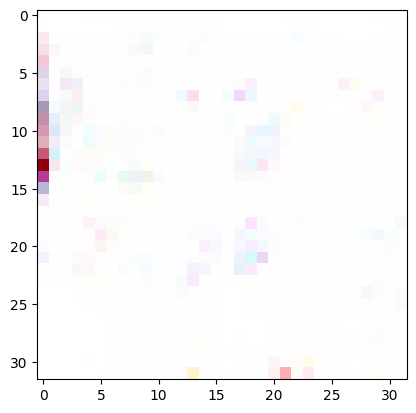

[212/500][0/936]	Loss_D: 0.0001	Loss_G: 10.9726	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[212/500][15/936]	Loss_D: 0.0005	Loss_G: 9.5132	D(x): 0.9997	D(G(z)): 0.0001 / 0.0001
[212/500][30/936]	Loss_D: 0.0173	Loss_G: 5.9679	D(x): 1.0000	D(G(z)): 0.0168 / 0.0064
[212/500][45/936]	Loss_D: 0.0002	Loss_G: 9.1610	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[212/500][60/936]	Loss_D: 0.0020	Loss_G: 7.4647	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[212/500][75/936]	Loss_D: 0.0004	Loss_G: 8.9930	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[212/500][90/936]	Loss_D: 0.0588	Loss_G: 8.4902	D(x): 0.9447	D(G(z)): 0.0003 / 0.0005
[212/500][105/936]	Loss_D: 0.0233	Loss_G: 6.6452	D(x): 0.9825	D(G(z)): 0.0053 / 0.0047
[212/500][120/936]	Loss_D: 0.0020	Loss_G: 8.3200	D(x): 0.9986	D(G(z)): 0.0007 / 0.0006
[212/500][135/936]	Loss_D: 0.0118	Loss_G: 5.2480	D(x): 1.0000	D(G(z)): 0.0117 / 0.0081
[212/500][150/936]	Loss_D: 0.0001	Loss_G: 9.7724	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[212/500][165/936]	Loss_D: 0.0033	Loss_G: 8.5241	D

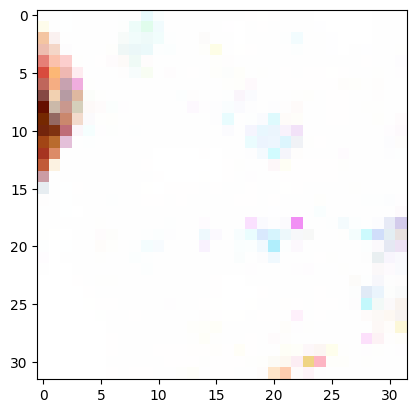

[213/500][0/936]	Loss_D: 0.0000	Loss_G: 14.1229	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[213/500][15/936]	Loss_D: 0.0025	Loss_G: 9.3324	D(x): 0.9998	D(G(z)): 0.0023 / 0.0014
[213/500][30/936]	Loss_D: 0.0002	Loss_G: 9.5082	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[213/500][45/936]	Loss_D: 0.0006	Loss_G: 12.7933	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[213/500][60/936]	Loss_D: 0.0008	Loss_G: 7.9805	D(x): 0.9997	D(G(z)): 0.0005 / 0.0005
[213/500][75/936]	Loss_D: 0.0009	Loss_G: 8.8594	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[213/500][90/936]	Loss_D: 0.0917	Loss_G: 7.5540	D(x): 0.9999	D(G(z)): 0.0774 / 0.0016
[213/500][105/936]	Loss_D: 0.0011	Loss_G: 7.7052	D(x): 0.9995	D(G(z)): 0.0006 / 0.0006
[213/500][120/936]	Loss_D: 0.0006	Loss_G: 7.7683	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[213/500][135/936]	Loss_D: 0.0035	Loss_G: 6.3706	D(x): 0.9993	D(G(z)): 0.0028 / 0.0024
[213/500][150/936]	Loss_D: 0.0739	Loss_G: 11.5090	D(x): 0.9343	D(G(z)): 0.0000 / 0.0000
[213/500][165/936]	Loss_D: 0.0000	Loss_G: 12.806

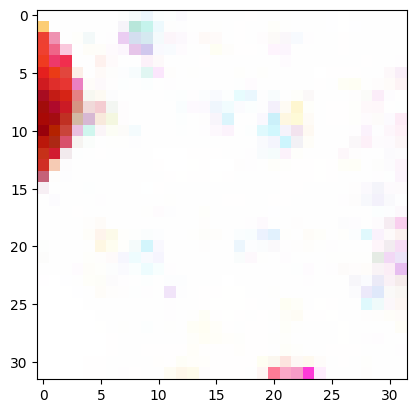

[214/500][0/936]	Loss_D: 0.0014	Loss_G: 11.7493	D(x): 0.9986	D(G(z)): 0.0000 / 0.0000
[214/500][15/936]	Loss_D: 0.0180	Loss_G: 5.2591	D(x): 0.9999	D(G(z)): 0.0177 / 0.0054
[214/500][30/936]	Loss_D: 0.0103	Loss_G: 11.9824	D(x): 0.9901	D(G(z)): 0.0001 / 0.0001
[214/500][45/936]	Loss_D: 0.0003	Loss_G: 8.8141	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[214/500][60/936]	Loss_D: 0.0007	Loss_G: 8.5730	D(x): 0.9997	D(G(z)): 0.0004 / 0.0004
[214/500][75/936]	Loss_D: 0.0005	Loss_G: 9.2392	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[214/500][90/936]	Loss_D: 0.0010	Loss_G: 9.5499	D(x): 0.9992	D(G(z)): 0.0002 / 0.0002
[214/500][105/936]	Loss_D: 0.0007	Loss_G: 13.0844	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[214/500][120/936]	Loss_D: 0.0013	Loss_G: 10.1983	D(x): 0.9989	D(G(z)): 0.0002 / 0.0001
[214/500][135/936]	Loss_D: 1.9049	Loss_G: 7.5820	D(x): 0.2030	D(G(z)): 0.0000 / 0.0018
[214/500][150/936]	Loss_D: 0.0610	Loss_G: 8.4881	D(x): 1.0000	D(G(z)): 0.0543 / 0.0002
[214/500][165/936]	Loss_D: 0.0076	Loss_G: 8.081

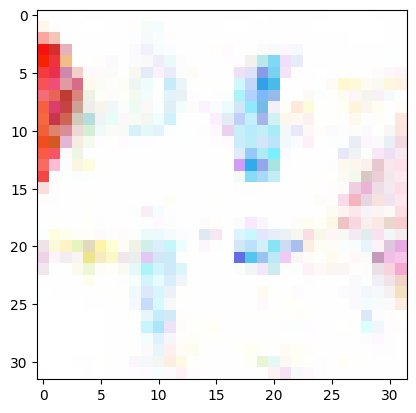

[215/500][0/936]	Loss_D: 0.0011	Loss_G: 10.0110	D(x): 0.9993	D(G(z)): 0.0004 / 0.0004
[215/500][15/936]	Loss_D: 0.0009	Loss_G: 7.4589	D(x): 0.9998	D(G(z)): 0.0007 / 0.0007
[215/500][30/936]	Loss_D: 0.0005	Loss_G: 10.0325	D(x): 0.9997	D(G(z)): 0.0002 / 0.0002
[215/500][45/936]	Loss_D: 0.0021	Loss_G: 9.5119	D(x): 0.9998	D(G(z)): 0.0019 / 0.0016
[215/500][60/936]	Loss_D: 0.0113	Loss_G: 5.0368	D(x): 1.0000	D(G(z)): 0.0112 / 0.0126
[215/500][75/936]	Loss_D: 0.0002	Loss_G: 9.3803	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[215/500][90/936]	Loss_D: 0.0047	Loss_G: 8.8016	D(x): 1.0000	D(G(z)): 0.0046 / 0.0032
[215/500][105/936]	Loss_D: 0.0009	Loss_G: 8.2051	D(x): 0.9997	D(G(z)): 0.0006 / 0.0006
[215/500][120/936]	Loss_D: 0.0320	Loss_G: 4.9792	D(x): 0.9995	D(G(z)): 0.0307 / 0.0126
[215/500][135/936]	Loss_D: 0.0018	Loss_G: 10.2564	D(x): 1.0000	D(G(z)): 0.0018 / 0.0016
[215/500][150/936]	Loss_D: 0.0006	Loss_G: 10.1133	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[215/500][165/936]	Loss_D: 0.0136	Loss_G: 9.169

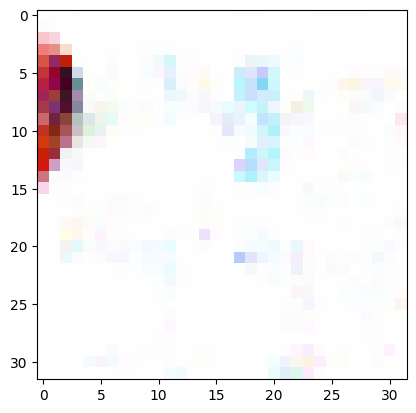

[216/500][0/936]	Loss_D: 0.0032	Loss_G: 6.1933	D(x): 1.0000	D(G(z)): 0.0032 / 0.0029
[216/500][15/936]	Loss_D: 0.0712	Loss_G: 6.0682	D(x): 0.9384	D(G(z)): 0.0027 / 0.0039
[216/500][30/936]	Loss_D: 0.0060	Loss_G: 13.1039	D(x): 0.9940	D(G(z)): 0.0000 / 0.0000
[216/500][45/936]	Loss_D: 0.0003	Loss_G: 10.5632	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[216/500][60/936]	Loss_D: 0.0041	Loss_G: 7.4265	D(x): 1.0000	D(G(z)): 0.0041 / 0.0037
[216/500][75/936]	Loss_D: 0.0000	Loss_G: 13.1127	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[216/500][90/936]	Loss_D: 0.0007	Loss_G: 9.7792	D(x): 0.9994	D(G(z)): 0.0002 / 0.0001
[216/500][105/936]	Loss_D: 0.0010	Loss_G: 9.8852	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[216/500][120/936]	Loss_D: 0.0050	Loss_G: 6.8400	D(x): 1.0000	D(G(z)): 0.0049 / 0.0042
[216/500][135/936]	Loss_D: 0.0000	Loss_G: 11.0146	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[216/500][150/936]	Loss_D: 0.0002	Loss_G: 10.4256	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[216/500][165/936]	Loss_D: 0.0015	Loss_G: 7.59

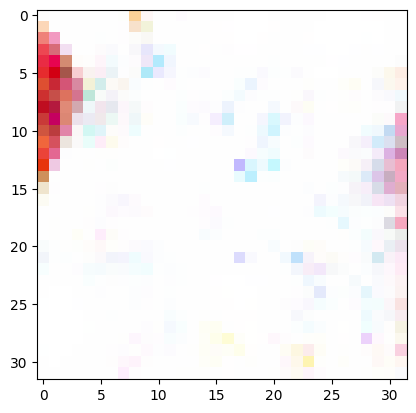

[217/500][0/936]	Loss_D: 0.0010	Loss_G: 8.0491	D(x): 0.9996	D(G(z)): 0.0006 / 0.0006
[217/500][15/936]	Loss_D: 0.5054	Loss_G: 11.0469	D(x): 1.0000	D(G(z)): 0.2892 / 0.0004
[217/500][30/936]	Loss_D: 0.0006	Loss_G: 9.7491	D(x): 0.9995	D(G(z)): 0.0001 / 0.0001
[217/500][45/936]	Loss_D: 0.0141	Loss_G: 5.6080	D(x): 1.0000	D(G(z)): 0.0139 / 0.0080
[217/500][60/936]	Loss_D: 0.0001	Loss_G: 10.7744	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[217/500][75/936]	Loss_D: 0.0796	Loss_G: 10.3066	D(x): 1.0000	D(G(z)): 0.0683 / 0.0059
[217/500][90/936]	Loss_D: 0.0006	Loss_G: 9.4820	D(x): 0.9996	D(G(z)): 0.0002 / 0.0002
[217/500][105/936]	Loss_D: 0.0002	Loss_G: 11.8249	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[217/500][120/936]	Loss_D: 0.0009	Loss_G: 12.4302	D(x): 0.9991	D(G(z)): 0.0000 / 0.0000
[217/500][135/936]	Loss_D: 0.0011	Loss_G: 7.6378	D(x): 1.0000	D(G(z)): 0.0011 / 0.0011
[217/500][150/936]	Loss_D: 0.0126	Loss_G: 7.1435	D(x): 1.0000	D(G(z)): 0.0123 / 0.0045
[217/500][165/936]	Loss_D: 0.3195	Loss_G: 7.32

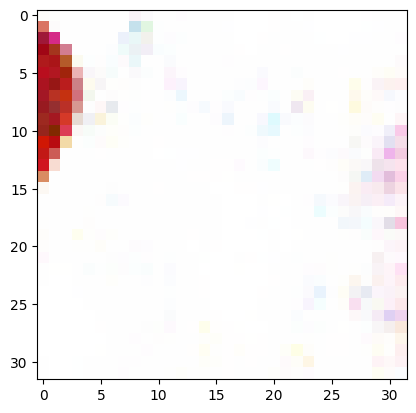

[218/500][0/936]	Loss_D: 0.0013	Loss_G: 9.7781	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[218/500][15/936]	Loss_D: 0.0001	Loss_G: 12.4402	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[218/500][30/936]	Loss_D: 0.0004	Loss_G: 9.9546	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[218/500][45/936]	Loss_D: 0.0029	Loss_G: 11.5450	D(x): 0.9973	D(G(z)): 0.0002 / 0.0002
[218/500][60/936]	Loss_D: 0.0000	Loss_G: 14.5222	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[218/500][75/936]	Loss_D: 0.0001	Loss_G: 10.4281	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[218/500][90/936]	Loss_D: 0.2587	Loss_G: 10.1697	D(x): 0.8385	D(G(z)): 0.0001 / 0.0003
[218/500][105/936]	Loss_D: 0.0036	Loss_G: 8.8038	D(x): 0.9974	D(G(z)): 0.0010 / 0.0009
[218/500][120/936]	Loss_D: 0.0001	Loss_G: 10.6001	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[218/500][135/936]	Loss_D: 0.0128	Loss_G: 7.7682	D(x): 1.0000	D(G(z)): 0.0127 / 0.0082
[218/500][150/936]	Loss_D: 0.0008	Loss_G: 7.5397	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[218/500][165/936]	Loss_D: 0.2452	Loss_G: 7.1

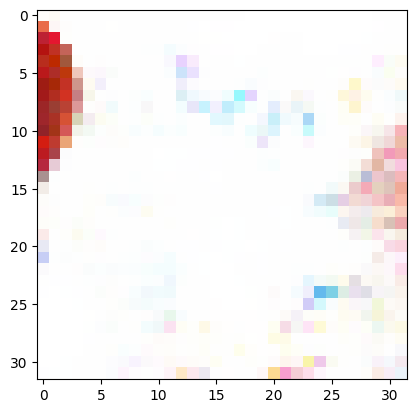

[219/500][0/936]	Loss_D: 0.0019	Loss_G: 7.5618	D(x): 1.0000	D(G(z)): 0.0019 / 0.0018
[219/500][15/936]	Loss_D: 0.0019	Loss_G: 6.9751	D(x): 0.9999	D(G(z)): 0.0018 / 0.0016
[219/500][30/936]	Loss_D: 0.0013	Loss_G: 7.3486	D(x): 1.0000	D(G(z)): 0.0013 / 0.0010
[219/500][45/936]	Loss_D: 0.0013	Loss_G: 8.8090	D(x): 1.0000	D(G(z)): 0.0012 / 0.0012
[219/500][60/936]	Loss_D: 0.0003	Loss_G: 9.2905	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[219/500][75/936]	Loss_D: 0.0009	Loss_G: 9.5095	D(x): 0.9993	D(G(z)): 0.0002 / 0.0002
[219/500][90/936]	Loss_D: 0.0003	Loss_G: 10.0683	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[219/500][105/936]	Loss_D: 0.0003	Loss_G: 9.0773	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[219/500][120/936]	Loss_D: 0.0001	Loss_G: 11.8341	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[219/500][135/936]	Loss_D: 0.0085	Loss_G: 7.4615	D(x): 1.0000	D(G(z)): 0.0084 / 0.0062
[219/500][150/936]	Loss_D: 0.0066	Loss_G: 8.6899	D(x): 0.9938	D(G(z)): 0.0003 / 0.0003
[219/500][165/936]	Loss_D: 0.0006	Loss_G: 8.3323	

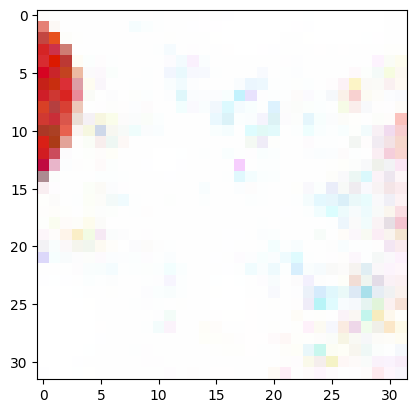

[220/500][0/936]	Loss_D: 0.0005	Loss_G: 10.0978	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[220/500][15/936]	Loss_D: 0.0017	Loss_G: 9.0444	D(x): 1.0000	D(G(z)): 0.0017 / 0.0015
[220/500][30/936]	Loss_D: 0.0003	Loss_G: 10.3828	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[220/500][45/936]	Loss_D: 0.0068	Loss_G: 9.4624	D(x): 0.9934	D(G(z)): 0.0001 / 0.0001
[220/500][60/936]	Loss_D: 0.0086	Loss_G: 9.6945	D(x): 1.0000	D(G(z)): 0.0085 / 0.0059
[220/500][75/936]	Loss_D: 0.0030	Loss_G: 7.2081	D(x): 1.0000	D(G(z)): 0.0030 / 0.0027
[220/500][90/936]	Loss_D: 0.1620	Loss_G: 6.4221	D(x): 1.0000	D(G(z)): 0.1312 / 0.0025
[220/500][105/936]	Loss_D: 0.0029	Loss_G: 6.4478	D(x): 1.0000	D(G(z)): 0.0029 / 0.0028
[220/500][120/936]	Loss_D: 0.0008	Loss_G: 13.5338	D(x): 0.9992	D(G(z)): 0.0000 / 0.0000
[220/500][135/936]	Loss_D: 0.0036	Loss_G: 8.2212	D(x): 0.9973	D(G(z)): 0.0009 / 0.0009
[220/500][150/936]	Loss_D: 0.0038	Loss_G: 5.6082	D(x): 1.0000	D(G(z)): 0.0038 / 0.0137
[220/500][165/936]	Loss_D: 0.0088	Loss_G: 6.0984

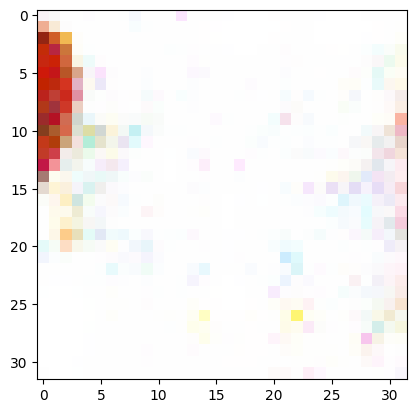

[221/500][0/936]	Loss_D: 0.0002	Loss_G: 9.5612	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[221/500][15/936]	Loss_D: 0.0091	Loss_G: 5.6594	D(x): 1.0000	D(G(z)): 0.0090 / 0.0040
[221/500][30/936]	Loss_D: 0.0002	Loss_G: 8.7563	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[221/500][45/936]	Loss_D: 0.0077	Loss_G: 6.0101	D(x): 0.9995	D(G(z)): 0.0071 / 0.0059
[221/500][60/936]	Loss_D: 0.0064	Loss_G: 5.3949	D(x): 1.0000	D(G(z)): 0.0064 / 0.0048
[221/500][75/936]	Loss_D: 0.0002	Loss_G: 9.1352	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[221/500][90/936]	Loss_D: 0.0002	Loss_G: 9.9506	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[221/500][105/936]	Loss_D: 0.0004	Loss_G: 12.9351	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[221/500][120/936]	Loss_D: 0.0005	Loss_G: 7.8261	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[221/500][135/936]	Loss_D: 0.0447	Loss_G: 17.1615	D(x): 0.9571	D(G(z)): 0.0001 / 0.0002
[221/500][150/936]	Loss_D: 0.5741	Loss_G: 6.8548	D(x): 1.0000	D(G(z)): 0.2957 / 0.0038
[221/500][165/936]	Loss_D: 0.0151	Loss_G: 6.9984	

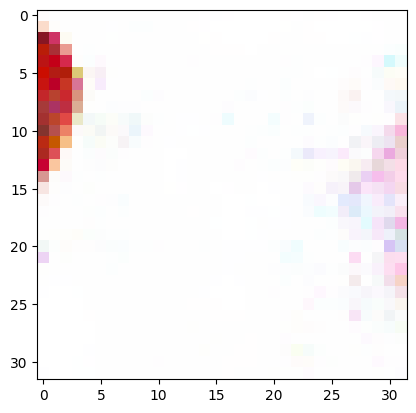

[222/500][0/936]	Loss_D: 0.0005	Loss_G: 8.6768	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[222/500][15/936]	Loss_D: 0.0000	Loss_G: 11.8076	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[222/500][30/936]	Loss_D: 0.0052	Loss_G: 5.6534	D(x): 1.0000	D(G(z)): 0.0051 / 0.0045
[222/500][45/936]	Loss_D: 0.2210	Loss_G: 8.1070	D(x): 1.0000	D(G(z)): 0.1471 / 0.0005
[222/500][60/936]	Loss_D: 0.0010	Loss_G: 8.1521	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[222/500][75/936]	Loss_D: 0.0001	Loss_G: 9.7352	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[222/500][90/936]	Loss_D: 0.0004	Loss_G: 8.8625	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[222/500][105/936]	Loss_D: 0.0038	Loss_G: 7.4147	D(x): 1.0000	D(G(z)): 0.0037 / 0.0029
[222/500][120/936]	Loss_D: 0.0051	Loss_G: 7.3014	D(x): 1.0000	D(G(z)): 0.0050 / 0.0041
[222/500][135/936]	Loss_D: 0.0117	Loss_G: 5.8661	D(x): 1.0000	D(G(z)): 0.0116 / 0.0057
[222/500][150/936]	Loss_D: 0.0003	Loss_G: 8.5582	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[222/500][165/936]	Loss_D: 0.0001	Loss_G: 13.6096	

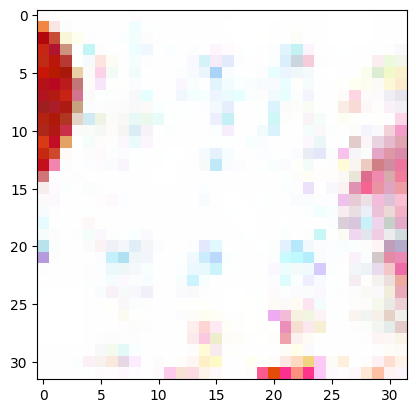

[223/500][0/936]	Loss_D: 0.0027	Loss_G: 7.5440	D(x): 0.9999	D(G(z)): 0.0026 / 0.0023
[223/500][15/936]	Loss_D: 0.0096	Loss_G: 13.3046	D(x): 0.9905	D(G(z)): 0.0000 / 0.0000
[223/500][30/936]	Loss_D: 0.0229	Loss_G: 6.3208	D(x): 0.9999	D(G(z)): 0.0219 / 0.0112
[223/500][45/936]	Loss_D: 0.0076	Loss_G: 6.4641	D(x): 1.0000	D(G(z)): 0.0075 / 0.0041
[223/500][60/936]	Loss_D: 0.0089	Loss_G: 8.8672	D(x): 0.9925	D(G(z)): 0.0013 / 0.0013
[223/500][75/936]	Loss_D: 0.0006	Loss_G: 9.6130	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[223/500][90/936]	Loss_D: 0.0110	Loss_G: 5.9054	D(x): 1.0000	D(G(z)): 0.0108 / 0.0075
[223/500][105/936]	Loss_D: 0.0003	Loss_G: 10.3883	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[223/500][120/936]	Loss_D: 0.0123	Loss_G: 12.6161	D(x): 0.9880	D(G(z)): 0.0000 / 0.0000
[223/500][135/936]	Loss_D: 0.0005	Loss_G: 9.7592	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[223/500][150/936]	Loss_D: 0.0008	Loss_G: 9.7836	D(x): 0.9999	D(G(z)): 0.0006 / 0.0006
[223/500][165/936]	Loss_D: 0.0008	Loss_G: 8.9351

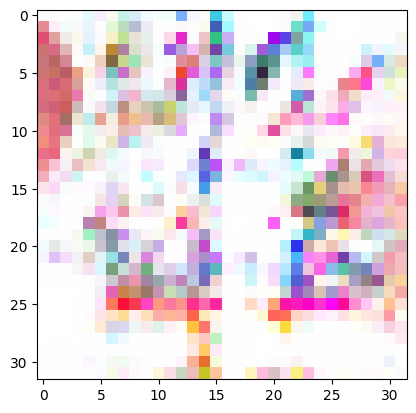

[224/500][0/936]	Loss_D: 0.0001	Loss_G: 19.4885	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[224/500][15/936]	Loss_D: 0.0008	Loss_G: 8.7306	D(x): 0.9999	D(G(z)): 0.0007 / 0.0006
[224/500][30/936]	Loss_D: 0.0002	Loss_G: 10.8169	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[224/500][45/936]	Loss_D: 0.0001	Loss_G: 11.6622	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[224/500][60/936]	Loss_D: 0.0007	Loss_G: 9.4919	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[224/500][75/936]	Loss_D: 0.0008	Loss_G: 8.6642	D(x): 0.9999	D(G(z)): 0.0007 / 0.0006
[224/500][90/936]	Loss_D: 0.0038	Loss_G: 9.6831	D(x): 1.0000	D(G(z)): 0.0037 / 0.0019
[224/500][105/936]	Loss_D: 0.0002	Loss_G: 9.6353	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[224/500][120/936]	Loss_D: 0.0001	Loss_G: 9.3966	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[224/500][135/936]	Loss_D: 0.0002	Loss_G: 10.2258	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[224/500][150/936]	Loss_D: 0.0001	Loss_G: 11.1280	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[224/500][165/936]	Loss_D: 0.0003	Loss_G: 9.19

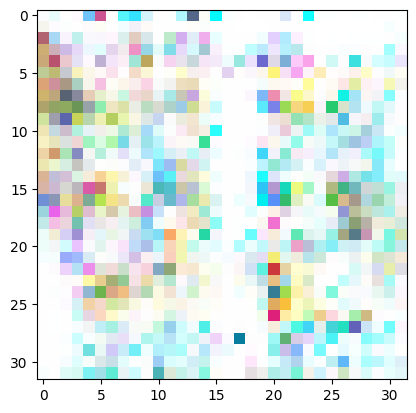

[225/500][0/936]	Loss_D: 0.0079	Loss_G: 6.0910	D(x): 1.0000	D(G(z)): 0.0079 / 0.0040
[225/500][15/936]	Loss_D: 0.0002	Loss_G: 10.4891	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[225/500][30/936]	Loss_D: 0.0002	Loss_G: 9.7455	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[225/500][45/936]	Loss_D: 0.0000	Loss_G: 31.1583	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[225/500][60/936]	Loss_D: 0.0000	Loss_G: 19.0598	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[225/500][75/936]	Loss_D: 0.0000	Loss_G: 25.3840	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[225/500][90/936]	Loss_D: 0.0001	Loss_G: 10.8121	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[225/500][105/936]	Loss_D: 0.0048	Loss_G: 12.2697	D(x): 0.9952	D(G(z)): 0.0000 / 0.0000
[225/500][120/936]	Loss_D: 0.0000	Loss_G: 15.1905	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[225/500][135/936]	Loss_D: 0.0000	Loss_G: 12.7149	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[225/500][150/936]	Loss_D: 0.0002	Loss_G: 10.0818	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[225/500][165/936]	Loss_D: 0.0007	Loss_G: 

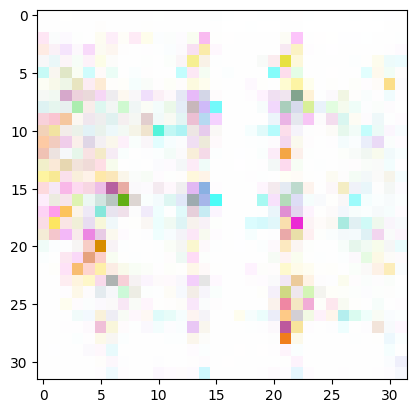

[226/500][0/936]	Loss_D: 0.0003	Loss_G: 9.7729	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[226/500][15/936]	Loss_D: 0.0020	Loss_G: 6.8531	D(x): 1.0000	D(G(z)): 0.0020 / 0.0017
[226/500][30/936]	Loss_D: 0.0050	Loss_G: 6.0992	D(x): 1.0000	D(G(z)): 0.0050 / 0.0033
[226/500][45/936]	Loss_D: 0.0054	Loss_G: 6.3188	D(x): 0.9984	D(G(z)): 0.0038 / 0.0027
[226/500][60/936]	Loss_D: 0.0008	Loss_G: 7.8202	D(x): 1.0000	D(G(z)): 0.0008 / 0.0005
[226/500][75/936]	Loss_D: 0.0559	Loss_G: 12.5949	D(x): 0.9473	D(G(z)): 0.0002 / 0.0001
[226/500][90/936]	Loss_D: 0.0000	Loss_G: 14.0715	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[226/500][105/936]	Loss_D: 0.0000	Loss_G: 11.6772	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[226/500][120/936]	Loss_D: 0.0000	Loss_G: 13.4141	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[226/500][135/936]	Loss_D: 0.0018	Loss_G: 8.4453	D(x): 0.9999	D(G(z)): 0.0017 / 0.0013
[226/500][150/936]	Loss_D: 0.0000	Loss_G: 17.8437	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[226/500][165/936]	Loss_D: 0.0001	Loss_G: 11.1

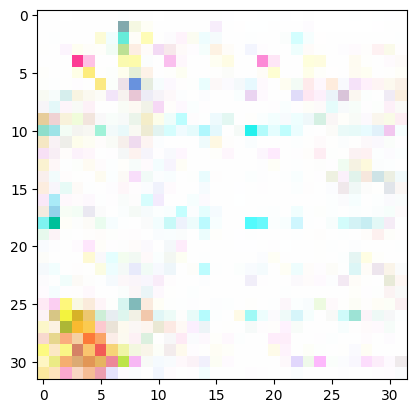

[227/500][0/936]	Loss_D: 0.0639	Loss_G: 3.0891	D(x): 1.0000	D(G(z)): 0.0605 / 0.0892
[227/500][15/936]	Loss_D: 0.0008	Loss_G: 8.2955	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[227/500][30/936]	Loss_D: 0.0028	Loss_G: 6.9893	D(x): 1.0000	D(G(z)): 0.0028 / 0.0020
[227/500][45/936]	Loss_D: 0.0002	Loss_G: 10.0764	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[227/500][60/936]	Loss_D: 0.0014	Loss_G: 7.7843	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
[227/500][75/936]	Loss_D: 0.0267	Loss_G: 6.5923	D(x): 0.9969	D(G(z)): 0.0226 / 0.0058
[227/500][90/936]	Loss_D: 0.0033	Loss_G: 9.2619	D(x): 1.0000	D(G(z)): 0.0032 / 0.0015
[227/500][105/936]	Loss_D: 0.0010	Loss_G: 8.0924	D(x): 1.0000	D(G(z)): 0.0010 / 0.0005
[227/500][120/936]	Loss_D: 0.0003	Loss_G: 19.1523	D(x): 1.0000	D(G(z)): 0.0003 / 0.0000
[227/500][135/936]	Loss_D: 0.0019	Loss_G: 18.3871	D(x): 1.0000	D(G(z)): 0.0019 / 0.0017
[227/500][150/936]	Loss_D: 0.0004	Loss_G: 12.7229	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[227/500][165/936]	Loss_D: 0.0217	Loss_G: 7.426

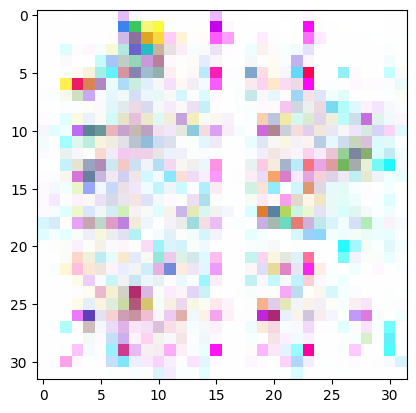

[228/500][0/936]	Loss_D: 0.0003	Loss_G: 8.3824	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[228/500][15/936]	Loss_D: 0.0001	Loss_G: 12.0671	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[228/500][30/936]	Loss_D: 0.0027	Loss_G: 6.7936	D(x): 1.0000	D(G(z)): 0.0027 / 0.0021
[228/500][45/936]	Loss_D: 0.0120	Loss_G: 6.6730	D(x): 1.0000	D(G(z)): 0.0119 / 0.0042
[228/500][60/936]	Loss_D: 0.0027	Loss_G: 7.1329	D(x): 1.0000	D(G(z)): 0.0027 / 0.0019
[228/500][75/936]	Loss_D: 0.0131	Loss_G: 5.4616	D(x): 0.9995	D(G(z)): 0.0124 / 0.0045
[228/500][90/936]	Loss_D: 0.0043	Loss_G: 7.8758	D(x): 0.9997	D(G(z)): 0.0040 / 0.0023
[228/500][105/936]	Loss_D: 0.0006	Loss_G: 7.7956	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[228/500][120/936]	Loss_D: 0.0000	Loss_G: 18.0026	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[228/500][135/936]	Loss_D: 0.0025	Loss_G: 10.5657	D(x): 1.0000	D(G(z)): 0.0024 / 0.0022
[228/500][150/936]	Loss_D: 0.0003	Loss_G: 11.5263	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[228/500][165/936]	Loss_D: 0.0000	Loss_G: 18.04

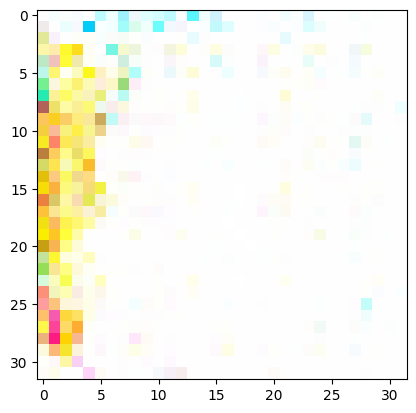

[229/500][0/936]	Loss_D: 0.0013	Loss_G: 10.9405	D(x): 1.0000	D(G(z)): 0.0013 / 0.0008
[229/500][15/936]	Loss_D: 0.0000	Loss_G: 15.3311	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[229/500][30/936]	Loss_D: 0.0069	Loss_G: 7.9258	D(x): 1.0000	D(G(z)): 0.0068 / 0.0049
[229/500][45/936]	Loss_D: 0.0002	Loss_G: 9.2527	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[229/500][60/936]	Loss_D: 0.0045	Loss_G: 6.9641	D(x): 1.0000	D(G(z)): 0.0044 / 0.0032
[229/500][75/936]	Loss_D: 0.0000	Loss_G: 13.5477	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[229/500][90/936]	Loss_D: 0.0052	Loss_G: 6.7347	D(x): 1.0000	D(G(z)): 0.0052 / 0.0039
[229/500][105/936]	Loss_D: 0.0001	Loss_G: 9.7561	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[229/500][120/936]	Loss_D: 0.1771	Loss_G: 6.4360	D(x): 0.8666	D(G(z)): 0.0006 / 0.0034
[229/500][135/936]	Loss_D: 0.0008	Loss_G: 8.6661	D(x): 1.0000	D(G(z)): 0.0008 / 0.0006
[229/500][150/936]	Loss_D: 0.0000	Loss_G: 10.8123	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[229/500][165/936]	Loss_D: 0.0001	Loss_G: 12.64

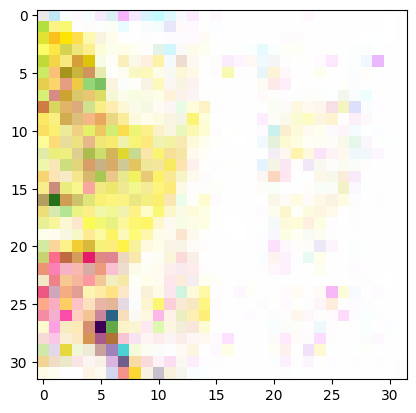

[230/500][0/936]	Loss_D: 0.0412	Loss_G: 14.0883	D(x): 0.9603	D(G(z)): 0.0000 / 0.0000
[230/500][15/936]	Loss_D: 0.0020	Loss_G: 7.3487	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[230/500][30/936]	Loss_D: 0.0002	Loss_G: 11.3809	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[230/500][45/936]	Loss_D: 0.0000	Loss_G: 11.5737	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[230/500][60/936]	Loss_D: 0.0000	Loss_G: 27.4055	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[230/500][75/936]	Loss_D: 0.0004	Loss_G: 22.9170	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[230/500][90/936]	Loss_D: 0.0000	Loss_G: 11.8734	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[230/500][105/936]	Loss_D: 0.0001	Loss_G: 13.7864	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[230/500][120/936]	Loss_D: 0.0060	Loss_G: 7.2850	D(x): 0.9997	D(G(z)): 0.0057 / 0.0028
[230/500][135/936]	Loss_D: 0.0004	Loss_G: 20.2826	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[230/500][150/936]	Loss_D: 0.0068	Loss_G: 6.2178	D(x): 1.0000	D(G(z)): 0.0068 / 0.0034
[230/500][165/936]	Loss_D: 0.0001	Loss_G: 9

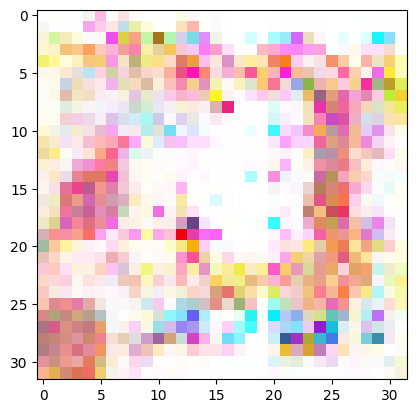

[231/500][0/936]	Loss_D: 0.0003	Loss_G: 11.5845	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[231/500][15/936]	Loss_D: 0.0057	Loss_G: 6.5104	D(x): 1.0000	D(G(z)): 0.0057 / 0.0031
[231/500][30/936]	Loss_D: 0.0071	Loss_G: 6.0938	D(x): 1.0000	D(G(z)): 0.0070 / 0.0038
[231/500][45/936]	Loss_D: 0.0002	Loss_G: 10.8653	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[231/500][60/936]	Loss_D: 0.0002	Loss_G: 12.7563	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[231/500][75/936]	Loss_D: 0.0009	Loss_G: 10.6129	D(x): 1.0000	D(G(z)): 0.0009 / 0.0002
[231/500][90/936]	Loss_D: 0.0025	Loss_G: 8.8204	D(x): 0.9977	D(G(z)): 0.0002 / 0.0002
[231/500][105/936]	Loss_D: 0.0012	Loss_G: 7.2248	D(x): 1.0000	D(G(z)): 0.0012 / 0.0021
[231/500][120/936]	Loss_D: 0.0001	Loss_G: 9.9685	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[231/500][135/936]	Loss_D: 0.0007	Loss_G: 7.9406	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[231/500][150/936]	Loss_D: 0.0000	Loss_G: 19.1593	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[231/500][165/936]	Loss_D: 0.0213	Loss_G: 8.67

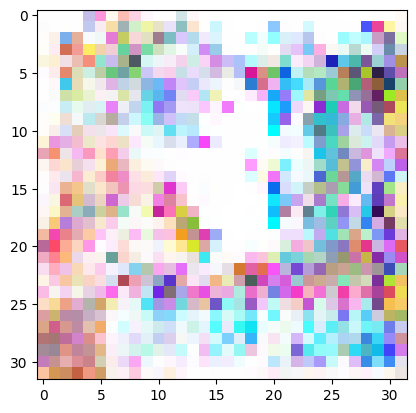

[232/500][0/936]	Loss_D: 0.0000	Loss_G: 32.4077	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[232/500][15/936]	Loss_D: 0.0000	Loss_G: 36.7123	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[232/500][30/936]	Loss_D: 0.0019	Loss_G: 36.9554	D(x): 0.9981	D(G(z)): 0.0000 / 0.0000
[232/500][45/936]	Loss_D: 0.0000	Loss_G: 33.5329	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[232/500][60/936]	Loss_D: 0.0000	Loss_G: 30.6524	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[232/500][75/936]	Loss_D: 0.0000	Loss_G: 23.4112	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[232/500][90/936]	Loss_D: 0.0009	Loss_G: 12.2091	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[232/500][105/936]	Loss_D: 0.0000	Loss_G: 14.3815	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[232/500][120/936]	Loss_D: 0.0072	Loss_G: 6.7589	D(x): 1.0000	D(G(z)): 0.0071 / 0.0025
[232/500][135/936]	Loss_D: 0.0000	Loss_G: 15.4898	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[232/500][150/936]	Loss_D: 0.0000	Loss_G: 23.0765	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[232/500][165/936]	Loss_D: 1.5393	Loss_G:

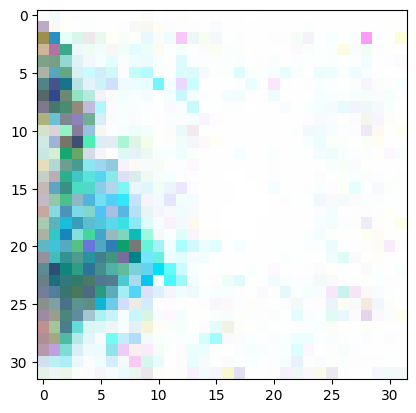

[233/500][0/936]	Loss_D: 0.8563	Loss_G: 11.7595	D(x): 1.0000	D(G(z)): 0.4345 / 0.0001
[233/500][15/936]	Loss_D: 0.0008	Loss_G: 22.2861	D(x): 0.9993	D(G(z)): 0.0001 / 0.0001
[233/500][30/936]	Loss_D: 0.0002	Loss_G: 17.6861	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[233/500][45/936]	Loss_D: 0.0000	Loss_G: 17.8005	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[233/500][60/936]	Loss_D: 0.0002	Loss_G: 10.5750	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[233/500][75/936]	Loss_D: 0.0000	Loss_G: 15.2322	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[233/500][90/936]	Loss_D: 0.0004	Loss_G: 8.2900	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[233/500][105/936]	Loss_D: 0.0062	Loss_G: 6.1615	D(x): 1.0000	D(G(z)): 0.0061 / 0.0040
[233/500][120/936]	Loss_D: 0.0048	Loss_G: 10.5525	D(x): 0.9953	D(G(z)): 0.0001 / 0.0001
[233/500][135/936]	Loss_D: 0.1252	Loss_G: 6.8052	D(x): 0.9533	D(G(z)): 0.0666 / 0.0012
[233/500][150/936]	Loss_D: 0.0013	Loss_G: 8.1644	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[233/500][165/936]	Loss_D: 0.0239	Loss_G: 5.

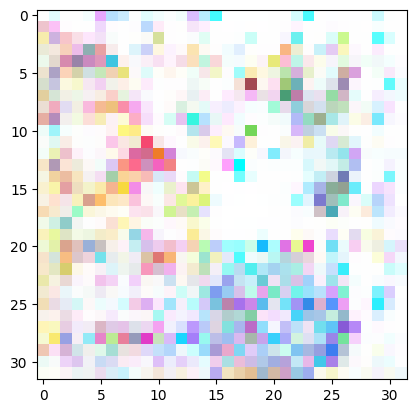

[234/500][0/936]	Loss_D: 0.0012	Loss_G: 7.1555	D(x): 0.9999	D(G(z)): 0.0012 / 0.0011
[234/500][15/936]	Loss_D: 1.7330	Loss_G: 4.6134	D(x): 0.7486	D(G(z)): 0.0006 / 0.0135
[234/500][30/936]	Loss_D: 0.0001	Loss_G: 13.3731	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[234/500][45/936]	Loss_D: 0.0001	Loss_G: 12.0342	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[234/500][60/936]	Loss_D: 0.0223	Loss_G: 6.5583	D(x): 1.0000	D(G(z)): 0.0214 / 0.0081
[234/500][75/936]	Loss_D: 0.0007	Loss_G: 7.5647	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[234/500][90/936]	Loss_D: 0.0041	Loss_G: 6.0326	D(x): 1.0000	D(G(z)): 0.0041 / 0.0037
[234/500][105/936]	Loss_D: 0.0061	Loss_G: 5.9981	D(x): 1.0000	D(G(z)): 0.0060 / 0.0039
[234/500][120/936]	Loss_D: 0.0018	Loss_G: 7.3701	D(x): 1.0000	D(G(z)): 0.0018 / 0.0009
[234/500][135/936]	Loss_D: 0.0067	Loss_G: 6.1868	D(x): 1.0000	D(G(z)): 0.0066 / 0.0037
[234/500][150/936]	Loss_D: 0.0006	Loss_G: 7.7698	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[234/500][165/936]	Loss_D: 0.0306	Loss_G: 4.4505	

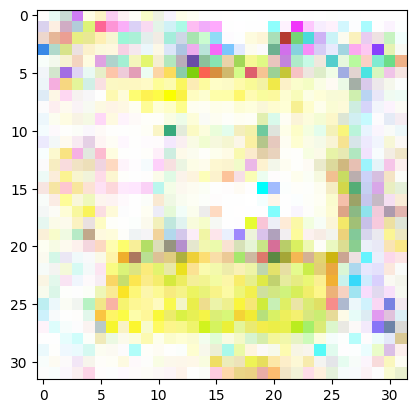

[235/500][0/936]	Loss_D: 0.0000	Loss_G: 12.6935	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[235/500][15/936]	Loss_D: 0.0007	Loss_G: 9.2172	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[235/500][30/936]	Loss_D: 0.0003	Loss_G: 8.6293	D(x): 0.9999	D(G(z)): 0.0003 / 0.0002
[235/500][45/936]	Loss_D: 0.0137	Loss_G: 6.7635	D(x): 1.0000	D(G(z)): 0.0134 / 0.0049
[235/500][60/936]	Loss_D: 0.0035	Loss_G: 6.1225	D(x): 0.9999	D(G(z)): 0.0034 / 0.0025
[235/500][75/936]	Loss_D: 0.0003	Loss_G: 7.9233	D(x): 1.0000	D(G(z)): 0.0003 / 0.0004
[235/500][90/936]	Loss_D: 0.0013	Loss_G: 7.0105	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[235/500][105/936]	Loss_D: 0.0015	Loss_G: 7.1336	D(x): 1.0000	D(G(z)): 0.0015 / 0.0012
[235/500][120/936]	Loss_D: 0.0001	Loss_G: 10.0837	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[235/500][135/936]	Loss_D: 0.0007	Loss_G: 7.6207	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[235/500][150/936]	Loss_D: 0.0047	Loss_G: 6.2293	D(x): 1.0000	D(G(z)): 0.0047 / 0.0025
[235/500][165/936]	Loss_D: 0.0012	Loss_G: 7.0465	

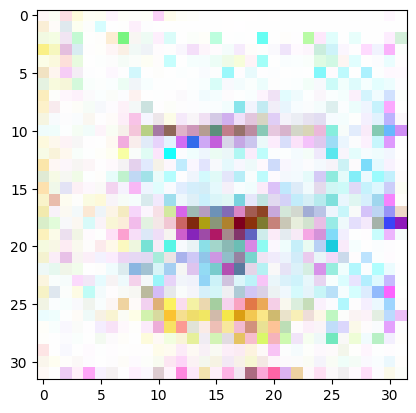

[236/500][0/936]	Loss_D: 0.0068	Loss_G: 5.9775	D(x): 0.9998	D(G(z)): 0.0066 / 0.0064
[236/500][15/936]	Loss_D: 0.0024	Loss_G: 7.4563	D(x): 1.0000	D(G(z)): 0.0024 / 0.0017
[236/500][30/936]	Loss_D: 0.0000	Loss_G: 11.0847	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[236/500][45/936]	Loss_D: 0.0013	Loss_G: 9.1949	D(x): 0.9989	D(G(z)): 0.0001 / 0.0001
[236/500][60/936]	Loss_D: 0.0006	Loss_G: 8.1631	D(x): 0.9997	D(G(z)): 0.0003 / 0.0003
[236/500][75/936]	Loss_D: 0.0001	Loss_G: 10.0564	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[236/500][90/936]	Loss_D: 0.0035	Loss_G: 6.4346	D(x): 1.0000	D(G(z)): 0.0035 / 0.0027
[236/500][105/936]	Loss_D: 0.0180	Loss_G: 5.4165	D(x): 0.9990	D(G(z)): 0.0167 / 0.0055
[236/500][120/936]	Loss_D: 0.0000	Loss_G: 12.4227	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[236/500][135/936]	Loss_D: 0.0054	Loss_G: 5.9436	D(x): 0.9999	D(G(z)): 0.0054 / 0.0031
[236/500][150/936]	Loss_D: 0.0000	Loss_G: 38.5372	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[236/500][165/936]	Loss_D: 0.0795	Loss_G: 37.10

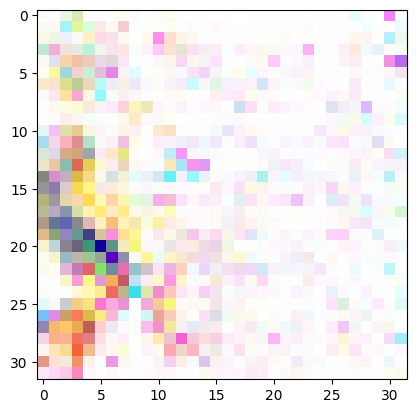

[237/500][0/936]	Loss_D: 0.0004	Loss_G: 8.6822	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[237/500][15/936]	Loss_D: 0.0002	Loss_G: 9.7094	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[237/500][30/936]	Loss_D: 0.0005	Loss_G: 8.0600	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[237/500][45/936]	Loss_D: 0.0010	Loss_G: 7.0873	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[237/500][60/936]	Loss_D: 0.0001	Loss_G: 10.4834	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[237/500][75/936]	Loss_D: 0.0107	Loss_G: 5.6487	D(x): 1.0000	D(G(z)): 0.0107 / 0.0040
[237/500][90/936]	Loss_D: 0.0001	Loss_G: 9.6791	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[237/500][105/936]	Loss_D: 0.0000	Loss_G: 14.5625	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[237/500][120/936]	Loss_D: 0.0000	Loss_G: 17.3260	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[237/500][135/936]	Loss_D: 0.0000	Loss_G: 13.4133	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[237/500][150/936]	Loss_D: 0.0005	Loss_G: 8.0575	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[237/500][165/936]	Loss_D: 0.0001	Loss_G: 9.145

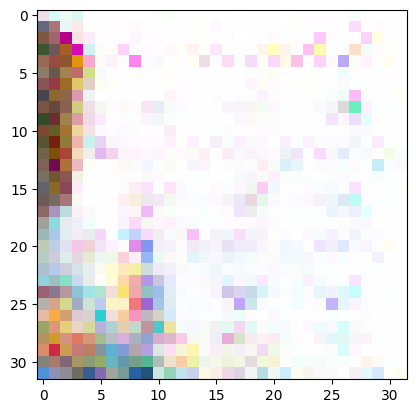

[238/500][0/936]	Loss_D: 0.0010	Loss_G: 11.8067	D(x): 1.0000	D(G(z)): 0.0010 / 0.0029
[238/500][15/936]	Loss_D: 0.0079	Loss_G: 7.3678	D(x): 1.0000	D(G(z)): 0.0078 / 0.0056
[238/500][30/936]	Loss_D: 0.0057	Loss_G: 7.4432	D(x): 1.0000	D(G(z)): 0.0057 / 0.0039
[238/500][45/936]	Loss_D: 0.0032	Loss_G: 10.8843	D(x): 1.0000	D(G(z)): 0.0031 / 0.0016
[238/500][60/936]	Loss_D: 0.0000	Loss_G: 12.0062	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[238/500][75/936]	Loss_D: 0.0033	Loss_G: 7.2138	D(x): 1.0000	D(G(z)): 0.0033 / 0.0013
[238/500][90/936]	Loss_D: 0.0000	Loss_G: 42.7661	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[238/500][105/936]	Loss_D: 0.0000	Loss_G: 33.6241	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[238/500][120/936]	Loss_D: 0.0007	Loss_G: 19.5420	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[238/500][135/936]	Loss_D: 0.0000	Loss_G: 34.3443	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[238/500][150/936]	Loss_D: 0.0011	Loss_G: 25.8024	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[238/500][165/936]	Loss_D: 0.0000	Loss_G: 3

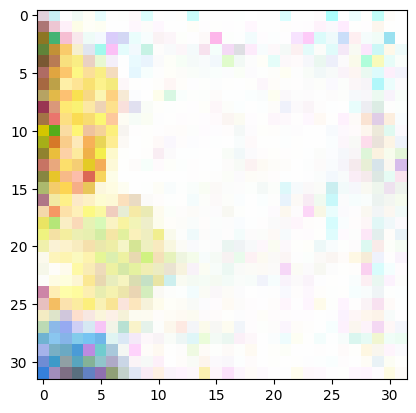

[239/500][0/936]	Loss_D: 0.5715	Loss_G: 6.2917	D(x): 1.0000	D(G(z)): 0.2447 / 0.0548
[239/500][15/936]	Loss_D: 0.0032	Loss_G: 15.6020	D(x): 0.9968	D(G(z)): 0.0000 / 0.0000
[239/500][30/936]	Loss_D: 0.0073	Loss_G: 6.8995	D(x): 1.0000	D(G(z)): 0.0073 / 0.0054
[239/500][45/936]	Loss_D: 0.0307	Loss_G: 4.6234	D(x): 1.0000	D(G(z)): 0.0301 / 0.0131
[239/500][60/936]	Loss_D: 0.1137	Loss_G: 5.3875	D(x): 1.0000	D(G(z)): 0.1011 / 0.0132
[239/500][75/936]	Loss_D: 0.0001	Loss_G: 10.4757	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[239/500][90/936]	Loss_D: 0.0099	Loss_G: 5.3390	D(x): 1.0000	D(G(z)): 0.0099 / 0.0056
[239/500][105/936]	Loss_D: 0.0003	Loss_G: 8.7993	D(x): 0.9999	D(G(z)): 0.0003 / 0.0002
[239/500][120/936]	Loss_D: 0.0040	Loss_G: 5.9475	D(x): 0.9999	D(G(z)): 0.0040 / 0.0031
[239/500][135/936]	Loss_D: 0.0029	Loss_G: 11.0788	D(x): 1.0000	D(G(z)): 0.0029 / 0.0018
[239/500][150/936]	Loss_D: 0.0000	Loss_G: 10.9945	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[239/500][165/936]	Loss_D: 0.0023	Loss_G: 6.927

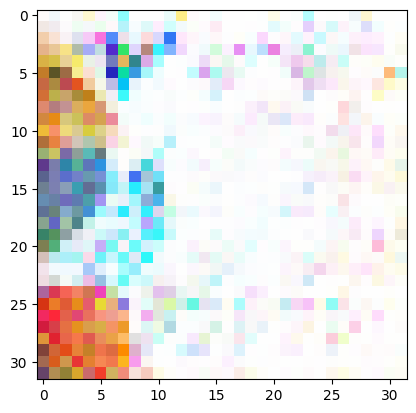

[240/500][0/936]	Loss_D: 0.0159	Loss_G: 5.0653	D(x): 1.0000	D(G(z)): 0.0158 / 0.0067
[240/500][15/936]	Loss_D: 0.0009	Loss_G: 7.1561	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[240/500][30/936]	Loss_D: 0.0209	Loss_G: 5.3387	D(x): 1.0000	D(G(z)): 0.0206 / 0.0061
[240/500][45/936]	Loss_D: 0.0002	Loss_G: 28.8153	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[240/500][60/936]	Loss_D: 0.0000	Loss_G: 15.8677	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[240/500][75/936]	Loss_D: 0.0000	Loss_G: 14.1444	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[240/500][90/936]	Loss_D: 0.0000	Loss_G: 19.6847	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[240/500][105/936]	Loss_D: 0.0000	Loss_G: 11.6648	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[240/500][120/936]	Loss_D: 0.0007	Loss_G: 8.6769	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[240/500][135/936]	Loss_D: 0.0012	Loss_G: 7.9053	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[240/500][150/936]	Loss_D: 0.0003	Loss_G: 9.4225	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[240/500][165/936]	Loss_D: 0.0013	Loss_G: 7.06

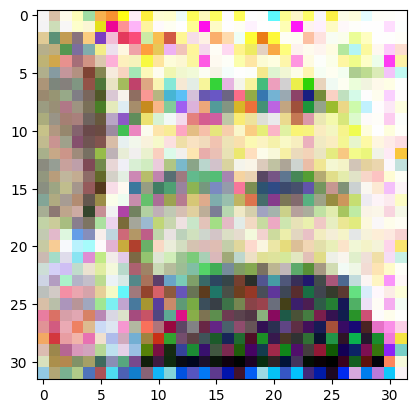

[241/500][0/936]	Loss_D: 0.0139	Loss_G: 6.4463	D(x): 0.9912	D(G(z)): 0.0049 / 0.0024
[241/500][15/936]	Loss_D: 0.0161	Loss_G: 7.1302	D(x): 1.0000	D(G(z)): 0.0156 / 0.0040
[241/500][30/936]	Loss_D: 0.0027	Loss_G: 6.5398	D(x): 1.0000	D(G(z)): 0.0027 / 0.0017
[241/500][45/936]	Loss_D: 0.0029	Loss_G: 8.3549	D(x): 1.0000	D(G(z)): 0.0029 / 0.0008
[241/500][60/936]	Loss_D: 0.0003	Loss_G: 9.4502	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[241/500][75/936]	Loss_D: 0.0114	Loss_G: 6.7875	D(x): 1.0000	D(G(z)): 0.0113 / 0.0018
[241/500][90/936]	Loss_D: 0.0108	Loss_G: 6.6171	D(x): 1.0000	D(G(z)): 0.0106 / 0.0031
[241/500][105/936]	Loss_D: 0.0010	Loss_G: 7.8918	D(x): 1.0000	D(G(z)): 0.0010 / 0.0006
[241/500][120/936]	Loss_D: 0.0522	Loss_G: 13.0744	D(x): 1.0000	D(G(z)): 0.0478 / 0.0000
[241/500][135/936]	Loss_D: 0.0000	Loss_G: 36.6858	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[241/500][150/936]	Loss_D: 0.0000	Loss_G: 28.4733	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[241/500][165/936]	Loss_D: 0.0009	Loss_G: 28.090

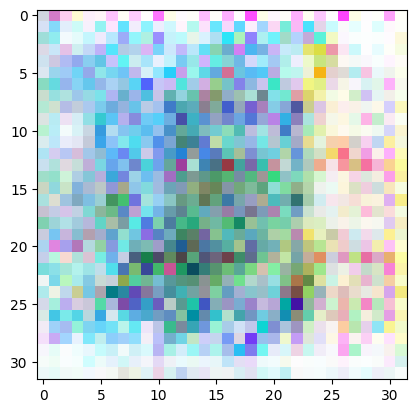

[242/500][0/936]	Loss_D: 0.0133	Loss_G: 4.3793	D(x): 1.0000	D(G(z)): 0.0132 / 0.0135
[242/500][15/936]	Loss_D: 0.0129	Loss_G: 36.8858	D(x): 0.9873	D(G(z)): 0.0000 / 0.0000
[242/500][30/936]	Loss_D: 0.0067	Loss_G: 19.5811	D(x): 1.0000	D(G(z)): 0.0066 / 0.0028
[242/500][45/936]	Loss_D: 0.0000	Loss_G: 15.9340	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[242/500][60/936]	Loss_D: 0.0145	Loss_G: 5.3442	D(x): 1.0000	D(G(z)): 0.0144 / 0.0060
[242/500][75/936]	Loss_D: 0.8398	Loss_G: 16.5198	D(x): 1.0000	D(G(z)): 0.4850 / 0.0000
[242/500][90/936]	Loss_D: 0.0000	Loss_G: 13.8371	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[242/500][105/936]	Loss_D: 0.0001	Loss_G: 10.0634	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[242/500][120/936]	Loss_D: 0.0002	Loss_G: 9.6821	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[242/500][135/936]	Loss_D: 0.0000	Loss_G: 14.4928	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[242/500][150/936]	Loss_D: 0.0213	Loss_G: 6.1606	D(x): 0.9936	D(G(z)): 0.0147 / 0.0092
[242/500][165/936]	Loss_D: 0.0015	Loss_G: 7.

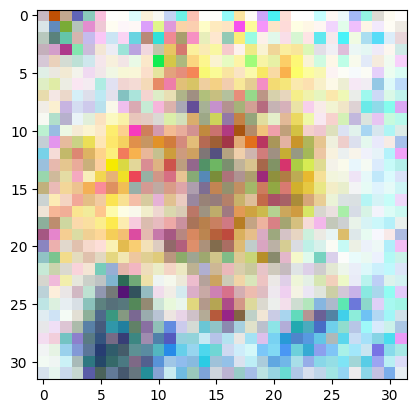

[243/500][0/936]	Loss_D: 0.0000	Loss_G: 36.9088	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[243/500][15/936]	Loss_D: 0.0001	Loss_G: 18.8345	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[243/500][30/936]	Loss_D: 0.0059	Loss_G: 7.7523	D(x): 0.9999	D(G(z)): 0.0058 / 0.0021
[243/500][45/936]	Loss_D: 0.0000	Loss_G: 16.7648	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[243/500][60/936]	Loss_D: 0.0000	Loss_G: 12.2301	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[243/500][75/936]	Loss_D: 0.0037	Loss_G: 6.5854	D(x): 0.9997	D(G(z)): 0.0034 / 0.0019
[243/500][90/936]	Loss_D: 0.0006	Loss_G: 9.2631	D(x): 0.9996	D(G(z)): 0.0002 / 0.0002
[243/500][105/936]	Loss_D: 0.0001	Loss_G: 10.8818	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[243/500][120/936]	Loss_D: 0.0000	Loss_G: 16.6565	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[243/500][135/936]	Loss_D: 0.0000	Loss_G: 14.3950	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[243/500][150/936]	Loss_D: 0.0000	Loss_G: 13.2177	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[243/500][165/936]	Loss_D: 0.0014	Loss_G: 8

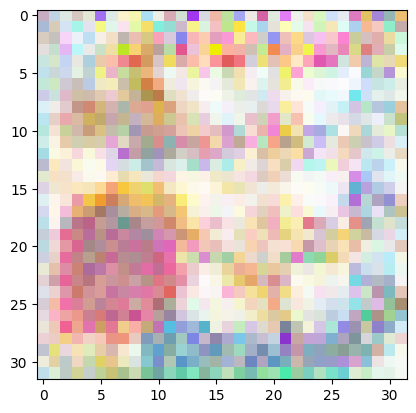

[244/500][0/936]	Loss_D: 0.0000	Loss_G: 13.2346	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[244/500][15/936]	Loss_D: 0.4447	Loss_G: 41.2814	D(x): 0.7387	D(G(z)): 0.0000 / 0.0000
[244/500][30/936]	Loss_D: 0.0000	Loss_G: 36.6329	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[244/500][45/936]	Loss_D: 0.0000	Loss_G: 37.1814	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[244/500][60/936]	Loss_D: 0.0000	Loss_G: 36.4664	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[244/500][75/936]	Loss_D: 0.0000	Loss_G: 33.5222	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[244/500][90/936]	Loss_D: 0.0000	Loss_G: 24.2930	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[244/500][105/936]	Loss_D: 0.0000	Loss_G: 15.4286	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[244/500][120/936]	Loss_D: 0.0009	Loss_G: 9.1031	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[244/500][135/936]	Loss_D: 0.0178	Loss_G: 5.3919	D(x): 0.9998	D(G(z)): 0.0173 / 0.0074
[244/500][150/936]	Loss_D: 0.0006	Loss_G: 7.7621	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[244/500][165/936]	Loss_D: 0.0329	Loss_G: 6

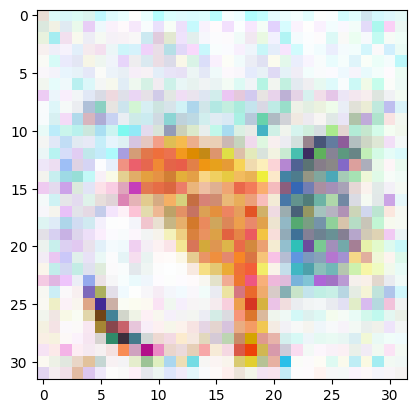

[245/500][0/936]	Loss_D: 0.0024	Loss_G: 6.5760	D(x): 1.0000	D(G(z)): 0.0024 / 0.0022
[245/500][15/936]	Loss_D: 0.0043	Loss_G: 6.3712	D(x): 0.9989	D(G(z)): 0.0032 / 0.0029
[245/500][30/936]	Loss_D: 0.0524	Loss_G: 5.8489	D(x): 1.0000	D(G(z)): 0.0490 / 0.0070
[245/500][45/936]	Loss_D: 0.0026	Loss_G: 6.5400	D(x): 1.0000	D(G(z)): 0.0026 / 0.0024
[245/500][60/936]	Loss_D: 0.0000	Loss_G: 17.8080	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[245/500][75/936]	Loss_D: 0.0000	Loss_G: 12.3093	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[245/500][90/936]	Loss_D: 0.0006	Loss_G: 11.3463	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[245/500][105/936]	Loss_D: 0.0007	Loss_G: 8.0172	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[245/500][120/936]	Loss_D: 0.0001	Loss_G: 9.7413	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[245/500][135/936]	Loss_D: 0.0050	Loss_G: 5.8211	D(x): 1.0000	D(G(z)): 0.0050 / 0.0035
[245/500][150/936]	Loss_D: 0.0069	Loss_G: 5.4743	D(x): 1.0000	D(G(z)): 0.0068 / 0.0047
[245/500][165/936]	Loss_D: 0.0004	Loss_G: 9.5163

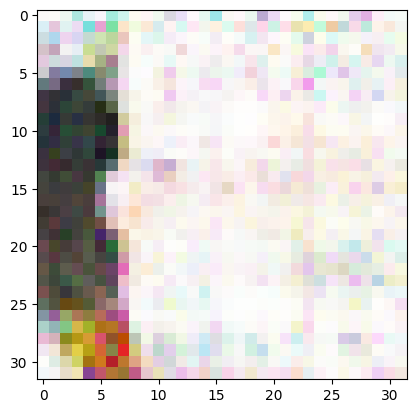

[246/500][0/936]	Loss_D: 0.0401	Loss_G: 6.5788	D(x): 0.9643	D(G(z)): 0.0032 / 0.0038
[246/500][15/936]	Loss_D: 0.0000	Loss_G: 11.0523	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[246/500][30/936]	Loss_D: 0.0023	Loss_G: 6.7010	D(x): 1.0000	D(G(z)): 0.0023 / 0.0020
[246/500][45/936]	Loss_D: 0.0360	Loss_G: 4.9422	D(x): 0.9999	D(G(z)): 0.0346 / 0.0078
[246/500][60/936]	Loss_D: 0.0003	Loss_G: 8.5555	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[246/500][75/936]	Loss_D: 0.0009	Loss_G: 7.5427	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[246/500][90/936]	Loss_D: 0.0000	Loss_G: 13.8185	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[246/500][105/936]	Loss_D: 0.0000	Loss_G: 11.3065	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[246/500][120/936]	Loss_D: 0.0002	Loss_G: 17.4926	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[246/500][135/936]	Loss_D: 0.0000	Loss_G: 24.2081	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[246/500][150/936]	Loss_D: 0.0002	Loss_G: 9.3828	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[246/500][165/936]	Loss_D: 0.0000	Loss_G: 15.6

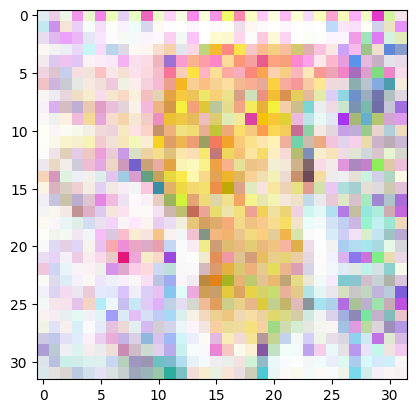

[247/500][0/936]	Loss_D: 0.0006	Loss_G: 8.9467	D(x): 0.9997	D(G(z)): 0.0003 / 0.0003
[247/500][15/936]	Loss_D: 0.0111	Loss_G: 5.9408	D(x): 1.0000	D(G(z)): 0.0110 / 0.0038
[247/500][30/936]	Loss_D: 0.0030	Loss_G: 6.5039	D(x): 0.9998	D(G(z)): 0.0027 / 0.0021
[247/500][45/936]	Loss_D: 0.0001	Loss_G: 34.1634	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[247/500][60/936]	Loss_D: 0.0000	Loss_G: 43.2954	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[247/500][75/936]	Loss_D: 0.0000	Loss_G: 40.3118	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[247/500][90/936]	Loss_D: 0.0000	Loss_G: 35.1758	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[247/500][105/936]	Loss_D: 0.0000	Loss_G: 43.5433	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[247/500][120/936]	Loss_D: 0.6446	Loss_G: 32.7359	D(x): 1.0000	D(G(z)): 0.2310 / 0.0000
[247/500][135/936]	Loss_D: 0.0001	Loss_G: 26.6768	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[247/500][150/936]	Loss_D: 0.0002	Loss_G: 19.9443	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[247/500][165/936]	Loss_D: 0.0000	Loss_G: 1

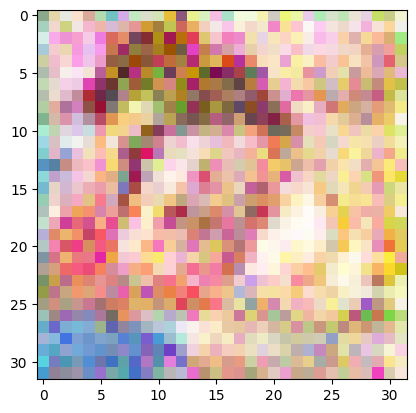

[248/500][0/936]	Loss_D: 0.0067	Loss_G: 14.5871	D(x): 1.0000	D(G(z)): 0.0067 / 0.0040
[248/500][15/936]	Loss_D: 0.0063	Loss_G: 11.3531	D(x): 1.0000	D(G(z)): 0.0063 / 0.0045
[248/500][30/936]	Loss_D: 0.0019	Loss_G: 14.4117	D(x): 0.9981	D(G(z)): 0.0000 / 0.0000
[248/500][45/936]	Loss_D: 0.0002	Loss_G: 12.0967	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[248/500][60/936]	Loss_D: 0.0000	Loss_G: 12.4803	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[248/500][75/936]	Loss_D: 0.0346	Loss_G: 7.6934	D(x): 1.0000	D(G(z)): 0.0325 / 0.0013
[248/500][90/936]	Loss_D: 0.0074	Loss_G: 8.0790	D(x): 1.0000	D(G(z)): 0.0073 / 0.0021
[248/500][105/936]	Loss_D: 0.0010	Loss_G: 10.2480	D(x): 0.9992	D(G(z)): 0.0002 / 0.0002
[248/500][120/936]	Loss_D: 0.0003	Loss_G: 9.5105	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[248/500][135/936]	Loss_D: 0.0000	Loss_G: 41.8463	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[248/500][150/936]	Loss_D: 0.0001	Loss_G: 23.0866	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[248/500][165/936]	Loss_D: 0.1081	Loss_G: 3

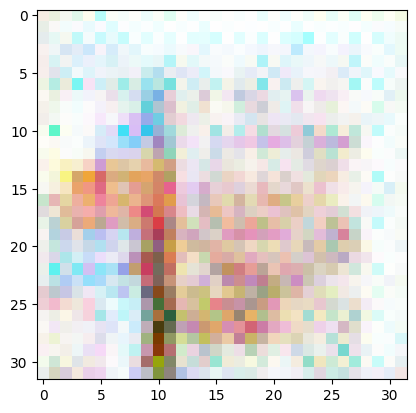

[249/500][0/936]	Loss_D: 0.1225	Loss_G: 3.9812	D(x): 1.0000	D(G(z)): 0.1138 / 0.0214
[249/500][15/936]	Loss_D: 0.0029	Loss_G: 6.3112	D(x): 0.9999	D(G(z)): 0.0028 / 0.0024
[249/500][30/936]	Loss_D: 0.1372	Loss_G: 7.0784	D(x): 0.9977	D(G(z)): 0.1232 / 0.0011
[249/500][45/936]	Loss_D: 0.0020	Loss_G: 6.6835	D(x): 1.0000	D(G(z)): 0.0020 / 0.0015
[249/500][60/936]	Loss_D: 0.0004	Loss_G: 8.5441	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[249/500][75/936]	Loss_D: 0.0004	Loss_G: 8.3575	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[249/500][90/936]	Loss_D: 0.0011	Loss_G: 7.3711	D(x): 1.0000	D(G(z)): 0.0011 / 0.0007
[249/500][105/936]	Loss_D: 0.0020	Loss_G: 6.6585	D(x): 0.9999	D(G(z)): 0.0019 / 0.0014
[249/500][120/936]	Loss_D: 0.0520	Loss_G: 4.7100	D(x): 1.0000	D(G(z)): 0.0500 / 0.0120
[249/500][135/936]	Loss_D: 0.0268	Loss_G: 5.2292	D(x): 0.9996	D(G(z)): 0.0261 / 0.0055
[249/500][150/936]	Loss_D: 0.0001	Loss_G: 23.8899	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[249/500][165/936]	Loss_D: 0.0014	Loss_G: 21.2939	

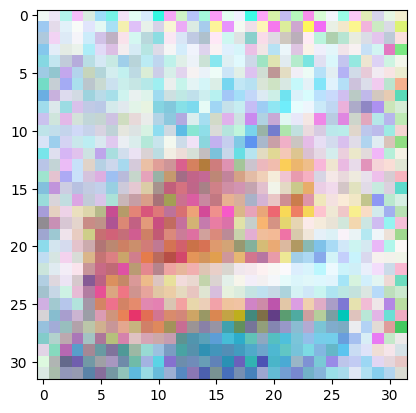

[250/500][0/936]	Loss_D: 0.0299	Loss_G: 5.7409	D(x): 0.9998	D(G(z)): 0.0292 / 0.0035
[250/500][15/936]	Loss_D: 0.0074	Loss_G: 30.7103	D(x): 0.9927	D(G(z)): 0.0000 / 0.0000
[250/500][30/936]	Loss_D: 0.0000	Loss_G: 16.1745	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[250/500][45/936]	Loss_D: 0.1192	Loss_G: 7.4632	D(x): 0.9986	D(G(z)): 0.1086 / 0.0043
[250/500][60/936]	Loss_D: 0.0281	Loss_G: 5.1032	D(x): 0.9866	D(G(z)): 0.0143 / 0.0087
[250/500][75/936]	Loss_D: 0.0122	Loss_G: 5.1746	D(x): 1.0000	D(G(z)): 0.0121 / 0.0063
[250/500][90/936]	Loss_D: 0.0051	Loss_G: 5.6052	D(x): 1.0000	D(G(z)): 0.0051 / 0.0039
[250/500][105/936]	Loss_D: 0.0158	Loss_G: 10.4668	D(x): 0.9846	D(G(z)): 0.0001 / 0.0001
[250/500][120/936]	Loss_D: 0.5156	Loss_G: 3.8259	D(x): 0.7819	D(G(z)): 0.0040 / 0.0865
[250/500][135/936]	Loss_D: 0.0530	Loss_G: 4.6514	D(x): 1.0000	D(G(z)): 0.0512 / 0.0122
[250/500][150/936]	Loss_D: 0.0073	Loss_G: 5.4735	D(x): 1.0000	D(G(z)): 0.0073 / 0.0046
[250/500][165/936]	Loss_D: 0.0943	Loss_G: 4.8045

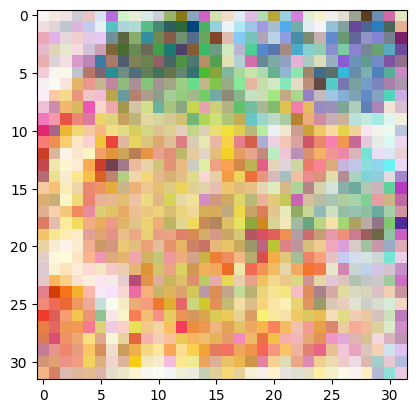

[251/500][0/936]	Loss_D: 3.3427	Loss_G: 23.7655	D(x): 1.0000	D(G(z)): 0.9551 / 0.0000
[251/500][15/936]	Loss_D: 0.0062	Loss_G: 47.4499	D(x): 0.9939	D(G(z)): 0.0000 / 0.0000
[251/500][30/936]	Loss_D: 0.0004	Loss_G: 49.8198	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[251/500][45/936]	Loss_D: 0.0001	Loss_G: 48.0899	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[251/500][60/936]	Loss_D: 0.0000	Loss_G: 44.3535	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[251/500][75/936]	Loss_D: 0.0009	Loss_G: 44.0771	D(x): 0.9991	D(G(z)): 0.0000 / 0.0000
[251/500][90/936]	Loss_D: 0.0000	Loss_G: 46.9892	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[251/500][105/936]	Loss_D: 0.0114	Loss_G: 48.4019	D(x): 0.9889	D(G(z)): 0.0000 / 0.0000
[251/500][120/936]	Loss_D: 0.0000	Loss_G: 39.9956	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[251/500][135/936]	Loss_D: 0.0000	Loss_G: 43.7030	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[251/500][150/936]	Loss_D: 0.0000	Loss_G: 42.7585	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[251/500][165/936]	Loss_D: 0.0000	Loss_G

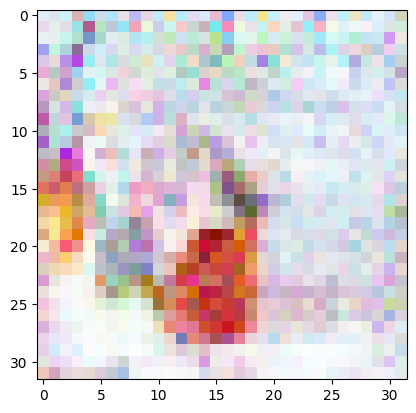

[252/500][0/936]	Loss_D: 0.0000	Loss_G: 10.1136	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[252/500][15/936]	Loss_D: 0.0377	Loss_G: 4.6562	D(x): 1.0000	D(G(z)): 0.0368 / 0.0107
[252/500][30/936]	Loss_D: 0.0000	Loss_G: 10.3919	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[252/500][45/936]	Loss_D: 0.0002	Loss_G: 9.8113	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[252/500][60/936]	Loss_D: 0.0050	Loss_G: 5.4987	D(x): 1.0000	D(G(z)): 0.0050 / 0.0042
[252/500][75/936]	Loss_D: 0.0058	Loss_G: 5.6325	D(x): 0.9999	D(G(z)): 0.0057 / 0.0050
[252/500][90/936]	Loss_D: 0.0069	Loss_G: 5.8245	D(x): 1.0000	D(G(z)): 0.0069 / 0.0038
[252/500][105/936]	Loss_D: 0.0003	Loss_G: 9.0423	D(x): 0.9999	D(G(z)): 0.0002 / 0.0001
[252/500][120/936]	Loss_D: 0.0014	Loss_G: 7.7210	D(x): 0.9999	D(G(z)): 0.0013 / 0.0007
[252/500][135/936]	Loss_D: 0.0101	Loss_G: 6.7837	D(x): 0.9992	D(G(z)): 0.0093 / 0.0053
[252/500][150/936]	Loss_D: 0.5561	Loss_G: 12.8081	D(x): 0.7767	D(G(z)): 0.0000 / 0.0000
[252/500][165/936]	Loss_D: 0.0001	Loss_G: 11.324

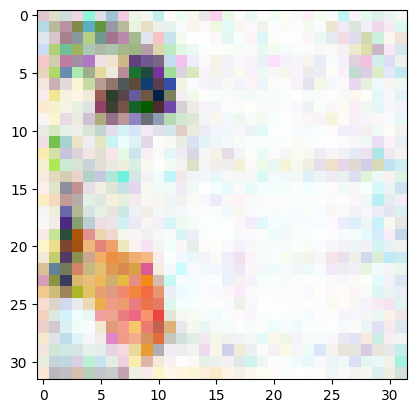

[253/500][0/936]	Loss_D: 0.0019	Loss_G: 7.8018	D(x): 0.9995	D(G(z)): 0.0013 / 0.0013
[253/500][15/936]	Loss_D: 0.0000	Loss_G: 21.0496	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[253/500][30/936]	Loss_D: 0.0002	Loss_G: 10.7141	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[253/500][45/936]	Loss_D: 0.0021	Loss_G: 8.9096	D(x): 0.9999	D(G(z)): 0.0019 / 0.0027
[253/500][60/936]	Loss_D: 0.0007	Loss_G: 12.2701	D(x): 0.9993	D(G(z)): 0.0000 / 0.0000
[253/500][75/936]	Loss_D: 0.0045	Loss_G: 7.5780	D(x): 0.9992	D(G(z)): 0.0036 / 0.0030
[253/500][90/936]	Loss_D: 0.0044	Loss_G: 8.0999	D(x): 0.9971	D(G(z)): 0.0015 / 0.0014
[253/500][105/936]	Loss_D: 0.0055	Loss_G: 6.2595	D(x): 0.9994	D(G(z)): 0.0049 / 0.0039
[253/500][120/936]	Loss_D: 0.0001	Loss_G: 10.7019	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[253/500][135/936]	Loss_D: 0.0000	Loss_G: 15.8555	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[253/500][150/936]	Loss_D: 0.0119	Loss_G: 5.9820	D(x): 1.0000	D(G(z)): 0.0117 / 0.0065
[253/500][165/936]	Loss_D: 0.0083	Loss_G: 5.58

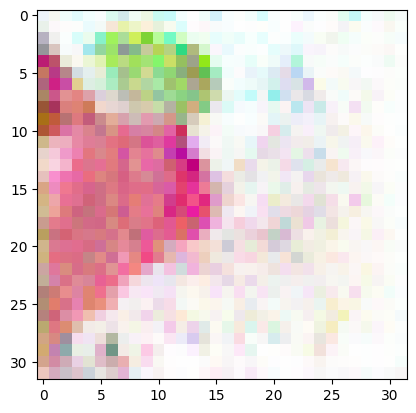

[254/500][0/936]	Loss_D: 0.6120	Loss_G: 13.0356	D(x): 1.0000	D(G(z)): 0.4158 / 0.0000
[254/500][15/936]	Loss_D: 0.0870	Loss_G: 9.7000	D(x): 1.0000	D(G(z)): 0.0794 / 0.0085
[254/500][30/936]	Loss_D: 0.0001	Loss_G: 17.2395	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[254/500][45/936]	Loss_D: 0.0137	Loss_G: 8.3707	D(x): 0.9997	D(G(z)): 0.0132 / 0.0083
[254/500][60/936]	Loss_D: 0.0023	Loss_G: 6.6726	D(x): 1.0000	D(G(z)): 0.0023 / 0.0020
[254/500][75/936]	Loss_D: 0.0228	Loss_G: 12.2650	D(x): 0.9778	D(G(z)): 0.0000 / 0.0000
[254/500][90/936]	Loss_D: 0.0002	Loss_G: 10.8199	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[254/500][105/936]	Loss_D: 0.0049	Loss_G: 7.1762	D(x): 1.0000	D(G(z)): 0.0048 / 0.0032
[254/500][120/936]	Loss_D: 0.0002	Loss_G: 16.1952	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[254/500][135/936]	Loss_D: 0.0001	Loss_G: 11.2057	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[254/500][150/936]	Loss_D: 0.0000	Loss_G: 11.9049	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[254/500][165/936]	Loss_D: 0.0013	Loss_G: 6.

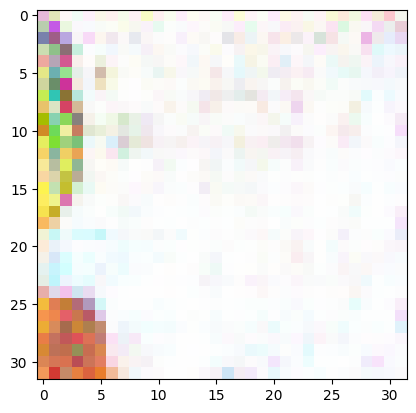

[255/500][0/936]	Loss_D: 0.0000	Loss_G: 12.1305	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[255/500][15/936]	Loss_D: 0.0007	Loss_G: 7.3470	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[255/500][30/936]	Loss_D: 0.0027	Loss_G: 6.2983	D(x): 1.0000	D(G(z)): 0.0027 / 0.0024
[255/500][45/936]	Loss_D: 0.0208	Loss_G: 5.1018	D(x): 1.0000	D(G(z)): 0.0205 / 0.0091
[255/500][60/936]	Loss_D: 0.0013	Loss_G: 6.8274	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[255/500][75/936]	Loss_D: 0.0231	Loss_G: 9.1938	D(x): 0.9776	D(G(z)): 0.0003 / 0.0003
[255/500][90/936]	Loss_D: 0.0200	Loss_G: 8.8209	D(x): 0.9809	D(G(z)): 0.0002 / 0.0002
[255/500][105/936]	Loss_D: 0.0016	Loss_G: 6.7197	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[255/500][120/936]	Loss_D: 0.0003	Loss_G: 9.2060	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[255/500][135/936]	Loss_D: 0.0017	Loss_G: 6.3672	D(x): 1.0000	D(G(z)): 0.0017 / 0.0018
[255/500][150/936]	Loss_D: 0.0006	Loss_G: 7.8475	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[255/500][165/936]	Loss_D: 0.0003	Loss_G: 9.1501	D

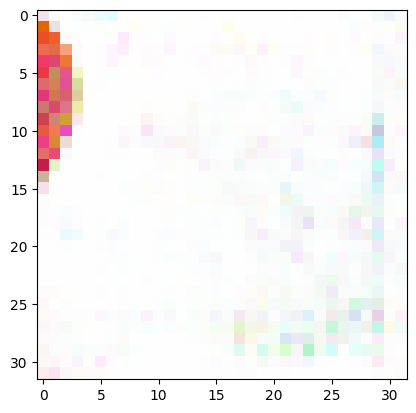

[256/500][0/936]	Loss_D: 0.0054	Loss_G: 5.8099	D(x): 0.9997	D(G(z)): 0.0051 / 0.0034
[256/500][15/936]	Loss_D: 0.0027	Loss_G: 6.4293	D(x): 1.0000	D(G(z)): 0.0027 / 0.0021
[256/500][30/936]	Loss_D: 0.0036	Loss_G: 6.3749	D(x): 1.0000	D(G(z)): 0.0035 / 0.0022
[256/500][45/936]	Loss_D: 0.0001	Loss_G: 12.4810	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[256/500][60/936]	Loss_D: 0.0020	Loss_G: 9.8260	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[256/500][75/936]	Loss_D: 0.0000	Loss_G: 12.8203	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[256/500][90/936]	Loss_D: 0.0012	Loss_G: 7.4425	D(x): 1.0000	D(G(z)): 0.0012 / 0.0012
[256/500][105/936]	Loss_D: 0.0003	Loss_G: 9.3926	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[256/500][120/936]	Loss_D: 0.0013	Loss_G: 6.8831	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[256/500][135/936]	Loss_D: 0.0004	Loss_G: 8.2092	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[256/500][150/936]	Loss_D: 0.0002	Loss_G: 10.1711	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[256/500][165/936]	Loss_D: 0.0004	Loss_G: 8.6268

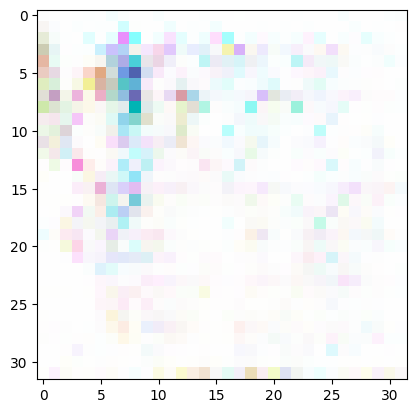

[257/500][0/936]	Loss_D: 0.0025	Loss_G: 6.9137	D(x): 1.0000	D(G(z)): 0.0025 / 0.0068
[257/500][15/936]	Loss_D: 0.0260	Loss_G: 5.0585	D(x): 1.0000	D(G(z)): 0.0253 / 0.0095
[257/500][30/936]	Loss_D: 0.0013	Loss_G: 7.5716	D(x): 1.0000	D(G(z)): 0.0013 / 0.0010
[257/500][45/936]	Loss_D: 0.0001	Loss_G: 10.3321	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[257/500][60/936]	Loss_D: 0.0173	Loss_G: 5.0575	D(x): 1.0000	D(G(z)): 0.0172 / 0.0072
[257/500][75/936]	Loss_D: 0.0014	Loss_G: 8.5428	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[257/500][90/936]	Loss_D: 0.0157	Loss_G: 5.9160	D(x): 1.0000	D(G(z)): 0.0155 / 0.0114
[257/500][105/936]	Loss_D: 0.0059	Loss_G: 6.5072	D(x): 1.0000	D(G(z)): 0.0058 / 0.0040
[257/500][120/936]	Loss_D: 0.0094	Loss_G: 6.1752	D(x): 1.0000	D(G(z)): 0.0093 / 0.0035
[257/500][135/936]	Loss_D: 0.0097	Loss_G: 5.3261	D(x): 1.0000	D(G(z)): 0.0096 / 0.0058
[257/500][150/936]	Loss_D: 0.0031	Loss_G: 6.1379	D(x): 1.0000	D(G(z)): 0.0031 / 0.0024
[257/500][165/936]	Loss_D: 0.0066	Loss_G: 5.7479	D

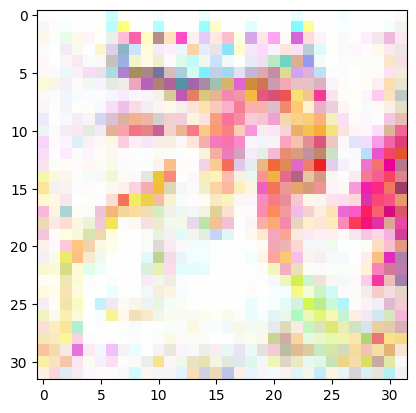

[258/500][0/936]	Loss_D: 0.0007	Loss_G: 7.4758	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[258/500][15/936]	Loss_D: 0.0019	Loss_G: 8.1381	D(x): 0.9995	D(G(z)): 0.0015 / 0.0013
[258/500][30/936]	Loss_D: 0.0030	Loss_G: 8.0504	D(x): 0.9978	D(G(z)): 0.0008 / 0.0006
[258/500][45/936]	Loss_D: 0.0047	Loss_G: 4.7898	D(x): 1.0000	D(G(z)): 0.0047 / 0.0096
[258/500][60/936]	Loss_D: 0.0000	Loss_G: 12.2023	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[258/500][75/936]	Loss_D: 0.0047	Loss_G: 7.3588	D(x): 1.0000	D(G(z)): 0.0047 / 0.0016
[258/500][90/936]	Loss_D: 0.0000	Loss_G: 10.5628	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[258/500][105/936]	Loss_D: 0.0021	Loss_G: 8.6325	D(x): 0.9983	D(G(z)): 0.0003 / 0.0003
[258/500][120/936]	Loss_D: 0.0038	Loss_G: 6.2239	D(x): 0.9989	D(G(z)): 0.0026 / 0.0022
[258/500][135/936]	Loss_D: 0.0020	Loss_G: 7.5752	D(x): 1.0000	D(G(z)): 0.0020 / 0.0016
[258/500][150/936]	Loss_D: 0.0000	Loss_G: 11.5784	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[258/500][165/936]	Loss_D: 0.0001	Loss_G: 11.455

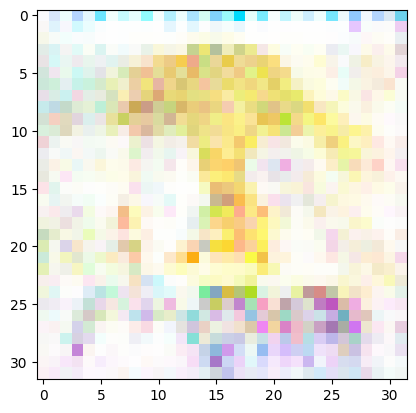

[259/500][0/936]	Loss_D: 0.0008	Loss_G: 7.2441	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[259/500][15/936]	Loss_D: 0.0004	Loss_G: 8.5479	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[259/500][30/936]	Loss_D: 0.0075	Loss_G: 11.0699	D(x): 0.9926	D(G(z)): 0.0000 / 0.0000
[259/500][45/936]	Loss_D: 0.0018	Loss_G: 6.8793	D(x): 0.9998	D(G(z)): 0.0016 / 0.0013
[259/500][60/936]	Loss_D: 0.0000	Loss_G: 15.5512	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[259/500][75/936]	Loss_D: 0.0185	Loss_G: 6.5210	D(x): 1.0000	D(G(z)): 0.0181 / 0.0071
[259/500][90/936]	Loss_D: 0.0154	Loss_G: 5.4823	D(x): 1.0000	D(G(z)): 0.0152 / 0.0060
[259/500][105/936]	Loss_D: 0.0034	Loss_G: 6.8272	D(x): 1.0000	D(G(z)): 0.0033 / 0.0022
[259/500][120/936]	Loss_D: 0.0002	Loss_G: 9.7704	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[259/500][135/936]	Loss_D: 0.0021	Loss_G: 7.7589	D(x): 1.0000	D(G(z)): 0.0021 / 0.0008
[259/500][150/936]	Loss_D: 0.0003	Loss_G: 10.4569	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[259/500][165/936]	Loss_D: 0.0003	Loss_G: 8.3478

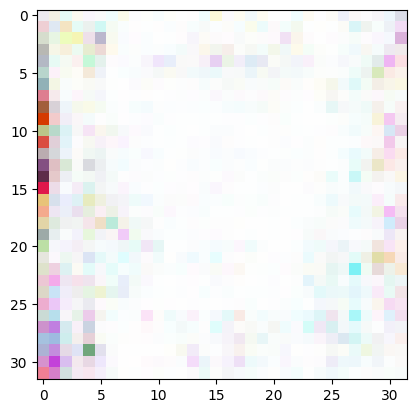

[260/500][0/936]	Loss_D: 0.0000	Loss_G: 11.0471	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[260/500][15/936]	Loss_D: 0.0011	Loss_G: 7.3530	D(x): 1.0000	D(G(z)): 0.0011 / 0.0011
[260/500][30/936]	Loss_D: 0.0002	Loss_G: 8.8400	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[260/500][45/936]	Loss_D: 0.0011	Loss_G: 7.1457	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[260/500][60/936]	Loss_D: 0.0009	Loss_G: 7.6443	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[260/500][75/936]	Loss_D: 0.0007	Loss_G: 9.6232	D(x): 1.0000	D(G(z)): 0.0007 / 0.0004
[260/500][90/936]	Loss_D: 0.0022	Loss_G: 7.3121	D(x): 1.0000	D(G(z)): 0.0022 / 0.0013
[260/500][105/936]	Loss_D: 0.0000	Loss_G: 12.1055	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[260/500][120/936]	Loss_D: 0.0005	Loss_G: 9.7850	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[260/500][135/936]	Loss_D: 0.0004	Loss_G: 12.6752	D(x): 1.0000	D(G(z)): 0.0004 / 0.0001
[260/500][150/936]	Loss_D: 0.0000	Loss_G: 22.7141	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[260/500][165/936]	Loss_D: 0.0547	Loss_G: 5.900

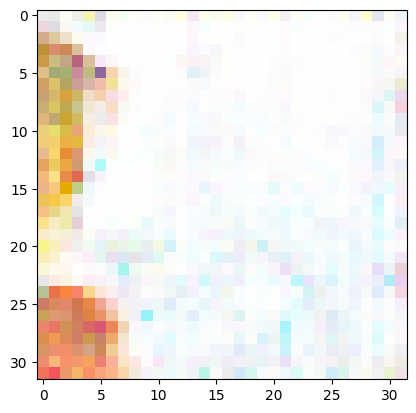

[261/500][0/936]	Loss_D: 0.0010	Loss_G: 7.1306	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[261/500][15/936]	Loss_D: 0.0073	Loss_G: 5.4941	D(x): 0.9997	D(G(z)): 0.0070 / 0.0052
[261/500][30/936]	Loss_D: 0.0086	Loss_G: 6.6638	D(x): 1.0000	D(G(z)): 0.0085 / 0.0066
[261/500][45/936]	Loss_D: 0.0040	Loss_G: 6.0017	D(x): 1.0000	D(G(z)): 0.0040 / 0.0030
[261/500][60/936]	Loss_D: 0.0076	Loss_G: 5.9329	D(x): 1.0000	D(G(z)): 0.0075 / 0.0045
[261/500][75/936]	Loss_D: 0.0001	Loss_G: 10.3476	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[261/500][90/936]	Loss_D: 0.0011	Loss_G: 11.1979	D(x): 0.9989	D(G(z)): 0.0000 / 0.0000
[261/500][105/936]	Loss_D: 0.0011	Loss_G: 6.9517	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[261/500][120/936]	Loss_D: 0.0157	Loss_G: 6.4662	D(x): 0.9995	D(G(z)): 0.0150 / 0.0077
[261/500][135/936]	Loss_D: 0.0001	Loss_G: 16.1464	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[261/500][150/936]	Loss_D: 0.0003	Loss_G: 8.4200	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[261/500][165/936]	Loss_D: 0.0042	Loss_G: 6.0456

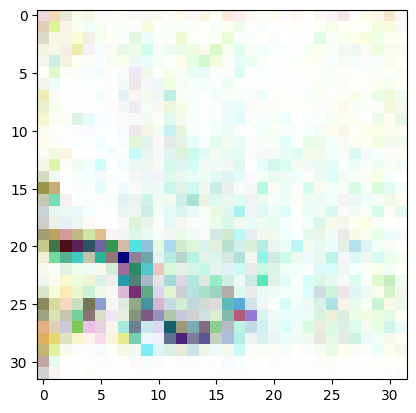

[262/500][0/936]	Loss_D: 5.1843	Loss_G: 14.9342	D(x): 1.0000	D(G(z)): 0.9590 / 0.0001
[262/500][15/936]	Loss_D: 0.0008	Loss_G: 14.1178	D(x): 1.0000	D(G(z)): 0.0008 / 0.0000
[262/500][30/936]	Loss_D: 0.0003	Loss_G: 8.7279	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[262/500][45/936]	Loss_D: 0.0363	Loss_G: 4.3953	D(x): 1.0000	D(G(z)): 0.0352 / 0.0256
[262/500][60/936]	Loss_D: 0.0051	Loss_G: 5.6269	D(x): 1.0000	D(G(z)): 0.0051 / 0.0042
[262/500][75/936]	Loss_D: 0.0043	Loss_G: 6.0103	D(x): 1.0000	D(G(z)): 0.0043 / 0.0034
[262/500][90/936]	Loss_D: 0.0019	Loss_G: 6.6039	D(x): 1.0000	D(G(z)): 0.0019 / 0.0017
[262/500][105/936]	Loss_D: 0.0014	Loss_G: 7.4041	D(x): 1.0000	D(G(z)): 0.0014 / 0.0011
[262/500][120/936]	Loss_D: 0.0010	Loss_G: 7.5129	D(x): 1.0000	D(G(z)): 0.0010 / 0.0007
[262/500][135/936]	Loss_D: 0.0006	Loss_G: 8.1753	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[262/500][150/936]	Loss_D: 0.0032	Loss_G: 6.3950	D(x): 1.0000	D(G(z)): 0.0032 / 0.0028
[262/500][165/936]	Loss_D: 0.0026	Loss_G: 7.1798	

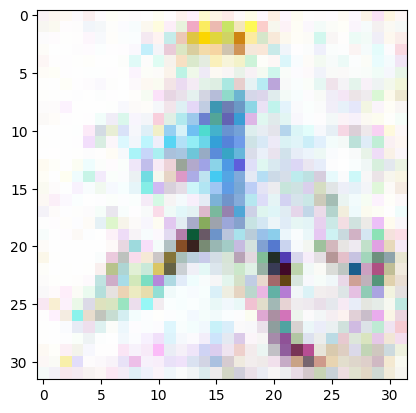

[263/500][0/936]	Loss_D: 0.0850	Loss_G: 7.6285	D(x): 0.9623	D(G(z)): 0.0419 / 0.0800
[263/500][15/936]	Loss_D: 0.0023	Loss_G: 12.7228	D(x): 1.0000	D(G(z)): 0.0023 / 0.0002
[263/500][30/936]	Loss_D: 0.0025	Loss_G: 6.3674	D(x): 0.9999	D(G(z)): 0.0024 / 0.0019
[263/500][45/936]	Loss_D: 0.0055	Loss_G: 5.8379	D(x): 1.0000	D(G(z)): 0.0055 / 0.0030
[263/500][60/936]	Loss_D: 0.0000	Loss_G: 16.5226	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[263/500][75/936]	Loss_D: 0.0331	Loss_G: 4.4196	D(x): 1.0000	D(G(z)): 0.0322 / 0.0179
[263/500][90/936]	Loss_D: 0.0008	Loss_G: 8.3943	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[263/500][105/936]	Loss_D: 0.0014	Loss_G: 8.0035	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
[263/500][120/936]	Loss_D: 0.0002	Loss_G: 9.5611	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[263/500][135/936]	Loss_D: 0.0015	Loss_G: 7.6904	D(x): 1.0000	D(G(z)): 0.0015 / 0.0010
[263/500][150/936]	Loss_D: 0.0002	Loss_G: 9.9325	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[263/500][165/936]	Loss_D: 0.0001	Loss_G: 10.7684

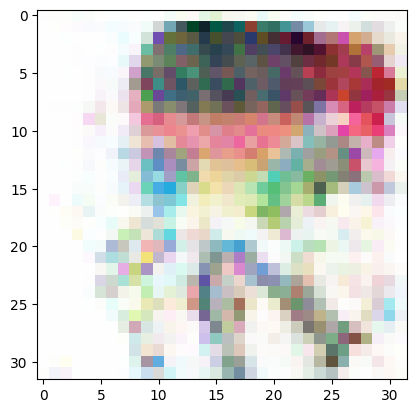

[264/500][0/936]	Loss_D: 0.0195	Loss_G: 11.5390	D(x): 0.9813	D(G(z)): 0.0001 / 0.0001
[264/500][15/936]	Loss_D: 0.0004	Loss_G: 8.6495	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[264/500][30/936]	Loss_D: 0.1240	Loss_G: 8.0535	D(x): 1.0000	D(G(z)): 0.1131 / 0.0012
[264/500][45/936]	Loss_D: 0.0001	Loss_G: 11.3958	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[264/500][60/936]	Loss_D: 0.0058	Loss_G: 5.5289	D(x): 1.0000	D(G(z)): 0.0058 / 0.0044
[264/500][75/936]	Loss_D: 0.0026	Loss_G: 6.4440	D(x): 1.0000	D(G(z)): 0.0026 / 0.0021
[264/500][90/936]	Loss_D: 0.0006	Loss_G: 16.1925	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[264/500][105/936]	Loss_D: 0.0031	Loss_G: 7.6345	D(x): 1.0000	D(G(z)): 0.0031 / 0.0022
[264/500][120/936]	Loss_D: 0.0003	Loss_G: 8.9909	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[264/500][135/936]	Loss_D: 0.0002	Loss_G: 10.1230	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[264/500][150/936]	Loss_D: 0.0000	Loss_G: 10.1068	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
[264/500][165/936]	Loss_D: 0.0038	Loss_G: 10.0

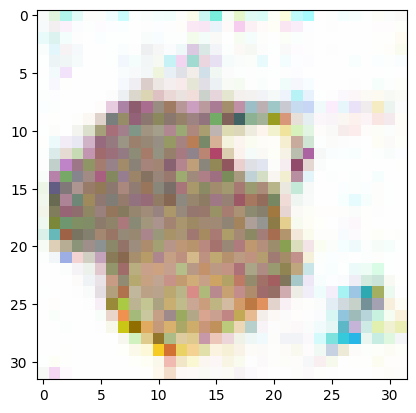

[265/500][0/936]	Loss_D: 0.0293	Loss_G: 4.5918	D(x): 0.9994	D(G(z)): 0.0282 / 0.0126
[265/500][15/936]	Loss_D: 0.0043	Loss_G: 6.8973	D(x): 1.0000	D(G(z)): 0.0042 / 0.0033
[265/500][30/936]	Loss_D: 0.0420	Loss_G: 5.4803	D(x): 0.9661	D(G(z)): 0.0066 / 0.0042
[265/500][45/936]	Loss_D: 0.0034	Loss_G: 6.1208	D(x): 1.0000	D(G(z)): 0.0033 / 0.0025
[265/500][60/936]	Loss_D: 0.0017	Loss_G: 6.7368	D(x): 1.0000	D(G(z)): 0.0017 / 0.0014
[265/500][75/936]	Loss_D: 0.0005	Loss_G: 8.0141	D(x): 0.9999	D(G(z)): 0.0004 / 0.0004
[265/500][90/936]	Loss_D: 0.0178	Loss_G: 4.5421	D(x): 1.0000	D(G(z)): 0.0177 / 0.0115
[265/500][105/936]	Loss_D: 0.0000	Loss_G: 11.6501	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[265/500][120/936]	Loss_D: 0.0752	Loss_G: 6.3431	D(x): 0.9914	D(G(z)): 0.0639 / 0.0028
[265/500][135/936]	Loss_D: 0.0025	Loss_G: 6.3015	D(x): 1.0000	D(G(z)): 0.0025 / 0.0019
[265/500][150/936]	Loss_D: 0.0036	Loss_G: 6.4228	D(x): 0.9996	D(G(z)): 0.0032 / 0.0019
[265/500][165/936]	Loss_D: 0.0132	Loss_G: 5.2437	D

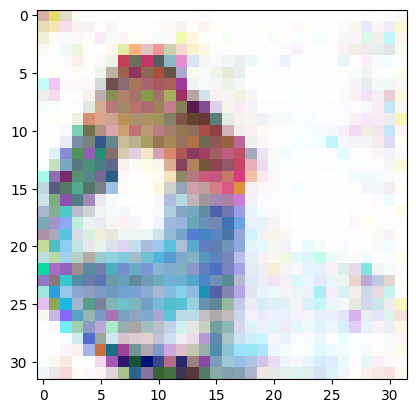

[266/500][0/936]	Loss_D: 0.0000	Loss_G: 24.1856	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[266/500][15/936]	Loss_D: 0.0193	Loss_G: 12.4409	D(x): 1.0000	D(G(z)): 0.0187 / 0.0035
[266/500][30/936]	Loss_D: 0.0031	Loss_G: 16.6695	D(x): 1.0000	D(G(z)): 0.0031 / 0.0026
[266/500][45/936]	Loss_D: 0.0015	Loss_G: 11.6716	D(x): 0.9987	D(G(z)): 0.0002 / 0.0002
[266/500][60/936]	Loss_D: 0.0455	Loss_G: 4.3369	D(x): 1.0000	D(G(z)): 0.0440 / 0.0276
[266/500][75/936]	Loss_D: 0.0002	Loss_G: 8.8659	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[266/500][90/936]	Loss_D: 0.0110	Loss_G: 7.1631	D(x): 0.9900	D(G(z)): 0.0009 / 0.0008
[266/500][105/936]	Loss_D: 0.0124	Loss_G: 5.5291	D(x): 1.0000	D(G(z)): 0.0122 / 0.0065
[266/500][120/936]	Loss_D: 0.0014	Loss_G: 7.0442	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
[266/500][135/936]	Loss_D: 0.0027	Loss_G: 6.4714	D(x): 1.0000	D(G(z)): 0.0027 / 0.0016
[266/500][150/936]	Loss_D: 0.0011	Loss_G: 7.3440	D(x): 1.0000	D(G(z)): 0.0011 / 0.0007
[266/500][165/936]	Loss_D: 0.0197	Loss_G: 7.860

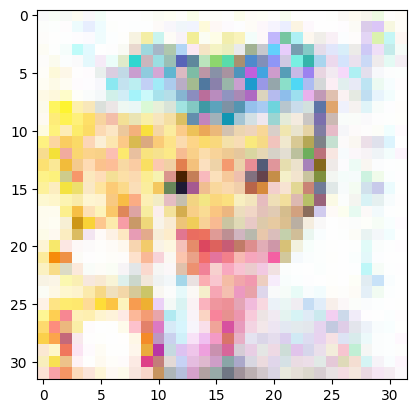

[267/500][0/936]	Loss_D: 0.0246	Loss_G: 6.5617	D(x): 0.9857	D(G(z)): 0.0098 / 0.0047
[267/500][15/936]	Loss_D: 0.0009	Loss_G: 7.9388	D(x): 0.9999	D(G(z)): 0.0008 / 0.0006
[267/500][30/936]	Loss_D: 0.0073	Loss_G: 7.5607	D(x): 0.9942	D(G(z)): 0.0014 / 0.0015
[267/500][45/936]	Loss_D: 0.0007	Loss_G: 7.5408	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[267/500][60/936]	Loss_D: 0.0004	Loss_G: 9.3091	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[267/500][75/936]	Loss_D: 0.0003	Loss_G: 8.8867	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[267/500][90/936]	Loss_D: 0.4665	Loss_G: 3.3269	D(x): 0.7729	D(G(z)): 0.0085 / 0.0635
[267/500][105/936]	Loss_D: 0.0000	Loss_G: 22.5228	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[267/500][120/936]	Loss_D: 0.0008	Loss_G: 13.0552	D(x): 0.9994	D(G(z)): 0.0003 / 0.0003
[267/500][135/936]	Loss_D: 0.0006	Loss_G: 11.2032	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
[267/500][150/936]	Loss_D: 0.0103	Loss_G: 5.2483	D(x): 0.9999	D(G(z)): 0.0102 / 0.0067
[267/500][165/936]	Loss_D: 0.0153	Loss_G: 5.0534

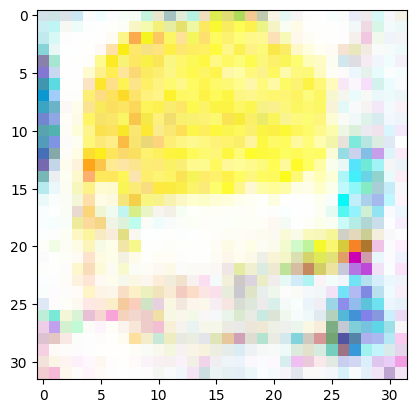

[268/500][0/936]	Loss_D: 0.0000	Loss_G: 13.2970	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[268/500][15/936]	Loss_D: 0.0037	Loss_G: 6.0636	D(x): 0.9997	D(G(z)): 0.0034 / 0.0026
[268/500][30/936]	Loss_D: 0.0313	Loss_G: 7.4526	D(x): 0.9709	D(G(z)): 0.0005 / 0.0009
[268/500][45/936]	Loss_D: 0.0181	Loss_G: 5.4709	D(x): 1.0000	D(G(z)): 0.0178 / 0.0047
[268/500][60/936]	Loss_D: 0.0022	Loss_G: 6.7741	D(x): 1.0000	D(G(z)): 0.0022 / 0.0015
[268/500][75/936]	Loss_D: 0.3542	Loss_G: 19.3455	D(x): 1.0000	D(G(z)): 0.2855 / 0.0000
[268/500][90/936]	Loss_D: 0.0002	Loss_G: 14.8779	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[268/500][105/936]	Loss_D: 0.0029	Loss_G: 21.3727	D(x): 0.9994	D(G(z)): 0.0023 / 0.0018
[268/500][120/936]	Loss_D: 0.0000	Loss_G: 29.5501	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[268/500][135/936]	Loss_D: 0.0100	Loss_G: 23.5479	D(x): 1.0000	D(G(z)): 0.0098 / 0.0047
[268/500][150/936]	Loss_D: 0.1429	Loss_G: 16.1142	D(x): 0.9745	D(G(z)): 0.0930 / 0.0001
[268/500][165/936]	Loss_D: 0.0026	Loss_G: 19

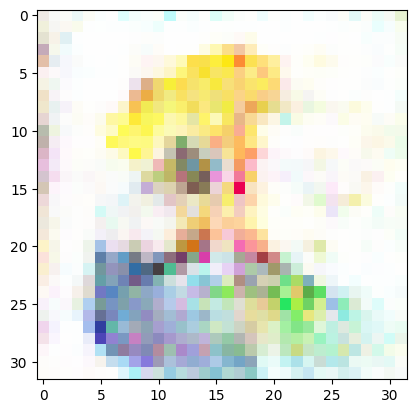

[269/500][0/936]	Loss_D: 0.0068	Loss_G: 6.2178	D(x): 1.0000	D(G(z)): 0.0068 / 0.0032
[269/500][15/936]	Loss_D: 0.0003	Loss_G: 8.8864	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[269/500][30/936]	Loss_D: 0.0000	Loss_G: 14.7005	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[269/500][45/936]	Loss_D: 0.0001	Loss_G: 11.1408	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[269/500][60/936]	Loss_D: 0.0001	Loss_G: 9.1232	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[269/500][75/936]	Loss_D: 0.0000	Loss_G: 18.2642	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[269/500][90/936]	Loss_D: 0.0001	Loss_G: 10.8250	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[269/500][105/936]	Loss_D: 0.0048	Loss_G: 6.3729	D(x): 1.0000	D(G(z)): 0.0048 / 0.0019
[269/500][120/936]	Loss_D: 0.0115	Loss_G: 5.5171	D(x): 1.0000	D(G(z)): 0.0114 / 0.0057
[269/500][135/936]	Loss_D: 0.0051	Loss_G: 6.3716	D(x): 1.0000	D(G(z)): 0.0050 / 0.0043
[269/500][150/936]	Loss_D: 0.0028	Loss_G: 7.9475	D(x): 0.9983	D(G(z)): 0.0012 / 0.0006
[269/500][165/936]	Loss_D: 1.5456	Loss_G: 18.27

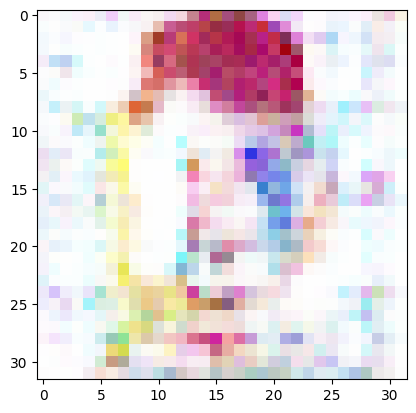

[270/500][0/936]	Loss_D: 0.0003	Loss_G: 9.0706	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[270/500][15/936]	Loss_D: 0.0000	Loss_G: 13.7780	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[270/500][30/936]	Loss_D: 0.0010	Loss_G: 7.2238	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[270/500][45/936]	Loss_D: 0.0001	Loss_G: 10.3847	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[270/500][60/936]	Loss_D: 0.0004	Loss_G: 8.3946	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[270/500][75/936]	Loss_D: 0.0013	Loss_G: 11.4217	D(x): 0.9988	D(G(z)): 0.0000 / 0.0000
[270/500][90/936]	Loss_D: 0.0007	Loss_G: 7.8458	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[270/500][105/936]	Loss_D: 1.7310	Loss_G: 20.4834	D(x): 0.7176	D(G(z)): 0.0000 / 0.0000
[270/500][120/936]	Loss_D: 0.0001	Loss_G: 9.1642	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[270/500][135/936]	Loss_D: 0.0024	Loss_G: 16.2432	D(x): 0.9998	D(G(z)): 0.0022 / 0.0020
[270/500][150/936]	Loss_D: 0.0000	Loss_G: 17.5900	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[270/500][165/936]	Loss_D: 0.0006	Loss_G: 16.

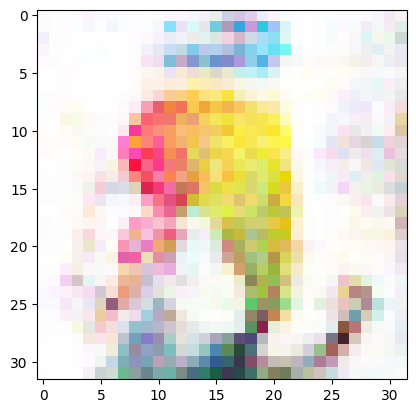

[271/500][0/936]	Loss_D: 0.0000	Loss_G: 19.1444	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[271/500][15/936]	Loss_D: 0.0004	Loss_G: 9.1875	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[271/500][30/936]	Loss_D: 0.0009	Loss_G: 8.2030	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[271/500][45/936]	Loss_D: 0.0016	Loss_G: 6.9846	D(x): 1.0000	D(G(z)): 0.0016 / 0.0010
[271/500][60/936]	Loss_D: 0.0024	Loss_G: 8.6037	D(x): 1.0000	D(G(z)): 0.0024 / 0.0005
[271/500][75/936]	Loss_D: 0.0053	Loss_G: 6.5778	D(x): 1.0000	D(G(z)): 0.0053 / 0.0044
[271/500][90/936]	Loss_D: 0.0001	Loss_G: 18.3384	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[271/500][105/936]	Loss_D: 0.0004	Loss_G: 26.4906	D(x): 0.9998	D(G(z)): 0.0002 / 0.0002
[271/500][120/936]	Loss_D: 0.0001	Loss_G: 20.8391	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[271/500][135/936]	Loss_D: 0.0004	Loss_G: 12.7145	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[271/500][150/936]	Loss_D: 0.0068	Loss_G: 5.8512	D(x): 1.0000	D(G(z)): 0.0068 / 0.0038
[271/500][165/936]	Loss_D: 0.4563	Loss_G: 11.0

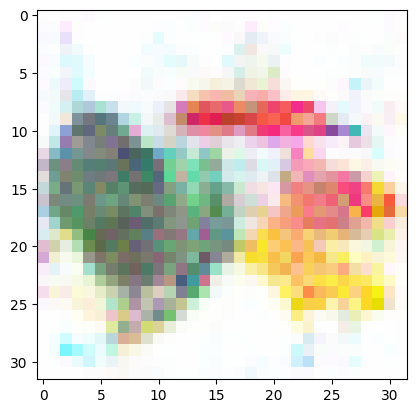

[272/500][0/936]	Loss_D: 0.0232	Loss_G: 15.0833	D(x): 0.9773	D(G(z)): 0.0000 / 0.0000
[272/500][15/936]	Loss_D: 0.0036	Loss_G: 6.9089	D(x): 0.9985	D(G(z)): 0.0021 / 0.0017
[272/500][30/936]	Loss_D: 0.0006	Loss_G: 9.0074	D(x): 1.0000	D(G(z)): 0.0006 / 0.0007
[272/500][45/936]	Loss_D: 0.0000	Loss_G: 11.0424	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[272/500][60/936]	Loss_D: 0.0025	Loss_G: 6.3094	D(x): 1.0000	D(G(z)): 0.0025 / 0.0021
[272/500][75/936]	Loss_D: 0.0000	Loss_G: 13.0455	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[272/500][90/936]	Loss_D: 0.0291	Loss_G: 5.6870	D(x): 0.9895	D(G(z)): 0.0181 / 0.0039
[272/500][105/936]	Loss_D: 0.0377	Loss_G: 7.6391	D(x): 0.9660	D(G(z)): 0.0011 / 0.0013
[272/500][120/936]	Loss_D: 0.0002	Loss_G: 14.5080	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[272/500][135/936]	Loss_D: 0.0006	Loss_G: 8.1730	D(x): 0.9998	D(G(z)): 0.0004 / 0.0004
[272/500][150/936]	Loss_D: 0.0074	Loss_G: 6.7903	D(x): 1.0000	D(G(z)): 0.0073 / 0.0040
[272/500][165/936]	Loss_D: 0.0144	Loss_G: 5.758

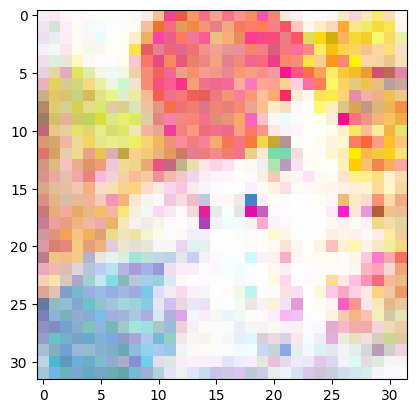

[273/500][0/936]	Loss_D: 0.0048	Loss_G: 6.2776	D(x): 0.9992	D(G(z)): 0.0040 / 0.0028
[273/500][15/936]	Loss_D: 1.3479	Loss_G: 3.9807	D(x): 0.5789	D(G(z)): 0.0002 / 0.0393
[273/500][30/936]	Loss_D: 0.0000	Loss_G: 15.0241	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[273/500][45/936]	Loss_D: 0.0003	Loss_G: 8.6653	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[273/500][60/936]	Loss_D: 0.0069	Loss_G: 6.6113	D(x): 0.9949	D(G(z)): 0.0017 / 0.0016
[273/500][75/936]	Loss_D: 0.0008	Loss_G: 8.5412	D(x): 1.0000	D(G(z)): 0.0008 / 0.0006
[273/500][90/936]	Loss_D: 0.0059	Loss_G: 5.9664	D(x): 0.9999	D(G(z)): 0.0058 / 0.0038
[273/500][105/936]	Loss_D: 0.0000	Loss_G: 26.2355	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[273/500][120/936]	Loss_D: 0.0004	Loss_G: 13.7049	D(x): 1.0000	D(G(z)): 0.0004 / 0.0005
[273/500][135/936]	Loss_D: 0.0602	Loss_G: 7.7460	D(x): 0.9475	D(G(z)): 0.0013 / 0.0026
[273/500][150/936]	Loss_D: 0.0050	Loss_G: 7.9471	D(x): 1.0000	D(G(z)): 0.0049 / 0.0028
[273/500][165/936]	Loss_D: 0.0058	Loss_G: 5.8731

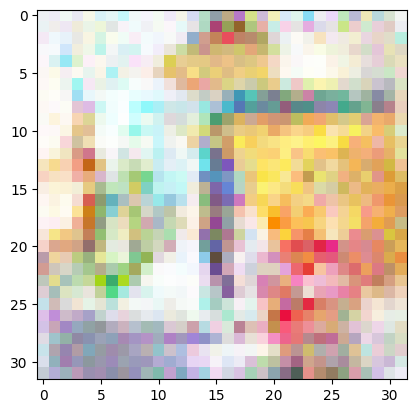

[274/500][0/936]	Loss_D: 0.0015	Loss_G: 7.9621	D(x): 1.0000	D(G(z)): 0.0015 / 0.0016
[274/500][15/936]	Loss_D: 0.0024	Loss_G: 6.7416	D(x): 1.0000	D(G(z)): 0.0024 / 0.0021
[274/500][30/936]	Loss_D: 0.0398	Loss_G: 6.9193	D(x): 0.9642	D(G(z)): 0.0012 / 0.0015
[274/500][45/936]	Loss_D: 0.0005	Loss_G: 8.9385	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[274/500][60/936]	Loss_D: 0.0000	Loss_G: 12.9721	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[274/500][75/936]	Loss_D: 0.0014	Loss_G: 12.2554	D(x): 1.0000	D(G(z)): 0.0014 / 0.0004
[274/500][90/936]	Loss_D: 0.0036	Loss_G: 9.4242	D(x): 1.0000	D(G(z)): 0.0036 / 0.0028
[274/500][105/936]	Loss_D: 0.0069	Loss_G: 5.3819	D(x): 1.0000	D(G(z)): 0.0068 / 0.0109
[274/500][120/936]	Loss_D: 0.0013	Loss_G: 6.7166	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[274/500][135/936]	Loss_D: 0.0012	Loss_G: 7.6692	D(x): 0.9998	D(G(z)): 0.0010 / 0.0006
[274/500][150/936]	Loss_D: 0.0010	Loss_G: 8.0552	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[274/500][165/936]	Loss_D: 0.0012	Loss_G: 8.0286	

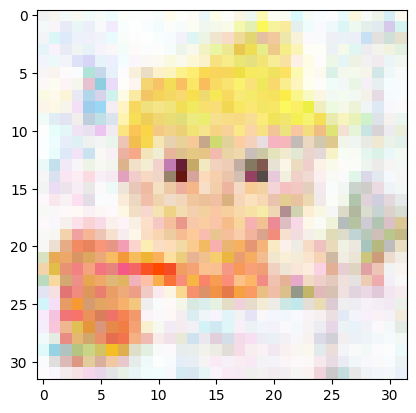

[275/500][0/936]	Loss_D: 0.0000	Loss_G: 10.4123	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[275/500][15/936]	Loss_D: 0.0003	Loss_G: 8.7916	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[275/500][30/936]	Loss_D: 0.0016	Loss_G: 7.6931	D(x): 1.0000	D(G(z)): 0.0016 / 0.0014
[275/500][45/936]	Loss_D: 0.0013	Loss_G: 7.0663	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[275/500][60/936]	Loss_D: 0.0057	Loss_G: 5.3996	D(x): 1.0000	D(G(z)): 0.0057 / 0.0046
[275/500][75/936]	Loss_D: 0.0021	Loss_G: 21.3521	D(x): 0.9979	D(G(z)): 0.0000 / 0.0000
[275/500][90/936]	Loss_D: 0.2643	Loss_G: 19.7842	D(x): 0.7967	D(G(z)): 0.0000 / 0.0000
[275/500][105/936]	Loss_D: 0.1494	Loss_G: 11.8743	D(x): 1.0000	D(G(z)): 0.1204 / 0.0109
[275/500][120/936]	Loss_D: 0.1109	Loss_G: 9.5330	D(x): 1.0000	D(G(z)): 0.1002 / 0.0113
[275/500][135/936]	Loss_D: 0.0014	Loss_G: 12.4890	D(x): 1.0000	D(G(z)): 0.0014 / 0.0011
[275/500][150/936]	Loss_D: 0.0290	Loss_G: 11.7762	D(x): 0.9727	D(G(z)): 0.0001 / 0.0001
[275/500][165/936]	Loss_D: 0.0396	Loss_G: 5.8

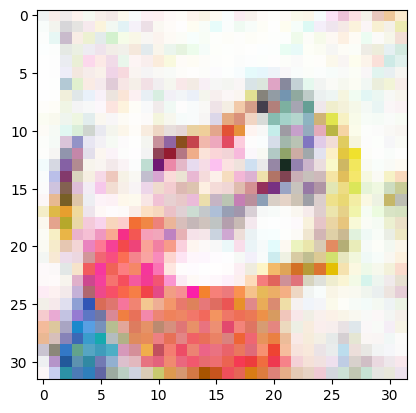

[276/500][0/936]	Loss_D: 0.0001	Loss_G: 10.0099	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[276/500][15/936]	Loss_D: 0.0027	Loss_G: 8.5377	D(x): 0.9978	D(G(z)): 0.0004 / 0.0004
[276/500][30/936]	Loss_D: 0.0019	Loss_G: 6.7941	D(x): 1.0000	D(G(z)): 0.0019 / 0.0023
[276/500][45/936]	Loss_D: 0.0002	Loss_G: 10.3984	D(x): 0.9998	D(G(z)): 0.0001 / 0.0000
[276/500][60/936]	Loss_D: 0.0005	Loss_G: 16.5311	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[276/500][75/936]	Loss_D: 0.0032	Loss_G: 12.4285	D(x): 1.0000	D(G(z)): 0.0031 / 0.0026
[276/500][90/936]	Loss_D: 0.0480	Loss_G: 13.5883	D(x): 1.0000	D(G(z)): 0.0453 / 0.0114
[276/500][105/936]	Loss_D: 0.0048	Loss_G: 15.0455	D(x): 1.0000	D(G(z)): 0.0048 / 0.0038
[276/500][120/936]	Loss_D: 0.0192	Loss_G: 16.9327	D(x): 0.9821	D(G(z)): 0.0008 / 0.0008
[276/500][135/936]	Loss_D: 0.0010	Loss_G: 18.6190	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[276/500][150/936]	Loss_D: 0.0005	Loss_G: 16.1555	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[276/500][165/936]	Loss_D: 0.0076	Loss_G: 

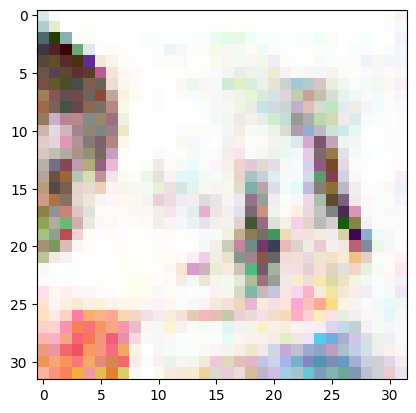

[277/500][0/936]	Loss_D: 0.0000	Loss_G: 20.0656	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[277/500][15/936]	Loss_D: 0.0014	Loss_G: 13.7949	D(x): 1.0000	D(G(z)): 0.0014 / 0.0014
[277/500][30/936]	Loss_D: 0.2997	Loss_G: 9.6181	D(x): 1.0000	D(G(z)): 0.2068 / 0.0066
[277/500][45/936]	Loss_D: 0.0000	Loss_G: 14.4009	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[277/500][60/936]	Loss_D: 0.0605	Loss_G: 4.5844	D(x): 1.0000	D(G(z)): 0.0564 / 0.0139
[277/500][75/936]	Loss_D: 0.0045	Loss_G: 6.0759	D(x): 0.9989	D(G(z)): 0.0034 / 0.0034
[277/500][90/936]	Loss_D: 0.0052	Loss_G: 8.4097	D(x): 1.0000	D(G(z)): 0.0052 / 0.0014
[277/500][105/936]	Loss_D: 0.0000	Loss_G: 14.9003	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[277/500][120/936]	Loss_D: 0.0000	Loss_G: 12.0407	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[277/500][135/936]	Loss_D: 0.0005	Loss_G: 13.3960	D(x): 0.9995	D(G(z)): 0.0000 / 0.0000
[277/500][150/936]	Loss_D: 0.0006	Loss_G: 12.5145	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[277/500][165/936]	Loss_D: 0.0794	Loss_G: 5.

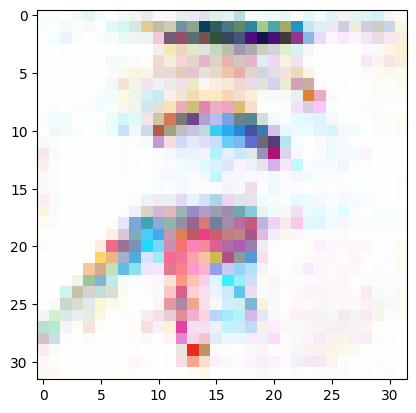

[278/500][0/936]	Loss_D: 0.0023	Loss_G: 10.0017	D(x): 0.9978	D(G(z)): 0.0001 / 0.0001
[278/500][15/936]	Loss_D: 0.0007	Loss_G: 7.8426	D(x): 1.0000	D(G(z)): 0.0007 / 0.0005
[278/500][30/936]	Loss_D: 0.0062	Loss_G: 5.2726	D(x): 1.0000	D(G(z)): 0.0062 / 0.0069
[278/500][45/936]	Loss_D: 0.0003	Loss_G: 8.2673	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[278/500][60/936]	Loss_D: 0.0229	Loss_G: 4.4421	D(x): 0.9999	D(G(z)): 0.0225 / 0.0123
[278/500][75/936]	Loss_D: 0.0014	Loss_G: 6.8154	D(x): 0.9999	D(G(z)): 0.0013 / 0.0013
[278/500][90/936]	Loss_D: 0.0013	Loss_G: 8.3267	D(x): 0.9990	D(G(z)): 0.0003 / 0.0003
[278/500][105/936]	Loss_D: 0.0009	Loss_G: 8.7989	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[278/500][120/936]	Loss_D: 0.0000	Loss_G: 11.9913	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[278/500][135/936]	Loss_D: 0.0008	Loss_G: 7.1023	D(x): 0.9999	D(G(z)): 0.0006 / 0.0013
[278/500][150/936]	Loss_D: 0.0002	Loss_G: 12.5826	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[278/500][165/936]	Loss_D: 0.0030	Loss_G: 6.4945

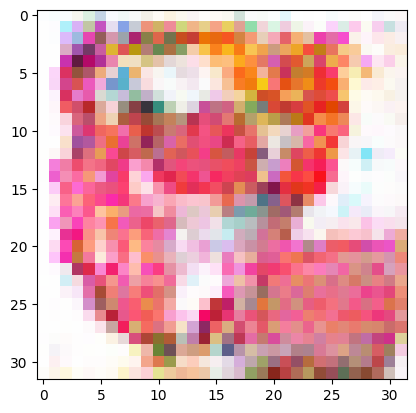

[279/500][0/936]	Loss_D: 0.0011	Loss_G: 7.6085	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[279/500][15/936]	Loss_D: 0.0100	Loss_G: 5.2045	D(x): 0.9998	D(G(z)): 0.0097 / 0.0062
[279/500][30/936]	Loss_D: 0.0065	Loss_G: 7.4435	D(x): 1.0000	D(G(z)): 0.0064 / 0.0055
[279/500][45/936]	Loss_D: 0.0061	Loss_G: 6.1796	D(x): 0.9998	D(G(z)): 0.0058 / 0.0023
[279/500][60/936]	Loss_D: 0.0003	Loss_G: 18.4898	D(x): 0.9999	D(G(z)): 0.0002 / 0.0000
[279/500][75/936]	Loss_D: 0.0008	Loss_G: 19.6332	D(x): 0.9993	D(G(z)): 0.0001 / 0.0001
[279/500][90/936]	Loss_D: 0.0002	Loss_G: 20.6037	D(x): 0.9999	D(G(z)): 0.0001 / 0.0002
[279/500][105/936]	Loss_D: 0.0054	Loss_G: 8.8378	D(x): 1.0000	D(G(z)): 0.0054 / 0.0048
[279/500][120/936]	Loss_D: 0.0100	Loss_G: 5.2267	D(x): 1.0000	D(G(z)): 0.0099 / 0.0067
[279/500][135/936]	Loss_D: 0.0039	Loss_G: 5.9400	D(x): 1.0000	D(G(z)): 0.0039 / 0.0031
[279/500][150/936]	Loss_D: 0.0223	Loss_G: 7.6139	D(x): 0.9928	D(G(z)): 0.0147 / 0.0046
[279/500][165/936]	Loss_D: 0.0230	Loss_G: 5.1230

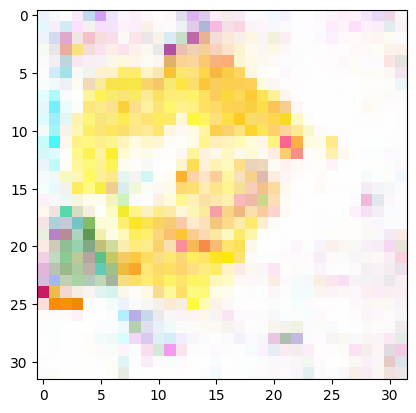

[280/500][0/936]	Loss_D: 0.0235	Loss_G: 5.0943	D(x): 1.0000	D(G(z)): 0.0231 / 0.0641
[280/500][15/936]	Loss_D: 0.0007	Loss_G: 8.3263	D(x): 1.0000	D(G(z)): 0.0007 / 0.0005
[280/500][30/936]	Loss_D: 0.0167	Loss_G: 5.6780	D(x): 0.9882	D(G(z)): 0.0046 / 0.0044
[280/500][45/936]	Loss_D: 0.0038	Loss_G: 6.8906	D(x): 1.0000	D(G(z)): 0.0038 / 0.0016
[280/500][60/936]	Loss_D: 0.0042	Loss_G: 7.2242	D(x): 0.9976	D(G(z)): 0.0018 / 0.0016
[280/500][75/936]	Loss_D: 0.0021	Loss_G: 6.8437	D(x): 0.9997	D(G(z)): 0.0018 / 0.0017
[280/500][90/936]	Loss_D: 0.0030	Loss_G: 6.0998	D(x): 1.0000	D(G(z)): 0.0030 / 0.0026
[280/500][105/936]	Loss_D: 0.4554	Loss_G: 2.9881	D(x): 0.7859	D(G(z)): 0.0074 / 0.0577
[280/500][120/936]	Loss_D: 0.0070	Loss_G: 5.3785	D(x): 1.0000	D(G(z)): 0.0070 / 0.0053
[280/500][135/936]	Loss_D: 0.0015	Loss_G: 8.6569	D(x): 0.9987	D(G(z)): 0.0002 / 0.0002
[280/500][150/936]	Loss_D: 0.0001	Loss_G: 11.8184	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[280/500][165/936]	Loss_D: 0.0025	Loss_G: 7.4069	D

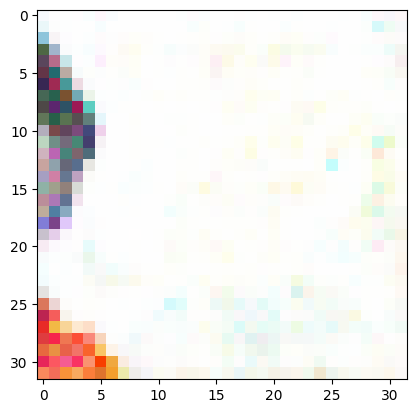

[281/500][0/936]	Loss_D: 0.0001	Loss_G: 9.6024	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[281/500][15/936]	Loss_D: 0.0024	Loss_G: 6.1466	D(x): 1.0000	D(G(z)): 0.0024 / 0.0022
[281/500][30/936]	Loss_D: 0.0018	Loss_G: 6.8336	D(x): 1.0000	D(G(z)): 0.0018 / 0.0016
[281/500][45/936]	Loss_D: 0.0001	Loss_G: 10.2400	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[281/500][60/936]	Loss_D: 0.0001	Loss_G: 19.7445	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[281/500][75/936]	Loss_D: 0.0002	Loss_G: 12.6360	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[281/500][90/936]	Loss_D: 0.0000	Loss_G: 16.0347	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[281/500][105/936]	Loss_D: 0.0001	Loss_G: 13.4645	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[281/500][120/936]	Loss_D: 0.0056	Loss_G: 5.3967	D(x): 1.0000	D(G(z)): 0.0055 / 0.0046
[281/500][135/936]	Loss_D: 0.0008	Loss_G: 7.1866	D(x): 0.9999	D(G(z)): 0.0007 / 0.0008
[281/500][150/936]	Loss_D: 0.0203	Loss_G: 4.7711	D(x): 1.0000	D(G(z)): 0.0200 / 0.0090
[281/500][165/936]	Loss_D: 0.0108	Loss_G: 5.07

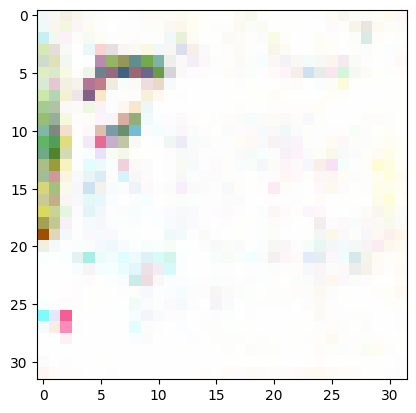

[282/500][0/936]	Loss_D: 0.0000	Loss_G: 15.0818	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[282/500][15/936]	Loss_D: 0.0000	Loss_G: 12.0601	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[282/500][30/936]	Loss_D: 0.0037	Loss_G: 5.8128	D(x): 1.0000	D(G(z)): 0.0036 / 0.0032
[282/500][45/936]	Loss_D: 0.0002	Loss_G: 10.1220	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[282/500][60/936]	Loss_D: 0.0064	Loss_G: 5.5305	D(x): 1.0000	D(G(z)): 0.0063 / 0.0047
[282/500][75/936]	Loss_D: 0.0000	Loss_G: 11.9010	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[282/500][90/936]	Loss_D: 0.0009	Loss_G: 7.5990	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[282/500][105/936]	Loss_D: 0.0006	Loss_G: 7.9256	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[282/500][120/936]	Loss_D: 0.0003	Loss_G: 8.4410	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[282/500][135/936]	Loss_D: 0.0006	Loss_G: 7.6759	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[282/500][150/936]	Loss_D: 0.0130	Loss_G: 8.1020	D(x): 1.0000	D(G(z)): 0.0128 / 0.0018
[282/500][165/936]	Loss_D: 0.0000	Loss_G: 21.42

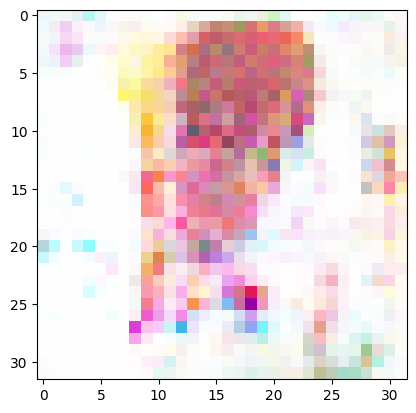

[283/500][0/936]	Loss_D: 0.2693	Loss_G: 8.3989	D(x): 1.0000	D(G(z)): 0.2285 / 0.0007
[283/500][15/936]	Loss_D: 0.0037	Loss_G: 6.3337	D(x): 1.0000	D(G(z)): 0.0037 / 0.0018
[283/500][30/936]	Loss_D: 0.0001	Loss_G: 9.5853	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[283/500][45/936]	Loss_D: 0.0009	Loss_G: 8.2555	D(x): 1.0000	D(G(z)): 0.0009 / 0.0003
[283/500][60/936]	Loss_D: 0.0051	Loss_G: 6.3800	D(x): 1.0000	D(G(z)): 0.0051 / 0.0017
[283/500][75/936]	Loss_D: 0.0181	Loss_G: 5.0705	D(x): 1.0000	D(G(z)): 0.0178 / 0.0084
[283/500][90/936]	Loss_D: 0.0016	Loss_G: 7.1497	D(x): 1.0000	D(G(z)): 0.0016 / 0.0013
[283/500][105/936]	Loss_D: 0.0012	Loss_G: 8.0377	D(x): 1.0000	D(G(z)): 0.0011 / 0.0006
[283/500][120/936]	Loss_D: 0.0002	Loss_G: 9.6132	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[283/500][135/936]	Loss_D: 0.0070	Loss_G: 5.8182	D(x): 1.0000	D(G(z)): 0.0070 / 0.0056
[283/500][150/936]	Loss_D: 0.0036	Loss_G: 5.8735	D(x): 1.0000	D(G(z)): 0.0035 / 0.0030
[283/500][165/936]	Loss_D: 0.0039	Loss_G: 6.1149	D(

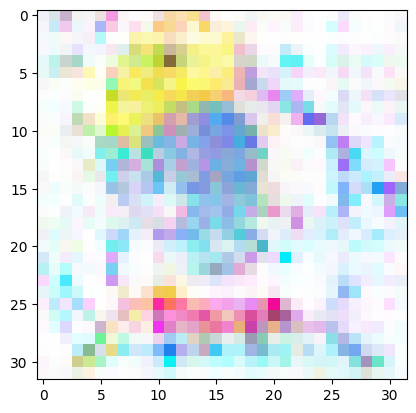

[284/500][0/936]	Loss_D: 0.0085	Loss_G: 4.9492	D(x): 1.0000	D(G(z)): 0.0084 / 0.0076
[284/500][15/936]	Loss_D: 0.0034	Loss_G: 6.0150	D(x): 1.0000	D(G(z)): 0.0033 / 0.0028
[284/500][30/936]	Loss_D: 0.1212	Loss_G: 9.1968	D(x): 0.9040	D(G(z)): 0.0001 / 0.0003
[284/500][45/936]	Loss_D: 0.0020	Loss_G: 8.8917	D(x): 0.9983	D(G(z)): 0.0003 / 0.0002
[284/500][60/936]	Loss_D: 0.0020	Loss_G: 7.1731	D(x): 1.0000	D(G(z)): 0.0020 / 0.0009
[284/500][75/936]	Loss_D: 0.0095	Loss_G: 5.4361	D(x): 1.0000	D(G(z)): 0.0095 / 0.0048
[284/500][90/936]	Loss_D: 0.0002	Loss_G: 9.2133	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[284/500][105/936]	Loss_D: 0.0026	Loss_G: 6.8843	D(x): 0.9998	D(G(z)): 0.0024 / 0.0017
[284/500][120/936]	Loss_D: 0.0151	Loss_G: 5.4631	D(x): 1.0000	D(G(z)): 0.0149 / 0.0051
[284/500][135/936]	Loss_D: 0.0001	Loss_G: 9.7426	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[284/500][150/936]	Loss_D: 0.0014	Loss_G: 7.2080	D(x): 1.0000	D(G(z)): 0.0014 / 0.0008
[284/500][165/936]	Loss_D: 0.0001	Loss_G: 10.3218	D

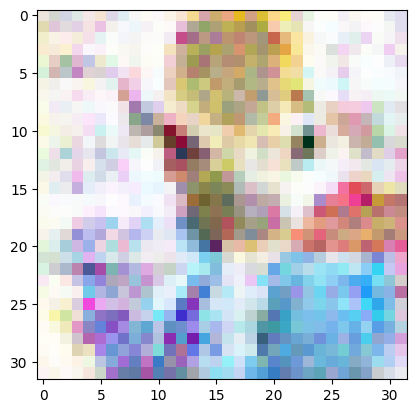

[285/500][0/936]	Loss_D: 0.0016	Loss_G: 10.5288	D(x): 0.9999	D(G(z)): 0.0015 / 0.0011
[285/500][15/936]	Loss_D: 0.0000	Loss_G: 13.5132	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[285/500][30/936]	Loss_D: 0.0180	Loss_G: 9.5729	D(x): 0.9825	D(G(z)): 0.0001 / 0.0001
[285/500][45/936]	Loss_D: 0.0117	Loss_G: 5.4068	D(x): 0.9999	D(G(z)): 0.0115 / 0.0081
[285/500][60/936]	Loss_D: 0.0000	Loss_G: 15.7372	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[285/500][75/936]	Loss_D: 0.0000	Loss_G: 11.7132	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[285/500][90/936]	Loss_D: 0.0167	Loss_G: 5.4545	D(x): 0.9992	D(G(z)): 0.0157 / 0.0047
[285/500][105/936]	Loss_D: 0.0145	Loss_G: 4.9329	D(x): 1.0000	D(G(z)): 0.0144 / 0.0079
[285/500][120/936]	Loss_D: 0.0001	Loss_G: 9.4670	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[285/500][135/936]	Loss_D: 0.0047	Loss_G: 9.0605	D(x): 0.9990	D(G(z)): 0.0037 / 0.0028
[285/500][150/936]	Loss_D: 0.0001	Loss_G: 10.8347	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[285/500][165/936]	Loss_D: 0.0284	Loss_G: 5.08

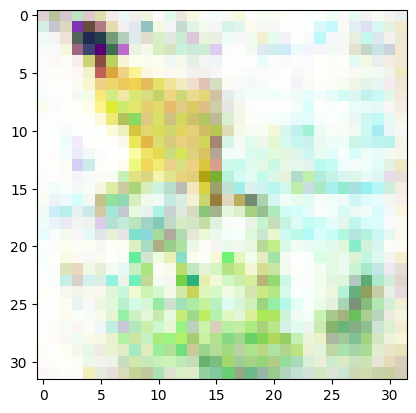

[286/500][0/936]	Loss_D: 0.0080	Loss_G: 5.2830	D(x): 1.0000	D(G(z)): 0.0080 / 0.0061
[286/500][15/936]	Loss_D: 0.0008	Loss_G: 7.4275	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[286/500][30/936]	Loss_D: 0.0018	Loss_G: 11.9068	D(x): 0.9982	D(G(z)): 0.0000 / 0.0000
[286/500][45/936]	Loss_D: 0.1485	Loss_G: 4.5639	D(x): 0.8957	D(G(z)): 0.0145 / 0.0105
[286/500][60/936]	Loss_D: 0.0003	Loss_G: 13.6931	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[286/500][75/936]	Loss_D: 0.0008	Loss_G: 8.7384	D(x): 0.9999	D(G(z)): 0.0007 / 0.0007
[286/500][90/936]	Loss_D: 0.0052	Loss_G: 5.5383	D(x): 1.0000	D(G(z)): 0.0052 / 0.0043
[286/500][105/936]	Loss_D: 0.0007	Loss_G: 7.5710	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[286/500][120/936]	Loss_D: 0.0018	Loss_G: 6.6204	D(x): 1.0000	D(G(z)): 0.0018 / 0.0014
[286/500][135/936]	Loss_D: 0.0080	Loss_G: 6.5337	D(x): 0.9987	D(G(z)): 0.0066 / 0.0042
[286/500][150/936]	Loss_D: 0.0018	Loss_G: 6.9589	D(x): 1.0000	D(G(z)): 0.0018 / 0.0014
[286/500][165/936]	Loss_D: 0.0027	Loss_G: 7.2948	

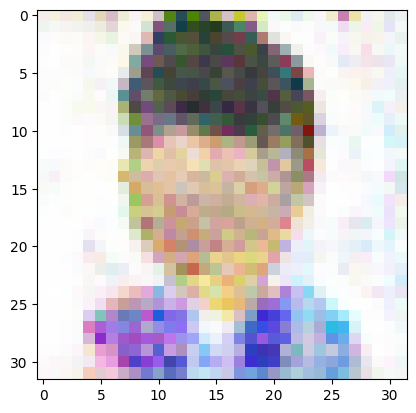

[287/500][0/936]	Loss_D: 1.3716	Loss_G: 18.6285	D(x): 1.0000	D(G(z)): 0.6225 / 0.0003
[287/500][15/936]	Loss_D: 0.3386	Loss_G: 10.5099	D(x): 0.9998	D(G(z)): 0.2601 / 0.0000
[287/500][30/936]	Loss_D: 0.0017	Loss_G: 6.5429	D(x): 1.0000	D(G(z)): 0.0017 / 0.0016
[287/500][45/936]	Loss_D: 0.0074	Loss_G: 7.4317	D(x): 0.9969	D(G(z)): 0.0042 / 0.0031
[287/500][60/936]	Loss_D: 0.0144	Loss_G: 5.7947	D(x): 0.9983	D(G(z)): 0.0126 / 0.0090
[287/500][75/936]	Loss_D: 0.0003	Loss_G: 10.5886	D(x): 0.9998	D(G(z)): 0.0001 / 0.0005
[287/500][90/936]	Loss_D: 0.0871	Loss_G: 12.1657	D(x): 0.9239	D(G(z)): 0.0001 / 0.0001
[287/500][105/936]	Loss_D: 0.0003	Loss_G: 10.2201	D(x): 1.0000	D(G(z)): 0.0003 / 0.0001
[287/500][120/936]	Loss_D: 0.0081	Loss_G: 5.6383	D(x): 1.0000	D(G(z)): 0.0081 / 0.0069
[287/500][135/936]	Loss_D: 0.0209	Loss_G: 5.2908	D(x): 0.9920	D(G(z)): 0.0127 / 0.0059
[287/500][150/936]	Loss_D: 0.0046	Loss_G: 9.2961	D(x): 0.9956	D(G(z)): 0.0002 / 0.0002
[287/500][165/936]	Loss_D: 0.0006	Loss_G: 7.80

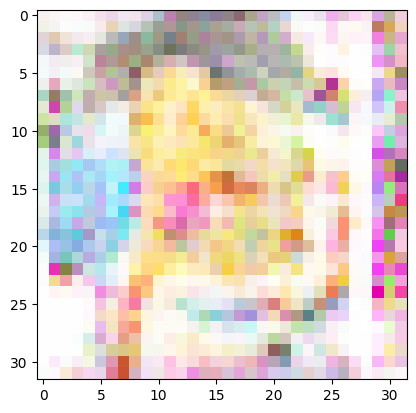

[288/500][0/936]	Loss_D: 0.0016	Loss_G: 8.0389	D(x): 0.9995	D(G(z)): 0.0011 / 0.0009
[288/500][15/936]	Loss_D: 0.0018	Loss_G: 7.3257	D(x): 1.0000	D(G(z)): 0.0018 / 0.0014
[288/500][30/936]	Loss_D: 0.0025	Loss_G: 6.5058	D(x): 1.0000	D(G(z)): 0.0025 / 0.0016
[288/500][45/936]	Loss_D: 0.0010	Loss_G: 7.9512	D(x): 1.0000	D(G(z)): 0.0010 / 0.0007
[288/500][60/936]	Loss_D: 0.0002	Loss_G: 13.7133	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[288/500][75/936]	Loss_D: 0.8141	Loss_G: 21.5044	D(x): 0.9999	D(G(z)): 0.5141 / 0.0000
[288/500][90/936]	Loss_D: 0.0026	Loss_G: 34.6668	D(x): 0.9974	D(G(z)): 0.0000 / 0.0000
[288/500][105/936]	Loss_D: 0.0000	Loss_G: 32.1252	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[288/500][120/936]	Loss_D: 0.0005	Loss_G: 25.7876	D(x): 0.9995	D(G(z)): 0.0000 / 0.0000
[288/500][135/936]	Loss_D: 0.0014	Loss_G: 18.0563	D(x): 1.0000	D(G(z)): 0.0013 / 0.0009
[288/500][150/936]	Loss_D: 0.0030	Loss_G: 24.1696	D(x): 1.0000	D(G(z)): 0.0029 / 0.0024
[288/500][165/936]	Loss_D: 0.0001	Loss_G: 17

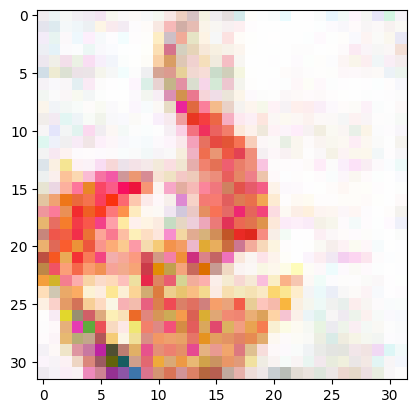

[289/500][0/936]	Loss_D: 0.0002	Loss_G: 10.5304	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[289/500][15/936]	Loss_D: 0.0014	Loss_G: 7.3471	D(x): 0.9999	D(G(z)): 0.0014 / 0.0013
[289/500][30/936]	Loss_D: 0.0015	Loss_G: 6.9292	D(x): 1.0000	D(G(z)): 0.0015 / 0.0011
[289/500][45/936]	Loss_D: 0.0001	Loss_G: 29.2277	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[289/500][60/936]	Loss_D: 0.0001	Loss_G: 12.9033	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[289/500][75/936]	Loss_D: 0.4639	Loss_G: 19.6399	D(x): 0.7509	D(G(z)): 0.0000 / 0.0000
[289/500][90/936]	Loss_D: 0.0000	Loss_G: 32.6510	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[289/500][105/936]	Loss_D: 0.0048	Loss_G: 21.1987	D(x): 0.9990	D(G(z)): 0.0038 / 0.0029
[289/500][120/936]	Loss_D: 0.0051	Loss_G: 18.0162	D(x): 1.0000	D(G(z)): 0.0051 / 0.0041
[289/500][135/936]	Loss_D: 0.1766	Loss_G: 19.4864	D(x): 0.8722	D(G(z)): 0.0076 / 0.0217
[289/500][150/936]	Loss_D: 0.0002	Loss_G: 21.4951	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[289/500][165/936]	Loss_D: 0.0153	Loss_G: 

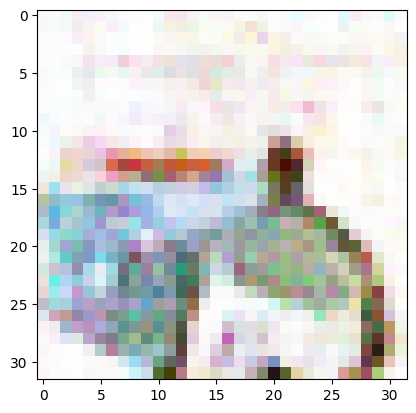

[290/500][0/936]	Loss_D: 0.0000	Loss_G: 10.8107	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[290/500][15/936]	Loss_D: 0.0007	Loss_G: 7.6818	D(x): 0.9999	D(G(z)): 0.0007 / 0.0006
[290/500][30/936]	Loss_D: 0.0574	Loss_G: 4.6461	D(x): 1.0000	D(G(z)): 0.0549 / 0.0150
[290/500][45/936]	Loss_D: 0.0040	Loss_G: 6.5989	D(x): 1.0000	D(G(z)): 0.0039 / 0.0036
[290/500][60/936]	Loss_D: 0.0003	Loss_G: 8.1073	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[290/500][75/936]	Loss_D: 0.0000	Loss_G: 13.5152	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[290/500][90/936]	Loss_D: 0.3084	Loss_G: 10.8815	D(x): 0.7966	D(G(z)): 0.0001 / 0.0003
[290/500][105/936]	Loss_D: 0.0003	Loss_G: 11.6497	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[290/500][120/936]	Loss_D: 0.0008	Loss_G: 8.0994	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[290/500][135/936]	Loss_D: 0.0021	Loss_G: 6.5904	D(x): 1.0000	D(G(z)): 0.0021 / 0.0017
[290/500][150/936]	Loss_D: 0.0021	Loss_G: 6.9622	D(x): 1.0000	D(G(z)): 0.0021 / 0.0015
[290/500][165/936]	Loss_D: 0.2060	Loss_G: 4.850

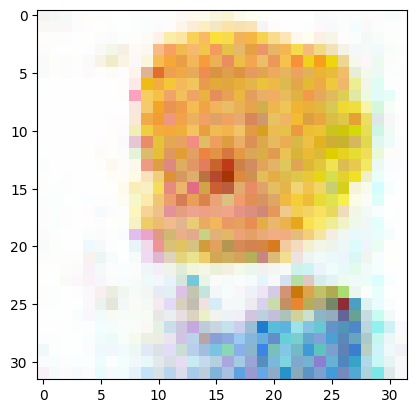

[291/500][0/936]	Loss_D: 0.0000	Loss_G: 10.9349	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[291/500][15/936]	Loss_D: 0.0022	Loss_G: 7.2470	D(x): 1.0000	D(G(z)): 0.0022 / 0.0022
[291/500][30/936]	Loss_D: 0.0024	Loss_G: 6.2259	D(x): 1.0000	D(G(z)): 0.0024 / 0.0020
[291/500][45/936]	Loss_D: 0.0008	Loss_G: 6.5904	D(x): 1.0000	D(G(z)): 0.0008 / 0.0014
[291/500][60/936]	Loss_D: 0.0362	Loss_G: 5.8285	D(x): 0.9671	D(G(z)): 0.0022 / 0.0034
[291/500][75/936]	Loss_D: 0.0002	Loss_G: 10.8959	D(x): 1.0000	D(G(z)): 0.0002 / 0.0000
[291/500][90/936]	Loss_D: 0.0091	Loss_G: 6.3577	D(x): 1.0000	D(G(z)): 0.0090 / 0.0024
[291/500][105/936]	Loss_D: 0.0221	Loss_G: 4.8391	D(x): 1.0000	D(G(z)): 0.0218 / 0.0089
[291/500][120/936]	Loss_D: 0.0000	Loss_G: 11.2349	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[291/500][135/936]	Loss_D: 0.0455	Loss_G: 5.3858	D(x): 1.0000	D(G(z)): 0.0440 / 0.0052
[291/500][150/936]	Loss_D: 0.0287	Loss_G: 29.3736	D(x): 0.9729	D(G(z)): 0.0000 / 0.0000
[291/500][165/936]	Loss_D: 0.0000	Loss_G: 25.46

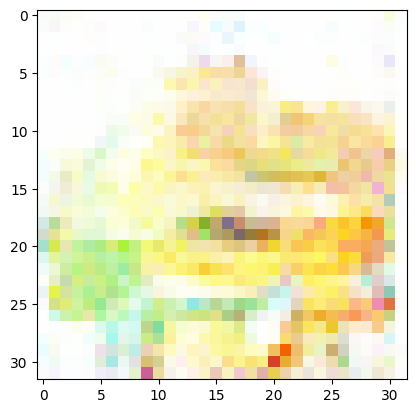

[292/500][0/936]	Loss_D: 0.0231	Loss_G: 5.1830	D(x): 0.9997	D(G(z)): 0.0223 / 0.0103
[292/500][15/936]	Loss_D: 0.0092	Loss_G: 4.2626	D(x): 1.0000	D(G(z)): 0.0091 / 0.0171
[292/500][30/936]	Loss_D: 0.0010	Loss_G: 8.3660	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[292/500][45/936]	Loss_D: 0.0078	Loss_G: 6.2742	D(x): 1.0000	D(G(z)): 0.0077 / 0.0051
[292/500][60/936]	Loss_D: 0.0004	Loss_G: 8.2462	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[292/500][75/936]	Loss_D: 0.0000	Loss_G: 10.9126	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[292/500][90/936]	Loss_D: 0.0004	Loss_G: 8.9516	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[292/500][105/936]	Loss_D: 0.0013	Loss_G: 8.1724	D(x): 0.9997	D(G(z)): 0.0011 / 0.0007
[292/500][120/936]	Loss_D: 0.0006	Loss_G: 7.6425	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[292/500][135/936]	Loss_D: 0.0047	Loss_G: 5.6931	D(x): 1.0000	D(G(z)): 0.0047 / 0.0036
[292/500][150/936]	Loss_D: 0.0020	Loss_G: 7.0820	D(x): 1.0000	D(G(z)): 0.0020 / 0.0014
[292/500][165/936]	Loss_D: 0.0010	Loss_G: 8.1166	D

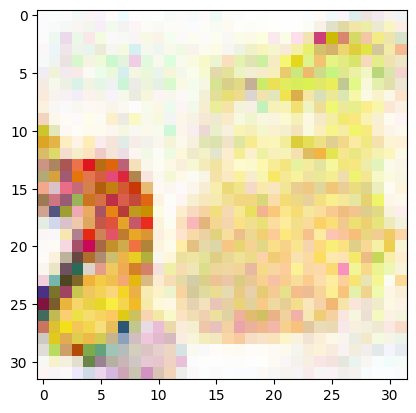

[293/500][0/936]	Loss_D: 0.9342	Loss_G: 17.3992	D(x): 1.0000	D(G(z)): 0.5674 / 0.0000
[293/500][15/936]	Loss_D: 0.8470	Loss_G: 14.4089	D(x): 0.5695	D(G(z)): 0.0010 / 0.0913
[293/500][30/936]	Loss_D: 0.0002	Loss_G: 13.9789	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[293/500][45/936]	Loss_D: 0.0000	Loss_G: 14.4318	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[293/500][60/936]	Loss_D: 0.0006	Loss_G: 8.6497	D(x): 0.9996	D(G(z)): 0.0002 / 0.0002
[293/500][75/936]	Loss_D: 0.0010	Loss_G: 7.2968	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[293/500][90/936]	Loss_D: 0.0019	Loss_G: 6.3979	D(x): 1.0000	D(G(z)): 0.0019 / 0.0017
[293/500][105/936]	Loss_D: 0.0005	Loss_G: 9.9973	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[293/500][120/936]	Loss_D: 0.0000	Loss_G: 22.4290	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[293/500][135/936]	Loss_D: 0.0002	Loss_G: 16.9160	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[293/500][150/936]	Loss_D: 0.0004	Loss_G: 9.1177	D(x): 1.0000	D(G(z)): 0.0004 / 0.0006
[293/500][165/936]	Loss_D: 0.0002	Loss_G: 12.

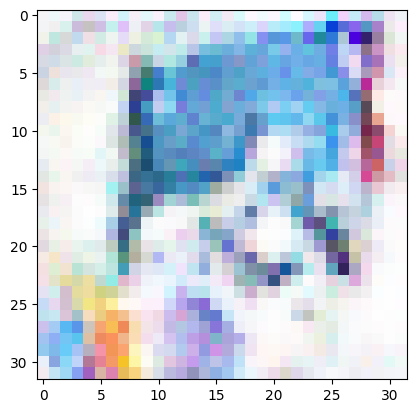

[294/500][0/936]	Loss_D: 0.0001	Loss_G: 9.6420	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[294/500][15/936]	Loss_D: 0.0095	Loss_G: 5.8208	D(x): 1.0000	D(G(z)): 0.0094 / 0.0072
[294/500][30/936]	Loss_D: 0.0001	Loss_G: 9.2794	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[294/500][45/936]	Loss_D: 0.0124	Loss_G: 5.3840	D(x): 0.9985	D(G(z)): 0.0108 / 0.0068
[294/500][60/936]	Loss_D: 0.0019	Loss_G: 6.4586	D(x): 1.0000	D(G(z)): 0.0019 / 0.0018
[294/500][75/936]	Loss_D: 0.0067	Loss_G: 11.8997	D(x): 1.0000	D(G(z)): 0.0066 / 0.0044
[294/500][90/936]	Loss_D: 0.0011	Loss_G: 8.5286	D(x): 1.0000	D(G(z)): 0.0011 / 0.0008
[294/500][105/936]	Loss_D: 0.0001	Loss_G: 9.3747	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[294/500][120/936]	Loss_D: 0.0054	Loss_G: 5.5847	D(x): 1.0000	D(G(z)): 0.0053 / 0.0044
[294/500][135/936]	Loss_D: 0.0099	Loss_G: 8.9720	D(x): 1.0000	D(G(z)): 0.0098 / 0.0007
[294/500][150/936]	Loss_D: 0.0001	Loss_G: 10.2675	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[294/500][165/936]	Loss_D: 0.0005	Loss_G: 8.5350	

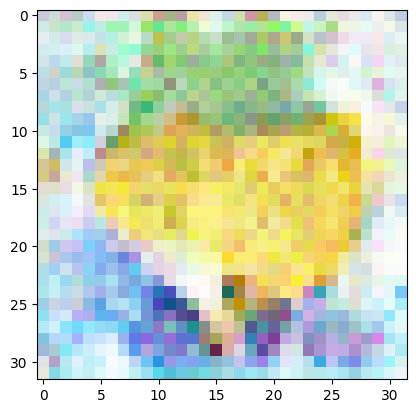

[295/500][0/936]	Loss_D: 0.0016	Loss_G: 7.1098	D(x): 0.9992	D(G(z)): 0.0008 / 0.0008
[295/500][15/936]	Loss_D: 1.1547	Loss_G: 11.8189	D(x): 0.9999	D(G(z)): 0.5693 / 0.0001
[295/500][30/936]	Loss_D: 0.0016	Loss_G: 9.1301	D(x): 0.9999	D(G(z)): 0.0015 / 0.0014
[295/500][45/936]	Loss_D: 0.0011	Loss_G: 8.0811	D(x): 1.0000	D(G(z)): 0.0011 / 0.0008
[295/500][60/936]	Loss_D: 0.0007	Loss_G: 7.9371	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[295/500][75/936]	Loss_D: 0.0023	Loss_G: 6.7457	D(x): 1.0000	D(G(z)): 0.0023 / 0.0012
[295/500][90/936]	Loss_D: 0.0252	Loss_G: 4.5028	D(x): 1.0000	D(G(z)): 0.0249 / 0.0113
[295/500][105/936]	Loss_D: 0.0042	Loss_G: 5.9504	D(x): 1.0000	D(G(z)): 0.0042 / 0.0028
[295/500][120/936]	Loss_D: 1.2663	Loss_G: 2.1479	D(x): 0.3979	D(G(z)): 0.0025 / 0.3791
[295/500][135/936]	Loss_D: 0.2185	Loss_G: 10.0520	D(x): 1.0000	D(G(z)): 0.1792 / 0.0015
[295/500][150/936]	Loss_D: 0.0003	Loss_G: 16.7967	D(x): 0.9997	D(G(z)): 0.0000 / 0.0000
[295/500][165/936]	Loss_D: 0.0001	Loss_G: 9.1669

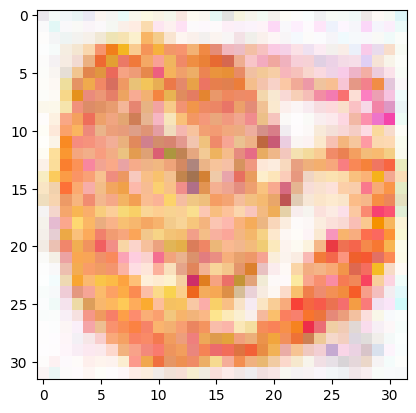

[296/500][0/936]	Loss_D: 0.0011	Loss_G: 9.1050	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[296/500][15/936]	Loss_D: 0.0012	Loss_G: 9.4455	D(x): 1.0000	D(G(z)): 0.0012 / 0.0011
[296/500][30/936]	Loss_D: 0.0004	Loss_G: 8.9275	D(x): 0.9999	D(G(z)): 0.0004 / 0.0004
[296/500][45/936]	Loss_D: 0.1880	Loss_G: 4.7724	D(x): 0.9039	D(G(z)): 0.0600 / 0.0236
[296/500][60/936]	Loss_D: 0.0000	Loss_G: 11.5165	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[296/500][75/936]	Loss_D: 0.0013	Loss_G: 7.2811	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[296/500][90/936]	Loss_D: 0.0007	Loss_G: 7.8789	D(x): 0.9998	D(G(z)): 0.0005 / 0.0004
[296/500][105/936]	Loss_D: 0.0053	Loss_G: 6.2952	D(x): 0.9992	D(G(z)): 0.0045 / 0.0027
[296/500][120/936]	Loss_D: 0.0045	Loss_G: 5.8707	D(x): 1.0000	D(G(z)): 0.0044 / 0.0039
[296/500][135/936]	Loss_D: 0.0015	Loss_G: 7.4557	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[296/500][150/936]	Loss_D: 0.0000	Loss_G: 14.9180	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[296/500][165/936]	Loss_D: 0.0000	Loss_G: 11.3180

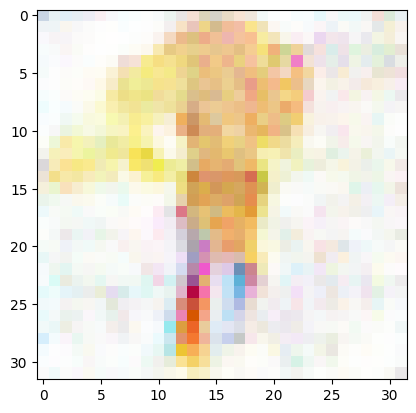

[297/500][0/936]	Loss_D: 0.0148	Loss_G: 5.0678	D(x): 1.0000	D(G(z)): 0.0147 / 0.0087
[297/500][15/936]	Loss_D: 0.0026	Loss_G: 6.2293	D(x): 1.0000	D(G(z)): 0.0025 / 0.0023
[297/500][30/936]	Loss_D: 0.0004	Loss_G: 16.5757	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
[297/500][45/936]	Loss_D: 0.0000	Loss_G: 13.0429	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[297/500][60/936]	Loss_D: 0.2302	Loss_G: 6.8097	D(x): 0.8107	D(G(z)): 0.0042 / 0.0221
[297/500][75/936]	Loss_D: 0.0003	Loss_G: 9.7405	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[297/500][90/936]	Loss_D: 0.0005	Loss_G: 8.6567	D(x): 1.0000	D(G(z)): 0.0005 / 0.0002
[297/500][105/936]	Loss_D: 0.2023	Loss_G: 7.9731	D(x): 0.8614	D(G(z)): 0.0002 / 0.0004
[297/500][120/936]	Loss_D: 0.0048	Loss_G: 7.3867	D(x): 0.9987	D(G(z)): 0.0035 / 0.0028
[297/500][135/936]	Loss_D: 0.0063	Loss_G: 5.5029	D(x): 0.9999	D(G(z)): 0.0062 / 0.0046
[297/500][150/936]	Loss_D: 0.0111	Loss_G: 6.1580	D(x): 1.0000	D(G(z)): 0.0110 / 0.0066
[297/500][165/936]	Loss_D: 0.0253	Loss_G: 5.3246	

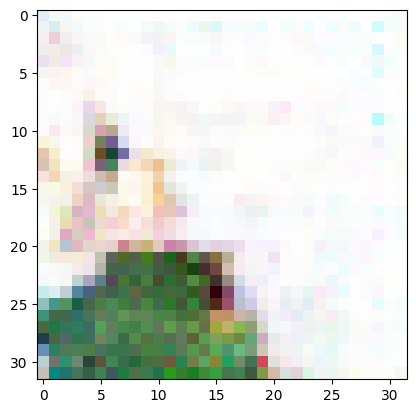

[298/500][0/936]	Loss_D: 0.0039	Loss_G: 5.9884	D(x): 1.0000	D(G(z)): 0.0039 / 0.0034
[298/500][15/936]	Loss_D: 0.0017	Loss_G: 6.6575	D(x): 0.9999	D(G(z)): 0.0016 / 0.0014
[298/500][30/936]	Loss_D: 0.0011	Loss_G: 7.3540	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[298/500][45/936]	Loss_D: 0.0042	Loss_G: 5.7497	D(x): 1.0000	D(G(z)): 0.0042 / 0.0034
[298/500][60/936]	Loss_D: 0.0002	Loss_G: 8.7311	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[298/500][75/936]	Loss_D: 0.0019	Loss_G: 6.5555	D(x): 1.0000	D(G(z)): 0.0019 / 0.0018
[298/500][90/936]	Loss_D: 0.0008	Loss_G: 7.6855	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[298/500][105/936]	Loss_D: 0.0204	Loss_G: 4.9099	D(x): 1.0000	D(G(z)): 0.0200 / 0.0088
[298/500][120/936]	Loss_D: 0.0170	Loss_G: 5.1268	D(x): 1.0000	D(G(z)): 0.0168 / 0.0078
[298/500][135/936]	Loss_D: 0.0183	Loss_G: 7.7251	D(x): 0.9829	D(G(z)): 0.0008 / 0.0009
[298/500][150/936]	Loss_D: 0.0022	Loss_G: 6.7568	D(x): 1.0000	D(G(z)): 0.0022 / 0.0018
[298/500][165/936]	Loss_D: 0.0058	Loss_G: 7.0016	D(

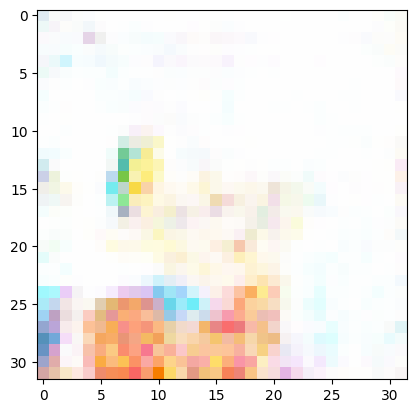

[299/500][0/936]	Loss_D: 0.0037	Loss_G: 5.8650	D(x): 1.0000	D(G(z)): 0.0037 / 0.0033
[299/500][15/936]	Loss_D: 0.0026	Loss_G: 7.2321	D(x): 1.0000	D(G(z)): 0.0026 / 0.0019
[299/500][30/936]	Loss_D: 0.0078	Loss_G: 6.6457	D(x): 0.9997	D(G(z)): 0.0074 / 0.0046
[299/500][45/936]	Loss_D: 0.0000	Loss_G: 13.8454	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[299/500][60/936]	Loss_D: 0.0081	Loss_G: 8.3888	D(x): 1.0000	D(G(z)): 0.0080 / 0.0015
[299/500][75/936]	Loss_D: 0.0960	Loss_G: 8.4882	D(x): 0.9201	D(G(z)): 0.0002 / 0.0003
[299/500][90/936]	Loss_D: 0.0464	Loss_G: 4.8019	D(x): 0.9993	D(G(z)): 0.0444 / 0.0097
[299/500][105/936]	Loss_D: 0.0000	Loss_G: 10.5857	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[299/500][120/936]	Loss_D: 0.0051	Loss_G: 5.6632	D(x): 1.0000	D(G(z)): 0.0051 / 0.0035
[299/500][135/936]	Loss_D: 0.0004	Loss_G: 8.2725	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[299/500][150/936]	Loss_D: 0.0042	Loss_G: 6.0828	D(x): 1.0000	D(G(z)): 0.0042 / 0.0026
[299/500][165/936]	Loss_D: 0.0136	Loss_G: 4.9559	

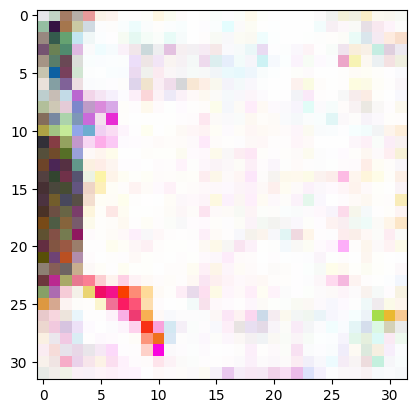

[300/500][0/936]	Loss_D: 0.0122	Loss_G: 6.5470	D(x): 1.0000	D(G(z)): 0.0121 / 0.0024
[300/500][15/936]	Loss_D: 0.0006	Loss_G: 8.7622	D(x): 0.9996	D(G(z)): 0.0002 / 0.0002
[300/500][30/936]	Loss_D: 0.0028	Loss_G: 6.2892	D(x): 0.9999	D(G(z)): 0.0027 / 0.0023
[300/500][45/936]	Loss_D: 0.0006	Loss_G: 7.7736	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[300/500][60/936]	Loss_D: 0.0000	Loss_G: 11.0036	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[300/500][75/936]	Loss_D: 0.0008	Loss_G: 7.4341	D(x): 1.0000	D(G(z)): 0.0008 / 0.0006
[300/500][90/936]	Loss_D: 0.0001	Loss_G: 9.6290	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[300/500][105/936]	Loss_D: 0.0017	Loss_G: 6.6758	D(x): 1.0000	D(G(z)): 0.0017 / 0.0014
[300/500][120/936]	Loss_D: 0.0005	Loss_G: 7.9697	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[300/500][135/936]	Loss_D: 0.0027	Loss_G: 7.0032	D(x): 0.9984	D(G(z)): 0.0010 / 0.0009
[300/500][150/936]	Loss_D: 0.1959	Loss_G: 7.4419	D(x): 1.0000	D(G(z)): 0.1633 / 0.0026
[300/500][165/936]	Loss_D: 0.0007	Loss_G: 10.0799	

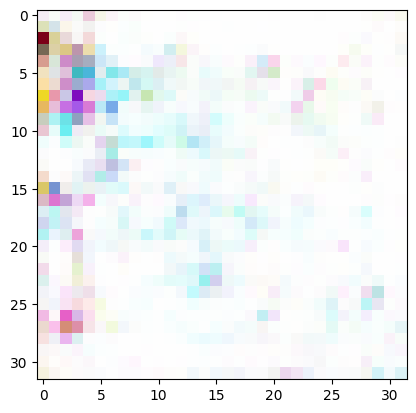

[301/500][0/936]	Loss_D: 0.1009	Loss_G: 2.2259	D(x): 1.0000	D(G(z)): 0.0927 / 0.1982
[301/500][15/936]	Loss_D: 0.0009	Loss_G: 7.6348	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[301/500][30/936]	Loss_D: 0.0108	Loss_G: 5.3796	D(x): 1.0000	D(G(z)): 0.0107 / 0.0062
[301/500][45/936]	Loss_D: 0.0001	Loss_G: 10.7683	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[301/500][60/936]	Loss_D: 0.0015	Loss_G: 8.0290	D(x): 1.0000	D(G(z)): 0.0015 / 0.0012
[301/500][75/936]	Loss_D: 0.0033	Loss_G: 6.3864	D(x): 0.9997	D(G(z)): 0.0030 / 0.0027
[301/500][90/936]	Loss_D: 0.0017	Loss_G: 7.3495	D(x): 0.9999	D(G(z)): 0.0016 / 0.0014
[301/500][105/936]	Loss_D: 0.3380	Loss_G: 7.1617	D(x): 0.8881	D(G(z)): 0.1483 / 0.0013
[301/500][120/936]	Loss_D: 0.0001	Loss_G: 10.0588	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[301/500][135/936]	Loss_D: 0.0575	Loss_G: 6.1110	D(x): 0.9992	D(G(z)): 0.0541 / 0.0029
[301/500][150/936]	Loss_D: 0.0015	Loss_G: 6.9764	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[301/500][165/936]	Loss_D: 0.0012	Loss_G: 9.0446	

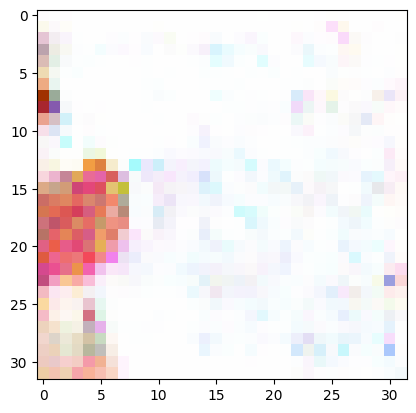

[302/500][0/936]	Loss_D: 0.0000	Loss_G: 17.6084	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[302/500][15/936]	Loss_D: 0.0000	Loss_G: 12.6585	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[302/500][30/936]	Loss_D: 0.0070	Loss_G: 6.6290	D(x): 1.0000	D(G(z)): 0.0069 / 0.0050
[302/500][45/936]	Loss_D: 0.0037	Loss_G: 6.4863	D(x): 1.0000	D(G(z)): 0.0037 / 0.0030
[302/500][60/936]	Loss_D: 0.0002	Loss_G: 9.3379	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[302/500][75/936]	Loss_D: 0.0008	Loss_G: 7.7834	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[302/500][90/936]	Loss_D: 0.0012	Loss_G: 8.8892	D(x): 1.0000	D(G(z)): 0.0012 / 0.0002
[302/500][105/936]	Loss_D: 0.0002	Loss_G: 9.2698	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[302/500][120/936]	Loss_D: 0.0011	Loss_G: 7.9716	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[302/500][135/936]	Loss_D: 0.0007	Loss_G: 7.5242	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[302/500][150/936]	Loss_D: 0.0001	Loss_G: 16.4608	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[302/500][165/936]	Loss_D: 0.0033	Loss_G: 13.391

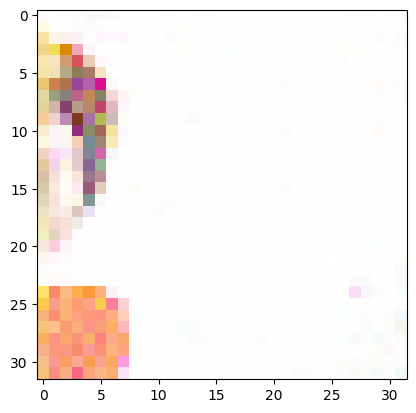

[303/500][0/936]	Loss_D: 0.0001	Loss_G: 9.8037	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[303/500][15/936]	Loss_D: 0.0001	Loss_G: 9.1853	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[303/500][30/936]	Loss_D: 0.0103	Loss_G: 5.3777	D(x): 1.0000	D(G(z)): 0.0102 / 0.0058
[303/500][45/936]	Loss_D: 0.0036	Loss_G: 6.3324	D(x): 1.0000	D(G(z)): 0.0036 / 0.0039
[303/500][60/936]	Loss_D: 0.0002	Loss_G: 9.3507	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[303/500][75/936]	Loss_D: 0.0007	Loss_G: 7.9101	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[303/500][90/936]	Loss_D: 0.0005	Loss_G: 11.8680	D(x): 0.9995	D(G(z)): 0.0000 / 0.0000
[303/500][105/936]	Loss_D: 0.0010	Loss_G: 7.6410	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[303/500][120/936]	Loss_D: 0.0015	Loss_G: 7.0268	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[303/500][135/936]	Loss_D: 0.0006	Loss_G: 7.5316	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[303/500][150/936]	Loss_D: 0.0101	Loss_G: 5.2881	D(x): 0.9999	D(G(z)): 0.0100 / 0.0054
[303/500][165/936]	Loss_D: 0.0287	Loss_G: 5.3275	D

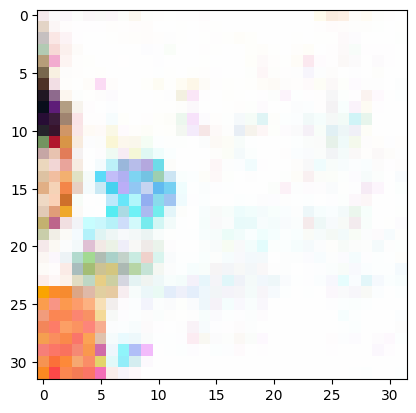

[304/500][0/936]	Loss_D: 0.0005	Loss_G: 24.3352	D(x): 1.0000	D(G(z)): 0.0005 / 0.0089
[304/500][15/936]	Loss_D: 0.0000	Loss_G: 18.2935	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[304/500][30/936]	Loss_D: 0.0127	Loss_G: 6.4881	D(x): 1.0000	D(G(z)): 0.0125 / 0.0116
[304/500][45/936]	Loss_D: 0.0001	Loss_G: 10.6637	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[304/500][60/936]	Loss_D: 0.0073	Loss_G: 8.1057	D(x): 1.0000	D(G(z)): 0.0073 / 0.0035
[304/500][75/936]	Loss_D: 0.0038	Loss_G: 5.9991	D(x): 1.0000	D(G(z)): 0.0037 / 0.0031
[304/500][90/936]	Loss_D: 0.0023	Loss_G: 6.5398	D(x): 1.0000	D(G(z)): 0.0023 / 0.0019
[304/500][105/936]	Loss_D: 0.0016	Loss_G: 6.5791	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[304/500][120/936]	Loss_D: 0.1234	Loss_G: 4.5121	D(x): 1.0000	D(G(z)): 0.1080 / 0.0167
[304/500][135/936]	Loss_D: 0.0147	Loss_G: 4.8571	D(x): 1.0000	D(G(z)): 0.0146 / 0.0087
[304/500][150/936]	Loss_D: 0.0043	Loss_G: 6.2665	D(x): 0.9984	D(G(z)): 0.0028 / 0.0023
[304/500][165/936]	Loss_D: 0.0048	Loss_G: 7.6536

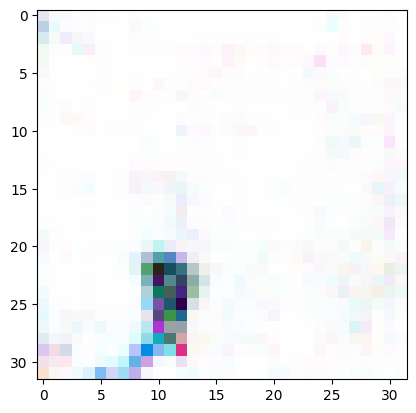

[305/500][0/936]	Loss_D: 0.0000	Loss_G: 11.3738	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[305/500][15/936]	Loss_D: 0.0006	Loss_G: 8.1971	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[305/500][30/936]	Loss_D: 0.0101	Loss_G: 6.0254	D(x): 1.0000	D(G(z)): 0.0100 / 0.0047
[305/500][45/936]	Loss_D: 0.0080	Loss_G: 5.8033	D(x): 1.0000	D(G(z)): 0.0079 / 0.0054
[305/500][60/936]	Loss_D: 0.0002	Loss_G: 9.1424	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[305/500][75/936]	Loss_D: 0.0095	Loss_G: 5.3101	D(x): 1.0000	D(G(z)): 0.0094 / 0.0055
[305/500][90/936]	Loss_D: 0.0022	Loss_G: 6.1830	D(x): 1.0000	D(G(z)): 0.0022 / 0.0021
[305/500][105/936]	Loss_D: 4.4642	Loss_G: 6.1989	D(x): 0.2674	D(G(z)): 0.0000 / 0.0023
[305/500][120/936]	Loss_D: 0.0009	Loss_G: 8.1524	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[305/500][135/936]	Loss_D: 0.0026	Loss_G: 6.8447	D(x): 1.0000	D(G(z)): 0.0026 / 0.0023
[305/500][150/936]	Loss_D: 0.0141	Loss_G: 5.6018	D(x): 1.0000	D(G(z)): 0.0138 / 0.0094
[305/500][165/936]	Loss_D: 0.0237	Loss_G: 4.5008	D

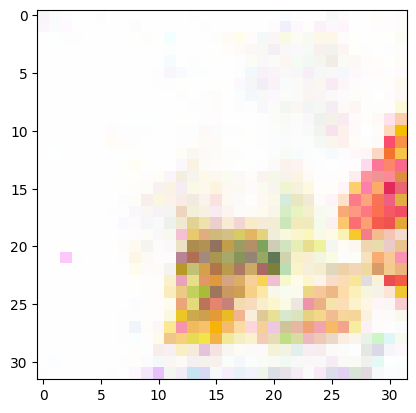

[306/500][0/936]	Loss_D: 0.0006	Loss_G: 8.8639	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[306/500][15/936]	Loss_D: 0.0018	Loss_G: 8.0604	D(x): 1.0000	D(G(z)): 0.0018 / 0.0016
[306/500][30/936]	Loss_D: 0.0004	Loss_G: 8.7032	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[306/500][45/936]	Loss_D: 0.0014	Loss_G: 6.7266	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[306/500][60/936]	Loss_D: 0.0047	Loss_G: 7.2488	D(x): 0.9998	D(G(z)): 0.0045 / 0.0032
[306/500][75/936]	Loss_D: 0.0007	Loss_G: 8.4074	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[306/500][90/936]	Loss_D: 0.0043	Loss_G: 7.3422	D(x): 1.0000	D(G(z)): 0.0043 / 0.0037
[306/500][105/936]	Loss_D: 0.0131	Loss_G: 4.8156	D(x): 1.0000	D(G(z)): 0.0130 / 0.0085
[306/500][120/936]	Loss_D: 0.0001	Loss_G: 9.7173	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[306/500][135/936]	Loss_D: 0.0000	Loss_G: 14.2516	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[306/500][150/936]	Loss_D: 0.0046	Loss_G: 6.6856	D(x): 1.0000	D(G(z)): 0.0046 / 0.0017
[306/500][165/936]	Loss_D: 0.0000	Loss_G: 13.0449	

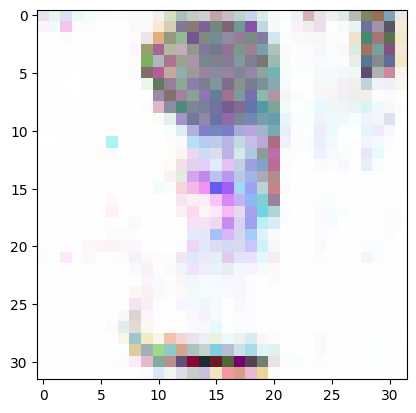

[307/500][0/936]	Loss_D: 1.2787	Loss_G: 15.5357	D(x): 1.0000	D(G(z)): 0.5129 / 0.0019
[307/500][15/936]	Loss_D: 0.0909	Loss_G: 23.0272	D(x): 1.0000	D(G(z)): 0.0769 / 0.0126
[307/500][30/936]	Loss_D: 0.0009	Loss_G: 22.5086	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[307/500][45/936]	Loss_D: 0.0005	Loss_G: 15.0244	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[307/500][60/936]	Loss_D: 0.0000	Loss_G: 16.4032	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[307/500][75/936]	Loss_D: 0.0000	Loss_G: 22.5732	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[307/500][90/936]	Loss_D: 0.0000	Loss_G: 18.1949	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[307/500][105/936]	Loss_D: 0.0196	Loss_G: 5.8906	D(x): 0.9999	D(G(z)): 0.0191 / 0.0075
[307/500][120/936]	Loss_D: 0.0000	Loss_G: 14.6044	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[307/500][135/936]	Loss_D: 0.0002	Loss_G: 10.3957	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[307/500][150/936]	Loss_D: 0.0106	Loss_G: 5.3902	D(x): 1.0000	D(G(z)): 0.0104 / 0.0063
[307/500][165/936]	Loss_D: 0.0101	Loss_G: 

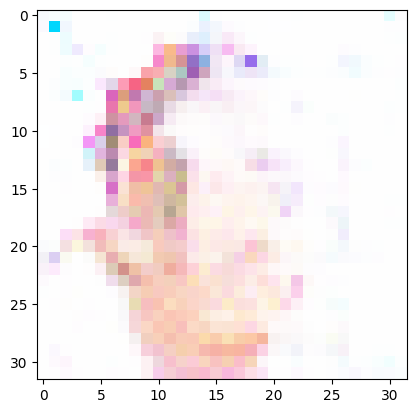

[308/500][0/936]	Loss_D: 0.0119	Loss_G: 5.2695	D(x): 0.9979	D(G(z)): 0.0098 / 0.0059
[308/500][15/936]	Loss_D: 0.4941	Loss_G: 10.3828	D(x): 0.9998	D(G(z)): 0.3387 / 0.0001
[308/500][30/936]	Loss_D: 0.0776	Loss_G: 15.1838	D(x): 0.9330	D(G(z)): 0.0000 / 0.0000
[308/500][45/936]	Loss_D: 0.0002	Loss_G: 9.2164	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[308/500][60/936]	Loss_D: 0.0004	Loss_G: 8.3715	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[308/500][75/936]	Loss_D: 0.0026	Loss_G: 6.4626	D(x): 0.9999	D(G(z)): 0.0025 / 0.0018
[308/500][90/936]	Loss_D: 0.0024	Loss_G: 7.3592	D(x): 0.9999	D(G(z)): 0.0024 / 0.0018
[308/500][105/936]	Loss_D: 0.0039	Loss_G: 6.5116	D(x): 0.9998	D(G(z)): 0.0037 / 0.0027
[308/500][120/936]	Loss_D: 0.0017	Loss_G: 6.7719	D(x): 1.0000	D(G(z)): 0.0017 / 0.0013
[308/500][135/936]	Loss_D: 0.1917	Loss_G: 3.1351	D(x): 0.8454	D(G(z)): 0.0075 / 0.0601
[308/500][150/936]	Loss_D: 0.0010	Loss_G: 7.8528	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[308/500][165/936]	Loss_D: 0.0696	Loss_G: 6.1548	

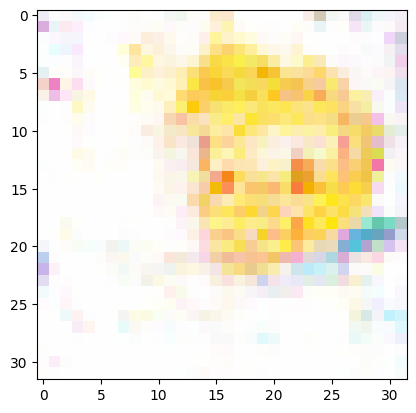

[309/500][0/936]	Loss_D: 0.0003	Loss_G: 10.3504	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[309/500][15/936]	Loss_D: 0.0004	Loss_G: 25.4072	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[309/500][30/936]	Loss_D: 0.0000	Loss_G: 13.9598	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[309/500][45/936]	Loss_D: 0.0000	Loss_G: 15.2656	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[309/500][60/936]	Loss_D: 0.0014	Loss_G: 6.8060	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
[309/500][75/936]	Loss_D: 0.0001	Loss_G: 9.6288	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[309/500][90/936]	Loss_D: 0.0008	Loss_G: 7.7907	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[309/500][105/936]	Loss_D: 0.0001	Loss_G: 10.5574	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[309/500][120/936]	Loss_D: 0.0051	Loss_G: 5.7861	D(x): 0.9992	D(G(z)): 0.0042 / 0.0037
[309/500][135/936]	Loss_D: 0.0002	Loss_G: 9.7170	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[309/500][150/936]	Loss_D: 0.0064	Loss_G: 5.4229	D(x): 1.0000	D(G(z)): 0.0064 / 0.0048
[309/500][165/936]	Loss_D: 0.0567	Loss_G: 6.01

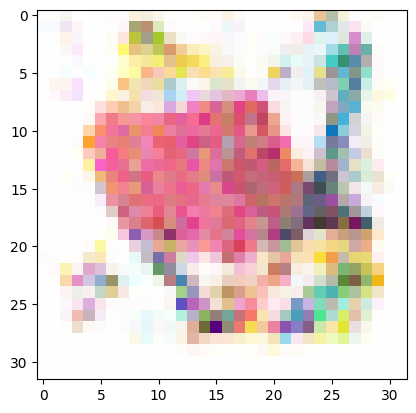

[310/500][0/936]	Loss_D: 0.0002	Loss_G: 15.5970	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[310/500][15/936]	Loss_D: 0.0060	Loss_G: 21.0943	D(x): 0.9941	D(G(z)): 0.0000 / 0.0000
[310/500][30/936]	Loss_D: 0.0003	Loss_G: 11.3139	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[310/500][45/936]	Loss_D: 0.0125	Loss_G: 6.9885	D(x): 1.0000	D(G(z)): 0.0124 / 0.0044
[310/500][60/936]	Loss_D: 0.0000	Loss_G: 10.4361	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[310/500][75/936]	Loss_D: 0.0019	Loss_G: 7.8804	D(x): 1.0000	D(G(z)): 0.0019 / 0.0014
[310/500][90/936]	Loss_D: 0.0087	Loss_G: 6.0289	D(x): 1.0000	D(G(z)): 0.0086 / 0.0067
[310/500][105/936]	Loss_D: 0.0016	Loss_G: 9.0610	D(x): 1.0000	D(G(z)): 0.0016 / 0.0014
[310/500][120/936]	Loss_D: 0.0001	Loss_G: 11.5702	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[310/500][135/936]	Loss_D: 0.0046	Loss_G: 6.0195	D(x): 1.0000	D(G(z)): 0.0046 / 0.0031
[310/500][150/936]	Loss_D: 0.0000	Loss_G: 31.6415	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[310/500][165/936]	Loss_D: 0.0002	Loss_G: 24.

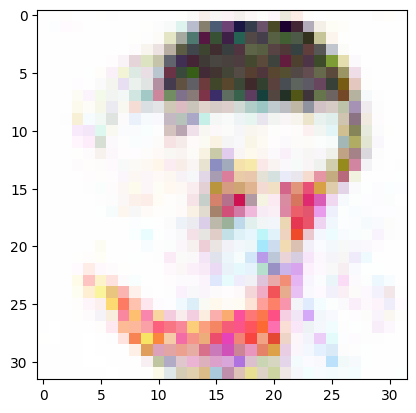

[311/500][0/936]	Loss_D: 0.0000	Loss_G: 17.6794	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[311/500][15/936]	Loss_D: 0.0001	Loss_G: 18.1153	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[311/500][30/936]	Loss_D: 0.0002	Loss_G: 10.6409	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[311/500][45/936]	Loss_D: 0.0001	Loss_G: 11.0461	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[311/500][60/936]	Loss_D: 0.0000	Loss_G: 11.0397	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[311/500][75/936]	Loss_D: 0.0000	Loss_G: 17.6845	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[311/500][90/936]	Loss_D: 0.0223	Loss_G: 6.2016	D(x): 1.0000	D(G(z)): 0.0218 / 0.0065
[311/500][105/936]	Loss_D: 0.0051	Loss_G: 6.3713	D(x): 1.0000	D(G(z)): 0.0051 / 0.0038
[311/500][120/936]	Loss_D: 0.0008	Loss_G: 8.8240	D(x): 0.9994	D(G(z)): 0.0002 / 0.0002
[311/500][135/936]	Loss_D: 0.0018	Loss_G: 6.5834	D(x): 0.9998	D(G(z)): 0.0016 / 0.0015
[311/500][150/936]	Loss_D: 0.0002	Loss_G: 9.4626	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[311/500][165/936]	Loss_D: 0.0003	Loss_G: 9.9

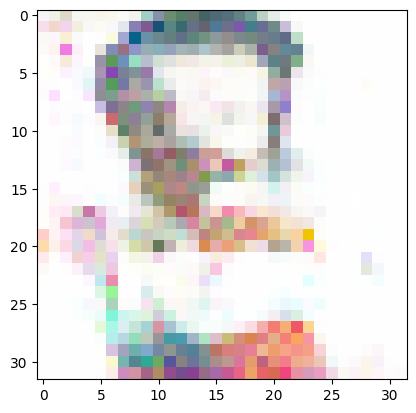

[312/500][0/936]	Loss_D: 0.0001	Loss_G: 22.2897	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[312/500][15/936]	Loss_D: 0.0036	Loss_G: 17.3472	D(x): 0.9995	D(G(z)): 0.0031 / 0.0026
[312/500][30/936]	Loss_D: 0.0001	Loss_G: 20.9640	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[312/500][45/936]	Loss_D: 0.0002	Loss_G: 18.3887	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[312/500][60/936]	Loss_D: 0.0004	Loss_G: 12.4844	D(x): 1.0000	D(G(z)): 0.0004 / 0.0006
[312/500][75/936]	Loss_D: 0.0002	Loss_G: 9.6709	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[312/500][90/936]	Loss_D: 0.0011	Loss_G: 8.0045	D(x): 1.0000	D(G(z)): 0.0011 / 0.0011
[312/500][105/936]	Loss_D: 0.0145	Loss_G: 5.2751	D(x): 1.0000	D(G(z)): 0.0144 / 0.0085
[312/500][120/936]	Loss_D: 0.0009	Loss_G: 7.4168	D(x): 0.9999	D(G(z)): 0.0009 / 0.0008
[312/500][135/936]	Loss_D: 0.0067	Loss_G: 6.2788	D(x): 1.0000	D(G(z)): 0.0066 / 0.0040
[312/500][150/936]	Loss_D: 0.0001	Loss_G: 9.6146	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[312/500][165/936]	Loss_D: 0.0001	Loss_G: 9.85

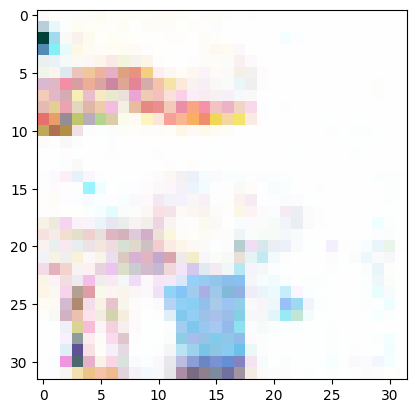

[313/500][0/936]	Loss_D: 0.0000	Loss_G: 15.4619	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[313/500][15/936]	Loss_D: 0.0000	Loss_G: 13.9266	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[313/500][30/936]	Loss_D: 0.0000	Loss_G: 11.1644	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[313/500][45/936]	Loss_D: 0.0016	Loss_G: 16.9244	D(x): 1.0000	D(G(z)): 0.0016 / 0.0001
[313/500][60/936]	Loss_D: 0.0049	Loss_G: 8.3154	D(x): 1.0000	D(G(z)): 0.0048 / 0.0029
[313/500][75/936]	Loss_D: 0.0023	Loss_G: 6.7699	D(x): 1.0000	D(G(z)): 0.0023 / 0.0021
[313/500][90/936]	Loss_D: 0.0009	Loss_G: 7.4854	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[313/500][105/936]	Loss_D: 0.0035	Loss_G: 5.8889	D(x): 1.0000	D(G(z)): 0.0035 / 0.0030
[313/500][120/936]	Loss_D: 0.0041	Loss_G: 5.9221	D(x): 1.0000	D(G(z)): 0.0041 / 0.0032
[313/500][135/936]	Loss_D: 0.0066	Loss_G: 5.9773	D(x): 1.0000	D(G(z)): 0.0066 / 0.0049
[313/500][150/936]	Loss_D: 0.0054	Loss_G: 6.1348	D(x): 1.0000	D(G(z)): 0.0053 / 0.0036
[313/500][165/936]	Loss_D: 0.0005	Loss_G: 8.002

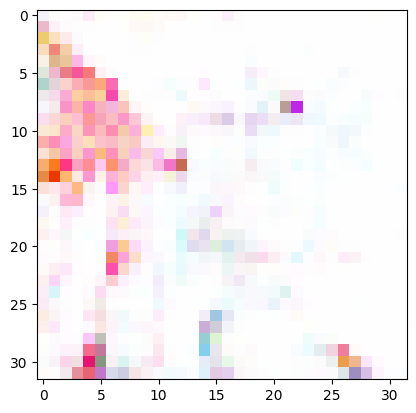

[314/500][0/936]	Loss_D: 0.1464	Loss_G: 9.2386	D(x): 1.0000	D(G(z)): 0.1302 / 0.0015
[314/500][15/936]	Loss_D: 0.0017	Loss_G: 7.2668	D(x): 1.0000	D(G(z)): 0.0017 / 0.0009
[314/500][30/936]	Loss_D: 0.0012	Loss_G: 7.1894	D(x): 1.0000	D(G(z)): 0.0012 / 0.0008
[314/500][45/936]	Loss_D: 0.0001	Loss_G: 9.8148	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[314/500][60/936]	Loss_D: 0.0212	Loss_G: 5.9585	D(x): 1.0000	D(G(z)): 0.0209 / 0.0107
[314/500][75/936]	Loss_D: 0.0042	Loss_G: 6.5340	D(x): 1.0000	D(G(z)): 0.0042 / 0.0024
[314/500][90/936]	Loss_D: 0.0043	Loss_G: 5.8894	D(x): 1.0000	D(G(z)): 0.0043 / 0.0032
[314/500][105/936]	Loss_D: 0.0202	Loss_G: 7.3304	D(x): 0.9812	D(G(z)): 0.0007 / 0.0007
[314/500][120/936]	Loss_D: 0.0010	Loss_G: 8.5888	D(x): 0.9993	D(G(z)): 0.0003 / 0.0003
[314/500][135/936]	Loss_D: 0.0003	Loss_G: 8.3610	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[314/500][150/936]	Loss_D: 0.0164	Loss_G: 5.6087	D(x): 1.0000	D(G(z)): 0.0162 / 0.0079
[314/500][165/936]	Loss_D: 0.0020	Loss_G: 6.7320	D(

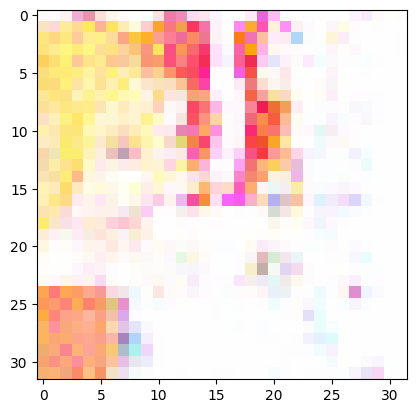

[315/500][0/936]	Loss_D: 2.7291	Loss_G: 29.7143	D(x): 1.0000	D(G(z)): 0.9021 / 0.0000
[315/500][15/936]	Loss_D: 0.0008	Loss_G: 13.2464	D(x): 1.0000	D(G(z)): 0.0008 / 0.0002
[315/500][30/936]	Loss_D: 0.0101	Loss_G: 22.4128	D(x): 1.0000	D(G(z)): 0.0099 / 0.0031
[315/500][45/936]	Loss_D: 0.0049	Loss_G: 14.6970	D(x): 1.0000	D(G(z)): 0.0049 / 0.0029
[315/500][60/936]	Loss_D: 0.0104	Loss_G: 13.7876	D(x): 1.0000	D(G(z)): 0.0103 / 0.0077
[315/500][75/936]	Loss_D: 0.4802	Loss_G: 10.7808	D(x): 0.6789	D(G(z)): 0.0062 / 0.0864
[315/500][90/936]	Loss_D: 0.0003	Loss_G: 15.9450	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[315/500][105/936]	Loss_D: 0.0172	Loss_G: 11.4982	D(x): 0.9884	D(G(z)): 0.0054 / 0.0026
[315/500][120/936]	Loss_D: 0.0081	Loss_G: 8.3801	D(x): 0.9928	D(G(z)): 0.0008 / 0.0009
[315/500][135/936]	Loss_D: 0.0007	Loss_G: 8.3906	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[315/500][150/936]	Loss_D: 0.0378	Loss_G: 8.1518	D(x): 0.9637	D(G(z)): 0.0004 / 0.0005
[315/500][165/936]	Loss_D: 0.0240	Loss_G: 4

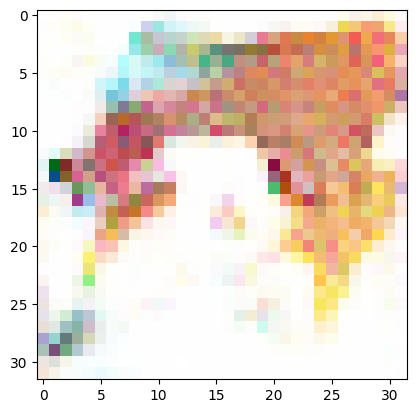

[316/500][0/936]	Loss_D: 0.0013	Loss_G: 7.4418	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[316/500][15/936]	Loss_D: 0.0000	Loss_G: 16.2010	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[316/500][30/936]	Loss_D: 0.0001	Loss_G: 11.8467	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[316/500][45/936]	Loss_D: 0.1013	Loss_G: 7.7502	D(x): 1.0000	D(G(z)): 0.0922 / 0.0005
[316/500][60/936]	Loss_D: 0.0019	Loss_G: 6.4931	D(x): 1.0000	D(G(z)): 0.0019 / 0.0018
[316/500][75/936]	Loss_D: 0.0136	Loss_G: 5.9245	D(x): 1.0000	D(G(z)): 0.0133 / 0.0068
[316/500][90/936]	Loss_D: 0.0264	Loss_G: 4.6502	D(x): 1.0000	D(G(z)): 0.0260 / 0.0105
[316/500][105/936]	Loss_D: 0.0000	Loss_G: 11.0765	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[316/500][120/936]	Loss_D: 0.0002	Loss_G: 8.8562	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[316/500][135/936]	Loss_D: 0.0001	Loss_G: 10.4463	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[316/500][150/936]	Loss_D: 0.0024	Loss_G: 7.0938	D(x): 1.0000	D(G(z)): 0.0024 / 0.0020
[316/500][165/936]	Loss_D: 0.0602	Loss_G: 4.170

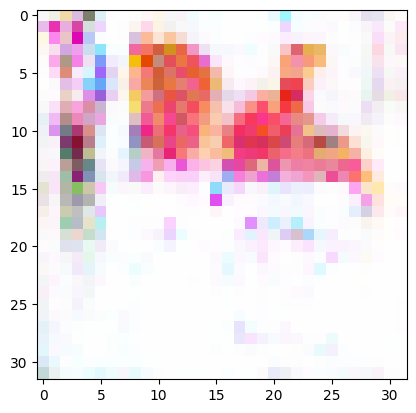

[317/500][0/936]	Loss_D: 0.0049	Loss_G: 14.5605	D(x): 1.0000	D(G(z)): 0.0049 / 0.0037
[317/500][15/936]	Loss_D: 0.0036	Loss_G: 24.7739	D(x): 0.9966	D(G(z)): 0.0002 / 0.0004
[317/500][30/936]	Loss_D: 0.0012	Loss_G: 18.6884	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[317/500][45/936]	Loss_D: 0.0009	Loss_G: 11.8879	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[317/500][60/936]	Loss_D: 0.0008	Loss_G: 9.0246	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[317/500][75/936]	Loss_D: 0.0004	Loss_G: 9.2957	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[317/500][90/936]	Loss_D: 0.0002	Loss_G: 9.1822	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[317/500][105/936]	Loss_D: 0.0002	Loss_G: 9.4617	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[317/500][120/936]	Loss_D: 0.0276	Loss_G: 7.7091	D(x): 0.9739	D(G(z)): 0.0008 / 0.0008
[317/500][135/936]	Loss_D: 0.0029	Loss_G: 6.4872	D(x): 0.9994	D(G(z)): 0.0022 / 0.0019
[317/500][150/936]	Loss_D: 0.0001	Loss_G: 9.8748	D(x): 0.9999	D(G(z)): 0.0000 / 0.0002
[317/500][165/936]	Loss_D: 0.0064	Loss_G: 5.404

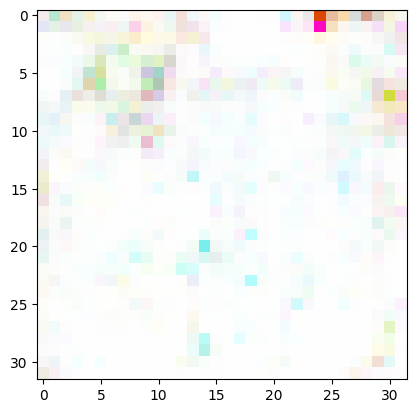

[318/500][0/936]	Loss_D: 0.0001	Loss_G: 9.3364	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[318/500][15/936]	Loss_D: 0.0000	Loss_G: 14.0613	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[318/500][30/936]	Loss_D: 0.0001	Loss_G: 16.7222	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[318/500][45/936]	Loss_D: 0.0202	Loss_G: 8.5747	D(x): 1.0000	D(G(z)): 0.0195 / 0.0099
[318/500][60/936]	Loss_D: 0.0000	Loss_G: 12.4245	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[318/500][75/936]	Loss_D: 0.0025	Loss_G: 8.2442	D(x): 0.9999	D(G(z)): 0.0024 / 0.0020
[318/500][90/936]	Loss_D: 0.0001	Loss_G: 10.7346	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[318/500][105/936]	Loss_D: 0.0076	Loss_G: 9.9995	D(x): 0.9931	D(G(z)): 0.0006 / 0.0006
[318/500][120/936]	Loss_D: 0.0101	Loss_G: 13.1545	D(x): 0.9901	D(G(z)): 0.0000 / 0.0000
[318/500][135/936]	Loss_D: 0.0235	Loss_G: 5.9046	D(x): 1.0000	D(G(z)): 0.0231 / 0.0066
[318/500][150/936]	Loss_D: 0.0014	Loss_G: 9.1077	D(x): 0.9997	D(G(z)): 0.0011 / 0.0009
[318/500][165/936]	Loss_D: 0.1178	Loss_G: 10.5

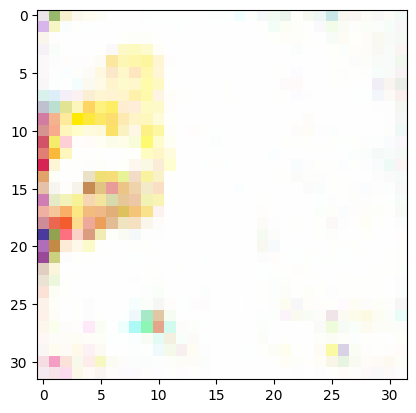

[319/500][0/936]	Loss_D: 0.0008	Loss_G: 7.5670	D(x): 1.0000	D(G(z)): 0.0008 / 0.0006
[319/500][15/936]	Loss_D: 0.0000	Loss_G: 14.6203	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[319/500][30/936]	Loss_D: 0.0038	Loss_G: 5.9263	D(x): 1.0000	D(G(z)): 0.0038 / 0.0029
[319/500][45/936]	Loss_D: 0.0001	Loss_G: 10.7983	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[319/500][60/936]	Loss_D: 0.0032	Loss_G: 7.4657	D(x): 0.9999	D(G(z)): 0.0030 / 0.0019
[319/500][75/936]	Loss_D: 0.0000	Loss_G: 13.8336	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[319/500][90/936]	Loss_D: 0.0066	Loss_G: 5.9160	D(x): 0.9984	D(G(z)): 0.0050 / 0.0037
[319/500][105/936]	Loss_D: 0.0140	Loss_G: 5.2185	D(x): 1.0000	D(G(z)): 0.0139 / 0.0065
[319/500][120/936]	Loss_D: 0.0031	Loss_G: 5.7768	D(x): 0.9991	D(G(z)): 0.0023 / 0.0032
[319/500][135/936]	Loss_D: 0.0004	Loss_G: 8.2459	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[319/500][150/936]	Loss_D: 0.0002	Loss_G: 9.2108	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[319/500][165/936]	Loss_D: 0.0007	Loss_G: 8.2521

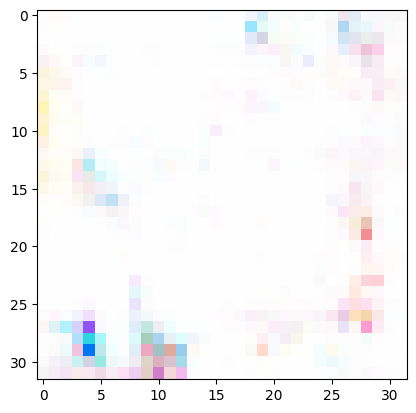

[320/500][0/936]	Loss_D: 0.0509	Loss_G: 5.6464	D(x): 0.9564	D(G(z)): 0.0033 / 0.0043
[320/500][15/936]	Loss_D: 0.0642	Loss_G: 6.1666	D(x): 1.0000	D(G(z)): 0.0603 / 0.0046
[320/500][30/936]	Loss_D: 0.0004	Loss_G: 8.1308	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[320/500][45/936]	Loss_D: 0.0043	Loss_G: 5.8358	D(x): 1.0000	D(G(z)): 0.0042 / 0.0036
[320/500][60/936]	Loss_D: 0.0034	Loss_G: 6.8420	D(x): 0.9994	D(G(z)): 0.0028 / 0.0022
[320/500][75/936]	Loss_D: 0.0002	Loss_G: 8.7220	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[320/500][90/936]	Loss_D: 0.0003	Loss_G: 11.8760	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[320/500][105/936]	Loss_D: 0.0001	Loss_G: 13.5068	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[320/500][120/936]	Loss_D: 0.0238	Loss_G: 5.5754	D(x): 1.0000	D(G(z)): 0.0231 / 0.0084
[320/500][135/936]	Loss_D: 0.0827	Loss_G: 6.9494	D(x): 1.0000	D(G(z)): 0.0788 / 0.0027
[320/500][150/936]	Loss_D: 0.0046	Loss_G: 7.5645	D(x): 0.9993	D(G(z)): 0.0039 / 0.0033
[320/500][165/936]	Loss_D: 0.0000	Loss_G: 23.9389

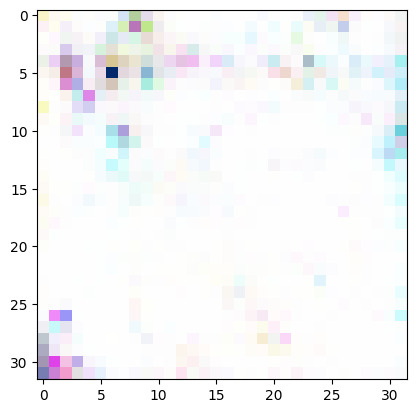

[321/500][0/936]	Loss_D: 0.8773	Loss_G: 14.2342	D(x): 1.0000	D(G(z)): 0.4885 / 0.0088
[321/500][15/936]	Loss_D: 0.0001	Loss_G: 17.8054	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[321/500][30/936]	Loss_D: 0.0001	Loss_G: 11.7837	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[321/500][45/936]	Loss_D: 0.0354	Loss_G: 6.1815	D(x): 0.9999	D(G(z)): 0.0331 / 0.0029
[321/500][60/936]	Loss_D: 0.0463	Loss_G: 6.8263	D(x): 0.9594	D(G(z)): 0.0026 / 0.0030
[321/500][75/936]	Loss_D: 0.0701	Loss_G: 4.9493	D(x): 0.9478	D(G(z)): 0.0115 / 0.0076
[321/500][90/936]	Loss_D: 0.0001	Loss_G: 9.6793	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[321/500][105/936]	Loss_D: 0.0004	Loss_G: 9.4961	D(x): 0.9997	D(G(z)): 0.0001 / 0.0001
[321/500][120/936]	Loss_D: 0.0019	Loss_G: 6.6089	D(x): 1.0000	D(G(z)): 0.0019 / 0.0016
[321/500][135/936]	Loss_D: 0.0129	Loss_G: 5.0220	D(x): 1.0000	D(G(z)): 0.0128 / 0.0066
[321/500][150/936]	Loss_D: 0.0230	Loss_G: 7.1129	D(x): 0.9783	D(G(z)): 0.0008 / 0.0009
[321/500][165/936]	Loss_D: 0.0001	Loss_G: 9.7652

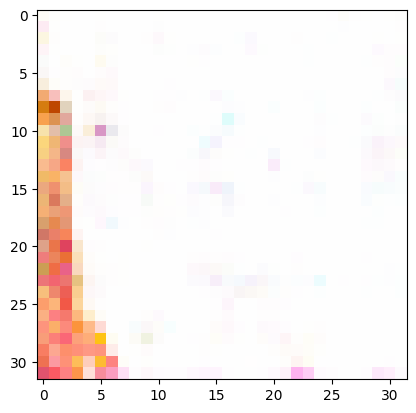

[322/500][0/936]	Loss_D: 0.0000	Loss_G: 14.6364	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[322/500][15/936]	Loss_D: 0.0000	Loss_G: 11.5018	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[322/500][30/936]	Loss_D: 0.0015	Loss_G: 7.7034	D(x): 0.9998	D(G(z)): 0.0013 / 0.0013
[322/500][45/936]	Loss_D: 0.0009	Loss_G: 7.3956	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[322/500][60/936]	Loss_D: 0.0013	Loss_G: 8.9120	D(x): 0.9989	D(G(z)): 0.0002 / 0.0002
[322/500][75/936]	Loss_D: 0.0006	Loss_G: 8.1612	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[322/500][90/936]	Loss_D: 0.0001	Loss_G: 9.8937	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[322/500][105/936]	Loss_D: 0.0034	Loss_G: 6.7886	D(x): 0.9996	D(G(z)): 0.0030 / 0.0023
[322/500][120/936]	Loss_D: 0.0203	Loss_G: 6.2525	D(x): 0.9829	D(G(z)): 0.0028 / 0.0028
[322/500][135/936]	Loss_D: 0.0002	Loss_G: 9.3209	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[322/500][150/936]	Loss_D: 0.0000	Loss_G: 10.5680	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[322/500][165/936]	Loss_D: 0.0067	Loss_G: 5.7260

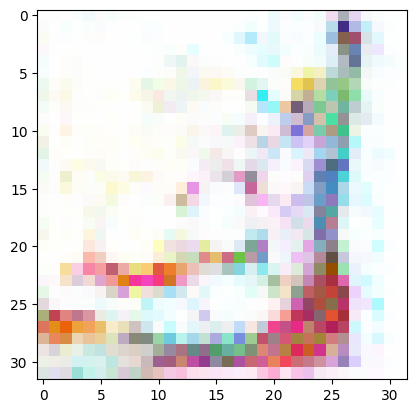

[323/500][0/936]	Loss_D: 0.0001	Loss_G: 9.9412	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[323/500][15/936]	Loss_D: 0.0033	Loss_G: 6.5472	D(x): 1.0000	D(G(z)): 0.0033 / 0.0026
[323/500][30/936]	Loss_D: 0.0019	Loss_G: 7.3725	D(x): 1.0000	D(G(z)): 0.0019 / 0.0008
[323/500][45/936]	Loss_D: 0.2363	Loss_G: 6.5471	D(x): 0.8454	D(G(z)): 0.0009 / 0.0028
[323/500][60/936]	Loss_D: 0.0274	Loss_G: 5.2004	D(x): 1.0000	D(G(z)): 0.0267 / 0.0088
[323/500][75/936]	Loss_D: 0.0054	Loss_G: 6.0336	D(x): 1.0000	D(G(z)): 0.0054 / 0.0029
[323/500][90/936]	Loss_D: 0.0031	Loss_G: 7.1463	D(x): 1.0000	D(G(z)): 0.0031 / 0.0025
[323/500][105/936]	Loss_D: 0.0073	Loss_G: 5.7240	D(x): 0.9979	D(G(z)): 0.0052 / 0.0033
[323/500][120/936]	Loss_D: 0.1534	Loss_G: 6.0052	D(x): 1.0000	D(G(z)): 0.1334 / 0.0027
[323/500][135/936]	Loss_D: 0.0000	Loss_G: 11.9545	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[323/500][150/936]	Loss_D: 0.0035	Loss_G: 6.0562	D(x): 0.9998	D(G(z)): 0.0033 / 0.0027
[323/500][165/936]	Loss_D: 0.0001	Loss_G: 13.1799	

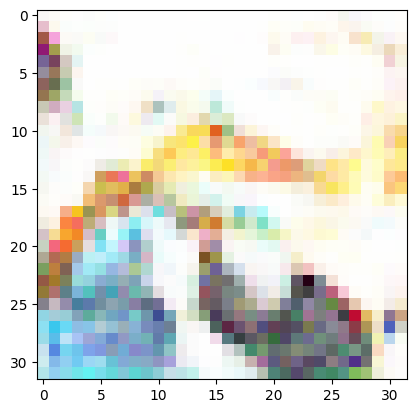

[324/500][0/936]	Loss_D: 0.0001	Loss_G: 10.0109	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[324/500][15/936]	Loss_D: 0.0000	Loss_G: 10.3643	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[324/500][30/936]	Loss_D: 0.0368	Loss_G: 8.9576	D(x): 1.0000	D(G(z)): 0.0357 / 0.0243
[324/500][45/936]	Loss_D: 0.0000	Loss_G: 22.7172	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[324/500][60/936]	Loss_D: 0.0047	Loss_G: 7.9081	D(x): 1.0000	D(G(z)): 0.0047 / 0.0035
[324/500][75/936]	Loss_D: 0.0041	Loss_G: 7.6859	D(x): 1.0000	D(G(z)): 0.0040 / 0.0034
[324/500][90/936]	Loss_D: 0.0005	Loss_G: 9.4784	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[324/500][105/936]	Loss_D: 0.0004	Loss_G: 9.8109	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[324/500][120/936]	Loss_D: 0.0626	Loss_G: 6.5728	D(x): 0.9409	D(G(z)): 0.0011 / 0.0015
[324/500][135/936]	Loss_D: 0.0002	Loss_G: 8.8789	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[324/500][150/936]	Loss_D: 0.1137	Loss_G: 6.2767	D(x): 0.9063	D(G(z)): 0.0015 / 0.0027
[324/500][165/936]	Loss_D: 0.0156	Loss_G: 5.1089

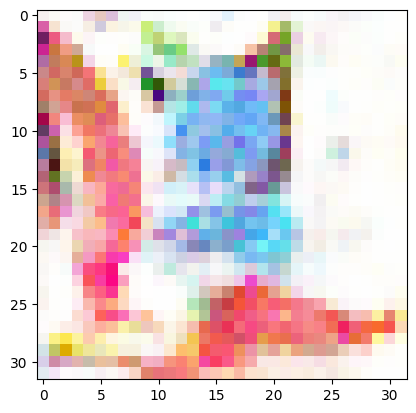

[325/500][0/936]	Loss_D: 4.4438	Loss_G: 17.6460	D(x): 1.0000	D(G(z)): 0.9794 / 0.0000
[325/500][15/936]	Loss_D: 0.0000	Loss_G: 26.7593	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[325/500][30/936]	Loss_D: 0.0046	Loss_G: 11.0382	D(x): 1.0000	D(G(z)): 0.0045 / 0.0033
[325/500][45/936]	Loss_D: 0.2326	Loss_G: 12.2283	D(x): 0.8496	D(G(z)): 0.0025 / 0.0005
[325/500][60/936]	Loss_D: 0.0137	Loss_G: 5.4859	D(x): 0.9996	D(G(z)): 0.0131 / 0.0074
[325/500][75/936]	Loss_D: 0.0034	Loss_G: 6.9348	D(x): 1.0000	D(G(z)): 0.0034 / 0.0013
[325/500][90/936]	Loss_D: 0.2892	Loss_G: 5.9487	D(x): 0.8276	D(G(z)): 0.0039 / 0.0032
[325/500][105/936]	Loss_D: 0.0227	Loss_G: 5.0898	D(x): 0.9996	D(G(z)): 0.0218 / 0.0096
[325/500][120/936]	Loss_D: 0.0008	Loss_G: 7.8732	D(x): 1.0000	D(G(z)): 0.0008 / 0.0006
[325/500][135/936]	Loss_D: 0.0010	Loss_G: 7.0308	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[325/500][150/936]	Loss_D: 0.0011	Loss_G: 7.2917	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[325/500][165/936]	Loss_D: 0.0002	Loss_G: 9.515

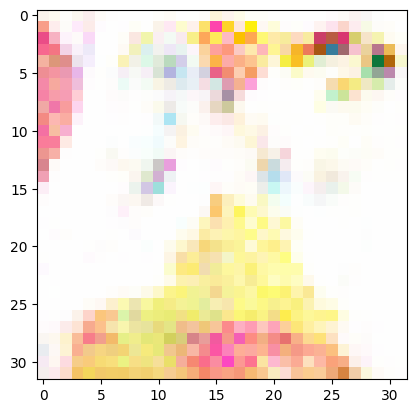

[326/500][0/936]	Loss_D: 0.0075	Loss_G: 9.4894	D(x): 0.9927	D(G(z)): 0.0000 / 0.0007
[326/500][15/936]	Loss_D: 0.0022	Loss_G: 9.9038	D(x): 1.0000	D(G(z)): 0.0022 / 0.0008
[326/500][30/936]	Loss_D: 0.0003	Loss_G: 11.0005	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[326/500][45/936]	Loss_D: 0.0005	Loss_G: 9.1105	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[326/500][60/936]	Loss_D: 0.0255	Loss_G: 7.3477	D(x): 1.0000	D(G(z)): 0.0249 / 0.0064
[326/500][75/936]	Loss_D: 0.0028	Loss_G: 6.3674	D(x): 1.0000	D(G(z)): 0.0028 / 0.0024
[326/500][90/936]	Loss_D: 0.0020	Loss_G: 7.3284	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[326/500][105/936]	Loss_D: 0.0021	Loss_G: 6.5933	D(x): 1.0000	D(G(z)): 0.0021 / 0.0019
[326/500][120/936]	Loss_D: 0.0023	Loss_G: 6.4556	D(x): 1.0000	D(G(z)): 0.0023 / 0.0020
[326/500][135/936]	Loss_D: 0.0035	Loss_G: 5.8498	D(x): 1.0000	D(G(z)): 0.0035 / 0.0031
[326/500][150/936]	Loss_D: 0.0086	Loss_G: 5.4778	D(x): 1.0000	D(G(z)): 0.0085 / 0.0061
[326/500][165/936]	Loss_D: 0.1837	Loss_G: 6.2873	D

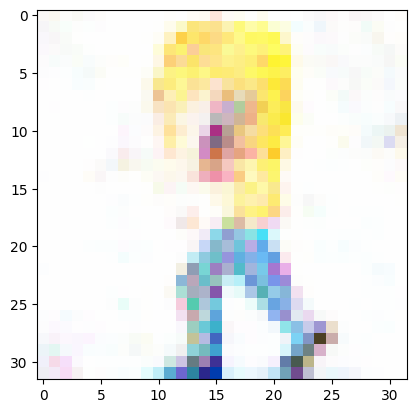

[327/500][0/936]	Loss_D: 0.0015	Loss_G: 7.8448	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[327/500][15/936]	Loss_D: 0.0006	Loss_G: 7.6873	D(x): 0.9999	D(G(z)): 0.0005 / 0.0005
[327/500][30/936]	Loss_D: 0.0001	Loss_G: 10.2778	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[327/500][45/936]	Loss_D: 0.0000	Loss_G: 12.3601	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[327/500][60/936]	Loss_D: 0.0009	Loss_G: 7.1561	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[327/500][75/936]	Loss_D: 0.0009	Loss_G: 7.0609	D(x): 1.0000	D(G(z)): 0.0009 / 0.0010
[327/500][90/936]	Loss_D: 0.0287	Loss_G: 5.3831	D(x): 0.9997	D(G(z)): 0.0277 / 0.0065
[327/500][105/936]	Loss_D: 4.7137	Loss_G: 1.7683	D(x): 0.2448	D(G(z)): 0.0017 / 0.2645
[327/500][120/936]	Loss_D: 0.0137	Loss_G: 7.2186	D(x): 1.0000	D(G(z)): 0.0135 / 0.0053
[327/500][135/936]	Loss_D: 0.0257	Loss_G: 7.5044	D(x): 1.0000	D(G(z)): 0.0250 / 0.0186
[327/500][150/936]	Loss_D: 0.0035	Loss_G: 6.9436	D(x): 1.0000	D(G(z)): 0.0035 / 0.0032
[327/500][165/936]	Loss_D: 0.0146	Loss_G: 5.6045	

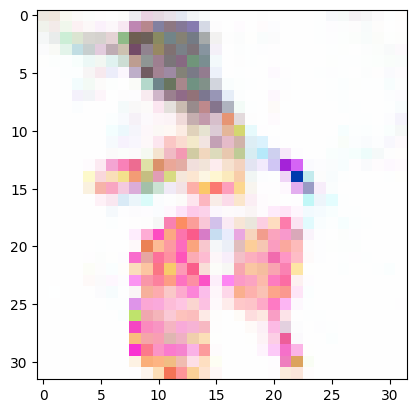

[328/500][0/936]	Loss_D: 0.0058	Loss_G: 5.5342	D(x): 1.0000	D(G(z)): 0.0058 / 0.0044
[328/500][15/936]	Loss_D: 0.0211	Loss_G: 5.1181	D(x): 1.0000	D(G(z)): 0.0205 / 0.0119
[328/500][30/936]	Loss_D: 0.0008	Loss_G: 7.3851	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[328/500][45/936]	Loss_D: 0.0025	Loss_G: 6.6364	D(x): 1.0000	D(G(z)): 0.0025 / 0.0021
[328/500][60/936]	Loss_D: 0.5157	Loss_G: 4.6388	D(x): 0.7810	D(G(z)): 0.0051 / 0.0158
[328/500][75/936]	Loss_D: 0.0038	Loss_G: 6.4866	D(x): 1.0000	D(G(z)): 0.0038 / 0.0029
[328/500][90/936]	Loss_D: 0.0028	Loss_G: 6.3546	D(x): 1.0000	D(G(z)): 0.0028 / 0.0023
[328/500][105/936]	Loss_D: 0.0019	Loss_G: 6.5057	D(x): 1.0000	D(G(z)): 0.0019 / 0.0016
[328/500][120/936]	Loss_D: 0.0000	Loss_G: 10.9600	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[328/500][135/936]	Loss_D: 0.0043	Loss_G: 6.0045	D(x): 1.0000	D(G(z)): 0.0043 / 0.0037
[328/500][150/936]	Loss_D: 0.0011	Loss_G: 7.6076	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[328/500][165/936]	Loss_D: 0.0001	Loss_G: 9.4771	D

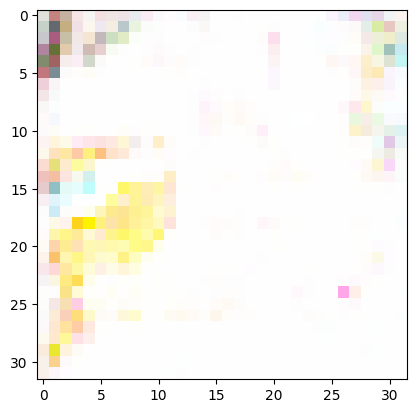

[329/500][0/936]	Loss_D: 0.0000	Loss_G: 12.7356	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[329/500][15/936]	Loss_D: 0.0002	Loss_G: 11.0328	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[329/500][30/936]	Loss_D: 0.0002	Loss_G: 9.2670	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[329/500][45/936]	Loss_D: 0.0009	Loss_G: 7.2355	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[329/500][60/936]	Loss_D: 0.0015	Loss_G: 6.8304	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[329/500][75/936]	Loss_D: 0.0119	Loss_G: 5.1350	D(x): 1.0000	D(G(z)): 0.0119 / 0.0062
[329/500][90/936]	Loss_D: 0.0165	Loss_G: 6.7887	D(x): 0.9849	D(G(z)): 0.0010 / 0.0012
[329/500][105/936]	Loss_D: 0.0085	Loss_G: 23.5271	D(x): 0.9916	D(G(z)): 0.0000 / 0.0000
[329/500][120/936]	Loss_D: 0.0004	Loss_G: 20.4183	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[329/500][135/936]	Loss_D: 0.0043	Loss_G: 6.5249	D(x): 1.0000	D(G(z)): 0.0043 / 0.0032
[329/500][150/936]	Loss_D: 0.0002	Loss_G: 9.7172	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[329/500][165/936]	Loss_D: 0.0007	Loss_G: 7.935

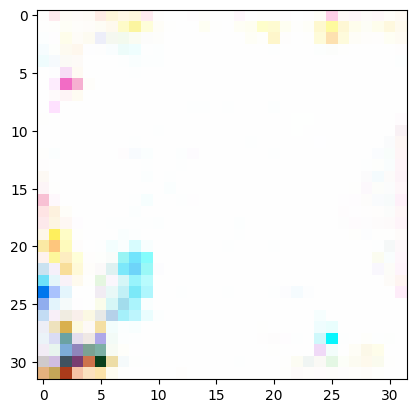

[330/500][0/936]	Loss_D: 0.0003	Loss_G: 10.0648	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[330/500][15/936]	Loss_D: 0.0469	Loss_G: 5.9734	D(x): 0.9998	D(G(z)): 0.0451 / 0.0044
[330/500][30/936]	Loss_D: 0.0001	Loss_G: 9.3783	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[330/500][45/936]	Loss_D: 0.0000	Loss_G: 25.0295	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[330/500][60/936]	Loss_D: 0.0377	Loss_G: 14.7588	D(x): 0.9649	D(G(z)): 0.0000 / 0.0000
[330/500][75/936]	Loss_D: 0.0002	Loss_G: 11.2003	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[330/500][90/936]	Loss_D: 0.0008	Loss_G: 9.2644	D(x): 1.0000	D(G(z)): 0.0008 / 0.0004
[330/500][105/936]	Loss_D: 0.0538	Loss_G: 5.8554	D(x): 1.0000	D(G(z)): 0.0523 / 0.0039
[330/500][120/936]	Loss_D: 0.0051	Loss_G: 5.7887	D(x): 1.0000	D(G(z)): 0.0051 / 0.0040
[330/500][135/936]	Loss_D: 0.0195	Loss_G: 4.9626	D(x): 1.0000	D(G(z)): 0.0193 / 0.0123
[330/500][150/936]	Loss_D: 0.0004	Loss_G: 8.1992	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[330/500][165/936]	Loss_D: 0.0017	Loss_G: 6.874

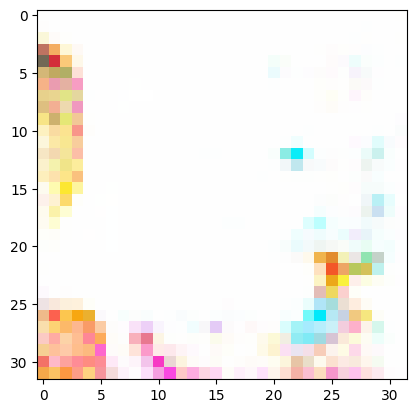

[331/500][0/936]	Loss_D: 0.0016	Loss_G: 7.9132	D(x): 0.9990	D(G(z)): 0.0007 / 0.0006
[331/500][15/936]	Loss_D: 0.0005	Loss_G: 13.8385	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[331/500][30/936]	Loss_D: 0.0002	Loss_G: 10.8395	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[331/500][45/936]	Loss_D: 0.0055	Loss_G: 7.2718	D(x): 1.0000	D(G(z)): 0.0054 / 0.0009
[331/500][60/936]	Loss_D: 0.0006	Loss_G: 8.4252	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
[331/500][75/936]	Loss_D: 0.0004	Loss_G: 8.1453	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[331/500][90/936]	Loss_D: 0.0005	Loss_G: 7.8358	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[331/500][105/936]	Loss_D: 0.0002	Loss_G: 8.5818	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[331/500][120/936]	Loss_D: 0.4700	Loss_G: 28.6535	D(x): 0.7420	D(G(z)): 0.0000 / 0.0000
[331/500][135/936]	Loss_D: 0.0025	Loss_G: 18.0792	D(x): 1.0000	D(G(z)): 0.0025 / 0.0084
[331/500][150/936]	Loss_D: 0.0002	Loss_G: 19.0508	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[331/500][165/936]	Loss_D: 0.0007	Loss_G: 8.33

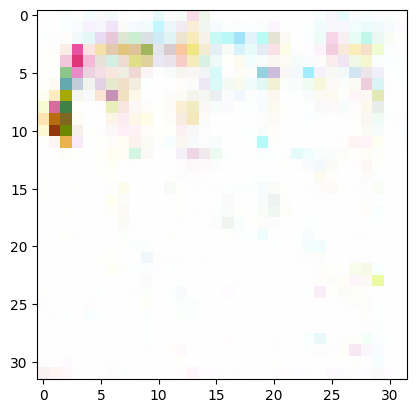

[332/500][0/936]	Loss_D: 0.0001	Loss_G: 15.5125	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[332/500][15/936]	Loss_D: 0.0103	Loss_G: 9.8683	D(x): 0.9900	D(G(z)): 0.0001 / 0.0002
[332/500][30/936]	Loss_D: 0.0002	Loss_G: 9.7278	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[332/500][45/936]	Loss_D: 0.0000	Loss_G: 14.1013	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[332/500][60/936]	Loss_D: 0.0026	Loss_G: 6.4700	D(x): 0.9993	D(G(z)): 0.0019 / 0.0016
[332/500][75/936]	Loss_D: 0.0044	Loss_G: 5.7482	D(x): 1.0000	D(G(z)): 0.0044 / 0.0034
[332/500][90/936]	Loss_D: 0.0000	Loss_G: 17.5200	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[332/500][105/936]	Loss_D: 0.0000	Loss_G: 16.7722	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[332/500][120/936]	Loss_D: 0.0012	Loss_G: 11.7548	D(x): 0.9999	D(G(z)): 0.0011 / 0.0009
[332/500][135/936]	Loss_D: 0.0092	Loss_G: 4.6957	D(x): 0.9999	D(G(z)): 0.0091 / 0.0103
[332/500][150/936]	Loss_D: 0.0008	Loss_G: 7.8663	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[332/500][165/936]	Loss_D: 0.0011	Loss_G: 14.6

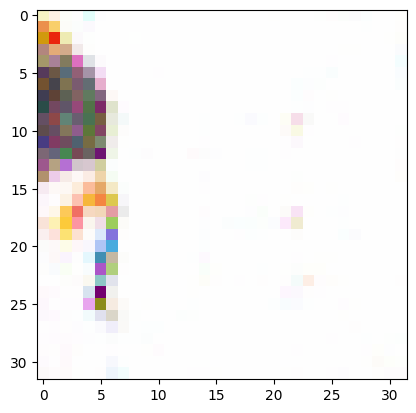

[333/500][0/936]	Loss_D: 0.0000	Loss_G: 13.2101	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[333/500][15/936]	Loss_D: 0.0002	Loss_G: 13.6472	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[333/500][30/936]	Loss_D: 0.0000	Loss_G: 10.4429	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[333/500][45/936]	Loss_D: 0.0272	Loss_G: 5.0674	D(x): 1.0000	D(G(z)): 0.0266 / 0.0068
[333/500][60/936]	Loss_D: 0.0366	Loss_G: 5.0891	D(x): 0.9997	D(G(z)): 0.0356 / 0.0064
[333/500][75/936]	Loss_D: 0.0003	Loss_G: 8.8965	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[333/500][90/936]	Loss_D: 0.0550	Loss_G: 5.0878	D(x): 0.9939	D(G(z)): 0.0454 / 0.0163
[333/500][105/936]	Loss_D: 0.0039	Loss_G: 6.2814	D(x): 1.0000	D(G(z)): 0.0038 / 0.0025
[333/500][120/936]	Loss_D: 0.0013	Loss_G: 8.0923	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[333/500][135/936]	Loss_D: 0.2864	Loss_G: 14.9291	D(x): 1.0000	D(G(z)): 0.2336 / 0.0000
[333/500][150/936]	Loss_D: 0.1674	Loss_G: 13.6814	D(x): 0.8778	D(G(z)): 0.0001 / 0.0001
[333/500][165/936]	Loss_D: 0.0419	Loss_G: 6.05

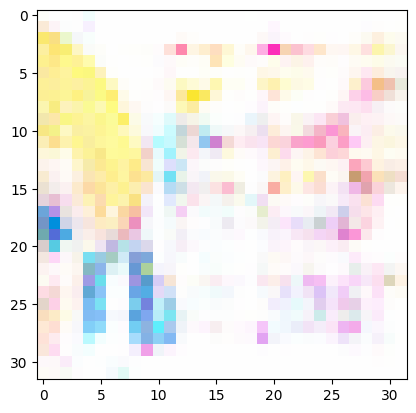

[334/500][0/936]	Loss_D: 0.0000	Loss_G: 12.1327	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[334/500][15/936]	Loss_D: 0.0038	Loss_G: 5.9008	D(x): 1.0000	D(G(z)): 0.0037 / 0.0030
[334/500][30/936]	Loss_D: 0.0006	Loss_G: 7.7838	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
[334/500][45/936]	Loss_D: 0.0035	Loss_G: 6.1748	D(x): 0.9999	D(G(z)): 0.0034 / 0.0023
[334/500][60/936]	Loss_D: 0.0000	Loss_G: 11.5376	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[334/500][75/936]	Loss_D: 0.0235	Loss_G: 5.1862	D(x): 1.0000	D(G(z)): 0.0230 / 0.0072
[334/500][90/936]	Loss_D: 0.0107	Loss_G: 5.9441	D(x): 0.9989	D(G(z)): 0.0095 / 0.0054
[334/500][105/936]	Loss_D: 0.0004	Loss_G: 8.2757	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[334/500][120/936]	Loss_D: 0.0203	Loss_G: 4.9730	D(x): 1.0000	D(G(z)): 0.0201 / 0.0076
[334/500][135/936]	Loss_D: 0.0015	Loss_G: 6.9190	D(x): 1.0000	D(G(z)): 0.0015 / 0.0012
[334/500][150/936]	Loss_D: 0.0006	Loss_G: 8.5561	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[334/500][165/936]	Loss_D: 0.0014	Loss_G: 7.9400	

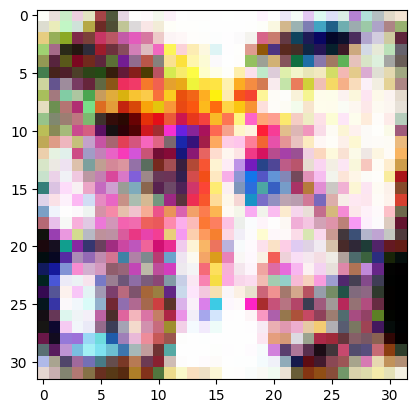

[335/500][0/936]	Loss_D: 0.0338	Loss_G: 5.5990	D(x): 0.9761	D(G(z)): 0.0086 / 0.0063
[335/500][15/936]	Loss_D: 0.0012	Loss_G: 7.6530	D(x): 0.9999	D(G(z)): 0.0011 / 0.0007
[335/500][30/936]	Loss_D: 0.0019	Loss_G: 8.4233	D(x): 1.0000	D(G(z)): 0.0019 / 0.0015
[335/500][45/936]	Loss_D: 0.0092	Loss_G: 5.6806	D(x): 0.9966	D(G(z)): 0.0058 / 0.0039
[335/500][60/936]	Loss_D: 0.0014	Loss_G: 7.1640	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
[335/500][75/936]	Loss_D: 0.0032	Loss_G: 7.6792	D(x): 1.0000	D(G(z)): 0.0032 / 0.0019
[335/500][90/936]	Loss_D: 0.0072	Loss_G: 7.5401	D(x): 1.0000	D(G(z)): 0.0071 / 0.0030
[335/500][105/936]	Loss_D: 0.0106	Loss_G: 5.5088	D(x): 1.0000	D(G(z)): 0.0106 / 0.0050
[335/500][120/936]	Loss_D: 0.0056	Loss_G: 6.0579	D(x): 0.9999	D(G(z)): 0.0055 / 0.0033
[335/500][135/936]	Loss_D: 0.0002	Loss_G: 10.1727	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[335/500][150/936]	Loss_D: 0.0010	Loss_G: 7.3672	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[335/500][165/936]	Loss_D: 0.0017	Loss_G: 6.8661	D

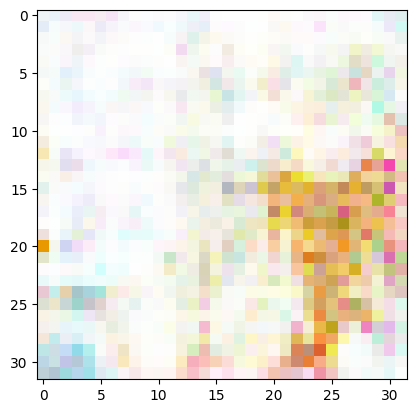

[336/500][0/936]	Loss_D: 0.0001	Loss_G: 18.8003	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[336/500][15/936]	Loss_D: 0.0002	Loss_G: 16.8015	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[336/500][30/936]	Loss_D: 0.0011	Loss_G: 11.5520	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[336/500][45/936]	Loss_D: 0.0011	Loss_G: 12.8447	D(x): 1.0000	D(G(z)): 0.0011 / 0.0011
[336/500][60/936]	Loss_D: 0.0003	Loss_G: 11.8195	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[336/500][75/936]	Loss_D: 0.0003	Loss_G: 8.3454	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[336/500][90/936]	Loss_D: 0.0079	Loss_G: 5.4942	D(x): 1.0000	D(G(z)): 0.0079 / 0.0057
[336/500][105/936]	Loss_D: 0.0013	Loss_G: 7.5761	D(x): 0.9993	D(G(z)): 0.0006 / 0.0006
[336/500][120/936]	Loss_D: 0.0190	Loss_G: 4.8005	D(x): 1.0000	D(G(z)): 0.0188 / 0.0094
[336/500][135/936]	Loss_D: 0.0000	Loss_G: 21.4886	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[336/500][150/936]	Loss_D: 0.0004	Loss_G: 11.6261	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[336/500][165/936]	Loss_D: 0.0010	Loss_G: 10

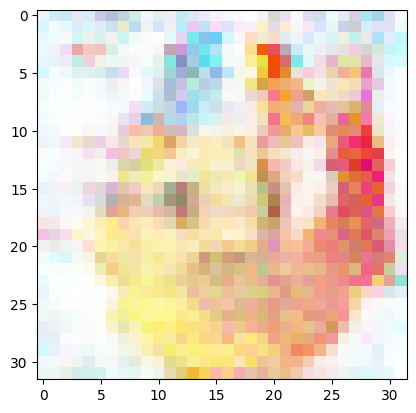

[337/500][0/936]	Loss_D: 0.0002	Loss_G: 12.5709	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[337/500][15/936]	Loss_D: 0.0001	Loss_G: 10.2193	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[337/500][30/936]	Loss_D: 0.0076	Loss_G: 5.4003	D(x): 0.9999	D(G(z)): 0.0075 / 0.0050
[337/500][45/936]	Loss_D: 0.0005	Loss_G: 8.3462	D(x): 1.0000	D(G(z)): 0.0005 / 0.0002
[337/500][60/936]	Loss_D: 0.0000	Loss_G: 15.2608	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[337/500][75/936]	Loss_D: 0.0003	Loss_G: 8.9675	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[337/500][90/936]	Loss_D: 0.0028	Loss_G: 11.6172	D(x): 0.9972	D(G(z)): 0.0000 / 0.0000
[337/500][105/936]	Loss_D: 0.0010	Loss_G: 8.4427	D(x): 0.9993	D(G(z)): 0.0002 / 0.0002
[337/500][120/936]	Loss_D: 0.0088	Loss_G: 16.1413	D(x): 1.0000	D(G(z)): 0.0086 / 0.0046
[337/500][135/936]	Loss_D: 0.0026	Loss_G: 14.7214	D(x): 1.0000	D(G(z)): 0.0026 / 0.0023
[337/500][150/936]	Loss_D: 1.3985	Loss_G: 14.2424	D(x): 0.5089	D(G(z)): 0.0001 / 0.0026
[337/500][165/936]	Loss_D: 0.0015	Loss_G: 6.

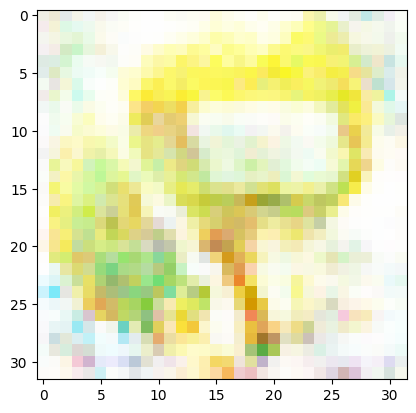

[338/500][0/936]	Loss_D: 0.0677	Loss_G: 2.8803	D(x): 1.0000	D(G(z)): 0.0622 / 0.0809
[338/500][15/936]	Loss_D: 0.0008	Loss_G: 10.0991	D(x): 0.9995	D(G(z)): 0.0004 / 0.0004
[338/500][30/936]	Loss_D: 0.0024	Loss_G: 8.5544	D(x): 0.9979	D(G(z)): 0.0003 / 0.0003
[338/500][45/936]	Loss_D: 0.0137	Loss_G: 6.0151	D(x): 0.9995	D(G(z)): 0.0131 / 0.0055
[338/500][60/936]	Loss_D: 0.0069	Loss_G: 5.4420	D(x): 1.0000	D(G(z)): 0.0069 / 0.0050
[338/500][75/936]	Loss_D: 0.0002	Loss_G: 12.0717	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[338/500][90/936]	Loss_D: 0.0032	Loss_G: 6.3634	D(x): 0.9994	D(G(z)): 0.0026 / 0.0018
[338/500][105/936]	Loss_D: 0.0017	Loss_G: 7.6254	D(x): 1.0000	D(G(z)): 0.0017 / 0.0012
[338/500][120/936]	Loss_D: 0.0003	Loss_G: 10.9250	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[338/500][135/936]	Loss_D: 0.0001	Loss_G: 10.4584	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[338/500][150/936]	Loss_D: 0.0002	Loss_G: 10.0607	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[338/500][165/936]	Loss_D: 0.0117	Loss_G: 7.18

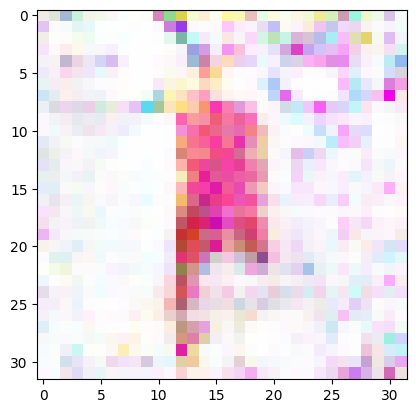

[339/500][0/936]	Loss_D: 0.0001	Loss_G: 9.7023	D(x): 1.0000	D(G(z)): 0.0001 / 0.0002
[339/500][15/936]	Loss_D: 0.0018	Loss_G: 6.7387	D(x): 1.0000	D(G(z)): 0.0018 / 0.0021
[339/500][30/936]	Loss_D: 0.0001	Loss_G: 13.7905	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[339/500][45/936]	Loss_D: 0.0015	Loss_G: 6.8704	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[339/500][60/936]	Loss_D: 0.0004	Loss_G: 8.1839	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[339/500][75/936]	Loss_D: 0.0013	Loss_G: 6.9672	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[339/500][90/936]	Loss_D: 0.0008	Loss_G: 7.5368	D(x): 0.9999	D(G(z)): 0.0007 / 0.0007
[339/500][105/936]	Loss_D: 0.0397	Loss_G: 4.7508	D(x): 0.9996	D(G(z)): 0.0382 / 0.0089
[339/500][120/936]	Loss_D: 0.1401	Loss_G: 6.4249	D(x): 0.9996	D(G(z)): 0.1231 / 0.0019
[339/500][135/936]	Loss_D: 0.0094	Loss_G: 6.1354	D(x): 0.9981	D(G(z)): 0.0074 / 0.0051
[339/500][150/936]	Loss_D: 0.0000	Loss_G: 11.1463	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[339/500][165/936]	Loss_D: 0.0025	Loss_G: 6.8736	

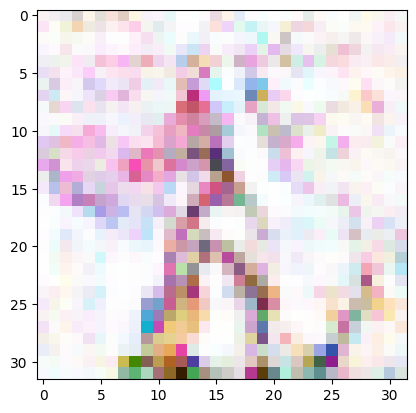

[340/500][0/936]	Loss_D: 0.0055	Loss_G: 5.7768	D(x): 0.9999	D(G(z)): 0.0054 / 0.0034
[340/500][15/936]	Loss_D: 0.0000	Loss_G: 12.6893	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[340/500][30/936]	Loss_D: 0.0088	Loss_G: 8.9074	D(x): 0.9916	D(G(z)): 0.0003 / 0.0003
[340/500][45/936]	Loss_D: 0.4181	Loss_G: 11.6608	D(x): 0.7904	D(G(z)): 0.0000 / 0.0001
[340/500][60/936]	Loss_D: 0.1251	Loss_G: 7.2629	D(x): 0.9028	D(G(z)): 0.0025 / 0.0043
[340/500][75/936]	Loss_D: 0.0000	Loss_G: 13.8051	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[340/500][90/936]	Loss_D: 0.0003	Loss_G: 9.4571	D(x): 1.0000	D(G(z)): 0.0003 / 0.0004
[340/500][105/936]	Loss_D: 0.0042	Loss_G: 8.9323	D(x): 0.9960	D(G(z)): 0.0002 / 0.0002
[340/500][120/936]	Loss_D: 0.0124	Loss_G: 8.5378	D(x): 0.9880	D(G(z)): 0.0002 / 0.0003
[340/500][135/936]	Loss_D: 0.0053	Loss_G: 5.9036	D(x): 1.0000	D(G(z)): 0.0052 / 0.0037
[340/500][150/936]	Loss_D: 0.0002	Loss_G: 9.9175	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[340/500][165/936]	Loss_D: 0.0035	Loss_G: 6.0230

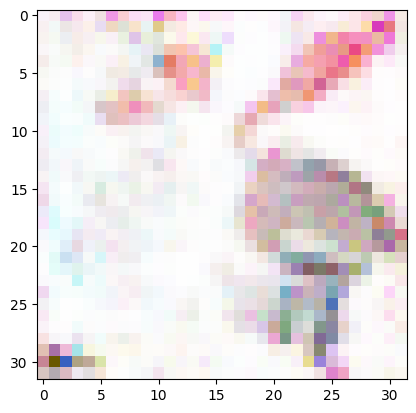

[341/500][0/936]	Loss_D: 0.0077	Loss_G: 10.2844	D(x): 0.9973	D(G(z)): 0.0050 / 0.0037
[341/500][15/936]	Loss_D: 0.0001	Loss_G: 14.1760	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[341/500][30/936]	Loss_D: 0.0173	Loss_G: 6.5219	D(x): 0.9904	D(G(z)): 0.0075 / 0.0059
[341/500][45/936]	Loss_D: 0.0001	Loss_G: 13.7632	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[341/500][60/936]	Loss_D: 0.0007	Loss_G: 8.1014	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[341/500][75/936]	Loss_D: 0.0145	Loss_G: 4.7753	D(x): 1.0000	D(G(z)): 0.0144 / 0.0097
[341/500][90/936]	Loss_D: 0.0115	Loss_G: 5.6128	D(x): 0.9998	D(G(z)): 0.0111 / 0.0081
[341/500][105/936]	Loss_D: 0.0025	Loss_G: 6.7079	D(x): 0.9998	D(G(z)): 0.0023 / 0.0021
[341/500][120/936]	Loss_D: 0.0000	Loss_G: 13.1196	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[341/500][135/936]	Loss_D: 0.0054	Loss_G: 9.4048	D(x): 0.9949	D(G(z)): 0.0002 / 0.0002
[341/500][150/936]	Loss_D: 0.0000	Loss_G: 14.0568	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[341/500][165/936]	Loss_D: 0.0108	Loss_G: 4.97

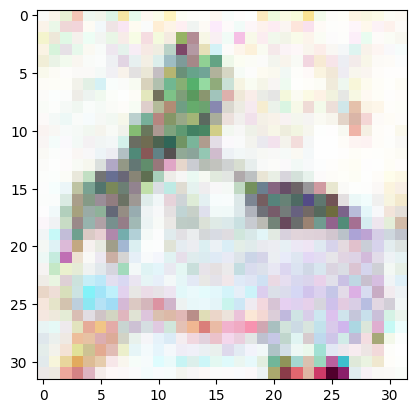

[342/500][0/936]	Loss_D: 0.0055	Loss_G: 7.7061	D(x): 1.0000	D(G(z)): 0.0055 / 0.0045
[342/500][15/936]	Loss_D: 0.0052	Loss_G: 5.5339	D(x): 1.0000	D(G(z)): 0.0052 / 0.0040
[342/500][30/936]	Loss_D: 0.0245	Loss_G: 4.9263	D(x): 0.9953	D(G(z)): 0.0196 / 0.0079
[342/500][45/936]	Loss_D: 0.0004	Loss_G: 8.7897	D(x): 0.9999	D(G(z)): 0.0004 / 0.0003
[342/500][60/936]	Loss_D: 0.0137	Loss_G: 4.9940	D(x): 1.0000	D(G(z)): 0.0136 / 0.0091
[342/500][75/936]	Loss_D: 0.0001	Loss_G: 13.5015	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[342/500][90/936]	Loss_D: 0.0005	Loss_G: 8.7059	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[342/500][105/936]	Loss_D: 0.0016	Loss_G: 6.6822	D(x): 1.0000	D(G(z)): 0.0016 / 0.0013
[342/500][120/936]	Loss_D: 0.0000	Loss_G: 22.3249	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[342/500][135/936]	Loss_D: 0.0825	Loss_G: 5.4286	D(x): 1.0000	D(G(z)): 0.0755 / 0.0087
[342/500][150/936]	Loss_D: 0.0143	Loss_G: 6.0210	D(x): 1.0000	D(G(z)): 0.0141 / 0.0042
[342/500][165/936]	Loss_D: 0.0024	Loss_G: 6.5027	

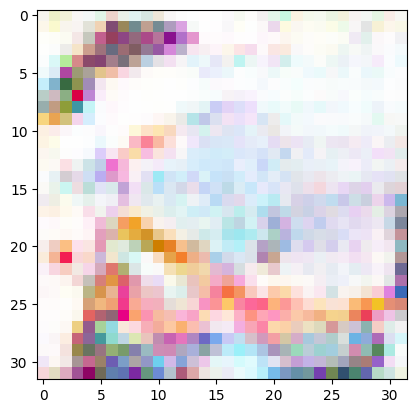

[343/500][0/936]	Loss_D: 0.0034	Loss_G: 7.1950	D(x): 1.0000	D(G(z)): 0.0034 / 0.0030
[343/500][15/936]	Loss_D: 0.0003	Loss_G: 9.1321	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[343/500][30/936]	Loss_D: 0.0007	Loss_G: 9.2753	D(x): 1.0000	D(G(z)): 0.0007 / 0.0001
[343/500][45/936]	Loss_D: 0.0000	Loss_G: 15.4383	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[343/500][60/936]	Loss_D: 0.0951	Loss_G: 4.7058	D(x): 1.0000	D(G(z)): 0.0853 / 0.0097
[343/500][75/936]	Loss_D: 0.0000	Loss_G: 13.1897	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[343/500][90/936]	Loss_D: 0.0010	Loss_G: 10.8180	D(x): 1.0000	D(G(z)): 0.0010 / 0.0003
[343/500][105/936]	Loss_D: 0.0026	Loss_G: 7.2741	D(x): 1.0000	D(G(z)): 0.0026 / 0.0020
[343/500][120/936]	Loss_D: 0.0001	Loss_G: 15.5518	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[343/500][135/936]	Loss_D: 0.0000	Loss_G: 11.2234	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[343/500][150/936]	Loss_D: 0.0178	Loss_G: 6.8416	D(x): 1.0000	D(G(z)): 0.0172 / 0.0036
[343/500][165/936]	Loss_D: 0.0024	Loss_G: 6.15

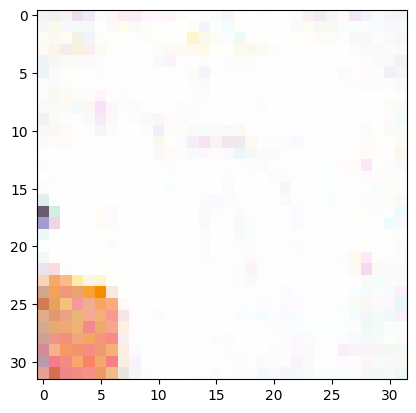

[344/500][0/936]	Loss_D: 1.1864	Loss_G: 15.9038	D(x): 1.0000	D(G(z)): 0.5871 / 0.0000
[344/500][15/936]	Loss_D: 1.7918	Loss_G: 17.3846	D(x): 0.7502	D(G(z)): 0.0000 / 0.0000
[344/500][30/936]	Loss_D: 0.0044	Loss_G: 6.6623	D(x): 1.0000	D(G(z)): 0.0044 / 0.0037
[344/500][45/936]	Loss_D: 0.0000	Loss_G: 12.8886	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[344/500][60/936]	Loss_D: 0.5246	Loss_G: 2.0667	D(x): 0.6939	D(G(z)): 0.0085 / 0.2234
[344/500][75/936]	Loss_D: 0.0403	Loss_G: 6.7095	D(x): 0.9658	D(G(z)): 0.0035 / 0.0053
[344/500][90/936]	Loss_D: 0.0029	Loss_G: 8.1136	D(x): 0.9980	D(G(z)): 0.0009 / 0.0008
[344/500][105/936]	Loss_D: 0.0115	Loss_G: 3.9798	D(x): 0.9998	D(G(z)): 0.0112 / 0.0360
[344/500][120/936]	Loss_D: 0.0000	Loss_G: 11.3272	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[344/500][135/936]	Loss_D: 0.0007	Loss_G: 7.5163	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[344/500][150/936]	Loss_D: 0.0000	Loss_G: 10.6239	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[344/500][165/936]	Loss_D: 0.0008	Loss_G: 7.54

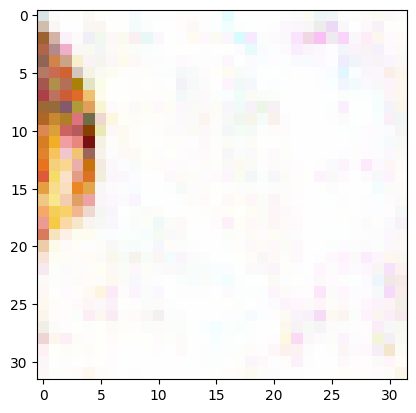

[345/500][0/936]	Loss_D: 0.0206	Loss_G: 3.5644	D(x): 1.0000	D(G(z)): 0.0203 / 0.0403
[345/500][15/936]	Loss_D: 0.0141	Loss_G: 5.0925	D(x): 0.9952	D(G(z)): 0.0092 / 0.0069
[345/500][30/936]	Loss_D: 0.0705	Loss_G: 5.9697	D(x): 0.9435	D(G(z)): 0.0068 / 0.0076
[345/500][45/936]	Loss_D: 0.0408	Loss_G: 7.4255	D(x): 0.9629	D(G(z)): 0.0007 / 0.0009
[345/500][60/936]	Loss_D: 0.0201	Loss_G: 3.6431	D(x): 1.0000	D(G(z)): 0.0198 / 0.0267
[345/500][75/936]	Loss_D: 0.0011	Loss_G: 7.8177	D(x): 1.0000	D(G(z)): 0.0011 / 0.0011
[345/500][90/936]	Loss_D: 0.0023	Loss_G: 8.4854	D(x): 1.0000	D(G(z)): 0.0023 / 0.0015
[345/500][105/936]	Loss_D: 0.0009	Loss_G: 7.9633	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[345/500][120/936]	Loss_D: 0.0006	Loss_G: 7.6748	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[345/500][135/936]	Loss_D: 0.0003	Loss_G: 8.9179	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[345/500][150/936]	Loss_D: 0.0001	Loss_G: 9.5090	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[345/500][165/936]	Loss_D: 0.0015	Loss_G: 8.8233	D(

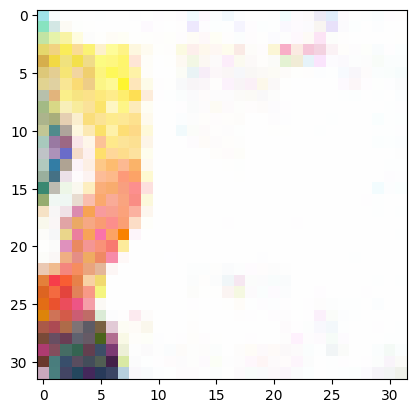

[346/500][0/936]	Loss_D: 0.4437	Loss_G: 7.4123	D(x): 1.0000	D(G(z)): 0.3340 / 0.0057
[346/500][15/936]	Loss_D: 0.0019	Loss_G: 10.2150	D(x): 0.9995	D(G(z)): 0.0014 / 0.0012
[346/500][30/936]	Loss_D: 0.0061	Loss_G: 6.6128	D(x): 0.9999	D(G(z)): 0.0060 / 0.0044
[346/500][45/936]	Loss_D: 0.0082	Loss_G: 5.8463	D(x): 1.0000	D(G(z)): 0.0082 / 0.0042
[346/500][60/936]	Loss_D: 0.0059	Loss_G: 6.1522	D(x): 1.0000	D(G(z)): 0.0059 / 0.0024
[346/500][75/936]	Loss_D: 0.0192	Loss_G: 5.8705	D(x): 0.9865	D(G(z)): 0.0054 / 0.0042
[346/500][90/936]	Loss_D: 0.0003	Loss_G: 11.5688	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[346/500][105/936]	Loss_D: 0.0029	Loss_G: 6.2512	D(x): 1.0000	D(G(z)): 0.0029 / 0.0022
[346/500][120/936]	Loss_D: 0.0002	Loss_G: 9.2092	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[346/500][135/936]	Loss_D: 0.0000	Loss_G: 22.2114	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[346/500][150/936]	Loss_D: 0.0000	Loss_G: 18.5643	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[346/500][165/936]	Loss_D: 0.0012	Loss_G: 8.275

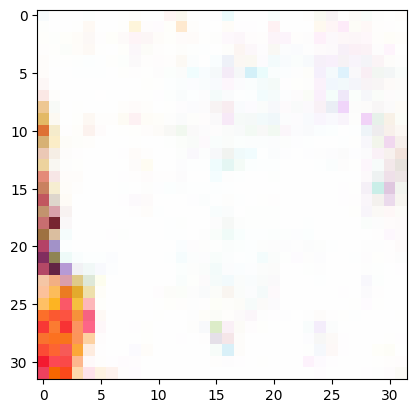

[347/500][0/936]	Loss_D: 0.0003	Loss_G: 8.7370	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[347/500][15/936]	Loss_D: 0.0024	Loss_G: 6.5988	D(x): 1.0000	D(G(z)): 0.0023 / 0.0019
[347/500][30/936]	Loss_D: 0.0033	Loss_G: 5.9897	D(x): 1.0000	D(G(z)): 0.0033 / 0.0028
[347/500][45/936]	Loss_D: 0.0007	Loss_G: 9.3631	D(x): 0.9996	D(G(z)): 0.0002 / 0.0001
[347/500][60/936]	Loss_D: 0.0672	Loss_G: 5.5478	D(x): 1.0000	D(G(z)): 0.0646 / 0.0061
[347/500][75/936]	Loss_D: 0.0000	Loss_G: 14.6052	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[347/500][90/936]	Loss_D: 0.0044	Loss_G: 5.6805	D(x): 1.0000	D(G(z)): 0.0044 / 0.0036
[347/500][105/936]	Loss_D: 0.0002	Loss_G: 24.3315	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[347/500][120/936]	Loss_D: 0.0005	Loss_G: 17.2939	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[347/500][135/936]	Loss_D: 0.0001	Loss_G: 14.1971	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[347/500][150/936]	Loss_D: 0.0000	Loss_G: 22.7516	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[347/500][165/936]	Loss_D: 1.5615	Loss_G: 13.2

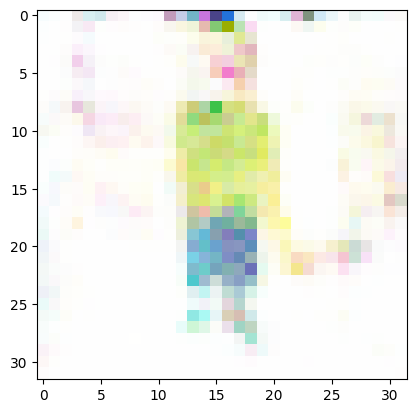

[348/500][0/936]	Loss_D: 0.0025	Loss_G: 6.1685	D(x): 1.0000	D(G(z)): 0.0025 / 0.0024
[348/500][15/936]	Loss_D: 0.0000	Loss_G: 10.1482	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[348/500][30/936]	Loss_D: 0.0007	Loss_G: 8.0385	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[348/500][45/936]	Loss_D: 0.0000	Loss_G: 11.7430	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[348/500][60/936]	Loss_D: 0.0001	Loss_G: 14.9955	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[348/500][75/936]	Loss_D: 0.0000	Loss_G: 15.1488	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[348/500][90/936]	Loss_D: 0.0000	Loss_G: 15.2418	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[348/500][105/936]	Loss_D: 0.0014	Loss_G: 6.6624	D(x): 1.0000	D(G(z)): 0.0014 / 0.0014
[348/500][120/936]	Loss_D: 0.0013	Loss_G: 7.2519	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[348/500][135/936]	Loss_D: 0.0001	Loss_G: 10.2131	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[348/500][150/936]	Loss_D: 0.0003	Loss_G: 8.2839	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[348/500][165/936]	Loss_D: 0.0007	Loss_G: 7.9

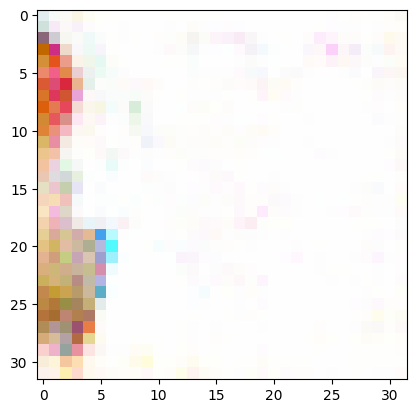

[349/500][0/936]	Loss_D: 0.0988	Loss_G: 3.3046	D(x): 1.0000	D(G(z)): 0.0886 / 0.1060
[349/500][15/936]	Loss_D: 0.0111	Loss_G: 5.8128	D(x): 1.0000	D(G(z)): 0.0110 / 0.0052
[349/500][30/936]	Loss_D: 0.0023	Loss_G: 6.7183	D(x): 1.0000	D(G(z)): 0.0023 / 0.0014
[349/500][45/936]	Loss_D: 0.0069	Loss_G: 5.5888	D(x): 1.0000	D(G(z)): 0.0068 / 0.0052
[349/500][60/936]	Loss_D: 0.0030	Loss_G: 6.6513	D(x): 1.0000	D(G(z)): 0.0030 / 0.0024
[349/500][75/936]	Loss_D: 0.0587	Loss_G: 18.3685	D(x): 0.9448	D(G(z)): 0.0000 / 0.0000
[349/500][90/936]	Loss_D: 0.0001	Loss_G: 9.8063	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[349/500][105/936]	Loss_D: 0.0000	Loss_G: 12.3803	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[349/500][120/936]	Loss_D: 0.0013	Loss_G: 6.8360	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[349/500][135/936]	Loss_D: 0.0032	Loss_G: 5.9619	D(x): 1.0000	D(G(z)): 0.0032 / 0.0029
[349/500][150/936]	Loss_D: 0.0009	Loss_G: 7.1022	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[349/500][165/936]	Loss_D: 0.0008	Loss_G: 7.2270	

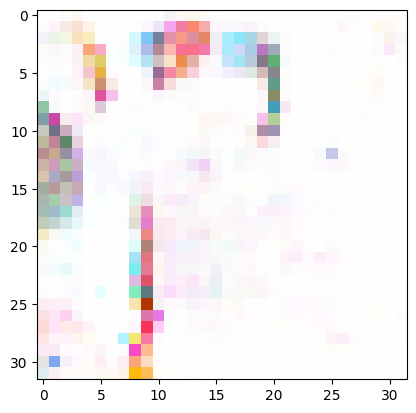

[350/500][0/936]	Loss_D: 0.0000	Loss_G: 10.2632	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[350/500][15/936]	Loss_D: 0.0000	Loss_G: 10.6956	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[350/500][30/936]	Loss_D: 0.0012	Loss_G: 6.8943	D(x): 1.0000	D(G(z)): 0.0012 / 0.0011
[350/500][45/936]	Loss_D: 0.0000	Loss_G: 10.2469	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[350/500][60/936]	Loss_D: 0.0067	Loss_G: 5.4383	D(x): 1.0000	D(G(z)): 0.0067 / 0.0051
[350/500][75/936]	Loss_D: 0.0002	Loss_G: 8.5095	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[350/500][90/936]	Loss_D: 0.0003	Loss_G: 8.1532	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[350/500][105/936]	Loss_D: 0.0090	Loss_G: 5.5174	D(x): 1.0000	D(G(z)): 0.0089 / 0.0057
[350/500][120/936]	Loss_D: 0.0013	Loss_G: 6.7834	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[350/500][135/936]	Loss_D: 0.0007	Loss_G: 7.5761	D(x): 1.0000	D(G(z)): 0.0007 / 0.0005
[350/500][150/936]	Loss_D: 0.0387	Loss_G: 5.2460	D(x): 1.0000	D(G(z)): 0.0375 / 0.0062
[350/500][165/936]	Loss_D: 0.0523	Loss_G: 3.4501

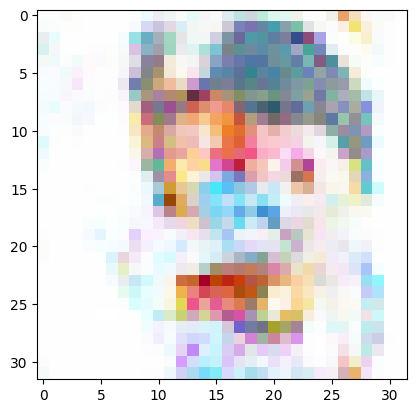

[351/500][0/936]	Loss_D: 0.0038	Loss_G: 6.0683	D(x): 1.0000	D(G(z)): 0.0038 / 0.0033
[351/500][15/936]	Loss_D: 0.0013	Loss_G: 8.3340	D(x): 0.9991	D(G(z)): 0.0004 / 0.0004
[351/500][30/936]	Loss_D: 0.0009	Loss_G: 7.3293	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[351/500][45/936]	Loss_D: 0.0133	Loss_G: 5.4029	D(x): 1.0000	D(G(z)): 0.0131 / 0.0076
[351/500][60/936]	Loss_D: 0.0011	Loss_G: 7.4144	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[351/500][75/936]	Loss_D: 0.0056	Loss_G: 6.6635	D(x): 1.0000	D(G(z)): 0.0055 / 0.0036
[351/500][90/936]	Loss_D: 0.0028	Loss_G: 6.0954	D(x): 1.0000	D(G(z)): 0.0028 / 0.0024
[351/500][105/936]	Loss_D: 0.0037	Loss_G: 6.3478	D(x): 1.0000	D(G(z)): 0.0037 / 0.0027
[351/500][120/936]	Loss_D: 0.0290	Loss_G: 4.8847	D(x): 1.0000	D(G(z)): 0.0283 / 0.0094
[351/500][135/936]	Loss_D: 0.0048	Loss_G: 5.7114	D(x): 1.0000	D(G(z)): 0.0048 / 0.0034
[351/500][150/936]	Loss_D: 0.0043	Loss_G: 14.9886	D(x): 0.9958	D(G(z)): 0.0001 / 0.0001
[351/500][165/936]	Loss_D: 0.0000	Loss_G: 14.4650	

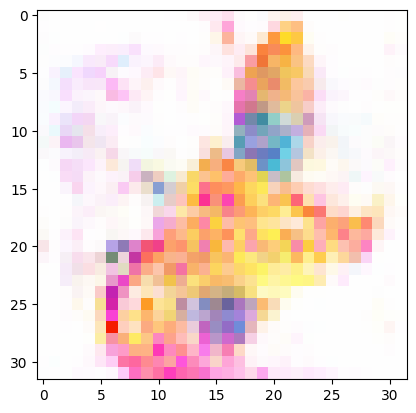

[352/500][0/936]	Loss_D: 0.0745	Loss_G: 5.5894	D(x): 0.9962	D(G(z)): 0.0667 / 0.0045
[352/500][15/936]	Loss_D: 0.0000	Loss_G: 13.7598	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[352/500][30/936]	Loss_D: 0.0001	Loss_G: 11.0357	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[352/500][45/936]	Loss_D: 0.0001	Loss_G: 9.9627	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[352/500][60/936]	Loss_D: 0.0042	Loss_G: 5.9341	D(x): 1.0000	D(G(z)): 0.0042 / 0.0027
[352/500][75/936]	Loss_D: 0.0054	Loss_G: 5.5161	D(x): 1.0000	D(G(z)): 0.0054 / 0.0044
[352/500][90/936]	Loss_D: 0.0032	Loss_G: 6.4151	D(x): 1.0000	D(G(z)): 0.0032 / 0.0018
[352/500][105/936]	Loss_D: 0.0003	Loss_G: 8.3484	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[352/500][120/936]	Loss_D: 0.0009	Loss_G: 7.2514	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[352/500][135/936]	Loss_D: 0.0001	Loss_G: 9.5288	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[352/500][150/936]	Loss_D: 0.0006	Loss_G: 8.4451	D(x): 0.9997	D(G(z)): 0.0003 / 0.0003
[352/500][165/936]	Loss_D: 0.0043	Loss_G: 6.1373	

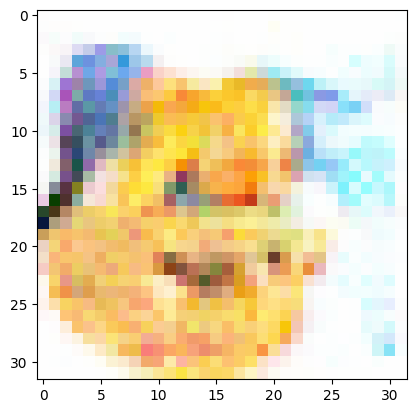

[353/500][0/936]	Loss_D: 0.0007	Loss_G: 10.1217	D(x): 1.0000	D(G(z)): 0.0007 / 0.0201
[353/500][15/936]	Loss_D: 0.0258	Loss_G: 6.6343	D(x): 1.0000	D(G(z)): 0.0249 / 0.0037
[353/500][30/936]	Loss_D: 0.0000	Loss_G: 13.8242	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[353/500][45/936]	Loss_D: 0.0079	Loss_G: 8.5881	D(x): 1.0000	D(G(z)): 0.0078 / 0.0018
[353/500][60/936]	Loss_D: 0.0103	Loss_G: 6.8885	D(x): 1.0000	D(G(z)): 0.0102 / 0.0048
[353/500][75/936]	Loss_D: 0.0073	Loss_G: 5.6297	D(x): 1.0000	D(G(z)): 0.0073 / 0.0049
[353/500][90/936]	Loss_D: 0.4000	Loss_G: 5.3191	D(x): 0.7673	D(G(z)): 0.0007 / 0.0052
[353/500][105/936]	Loss_D: 0.0004	Loss_G: 8.2506	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[353/500][120/936]	Loss_D: 0.0034	Loss_G: 5.8941	D(x): 1.0000	D(G(z)): 0.0034 / 0.0029
[353/500][135/936]	Loss_D: 0.0045	Loss_G: 5.6678	D(x): 0.9999	D(G(z)): 0.0044 / 0.0037
[353/500][150/936]	Loss_D: 0.0027	Loss_G: 6.1894	D(x): 0.9999	D(G(z)): 0.0026 / 0.0023
[353/500][165/936]	Loss_D: 0.0012	Loss_G: 7.0742	

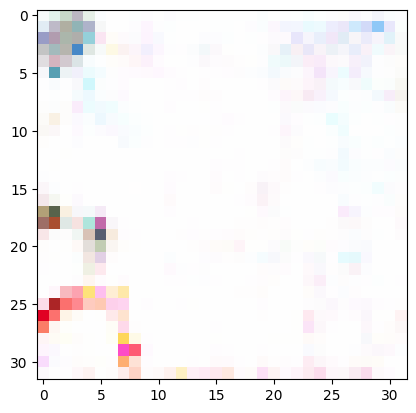

[354/500][0/936]	Loss_D: 0.0000	Loss_G: 11.5683	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[354/500][15/936]	Loss_D: 0.0005	Loss_G: 8.1237	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[354/500][30/936]	Loss_D: 0.0002	Loss_G: 8.6408	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[354/500][45/936]	Loss_D: 0.0004	Loss_G: 8.1298	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[354/500][60/936]	Loss_D: 0.0026	Loss_G: 6.9848	D(x): 1.0000	D(G(z)): 0.0026 / 0.0023
[354/500][75/936]	Loss_D: 0.0004	Loss_G: 8.0940	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[354/500][90/936]	Loss_D: 0.0003	Loss_G: 8.5342	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[354/500][105/936]	Loss_D: 0.0050	Loss_G: 6.6757	D(x): 1.0000	D(G(z)): 0.0050 / 0.0041
[354/500][120/936]	Loss_D: 0.0004	Loss_G: 8.3468	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[354/500][135/936]	Loss_D: 0.0024	Loss_G: 6.2108	D(x): 1.0000	D(G(z)): 0.0024 / 0.0027
[354/500][150/936]	Loss_D: 0.0001	Loss_G: 9.9029	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[354/500][165/936]	Loss_D: 0.0001	Loss_G: 9.8088	D

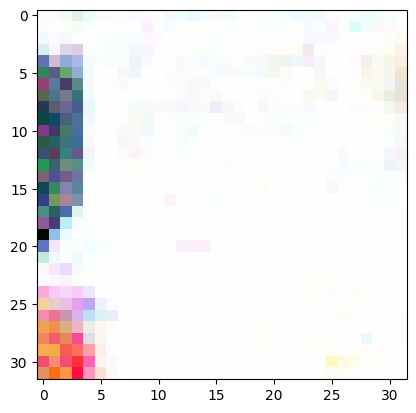

[355/500][0/936]	Loss_D: 0.6387	Loss_G: 19.3074	D(x): 1.0000	D(G(z)): 0.4623 / 0.0000
[355/500][15/936]	Loss_D: 0.0089	Loss_G: 19.1670	D(x): 1.0000	D(G(z)): 0.0088 / 0.0056
[355/500][30/936]	Loss_D: 0.0427	Loss_G: 18.1937	D(x): 1.0000	D(G(z)): 0.0409 / 0.0120
[355/500][45/936]	Loss_D: 0.0001	Loss_G: 13.4618	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[355/500][60/936]	Loss_D: 0.0001	Loss_G: 9.8977	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[355/500][75/936]	Loss_D: 0.0003	Loss_G: 9.0726	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[355/500][90/936]	Loss_D: 0.0016	Loss_G: 6.6452	D(x): 1.0000	D(G(z)): 0.0016 / 0.0014
[355/500][105/936]	Loss_D: 0.0073	Loss_G: 5.5960	D(x): 1.0000	D(G(z)): 0.0072 / 0.0043
[355/500][120/936]	Loss_D: 0.0000	Loss_G: 11.8202	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[355/500][135/936]	Loss_D: 0.0017	Loss_G: 7.4057	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[355/500][150/936]	Loss_D: 0.0000	Loss_G: 11.0023	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[355/500][165/936]	Loss_D: 0.0248	Loss_G: 6.7

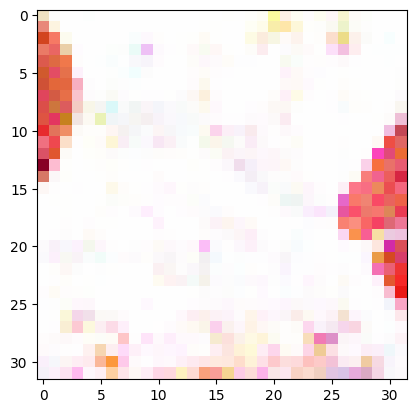

[356/500][0/936]	Loss_D: 0.0431	Loss_G: 7.5481	D(x): 1.0000	D(G(z)): 0.0410 / 0.0028
[356/500][15/936]	Loss_D: 0.0005	Loss_G: 10.9585	D(x): 1.0000	D(G(z)): 0.0005 / 0.0003
[356/500][30/936]	Loss_D: 0.0011	Loss_G: 7.8359	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[356/500][45/936]	Loss_D: 0.0282	Loss_G: 4.6020	D(x): 1.0000	D(G(z)): 0.0276 / 0.0123
[356/500][60/936]	Loss_D: 0.0051	Loss_G: 6.0170	D(x): 1.0000	D(G(z)): 0.0051 / 0.0042
[356/500][75/936]	Loss_D: 0.0003	Loss_G: 18.3776	D(x): 0.9997	D(G(z)): 0.0000 / 0.0000
[356/500][90/936]	Loss_D: 0.0021	Loss_G: 6.5408	D(x): 1.0000	D(G(z)): 0.0021 / 0.0018
[356/500][105/936]	Loss_D: 0.0000	Loss_G: 26.4325	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[356/500][120/936]	Loss_D: 0.0000	Loss_G: 17.2408	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[356/500][135/936]	Loss_D: 0.0001	Loss_G: 13.7203	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[356/500][150/936]	Loss_D: 0.0003	Loss_G: 8.8467	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[356/500][165/936]	Loss_D: 0.0001	Loss_G: 10.3

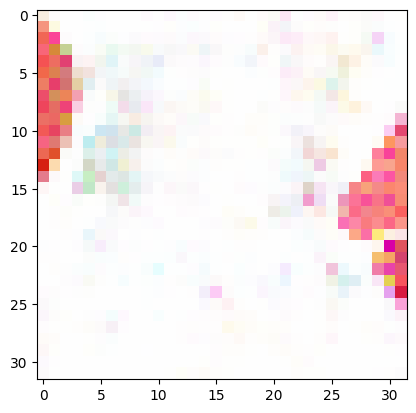

[357/500][0/936]	Loss_D: 0.0000	Loss_G: 10.9899	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[357/500][15/936]	Loss_D: 0.0002	Loss_G: 10.6766	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[357/500][30/936]	Loss_D: 0.0025	Loss_G: 7.7153	D(x): 1.0000	D(G(z)): 0.0025 / 0.0014
[357/500][45/936]	Loss_D: 0.0008	Loss_G: 7.5915	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[357/500][60/936]	Loss_D: 0.0007	Loss_G: 7.5582	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[357/500][75/936]	Loss_D: 0.0027	Loss_G: 6.1977	D(x): 1.0000	D(G(z)): 0.0026 / 0.0022
[357/500][90/936]	Loss_D: 0.0096	Loss_G: 5.2130	D(x): 1.0000	D(G(z)): 0.0095 / 0.0069
[357/500][105/936]	Loss_D: 0.0014	Loss_G: 7.0162	D(x): 0.9998	D(G(z)): 0.0012 / 0.0011
[357/500][120/936]	Loss_D: 0.0081	Loss_G: 5.5259	D(x): 0.9966	D(G(z)): 0.0047 / 0.0041
[357/500][135/936]	Loss_D: 0.0075	Loss_G: 5.8504	D(x): 1.0000	D(G(z)): 0.0074 / 0.0045
[357/500][150/936]	Loss_D: 0.0065	Loss_G: 6.2266	D(x): 1.0000	D(G(z)): 0.0065 / 0.0052
[357/500][165/936]	Loss_D: 0.0085	Loss_G: 5.1814	

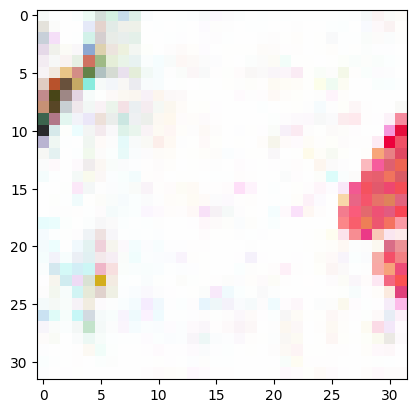

[358/500][0/936]	Loss_D: 0.0068	Loss_G: 5.3192	D(x): 1.0000	D(G(z)): 0.0068 / 0.0054
[358/500][15/936]	Loss_D: 0.0029	Loss_G: 7.2275	D(x): 1.0000	D(G(z)): 0.0029 / 0.0021
[358/500][30/936]	Loss_D: 0.0242	Loss_G: 5.2824	D(x): 1.0000	D(G(z)): 0.0236 / 0.0056
[358/500][45/936]	Loss_D: 0.0022	Loss_G: 6.6281	D(x): 1.0000	D(G(z)): 0.0022 / 0.0017
[358/500][60/936]	Loss_D: 0.0008	Loss_G: 8.1904	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[358/500][75/936]	Loss_D: 0.0032	Loss_G: 6.2536	D(x): 0.9996	D(G(z)): 0.0028 / 0.0024
[358/500][90/936]	Loss_D: 0.0104	Loss_G: 5.2696	D(x): 1.0000	D(G(z)): 0.0103 / 0.0071
[358/500][105/936]	Loss_D: 0.0009	Loss_G: 7.5806	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[358/500][120/936]	Loss_D: 0.0742	Loss_G: 5.1517	D(x): 1.0000	D(G(z)): 0.0705 / 0.0071
[358/500][135/936]	Loss_D: 0.0078	Loss_G: 5.5476	D(x): 1.0000	D(G(z)): 0.0077 / 0.0060
[358/500][150/936]	Loss_D: 0.0047	Loss_G: 5.8163	D(x): 1.0000	D(G(z)): 0.0047 / 0.0041
[358/500][165/936]	Loss_D: 0.0043	Loss_G: 12.5123	D

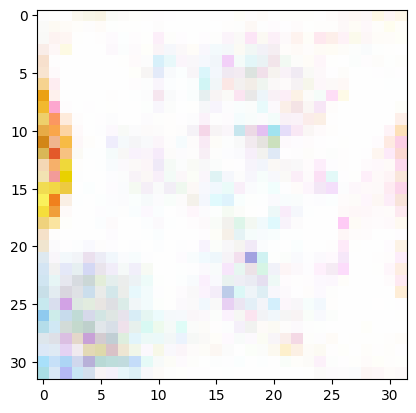

[359/500][0/936]	Loss_D: 0.0113	Loss_G: 4.9100	D(x): 1.0000	D(G(z)): 0.0112 / 0.0074
[359/500][15/936]	Loss_D: 0.0002	Loss_G: 8.9064	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[359/500][30/936]	Loss_D: 0.0157	Loss_G: 5.1245	D(x): 1.0000	D(G(z)): 0.0155 / 0.0096
[359/500][45/936]	Loss_D: 0.0079	Loss_G: 5.4050	D(x): 1.0000	D(G(z)): 0.0079 / 0.0049
[359/500][60/936]	Loss_D: 0.0022	Loss_G: 6.6005	D(x): 1.0000	D(G(z)): 0.0022 / 0.0018
[359/500][75/936]	Loss_D: 0.0005	Loss_G: 7.6951	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[359/500][90/936]	Loss_D: 0.0034	Loss_G: 5.8801	D(x): 1.0000	D(G(z)): 0.0034 / 0.0028
[359/500][105/936]	Loss_D: 0.0002	Loss_G: 27.6257	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[359/500][120/936]	Loss_D: 0.0001	Loss_G: 22.0880	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[359/500][135/936]	Loss_D: 0.0000	Loss_G: 26.0127	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[359/500][150/936]	Loss_D: 0.0010	Loss_G: 15.9787	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[359/500][165/936]	Loss_D: 0.0002	Loss_G: 11.87

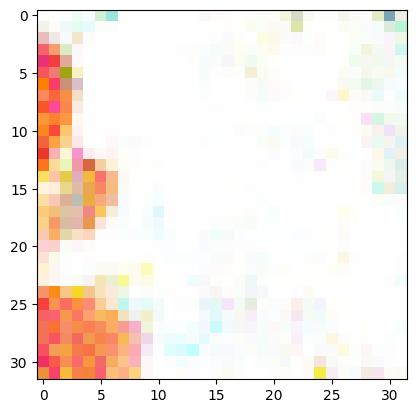

[360/500][0/936]	Loss_D: 0.0070	Loss_G: 6.9835	D(x): 1.0000	D(G(z)): 0.0070 / 0.0019
[360/500][15/936]	Loss_D: 0.0022	Loss_G: 9.9877	D(x): 0.9979	D(G(z)): 0.0001 / 0.0001
[360/500][30/936]	Loss_D: 0.0001	Loss_G: 10.5388	D(x): 1.0000	D(G(z)): 0.0001 / 0.0002
[360/500][45/936]	Loss_D: 0.0133	Loss_G: 7.9755	D(x): 0.9877	D(G(z)): 0.0008 / 0.0008
[360/500][60/936]	Loss_D: 0.0744	Loss_G: 6.1181	D(x): 0.9324	D(G(z)): 0.0009 / 0.0024
[360/500][75/936]	Loss_D: 0.0132	Loss_G: 10.6560	D(x): 0.9870	D(G(z)): 0.0000 / 0.0000
[360/500][90/936]	Loss_D: 0.0000	Loss_G: 21.6537	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[360/500][105/936]	Loss_D: 0.0000	Loss_G: 17.8596	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[360/500][120/936]	Loss_D: 0.0000	Loss_G: 11.1125	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[360/500][135/936]	Loss_D: 0.0028	Loss_G: 6.4977	D(x): 1.0000	D(G(z)): 0.0028 / 0.0028
[360/500][150/936]	Loss_D: 0.0000	Loss_G: 11.8380	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[360/500][165/936]	Loss_D: 0.0044	Loss_G: 5.9

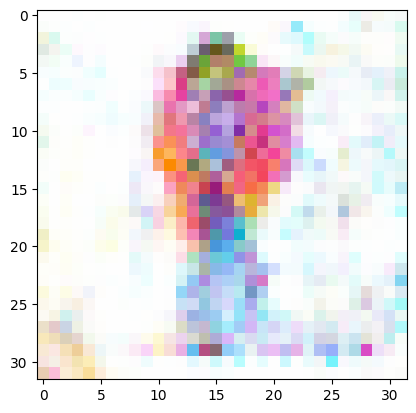

[361/500][0/936]	Loss_D: 0.1025	Loss_G: 5.4510	D(x): 1.0000	D(G(z)): 0.0892 / 0.0127
[361/500][15/936]	Loss_D: 0.0189	Loss_G: 5.4422	D(x): 1.0000	D(G(z)): 0.0186 / 0.0074
[361/500][30/936]	Loss_D: 0.0025	Loss_G: 12.4192	D(x): 0.9999	D(G(z)): 0.0024 / 0.0020
[361/500][45/936]	Loss_D: 0.0122	Loss_G: 7.5124	D(x): 0.9999	D(G(z)): 0.0119 / 0.0067
[361/500][60/936]	Loss_D: 0.0263	Loss_G: 4.9368	D(x): 1.0000	D(G(z)): 0.0258 / 0.0074
[361/500][75/936]	Loss_D: 0.0234	Loss_G: 7.0716	D(x): 0.9786	D(G(z)): 0.0011 / 0.0013
[361/500][90/936]	Loss_D: 0.0009	Loss_G: 8.0013	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[361/500][105/936]	Loss_D: 0.0002	Loss_G: 13.5343	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[361/500][120/936]	Loss_D: 0.0021	Loss_G: 14.3451	D(x): 0.9979	D(G(z)): 0.0000 / 0.0000
[361/500][135/936]	Loss_D: 0.0000	Loss_G: 13.7922	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[361/500][150/936]	Loss_D: 0.0033	Loss_G: 7.5411	D(x): 1.0000	D(G(z)): 0.0033 / 0.0019
[361/500][165/936]	Loss_D: 0.0042	Loss_G: 6.600

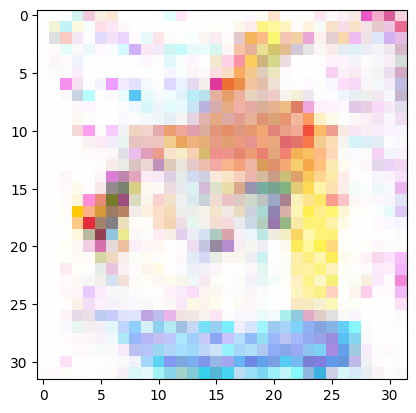

[362/500][0/936]	Loss_D: 0.0002	Loss_G: 10.3325	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[362/500][15/936]	Loss_D: 0.0109	Loss_G: 12.0174	D(x): 0.9895	D(G(z)): 0.0001 / 0.0001
[362/500][30/936]	Loss_D: 0.0027	Loss_G: 7.1512	D(x): 0.9997	D(G(z)): 0.0024 / 0.0019
[362/500][45/936]	Loss_D: 0.0042	Loss_G: 10.9741	D(x): 0.9960	D(G(z)): 0.0002 / 0.0001
[362/500][60/936]	Loss_D: 0.0004	Loss_G: 10.0220	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[362/500][75/936]	Loss_D: 0.0002	Loss_G: 9.0502	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[362/500][90/936]	Loss_D: 0.0049	Loss_G: 9.1587	D(x): 0.9954	D(G(z)): 0.0003 / 0.0002
[362/500][105/936]	Loss_D: 0.0052	Loss_G: 5.8710	D(x): 1.0000	D(G(z)): 0.0052 / 0.0036
[362/500][120/936]	Loss_D: 0.1130	Loss_G: 8.7927	D(x): 1.0000	D(G(z)): 0.1061 / 0.0006
[362/500][135/936]	Loss_D: 0.0002	Loss_G: 11.4685	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[362/500][150/936]	Loss_D: 0.0336	Loss_G: 9.9828	D(x): 0.9686	D(G(z)): 0.0001 / 0.0001
[362/500][165/936]	Loss_D: 0.0001	Loss_G: 10.4

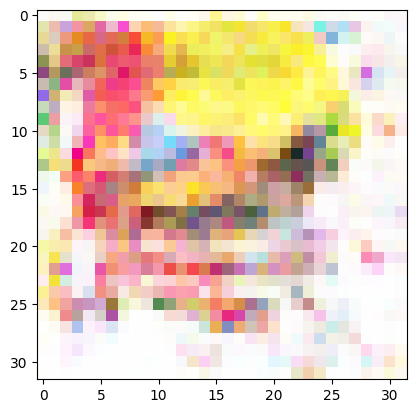

[363/500][0/936]	Loss_D: 0.0001	Loss_G: 10.9147	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[363/500][15/936]	Loss_D: 0.0000	Loss_G: 11.6974	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[363/500][30/936]	Loss_D: 0.0000	Loss_G: 16.8267	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[363/500][45/936]	Loss_D: 0.0015	Loss_G: 7.0457	D(x): 0.9997	D(G(z)): 0.0012 / 0.0011
[363/500][60/936]	Loss_D: 0.0008	Loss_G: 7.8176	D(x): 1.0000	D(G(z)): 0.0008 / 0.0005
[363/500][75/936]	Loss_D: 0.0029	Loss_G: 7.0848	D(x): 1.0000	D(G(z)): 0.0029 / 0.0017
[363/500][90/936]	Loss_D: 0.0200	Loss_G: 6.1214	D(x): 1.0000	D(G(z)): 0.0195 / 0.0046
[363/500][105/936]	Loss_D: 0.0085	Loss_G: 5.3731	D(x): 0.9996	D(G(z)): 0.0080 / 0.0050
[363/500][120/936]	Loss_D: 0.0020	Loss_G: 7.4027	D(x): 0.9998	D(G(z)): 0.0018 / 0.0016
[363/500][135/936]	Loss_D: 0.0000	Loss_G: 21.0796	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[363/500][150/936]	Loss_D: 0.0000	Loss_G: 13.7505	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[363/500][165/936]	Loss_D: 0.0033	Loss_G: 6.02

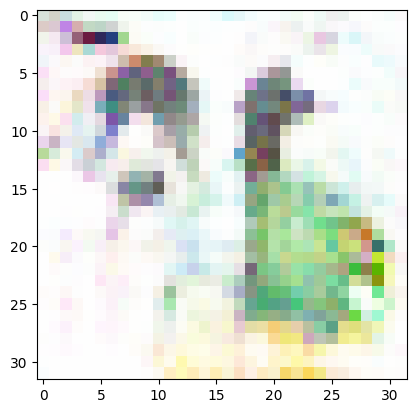

[364/500][0/936]	Loss_D: 0.1194	Loss_G: 3.3335	D(x): 0.9712	D(G(z)): 0.0758 / 0.1229
[364/500][15/936]	Loss_D: 0.0001	Loss_G: 10.9355	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[364/500][30/936]	Loss_D: 0.0049	Loss_G: 5.8241	D(x): 1.0000	D(G(z)): 0.0049 / 0.0036
[364/500][45/936]	Loss_D: 0.0046	Loss_G: 6.1902	D(x): 1.0000	D(G(z)): 0.0046 / 0.0028
[364/500][60/936]	Loss_D: 0.0142	Loss_G: 4.9446	D(x): 1.0000	D(G(z)): 0.0140 / 0.0073
[364/500][75/936]	Loss_D: 0.0390	Loss_G: 4.9824	D(x): 0.9726	D(G(z)): 0.0099 / 0.0076
[364/500][90/936]	Loss_D: 0.0018	Loss_G: 7.4894	D(x): 0.9995	D(G(z)): 0.0014 / 0.0010
[364/500][105/936]	Loss_D: 0.0001	Loss_G: 10.2172	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[364/500][120/936]	Loss_D: 0.0000	Loss_G: 17.8083	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[364/500][135/936]	Loss_D: 0.0001	Loss_G: 10.7526	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[364/500][150/936]	Loss_D: 0.0022	Loss_G: 6.8859	D(x): 0.9999	D(G(z)): 0.0022 / 0.0018
[364/500][165/936]	Loss_D: 0.0578	Loss_G: 5.095

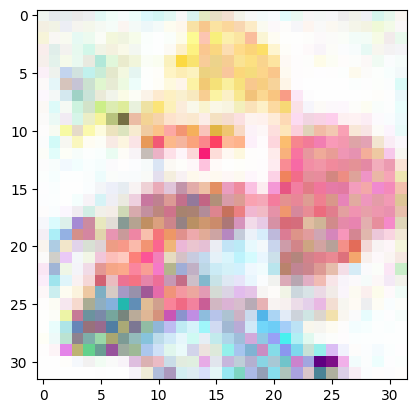

[365/500][0/936]	Loss_D: 0.0002	Loss_G: 10.9926	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[365/500][15/936]	Loss_D: 0.0093	Loss_G: 5.2264	D(x): 1.0000	D(G(z)): 0.0093 / 0.0061
[365/500][30/936]	Loss_D: 0.0094	Loss_G: 5.2249	D(x): 1.0000	D(G(z)): 0.0093 / 0.0062
[365/500][45/936]	Loss_D: 0.0006	Loss_G: 7.9878	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
[365/500][60/936]	Loss_D: 0.0000	Loss_G: 10.2087	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[365/500][75/936]	Loss_D: 0.0057	Loss_G: 5.5836	D(x): 1.0000	D(G(z)): 0.0057 / 0.0043
[365/500][90/936]	Loss_D: 0.0001	Loss_G: 10.4475	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[365/500][105/936]	Loss_D: 0.0004	Loss_G: 8.1920	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[365/500][120/936]	Loss_D: 0.0000	Loss_G: 16.6840	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[365/500][135/936]	Loss_D: 0.0000	Loss_G: 16.8331	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[365/500][150/936]	Loss_D: 0.0011	Loss_G: 7.7327	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[365/500][165/936]	Loss_D: 0.0008	Loss_G: 8.19

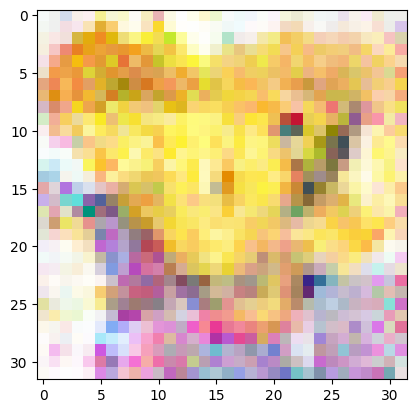

[366/500][0/936]	Loss_D: 0.0593	Loss_G: 6.5842	D(x): 0.9525	D(G(z)): 0.0071 / 0.0105
[366/500][15/936]	Loss_D: 0.0023	Loss_G: 6.5758	D(x): 1.0000	D(G(z)): 0.0023 / 0.0021
[366/500][30/936]	Loss_D: 0.0003	Loss_G: 11.7961	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[366/500][45/936]	Loss_D: 0.0003	Loss_G: 8.2624	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[366/500][60/936]	Loss_D: 0.0072	Loss_G: 6.3140	D(x): 1.0000	D(G(z)): 0.0071 / 0.0050
[366/500][75/936]	Loss_D: 0.1432	Loss_G: 8.4876	D(x): 0.8833	D(G(z)): 0.0001 / 0.0005
[366/500][90/936]	Loss_D: 0.0004	Loss_G: 8.7700	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[366/500][105/936]	Loss_D: 0.0019	Loss_G: 7.4956	D(x): 1.0000	D(G(z)): 0.0019 / 0.0010
[366/500][120/936]	Loss_D: 0.0012	Loss_G: 6.9701	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[366/500][135/936]	Loss_D: 0.0002	Loss_G: 8.7216	D(x): 1.0000	D(G(z)): 0.0002 / 0.0003
[366/500][150/936]	Loss_D: 0.0000	Loss_G: 9.7447	D(x): 1.0000	D(G(z)): 0.0000 / 0.0002
[366/500][165/936]	Loss_D: 0.0007	Loss_G: 9.0687	D

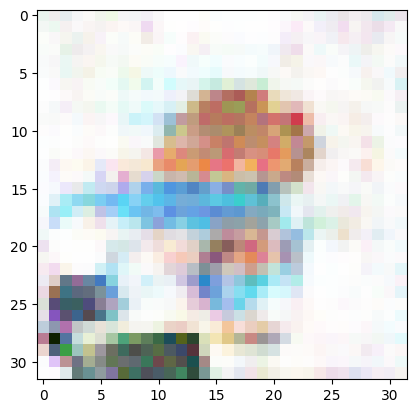

[367/500][0/936]	Loss_D: 0.0016	Loss_G: 9.6584	D(x): 0.9985	D(G(z)): 0.0001 / 0.0001
[367/500][15/936]	Loss_D: 0.0069	Loss_G: 5.3220	D(x): 1.0000	D(G(z)): 0.0069 / 0.0052
[367/500][30/936]	Loss_D: 0.0007	Loss_G: 7.4753	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[367/500][45/936]	Loss_D: 0.0016	Loss_G: 6.6004	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[367/500][60/936]	Loss_D: 0.0050	Loss_G: 5.5463	D(x): 1.0000	D(G(z)): 0.0050 / 0.0039
[367/500][75/936]	Loss_D: 0.0001	Loss_G: 14.0757	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[367/500][90/936]	Loss_D: 0.0041	Loss_G: 5.8250	D(x): 0.9992	D(G(z)): 0.0033 / 0.0030
[367/500][105/936]	Loss_D: 0.0028	Loss_G: 6.6161	D(x): 0.9995	D(G(z)): 0.0024 / 0.0020
[367/500][120/936]	Loss_D: 0.0064	Loss_G: 5.5779	D(x): 0.9998	D(G(z)): 0.0061 / 0.0050
[367/500][135/936]	Loss_D: 0.0040	Loss_G: 5.9295	D(x): 0.9994	D(G(z)): 0.0034 / 0.0029
[367/500][150/936]	Loss_D: 0.0192	Loss_G: 4.6411	D(x): 1.0000	D(G(z)): 0.0190 / 0.0100
[367/500][165/936]	Loss_D: 0.0157	Loss_G: 5.4259	D

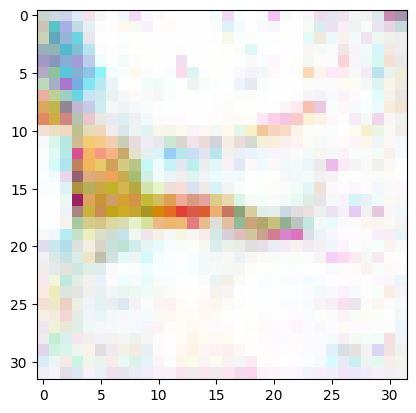

[368/500][0/936]	Loss_D: 0.0153	Loss_G: 5.2583	D(x): 1.0000	D(G(z)): 0.0150 / 0.0078
[368/500][15/936]	Loss_D: 0.0145	Loss_G: 5.9413	D(x): 1.0000	D(G(z)): 0.0144 / 0.0047
[368/500][30/936]	Loss_D: 0.0069	Loss_G: 5.3706	D(x): 1.0000	D(G(z)): 0.0069 / 0.0050
[368/500][45/936]	Loss_D: 0.0491	Loss_G: 4.8338	D(x): 0.9999	D(G(z)): 0.0477 / 0.0098
[368/500][60/936]	Loss_D: 0.0288	Loss_G: 5.0468	D(x): 1.0000	D(G(z)): 0.0282 / 0.0087
[368/500][75/936]	Loss_D: 0.0065	Loss_G: 5.5910	D(x): 1.0000	D(G(z)): 0.0064 / 0.0046
[368/500][90/936]	Loss_D: 0.0225	Loss_G: 4.6892	D(x): 1.0000	D(G(z)): 0.0222 / 0.0095
[368/500][105/936]	Loss_D: 0.0003	Loss_G: 8.7350	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[368/500][120/936]	Loss_D: 0.0007	Loss_G: 8.4585	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[368/500][135/936]	Loss_D: 0.0000	Loss_G: 12.9858	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[368/500][150/936]	Loss_D: 0.0125	Loss_G: 5.9005	D(x): 1.0000	D(G(z)): 0.0123 / 0.0078
[368/500][165/936]	Loss_D: 0.0013	Loss_G: 6.8986	D

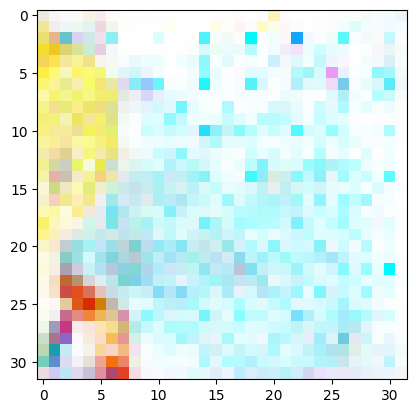

[369/500][0/936]	Loss_D: 0.0000	Loss_G: 14.1296	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[369/500][15/936]	Loss_D: 0.0024	Loss_G: 7.5726	D(x): 1.0000	D(G(z)): 0.0024 / 0.0021
[369/500][30/936]	Loss_D: 0.0650	Loss_G: 5.7844	D(x): 1.0000	D(G(z)): 0.0602 / 0.0040
[369/500][45/936]	Loss_D: 0.0072	Loss_G: 6.5017	D(x): 1.0000	D(G(z)): 0.0071 / 0.0023
[369/500][60/936]	Loss_D: 0.0002	Loss_G: 9.1046	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[369/500][75/936]	Loss_D: 0.0000	Loss_G: 13.8607	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[369/500][90/936]	Loss_D: 0.0001	Loss_G: 10.5676	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[369/500][105/936]	Loss_D: 0.0211	Loss_G: 3.7067	D(x): 1.0000	D(G(z)): 0.0207 / 0.0329
[369/500][120/936]	Loss_D: 0.0012	Loss_G: 18.6079	D(x): 0.9999	D(G(z)): 0.0011 / 0.0011
[369/500][135/936]	Loss_D: 0.0046	Loss_G: 20.1112	D(x): 1.0000	D(G(z)): 0.0045 / 0.0034
[369/500][150/936]	Loss_D: 0.0005	Loss_G: 24.2343	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[369/500][165/936]	Loss_D: 0.0001	Loss_G: 28.

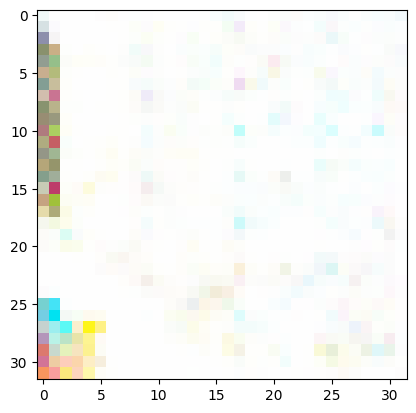

[370/500][0/936]	Loss_D: 1.9453	Loss_G: 20.0672	D(x): 1.0000	D(G(z)): 0.8184 / 0.0000
[370/500][15/936]	Loss_D: 0.0001	Loss_G: 10.8271	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[370/500][30/936]	Loss_D: 0.0115	Loss_G: 6.1703	D(x): 1.0000	D(G(z)): 0.0113 / 0.0078
[370/500][45/936]	Loss_D: 0.0042	Loss_G: 6.8149	D(x): 1.0000	D(G(z)): 0.0042 / 0.0027
[370/500][60/936]	Loss_D: 0.0000	Loss_G: 16.0890	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[370/500][75/936]	Loss_D: 0.0001	Loss_G: 12.2025	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[370/500][90/936]	Loss_D: 0.0000	Loss_G: 19.9392	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[370/500][105/936]	Loss_D: 0.0014	Loss_G: 11.3698	D(x): 0.9999	D(G(z)): 0.0013 / 0.0011
[370/500][120/936]	Loss_D: 0.0041	Loss_G: 6.3453	D(x): 0.9998	D(G(z)): 0.0039 / 0.0022
[370/500][135/936]	Loss_D: 0.0000	Loss_G: 25.9203	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[370/500][150/936]	Loss_D: 0.0005	Loss_G: 10.5685	D(x): 0.9999	D(G(z)): 0.0005 / 0.0004
[370/500][165/936]	Loss_D: 0.0359	Loss_G: 4

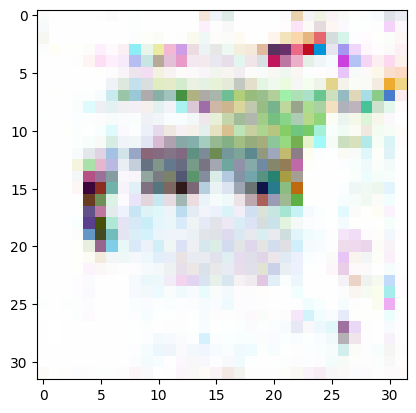

[371/500][0/936]	Loss_D: 0.0003	Loss_G: 10.0639	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[371/500][15/936]	Loss_D: 0.0001	Loss_G: 9.0003	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[371/500][30/936]	Loss_D: 0.0184	Loss_G: 5.5048	D(x): 0.9883	D(G(z)): 0.0063 / 0.0045
[371/500][45/936]	Loss_D: 0.0011	Loss_G: 7.0738	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[371/500][60/936]	Loss_D: 0.0078	Loss_G: 8.4571	D(x): 1.0000	D(G(z)): 0.0077 / 0.0122
[371/500][75/936]	Loss_D: 0.0040	Loss_G: 5.7951	D(x): 1.0000	D(G(z)): 0.0040 / 0.0034
[371/500][90/936]	Loss_D: 0.0006	Loss_G: 8.7725	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[371/500][105/936]	Loss_D: 0.0036	Loss_G: 6.7463	D(x): 1.0000	D(G(z)): 0.0036 / 0.0026
[371/500][120/936]	Loss_D: 0.0002	Loss_G: 8.5066	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[371/500][135/936]	Loss_D: 0.0000	Loss_G: 13.7356	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[371/500][150/936]	Loss_D: 0.0081	Loss_G: 5.3766	D(x): 1.0000	D(G(z)): 0.0080 / 0.0060
[371/500][165/936]	Loss_D: 0.0025	Loss_G: 10.9535

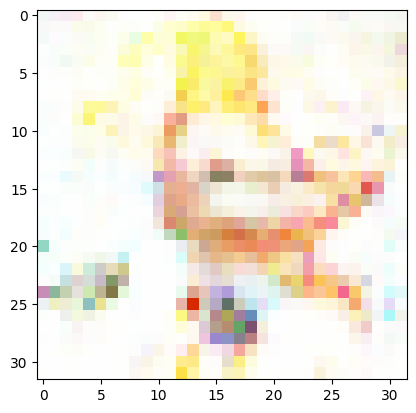

[372/500][0/936]	Loss_D: 0.0047	Loss_G: 5.9170	D(x): 1.0000	D(G(z)): 0.0046 / 0.0036
[372/500][15/936]	Loss_D: 0.0000	Loss_G: 14.4117	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[372/500][30/936]	Loss_D: 0.0003	Loss_G: 10.8237	D(x): 0.9997	D(G(z)): 0.0000 / 0.0000
[372/500][45/936]	Loss_D: 0.0001	Loss_G: 9.6441	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[372/500][60/936]	Loss_D: 0.0340	Loss_G: 6.7771	D(x): 0.9688	D(G(z)): 0.0011 / 0.0014
[372/500][75/936]	Loss_D: 0.0000	Loss_G: 11.3685	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[372/500][90/936]	Loss_D: 0.0016	Loss_G: 6.9838	D(x): 0.9994	D(G(z)): 0.0010 / 0.0010
[372/500][105/936]	Loss_D: 0.0004	Loss_G: 7.9523	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[372/500][120/936]	Loss_D: 0.0000	Loss_G: 12.3628	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[372/500][135/936]	Loss_D: 0.5779	Loss_G: 9.2396	D(x): 1.0000	D(G(z)): 0.4185 / 0.0005
[372/500][150/936]	Loss_D: 0.0000	Loss_G: 14.4088	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[372/500][165/936]	Loss_D: 0.0004	Loss_G: 8.08

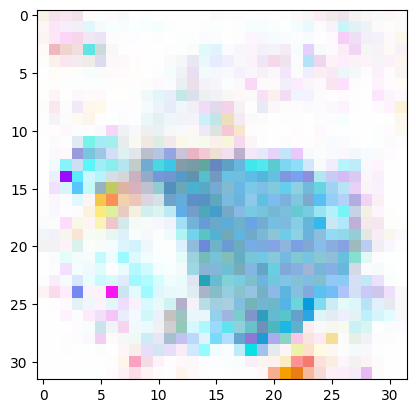

[373/500][0/936]	Loss_D: 0.0006	Loss_G: 7.3817	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[373/500][15/936]	Loss_D: 0.0003	Loss_G: 8.6567	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[373/500][30/936]	Loss_D: 0.0033	Loss_G: 6.2789	D(x): 1.0000	D(G(z)): 0.0032 / 0.0025
[373/500][45/936]	Loss_D: 0.0004	Loss_G: 14.4702	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[373/500][60/936]	Loss_D: 0.0005	Loss_G: 10.9538	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[373/500][75/936]	Loss_D: 0.0000	Loss_G: 14.2952	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[373/500][90/936]	Loss_D: 0.0000	Loss_G: 10.6686	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[373/500][105/936]	Loss_D: 0.0113	Loss_G: 5.2804	D(x): 1.0000	D(G(z)): 0.0112 / 0.0074
[373/500][120/936]	Loss_D: 2.4439	Loss_G: 5.8129	D(x): 0.3315	D(G(z)): 0.0000 / 0.0042
[373/500][135/936]	Loss_D: 0.1263	Loss_G: 6.2935	D(x): 1.0000	D(G(z)): 0.1144 / 0.0029
[373/500][150/936]	Loss_D: 0.0000	Loss_G: 15.5736	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[373/500][165/936]	Loss_D: 0.0003	Loss_G: 9.15

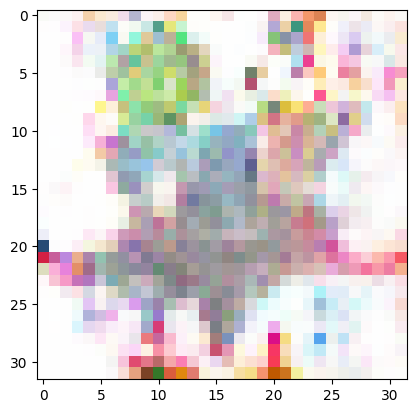

[374/500][0/936]	Loss_D: 0.0001	Loss_G: 9.8520	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
[374/500][15/936]	Loss_D: 0.0003	Loss_G: 10.2012	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[374/500][30/936]	Loss_D: 0.0012	Loss_G: 11.9563	D(x): 1.0000	D(G(z)): 0.0012 / 0.0009
[374/500][45/936]	Loss_D: 0.0000	Loss_G: 18.0910	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[374/500][60/936]	Loss_D: 0.0056	Loss_G: 15.7536	D(x): 1.0000	D(G(z)): 0.0055 / 0.0049
[374/500][75/936]	Loss_D: 0.0000	Loss_G: 12.8567	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[374/500][90/936]	Loss_D: 0.0000	Loss_G: 19.2848	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[374/500][105/936]	Loss_D: 0.0005	Loss_G: 9.3077	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[374/500][120/936]	Loss_D: 0.0022	Loss_G: 11.1083	D(x): 0.9978	D(G(z)): 0.0000 / 0.0000
[374/500][135/936]	Loss_D: 0.0000	Loss_G: 12.0140	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[374/500][150/936]	Loss_D: 0.0017	Loss_G: 8.7052	D(x): 0.9986	D(G(z)): 0.0002 / 0.0002
[374/500][165/936]	Loss_D: 0.0013	Loss_G: 9

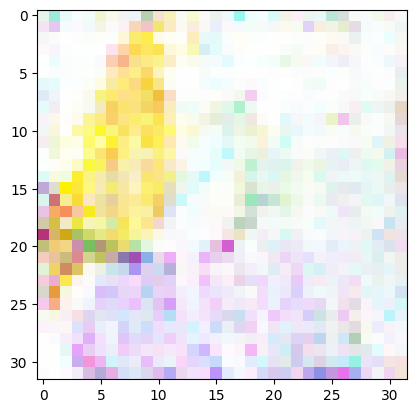

[375/500][0/936]	Loss_D: 0.0013	Loss_G: 6.9131	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[375/500][15/936]	Loss_D: 0.0047	Loss_G: 6.0531	D(x): 1.0000	D(G(z)): 0.0047 / 0.0034
[375/500][30/936]	Loss_D: 0.0001	Loss_G: 9.4579	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[375/500][45/936]	Loss_D: 0.0006	Loss_G: 9.0911	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[375/500][60/936]	Loss_D: 0.0000	Loss_G: 14.0197	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[375/500][75/936]	Loss_D: 0.0082	Loss_G: 8.6955	D(x): 0.9921	D(G(z)): 0.0002 / 0.0002
[375/500][90/936]	Loss_D: 0.0000	Loss_G: 12.8223	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[375/500][105/936]	Loss_D: 0.0028	Loss_G: 9.5502	D(x): 0.9974	D(G(z)): 0.0001 / 0.0001
[375/500][120/936]	Loss_D: 0.0083	Loss_G: 6.0012	D(x): 0.9956	D(G(z)): 0.0039 / 0.0028
[375/500][135/936]	Loss_D: 0.0001	Loss_G: 15.5981	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[375/500][150/936]	Loss_D: 0.0045	Loss_G: 15.9587	D(x): 0.9955	D(G(z)): 0.0000 / 0.0000
[375/500][165/936]	Loss_D: 0.2925	Loss_G: 14.76

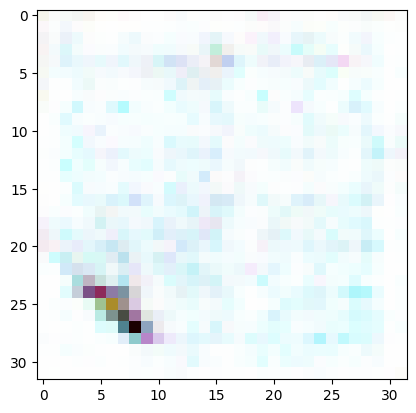

[376/500][0/936]	Loss_D: 0.0000	Loss_G: 12.1081	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[376/500][15/936]	Loss_D: 0.0002	Loss_G: 9.7277	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[376/500][30/936]	Loss_D: 0.0009	Loss_G: 7.4715	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[376/500][45/936]	Loss_D: 0.0104	Loss_G: 6.9097	D(x): 1.0000	D(G(z)): 0.0103 / 0.0065
[376/500][60/936]	Loss_D: 0.0004	Loss_G: 8.3155	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[376/500][75/936]	Loss_D: 0.0019	Loss_G: 6.6790	D(x): 1.0000	D(G(z)): 0.0018 / 0.0015
[376/500][90/936]	Loss_D: 0.0031	Loss_G: 6.1565	D(x): 1.0000	D(G(z)): 0.0031 / 0.0025
[376/500][105/936]	Loss_D: 0.0000	Loss_G: 19.5643	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[376/500][120/936]	Loss_D: 0.0571	Loss_G: 4.8423	D(x): 1.0000	D(G(z)): 0.0514 / 0.0501
[376/500][135/936]	Loss_D: 0.0006	Loss_G: 10.0590	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[376/500][150/936]	Loss_D: 0.0004	Loss_G: 15.6149	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[376/500][165/936]	Loss_D: 0.0010	Loss_G: 7.115

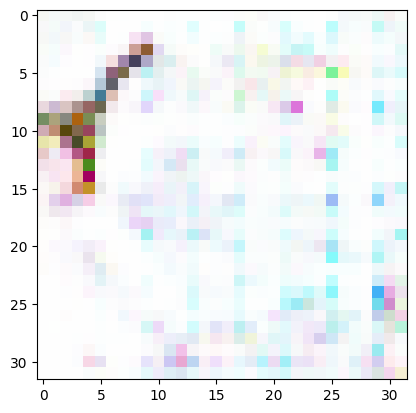

[377/500][0/936]	Loss_D: 0.0020	Loss_G: 6.4382	D(x): 1.0000	D(G(z)): 0.0020 / 0.0017
[377/500][15/936]	Loss_D: 0.0038	Loss_G: 5.9203	D(x): 1.0000	D(G(z)): 0.0037 / 0.0029
[377/500][30/936]	Loss_D: 0.0002	Loss_G: 9.0463	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[377/500][45/936]	Loss_D: 0.0001	Loss_G: 9.8015	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[377/500][60/936]	Loss_D: 0.0051	Loss_G: 6.7240	D(x): 0.9964	D(G(z)): 0.0015 / 0.0014
[377/500][75/936]	Loss_D: 0.0142	Loss_G: 7.4670	D(x): 0.9979	D(G(z)): 0.0118 / 0.0020
[377/500][90/936]	Loss_D: 0.0007	Loss_G: 7.5723	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[377/500][105/936]	Loss_D: 0.0005	Loss_G: 8.1119	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[377/500][120/936]	Loss_D: 0.0002	Loss_G: 9.4879	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[377/500][135/936]	Loss_D: 0.0030	Loss_G: 6.2164	D(x): 1.0000	D(G(z)): 0.0029 / 0.0024
[377/500][150/936]	Loss_D: 0.0049	Loss_G: 5.7263	D(x): 1.0000	D(G(z)): 0.0049 / 0.0036
[377/500][165/936]	Loss_D: 0.0005	Loss_G: 8.6071	D(

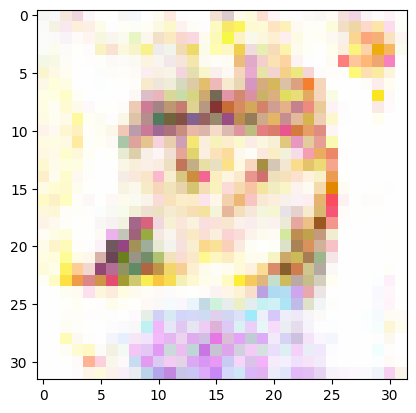

[378/500][0/936]	Loss_D: 0.0061	Loss_G: 6.9279	D(x): 1.0000	D(G(z)): 0.0061 / 0.0036
[378/500][15/936]	Loss_D: 0.0002	Loss_G: 11.9542	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[378/500][30/936]	Loss_D: 0.0001	Loss_G: 10.0663	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[378/500][45/936]	Loss_D: 0.0082	Loss_G: 5.3897	D(x): 0.9999	D(G(z)): 0.0081 / 0.0047
[378/500][60/936]	Loss_D: 0.0008	Loss_G: 8.0331	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[378/500][75/936]	Loss_D: 0.0201	Loss_G: 5.2401	D(x): 1.0000	D(G(z)): 0.0199 / 0.0066
[378/500][90/936]	Loss_D: 0.0000	Loss_G: 10.8198	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[378/500][105/936]	Loss_D: 0.0188	Loss_G: 6.4248	D(x): 0.9845	D(G(z)): 0.0029 / 0.0030
[378/500][120/936]	Loss_D: 0.0059	Loss_G: 5.5258	D(x): 0.9998	D(G(z)): 0.0057 / 0.0045
[378/500][135/936]	Loss_D: 0.0003	Loss_G: 8.5208	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[378/500][150/936]	Loss_D: 0.0007	Loss_G: 7.5181	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[378/500][165/936]	Loss_D: 0.0052	Loss_G: 6.0297

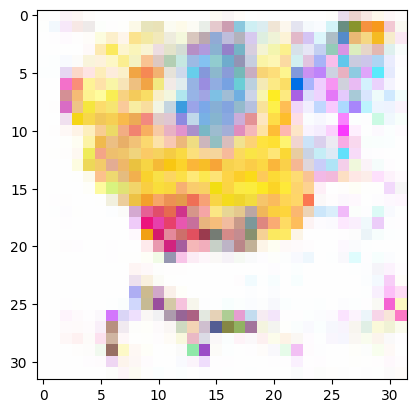

[379/500][0/936]	Loss_D: 0.0011	Loss_G: 7.5554	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[379/500][15/936]	Loss_D: 0.4450	Loss_G: 4.0312	D(x): 0.7354	D(G(z)): 0.0010 / 0.0465
[379/500][30/936]	Loss_D: 0.0002	Loss_G: 23.0012	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[379/500][45/936]	Loss_D: 0.0124	Loss_G: 19.0578	D(x): 1.0000	D(G(z)): 0.0122 / 0.0040
[379/500][60/936]	Loss_D: 0.0004	Loss_G: 16.3431	D(x): 0.9999	D(G(z)): 0.0003 / 0.0000
[379/500][75/936]	Loss_D: 0.0002	Loss_G: 19.0029	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[379/500][90/936]	Loss_D: 0.0052	Loss_G: 39.4260	D(x): 0.9949	D(G(z)): 0.0000 / 0.0000
[379/500][105/936]	Loss_D: 0.0028	Loss_G: 34.3330	D(x): 0.9972	D(G(z)): 0.0000 / 0.0000
[379/500][120/936]	Loss_D: 0.0026	Loss_G: 29.4508	D(x): 0.9981	D(G(z)): 0.0007 / 0.0007
[379/500][135/936]	Loss_D: 0.0007	Loss_G: 26.0707	D(x): 1.0000	D(G(z)): 0.0007 / 0.0003
[379/500][150/936]	Loss_D: 0.1268	Loss_G: 33.9990	D(x): 0.9979	D(G(z)): 0.0982 / 0.0003
[379/500][165/936]	Loss_D: 0.0018	Loss_G: 

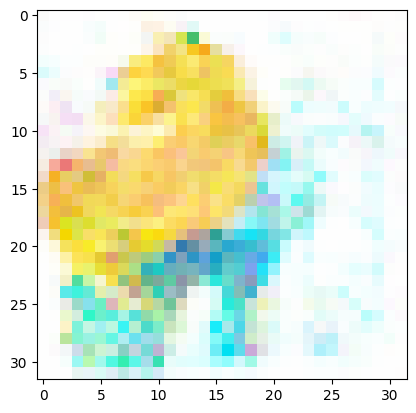

[380/500][0/936]	Loss_D: 0.0020	Loss_G: 6.9465	D(x): 0.9999	D(G(z)): 0.0019 / 0.0017
[380/500][15/936]	Loss_D: 0.0059	Loss_G: 6.6749	D(x): 1.0000	D(G(z)): 0.0058 / 0.0022
[380/500][30/936]	Loss_D: 0.0066	Loss_G: 6.6853	D(x): 1.0000	D(G(z)): 0.0066 / 0.0028
[380/500][45/936]	Loss_D: 0.0186	Loss_G: 18.8721	D(x): 0.9819	D(G(z)): 0.0001 / 0.0001
[380/500][60/936]	Loss_D: 0.0179	Loss_G: 8.2182	D(x): 0.9999	D(G(z)): 0.0174 / 0.0060
[380/500][75/936]	Loss_D: 0.0005	Loss_G: 9.5189	D(x): 0.9999	D(G(z)): 0.0004 / 0.0003
[380/500][90/936]	Loss_D: 0.0000	Loss_G: 14.0359	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[380/500][105/936]	Loss_D: 0.2463	Loss_G: 9.5002	D(x): 1.0000	D(G(z)): 0.2011 / 0.0004
[380/500][120/936]	Loss_D: 0.0003	Loss_G: 10.6857	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[380/500][135/936]	Loss_D: 0.0001	Loss_G: 9.9614	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[380/500][150/936]	Loss_D: 0.0012	Loss_G: 7.5466	D(x): 1.0000	D(G(z)): 0.0012 / 0.0011
[380/500][165/936]	Loss_D: 0.0000	Loss_G: 11.765

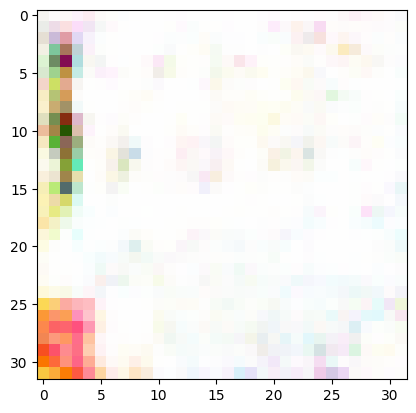

[381/500][0/936]	Loss_D: 0.0026	Loss_G: 8.0140	D(x): 1.0000	D(G(z)): 0.0026 / 0.0024
[381/500][15/936]	Loss_D: 0.0258	Loss_G: 5.3043	D(x): 0.9970	D(G(z)): 0.0223 / 0.0116
[381/500][30/936]	Loss_D: 0.0045	Loss_G: 5.6028	D(x): 1.0000	D(G(z)): 0.0045 / 0.0039
[381/500][45/936]	Loss_D: 0.0001	Loss_G: 9.9263	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[381/500][60/936]	Loss_D: 0.0008	Loss_G: 7.3937	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[381/500][75/936]	Loss_D: 0.0015	Loss_G: 6.6485	D(x): 1.0000	D(G(z)): 0.0015 / 0.0016
[381/500][90/936]	Loss_D: 0.0157	Loss_G: 5.3760	D(x): 1.0000	D(G(z)): 0.0156 / 0.0065
[381/500][105/936]	Loss_D: 0.0070	Loss_G: 5.5536	D(x): 0.9994	D(G(z)): 0.0064 / 0.0051
[381/500][120/936]	Loss_D: 0.0047	Loss_G: 5.6318	D(x): 1.0000	D(G(z)): 0.0047 / 0.0039
[381/500][135/936]	Loss_D: 0.0066	Loss_G: 5.4998	D(x): 1.0000	D(G(z)): 0.0066 / 0.0051
[381/500][150/936]	Loss_D: 0.0000	Loss_G: 28.5132	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[381/500][165/936]	Loss_D: 0.0053	Loss_G: 15.8612	

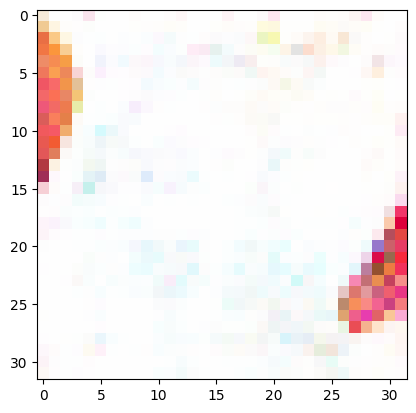

[382/500][0/936]	Loss_D: 0.0002	Loss_G: 8.6232	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[382/500][15/936]	Loss_D: 0.0047	Loss_G: 6.3896	D(x): 1.0000	D(G(z)): 0.0047 / 0.0035
[382/500][30/936]	Loss_D: 0.0000	Loss_G: 11.6716	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[382/500][45/936]	Loss_D: 0.4414	Loss_G: 4.2811	D(x): 0.6842	D(G(z)): 0.0026 / 0.0498
[382/500][60/936]	Loss_D: 0.0000	Loss_G: 11.0719	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[382/500][75/936]	Loss_D: 0.0002	Loss_G: 18.4275	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[382/500][90/936]	Loss_D: 0.0003	Loss_G: 17.7842	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[382/500][105/936]	Loss_D: 0.0000	Loss_G: 12.8808	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[382/500][120/936]	Loss_D: 0.0001	Loss_G: 21.6356	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[382/500][135/936]	Loss_D: 0.0001	Loss_G: 14.2491	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[382/500][150/936]	Loss_D: 0.0085	Loss_G: 8.2969	D(x): 1.0000	D(G(z)): 0.0084 / 0.0065
[382/500][165/936]	Loss_D: 0.0089	Loss_G: 5.

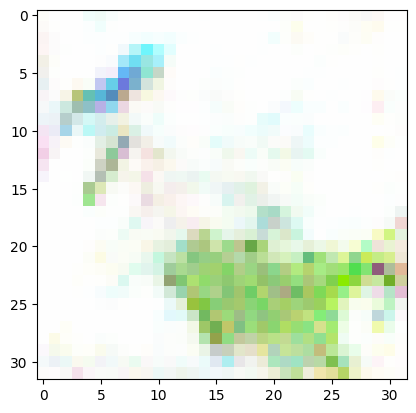

[383/500][0/936]	Loss_D: 0.0319	Loss_G: 3.6175	D(x): 1.0000	D(G(z)): 0.0311 / 0.0393
[383/500][15/936]	Loss_D: 0.0093	Loss_G: 5.4931	D(x): 1.0000	D(G(z)): 0.0093 / 0.0058
[383/500][30/936]	Loss_D: 0.0210	Loss_G: 4.4834	D(x): 0.9999	D(G(z)): 0.0206 / 0.0121
[383/500][45/936]	Loss_D: 0.0088	Loss_G: 5.6576	D(x): 0.9966	D(G(z)): 0.0053 / 0.0045
[383/500][60/936]	Loss_D: 0.0279	Loss_G: 4.3492	D(x): 1.0000	D(G(z)): 0.0272 / 0.0180
[383/500][75/936]	Loss_D: 0.0260	Loss_G: 4.6865	D(x): 0.9981	D(G(z)): 0.0237 / 0.0104
[383/500][90/936]	Loss_D: 0.0127	Loss_G: 4.4638	D(x): 0.9999	D(G(z)): 0.0126 / 0.0120
[383/500][105/936]	Loss_D: 0.0261	Loss_G: 5.2914	D(x): 0.9808	D(G(z)): 0.0062 / 0.0059
[383/500][120/936]	Loss_D: 0.0236	Loss_G: 4.8957	D(x): 1.0000	D(G(z)): 0.0233 / 0.0077
[383/500][135/936]	Loss_D: 0.0001	Loss_G: 11.3411	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[383/500][150/936]	Loss_D: 0.0045	Loss_G: 8.0259	D(x): 1.0000	D(G(z)): 0.0045 / 0.0029
[383/500][165/936]	Loss_D: 0.0009	Loss_G: 8.0135	D

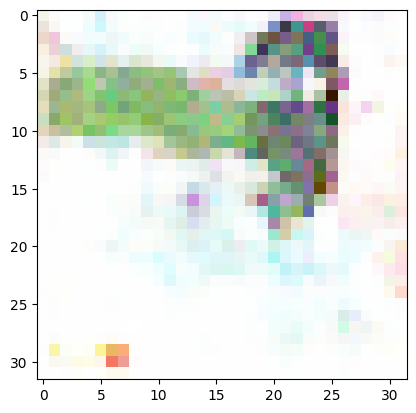

[384/500][0/936]	Loss_D: 0.0010	Loss_G: 9.9981	D(x): 0.9991	D(G(z)): 0.0001 / 0.0001
[384/500][15/936]	Loss_D: 0.0006	Loss_G: 7.7166	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[384/500][30/936]	Loss_D: 0.0052	Loss_G: 6.3627	D(x): 1.0000	D(G(z)): 0.0052 / 0.0035
[384/500][45/936]	Loss_D: 0.0001	Loss_G: 11.6498	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[384/500][60/936]	Loss_D: 0.0120	Loss_G: 21.3702	D(x): 0.9882	D(G(z)): 0.0000 / 0.0000
[384/500][75/936]	Loss_D: 0.1753	Loss_G: 6.5392	D(x): 0.8551	D(G(z)): 0.0036 / 0.0151
[384/500][90/936]	Loss_D: 0.0005	Loss_G: 7.8256	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[384/500][105/936]	Loss_D: 0.0004	Loss_G: 10.0896	D(x): 0.9999	D(G(z)): 0.0003 / 0.0002
[384/500][120/936]	Loss_D: 0.0088	Loss_G: 5.0745	D(x): 0.9998	D(G(z)): 0.0085 / 0.0066
[384/500][135/936]	Loss_D: 0.0060	Loss_G: 5.7662	D(x): 1.0000	D(G(z)): 0.0060 / 0.0032
[384/500][150/936]	Loss_D: 0.0000	Loss_G: 11.3386	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[384/500][165/936]	Loss_D: 0.0011	Loss_G: 7.453

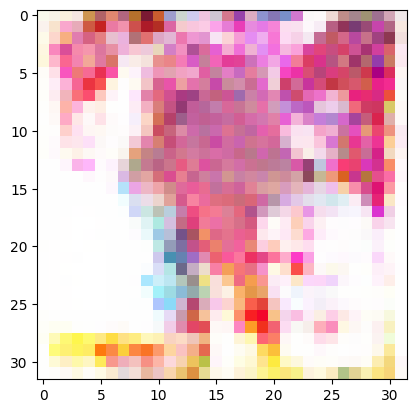

[385/500][0/936]	Loss_D: 0.0188	Loss_G: 6.3974	D(x): 0.9999	D(G(z)): 0.0185 / 0.0074
[385/500][15/936]	Loss_D: 0.0015	Loss_G: 7.7685	D(x): 1.0000	D(G(z)): 0.0015 / 0.0008
[385/500][30/936]	Loss_D: 0.0028	Loss_G: 6.5135	D(x): 1.0000	D(G(z)): 0.0028 / 0.0023
[385/500][45/936]	Loss_D: 0.0007	Loss_G: 7.7282	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[385/500][60/936]	Loss_D: 0.0044	Loss_G: 6.1815	D(x): 1.0000	D(G(z)): 0.0044 / 0.0032
[385/500][75/936]	Loss_D: 0.0035	Loss_G: 6.1098	D(x): 1.0000	D(G(z)): 0.0035 / 0.0027
[385/500][90/936]	Loss_D: 0.0135	Loss_G: 6.2232	D(x): 1.0000	D(G(z)): 0.0132 / 0.0050
[385/500][105/936]	Loss_D: 0.0354	Loss_G: 5.0130	D(x): 1.0000	D(G(z)): 0.0346 / 0.0078
[385/500][120/936]	Loss_D: 0.0043	Loss_G: 7.3154	D(x): 1.0000	D(G(z)): 0.0043 / 0.0017
[385/500][135/936]	Loss_D: 0.0070	Loss_G: 5.8309	D(x): 1.0000	D(G(z)): 0.0070 / 0.0036
[385/500][150/936]	Loss_D: 0.0001	Loss_G: 10.2788	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[385/500][165/936]	Loss_D: 0.0001	Loss_G: 10.1504	

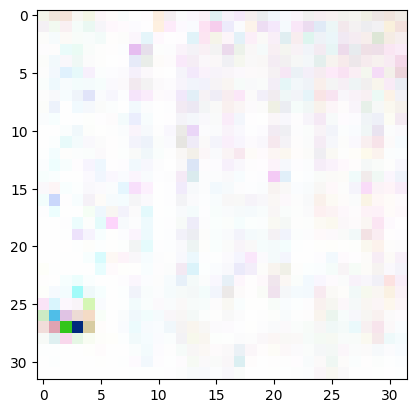

[386/500][0/936]	Loss_D: 0.0019	Loss_G: 7.1811	D(x): 1.0000	D(G(z)): 0.0018 / 0.0015
[386/500][15/936]	Loss_D: 0.0098	Loss_G: 6.0570	D(x): 0.9959	D(G(z)): 0.0056 / 0.0046
[386/500][30/936]	Loss_D: 0.0007	Loss_G: 7.6267	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[386/500][45/936]	Loss_D: 0.0036	Loss_G: 5.8488	D(x): 1.0000	D(G(z)): 0.0036 / 0.0029
[386/500][60/936]	Loss_D: 0.0481	Loss_G: 5.5542	D(x): 1.0000	D(G(z)): 0.0465 / 0.0086
[386/500][75/936]	Loss_D: 0.0014	Loss_G: 6.7681	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[386/500][90/936]	Loss_D: 0.0000	Loss_G: 11.4102	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[386/500][105/936]	Loss_D: 0.0380	Loss_G: 4.9224	D(x): 0.9739	D(G(z)): 0.0113 / 0.0081
[386/500][120/936]	Loss_D: 0.0007	Loss_G: 7.8468	D(x): 0.9998	D(G(z)): 0.0005 / 0.0005
[386/500][135/936]	Loss_D: 0.0072	Loss_G: 5.2496	D(x): 0.9998	D(G(z)): 0.0070 / 0.0053
[386/500][150/936]	Loss_D: 0.0009	Loss_G: 7.3096	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[386/500][165/936]	Loss_D: 0.0000	Loss_G: 11.4296	

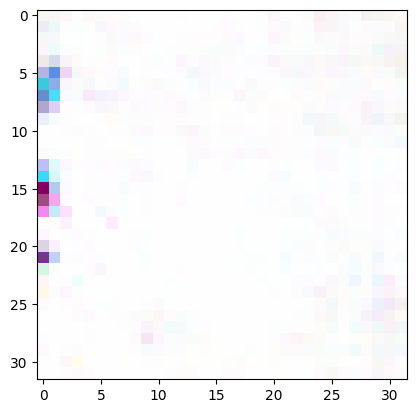

[387/500][0/936]	Loss_D: 0.0020	Loss_G: 6.6324	D(x): 1.0000	D(G(z)): 0.0020 / 0.0017
[387/500][15/936]	Loss_D: 0.0111	Loss_G: 5.1574	D(x): 0.9981	D(G(z)): 0.0092 / 0.0063
[387/500][30/936]	Loss_D: 0.0241	Loss_G: 5.7669	D(x): 1.0000	D(G(z)): 0.0237 / 0.0045
[387/500][45/936]	Loss_D: 0.0004	Loss_G: 10.0656	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[387/500][60/936]	Loss_D: 0.3723	Loss_G: 12.2110	D(x): 1.0000	D(G(z)): 0.2698 / 0.0017
[387/500][75/936]	Loss_D: 0.0000	Loss_G: 16.3051	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[387/500][90/936]	Loss_D: 0.0027	Loss_G: 8.6389	D(x): 1.0000	D(G(z)): 0.0027 / 0.0024
[387/500][105/936]	Loss_D: 0.2156	Loss_G: 8.4916	D(x): 0.8514	D(G(z)): 0.0001 / 0.0013
[387/500][120/936]	Loss_D: 0.0005	Loss_G: 8.3796	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[387/500][135/936]	Loss_D: 0.2002	Loss_G: 5.4138	D(x): 1.0000	D(G(z)): 0.1709 / 0.0072
[387/500][150/936]	Loss_D: 0.0000	Loss_G: 22.9652	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[387/500][165/936]	Loss_D: 0.0000	Loss_G: 14.14

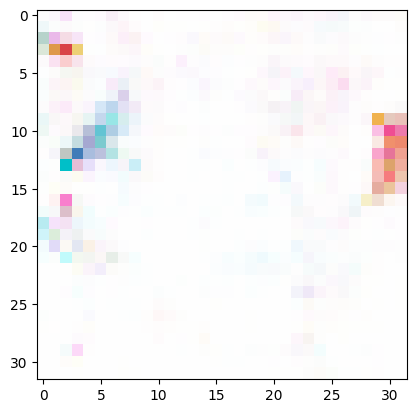

[388/500][0/936]	Loss_D: 0.0013	Loss_G: 7.2177	D(x): 0.9996	D(G(z)): 0.0010 / 0.0009
[388/500][15/936]	Loss_D: 0.0021	Loss_G: 6.4552	D(x): 1.0000	D(G(z)): 0.0021 / 0.0018
[388/500][30/936]	Loss_D: 0.0086	Loss_G: 5.3885	D(x): 1.0000	D(G(z)): 0.0086 / 0.0052
[388/500][45/936]	Loss_D: 0.0697	Loss_G: 5.9026	D(x): 1.0000	D(G(z)): 0.0669 / 0.0029
[388/500][60/936]	Loss_D: 0.0002	Loss_G: 8.8030	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[388/500][75/936]	Loss_D: 0.0059	Loss_G: 5.4094	D(x): 1.0000	D(G(z)): 0.0058 / 0.0063
[388/500][90/936]	Loss_D: 0.0343	Loss_G: 5.0677	D(x): 1.0000	D(G(z)): 0.0332 / 0.0105
[388/500][105/936]	Loss_D: 0.9187	Loss_G: 10.4468	D(x): 1.0000	D(G(z)): 0.4714 / 0.0009
[388/500][120/936]	Loss_D: 0.0000	Loss_G: 13.3047	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[388/500][135/936]	Loss_D: 0.0000	Loss_G: 12.3266	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[388/500][150/936]	Loss_D: 0.0006	Loss_G: 9.2583	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[388/500][165/936]	Loss_D: 0.0019	Loss_G: 6.3922

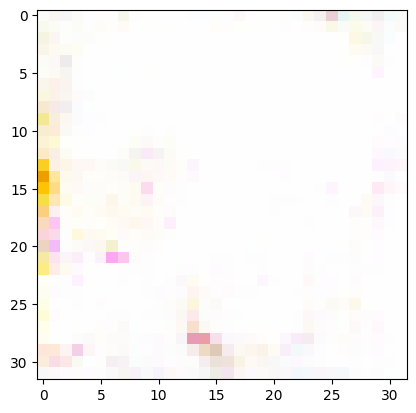

[389/500][0/936]	Loss_D: 0.0056	Loss_G: 9.1596	D(x): 0.9948	D(G(z)): 0.0004 / 0.0003
[389/500][15/936]	Loss_D: 0.0123	Loss_G: 4.1100	D(x): 1.0000	D(G(z)): 0.0122 / 0.0218
[389/500][30/936]	Loss_D: 0.0021	Loss_G: 8.6015	D(x): 1.0000	D(G(z)): 0.0021 / 0.0002
[389/500][45/936]	Loss_D: 0.0481	Loss_G: 6.4433	D(x): 1.0000	D(G(z)): 0.0465 / 0.0058
[389/500][60/936]	Loss_D: 0.0000	Loss_G: 13.7845	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[389/500][75/936]	Loss_D: 0.0037	Loss_G: 6.9719	D(x): 1.0000	D(G(z)): 0.0037 / 0.0027
[389/500][90/936]	Loss_D: 0.0027	Loss_G: 6.9955	D(x): 0.9984	D(G(z)): 0.0011 / 0.0010
[389/500][105/936]	Loss_D: 0.0000	Loss_G: 14.0849	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[389/500][120/936]	Loss_D: 0.0054	Loss_G: 5.6858	D(x): 1.0000	D(G(z)): 0.0054 / 0.0050
[389/500][135/936]	Loss_D: 0.0228	Loss_G: 4.8443	D(x): 1.0000	D(G(z)): 0.0224 / 0.0085
[389/500][150/936]	Loss_D: 0.0015	Loss_G: 6.9335	D(x): 0.9997	D(G(z)): 0.0012 / 0.0010
[389/500][165/936]	Loss_D: 0.0036	Loss_G: 5.9707	

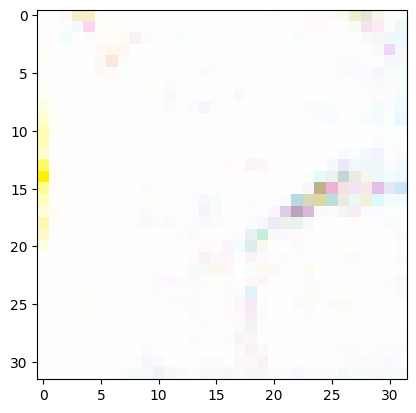

[390/500][0/936]	Loss_D: 0.0047	Loss_G: 6.8675	D(x): 1.0000	D(G(z)): 0.0047 / 0.0071
[390/500][15/936]	Loss_D: 0.0088	Loss_G: 5.7085	D(x): 1.0000	D(G(z)): 0.0087 / 0.0061
[390/500][30/936]	Loss_D: 0.0000	Loss_G: 14.0787	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[390/500][45/936]	Loss_D: 0.0031	Loss_G: 7.0095	D(x): 0.9999	D(G(z)): 0.0030 / 0.0024
[390/500][60/936]	Loss_D: 0.0023	Loss_G: 6.8052	D(x): 1.0000	D(G(z)): 0.0023 / 0.0020
[390/500][75/936]	Loss_D: 0.9588	Loss_G: 3.9833	D(x): 0.7554	D(G(z)): 0.0015 / 0.0389
[390/500][90/936]	Loss_D: 0.0006	Loss_G: 9.3135	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[390/500][105/936]	Loss_D: 0.0000	Loss_G: 10.6723	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[390/500][120/936]	Loss_D: 0.0002	Loss_G: 12.2281	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[390/500][135/936]	Loss_D: 0.0054	Loss_G: 6.4720	D(x): 1.0000	D(G(z)): 0.0053 / 0.0027
[390/500][150/936]	Loss_D: 0.0022	Loss_G: 8.5036	D(x): 0.9981	D(G(z)): 0.0003 / 0.0003
[390/500][165/936]	Loss_D: 0.0018	Loss_G: 5.6821

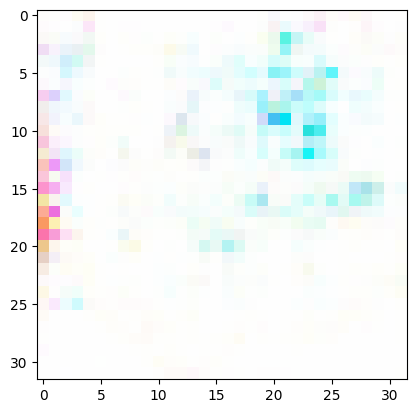

[391/500][0/936]	Loss_D: 1.1634	Loss_G: 31.9289	D(x): 0.7359	D(G(z)): 0.0000 / 0.0000
[391/500][15/936]	Loss_D: 0.0069	Loss_G: 21.0498	D(x): 1.0000	D(G(z)): 0.0068 / 0.0046
[391/500][30/936]	Loss_D: 0.0185	Loss_G: 20.3767	D(x): 1.0000	D(G(z)): 0.0178 / 0.0085
[391/500][45/936]	Loss_D: 0.0005	Loss_G: 10.9821	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[391/500][60/936]	Loss_D: 0.0182	Loss_G: 6.7542	D(x): 1.0000	D(G(z)): 0.0176 / 0.0069
[391/500][75/936]	Loss_D: 0.0029	Loss_G: 6.5858	D(x): 1.0000	D(G(z)): 0.0029 / 0.0026
[391/500][90/936]	Loss_D: 0.0110	Loss_G: 5.6036	D(x): 0.9986	D(G(z)): 0.0096 / 0.0067
[391/500][105/936]	Loss_D: 0.0004	Loss_G: 8.9516	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[391/500][120/936]	Loss_D: 0.8693	Loss_G: 5.0729	D(x): 0.7142	D(G(z)): 0.0034 / 0.0191
[391/500][135/936]	Loss_D: 0.0207	Loss_G: 5.2802	D(x): 1.0000	D(G(z)): 0.0204 / 0.0089
[391/500][150/936]	Loss_D: 0.0024	Loss_G: 6.4105	D(x): 1.0000	D(G(z)): 0.0024 / 0.0017
[391/500][165/936]	Loss_D: 0.0005	Loss_G: 8.011

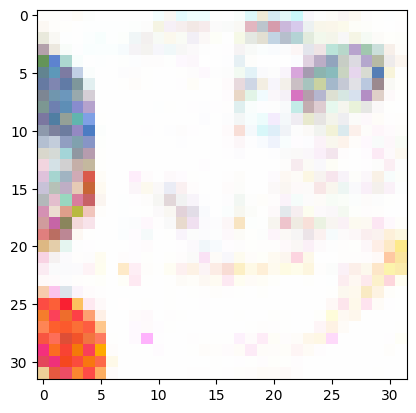

[392/500][0/936]	Loss_D: 0.0000	Loss_G: 11.9988	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[392/500][15/936]	Loss_D: 0.0010	Loss_G: 7.5158	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[392/500][30/936]	Loss_D: 0.0005	Loss_G: 8.3723	D(x): 1.0000	D(G(z)): 0.0005 / 0.0002
[392/500][45/936]	Loss_D: 0.0009	Loss_G: 9.2111	D(x): 0.9993	D(G(z)): 0.0002 / 0.0002
[392/500][60/936]	Loss_D: 0.0001	Loss_G: 10.3743	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[392/500][75/936]	Loss_D: 0.0005	Loss_G: 7.6676	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[392/500][90/936]	Loss_D: 0.0043	Loss_G: 5.8345	D(x): 0.9999	D(G(z)): 0.0041 / 0.0035
[392/500][105/936]	Loss_D: 0.0003	Loss_G: 9.0282	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[392/500][120/936]	Loss_D: 0.0154	Loss_G: 5.2607	D(x): 0.9917	D(G(z)): 0.0070 / 0.0053
[392/500][135/936]	Loss_D: 0.0082	Loss_G: 6.2496	D(x): 0.9951	D(G(z)): 0.0032 / 0.0035
[392/500][150/936]	Loss_D: 0.0654	Loss_G: 8.2792	D(x): 0.9433	D(G(z)): 0.0014 / 0.0014
[392/500][165/936]	Loss_D: 0.1577	Loss_G: 6.6690	

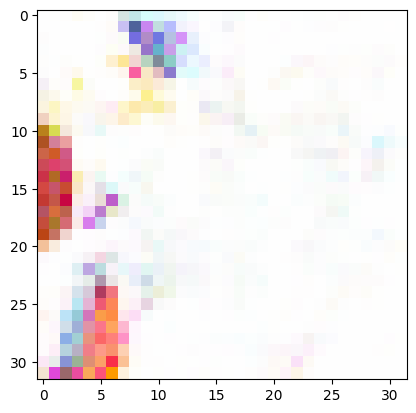

[393/500][0/936]	Loss_D: 0.0002	Loss_G: 10.4139	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[393/500][15/936]	Loss_D: 0.0036	Loss_G: 5.8805	D(x): 1.0000	D(G(z)): 0.0036 / 0.0028
[393/500][30/936]	Loss_D: 0.0098	Loss_G: 5.5715	D(x): 1.0000	D(G(z)): 0.0097 / 0.0045
[393/500][45/936]	Loss_D: 0.0015	Loss_G: 6.7664	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[393/500][60/936]	Loss_D: 0.0004	Loss_G: 8.2148	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[393/500][75/936]	Loss_D: 0.0147	Loss_G: 6.2701	D(x): 1.0000	D(G(z)): 0.0145 / 0.0070
[393/500][90/936]	Loss_D: 0.0044	Loss_G: 5.7738	D(x): 1.0000	D(G(z)): 0.0044 / 0.0039
[393/500][105/936]	Loss_D: 0.0358	Loss_G: 5.2431	D(x): 1.0000	D(G(z)): 0.0346 / 0.0055
[393/500][120/936]	Loss_D: 0.2091	Loss_G: 4.7403	D(x): 0.8268	D(G(z)): 0.0026 / 0.0169
[393/500][135/936]	Loss_D: 0.0021	Loss_G: 8.3732	D(x): 1.0000	D(G(z)): 0.0020 / 0.0017
[393/500][150/936]	Loss_D: 0.0006	Loss_G: 8.3462	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[393/500][165/936]	Loss_D: 0.0044	Loss_G: 6.2144	D

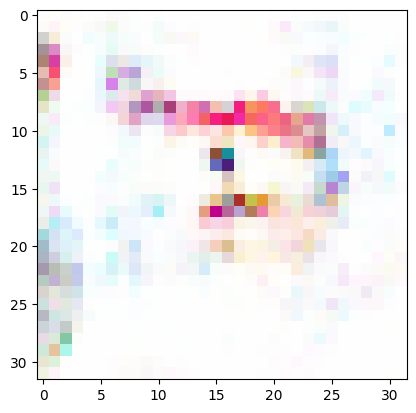

[394/500][0/936]	Loss_D: 0.0231	Loss_G: 5.4357	D(x): 1.0000	D(G(z)): 0.0226 / 0.0069
[394/500][15/936]	Loss_D: 0.0001	Loss_G: 10.6193	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[394/500][30/936]	Loss_D: 0.0000	Loss_G: 21.7600	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[394/500][45/936]	Loss_D: 0.0000	Loss_G: 17.6531	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[394/500][60/936]	Loss_D: 0.0448	Loss_G: 5.8647	D(x): 0.9997	D(G(z)): 0.0429 / 0.0075
[394/500][75/936]	Loss_D: 0.0003	Loss_G: 12.8407	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[394/500][90/936]	Loss_D: 0.0001	Loss_G: 10.3888	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[394/500][105/936]	Loss_D: 0.0051	Loss_G: 6.6010	D(x): 1.0000	D(G(z)): 0.0051 / 0.0028
[394/500][120/936]	Loss_D: 0.0120	Loss_G: 5.8696	D(x): 1.0000	D(G(z)): 0.0118 / 0.0054
[394/500][135/936]	Loss_D: 0.0007	Loss_G: 8.2375	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[394/500][150/936]	Loss_D: 0.0008	Loss_G: 8.4836	D(x): 0.9998	D(G(z)): 0.0006 / 0.0006
[394/500][165/936]	Loss_D: 0.0026	Loss_G: 16.0

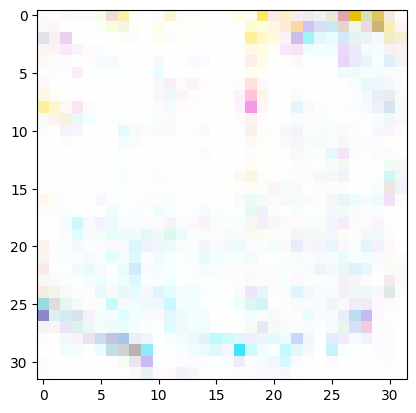

[395/500][0/936]	Loss_D: 0.0006	Loss_G: 7.2581	D(x): 1.0000	D(G(z)): 0.0006 / 0.0009
[395/500][15/936]	Loss_D: 0.0082	Loss_G: 6.7289	D(x): 1.0000	D(G(z)): 0.0082 / 0.0047
[395/500][30/936]	Loss_D: 0.0202	Loss_G: 5.1204	D(x): 1.0000	D(G(z)): 0.0199 / 0.0087
[395/500][45/936]	Loss_D: 0.0004	Loss_G: 9.9626	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[395/500][60/936]	Loss_D: 0.0045	Loss_G: 6.1627	D(x): 1.0000	D(G(z)): 0.0045 / 0.0036
[395/500][75/936]	Loss_D: 0.0077	Loss_G: 6.1909	D(x): 0.9994	D(G(z)): 0.0070 / 0.0029
[395/500][90/936]	Loss_D: 0.0017	Loss_G: 8.0359	D(x): 1.0000	D(G(z)): 0.0017 / 0.0014
[395/500][105/936]	Loss_D: 0.0024	Loss_G: 7.1342	D(x): 1.0000	D(G(z)): 0.0024 / 0.0020
[395/500][120/936]	Loss_D: 0.0001	Loss_G: 10.1344	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[395/500][135/936]	Loss_D: 0.0523	Loss_G: 5.2687	D(x): 1.0000	D(G(z)): 0.0500 / 0.0083
[395/500][150/936]	Loss_D: 0.0027	Loss_G: 7.2673	D(x): 1.0000	D(G(z)): 0.0027 / 0.0009
[395/500][165/936]	Loss_D: 0.0001	Loss_G: 11.8507	

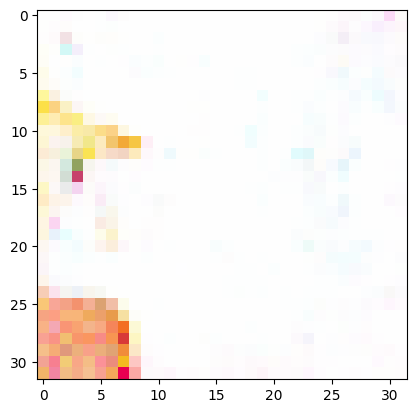

[396/500][0/936]	Loss_D: 0.0063	Loss_G: 8.9111	D(x): 1.0000	D(G(z)): 0.0063 / 0.0051
[396/500][15/936]	Loss_D: 0.0006	Loss_G: 8.0696	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[396/500][30/936]	Loss_D: 0.0045	Loss_G: 5.8331	D(x): 1.0000	D(G(z)): 0.0045 / 0.0030
[396/500][45/936]	Loss_D: 0.0090	Loss_G: 5.2992	D(x): 0.9995	D(G(z)): 0.0085 / 0.0054
[396/500][60/936]	Loss_D: 0.0009	Loss_G: 7.9409	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[396/500][75/936]	Loss_D: 0.0192	Loss_G: 8.0008	D(x): 1.0000	D(G(z)): 0.0185 / 0.0052
[396/500][90/936]	Loss_D: 0.0012	Loss_G: 7.4601	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[396/500][105/936]	Loss_D: 0.0006	Loss_G: 15.0674	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[396/500][120/936]	Loss_D: 0.0004	Loss_G: 8.4307	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[396/500][135/936]	Loss_D: 0.0004	Loss_G: 9.3886	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
[396/500][150/936]	Loss_D: 0.0002	Loss_G: 8.8421	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[396/500][165/936]	Loss_D: 0.0001	Loss_G: 15.3608	

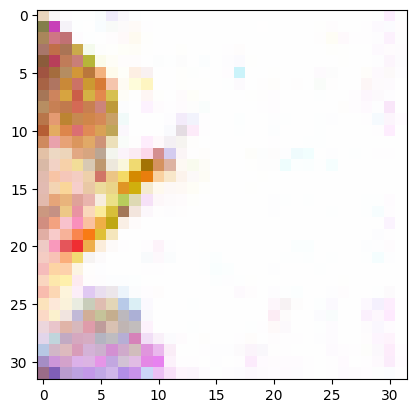

[397/500][0/936]	Loss_D: 0.1292	Loss_G: 7.0092	D(x): 0.9996	D(G(z)): 0.1167 / 0.0053
[397/500][15/936]	Loss_D: 0.0069	Loss_G: 7.2610	D(x): 1.0000	D(G(z)): 0.0068 / 0.0052
[397/500][30/936]	Loss_D: 0.0092	Loss_G: 6.6223	D(x): 0.9928	D(G(z)): 0.0020 / 0.0018
[397/500][45/936]	Loss_D: 0.0020	Loss_G: 7.1248	D(x): 1.0000	D(G(z)): 0.0020 / 0.0010
[397/500][60/936]	Loss_D: 0.0032	Loss_G: 7.6691	D(x): 1.0000	D(G(z)): 0.0032 / 0.0025
[397/500][75/936]	Loss_D: 0.0013	Loss_G: 6.9581	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[397/500][90/936]	Loss_D: 0.0009	Loss_G: 7.4938	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[397/500][105/936]	Loss_D: 0.3064	Loss_G: 5.3466	D(x): 0.8232	D(G(z)): 0.0007 / 0.0252
[397/500][120/936]	Loss_D: 0.0048	Loss_G: 5.7227	D(x): 1.0000	D(G(z)): 0.0048 / 0.0039
[397/500][135/936]	Loss_D: 0.0057	Loss_G: 5.7591	D(x): 1.0000	D(G(z)): 0.0057 / 0.0035
[397/500][150/936]	Loss_D: 0.0044	Loss_G: 7.0128	D(x): 1.0000	D(G(z)): 0.0043 / 0.0024
[397/500][165/936]	Loss_D: 0.0007	Loss_G: 9.4027	D(

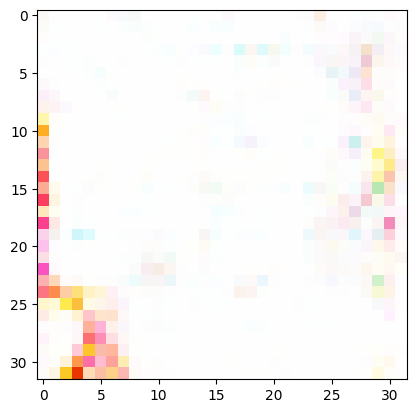

[398/500][0/936]	Loss_D: 0.0016	Loss_G: 6.8678	D(x): 0.9998	D(G(z)): 0.0014 / 0.0014
[398/500][15/936]	Loss_D: 0.0123	Loss_G: 5.5212	D(x): 1.0000	D(G(z)): 0.0122 / 0.0077
[398/500][30/936]	Loss_D: 0.0054	Loss_G: 5.5608	D(x): 1.0000	D(G(z)): 0.0054 / 0.0043
[398/500][45/936]	Loss_D: 0.0009	Loss_G: 7.3284	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[398/500][60/936]	Loss_D: 0.0013	Loss_G: 7.0172	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[398/500][75/936]	Loss_D: 0.2746	Loss_G: 3.6552	D(x): 0.8140	D(G(z)): 0.0015 / 0.0281
[398/500][90/936]	Loss_D: 0.0011	Loss_G: 8.4075	D(x): 0.9996	D(G(z)): 0.0007 / 0.0006
[398/500][105/936]	Loss_D: 0.0116	Loss_G: 5.1112	D(x): 1.0000	D(G(z)): 0.0114 / 0.0080
[398/500][120/936]	Loss_D: 0.0139	Loss_G: 5.0351	D(x): 1.0000	D(G(z)): 0.0137 / 0.0078
[398/500][135/936]	Loss_D: 0.0019	Loss_G: 6.4349	D(x): 1.0000	D(G(z)): 0.0019 / 0.0016
[398/500][150/936]	Loss_D: 0.0021	Loss_G: 6.2821	D(x): 1.0000	D(G(z)): 0.0021 / 0.0019
[398/500][165/936]	Loss_D: 0.0001	Loss_G: 9.9719	D(

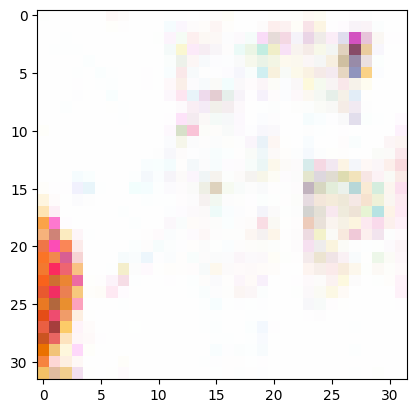

[399/500][0/936]	Loss_D: 0.0017	Loss_G: 12.6999	D(x): 1.0000	D(G(z)): 0.0017 / 0.0014
[399/500][15/936]	Loss_D: 0.0006	Loss_G: 8.8416	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
[399/500][30/936]	Loss_D: 0.0012	Loss_G: 9.0754	D(x): 1.0000	D(G(z)): 0.0012 / 0.0007
[399/500][45/936]	Loss_D: 0.0003	Loss_G: 9.5118	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[399/500][60/936]	Loss_D: 0.0000	Loss_G: 22.1765	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[399/500][75/936]	Loss_D: 0.0020	Loss_G: 24.3500	D(x): 0.9980	D(G(z)): 0.0000 / 0.0000
[399/500][90/936]	Loss_D: 0.0000	Loss_G: 18.9286	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[399/500][105/936]	Loss_D: 0.0000	Loss_G: 14.0226	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[399/500][120/936]	Loss_D: 0.0001	Loss_G: 10.5069	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[399/500][135/936]	Loss_D: 0.0003	Loss_G: 10.4406	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[399/500][150/936]	Loss_D: 0.0004	Loss_G: 8.6228	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[399/500][165/936]	Loss_D: 0.0016	Loss_G: 7.

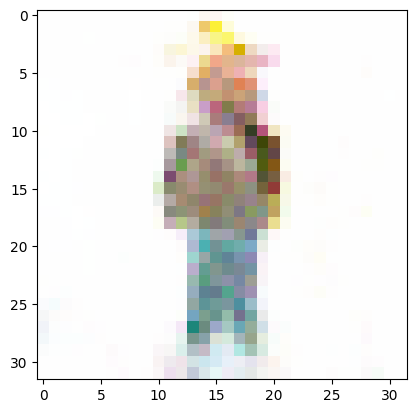

[400/500][0/936]	Loss_D: 0.0007	Loss_G: 10.0795	D(x): 0.9994	D(G(z)): 0.0002 / 0.0002
[400/500][15/936]	Loss_D: 0.0005	Loss_G: 10.1747	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[400/500][30/936]	Loss_D: 0.0007	Loss_G: 8.9507	D(x): 0.9998	D(G(z)): 0.0005 / 0.0005
[400/500][45/936]	Loss_D: 0.0000	Loss_G: 14.4311	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[400/500][60/936]	Loss_D: 0.0008	Loss_G: 8.0673	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[400/500][75/936]	Loss_D: 0.0002	Loss_G: 9.1242	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[400/500][90/936]	Loss_D: 0.0012	Loss_G: 7.4505	D(x): 1.0000	D(G(z)): 0.0011 / 0.0011
[400/500][105/936]	Loss_D: 0.2465	Loss_G: 7.6923	D(x): 1.0000	D(G(z)): 0.1953 / 0.0006
[400/500][120/936]	Loss_D: 0.0001	Loss_G: 9.3608	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[400/500][135/936]	Loss_D: 0.0604	Loss_G: 5.3542	D(x): 1.0000	D(G(z)): 0.0561 / 0.0124
[400/500][150/936]	Loss_D: 0.0059	Loss_G: 5.3728	D(x): 1.0000	D(G(z)): 0.0059 / 0.0051
[400/500][165/936]	Loss_D: 0.0258	Loss_G: 4.8952

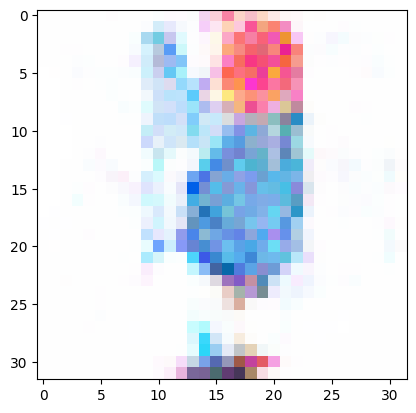

[401/500][0/936]	Loss_D: 0.0052	Loss_G: 7.1676	D(x): 1.0000	D(G(z)): 0.0052 / 0.0049
[401/500][15/936]	Loss_D: 0.0005	Loss_G: 8.8254	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[401/500][30/936]	Loss_D: 0.0018	Loss_G: 6.9565	D(x): 1.0000	D(G(z)): 0.0018 / 0.0011
[401/500][45/936]	Loss_D: 0.0004	Loss_G: 12.1253	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[401/500][60/936]	Loss_D: 0.0067	Loss_G: 5.5142	D(x): 0.9996	D(G(z)): 0.0063 / 0.0041
[401/500][75/936]	Loss_D: 0.0019	Loss_G: 6.9314	D(x): 1.0000	D(G(z)): 0.0019 / 0.0016
[401/500][90/936]	Loss_D: 0.0351	Loss_G: 10.2382	D(x): 0.9673	D(G(z)): 0.0002 / 0.0003
[401/500][105/936]	Loss_D: 0.0004	Loss_G: 8.8488	D(x): 0.9999	D(G(z)): 0.0003 / 0.0002
[401/500][120/936]	Loss_D: 0.0009	Loss_G: 7.3674	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[401/500][135/936]	Loss_D: 0.0015	Loss_G: 7.1188	D(x): 1.0000	D(G(z)): 0.0015 / 0.0012
[401/500][150/936]	Loss_D: 0.0001	Loss_G: 10.7602	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[401/500][165/936]	Loss_D: 0.0177	Loss_G: 5.9794

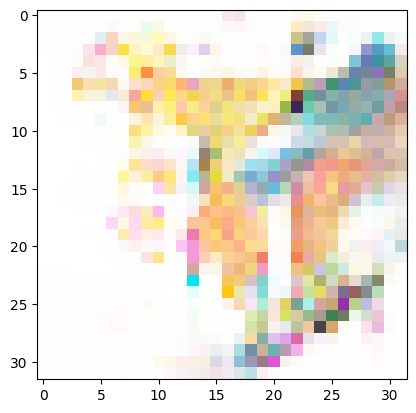

[402/500][0/936]	Loss_D: 0.0002	Loss_G: 19.8410	D(x): 1.0000	D(G(z)): 0.0002 / 0.0000
[402/500][15/936]	Loss_D: 0.0037	Loss_G: 6.1864	D(x): 1.0000	D(G(z)): 0.0037 / 0.0023
[402/500][30/936]	Loss_D: 0.0000	Loss_G: 13.0851	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[402/500][45/936]	Loss_D: 0.0000	Loss_G: 16.1374	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[402/500][60/936]	Loss_D: 0.0017	Loss_G: 8.1530	D(x): 1.0000	D(G(z)): 0.0017 / 0.0015
[402/500][75/936]	Loss_D: 0.0006	Loss_G: 8.3173	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[402/500][90/936]	Loss_D: 0.0027	Loss_G: 6.3834	D(x): 1.0000	D(G(z)): 0.0027 / 0.0020
[402/500][105/936]	Loss_D: 0.0003	Loss_G: 8.8194	D(x): 0.9998	D(G(z)): 0.0002 / 0.0002
[402/500][120/936]	Loss_D: 0.0003	Loss_G: 8.6577	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[402/500][135/936]	Loss_D: 0.0031	Loss_G: 6.6883	D(x): 1.0000	D(G(z)): 0.0031 / 0.0019
[402/500][150/936]	Loss_D: 0.0035	Loss_G: 6.2613	D(x): 1.0000	D(G(z)): 0.0035 / 0.0028
[402/500][165/936]	Loss_D: 0.0015	Loss_G: 6.8906

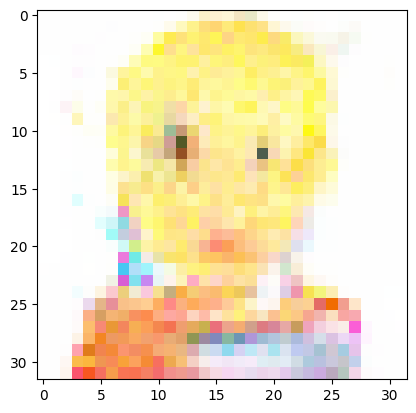

[403/500][0/936]	Loss_D: 0.0010	Loss_G: 7.0110	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[403/500][15/936]	Loss_D: 0.0008	Loss_G: 7.7926	D(x): 0.9997	D(G(z)): 0.0005 / 0.0005
[403/500][30/936]	Loss_D: 0.0393	Loss_G: 26.1150	D(x): 0.9637	D(G(z)): 0.0000 / 0.0000
[403/500][45/936]	Loss_D: 0.0003	Loss_G: 18.3542	D(x): 0.9997	D(G(z)): 0.0000 / 0.0000
[403/500][60/936]	Loss_D: 0.0844	Loss_G: 7.5094	D(x): 1.0000	D(G(z)): 0.0777 / 0.0021
[403/500][75/936]	Loss_D: 0.0082	Loss_G: 6.6292	D(x): 1.0000	D(G(z)): 0.0082 / 0.0044
[403/500][90/936]	Loss_D: 0.0000	Loss_G: 16.8951	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[403/500][105/936]	Loss_D: 0.0086	Loss_G: 5.0442	D(x): 1.0000	D(G(z)): 0.0085 / 0.0066
[403/500][120/936]	Loss_D: 0.0021	Loss_G: 6.3467	D(x): 1.0000	D(G(z)): 0.0021 / 0.0020
[403/500][135/936]	Loss_D: 0.0001	Loss_G: 17.4798	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[403/500][150/936]	Loss_D: 0.0042	Loss_G: 10.5407	D(x): 1.0000	D(G(z)): 0.0041 / 0.0036
[403/500][165/936]	Loss_D: 0.0143	Loss_G: 5.23

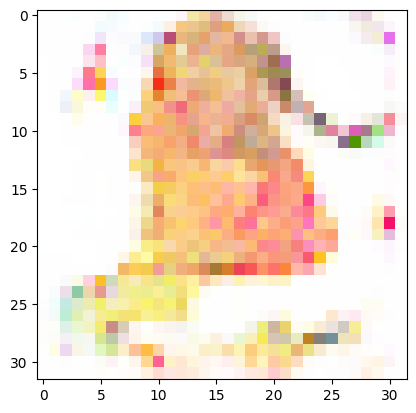

[404/500][0/936]	Loss_D: 0.0142	Loss_G: 4.8591	D(x): 1.0000	D(G(z)): 0.0141 / 0.0081
[404/500][15/936]	Loss_D: 0.0075	Loss_G: 6.9141	D(x): 0.9938	D(G(z)): 0.0012 / 0.0011
[404/500][30/936]	Loss_D: 0.0009	Loss_G: 8.1505	D(x): 0.9996	D(G(z)): 0.0005 / 0.0005
[404/500][45/936]	Loss_D: 0.0029	Loss_G: 6.1896	D(x): 1.0000	D(G(z)): 0.0029 / 0.0024
[404/500][60/936]	Loss_D: 0.0138	Loss_G: 5.7515	D(x): 0.9951	D(G(z)): 0.0087 / 0.0059
[404/500][75/936]	Loss_D: 0.0004	Loss_G: 8.1676	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[404/500][90/936]	Loss_D: 0.0005	Loss_G: 7.8258	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[404/500][105/936]	Loss_D: 0.0025	Loss_G: 6.1919	D(x): 1.0000	D(G(z)): 0.0025 / 0.0022
[404/500][120/936]	Loss_D: 0.0001	Loss_G: 9.0665	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[404/500][135/936]	Loss_D: 0.0001	Loss_G: 9.5120	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[404/500][150/936]	Loss_D: 0.0011	Loss_G: 7.0311	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[404/500][165/936]	Loss_D: 0.0044	Loss_G: 6.6208	D(

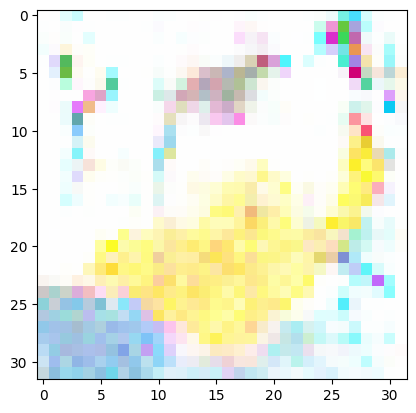

[405/500][0/936]	Loss_D: 0.0044	Loss_G: 5.9902	D(x): 1.0000	D(G(z)): 0.0044 / 0.0025
[405/500][15/936]	Loss_D: 0.0015	Loss_G: 6.6828	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[405/500][30/936]	Loss_D: 0.0004	Loss_G: 8.4300	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[405/500][45/936]	Loss_D: 0.0120	Loss_G: 6.4676	D(x): 1.0000	D(G(z)): 0.0119 / 0.0044
[405/500][60/936]	Loss_D: 0.0000	Loss_G: 14.0693	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[405/500][75/936]	Loss_D: 0.0033	Loss_G: 7.2282	D(x): 1.0000	D(G(z)): 0.0033 / 0.0022
[405/500][90/936]	Loss_D: 0.0271	Loss_G: 5.8868	D(x): 0.9806	D(G(z)): 0.0069 / 0.0047
[405/500][105/936]	Loss_D: 0.0242	Loss_G: 10.5658	D(x): 0.9765	D(G(z)): 0.0000 / 0.0000
[405/500][120/936]	Loss_D: 0.0002	Loss_G: 8.7315	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[405/500][135/936]	Loss_D: 0.0040	Loss_G: 6.0223	D(x): 1.0000	D(G(z)): 0.0040 / 0.0028
[405/500][150/936]	Loss_D: 0.0024	Loss_G: 11.5263	D(x): 1.0000	D(G(z)): 0.0024 / 0.0016
[405/500][165/936]	Loss_D: 0.0000	Loss_G: 10.789

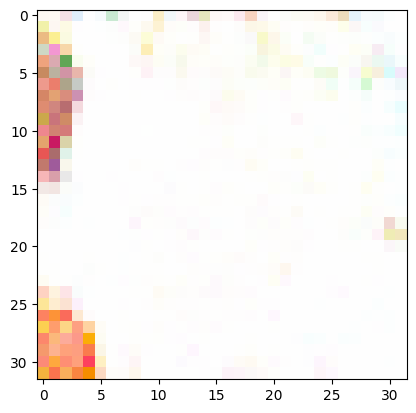

[406/500][0/936]	Loss_D: 0.0002	Loss_G: 8.8140	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[406/500][15/936]	Loss_D: 0.0036	Loss_G: 5.8425	D(x): 1.0000	D(G(z)): 0.0036 / 0.0030
[406/500][30/936]	Loss_D: 0.0025	Loss_G: 6.2836	D(x): 1.0000	D(G(z)): 0.0025 / 0.0020
[406/500][45/936]	Loss_D: 0.0011	Loss_G: 8.2275	D(x): 0.9998	D(G(z)): 0.0009 / 0.0008
[406/500][60/936]	Loss_D: 0.0059	Loss_G: 6.5932	D(x): 1.0000	D(G(z)): 0.0058 / 0.0036
[406/500][75/936]	Loss_D: 0.0016	Loss_G: 7.0122	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[406/500][90/936]	Loss_D: 0.0006	Loss_G: 9.5435	D(x): 0.9994	D(G(z)): 0.0001 / 0.0001
[406/500][105/936]	Loss_D: 0.0003	Loss_G: 8.6245	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[406/500][120/936]	Loss_D: 0.0009	Loss_G: 7.3697	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[406/500][135/936]	Loss_D: 0.0001	Loss_G: 9.2800	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[406/500][150/936]	Loss_D: 0.0000	Loss_G: 11.2201	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[406/500][165/936]	Loss_D: 0.0012	Loss_G: 6.9928	D

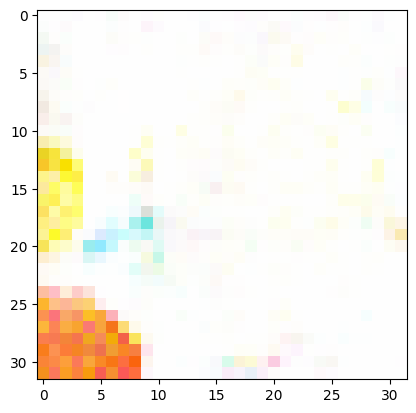

[407/500][0/936]	Loss_D: 0.0003	Loss_G: 8.9939	D(x): 0.9999	D(G(z)): 0.0002 / 0.0002
[407/500][15/936]	Loss_D: 0.0006	Loss_G: 18.1247	D(x): 0.9994	D(G(z)): 0.0000 / 0.0000
[407/500][30/936]	Loss_D: 0.0002	Loss_G: 9.2075	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[407/500][45/936]	Loss_D: 0.0000	Loss_G: 13.4005	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[407/500][60/936]	Loss_D: 0.0002	Loss_G: 9.7111	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[407/500][75/936]	Loss_D: 0.0000	Loss_G: 13.1191	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[407/500][90/936]	Loss_D: 0.1370	Loss_G: 10.0340	D(x): 1.0000	D(G(z)): 0.1113 / 0.0001
[407/500][105/936]	Loss_D: 0.0136	Loss_G: 6.7655	D(x): 1.0000	D(G(z)): 0.0133 / 0.0050
[407/500][120/936]	Loss_D: 0.0000	Loss_G: 13.6551	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[407/500][135/936]	Loss_D: 0.0003	Loss_G: 25.7726	D(x): 0.9997	D(G(z)): 0.0000 / 0.0000
[407/500][150/936]	Loss_D: 0.0277	Loss_G: 24.5883	D(x): 0.9737	D(G(z)): 0.0000 / 0.0000
[407/500][165/936]	Loss_D: 0.0001	Loss_G: 17

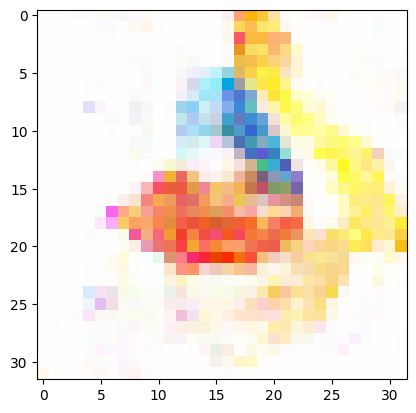

[408/500][0/936]	Loss_D: 0.0026	Loss_G: 6.1840	D(x): 0.9999	D(G(z)): 0.0025 / 0.0023
[408/500][15/936]	Loss_D: 0.0085	Loss_G: 5.2211	D(x): 1.0000	D(G(z)): 0.0084 / 0.0056
[408/500][30/936]	Loss_D: 0.0008	Loss_G: 7.3737	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[408/500][45/936]	Loss_D: 0.0005	Loss_G: 8.0005	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[408/500][60/936]	Loss_D: 0.0017	Loss_G: 7.1147	D(x): 1.0000	D(G(z)): 0.0017 / 0.0016
[408/500][75/936]	Loss_D: 0.0078	Loss_G: 5.5013	D(x): 0.9999	D(G(z)): 0.0077 / 0.0055
[408/500][90/936]	Loss_D: 0.0034	Loss_G: 5.9179	D(x): 1.0000	D(G(z)): 0.0034 / 0.0030
[408/500][105/936]	Loss_D: 0.0004	Loss_G: 8.0648	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[408/500][120/936]	Loss_D: 0.0000	Loss_G: 11.5171	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[408/500][135/936]	Loss_D: 0.0082	Loss_G: 7.8711	D(x): 1.0000	D(G(z)): 0.0081 / 0.0041
[408/500][150/936]	Loss_D: 0.0025	Loss_G: 7.1838	D(x): 1.0000	D(G(z)): 0.0024 / 0.0017
[408/500][165/936]	Loss_D: 0.1632	Loss_G: 22.5220	

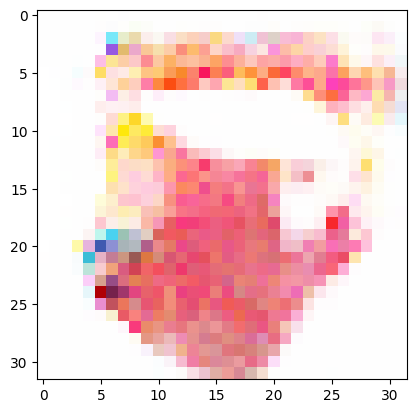

[409/500][0/936]	Loss_D: 0.0287	Loss_G: 4.5723	D(x): 1.0000	D(G(z)): 0.0281 / 0.0112
[409/500][15/936]	Loss_D: 0.0000	Loss_G: 11.7462	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[409/500][30/936]	Loss_D: 0.0008	Loss_G: 7.2997	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[409/500][45/936]	Loss_D: 0.0019	Loss_G: 6.8816	D(x): 1.0000	D(G(z)): 0.0019 / 0.0017
[409/500][60/936]	Loss_D: 0.1655	Loss_G: 7.6747	D(x): 1.0000	D(G(z)): 0.1484 / 0.0008
[409/500][75/936]	Loss_D: 0.0009	Loss_G: 7.1605	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[409/500][90/936]	Loss_D: 0.0000	Loss_G: 12.1091	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[409/500][105/936]	Loss_D: 0.0001	Loss_G: 10.4325	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[409/500][120/936]	Loss_D: 0.0567	Loss_G: 5.3754	D(x): 1.0000	D(G(z)): 0.0547 / 0.0052
[409/500][135/936]	Loss_D: 0.0000	Loss_G: 13.6555	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[409/500][150/936]	Loss_D: 0.0000	Loss_G: 11.3189	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[409/500][165/936]	Loss_D: 0.0000	Loss_G: 13.7

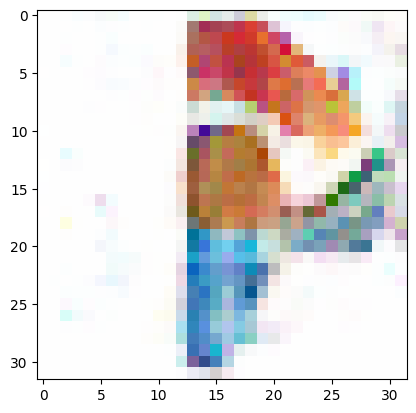

[410/500][0/936]	Loss_D: 0.0017	Loss_G: 7.1683	D(x): 1.0000	D(G(z)): 0.0017 / 0.0015
[410/500][15/936]	Loss_D: 0.0001	Loss_G: 10.0482	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[410/500][30/936]	Loss_D: 0.0003	Loss_G: 8.8351	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[410/500][45/936]	Loss_D: 0.0002	Loss_G: 9.2339	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[410/500][60/936]	Loss_D: 0.0000	Loss_G: 19.9667	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[410/500][75/936]	Loss_D: 0.0005	Loss_G: 7.9205	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[410/500][90/936]	Loss_D: 0.0015	Loss_G: 6.7327	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[410/500][105/936]	Loss_D: 0.0018	Loss_G: 10.4205	D(x): 0.9982	D(G(z)): 0.0000 / 0.0000
[410/500][120/936]	Loss_D: 0.0003	Loss_G: 8.7091	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[410/500][135/936]	Loss_D: 0.0005	Loss_G: 8.3108	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[410/500][150/936]	Loss_D: 0.0020	Loss_G: 9.1277	D(x): 0.9981	D(G(z)): 0.0001 / 0.0001
[410/500][165/936]	Loss_D: 0.0010	Loss_G: 9.1919

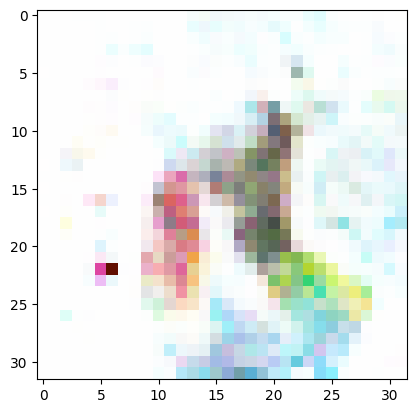

[411/500][0/936]	Loss_D: 0.0003	Loss_G: 24.2870	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[411/500][15/936]	Loss_D: 0.0001	Loss_G: 11.9189	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[411/500][30/936]	Loss_D: 0.0010	Loss_G: 16.0625	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[411/500][45/936]	Loss_D: 0.0000	Loss_G: 13.9712	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[411/500][60/936]	Loss_D: 0.0001	Loss_G: 14.2332	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[411/500][75/936]	Loss_D: 0.0013	Loss_G: 10.2290	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[411/500][90/936]	Loss_D: 0.0039	Loss_G: 8.0699	D(x): 1.0000	D(G(z)): 0.0038 / 0.0028
[411/500][105/936]	Loss_D: 0.0030	Loss_G: 6.1829	D(x): 1.0000	D(G(z)): 0.0030 / 0.0027
[411/500][120/936]	Loss_D: 0.0004	Loss_G: 9.2704	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[411/500][135/936]	Loss_D: 0.0000	Loss_G: 25.7552	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[411/500][150/936]	Loss_D: 0.0016	Loss_G: 12.8715	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[411/500][165/936]	Loss_D: 0.0000	Loss_G: 1

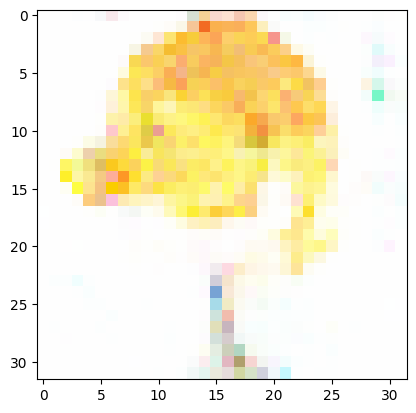

[412/500][0/936]	Loss_D: 0.0005	Loss_G: 8.6758	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[412/500][15/936]	Loss_D: 0.0008	Loss_G: 7.3280	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[412/500][30/936]	Loss_D: 0.0025	Loss_G: 6.7081	D(x): 0.9991	D(G(z)): 0.0016 / 0.0014
[412/500][45/936]	Loss_D: 0.0013	Loss_G: 6.9688	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[412/500][60/936]	Loss_D: 0.0037	Loss_G: 5.8540	D(x): 1.0000	D(G(z)): 0.0037 / 0.0031
[412/500][75/936]	Loss_D: 0.0000	Loss_G: 13.6147	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[412/500][90/936]	Loss_D: 0.0088	Loss_G: 5.1719	D(x): 1.0000	D(G(z)): 0.0088 / 0.0058
[412/500][105/936]	Loss_D: 0.0006	Loss_G: 7.7094	D(x): 0.9999	D(G(z)): 0.0005 / 0.0005
[412/500][120/936]	Loss_D: 0.0023	Loss_G: 6.2805	D(x): 1.0000	D(G(z)): 0.0023 / 0.0021
[412/500][135/936]	Loss_D: 0.0002	Loss_G: 8.4146	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[412/500][150/936]	Loss_D: 0.0037	Loss_G: 6.9689	D(x): 0.9973	D(G(z)): 0.0010 / 0.0010
[412/500][165/936]	Loss_D: 0.0021	Loss_G: 6.4598	D

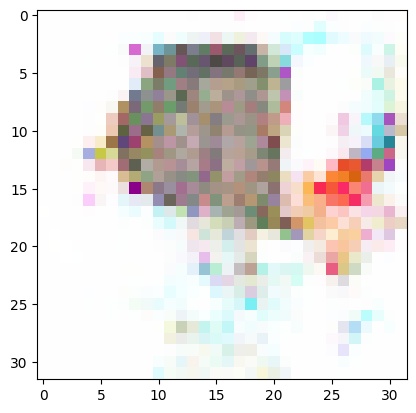

[413/500][0/936]	Loss_D: 0.0015	Loss_G: 6.7761	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[413/500][15/936]	Loss_D: 0.0044	Loss_G: 5.8841	D(x): 1.0000	D(G(z)): 0.0043 / 0.0030
[413/500][30/936]	Loss_D: 0.0006	Loss_G: 8.1105	D(x): 0.9997	D(G(z)): 0.0003 / 0.0003
[413/500][45/936]	Loss_D: 0.0048	Loss_G: 9.4291	D(x): 1.0000	D(G(z)): 0.0047 / 0.0040
[413/500][60/936]	Loss_D: 0.0051	Loss_G: 9.1894	D(x): 1.0000	D(G(z)): 0.0050 / 0.0039
[413/500][75/936]	Loss_D: 0.0057	Loss_G: 5.8290	D(x): 1.0000	D(G(z)): 0.0056 / 0.0043
[413/500][90/936]	Loss_D: 0.0002	Loss_G: 9.6318	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[413/500][105/936]	Loss_D: 0.0001	Loss_G: 9.8381	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[413/500][120/936]	Loss_D: 0.0092	Loss_G: 5.2281	D(x): 1.0000	D(G(z)): 0.0091 / 0.0054
[413/500][135/936]	Loss_D: 0.0020	Loss_G: 6.6038	D(x): 1.0000	D(G(z)): 0.0020 / 0.0017
[413/500][150/936]	Loss_D: 0.0002	Loss_G: 9.8705	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[413/500][165/936]	Loss_D: 0.0000	Loss_G: 14.6802	D

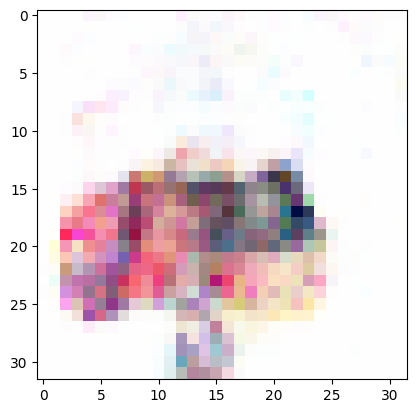

[414/500][0/936]	Loss_D: 0.0034	Loss_G: 8.0969	D(x): 1.0000	D(G(z)): 0.0033 / 0.0025
[414/500][15/936]	Loss_D: 0.0002	Loss_G: 9.1908	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[414/500][30/936]	Loss_D: 0.0000	Loss_G: 11.2136	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[414/500][45/936]	Loss_D: 0.0015	Loss_G: 8.0429	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[414/500][60/936]	Loss_D: 0.0130	Loss_G: 5.0562	D(x): 1.0000	D(G(z)): 0.0129 / 0.0068
[414/500][75/936]	Loss_D: 0.0002	Loss_G: 9.0268	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[414/500][90/936]	Loss_D: 0.0074	Loss_G: 6.8009	D(x): 1.0000	D(G(z)): 0.0073 / 0.0059
[414/500][105/936]	Loss_D: 0.0002	Loss_G: 8.7781	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[414/500][120/936]	Loss_D: 0.0266	Loss_G: 4.9351	D(x): 1.0000	D(G(z)): 0.0259 / 0.0141
[414/500][135/936]	Loss_D: 0.0018	Loss_G: 6.7390	D(x): 1.0000	D(G(z)): 0.0018 / 0.0016
[414/500][150/936]	Loss_D: 0.0000	Loss_G: 10.4148	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[414/500][165/936]	Loss_D: 0.0001	Loss_G: 12.2307

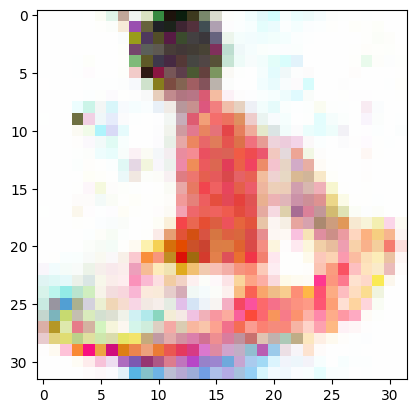

[415/500][0/936]	Loss_D: 0.0077	Loss_G: 10.7890	D(x): 1.0000	D(G(z)): 0.0076 / 0.0045
[415/500][15/936]	Loss_D: 0.0027	Loss_G: 9.4214	D(x): 0.9996	D(G(z)): 0.0023 / 0.0009
[415/500][30/936]	Loss_D: 0.0003	Loss_G: 9.3137	D(x): 1.0000	D(G(z)): 0.0003 / 0.0004
[415/500][45/936]	Loss_D: 0.0205	Loss_G: 5.7021	D(x): 1.0000	D(G(z)): 0.0198 / 0.0069
[415/500][60/936]	Loss_D: 0.0003	Loss_G: 8.2086	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[415/500][75/936]	Loss_D: 0.0014	Loss_G: 6.9832	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[415/500][90/936]	Loss_D: 0.0000	Loss_G: 10.6724	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[415/500][105/936]	Loss_D: 0.0000	Loss_G: 15.1081	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[415/500][120/936]	Loss_D: 0.0003	Loss_G: 8.2956	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[415/500][135/936]	Loss_D: 0.0128	Loss_G: 5.1420	D(x): 1.0000	D(G(z)): 0.0126 / 0.0073
[415/500][150/936]	Loss_D: 0.0005	Loss_G: 8.2220	D(x): 0.9999	D(G(z)): 0.0005 / 0.0004
[415/500][165/936]	Loss_D: 0.0022	Loss_G: 6.4994

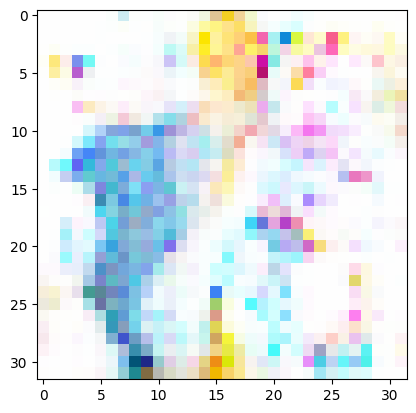

[416/500][0/936]	Loss_D: 0.0003	Loss_G: 8.6384	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[416/500][15/936]	Loss_D: 0.0005	Loss_G: 8.3123	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[416/500][30/936]	Loss_D: 0.0012	Loss_G: 6.9674	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[416/500][45/936]	Loss_D: 0.0001	Loss_G: 12.2057	D(x): 1.0000	D(G(z)): 0.0001 / 0.0003
[416/500][60/936]	Loss_D: 0.0009	Loss_G: 7.3808	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[416/500][75/936]	Loss_D: 0.0024	Loss_G: 6.3054	D(x): 1.0000	D(G(z)): 0.0024 / 0.0020
[416/500][90/936]	Loss_D: 0.0019	Loss_G: 6.6488	D(x): 1.0000	D(G(z)): 0.0019 / 0.0016
[416/500][105/936]	Loss_D: 0.0009	Loss_G: 7.4016	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[416/500][120/936]	Loss_D: 0.0001	Loss_G: 9.8897	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[416/500][135/936]	Loss_D: 0.0011	Loss_G: 6.7861	D(x): 0.9998	D(G(z)): 0.0009 / 0.0013
[416/500][150/936]	Loss_D: 0.0011	Loss_G: 10.3526	D(x): 0.9990	D(G(z)): 0.0001 / 0.0001
[416/500][165/936]	Loss_D: 0.0001	Loss_G: 11.5359

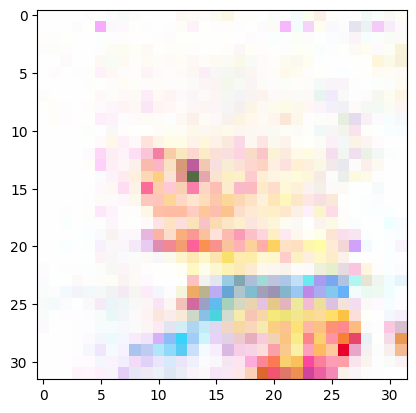

[417/500][0/936]	Loss_D: 1.9560	Loss_G: 17.4760	D(x): 1.0000	D(G(z)): 0.8317 / 0.0000
[417/500][15/936]	Loss_D: 0.0000	Loss_G: 16.3747	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[417/500][30/936]	Loss_D: 0.0009	Loss_G: 7.4832	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[417/500][45/936]	Loss_D: 0.0001	Loss_G: 11.4269	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[417/500][60/936]	Loss_D: 0.0000	Loss_G: 14.5097	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[417/500][75/936]	Loss_D: 3.3086	Loss_G: 24.7483	D(x): 1.0000	D(G(z)): 0.9623 / 0.0000
[417/500][90/936]	Loss_D: 0.0004	Loss_G: 10.4214	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[417/500][105/936]	Loss_D: 0.0025	Loss_G: 7.0404	D(x): 1.0000	D(G(z)): 0.0025 / 0.0033
[417/500][120/936]	Loss_D: 0.0058	Loss_G: 19.1968	D(x): 0.9942	D(G(z)): 0.0000 / 0.0000
[417/500][135/936]	Loss_D: 0.0000	Loss_G: 18.5720	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[417/500][150/936]	Loss_D: 0.0270	Loss_G: 5.8161	D(x): 1.0000	D(G(z)): 0.0262 / 0.0094
[417/500][165/936]	Loss_D: 0.0021	Loss_G: 6

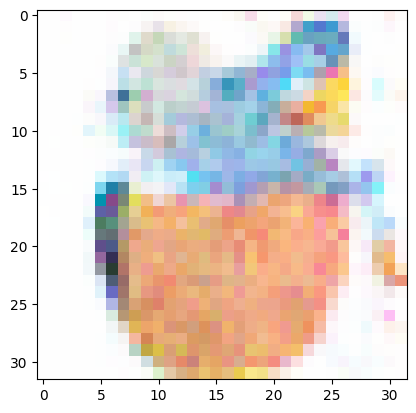

[418/500][0/936]	Loss_D: 0.0009	Loss_G: 13.3721	D(x): 1.0000	D(G(z)): 0.0008 / 0.0001
[418/500][15/936]	Loss_D: 0.0000	Loss_G: 13.5523	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[418/500][30/936]	Loss_D: 0.0000	Loss_G: 13.1545	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[418/500][45/936]	Loss_D: 0.0003	Loss_G: 8.7932	D(x): 0.9999	D(G(z)): 0.0003 / 0.0002
[418/500][60/936]	Loss_D: 0.0106	Loss_G: 4.8787	D(x): 1.0000	D(G(z)): 0.0105 / 0.0129
[418/500][75/936]	Loss_D: 0.0035	Loss_G: 6.5217	D(x): 1.0000	D(G(z)): 0.0035 / 0.0027
[418/500][90/936]	Loss_D: 0.0002	Loss_G: 16.6490	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[418/500][105/936]	Loss_D: 0.0058	Loss_G: 5.4969	D(x): 1.0000	D(G(z)): 0.0057 / 0.0126
[418/500][120/936]	Loss_D: 0.0111	Loss_G: 5.4259	D(x): 1.0000	D(G(z)): 0.0109 / 0.0068
[418/500][135/936]	Loss_D: 0.0081	Loss_G: 6.7339	D(x): 1.0000	D(G(z)): 0.0080 / 0.0067
[418/500][150/936]	Loss_D: 0.0000	Loss_G: 12.4204	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[418/500][165/936]	Loss_D: 0.0007	Loss_G: 9.05

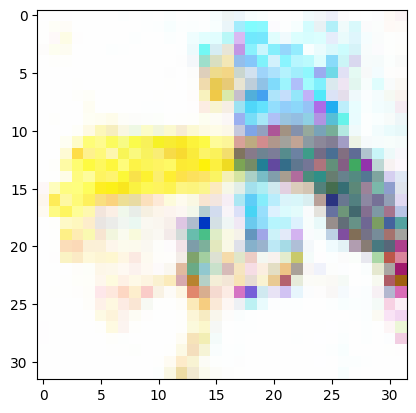

[419/500][0/936]	Loss_D: 0.0000	Loss_G: 12.5056	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[419/500][15/936]	Loss_D: 0.0033	Loss_G: 5.9458	D(x): 1.0000	D(G(z)): 0.0033 / 0.0028
[419/500][30/936]	Loss_D: 0.0012	Loss_G: 9.0992	D(x): 1.0000	D(G(z)): 0.0012 / 0.0007
[419/500][45/936]	Loss_D: 0.0031	Loss_G: 6.1741	D(x): 1.0000	D(G(z)): 0.0031 / 0.0030
[419/500][60/936]	Loss_D: 0.0008	Loss_G: 7.3482	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[419/500][75/936]	Loss_D: 0.0014	Loss_G: 6.9931	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[419/500][90/936]	Loss_D: 0.0036	Loss_G: 5.9186	D(x): 1.0000	D(G(z)): 0.0036 / 0.0028
[419/500][105/936]	Loss_D: 0.0019	Loss_G: 7.3501	D(x): 1.0000	D(G(z)): 0.0019 / 0.0013
[419/500][120/936]	Loss_D: 0.0000	Loss_G: 15.2090	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[419/500][135/936]	Loss_D: 0.0040	Loss_G: 6.0162	D(x): 1.0000	D(G(z)): 0.0040 / 0.0028
[419/500][150/936]	Loss_D: 0.0448	Loss_G: 4.6871	D(x): 1.0000	D(G(z)): 0.0435 / 0.0133
[419/500][165/936]	Loss_D: 0.0016	Loss_G: 7.0035	

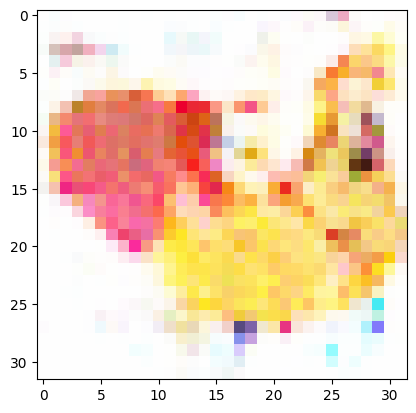

[420/500][0/936]	Loss_D: 0.0025	Loss_G: 7.8141	D(x): 0.9981	D(G(z)): 0.0006 / 0.0005
[420/500][15/936]	Loss_D: 0.0085	Loss_G: 5.4063	D(x): 1.0000	D(G(z)): 0.0085 / 0.0046
[420/500][30/936]	Loss_D: 0.0017	Loss_G: 6.7348	D(x): 1.0000	D(G(z)): 0.0017 / 0.0016
[420/500][45/936]	Loss_D: 0.0016	Loss_G: 6.7353	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[420/500][60/936]	Loss_D: 0.0160	Loss_G: 4.9172	D(x): 1.0000	D(G(z)): 0.0158 / 0.0078
[420/500][75/936]	Loss_D: 0.0021	Loss_G: 6.6874	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[420/500][90/936]	Loss_D: 0.0003	Loss_G: 8.2124	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[420/500][105/936]	Loss_D: 0.0002	Loss_G: 9.1755	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[420/500][120/936]	Loss_D: 0.0000	Loss_G: 10.8369	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[420/500][135/936]	Loss_D: 0.0045	Loss_G: 8.1625	D(x): 1.0000	D(G(z)): 0.0045 / 0.0014
[420/500][150/936]	Loss_D: 0.0055	Loss_G: 6.1649	D(x): 1.0000	D(G(z)): 0.0055 / 0.0041
[420/500][165/936]	Loss_D: 0.0005	Loss_G: 8.7397	D

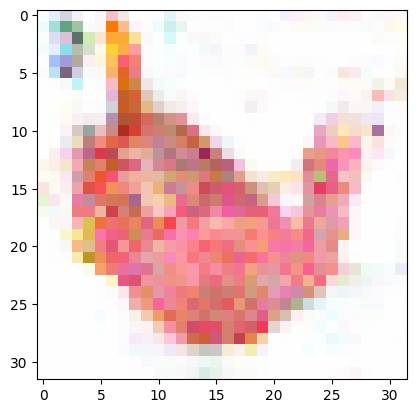

[421/500][0/936]	Loss_D: 0.0000	Loss_G: 14.9940	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[421/500][15/936]	Loss_D: 0.0130	Loss_G: 8.2396	D(x): 1.0000	D(G(z)): 0.0127 / 0.0034
[421/500][30/936]	Loss_D: 0.0065	Loss_G: 6.8376	D(x): 1.0000	D(G(z)): 0.0065 / 0.0030
[421/500][45/936]	Loss_D: 0.0014	Loss_G: 10.8954	D(x): 0.9986	D(G(z)): 0.0000 / 0.0000
[421/500][60/936]	Loss_D: 0.0000	Loss_G: 17.6168	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[421/500][75/936]	Loss_D: 0.0000	Loss_G: 11.2253	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[421/500][90/936]	Loss_D: 0.0035	Loss_G: 6.1825	D(x): 1.0000	D(G(z)): 0.0035 / 0.0023
[421/500][105/936]	Loss_D: 0.0001	Loss_G: 9.1679	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[421/500][120/936]	Loss_D: 0.0000	Loss_G: 11.9093	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[421/500][135/936]	Loss_D: 0.0003	Loss_G: 8.9772	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[421/500][150/936]	Loss_D: 0.0000	Loss_G: 12.9734	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[421/500][165/936]	Loss_D: 0.0083	Loss_G: 5.5

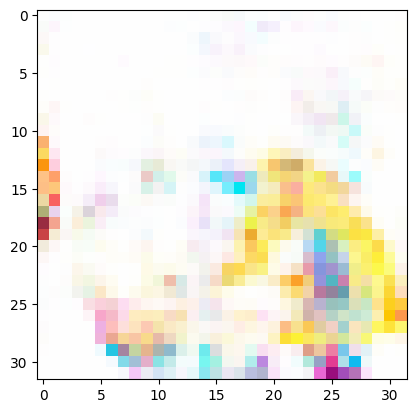

[422/500][0/936]	Loss_D: 0.0000	Loss_G: 28.3880	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[422/500][15/936]	Loss_D: 0.0003	Loss_G: 12.6821	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[422/500][30/936]	Loss_D: 0.0004	Loss_G: 11.5488	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[422/500][45/936]	Loss_D: 0.0000	Loss_G: 11.4862	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[422/500][60/936]	Loss_D: 0.0005	Loss_G: 8.3968	D(x): 1.0000	D(G(z)): 0.0005 / 0.0003
[422/500][75/936]	Loss_D: 0.0073	Loss_G: 5.5182	D(x): 1.0000	D(G(z)): 0.0072 / 0.0050
[422/500][90/936]	Loss_D: 0.0002	Loss_G: 9.1047	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[422/500][105/936]	Loss_D: 0.0007	Loss_G: 8.5593	D(x): 1.0000	D(G(z)): 0.0007 / 0.0005
[422/500][120/936]	Loss_D: 0.0007	Loss_G: 8.1947	D(x): 1.0000	D(G(z)): 0.0007 / 0.0005
[422/500][135/936]	Loss_D: 0.0006	Loss_G: 8.1947	D(x): 1.0000	D(G(z)): 0.0006 / 0.0007
[422/500][150/936]	Loss_D: 0.0282	Loss_G: 3.8356	D(x): 1.0000	D(G(z)): 0.0276 / 0.0304
[422/500][165/936]	Loss_D: 0.0000	Loss_G: 13.47

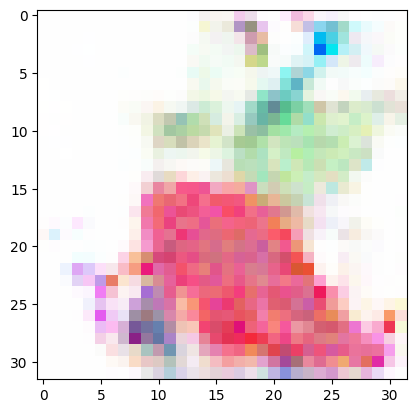

[423/500][0/936]	Loss_D: 0.0000	Loss_G: 18.4130	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[423/500][15/936]	Loss_D: 0.0132	Loss_G: 9.2054	D(x): 0.9872	D(G(z)): 0.0002 / 0.0002
[423/500][30/936]	Loss_D: 0.0000	Loss_G: 17.6507	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[423/500][45/936]	Loss_D: 0.0000	Loss_G: 17.2556	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[423/500][60/936]	Loss_D: 0.0152	Loss_G: 4.7784	D(x): 1.0000	D(G(z)): 0.0150 / 0.0266
[423/500][75/936]	Loss_D: 0.0007	Loss_G: 8.6991	D(x): 1.0000	D(G(z)): 0.0007 / 0.0007
[423/500][90/936]	Loss_D: 0.0008	Loss_G: 8.4384	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[423/500][105/936]	Loss_D: 0.0018	Loss_G: 7.0951	D(x): 1.0000	D(G(z)): 0.0018 / 0.0016
[423/500][120/936]	Loss_D: 0.0018	Loss_G: 6.7790	D(x): 1.0000	D(G(z)): 0.0018 / 0.0014
[423/500][135/936]	Loss_D: 0.0012	Loss_G: 7.2399	D(x): 1.0000	D(G(z)): 0.0012 / 0.0009
[423/500][150/936]	Loss_D: 0.0000	Loss_G: 14.9880	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[423/500][165/936]	Loss_D: 0.0022	Loss_G: 10.59

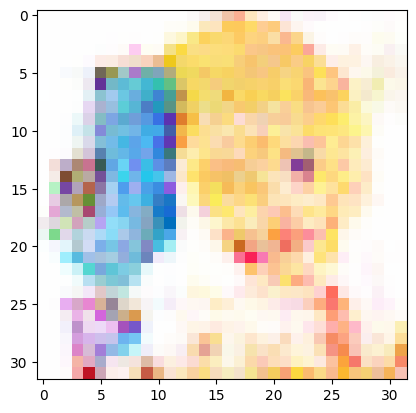

[424/500][0/936]	Loss_D: 0.0003	Loss_G: 9.0186	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[424/500][15/936]	Loss_D: 0.0100	Loss_G: 5.0638	D(x): 1.0000	D(G(z)): 0.0099 / 0.0077
[424/500][30/936]	Loss_D: 0.0000	Loss_G: 13.7039	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[424/500][45/936]	Loss_D: 0.4836	Loss_G: 9.2590	D(x): 1.0000	D(G(z)): 0.3684 / 0.0050
[424/500][60/936]	Loss_D: 0.0006	Loss_G: 12.2855	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[424/500][75/936]	Loss_D: 0.0073	Loss_G: 5.2622	D(x): 1.0000	D(G(z)): 0.0073 / 0.0056
[424/500][90/936]	Loss_D: 0.0081	Loss_G: 5.7163	D(x): 1.0000	D(G(z)): 0.0081 / 0.0039
[424/500][105/936]	Loss_D: 0.0016	Loss_G: 6.8272	D(x): 0.9999	D(G(z)): 0.0015 / 0.0012
[424/500][120/936]	Loss_D: 0.0017	Loss_G: 6.5471	D(x): 1.0000	D(G(z)): 0.0017 / 0.0015
[424/500][135/936]	Loss_D: 0.0022	Loss_G: 6.5323	D(x): 1.0000	D(G(z)): 0.0022 / 0.0020
[424/500][150/936]	Loss_D: 0.0001	Loss_G: 9.2359	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[424/500][165/936]	Loss_D: 0.0000	Loss_G: 11.1573

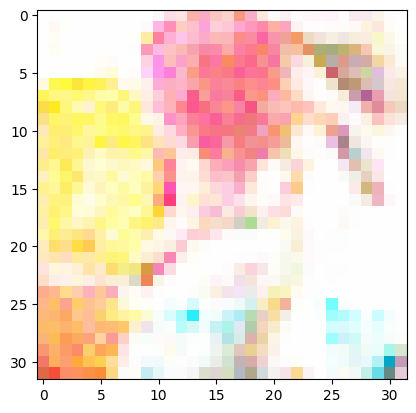

[425/500][0/936]	Loss_D: 0.0002	Loss_G: 17.9847	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[425/500][15/936]	Loss_D: 0.0013	Loss_G: 14.1579	D(x): 0.9987	D(G(z)): 0.0000 / 0.0000
[425/500][30/936]	Loss_D: 0.0002	Loss_G: 9.8088	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[425/500][45/936]	Loss_D: 0.0036	Loss_G: 6.3003	D(x): 1.0000	D(G(z)): 0.0036 / 0.0030
[425/500][60/936]	Loss_D: 0.0002	Loss_G: 11.7801	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[425/500][75/936]	Loss_D: 0.0001	Loss_G: 11.3528	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[425/500][90/936]	Loss_D: 0.0000	Loss_G: 18.9720	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[425/500][105/936]	Loss_D: 0.0000	Loss_G: 15.0560	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[425/500][120/936]	Loss_D: 0.0010	Loss_G: 8.2444	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[425/500][135/936]	Loss_D: 0.0009	Loss_G: 7.0449	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[425/500][150/936]	Loss_D: 0.0179	Loss_G: 4.9481	D(x): 1.0000	D(G(z)): 0.0177 / 0.0076
[425/500][165/936]	Loss_D: 0.0147	Loss_G: 5.6

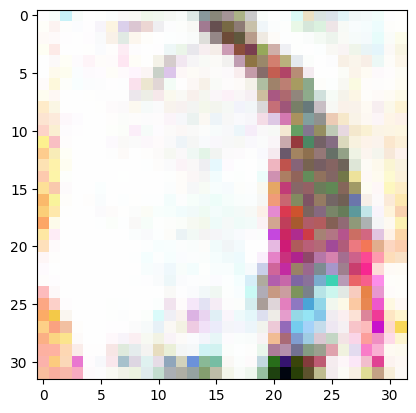

[426/500][0/936]	Loss_D: 0.0282	Loss_G: 3.0621	D(x): 1.0000	D(G(z)): 0.0278 / 0.0501
[426/500][15/936]	Loss_D: 0.0000	Loss_G: 21.0554	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[426/500][30/936]	Loss_D: 0.0006	Loss_G: 13.1371	D(x): 0.9999	D(G(z)): 0.0005 / 0.0004
[426/500][45/936]	Loss_D: 0.0013	Loss_G: 15.5959	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[426/500][60/936]	Loss_D: 0.2974	Loss_G: 13.3533	D(x): 0.8260	D(G(z)): 0.0000 / 0.0000
[426/500][75/936]	Loss_D: 0.0009	Loss_G: 9.0482	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[426/500][90/936]	Loss_D: 0.0015	Loss_G: 7.4203	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[426/500][105/936]	Loss_D: 0.0031	Loss_G: 6.6639	D(x): 1.0000	D(G(z)): 0.0031 / 0.0023
[426/500][120/936]	Loss_D: 0.0141	Loss_G: 6.5775	D(x): 1.0000	D(G(z)): 0.0139 / 0.0031
[426/500][135/936]	Loss_D: 0.0004	Loss_G: 8.8503	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[426/500][150/936]	Loss_D: 0.0006	Loss_G: 9.0497	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[426/500][165/936]	Loss_D: 0.0020	Loss_G: 7.417

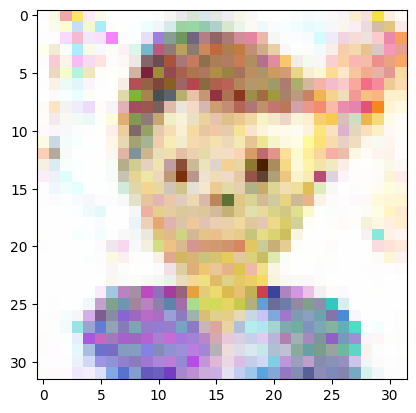

[427/500][0/936]	Loss_D: 0.0063	Loss_G: 5.7822	D(x): 1.0000	D(G(z)): 0.0063 / 0.0052
[427/500][15/936]	Loss_D: 0.0180	Loss_G: 5.6130	D(x): 1.0000	D(G(z)): 0.0178 / 0.0042
[427/500][30/936]	Loss_D: 0.0001	Loss_G: 10.6083	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[427/500][45/936]	Loss_D: 0.0000	Loss_G: 10.4554	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[427/500][60/936]	Loss_D: 0.0031	Loss_G: 7.2398	D(x): 0.9991	D(G(z)): 0.0022 / 0.0019
[427/500][75/936]	Loss_D: 0.3767	Loss_G: 5.0882	D(x): 0.8033	D(G(z)): 0.0048 / 0.0249
[427/500][90/936]	Loss_D: 0.0697	Loss_G: 8.2089	D(x): 0.9386	D(G(z)): 0.0004 / 0.0005
[427/500][105/936]	Loss_D: 0.0018	Loss_G: 7.2320	D(x): 1.0000	D(G(z)): 0.0018 / 0.0013
[427/500][120/936]	Loss_D: 0.1242	Loss_G: 6.3732	D(x): 1.0000	D(G(z)): 0.1054 / 0.0066
[427/500][135/936]	Loss_D: 0.0058	Loss_G: 7.8926	D(x): 1.0000	D(G(z)): 0.0057 / 0.0044
[427/500][150/936]	Loss_D: 0.0272	Loss_G: 6.4167	D(x): 0.9978	D(G(z)): 0.0244 / 0.0044
[427/500][165/936]	Loss_D: 0.0008	Loss_G: 7.4527	

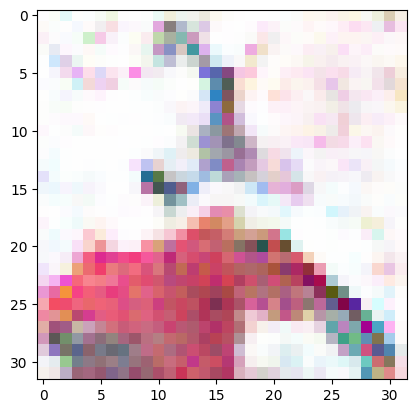

[428/500][0/936]	Loss_D: 0.0030	Loss_G: 7.5670	D(x): 0.9999	D(G(z)): 0.0030 / 0.0023
[428/500][15/936]	Loss_D: 0.0017	Loss_G: 7.6851	D(x): 1.0000	D(G(z)): 0.0017 / 0.0014
[428/500][30/936]	Loss_D: 0.0013	Loss_G: 9.7002	D(x): 0.9988	D(G(z)): 0.0002 / 0.0001
[428/500][45/936]	Loss_D: 0.0016	Loss_G: 6.5705	D(x): 1.0000	D(G(z)): 0.0016 / 0.0016
[428/500][60/936]	Loss_D: 0.0032	Loss_G: 7.0096	D(x): 1.0000	D(G(z)): 0.0032 / 0.0026
[428/500][75/936]	Loss_D: 0.0004	Loss_G: 8.2160	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[428/500][90/936]	Loss_D: 0.0006	Loss_G: 12.6978	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[428/500][105/936]	Loss_D: 0.0009	Loss_G: 9.7727	D(x): 1.0000	D(G(z)): 0.0009 / 0.0004
[428/500][120/936]	Loss_D: 0.0003	Loss_G: 8.2100	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[428/500][135/936]	Loss_D: 0.0089	Loss_G: 5.4679	D(x): 1.0000	D(G(z)): 0.0089 / 0.0043
[428/500][150/936]	Loss_D: 0.0020	Loss_G: 6.4344	D(x): 1.0000	D(G(z)): 0.0020 / 0.0016
[428/500][165/936]	Loss_D: 0.0083	Loss_G: 5.4136	D

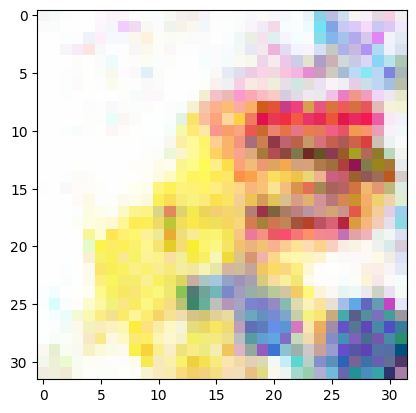

[429/500][0/936]	Loss_D: 0.0185	Loss_G: 27.0307	D(x): 0.9819	D(G(z)): 0.0000 / 0.0000
[429/500][15/936]	Loss_D: 0.0006	Loss_G: 15.8066	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[429/500][30/936]	Loss_D: 0.0000	Loss_G: 18.2325	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[429/500][45/936]	Loss_D: 0.0035	Loss_G: 12.2198	D(x): 1.0000	D(G(z)): 0.0035 / 0.0005
[429/500][60/936]	Loss_D: 0.0004	Loss_G: 8.7894	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[429/500][75/936]	Loss_D: 0.0020	Loss_G: 6.6745	D(x): 0.9999	D(G(z)): 0.0019 / 0.0013
[429/500][90/936]	Loss_D: 0.0000	Loss_G: 11.1422	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[429/500][105/936]	Loss_D: 0.0002	Loss_G: 8.6122	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[429/500][120/936]	Loss_D: 0.0005	Loss_G: 7.9109	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[429/500][135/936]	Loss_D: 0.0007	Loss_G: 7.5198	D(x): 1.0000	D(G(z)): 0.0007 / 0.0008
[429/500][150/936]	Loss_D: 0.0017	Loss_G: 6.7047	D(x): 1.0000	D(G(z)): 0.0017 / 0.0014
[429/500][165/936]	Loss_D: 0.0001	Loss_G: 11.1

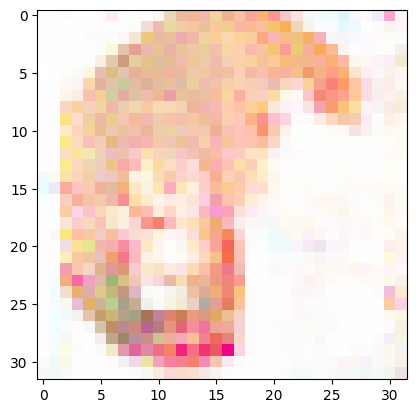

[430/500][0/936]	Loss_D: 0.0000	Loss_G: 12.4113	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[430/500][15/936]	Loss_D: 0.4918	Loss_G: 19.9193	D(x): 1.0000	D(G(z)): 0.3617 / 0.0000
[430/500][30/936]	Loss_D: 0.0002	Loss_G: 22.7886	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[430/500][45/936]	Loss_D: 0.0005	Loss_G: 18.8466	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[430/500][60/936]	Loss_D: 0.0004	Loss_G: 12.7270	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[430/500][75/936]	Loss_D: 0.0051	Loss_G: 8.0280	D(x): 0.9957	D(G(z)): 0.0008 / 0.0006
[430/500][90/936]	Loss_D: 0.0023	Loss_G: 7.7140	D(x): 1.0000	D(G(z)): 0.0023 / 0.0023
[430/500][105/936]	Loss_D: 0.0002	Loss_G: 15.1209	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[430/500][120/936]	Loss_D: 0.0012	Loss_G: 12.6147	D(x): 0.9988	D(G(z)): 0.0000 / 0.0000
[430/500][135/936]	Loss_D: 0.0121	Loss_G: 7.0496	D(x): 1.0000	D(G(z)): 0.0120 / 0.0155
[430/500][150/936]	Loss_D: 0.0001	Loss_G: 12.0473	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[430/500][165/936]	Loss_D: 0.0008	Loss_G: 7

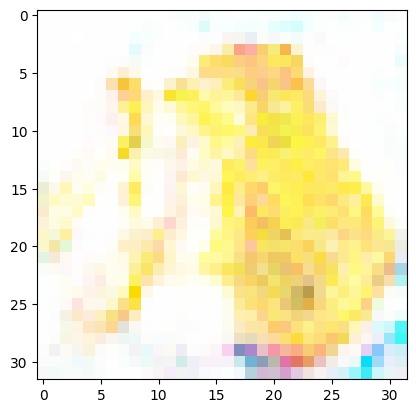

[431/500][0/936]	Loss_D: 0.0129	Loss_G: 5.0525	D(x): 1.0000	D(G(z)): 0.0128 / 0.0080
[431/500][15/936]	Loss_D: 0.0001	Loss_G: 9.6232	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[431/500][30/936]	Loss_D: 0.0016	Loss_G: 7.1612	D(x): 1.0000	D(G(z)): 0.0016 / 0.0012
[431/500][45/936]	Loss_D: 0.0000	Loss_G: 15.2563	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[431/500][60/936]	Loss_D: 0.0070	Loss_G: 6.7082	D(x): 1.0000	D(G(z)): 0.0070 / 0.0052
[431/500][75/936]	Loss_D: 0.0049	Loss_G: 6.4112	D(x): 1.0000	D(G(z)): 0.0049 / 0.0035
[431/500][90/936]	Loss_D: 0.0001	Loss_G: 9.1684	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[431/500][105/936]	Loss_D: 0.0000	Loss_G: 10.8869	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[431/500][120/936]	Loss_D: 0.0001	Loss_G: 10.1650	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[431/500][135/936]	Loss_D: 0.0015	Loss_G: 6.7022	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[431/500][150/936]	Loss_D: 0.0042	Loss_G: 13.2766	D(x): 0.9958	D(G(z)): 0.0000 / 0.0000
[431/500][165/936]	Loss_D: 0.0051	Loss_G: 5.983

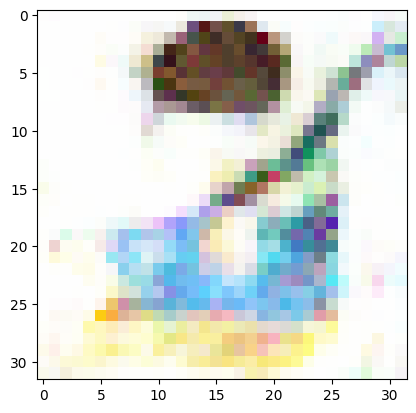

[432/500][0/936]	Loss_D: 0.0161	Loss_G: 29.0666	D(x): 0.9845	D(G(z)): 0.0000 / 0.0000
[432/500][15/936]	Loss_D: 0.0000	Loss_G: 18.4071	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[432/500][30/936]	Loss_D: 0.0109	Loss_G: 14.7219	D(x): 1.0000	D(G(z)): 0.0108 / 0.0070
[432/500][45/936]	Loss_D: 0.0000	Loss_G: 32.6703	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[432/500][60/936]	Loss_D: 0.0011	Loss_G: 7.5071	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[432/500][75/936]	Loss_D: 0.0002	Loss_G: 9.6037	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[432/500][90/936]	Loss_D: 0.0003	Loss_G: 9.4231	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[432/500][105/936]	Loss_D: 0.0010	Loss_G: 8.4399	D(x): 1.0000	D(G(z)): 0.0010 / 0.0006
[432/500][120/936]	Loss_D: 0.0063	Loss_G: 14.1109	D(x): 0.9938	D(G(z)): 0.0000 / 0.0000
[432/500][135/936]	Loss_D: 0.0000	Loss_G: 12.3699	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[432/500][150/936]	Loss_D: 0.0001	Loss_G: 9.5457	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[432/500][165/936]	Loss_D: 0.0003	Loss_G: 9.1

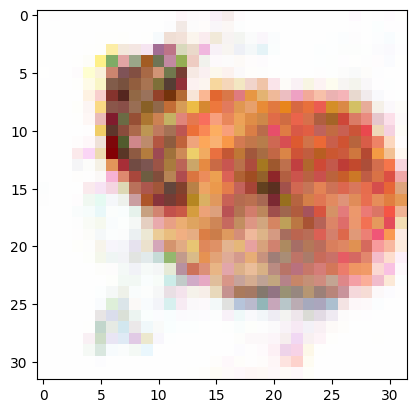

[433/500][0/936]	Loss_D: 0.0154	Loss_G: 4.4458	D(x): 1.0000	D(G(z)): 0.0152 / 0.0815
[433/500][15/936]	Loss_D: 0.0083	Loss_G: 6.8250	D(x): 1.0000	D(G(z)): 0.0081 / 0.0045
[433/500][30/936]	Loss_D: 0.0003	Loss_G: 8.4566	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[433/500][45/936]	Loss_D: 0.0073	Loss_G: 5.3002	D(x): 1.0000	D(G(z)): 0.0073 / 0.0059
[433/500][60/936]	Loss_D: 0.0200	Loss_G: 5.0121	D(x): 1.0000	D(G(z)): 0.0196 / 0.0089
[433/500][75/936]	Loss_D: 0.1889	Loss_G: 4.2331	D(x): 0.8538	D(G(z)): 0.0048 / 0.0232
[433/500][90/936]	Loss_D: 0.0012	Loss_G: 7.8856	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[433/500][105/936]	Loss_D: 0.0542	Loss_G: 18.7800	D(x): 0.9478	D(G(z)): 0.0000 / 0.0000
[433/500][120/936]	Loss_D: 0.0001	Loss_G: 9.4763	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[433/500][135/936]	Loss_D: 0.2745	Loss_G: 4.1107	D(x): 0.8362	D(G(z)): 0.0116 / 0.0240
[433/500][150/936]	Loss_D: 0.0001	Loss_G: 15.0246	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[433/500][165/936]	Loss_D: 0.0022	Loss_G: 11.4346

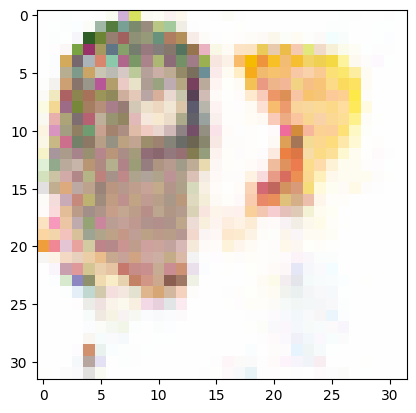

[434/500][0/936]	Loss_D: 0.0011	Loss_G: 6.7494	D(x): 1.0000	D(G(z)): 0.0011 / 0.0015
[434/500][15/936]	Loss_D: 0.0084	Loss_G: 11.5981	D(x): 0.9917	D(G(z)): 0.0001 / 0.0001
[434/500][30/936]	Loss_D: 0.0000	Loss_G: 12.4389	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[434/500][45/936]	Loss_D: 0.0000	Loss_G: 14.8680	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[434/500][60/936]	Loss_D: 0.0011	Loss_G: 7.7448	D(x): 0.9995	D(G(z)): 0.0006 / 0.0005
[434/500][75/936]	Loss_D: 0.0058	Loss_G: 5.6663	D(x): 1.0000	D(G(z)): 0.0057 / 0.0041
[434/500][90/936]	Loss_D: 0.0075	Loss_G: 5.2805	D(x): 1.0000	D(G(z)): 0.0074 / 0.0061
[434/500][105/936]	Loss_D: 0.0002	Loss_G: 8.6135	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[434/500][120/936]	Loss_D: 0.0070	Loss_G: 5.6248	D(x): 1.0000	D(G(z)): 0.0069 / 0.0058
[434/500][135/936]	Loss_D: 0.0219	Loss_G: 4.3786	D(x): 1.0000	D(G(z)): 0.0216 / 0.0151
[434/500][150/936]	Loss_D: 0.0000	Loss_G: 16.1203	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[434/500][165/936]	Loss_D: 0.0123	Loss_G: 6.532

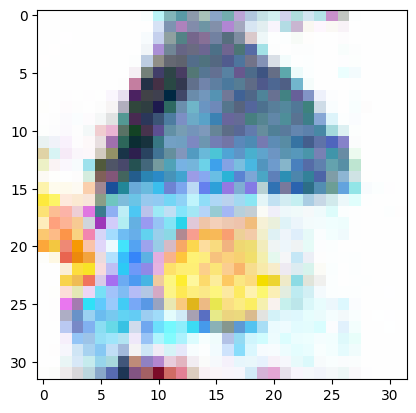

[435/500][0/936]	Loss_D: 0.0304	Loss_G: 9.3399	D(x): 0.9999	D(G(z)): 0.0286 / 0.0142
[435/500][15/936]	Loss_D: 0.0015	Loss_G: 9.4359	D(x): 0.9987	D(G(z)): 0.0003 / 0.0003
[435/500][30/936]	Loss_D: 0.0038	Loss_G: 9.7598	D(x): 0.9963	D(G(z)): 0.0001 / 0.0001
[435/500][45/936]	Loss_D: 0.0171	Loss_G: 5.6660	D(x): 1.0000	D(G(z)): 0.0167 / 0.0082
[435/500][60/936]	Loss_D: 0.0062	Loss_G: 7.1907	D(x): 1.0000	D(G(z)): 0.0061 / 0.0051
[435/500][75/936]	Loss_D: 0.0000	Loss_G: 13.0291	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[435/500][90/936]	Loss_D: 0.0023	Loss_G: 9.7535	D(x): 0.9978	D(G(z)): 0.0001 / 0.0001
[435/500][105/936]	Loss_D: 0.0006	Loss_G: 7.9120	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[435/500][120/936]	Loss_D: 0.0122	Loss_G: 5.8072	D(x): 0.9991	D(G(z)): 0.0111 / 0.0065
[435/500][135/936]	Loss_D: 0.0208	Loss_G: 4.9031	D(x): 1.0000	D(G(z)): 0.0204 / 0.0107
[435/500][150/936]	Loss_D: 0.0144	Loss_G: 4.6836	D(x): 1.0000	D(G(z)): 0.0142 / 0.0112
[435/500][165/936]	Loss_D: 0.0001	Loss_G: 10.5030	

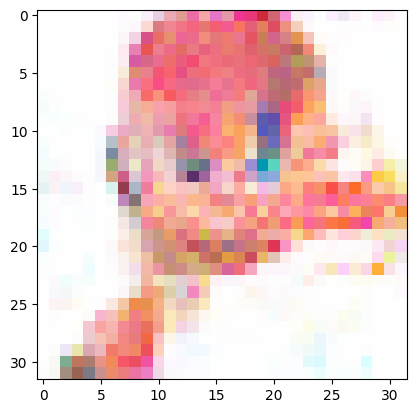

[436/500][0/936]	Loss_D: 0.5996	Loss_G: 11.0048	D(x): 1.0000	D(G(z)): 0.3970 / 0.0003
[436/500][15/936]	Loss_D: 0.0000	Loss_G: 12.3185	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[436/500][30/936]	Loss_D: 0.0003	Loss_G: 9.1795	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[436/500][45/936]	Loss_D: 0.0002	Loss_G: 8.9370	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[436/500][60/936]	Loss_D: 0.0004	Loss_G: 10.7953	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[436/500][75/936]	Loss_D: 0.0001	Loss_G: 31.5805	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[436/500][90/936]	Loss_D: 0.0000	Loss_G: 18.9923	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[436/500][105/936]	Loss_D: 0.0000	Loss_G: 15.1983	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[436/500][120/936]	Loss_D: 0.0088	Loss_G: 6.0286	D(x): 1.0000	D(G(z)): 0.0087 / 0.0068
[436/500][135/936]	Loss_D: 0.0001	Loss_G: 10.6754	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[436/500][150/936]	Loss_D: 0.0038	Loss_G: 6.7562	D(x): 1.0000	D(G(z)): 0.0037 / 0.0013
[436/500][165/936]	Loss_D: 0.0032	Loss_G: 6.

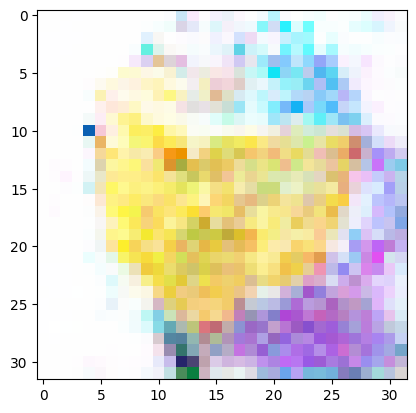

[437/500][0/936]	Loss_D: 0.0013	Loss_G: 6.9375	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[437/500][15/936]	Loss_D: 0.0187	Loss_G: 8.2412	D(x): 0.9824	D(G(z)): 0.0005 / 0.0005
[437/500][30/936]	Loss_D: 0.0036	Loss_G: 10.4208	D(x): 0.9965	D(G(z)): 0.0001 / 0.0001
[437/500][45/936]	Loss_D: 0.0115	Loss_G: 5.2630	D(x): 1.0000	D(G(z)): 0.0114 / 0.0053
[437/500][60/936]	Loss_D: 0.0133	Loss_G: 5.9738	D(x): 1.0000	D(G(z)): 0.0131 / 0.0040
[437/500][75/936]	Loss_D: 0.0004	Loss_G: 8.2752	D(x): 0.9999	D(G(z)): 0.0003 / 0.0003
[437/500][90/936]	Loss_D: 0.0019	Loss_G: 12.3695	D(x): 1.0000	D(G(z)): 0.0019 / 0.0018
[437/500][105/936]	Loss_D: 0.0000	Loss_G: 21.4738	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[437/500][120/936]	Loss_D: 0.0003	Loss_G: 10.4898	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[437/500][135/936]	Loss_D: 0.0015	Loss_G: 7.7066	D(x): 1.0000	D(G(z)): 0.0015 / 0.0011
[437/500][150/936]	Loss_D: 0.0000	Loss_G: 11.5519	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[437/500][165/936]	Loss_D: 0.0605	Loss_G: 9.01

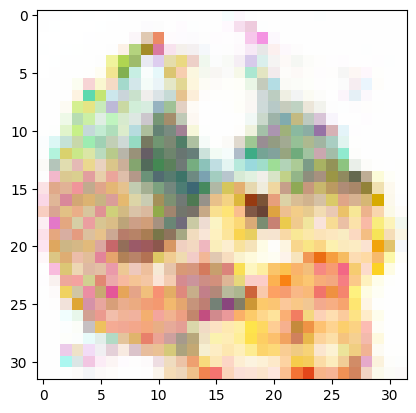

[438/500][0/936]	Loss_D: 0.0018	Loss_G: 6.8983	D(x): 1.0000	D(G(z)): 0.0018 / 0.0017
[438/500][15/936]	Loss_D: 0.0001	Loss_G: 10.6887	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[438/500][30/936]	Loss_D: 0.0075	Loss_G: 6.2021	D(x): 1.0000	D(G(z)): 0.0075 / 0.0044
[438/500][45/936]	Loss_D: 0.0007	Loss_G: 8.9209	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
[438/500][60/936]	Loss_D: 0.0018	Loss_G: 8.6896	D(x): 0.9985	D(G(z)): 0.0003 / 0.0002
[438/500][75/936]	Loss_D: 0.0173	Loss_G: 5.0777	D(x): 1.0000	D(G(z)): 0.0171 / 0.0064
[438/500][90/936]	Loss_D: 0.0087	Loss_G: 5.4000	D(x): 0.9982	D(G(z)): 0.0068 / 0.0050
[438/500][105/936]	Loss_D: 0.0002	Loss_G: 8.4854	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[438/500][120/936]	Loss_D: 0.0008	Loss_G: 8.4539	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[438/500][135/936]	Loss_D: 0.0001	Loss_G: 14.4517	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[438/500][150/936]	Loss_D: 0.0003	Loss_G: 13.8421	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[438/500][165/936]	Loss_D: 0.0009	Loss_G: 13.727

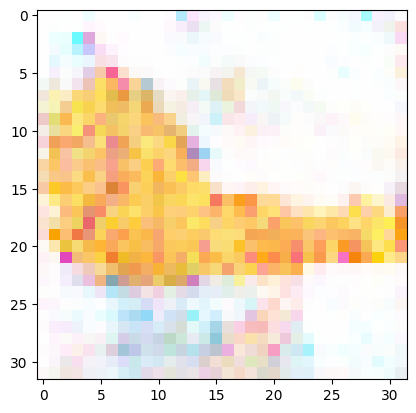

[439/500][0/936]	Loss_D: 0.0127	Loss_G: 5.4035	D(x): 1.0000	D(G(z)): 0.0125 / 0.0058
[439/500][15/936]	Loss_D: 0.0022	Loss_G: 7.7973	D(x): 1.0000	D(G(z)): 0.0022 / 0.0010
[439/500][30/936]	Loss_D: 0.0061	Loss_G: 6.4343	D(x): 0.9998	D(G(z)): 0.0058 / 0.0043
[439/500][45/936]	Loss_D: 0.0006	Loss_G: 8.3389	D(x): 0.9998	D(G(z)): 0.0005 / 0.0004
[439/500][60/936]	Loss_D: 0.0013	Loss_G: 9.4311	D(x): 1.0000	D(G(z)): 0.0012 / 0.0006
[439/500][75/936]	Loss_D: 0.0000	Loss_G: 11.7701	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[439/500][90/936]	Loss_D: 0.0047	Loss_G: 6.3810	D(x): 1.0000	D(G(z)): 0.0047 / 0.0033
[439/500][105/936]	Loss_D: 0.0010	Loss_G: 8.4480	D(x): 0.9992	D(G(z)): 0.0002 / 0.0002
[439/500][120/936]	Loss_D: 0.0001	Loss_G: 10.0883	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[439/500][135/936]	Loss_D: 0.0001	Loss_G: 9.2488	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[439/500][150/936]	Loss_D: 0.0032	Loss_G: 6.6634	D(x): 1.0000	D(G(z)): 0.0032 / 0.0014
[439/500][165/936]	Loss_D: 0.0000	Loss_G: 13.7652

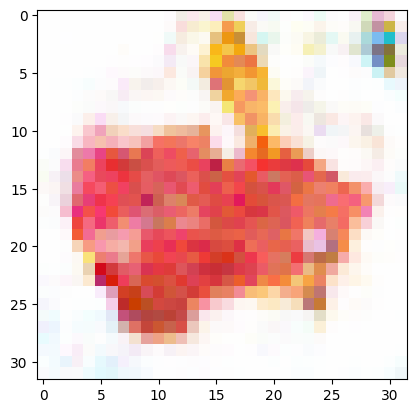

[440/500][0/936]	Loss_D: 0.0068	Loss_G: 10.4606	D(x): 0.9934	D(G(z)): 0.0001 / 0.0001
[440/500][15/936]	Loss_D: 0.0021	Loss_G: 6.6085	D(x): 1.0000	D(G(z)): 0.0021 / 0.0016
[440/500][30/936]	Loss_D: 0.0009	Loss_G: 12.8140	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[440/500][45/936]	Loss_D: 0.0011	Loss_G: 8.7284	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[440/500][60/936]	Loss_D: 0.0186	Loss_G: 6.5262	D(x): 1.0000	D(G(z)): 0.0183 / 0.0104
[440/500][75/936]	Loss_D: 0.0004	Loss_G: 8.2521	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[440/500][90/936]	Loss_D: 0.0255	Loss_G: 4.9937	D(x): 0.9936	D(G(z)): 0.0188 / 0.0068
[440/500][105/936]	Loss_D: 1.5610	Loss_G: 1.7415	D(x): 0.5348	D(G(z)): 0.0101 / 0.1975
[440/500][120/936]	Loss_D: 0.0020	Loss_G: 6.7657	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[440/500][135/936]	Loss_D: 0.0007	Loss_G: 7.7782	D(x): 0.9999	D(G(z)): 0.0006 / 0.0005
[440/500][150/936]	Loss_D: 0.0774	Loss_G: 5.2679	D(x): 1.0000	D(G(z)): 0.0716 / 0.0070
[440/500][165/936]	Loss_D: 0.0044	Loss_G: 6.2015	

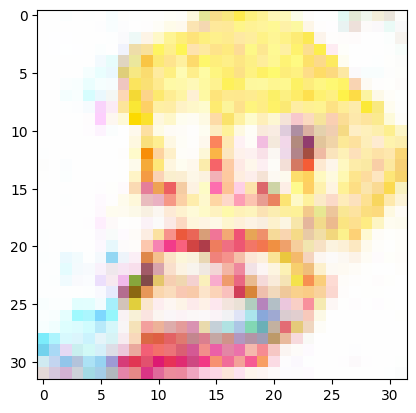

[441/500][0/936]	Loss_D: 0.0013	Loss_G: 28.8405	D(x): 0.9999	D(G(z)): 0.0013 / 0.0010
[441/500][15/936]	Loss_D: 0.0095	Loss_G: 29.5073	D(x): 1.0000	D(G(z)): 0.0093 / 0.0056
[441/500][30/936]	Loss_D: 0.0001	Loss_G: 10.3770	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[441/500][45/936]	Loss_D: 0.0028	Loss_G: 14.5033	D(x): 1.0000	D(G(z)): 0.0028 / 0.0023
[441/500][60/936]	Loss_D: 0.0104	Loss_G: 5.9681	D(x): 1.0000	D(G(z)): 0.0104 / 0.0034
[441/500][75/936]	Loss_D: 0.0005	Loss_G: 17.1934	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[441/500][90/936]	Loss_D: 0.0001	Loss_G: 22.8053	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[441/500][105/936]	Loss_D: 0.0025	Loss_G: 6.4260	D(x): 1.0000	D(G(z)): 0.0025 / 0.0021
[441/500][120/936]	Loss_D: 0.0028	Loss_G: 18.9252	D(x): 0.9975	D(G(z)): 0.0002 / 0.0001
[441/500][135/936]	Loss_D: 0.0270	Loss_G: 16.9634	D(x): 1.0000	D(G(z)): 0.0263 / 0.0175
[441/500][150/936]	Loss_D: 0.0159	Loss_G: 20.0159	D(x): 1.0000	D(G(z)): 0.0156 / 0.0078
[441/500][165/936]	Loss_D: 0.0046	Loss_G: 

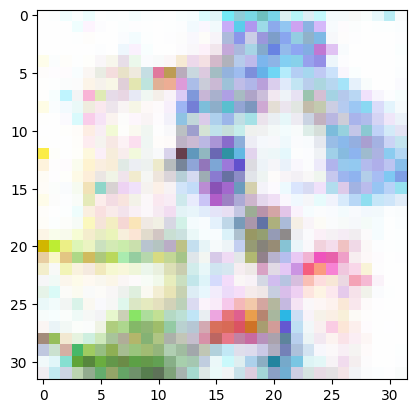

[442/500][0/936]	Loss_D: 0.0000	Loss_G: 13.3496	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[442/500][15/936]	Loss_D: 0.0002	Loss_G: 8.6410	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[442/500][30/936]	Loss_D: 0.1100	Loss_G: 3.8839	D(x): 1.0000	D(G(z)): 0.1040 / 0.0302
[442/500][45/936]	Loss_D: 0.0000	Loss_G: 10.4219	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[442/500][60/936]	Loss_D: 0.0550	Loss_G: 7.8866	D(x): 0.9506	D(G(z)): 0.0003 / 0.0004
[442/500][75/936]	Loss_D: 0.0344	Loss_G: 5.0158	D(x): 1.0000	D(G(z)): 0.0334 / 0.0072
[442/500][90/936]	Loss_D: 0.0001	Loss_G: 9.9846	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[442/500][105/936]	Loss_D: 0.0020	Loss_G: 6.4396	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[442/500][120/936]	Loss_D: 0.0009	Loss_G: 8.2493	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[442/500][135/936]	Loss_D: 0.0009	Loss_G: 7.1295	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[442/500][150/936]	Loss_D: 0.0064	Loss_G: 19.8960	D(x): 0.9937	D(G(z)): 0.0000 / 0.0000
[442/500][165/936]	Loss_D: 0.0001	Loss_G: 13.082

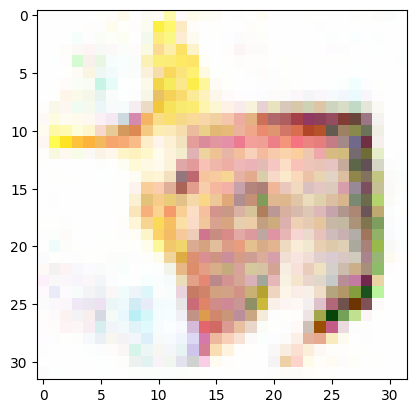

[443/500][0/936]	Loss_D: 1.0939	Loss_G: 1.5015	D(x): 0.5696	D(G(z)): 0.1275 / 0.4498
[443/500][15/936]	Loss_D: 0.0002	Loss_G: 23.6740	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[443/500][30/936]	Loss_D: 0.0224	Loss_G: 25.7063	D(x): 1.0000	D(G(z)): 0.0215 / 0.0136
[443/500][45/936]	Loss_D: 0.0032	Loss_G: 21.3409	D(x): 0.9992	D(G(z)): 0.0023 / 0.0021
[443/500][60/936]	Loss_D: 0.0002	Loss_G: 19.6543	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[443/500][75/936]	Loss_D: 0.0004	Loss_G: 21.2654	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[443/500][90/936]	Loss_D: 0.0001	Loss_G: 15.2163	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[443/500][105/936]	Loss_D: 0.0015	Loss_G: 24.8653	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[443/500][120/936]	Loss_D: 0.0015	Loss_G: 14.6889	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[443/500][135/936]	Loss_D: 0.0001	Loss_G: 9.5009	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[443/500][150/936]	Loss_D: 0.0051	Loss_G: 10.7885	D(x): 1.0000	D(G(z)): 0.0050 / 0.0044
[443/500][165/936]	Loss_D: 0.0335	Loss_G: 

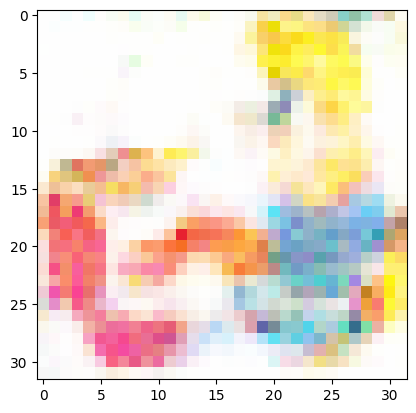

[444/500][0/936]	Loss_D: 0.0020	Loss_G: 8.2547	D(x): 1.0000	D(G(z)): 0.0020 / 0.0017
[444/500][15/936]	Loss_D: 0.0001	Loss_G: 11.3808	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[444/500][30/936]	Loss_D: 0.0001	Loss_G: 12.9436	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[444/500][45/936]	Loss_D: 0.0000	Loss_G: 13.7502	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[444/500][60/936]	Loss_D: 0.0019	Loss_G: 10.5267	D(x): 0.9981	D(G(z)): 0.0000 / 0.0000
[444/500][75/936]	Loss_D: 0.0008	Loss_G: 10.2494	D(x): 0.9999	D(G(z)): 0.0006 / 0.0003
[444/500][90/936]	Loss_D: 0.0011	Loss_G: 9.2198	D(x): 1.0000	D(G(z)): 0.0011 / 0.0007
[444/500][105/936]	Loss_D: 0.0007	Loss_G: 8.4925	D(x): 0.9999	D(G(z)): 0.0006 / 0.0006
[444/500][120/936]	Loss_D: 0.0016	Loss_G: 8.1293	D(x): 1.0000	D(G(z)): 0.0016 / 0.0006
[444/500][135/936]	Loss_D: 0.0004	Loss_G: 13.6435	D(x): 0.9996	D(G(z)): 0.0000 / 0.0000
[444/500][150/936]	Loss_D: 0.0087	Loss_G: 5.2500	D(x): 1.0000	D(G(z)): 0.0086 / 0.0058
[444/500][165/936]	Loss_D: 0.0024	Loss_G: 6.2

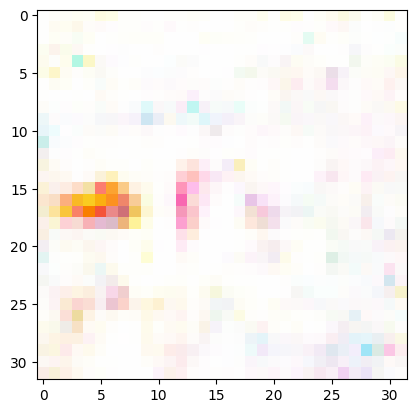

[445/500][0/936]	Loss_D: 0.0098	Loss_G: 5.9479	D(x): 1.0000	D(G(z)): 0.0096 / 0.0070
[445/500][15/936]	Loss_D: 0.0001	Loss_G: 12.2158	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[445/500][30/936]	Loss_D: 0.0000	Loss_G: 16.1381	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[445/500][45/936]	Loss_D: 0.0001	Loss_G: 9.9065	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[445/500][60/936]	Loss_D: 0.0004	Loss_G: 11.2762	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[445/500][75/936]	Loss_D: 0.0000	Loss_G: 12.7370	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[445/500][90/936]	Loss_D: 0.0013	Loss_G: 14.5082	D(x): 0.9987	D(G(z)): 0.0000 / 0.0000
[445/500][105/936]	Loss_D: 0.0024	Loss_G: 7.1704	D(x): 1.0000	D(G(z)): 0.0024 / 0.0022
[445/500][120/936]	Loss_D: 0.0030	Loss_G: 6.3740	D(x): 1.0000	D(G(z)): 0.0030 / 0.0032
[445/500][135/936]	Loss_D: 0.0025	Loss_G: 15.0316	D(x): 1.0000	D(G(z)): 0.0025 / 0.0009
[445/500][150/936]	Loss_D: 0.0001	Loss_G: 11.2617	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[445/500][165/936]	Loss_D: 0.0002	Loss_G: 21

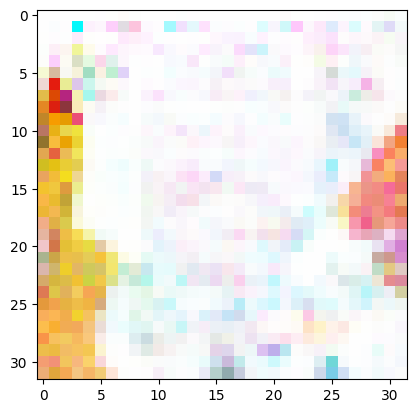

[446/500][0/936]	Loss_D: 0.0297	Loss_G: 4.7821	D(x): 0.9993	D(G(z)): 0.0283 / 0.0101
[446/500][15/936]	Loss_D: 0.0065	Loss_G: 5.4479	D(x): 0.9993	D(G(z)): 0.0058 / 0.0047
[446/500][30/936]	Loss_D: 0.6050	Loss_G: 11.9967	D(x): 0.9999	D(G(z)): 0.4234 / 0.0000
[446/500][45/936]	Loss_D: 0.0003	Loss_G: 10.2133	D(x): 0.9998	D(G(z)): 0.0001 / 0.0002
[446/500][60/936]	Loss_D: 0.0002	Loss_G: 8.5505	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[446/500][75/936]	Loss_D: 0.5535	Loss_G: 2.8345	D(x): 0.6678	D(G(z)): 0.0113 / 0.0826
[446/500][90/936]	Loss_D: 0.0001	Loss_G: 11.2515	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[446/500][105/936]	Loss_D: 0.0006	Loss_G: 9.8363	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[446/500][120/936]	Loss_D: 0.0002	Loss_G: 9.9825	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[446/500][135/936]	Loss_D: 0.0482	Loss_G: 4.1190	D(x): 1.0000	D(G(z)): 0.0458 / 0.0229
[446/500][150/936]	Loss_D: 0.0003	Loss_G: 9.0136	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[446/500][165/936]	Loss_D: 0.0000	Loss_G: 14.840

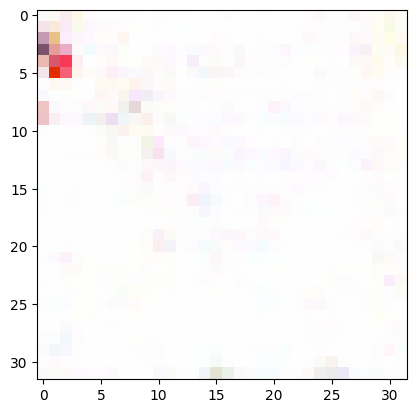

[447/500][0/936]	Loss_D: 0.0059	Loss_G: 13.9066	D(x): 1.0000	D(G(z)): 0.0059 / 0.0326
[447/500][15/936]	Loss_D: 0.0003	Loss_G: 14.6454	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[447/500][30/936]	Loss_D: 0.0255	Loss_G: 7.2516	D(x): 1.0000	D(G(z)): 0.0248 / 0.0106
[447/500][45/936]	Loss_D: 0.0057	Loss_G: 8.0029	D(x): 0.9999	D(G(z)): 0.0055 / 0.0042
[447/500][60/936]	Loss_D: 0.0081	Loss_G: 7.3106	D(x): 1.0000	D(G(z)): 0.0080 / 0.0052
[447/500][75/936]	Loss_D: 0.0251	Loss_G: 6.3223	D(x): 1.0000	D(G(z)): 0.0242 / 0.0102
[447/500][90/936]	Loss_D: 0.1866	Loss_G: 6.4271	D(x): 0.8687	D(G(z)): 0.0007 / 0.0021
[447/500][105/936]	Loss_D: 0.0047	Loss_G: 6.7411	D(x): 1.0000	D(G(z)): 0.0047 / 0.0020
[447/500][120/936]	Loss_D: 0.0009	Loss_G: 16.0374	D(x): 1.0000	D(G(z)): 0.0009 / 0.0006
[447/500][135/936]	Loss_D: 0.0005	Loss_G: 10.8545	D(x): 0.9998	D(G(z)): 0.0003 / 0.0002
[447/500][150/936]	Loss_D: 0.0009	Loss_G: 8.0082	D(x): 1.0000	D(G(z)): 0.0009 / 0.0007
[447/500][165/936]	Loss_D: 0.0769	Loss_G: 3.282

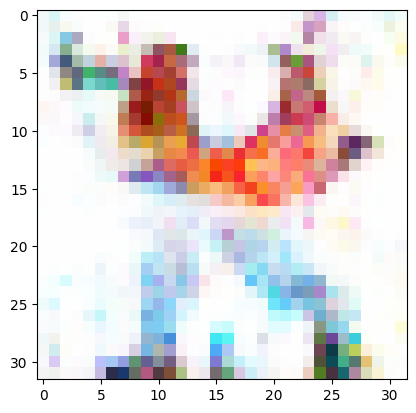

[448/500][0/936]	Loss_D: 0.0030	Loss_G: 5.4247	D(x): 1.0000	D(G(z)): 0.0030 / 0.0053
[448/500][15/936]	Loss_D: 0.0018	Loss_G: 6.8358	D(x): 1.0000	D(G(z)): 0.0018 / 0.0017
[448/500][30/936]	Loss_D: 0.0002	Loss_G: 12.2008	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[448/500][45/936]	Loss_D: 0.0147	Loss_G: 5.6818	D(x): 1.0000	D(G(z)): 0.0145 / 0.0051
[448/500][60/936]	Loss_D: 0.0026	Loss_G: 6.6562	D(x): 1.0000	D(G(z)): 0.0026 / 0.0022
[448/500][75/936]	Loss_D: 0.0059	Loss_G: 6.1045	D(x): 1.0000	D(G(z)): 0.0059 / 0.0033
[448/500][90/936]	Loss_D: 0.0000	Loss_G: 10.2427	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[448/500][105/936]	Loss_D: 0.0018	Loss_G: 6.7870	D(x): 1.0000	D(G(z)): 0.0018 / 0.0014
[448/500][120/936]	Loss_D: 0.0212	Loss_G: 6.2683	D(x): 1.0000	D(G(z)): 0.0208 / 0.0062
[448/500][135/936]	Loss_D: 0.0002	Loss_G: 8.6202	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[448/500][150/936]	Loss_D: 0.0077	Loss_G: 6.2465	D(x): 1.0000	D(G(z)): 0.0076 / 0.0052
[448/500][165/936]	Loss_D: 0.0045	Loss_G: 5.9801	

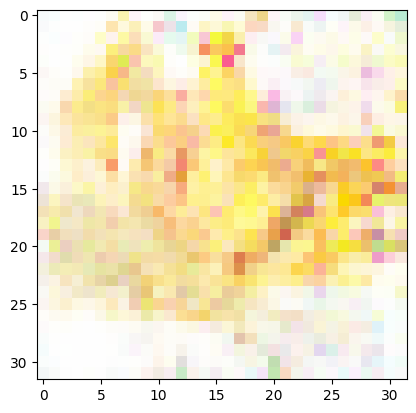

[449/500][0/936]	Loss_D: 0.0042	Loss_G: 6.0417	D(x): 1.0000	D(G(z)): 0.0041 / 0.0034
[449/500][15/936]	Loss_D: 0.0077	Loss_G: 5.5999	D(x): 0.9998	D(G(z)): 0.0075 / 0.0043
[449/500][30/936]	Loss_D: 0.0008	Loss_G: 12.6570	D(x): 0.9992	D(G(z)): 0.0000 / 0.0000
[449/500][45/936]	Loss_D: 0.0001	Loss_G: 9.2031	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[449/500][60/936]	Loss_D: 0.0000	Loss_G: 20.2982	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[449/500][75/936]	Loss_D: 0.0754	Loss_G: 10.1868	D(x): 1.0000	D(G(z)): 0.0651 / 0.0012
[449/500][90/936]	Loss_D: 0.6580	Loss_G: 12.3640	D(x): 1.0000	D(G(z)): 0.4640 / 0.0001
[449/500][105/936]	Loss_D: 0.0000	Loss_G: 19.3220	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[449/500][120/936]	Loss_D: 0.0975	Loss_G: 7.3440	D(x): 1.0000	D(G(z)): 0.0892 / 0.0073
[449/500][135/936]	Loss_D: 0.0031	Loss_G: 8.4138	D(x): 1.0000	D(G(z)): 0.0030 / 0.0018
[449/500][150/936]	Loss_D: 0.1054	Loss_G: 5.1659	D(x): 1.0000	D(G(z)): 0.0922 / 0.0145
[449/500][165/936]	Loss_D: 0.0146	Loss_G: 9.14

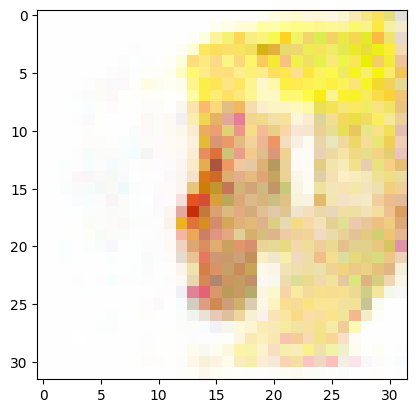

[450/500][0/936]	Loss_D: 0.0028	Loss_G: 7.8401	D(x): 1.0000	D(G(z)): 0.0028 / 0.0025
[450/500][15/936]	Loss_D: 0.0017	Loss_G: 8.1003	D(x): 1.0000	D(G(z)): 0.0017 / 0.0016
[450/500][30/936]	Loss_D: 0.0027	Loss_G: 6.9277	D(x): 1.0000	D(G(z)): 0.0027 / 0.0022
[450/500][45/936]	Loss_D: 0.0020	Loss_G: 7.1383	D(x): 1.0000	D(G(z)): 0.0020 / 0.0016
[450/500][60/936]	Loss_D: 0.0000	Loss_G: 13.5497	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
[450/500][75/936]	Loss_D: 0.0032	Loss_G: 8.1954	D(x): 1.0000	D(G(z)): 0.0032 / 0.0025
[450/500][90/936]	Loss_D: 0.0001	Loss_G: 9.8715	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[450/500][105/936]	Loss_D: 0.1147	Loss_G: 9.4317	D(x): 0.9062	D(G(z)): 0.0001 / 0.0001
[450/500][120/936]	Loss_D: 0.0132	Loss_G: 5.1779	D(x): 1.0000	D(G(z)): 0.0131 / 0.0069
[450/500][135/936]	Loss_D: 0.0170	Loss_G: 4.5059	D(x): 1.0000	D(G(z)): 0.0168 / 0.0156
[450/500][150/936]	Loss_D: 0.0030	Loss_G: 10.8354	D(x): 0.9997	D(G(z)): 0.0026 / 0.0017
[450/500][165/936]	Loss_D: 0.0001	Loss_G: 13.9614

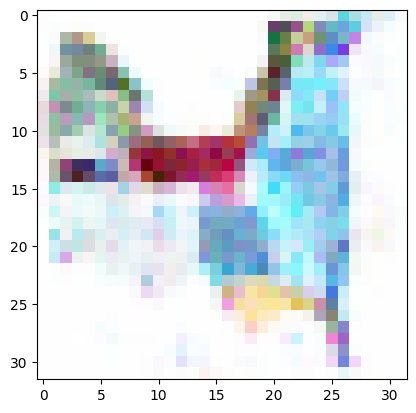

[451/500][0/936]	Loss_D: 0.0008	Loss_G: 8.3313	D(x): 0.9998	D(G(z)): 0.0006 / 0.0006
[451/500][15/936]	Loss_D: 0.0016	Loss_G: 9.2235	D(x): 0.9989	D(G(z)): 0.0005 / 0.0005
[451/500][30/936]	Loss_D: 0.0019	Loss_G: 6.3813	D(x): 1.0000	D(G(z)): 0.0019 / 0.0019
[451/500][45/936]	Loss_D: 0.0014	Loss_G: 8.3761	D(x): 0.9994	D(G(z)): 0.0008 / 0.0007
[451/500][60/936]	Loss_D: 0.0000	Loss_G: 13.1207	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[451/500][75/936]	Loss_D: 0.0000	Loss_G: 19.4879	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[451/500][90/936]	Loss_D: 0.0025	Loss_G: 7.0909	D(x): 1.0000	D(G(z)): 0.0025 / 0.0018
[451/500][105/936]	Loss_D: 0.0052	Loss_G: 5.7940	D(x): 1.0000	D(G(z)): 0.0051 / 0.0041
[451/500][120/936]	Loss_D: 0.0003	Loss_G: 8.1641	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[451/500][135/936]	Loss_D: 0.0004	Loss_G: 8.2841	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[451/500][150/936]	Loss_D: 0.0003	Loss_G: 8.6465	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[451/500][165/936]	Loss_D: 0.2065	Loss_G: 11.7507

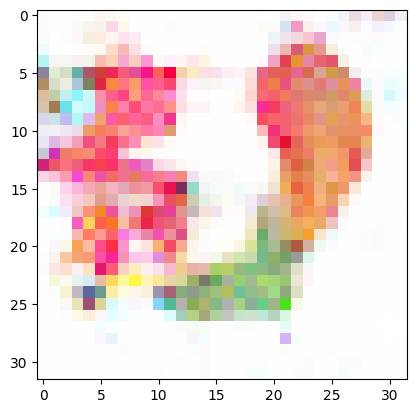

[452/500][0/936]	Loss_D: 0.0011	Loss_G: 7.5635	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[452/500][15/936]	Loss_D: 0.0811	Loss_G: 7.6611	D(x): 1.0000	D(G(z)): 0.0749 / 0.0064
[452/500][30/936]	Loss_D: 0.0003	Loss_G: 8.3157	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[452/500][45/936]	Loss_D: 0.0000	Loss_G: 11.4644	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[452/500][60/936]	Loss_D: 0.0011	Loss_G: 7.1860	D(x): 0.9999	D(G(z)): 0.0010 / 0.0010
[452/500][75/936]	Loss_D: 0.0033	Loss_G: 6.1339	D(x): 1.0000	D(G(z)): 0.0033 / 0.0022
[452/500][90/936]	Loss_D: 0.0001	Loss_G: 11.5702	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[452/500][105/936]	Loss_D: 0.0075	Loss_G: 5.4211	D(x): 1.0000	D(G(z)): 0.0075 / 0.0047
[452/500][120/936]	Loss_D: 0.0020	Loss_G: 6.8408	D(x): 1.0000	D(G(z)): 0.0020 / 0.0017
[452/500][135/936]	Loss_D: 0.0005	Loss_G: 11.0262	D(x): 0.9996	D(G(z)): 0.0001 / 0.0001
[452/500][150/936]	Loss_D: 0.0016	Loss_G: 7.7737	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[452/500][165/936]	Loss_D: 0.0001	Loss_G: 12.189

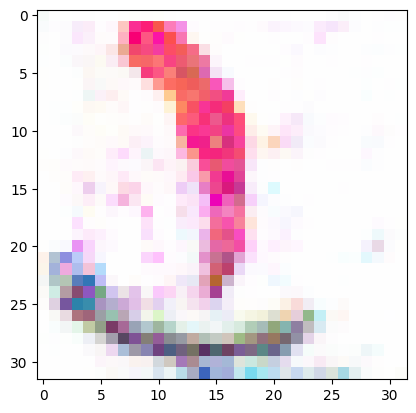

[453/500][0/936]	Loss_D: 0.0003	Loss_G: 8.2696	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[453/500][15/936]	Loss_D: 0.0008	Loss_G: 9.8379	D(x): 0.9993	D(G(z)): 0.0001 / 0.0001
[453/500][30/936]	Loss_D: 0.0099	Loss_G: 5.2672	D(x): 1.0000	D(G(z)): 0.0099 / 0.0070
[453/500][45/936]	Loss_D: 0.0000	Loss_G: 10.7130	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[453/500][60/936]	Loss_D: 0.0000	Loss_G: 18.9341	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[453/500][75/936]	Loss_D: 0.0042	Loss_G: 3.9991	D(x): 1.0000	D(G(z)): 0.0042 / 0.0191
[453/500][90/936]	Loss_D: 0.0018	Loss_G: 7.6196	D(x): 0.9997	D(G(z)): 0.0014 / 0.0014
[453/500][105/936]	Loss_D: 0.0021	Loss_G: 6.4238	D(x): 1.0000	D(G(z)): 0.0021 / 0.0018
[453/500][120/936]	Loss_D: 0.0000	Loss_G: 16.3523	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[453/500][135/936]	Loss_D: 0.0022	Loss_G: 7.1038	D(x): 0.9997	D(G(z)): 0.0019 / 0.0019
[453/500][150/936]	Loss_D: 0.0098	Loss_G: 5.0863	D(x): 1.0000	D(G(z)): 0.0097 / 0.0069
[453/500][165/936]	Loss_D: 0.0000	Loss_G: 10.797

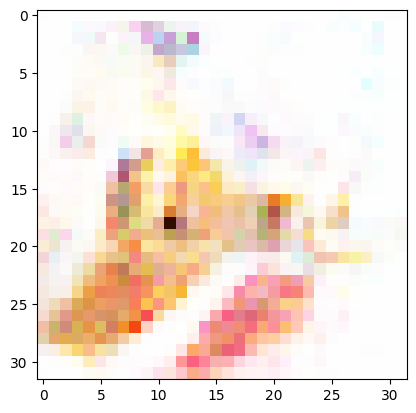

[454/500][0/936]	Loss_D: 0.0035	Loss_G: 7.0997	D(x): 0.9986	D(G(z)): 0.0021 / 0.0018
[454/500][15/936]	Loss_D: 0.0001	Loss_G: 10.1840	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[454/500][30/936]	Loss_D: 0.0002	Loss_G: 9.0331	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[454/500][45/936]	Loss_D: 0.0000	Loss_G: 28.5000	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[454/500][60/936]	Loss_D: 0.0009	Loss_G: 7.6807	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[454/500][75/936]	Loss_D: 0.0000	Loss_G: 25.2147	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[454/500][90/936]	Loss_D: 0.0009	Loss_G: 14.5171	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[454/500][105/936]	Loss_D: 0.0027	Loss_G: 8.0872	D(x): 1.0000	D(G(z)): 0.0027 / 0.0021
[454/500][120/936]	Loss_D: 0.0038	Loss_G: 13.3443	D(x): 1.0000	D(G(z)): 0.0038 / 0.0031
[454/500][135/936]	Loss_D: 0.8911	Loss_G: 12.5196	D(x): 0.7571	D(G(z)): 0.0001 / 0.0003
[454/500][150/936]	Loss_D: 0.0005	Loss_G: 8.2364	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[454/500][165/936]	Loss_D: 0.0009	Loss_G: 9.1

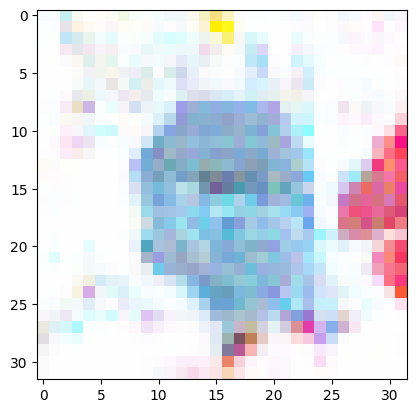

[455/500][0/936]	Loss_D: 0.0000	Loss_G: 16.9356	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[455/500][15/936]	Loss_D: 0.0012	Loss_G: 7.4705	D(x): 1.0000	D(G(z)): 0.0012 / 0.0011
[455/500][30/936]	Loss_D: 0.0059	Loss_G: 6.0329	D(x): 0.9991	D(G(z)): 0.0049 / 0.0041
[455/500][45/936]	Loss_D: 0.0499	Loss_G: 4.6941	D(x): 1.0000	D(G(z)): 0.0482 / 0.0100
[455/500][60/936]	Loss_D: 0.0083	Loss_G: 5.7530	D(x): 1.0000	D(G(z)): 0.0082 / 0.0050
[455/500][75/936]	Loss_D: 0.1759	Loss_G: 6.4586	D(x): 1.0000	D(G(z)): 0.1464 / 0.0035
[455/500][90/936]	Loss_D: 0.0309	Loss_G: 4.4606	D(x): 1.0000	D(G(z)): 0.0295 / 0.0472
[455/500][105/936]	Loss_D: 0.0002	Loss_G: 10.7203	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[455/500][120/936]	Loss_D: 0.0036	Loss_G: 6.1660	D(x): 1.0000	D(G(z)): 0.0036 / 0.0030
[455/500][135/936]	Loss_D: 0.0001	Loss_G: 9.6743	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[455/500][150/936]	Loss_D: 0.0000	Loss_G: 12.9720	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[455/500][165/936]	Loss_D: 0.0004	Loss_G: 8.3237

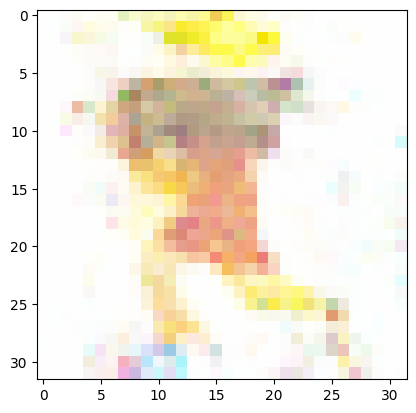

[456/500][0/936]	Loss_D: 0.0018	Loss_G: 8.0084	D(x): 1.0000	D(G(z)): 0.0018 / 0.0014
[456/500][15/936]	Loss_D: 0.0461	Loss_G: 7.5120	D(x): 1.0000	D(G(z)): 0.0447 / 0.0006
[456/500][30/936]	Loss_D: 0.0146	Loss_G: 6.2428	D(x): 0.9999	D(G(z)): 0.0142 / 0.0060
[456/500][45/936]	Loss_D: 0.0047	Loss_G: 6.5889	D(x): 1.0000	D(G(z)): 0.0046 / 0.0020
[456/500][60/936]	Loss_D: 0.0011	Loss_G: 7.4271	D(x): 0.9999	D(G(z)): 0.0010 / 0.0007
[456/500][75/936]	Loss_D: 0.0100	Loss_G: 5.8550	D(x): 0.9954	D(G(z)): 0.0054 / 0.0035
[456/500][90/936]	Loss_D: 0.0017	Loss_G: 9.6249	D(x): 0.9986	D(G(z)): 0.0003 / 0.0003
[456/500][105/936]	Loss_D: 0.0005	Loss_G: 15.3460	D(x): 1.0000	D(G(z)): 0.0005 / 0.0002
[456/500][120/936]	Loss_D: 0.0000	Loss_G: 18.0433	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[456/500][135/936]	Loss_D: 0.0002	Loss_G: 13.4921	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[456/500][150/936]	Loss_D: 0.0000	Loss_G: 14.4554	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[456/500][165/936]	Loss_D: 0.0012	Loss_G: 11.30

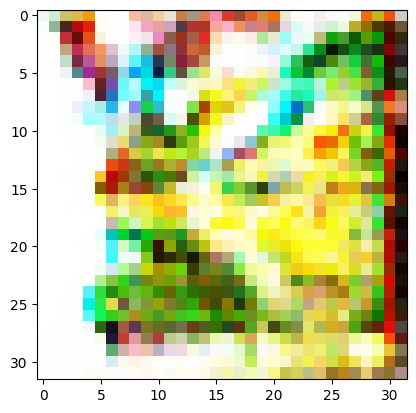

[457/500][0/936]	Loss_D: 0.0144	Loss_G: 5.8939	D(x): 1.0000	D(G(z)): 0.0142 / 0.0051
[457/500][15/936]	Loss_D: 0.0096	Loss_G: 5.2708	D(x): 1.0000	D(G(z)): 0.0096 / 0.0062
[457/500][30/936]	Loss_D: 0.0010	Loss_G: 10.0864	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[457/500][45/936]	Loss_D: 0.0026	Loss_G: 7.2261	D(x): 1.0000	D(G(z)): 0.0026 / 0.0019
[457/500][60/936]	Loss_D: 0.0011	Loss_G: 8.2484	D(x): 1.0000	D(G(z)): 0.0011 / 0.0006
[457/500][75/936]	Loss_D: 0.0010	Loss_G: 7.6865	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[457/500][90/936]	Loss_D: 0.0045	Loss_G: 6.1649	D(x): 1.0000	D(G(z)): 0.0045 / 0.0030
[457/500][105/936]	Loss_D: 0.0000	Loss_G: 12.5922	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[457/500][120/936]	Loss_D: 0.0009	Loss_G: 8.0275	D(x): 1.0000	D(G(z)): 0.0009 / 0.0006
[457/500][135/936]	Loss_D: 0.0106	Loss_G: 8.1677	D(x): 1.0000	D(G(z)): 0.0104 / 0.0028
[457/500][150/936]	Loss_D: 0.0052	Loss_G: 5.8200	D(x): 1.0000	D(G(z)): 0.0052 / 0.0034
[457/500][165/936]	Loss_D: 0.0267	Loss_G: 5.0249	

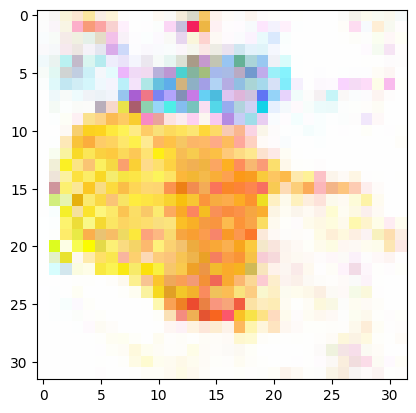

[458/500][0/936]	Loss_D: 0.0009	Loss_G: 7.4588	D(x): 0.9999	D(G(z)): 0.0008 / 0.0008
[458/500][15/936]	Loss_D: 0.0028	Loss_G: 6.8562	D(x): 1.0000	D(G(z)): 0.0028 / 0.0024
[458/500][30/936]	Loss_D: 0.0022	Loss_G: 6.9101	D(x): 1.0000	D(G(z)): 0.0022 / 0.0014
[458/500][45/936]	Loss_D: 0.5307	Loss_G: 6.2823	D(x): 0.7218	D(G(z)): 0.0001 / 0.0028
[458/500][60/936]	Loss_D: 0.0078	Loss_G: 6.0838	D(x): 1.0000	D(G(z)): 0.0077 / 0.0048
[458/500][75/936]	Loss_D: 0.0035	Loss_G: 6.2819	D(x): 0.9999	D(G(z)): 0.0034 / 0.0027
[458/500][90/936]	Loss_D: 0.0043	Loss_G: 5.9338	D(x): 1.0000	D(G(z)): 0.0043 / 0.0032
[458/500][105/936]	Loss_D: 0.0028	Loss_G: 6.1982	D(x): 1.0000	D(G(z)): 0.0027 / 0.0023
[458/500][120/936]	Loss_D: 0.0009	Loss_G: 8.2172	D(x): 0.9999	D(G(z)): 0.0008 / 0.0007
[458/500][135/936]	Loss_D: 0.0011	Loss_G: 7.0068	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[458/500][150/936]	Loss_D: 0.0000	Loss_G: 11.8170	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[458/500][165/936]	Loss_D: 0.0063	Loss_G: 6.1763	D

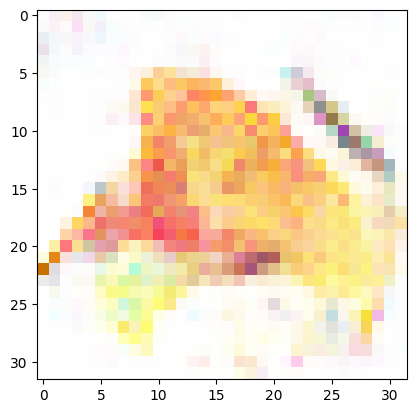

[459/500][0/936]	Loss_D: 0.0000	Loss_G: 8.9362	D(x): 1.0000	D(G(z)): 0.0000 / 0.0022
[459/500][15/936]	Loss_D: 0.1996	Loss_G: 11.2845	D(x): 0.9999	D(G(z)): 0.1743 / 0.0000
[459/500][30/936]	Loss_D: 0.0091	Loss_G: 11.4247	D(x): 0.9911	D(G(z)): 0.0001 / 0.0001
[459/500][45/936]	Loss_D: 3.2014	Loss_G: 8.9324	D(x): 0.2742	D(G(z)): 0.0000 / 0.0003
[459/500][60/936]	Loss_D: 0.0001	Loss_G: 23.4633	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[459/500][75/936]	Loss_D: 0.0004	Loss_G: 17.0433	D(x): 1.0000	D(G(z)): 0.0004 / 0.0001
[459/500][90/936]	Loss_D: 0.0004	Loss_G: 11.4710	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[459/500][105/936]	Loss_D: 0.0107	Loss_G: 5.4694	D(x): 1.0000	D(G(z)): 0.0106 / 0.0056
[459/500][120/936]	Loss_D: 0.0000	Loss_G: 14.1935	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[459/500][135/936]	Loss_D: 0.0008	Loss_G: 7.7617	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[459/500][150/936]	Loss_D: 0.0027	Loss_G: 7.0510	D(x): 1.0000	D(G(z)): 0.0027 / 0.0027
[459/500][165/936]	Loss_D: 0.0001	Loss_G: 10.

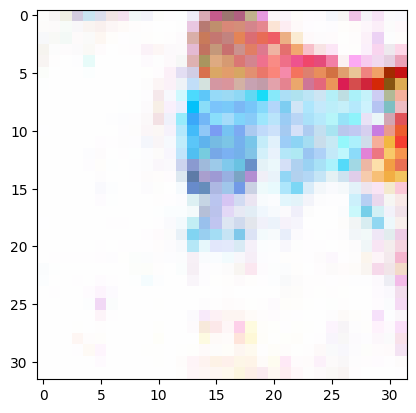

[460/500][0/936]	Loss_D: 0.0077	Loss_G: 5.5273	D(x): 1.0000	D(G(z)): 0.0077 / 0.0044
[460/500][15/936]	Loss_D: 0.0015	Loss_G: 6.7785	D(x): 1.0000	D(G(z)): 0.0015 / 0.0012
[460/500][30/936]	Loss_D: 0.0008	Loss_G: 13.2740	D(x): 0.9994	D(G(z)): 0.0002 / 0.0003
[460/500][45/936]	Loss_D: 0.0000	Loss_G: 11.8630	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[460/500][60/936]	Loss_D: 0.0005	Loss_G: 9.0344	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[460/500][75/936]	Loss_D: 0.0022	Loss_G: 6.7976	D(x): 1.0000	D(G(z)): 0.0022 / 0.0018
[460/500][90/936]	Loss_D: 0.0001	Loss_G: 9.3258	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[460/500][105/936]	Loss_D: 0.0049	Loss_G: 5.6877	D(x): 1.0000	D(G(z)): 0.0048 / 0.0037
[460/500][120/936]	Loss_D: 0.0061	Loss_G: 5.4423	D(x): 1.0000	D(G(z)): 0.0061 / 0.0046
[460/500][135/936]	Loss_D: 0.0002	Loss_G: 9.6940	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[460/500][150/936]	Loss_D: 0.0034	Loss_G: 6.2498	D(x): 1.0000	D(G(z)): 0.0034 / 0.0026
[460/500][165/936]	Loss_D: 0.0023	Loss_G: 6.6241	

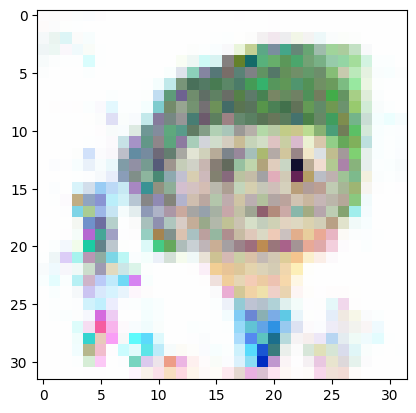

[461/500][0/936]	Loss_D: 0.0007	Loss_G: 9.0804	D(x): 1.0000	D(G(z)): 0.0007 / 0.0005
[461/500][15/936]	Loss_D: 0.0040	Loss_G: 5.8638	D(x): 1.0000	D(G(z)): 0.0040 / 0.0034
[461/500][30/936]	Loss_D: 0.0164	Loss_G: 4.8829	D(x): 1.0000	D(G(z)): 0.0160 / 0.0270
[461/500][45/936]	Loss_D: 0.0049	Loss_G: 6.0054	D(x): 1.0000	D(G(z)): 0.0049 / 0.0042
[461/500][60/936]	Loss_D: 0.0000	Loss_G: 16.2544	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[461/500][75/936]	Loss_D: 0.0001	Loss_G: 15.4731	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[461/500][90/936]	Loss_D: 0.0007	Loss_G: 8.6880	D(x): 0.9996	D(G(z)): 0.0003 / 0.0003
[461/500][105/936]	Loss_D: 0.0117	Loss_G: 5.1087	D(x): 1.0000	D(G(z)): 0.0116 / 0.0083
[461/500][120/936]	Loss_D: 0.0066	Loss_G: 7.6534	D(x): 0.9945	D(G(z)): 0.0011 / 0.0009
[461/500][135/936]	Loss_D: 0.0058	Loss_G: 5.2891	D(x): 1.0000	D(G(z)): 0.0057 / 0.0059
[461/500][150/936]	Loss_D: 0.0025	Loss_G: 6.5954	D(x): 0.9998	D(G(z)): 0.0023 / 0.0019
[461/500][165/936]	Loss_D: 0.0037	Loss_G: 5.8766	

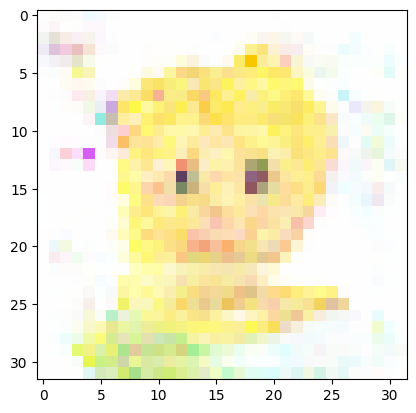

[462/500][0/936]	Loss_D: 0.1166	Loss_G: 8.4628	D(x): 0.9110	D(G(z)): 0.0067 / 0.0041
[462/500][15/936]	Loss_D: 0.0017	Loss_G: 7.3949	D(x): 1.0000	D(G(z)): 0.0016 / 0.0015
[462/500][30/936]	Loss_D: 0.0000	Loss_G: 12.8907	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[462/500][45/936]	Loss_D: 0.0081	Loss_G: 6.5156	D(x): 0.9999	D(G(z)): 0.0078 / 0.0043
[462/500][60/936]	Loss_D: 0.0021	Loss_G: 6.5985	D(x): 0.9999	D(G(z)): 0.0020 / 0.0018
[462/500][75/936]	Loss_D: 0.0032	Loss_G: 7.3759	D(x): 1.0000	D(G(z)): 0.0031 / 0.0021
[462/500][90/936]	Loss_D: 0.0116	Loss_G: 6.0868	D(x): 1.0000	D(G(z)): 0.0114 / 0.0041
[462/500][105/936]	Loss_D: 0.0004	Loss_G: 9.4495	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[462/500][120/936]	Loss_D: 0.0019	Loss_G: 7.1558	D(x): 1.0000	D(G(z)): 0.0019 / 0.0015
[462/500][135/936]	Loss_D: 0.0008	Loss_G: 8.1026	D(x): 0.9999	D(G(z)): 0.0008 / 0.0007
[462/500][150/936]	Loss_D: 0.0006	Loss_G: 8.3263	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
[462/500][165/936]	Loss_D: 0.0006	Loss_G: 9.1561	D

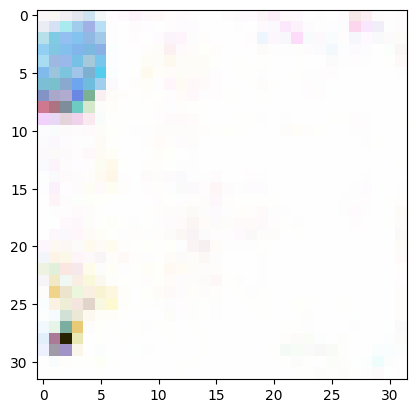

[463/500][0/936]	Loss_D: 0.0001	Loss_G: 9.3505	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[463/500][15/936]	Loss_D: 0.0011	Loss_G: 7.3994	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[463/500][30/936]	Loss_D: 0.0020	Loss_G: 6.5261	D(x): 1.0000	D(G(z)): 0.0020 / 0.0017
[463/500][45/936]	Loss_D: 0.0001	Loss_G: 9.4524	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[463/500][60/936]	Loss_D: 0.0015	Loss_G: 6.8214	D(x): 1.0000	D(G(z)): 0.0015 / 0.0012
[463/500][75/936]	Loss_D: 0.0005	Loss_G: 8.5976	D(x): 0.9998	D(G(z)): 0.0003 / 0.0003
[463/500][90/936]	Loss_D: 0.0026	Loss_G: 6.2392	D(x): 1.0000	D(G(z)): 0.0026 / 0.0022
[463/500][105/936]	Loss_D: 0.0002	Loss_G: 10.1366	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[463/500][120/936]	Loss_D: 0.0110	Loss_G: 6.2287	D(x): 0.9933	D(G(z)): 0.0041 / 0.0031
[463/500][135/936]	Loss_D: 0.0007	Loss_G: 8.2155	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[463/500][150/936]	Loss_D: 0.0003	Loss_G: 8.2177	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[463/500][165/936]	Loss_D: 0.0003	Loss_G: 8.1772	D

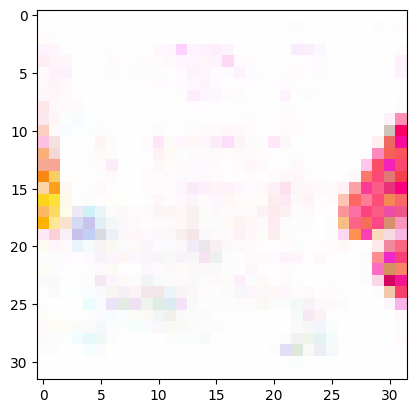

[464/500][0/936]	Loss_D: 1.2005	Loss_G: 15.3722	D(x): 1.0000	D(G(z)): 0.5365 / 0.0008
[464/500][15/936]	Loss_D: 0.0000	Loss_G: 32.4213	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[464/500][30/936]	Loss_D: 0.0221	Loss_G: 12.7426	D(x): 1.0000	D(G(z)): 0.0217 / 0.0167
[464/500][45/936]	Loss_D: 0.2016	Loss_G: 11.0585	D(x): 0.8716	D(G(z)): 0.0270 / 0.0240
[464/500][60/936]	Loss_D: 0.0035	Loss_G: 6.2452	D(x): 1.0000	D(G(z)): 0.0035 / 0.0027
[464/500][75/936]	Loss_D: 0.0002	Loss_G: 14.8743	D(x): 0.9998	D(G(z)): 0.0000 / 0.0000
[464/500][90/936]	Loss_D: 0.0011	Loss_G: 7.1869	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[464/500][105/936]	Loss_D: 0.0028	Loss_G: 7.7546	D(x): 1.0000	D(G(z)): 0.0028 / 0.0007
[464/500][120/936]	Loss_D: 0.0005	Loss_G: 8.8839	D(x): 1.0000	D(G(z)): 0.0005 / 0.0003
[464/500][135/936]	Loss_D: 0.0002	Loss_G: 12.2439	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[464/500][150/936]	Loss_D: 0.0020	Loss_G: 7.5661	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[464/500][165/936]	Loss_D: 0.0001	Loss_G: 10.

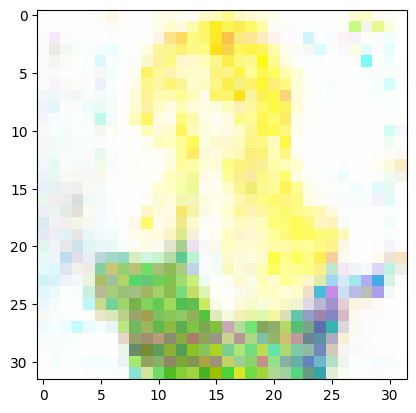

[465/500][0/936]	Loss_D: 0.0058	Loss_G: 5.8937	D(x): 1.0000	D(G(z)): 0.0058 / 0.0049
[465/500][15/936]	Loss_D: 0.0275	Loss_G: 20.5912	D(x): 0.9739	D(G(z)): 0.0000 / 0.0000
[465/500][30/936]	Loss_D: 0.0000	Loss_G: 12.1452	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[465/500][45/936]	Loss_D: 0.0006	Loss_G: 7.5097	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[465/500][60/936]	Loss_D: 0.0001	Loss_G: 10.2272	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[465/500][75/936]	Loss_D: 0.0071	Loss_G: 5.4674	D(x): 1.0000	D(G(z)): 0.0070 / 0.0046
[465/500][90/936]	Loss_D: 0.0006	Loss_G: 7.7773	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[465/500][105/936]	Loss_D: 0.0015	Loss_G: 6.6588	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[465/500][120/936]	Loss_D: 0.0000	Loss_G: 15.3601	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[465/500][135/936]	Loss_D: 0.0135	Loss_G: 4.7534	D(x): 1.0000	D(G(z)): 0.0134 / 0.0097
[465/500][150/936]	Loss_D: 0.0012	Loss_G: 6.8637	D(x): 1.0000	D(G(z)): 0.0012 / 0.0011
[465/500][165/936]	Loss_D: 0.0373	Loss_G: 4.883

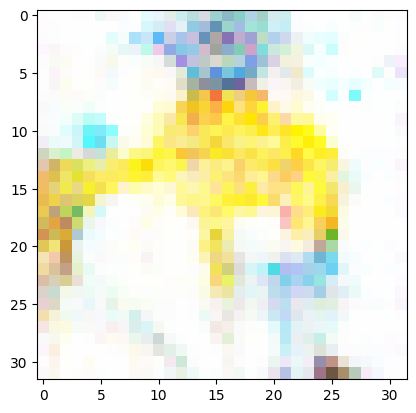

[466/500][0/936]	Loss_D: 0.0000	Loss_G: 12.4370	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[466/500][15/936]	Loss_D: 0.0034	Loss_G: 7.0573	D(x): 1.0000	D(G(z)): 0.0034 / 0.0029
[466/500][30/936]	Loss_D: 0.0013	Loss_G: 8.3223	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[466/500][45/936]	Loss_D: 0.0038	Loss_G: 5.9506	D(x): 1.0000	D(G(z)): 0.0037 / 0.0033
[466/500][60/936]	Loss_D: 0.1146	Loss_G: 6.5212	D(x): 0.9086	D(G(z)): 0.0010 / 0.0018
[466/500][75/936]	Loss_D: 0.0005	Loss_G: 7.8602	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[466/500][90/936]	Loss_D: 0.0091	Loss_G: 5.0404	D(x): 1.0000	D(G(z)): 0.0091 / 0.0073
[466/500][105/936]	Loss_D: 0.0103	Loss_G: 5.2477	D(x): 1.0000	D(G(z)): 0.0103 / 0.0080
[466/500][120/936]	Loss_D: 0.0002	Loss_G: 9.2204	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[466/500][135/936]	Loss_D: 0.2910	Loss_G: 6.5248	D(x): 0.9993	D(G(z)): 0.2388 / 0.0040
[466/500][150/936]	Loss_D: 0.0001	Loss_G: 11.9159	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[466/500][165/936]	Loss_D: 0.0109	Loss_G: 6.8806	

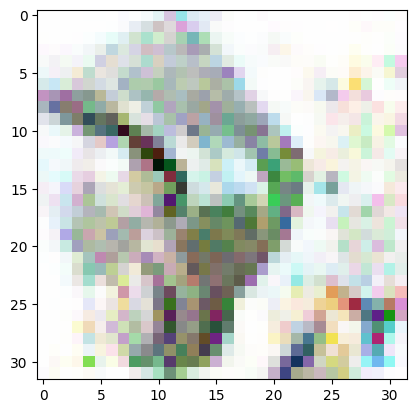

[467/500][0/936]	Loss_D: 0.0007	Loss_G: 7.7031	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[467/500][15/936]	Loss_D: 0.0083	Loss_G: 5.5324	D(x): 1.0000	D(G(z)): 0.0082 / 0.0056
[467/500][30/936]	Loss_D: 0.0037	Loss_G: 6.6018	D(x): 1.0000	D(G(z)): 0.0037 / 0.0029
[467/500][45/936]	Loss_D: 0.0068	Loss_G: 5.3595	D(x): 0.9999	D(G(z)): 0.0067 / 0.0052
[467/500][60/936]	Loss_D: 0.0037	Loss_G: 6.8275	D(x): 0.9989	D(G(z)): 0.0026 / 0.0020
[467/500][75/936]	Loss_D: 0.1389	Loss_G: 8.5853	D(x): 1.0000	D(G(z)): 0.1256 / 0.0007
[467/500][90/936]	Loss_D: 0.0311	Loss_G: 10.0301	D(x): 0.9707	D(G(z)): 0.0000 / 0.0001
[467/500][105/936]	Loss_D: 0.0073	Loss_G: 5.6847	D(x): 1.0000	D(G(z)): 0.0072 / 0.0038
[467/500][120/936]	Loss_D: 0.0008	Loss_G: 7.4951	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[467/500][135/936]	Loss_D: 0.0018	Loss_G: 9.1209	D(x): 0.9984	D(G(z)): 0.0002 / 0.0002
[467/500][150/936]	Loss_D: 0.0001	Loss_G: 9.4729	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[467/500][165/936]	Loss_D: 0.0018	Loss_G: 6.6945	D

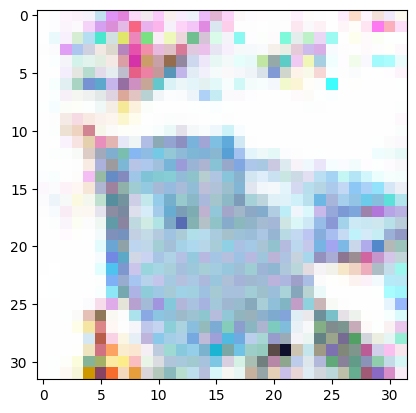

[468/500][0/936]	Loss_D: 0.4936	Loss_G: 11.4691	D(x): 1.0000	D(G(z)): 0.3565 / 0.0001
[468/500][15/936]	Loss_D: 0.0259	Loss_G: 13.5192	D(x): 1.0000	D(G(z)): 0.0246 / 0.0039
[468/500][30/936]	Loss_D: 0.0046	Loss_G: 5.8269	D(x): 1.0000	D(G(z)): 0.0046 / 0.0037
[468/500][45/936]	Loss_D: 0.0010	Loss_G: 7.2778	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[468/500][60/936]	Loss_D: 0.0028	Loss_G: 6.3419	D(x): 1.0000	D(G(z)): 0.0028 / 0.0024
[468/500][75/936]	Loss_D: 0.0040	Loss_G: 6.3053	D(x): 1.0000	D(G(z)): 0.0040 / 0.0027
[468/500][90/936]	Loss_D: 0.0009	Loss_G: 8.1380	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[468/500][105/936]	Loss_D: 0.0013	Loss_G: 7.3951	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[468/500][120/936]	Loss_D: 0.0000	Loss_G: 11.6918	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[468/500][135/936]	Loss_D: 0.0022	Loss_G: 6.5896	D(x): 1.0000	D(G(z)): 0.0021 / 0.0018
[468/500][150/936]	Loss_D: 0.0106	Loss_G: 5.2891	D(x): 1.0000	D(G(z)): 0.0105 / 0.0057
[468/500][165/936]	Loss_D: 0.0001	Loss_G: 10.468

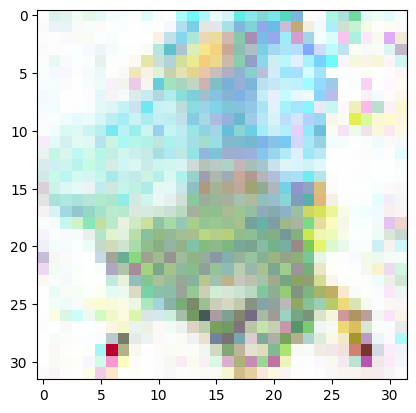

[469/500][0/936]	Loss_D: 0.1740	Loss_G: 16.2048	D(x): 1.0000	D(G(z)): 0.1417 / 0.0055
[469/500][15/936]	Loss_D: 0.0035	Loss_G: 8.6260	D(x): 1.0000	D(G(z)): 0.0034 / 0.0025
[469/500][30/936]	Loss_D: 0.0001	Loss_G: 16.1333	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[469/500][45/936]	Loss_D: 0.0058	Loss_G: 5.9541	D(x): 1.0000	D(G(z)): 0.0058 / 0.0028
[469/500][60/936]	Loss_D: 0.0031	Loss_G: 8.2868	D(x): 1.0000	D(G(z)): 0.0031 / 0.0023
[469/500][75/936]	Loss_D: 0.0090	Loss_G: 5.7232	D(x): 1.0000	D(G(z)): 0.0089 / 0.0063
[469/500][90/936]	Loss_D: 0.0684	Loss_G: 3.2796	D(x): 1.0000	D(G(z)): 0.0639 / 0.0534
[469/500][105/936]	Loss_D: 0.0043	Loss_G: 7.4124	D(x): 1.0000	D(G(z)): 0.0043 / 0.0039
[469/500][120/936]	Loss_D: 0.0151	Loss_G: 4.9537	D(x): 1.0000	D(G(z)): 0.0150 / 0.0086
[469/500][135/936]	Loss_D: 0.0014	Loss_G: 7.0464	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[469/500][150/936]	Loss_D: 0.0011	Loss_G: 7.2682	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[469/500][165/936]	Loss_D: 0.0002	Loss_G: 8.6980	

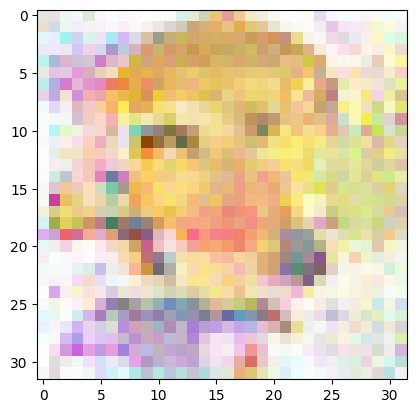

[470/500][0/936]	Loss_D: 0.0000	Loss_G: 9.7444	D(x): 1.0000	D(G(z)): 0.0000 / 0.0001
[470/500][15/936]	Loss_D: 0.2220	Loss_G: 15.7244	D(x): 0.8527	D(G(z)): 0.0000 / 0.0000
[470/500][30/936]	Loss_D: 0.0089	Loss_G: 6.7314	D(x): 0.9999	D(G(z)): 0.0087 / 0.0039
[470/500][45/936]	Loss_D: 0.1714	Loss_G: 7.0915	D(x): 0.9992	D(G(z)): 0.1415 / 0.0076
[470/500][60/936]	Loss_D: 0.0002	Loss_G: 9.4778	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[470/500][75/936]	Loss_D: 0.0035	Loss_G: 7.1113	D(x): 1.0000	D(G(z)): 0.0035 / 0.0027
[470/500][90/936]	Loss_D: 0.0026	Loss_G: 7.1155	D(x): 0.9987	D(G(z)): 0.0013 / 0.0012
[470/500][105/936]	Loss_D: 0.0002	Loss_G: 9.3105	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[470/500][120/936]	Loss_D: 0.0203	Loss_G: 5.1945	D(x): 0.9999	D(G(z)): 0.0198 / 0.0099
[470/500][135/936]	Loss_D: 0.0030	Loss_G: 21.4633	D(x): 0.9970	D(G(z)): 0.0000 / 0.0000
[470/500][150/936]	Loss_D: 0.0027	Loss_G: 21.2621	D(x): 0.9974	D(G(z)): 0.0000 / 0.0000
[470/500][165/936]	Loss_D: 0.0007	Loss_G: 7.7873

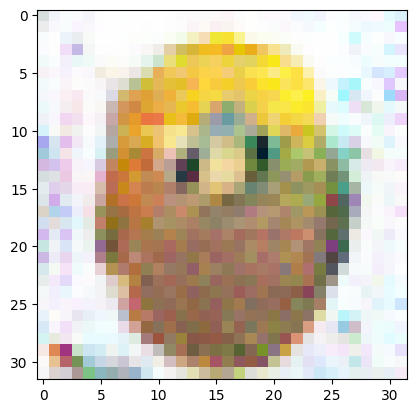

[471/500][0/936]	Loss_D: 0.0001	Loss_G: 11.3840	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[471/500][15/936]	Loss_D: 0.0056	Loss_G: 7.9321	D(x): 0.9991	D(G(z)): 0.0047 / 0.0040
[471/500][30/936]	Loss_D: 0.0048	Loss_G: 6.0554	D(x): 1.0000	D(G(z)): 0.0048 / 0.0040
[471/500][45/936]	Loss_D: 0.0010	Loss_G: 8.0435	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[471/500][60/936]	Loss_D: 1.1360	Loss_G: 4.7274	D(x): 0.7306	D(G(z)): 0.0017 / 0.0439
[471/500][75/936]	Loss_D: 0.0000	Loss_G: 13.3562	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[471/500][90/936]	Loss_D: 0.0367	Loss_G: 5.2689	D(x): 1.0000	D(G(z)): 0.0358 / 0.0167
[471/500][105/936]	Loss_D: 0.0001	Loss_G: 9.6882	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[471/500][120/936]	Loss_D: 0.0040	Loss_G: 6.6897	D(x): 1.0000	D(G(z)): 0.0040 / 0.0027
[471/500][135/936]	Loss_D: 0.0002	Loss_G: 9.6091	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[471/500][150/936]	Loss_D: 0.0112	Loss_G: 5.2175	D(x): 0.9997	D(G(z)): 0.0108 / 0.0076
[471/500][165/936]	Loss_D: 0.0123	Loss_G: 8.0976	

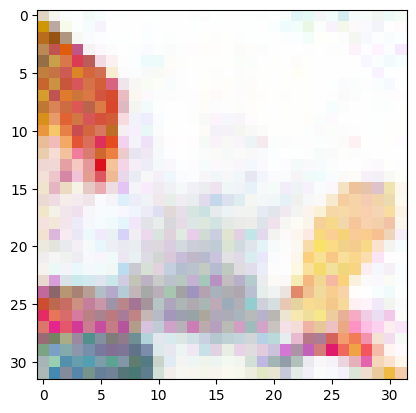

[472/500][0/936]	Loss_D: 0.0014	Loss_G: 7.2485	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[472/500][15/936]	Loss_D: 0.0012	Loss_G: 6.9104	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[472/500][30/936]	Loss_D: 0.0014	Loss_G: 7.6459	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
[472/500][45/936]	Loss_D: 0.0046	Loss_G: 5.7785	D(x): 1.0000	D(G(z)): 0.0045 / 0.0038
[472/500][60/936]	Loss_D: 0.0064	Loss_G: 6.1829	D(x): 1.0000	D(G(z)): 0.0063 / 0.0050
[472/500][75/936]	Loss_D: 0.0006	Loss_G: 8.0980	D(x): 0.9997	D(G(z)): 0.0003 / 0.0003
[472/500][90/936]	Loss_D: 0.0016	Loss_G: 7.0169	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[472/500][105/936]	Loss_D: 0.0045	Loss_G: 5.7765	D(x): 1.0000	D(G(z)): 0.0045 / 0.0039
[472/500][120/936]	Loss_D: 0.0220	Loss_G: 5.5257	D(x): 1.0000	D(G(z)): 0.0214 / 0.0108
[472/500][135/936]	Loss_D: 0.0001	Loss_G: 9.4670	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[472/500][150/936]	Loss_D: 0.0004	Loss_G: 8.6236	D(x): 1.0000	D(G(z)): 0.0004 / 0.0002
[472/500][165/936]	Loss_D: 0.0030	Loss_G: 6.2715	D(

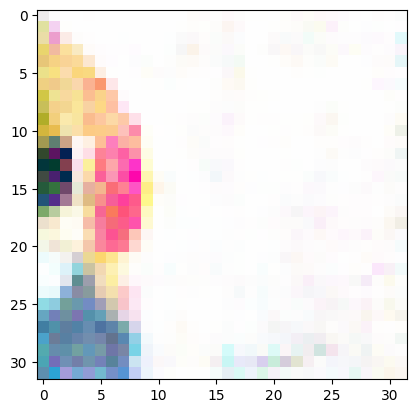

[473/500][0/936]	Loss_D: 0.0013	Loss_G: 24.1816	D(x): 0.9997	D(G(z)): 0.0010 / 0.0009
[473/500][15/936]	Loss_D: 0.0045	Loss_G: 18.7269	D(x): 1.0000	D(G(z)): 0.0044 / 0.0040
[473/500][30/936]	Loss_D: 0.0001	Loss_G: 10.6534	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[473/500][45/936]	Loss_D: 0.0625	Loss_G: 33.8761	D(x): 0.9478	D(G(z)): 0.0069 / 0.0074
[473/500][60/936]	Loss_D: 0.0001	Loss_G: 11.5325	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[473/500][75/936]	Loss_D: 0.0025	Loss_G: 19.7762	D(x): 1.0000	D(G(z)): 0.0025 / 0.0023
[473/500][90/936]	Loss_D: 0.0002	Loss_G: 25.2256	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[473/500][105/936]	Loss_D: 0.0015	Loss_G: 20.3958	D(x): 1.0000	D(G(z)): 0.0015 / 0.0012
[473/500][120/936]	Loss_D: 0.0021	Loss_G: 15.8014	D(x): 1.0000	D(G(z)): 0.0021 / 0.0020
[473/500][135/936]	Loss_D: 0.0031	Loss_G: 15.7805	D(x): 1.0000	D(G(z)): 0.0031 / 0.0028
[473/500][150/936]	Loss_D: 0.0020	Loss_G: 13.7374	D(x): 1.0000	D(G(z)): 0.0019 / 0.0017
[473/500][165/936]	Loss_D: 0.0005	Loss_G

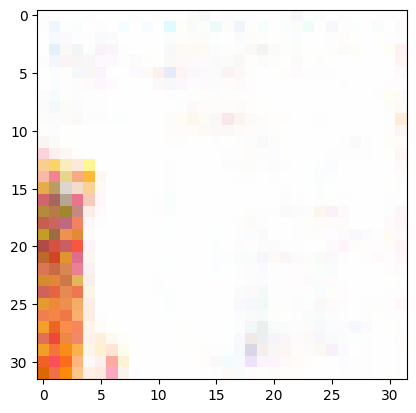

[474/500][0/936]	Loss_D: 0.0000	Loss_G: 15.2206	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[474/500][15/936]	Loss_D: 0.0003	Loss_G: 14.8003	D(x): 0.9998	D(G(z)): 0.0001 / 0.0001
[474/500][30/936]	Loss_D: 0.0013	Loss_G: 8.3182	D(x): 1.0000	D(G(z)): 0.0013 / 0.0012
[474/500][45/936]	Loss_D: 0.0009	Loss_G: 9.8349	D(x): 0.9996	D(G(z)): 0.0004 / 0.0004
[474/500][60/936]	Loss_D: 0.0140	Loss_G: 5.9930	D(x): 1.0000	D(G(z)): 0.0137 / 0.0094
[474/500][75/936]	Loss_D: 0.0000	Loss_G: 19.0535	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[474/500][90/936]	Loss_D: 0.0006	Loss_G: 9.7669	D(x): 0.9997	D(G(z)): 0.0003 / 0.0003
[474/500][105/936]	Loss_D: 0.0174	Loss_G: 5.4141	D(x): 1.0000	D(G(z)): 0.0170 / 0.0105
[474/500][120/936]	Loss_D: 0.0002	Loss_G: 10.0125	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[474/500][135/936]	Loss_D: 0.0003	Loss_G: 8.3236	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[474/500][150/936]	Loss_D: 0.0142	Loss_G: 5.1263	D(x): 0.9995	D(G(z)): 0.0135 / 0.0066
[474/500][165/936]	Loss_D: 0.0051	Loss_G: 5.644

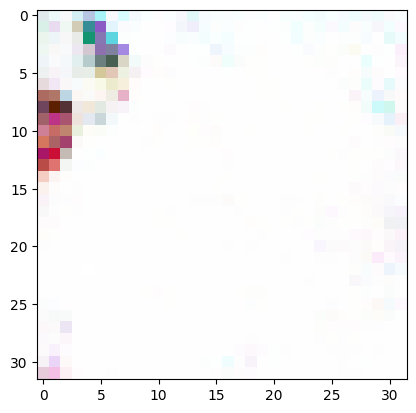

[475/500][0/936]	Loss_D: 0.0012	Loss_G: 7.0369	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[475/500][15/936]	Loss_D: 0.0002	Loss_G: 8.6310	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[475/500][30/936]	Loss_D: 0.0068	Loss_G: 6.6627	D(x): 1.0000	D(G(z)): 0.0067 / 0.0038
[475/500][45/936]	Loss_D: 0.3186	Loss_G: 4.6456	D(x): 0.7592	D(G(z)): 0.0026 / 0.0100
[475/500][60/936]	Loss_D: 0.0038	Loss_G: 5.8403	D(x): 1.0000	D(G(z)): 0.0038 / 0.0032
[475/500][75/936]	Loss_D: 0.0001	Loss_G: 10.3128	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[475/500][90/936]	Loss_D: 0.0000	Loss_G: 10.9662	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[475/500][105/936]	Loss_D: 0.0001	Loss_G: 10.7269	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[475/500][120/936]	Loss_D: 0.0050	Loss_G: 6.7946	D(x): 1.0000	D(G(z)): 0.0050 / 0.0035
[475/500][135/936]	Loss_D: 0.0021	Loss_G: 6.5765	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[475/500][150/936]	Loss_D: 0.0038	Loss_G: 6.5664	D(x): 1.0000	D(G(z)): 0.0037 / 0.0026
[475/500][165/936]	Loss_D: 0.0008	Loss_G: 17.472

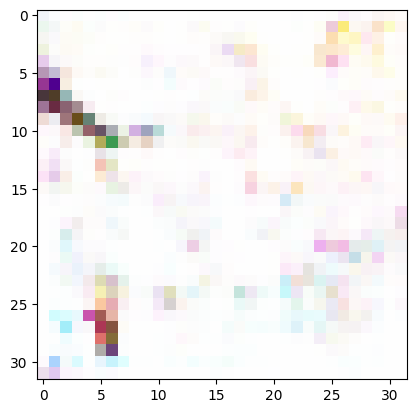

[476/500][0/936]	Loss_D: 0.0033	Loss_G: 6.2006	D(x): 1.0000	D(G(z)): 0.0033 / 0.0031
[476/500][15/936]	Loss_D: 0.0000	Loss_G: 15.0624	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[476/500][30/936]	Loss_D: 0.0008	Loss_G: 12.8090	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[476/500][45/936]	Loss_D: 0.0000	Loss_G: 13.9661	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[476/500][60/936]	Loss_D: 0.0018	Loss_G: 7.5511	D(x): 1.0000	D(G(z)): 0.0018 / 0.0016
[476/500][75/936]	Loss_D: 0.0293	Loss_G: 6.1478	D(x): 1.0000	D(G(z)): 0.0279 / 0.0045
[476/500][90/936]	Loss_D: 0.0016	Loss_G: 7.8879	D(x): 0.9999	D(G(z)): 0.0015 / 0.0013
[476/500][105/936]	Loss_D: 0.0000	Loss_G: 12.1622	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[476/500][120/936]	Loss_D: 0.0010	Loss_G: 7.5583	D(x): 1.0000	D(G(z)): 0.0010 / 0.0010
[476/500][135/936]	Loss_D: 0.0006	Loss_G: 8.6646	D(x): 1.0000	D(G(z)): 0.0006 / 0.0004
[476/500][150/936]	Loss_D: 0.0011	Loss_G: 7.5354	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[476/500][165/936]	Loss_D: 0.0000	Loss_G: 17.35

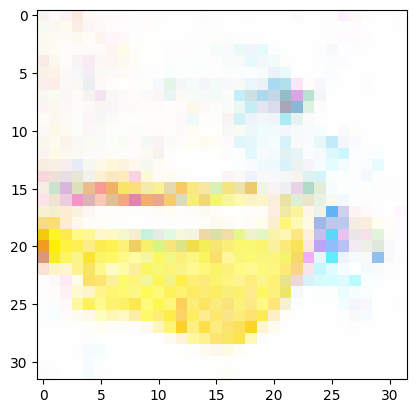

[477/500][0/936]	Loss_D: 0.0162	Loss_G: 3.6738	D(x): 1.0000	D(G(z)): 0.0160 / 0.1341
[477/500][15/936]	Loss_D: 1.3744	Loss_G: 1.8809	D(x): 0.7476	D(G(z)): 0.0158 / 0.2460
[477/500][30/936]	Loss_D: 0.0047	Loss_G: 6.8239	D(x): 1.0000	D(G(z)): 0.0047 / 0.0035
[477/500][45/936]	Loss_D: 0.2772	Loss_G: 6.4464	D(x): 0.8323	D(G(z)): 0.0008 / 0.0017
[477/500][60/936]	Loss_D: 0.0239	Loss_G: 4.9869	D(x): 0.9997	D(G(z)): 0.0231 / 0.0108
[477/500][75/936]	Loss_D: 0.0004	Loss_G: 11.3451	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[477/500][90/936]	Loss_D: 0.0002	Loss_G: 9.3002	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[477/500][105/936]	Loss_D: 0.0004	Loss_G: 8.1079	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[477/500][120/936]	Loss_D: 0.0002	Loss_G: 10.0615	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[477/500][135/936]	Loss_D: 0.0000	Loss_G: 11.6563	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[477/500][150/936]	Loss_D: 0.0006	Loss_G: 8.6774	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[477/500][165/936]	Loss_D: 0.0001	Loss_G: 9.9195

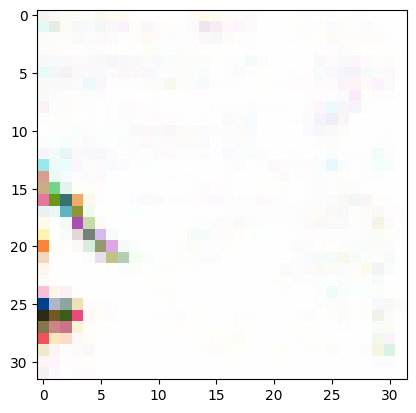

[478/500][0/936]	Loss_D: 0.0185	Loss_G: 3.4954	D(x): 0.9999	D(G(z)): 0.0179 / 0.1041
[478/500][15/936]	Loss_D: 6.0892	Loss_G: 3.1374	D(x): 0.1513	D(G(z)): 0.0000 / 0.0445
[478/500][30/936]	Loss_D: 0.1340	Loss_G: 6.1162	D(x): 1.0000	D(G(z)): 0.1230 / 0.0034
[478/500][45/936]	Loss_D: 0.0002	Loss_G: 8.8329	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[478/500][60/936]	Loss_D: 0.0001	Loss_G: 10.2670	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[478/500][75/936]	Loss_D: 0.0000	Loss_G: 13.7243	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[478/500][90/936]	Loss_D: 0.0049	Loss_G: 5.7235	D(x): 1.0000	D(G(z)): 0.0048 / 0.0036
[478/500][105/936]	Loss_D: 0.0000	Loss_G: 13.1463	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[478/500][120/936]	Loss_D: 0.0015	Loss_G: 7.0506	D(x): 1.0000	D(G(z)): 0.0015 / 0.0012
[478/500][135/936]	Loss_D: 0.0009	Loss_G: 7.3575	D(x): 1.0000	D(G(z)): 0.0009 / 0.0008
[478/500][150/936]	Loss_D: 0.0194	Loss_G: 7.5014	D(x): 0.9995	D(G(z)): 0.0185 / 0.0070
[478/500][165/936]	Loss_D: 0.0051	Loss_G: 7.4544

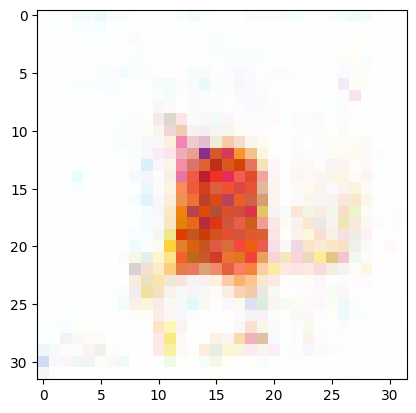

[479/500][0/936]	Loss_D: 0.0000	Loss_G: 12.1567	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[479/500][15/936]	Loss_D: 0.0004	Loss_G: 9.1699	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[479/500][30/936]	Loss_D: 0.4457	Loss_G: 7.9206	D(x): 1.0000	D(G(z)): 0.3196 / 0.0009
[479/500][45/936]	Loss_D: 0.0026	Loss_G: 8.8529	D(x): 0.9996	D(G(z)): 0.0022 / 0.0021
[479/500][60/936]	Loss_D: 0.0064	Loss_G: 7.0130	D(x): 1.0000	D(G(z)): 0.0063 / 0.0028
[479/500][75/936]	Loss_D: 0.0463	Loss_G: 5.6554	D(x): 1.0000	D(G(z)): 0.0442 / 0.0147
[479/500][90/936]	Loss_D: 0.0044	Loss_G: 5.5913	D(x): 1.0000	D(G(z)): 0.0043 / 0.0075
[479/500][105/936]	Loss_D: 0.0065	Loss_G: 6.1046	D(x): 1.0000	D(G(z)): 0.0064 / 0.0048
[479/500][120/936]	Loss_D: 0.0387	Loss_G: 5.7320	D(x): 1.0000	D(G(z)): 0.0377 / 0.0064
[479/500][135/936]	Loss_D: 0.0015	Loss_G: 6.8294	D(x): 1.0000	D(G(z)): 0.0015 / 0.0013
[479/500][150/936]	Loss_D: 0.0038	Loss_G: 7.1668	D(x): 0.9997	D(G(z)): 0.0036 / 0.0026
[479/500][165/936]	Loss_D: 0.0094	Loss_G: 5.4092	D

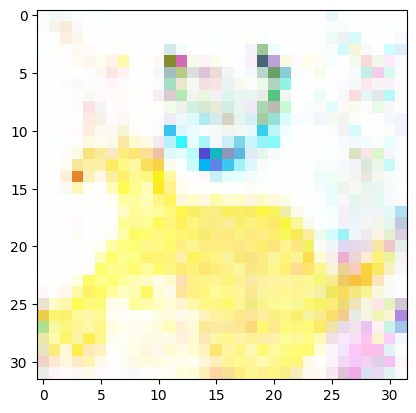

[480/500][0/936]	Loss_D: 0.0002	Loss_G: 9.2258	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[480/500][15/936]	Loss_D: 0.0034	Loss_G: 5.9043	D(x): 1.0000	D(G(z)): 0.0034 / 0.0028
[480/500][30/936]	Loss_D: 0.0128	Loss_G: 5.1525	D(x): 1.0000	D(G(z)): 0.0127 / 0.0066
[480/500][45/936]	Loss_D: 0.0000	Loss_G: 11.3817	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[480/500][60/936]	Loss_D: 0.0256	Loss_G: 11.9411	D(x): 0.9753	D(G(z)): 0.0000 / 0.0000
[480/500][75/936]	Loss_D: 0.0011	Loss_G: 7.9686	D(x): 0.9994	D(G(z)): 0.0005 / 0.0005
[480/500][90/936]	Loss_D: 0.0000	Loss_G: 10.7710	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[480/500][105/936]	Loss_D: 0.0020	Loss_G: 6.5745	D(x): 1.0000	D(G(z)): 0.0020 / 0.0017
[480/500][120/936]	Loss_D: 0.0890	Loss_G: 8.9872	D(x): 0.9237	D(G(z)): 0.0001 / 0.0002
[480/500][135/936]	Loss_D: 0.0002	Loss_G: 6.6762	D(x): 1.0000	D(G(z)): 0.0002 / 0.0017
[480/500][150/936]	Loss_D: 0.0012	Loss_G: 18.4479	D(x): 0.9988	D(G(z)): 0.0000 / 0.0000
[480/500][165/936]	Loss_D: 0.0000	Loss_G: 13.72

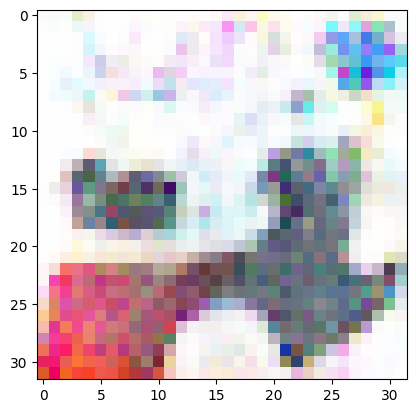

[481/500][0/936]	Loss_D: 0.0440	Loss_G: 3.2976	D(x): 1.0000	D(G(z)): 0.0411 / 0.0876
[481/500][15/936]	Loss_D: 0.0013	Loss_G: 12.4837	D(x): 0.9999	D(G(z)): 0.0012 / 0.0010
[481/500][30/936]	Loss_D: 0.0079	Loss_G: 5.9022	D(x): 0.9996	D(G(z)): 0.0074 / 0.0044
[481/500][45/936]	Loss_D: 0.0001	Loss_G: 9.9150	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[481/500][60/936]	Loss_D: 0.0051	Loss_G: 5.9895	D(x): 0.9999	D(G(z)): 0.0050 / 0.0035
[481/500][75/936]	Loss_D: 0.0057	Loss_G: 10.4297	D(x): 0.9997	D(G(z)): 0.0054 / 0.0035
[481/500][90/936]	Loss_D: 0.0023	Loss_G: 6.8616	D(x): 1.0000	D(G(z)): 0.0023 / 0.0020
[481/500][105/936]	Loss_D: 0.0321	Loss_G: 4.9123	D(x): 1.0000	D(G(z)): 0.0311 / 0.0087
[481/500][120/936]	Loss_D: 0.0183	Loss_G: 6.9120	D(x): 1.0000	D(G(z)): 0.0180 / 0.0039
[481/500][135/936]	Loss_D: 0.0140	Loss_G: 5.6577	D(x): 1.0000	D(G(z)): 0.0138 / 0.0049
[481/500][150/936]	Loss_D: 0.0015	Loss_G: 8.5182	D(x): 1.0000	D(G(z)): 0.0015 / 0.0010
[481/500][165/936]	Loss_D: 0.0002	Loss_G: 15.3898

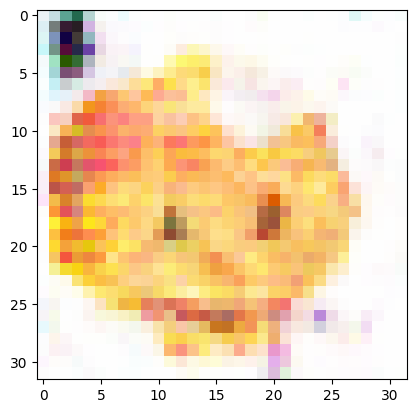

[482/500][0/936]	Loss_D: 0.0008	Loss_G: 10.1854	D(x): 1.0000	D(G(z)): 0.0007 / 0.0001
[482/500][15/936]	Loss_D: 0.0001	Loss_G: 10.4078	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[482/500][30/936]	Loss_D: 0.0018	Loss_G: 6.8954	D(x): 1.0000	D(G(z)): 0.0018 / 0.0011
[482/500][45/936]	Loss_D: 0.0189	Loss_G: 5.1749	D(x): 1.0000	D(G(z)): 0.0186 / 0.0061
[482/500][60/936]	Loss_D: 0.0001	Loss_G: 9.9949	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[482/500][75/936]	Loss_D: 0.0024	Loss_G: 6.1967	D(x): 1.0000	D(G(z)): 0.0024 / 0.0023
[482/500][90/936]	Loss_D: 0.0001	Loss_G: 16.0585	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[482/500][105/936]	Loss_D: 0.0027	Loss_G: 12.4987	D(x): 1.0000	D(G(z)): 0.0027 / 0.0022
[482/500][120/936]	Loss_D: 0.0023	Loss_G: 8.7623	D(x): 0.9998	D(G(z)): 0.0021 / 0.0019
[482/500][135/936]	Loss_D: 0.0011	Loss_G: 8.3208	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[482/500][150/936]	Loss_D: 0.0005	Loss_G: 14.6768	D(x): 0.9995	D(G(z)): 0.0000 / 0.0000
[482/500][165/936]	Loss_D: 0.0003	Loss_G: 12.8

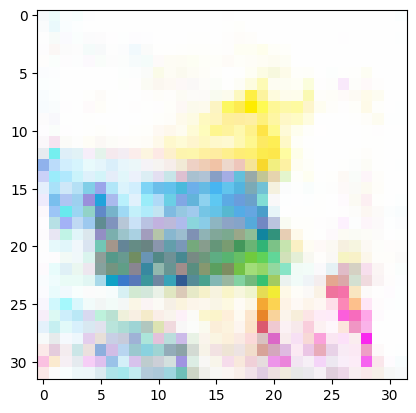

[483/500][0/936]	Loss_D: 0.0059	Loss_G: 6.0369	D(x): 0.9985	D(G(z)): 0.0044 / 0.0028
[483/500][15/936]	Loss_D: 0.0000	Loss_G: 10.9092	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[483/500][30/936]	Loss_D: 0.0040	Loss_G: 6.1536	D(x): 0.9997	D(G(z)): 0.0036 / 0.0029
[483/500][45/936]	Loss_D: 0.0071	Loss_G: 5.6145	D(x): 1.0000	D(G(z)): 0.0070 / 0.0042
[483/500][60/936]	Loss_D: 0.0000	Loss_G: 11.0601	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[483/500][75/936]	Loss_D: 0.0010	Loss_G: 7.3047	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[483/500][90/936]	Loss_D: 0.3149	Loss_G: 29.2719	D(x): 0.8183	D(G(z)): 0.0000 / 0.0000
[483/500][105/936]	Loss_D: 0.0000	Loss_G: 24.4920	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[483/500][120/936]	Loss_D: 0.0000	Loss_G: 14.2593	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[483/500][135/936]	Loss_D: 0.0003	Loss_G: 23.1442	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[483/500][150/936]	Loss_D: 0.0012	Loss_G: 15.1292	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[483/500][165/936]	Loss_D: 0.0003	Loss_G: 12

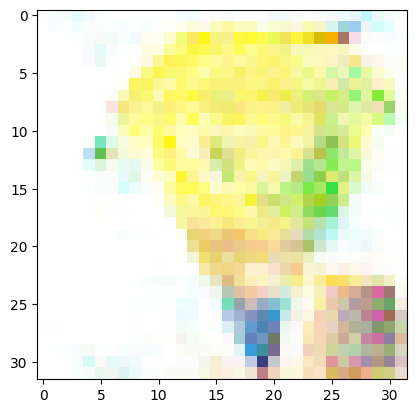

[484/500][0/936]	Loss_D: 0.0030	Loss_G: 7.4605	D(x): 1.0000	D(G(z)): 0.0030 / 0.0039
[484/500][15/936]	Loss_D: 0.0018	Loss_G: 9.2974	D(x): 0.9984	D(G(z)): 0.0002 / 0.0002
[484/500][30/936]	Loss_D: 0.0007	Loss_G: 8.1399	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[484/500][45/936]	Loss_D: 0.0018	Loss_G: 6.5457	D(x): 1.0000	D(G(z)): 0.0018 / 0.0016
[484/500][60/936]	Loss_D: 0.0000	Loss_G: 14.4383	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[484/500][75/936]	Loss_D: 0.0019	Loss_G: 6.6041	D(x): 1.0000	D(G(z)): 0.0019 / 0.0017
[484/500][90/936]	Loss_D: 0.0007	Loss_G: 8.3574	D(x): 0.9999	D(G(z)): 0.0007 / 0.0006
[484/500][105/936]	Loss_D: 0.0102	Loss_G: 5.2986	D(x): 1.0000	D(G(z)): 0.0101 / 0.0076
[484/500][120/936]	Loss_D: 0.0057	Loss_G: 6.1828	D(x): 0.9968	D(G(z)): 0.0025 / 0.0022
[484/500][135/936]	Loss_D: 0.0147	Loss_G: 5.0432	D(x): 1.0000	D(G(z)): 0.0146 / 0.0071
[484/500][150/936]	Loss_D: 0.0004	Loss_G: 8.0462	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[484/500][165/936]	Loss_D: 0.0050	Loss_G: 5.9470	D

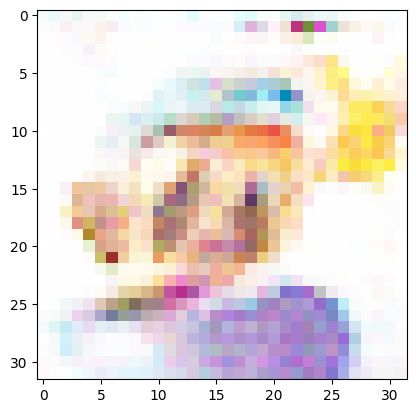

[485/500][0/936]	Loss_D: 0.0011	Loss_G: 7.1915	D(x): 1.0000	D(G(z)): 0.0010 / 0.0009
[485/500][15/936]	Loss_D: 0.0015	Loss_G: 10.2095	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[485/500][30/936]	Loss_D: 0.0020	Loss_G: 7.1608	D(x): 1.0000	D(G(z)): 0.0020 / 0.0018
[485/500][45/936]	Loss_D: 0.0000	Loss_G: 10.8700	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[485/500][60/936]	Loss_D: 0.0134	Loss_G: 5.7048	D(x): 0.9958	D(G(z)): 0.0091 / 0.0052
[485/500][75/936]	Loss_D: 0.0005	Loss_G: 8.3732	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[485/500][90/936]	Loss_D: 0.0007	Loss_G: 9.9343	D(x): 0.9994	D(G(z)): 0.0001 / 0.0000
[485/500][105/936]	Loss_D: 0.0006	Loss_G: 7.4160	D(x): 1.0000	D(G(z)): 0.0006 / 0.0006
[485/500][120/936]	Loss_D: 0.1409	Loss_G: 8.5139	D(x): 0.9999	D(G(z)): 0.1305 / 0.0011
[485/500][135/936]	Loss_D: 0.0065	Loss_G: 7.4169	D(x): 1.0000	D(G(z)): 0.0065 / 0.0045
[485/500][150/936]	Loss_D: 2.7185	Loss_G: 0.4488	D(x): 0.0738	D(G(z)): 0.0056 / 0.7272
[485/500][165/936]	Loss_D: 0.0000	Loss_G: 13.2144

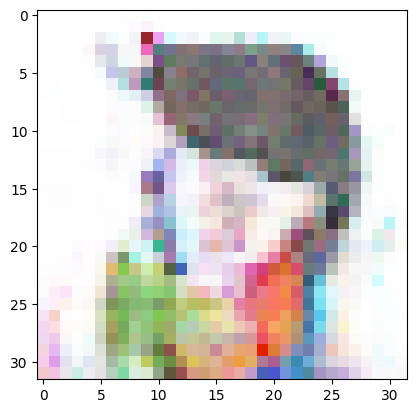

[486/500][0/936]	Loss_D: 0.0000	Loss_G: 18.1888	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[486/500][15/936]	Loss_D: 0.0071	Loss_G: 6.5002	D(x): 1.0000	D(G(z)): 0.0070 / 0.0059
[486/500][30/936]	Loss_D: 0.0000	Loss_G: 12.2486	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[486/500][45/936]	Loss_D: 0.0000	Loss_G: 11.3959	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[486/500][60/936]	Loss_D: 0.9635	Loss_G: 2.7367	D(x): 0.5482	D(G(z)): 0.0012 / 0.1077
[486/500][75/936]	Loss_D: 0.0008	Loss_G: 12.2733	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[486/500][90/936]	Loss_D: 0.0121	Loss_G: 7.5493	D(x): 1.0000	D(G(z)): 0.0119 / 0.0089
[486/500][105/936]	Loss_D: 0.0035	Loss_G: 7.2110	D(x): 1.0000	D(G(z)): 0.0035 / 0.0031
[486/500][120/936]	Loss_D: 0.0000	Loss_G: 11.0049	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[486/500][135/936]	Loss_D: 0.0061	Loss_G: 6.1100	D(x): 1.0000	D(G(z)): 0.0061 / 0.0029
[486/500][150/936]	Loss_D: 0.0003	Loss_G: 10.4823	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[486/500][165/936]	Loss_D: 0.0001	Loss_G: 9.8

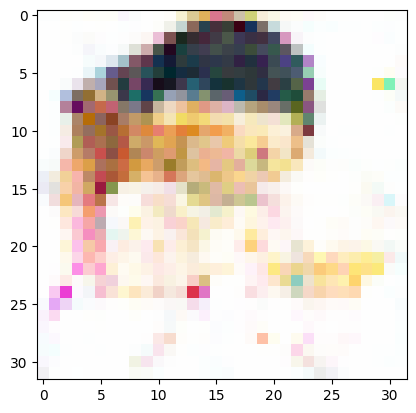

[487/500][0/936]	Loss_D: 0.0018	Loss_G: 6.7458	D(x): 1.0000	D(G(z)): 0.0018 / 0.0014
[487/500][15/936]	Loss_D: 0.0155	Loss_G: 5.8242	D(x): 0.9885	D(G(z)): 0.0037 / 0.0037
[487/500][30/936]	Loss_D: 0.0046	Loss_G: 5.8696	D(x): 0.9999	D(G(z)): 0.0046 / 0.0036
[487/500][45/936]	Loss_D: 0.0001	Loss_G: 10.2114	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[487/500][60/936]	Loss_D: 0.0146	Loss_G: 4.2475	D(x): 1.0000	D(G(z)): 0.0144 / 0.0305
[487/500][75/936]	Loss_D: 0.0000	Loss_G: 16.5503	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[487/500][90/936]	Loss_D: 0.0005	Loss_G: 8.9384	D(x): 1.0000	D(G(z)): 0.0005 / 0.0004
[487/500][105/936]	Loss_D: 0.0095	Loss_G: 7.4656	D(x): 1.0000	D(G(z)): 0.0094 / 0.0062
[487/500][120/936]	Loss_D: 0.0001	Loss_G: 10.8760	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[487/500][135/936]	Loss_D: 0.0000	Loss_G: 11.2000	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[487/500][150/936]	Loss_D: 0.0011	Loss_G: 8.2192	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[487/500][165/936]	Loss_D: 0.0001	Loss_G: 10.09

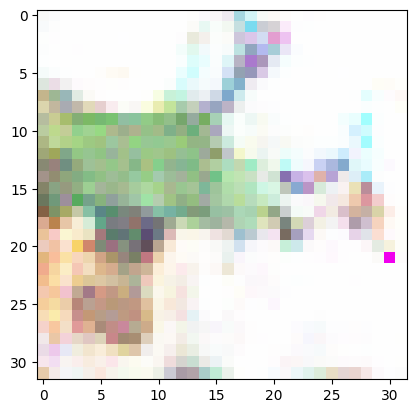

[488/500][0/936]	Loss_D: 0.0000	Loss_G: 11.3673	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[488/500][15/936]	Loss_D: 0.0019	Loss_G: 19.6474	D(x): 0.9983	D(G(z)): 0.0001 / 0.0001
[488/500][30/936]	Loss_D: 1.2491	Loss_G: 20.5748	D(x): 0.5651	D(G(z)): 0.0024 / 0.0823
[488/500][45/936]	Loss_D: 0.0001	Loss_G: 19.8146	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[488/500][60/936]	Loss_D: 0.0010	Loss_G: 17.3716	D(x): 1.0000	D(G(z)): 0.0010 / 0.0008
[488/500][75/936]	Loss_D: 0.0014	Loss_G: 9.5193	D(x): 1.0000	D(G(z)): 0.0014 / 0.0011
[488/500][90/936]	Loss_D: 0.0003	Loss_G: 8.2051	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[488/500][105/936]	Loss_D: 0.0005	Loss_G: 8.0450	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[488/500][120/936]	Loss_D: 0.0345	Loss_G: 9.1424	D(x): 0.9668	D(G(z)): 0.0002 / 0.0002
[488/500][135/936]	Loss_D: 0.0014	Loss_G: 6.9113	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[488/500][150/936]	Loss_D: 0.0024	Loss_G: 7.7022	D(x): 1.0000	D(G(z)): 0.0024 / 0.0022
[488/500][165/936]	Loss_D: 0.0064	Loss_G: 8.15

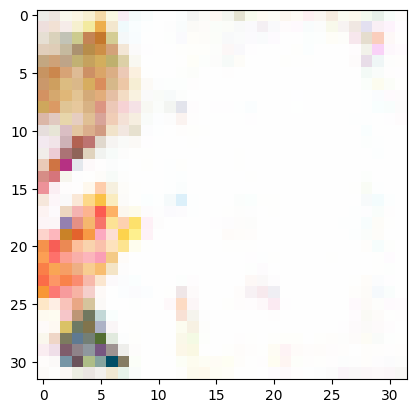

[489/500][0/936]	Loss_D: 0.0010	Loss_G: 7.7881	D(x): 0.9997	D(G(z)): 0.0007 / 0.0006
[489/500][15/936]	Loss_D: 0.1238	Loss_G: 3.8659	D(x): 0.9147	D(G(z)): 0.0202 / 0.0262
[489/500][30/936]	Loss_D: 0.0069	Loss_G: 6.4572	D(x): 0.9954	D(G(z)): 0.0022 / 0.0020
[489/500][45/936]	Loss_D: 0.0355	Loss_G: 10.8039	D(x): 0.9669	D(G(z)): 0.0000 / 0.0000
[489/500][60/936]	Loss_D: 0.0033	Loss_G: 6.1834	D(x): 0.9994	D(G(z)): 0.0026 / 0.0021
[489/500][75/936]	Loss_D: 0.1368	Loss_G: 4.3891	D(x): 0.8987	D(G(z)): 0.0069 / 0.0232
[489/500][90/936]	Loss_D: 0.0006	Loss_G: 7.7647	D(x): 1.0000	D(G(z)): 0.0006 / 0.0005
[489/500][105/936]	Loss_D: 0.0009	Loss_G: 7.2170	D(x): 1.0000	D(G(z)): 0.0009 / 0.0009
[489/500][120/936]	Loss_D: 0.0013	Loss_G: 7.1392	D(x): 1.0000	D(G(z)): 0.0013 / 0.0011
[489/500][135/936]	Loss_D: 0.0027	Loss_G: 6.9398	D(x): 1.0000	D(G(z)): 0.0027 / 0.0020
[489/500][150/936]	Loss_D: 0.0063	Loss_G: 5.4684	D(x): 1.0000	D(G(z)): 0.0063 / 0.0046
[489/500][165/936]	Loss_D: 0.0027	Loss_G: 6.7458	D

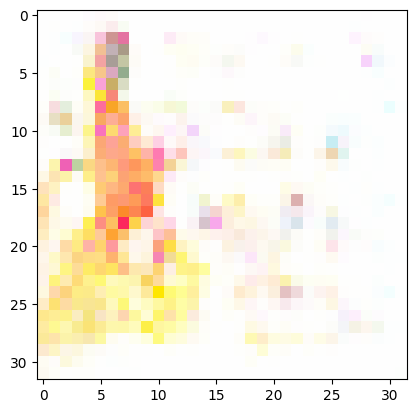

[490/500][0/936]	Loss_D: 0.0012	Loss_G: 7.5949	D(x): 1.0000	D(G(z)): 0.0012 / 0.0010
[490/500][15/936]	Loss_D: 0.0146	Loss_G: 7.7140	D(x): 0.9861	D(G(z)): 0.0005 / 0.0006
[490/500][30/936]	Loss_D: 0.0004	Loss_G: 8.1675	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[490/500][45/936]	Loss_D: 0.0000	Loss_G: 12.1920	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[490/500][60/936]	Loss_D: 0.0009	Loss_G: 7.6507	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[490/500][75/936]	Loss_D: 0.0003	Loss_G: 8.6386	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[490/500][90/936]	Loss_D: 0.0085	Loss_G: 5.5172	D(x): 1.0000	D(G(z)): 0.0085 / 0.0046
[490/500][105/936]	Loss_D: 0.0003	Loss_G: 8.5930	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[490/500][120/936]	Loss_D: 0.0004	Loss_G: 8.0803	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[490/500][135/936]	Loss_D: 0.0001	Loss_G: 9.9183	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[490/500][150/936]	Loss_D: 0.0020	Loss_G: 7.4797	D(x): 0.9989	D(G(z)): 0.0009 / 0.0009
[490/500][165/936]	Loss_D: 0.0092	Loss_G: 10.7138	

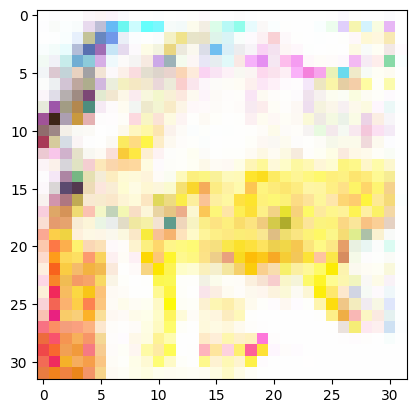

[491/500][0/936]	Loss_D: 0.0043	Loss_G: 7.0145	D(x): 0.9987	D(G(z)): 0.0030 / 0.0025
[491/500][15/936]	Loss_D: 0.0000	Loss_G: 10.7620	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[491/500][30/936]	Loss_D: 0.0011	Loss_G: 7.9411	D(x): 1.0000	D(G(z)): 0.0011 / 0.0009
[491/500][45/936]	Loss_D: 0.0011	Loss_G: 7.1957	D(x): 1.0000	D(G(z)): 0.0011 / 0.0010
[491/500][60/936]	Loss_D: 0.0000	Loss_G: 12.1098	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[491/500][75/936]	Loss_D: 0.0011	Loss_G: 6.0326	D(x): 1.0000	D(G(z)): 0.0011 / 0.0033
[491/500][90/936]	Loss_D: 0.1637	Loss_G: 6.1410	D(x): 0.8759	D(G(z)): 0.0011 / 0.0122
[491/500][105/936]	Loss_D: 0.0001	Loss_G: 11.4648	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[491/500][120/936]	Loss_D: 0.0045	Loss_G: 6.0170	D(x): 1.0000	D(G(z)): 0.0044 / 0.0033
[491/500][135/936]	Loss_D: 0.0001	Loss_G: 9.8499	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[491/500][150/936]	Loss_D: 0.0002	Loss_G: 11.5087	D(x): 0.9999	D(G(z)): 0.0001 / 0.0001
[491/500][165/936]	Loss_D: 0.0038	Loss_G: 6.376

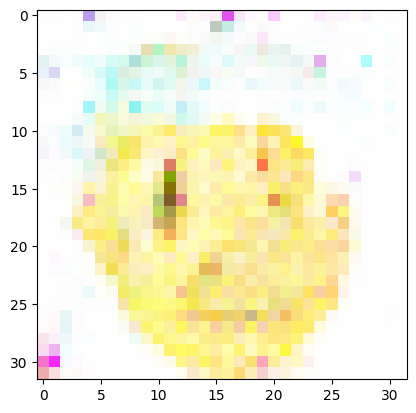

[492/500][0/936]	Loss_D: 0.0218	Loss_G: 2.0851	D(x): 1.0000	D(G(z)): 0.0214 / 0.3797
[492/500][15/936]	Loss_D: 0.0282	Loss_G: 13.7066	D(x): 0.9732	D(G(z)): 0.0000 / 0.0000
[492/500][30/936]	Loss_D: 0.0047	Loss_G: 6.3617	D(x): 1.0000	D(G(z)): 0.0047 / 0.0038
[492/500][45/936]	Loss_D: 0.0000	Loss_G: 15.1354	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[492/500][60/936]	Loss_D: 0.0005	Loss_G: 10.6757	D(x): 1.0000	D(G(z)): 0.0005 / 0.0002
[492/500][75/936]	Loss_D: 0.0000	Loss_G: 16.1038	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[492/500][90/936]	Loss_D: 0.0002	Loss_G: 9.3389	D(x): 1.0000	D(G(z)): 0.0002 / 0.0002
[492/500][105/936]	Loss_D: 0.0002	Loss_G: 8.4731	D(x): 1.0000	D(G(z)): 0.0002 / 0.0004
[492/500][120/936]	Loss_D: 0.0172	Loss_G: 5.5110	D(x): 1.0000	D(G(z)): 0.0169 / 0.0089
[492/500][135/936]	Loss_D: 0.0018	Loss_G: 7.5999	D(x): 1.0000	D(G(z)): 0.0018 / 0.0014
[492/500][150/936]	Loss_D: 0.0000	Loss_G: 24.3739	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[492/500][165/936]	Loss_D: 0.0001	Loss_G: 16.9

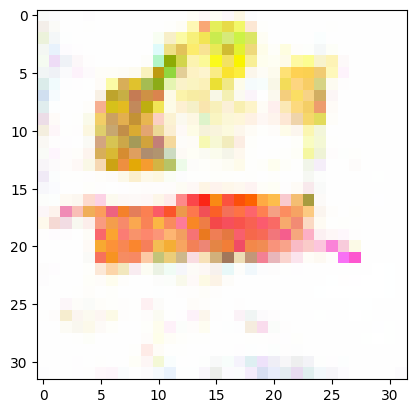

[493/500][0/936]	Loss_D: 0.0023	Loss_G: 7.6243	D(x): 1.0000	D(G(z)): 0.0022 / 0.0020
[493/500][15/936]	Loss_D: 0.0015	Loss_G: 7.0465	D(x): 1.0000	D(G(z)): 0.0015 / 0.0014
[493/500][30/936]	Loss_D: 0.0037	Loss_G: 6.4092	D(x): 1.0000	D(G(z)): 0.0036 / 0.0021
[493/500][45/936]	Loss_D: 0.0019	Loss_G: 7.5260	D(x): 1.0000	D(G(z)): 0.0019 / 0.0017
[493/500][60/936]	Loss_D: 0.0002	Loss_G: 10.1375	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[493/500][75/936]	Loss_D: 0.0555	Loss_G: 5.9982	D(x): 1.0000	D(G(z)): 0.0524 / 0.0074
[493/500][90/936]	Loss_D: 0.0051	Loss_G: 5.9289	D(x): 1.0000	D(G(z)): 0.0051 / 0.0038
[493/500][105/936]	Loss_D: 0.0001	Loss_G: 10.1519	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[493/500][120/936]	Loss_D: 0.0057	Loss_G: 5.6148	D(x): 1.0000	D(G(z)): 0.0057 / 0.0041
[493/500][135/936]	Loss_D: 0.0000	Loss_G: 13.7349	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[493/500][150/936]	Loss_D: 0.0012	Loss_G: 20.1602	D(x): 0.9988	D(G(z)): 0.0000 / 0.0000
[493/500][165/936]	Loss_D: 0.0000	Loss_G: 14.14

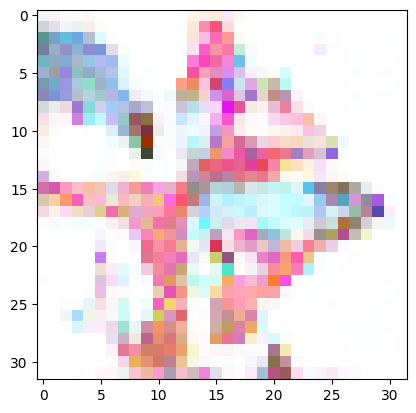

[494/500][0/936]	Loss_D: 0.0028	Loss_G: 5.4783	D(x): 1.0000	D(G(z)): 0.0027 / 0.0116
[494/500][15/936]	Loss_D: 0.0000	Loss_G: 11.2139	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[494/500][30/936]	Loss_D: 0.0000	Loss_G: 12.2174	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[494/500][45/936]	Loss_D: 0.0007	Loss_G: 8.1466	D(x): 1.0000	D(G(z)): 0.0007 / 0.0005
[494/500][60/936]	Loss_D: 0.0004	Loss_G: 8.5239	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[494/500][75/936]	Loss_D: 0.0092	Loss_G: 5.6415	D(x): 0.9991	D(G(z)): 0.0083 / 0.0056
[494/500][90/936]	Loss_D: 0.0230	Loss_G: 6.3063	D(x): 0.9810	D(G(z)): 0.0033 / 0.0027
[494/500][105/936]	Loss_D: 0.0005	Loss_G: 9.2639	D(x): 1.0000	D(G(z)): 0.0005 / 0.0003
[494/500][120/936]	Loss_D: 0.0302	Loss_G: 6.0107	D(x): 0.9748	D(G(z)): 0.0036 / 0.0038
[494/500][135/936]	Loss_D: 0.0012	Loss_G: 7.6522	D(x): 0.9998	D(G(z)): 0.0010 / 0.0008
[494/500][150/936]	Loss_D: 0.0002	Loss_G: 10.4052	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[494/500][165/936]	Loss_D: 0.0018	Loss_G: 21.648

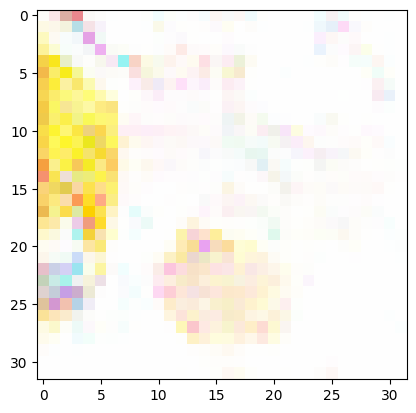

[495/500][0/936]	Loss_D: 0.0000	Loss_G: 15.3211	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[495/500][15/936]	Loss_D: 0.0046	Loss_G: 15.2483	D(x): 0.9955	D(G(z)): 0.0000 / 0.0000
[495/500][30/936]	Loss_D: 0.0001	Loss_G: 14.2364	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[495/500][45/936]	Loss_D: 0.0571	Loss_G: 4.6306	D(x): 1.0000	D(G(z)): 0.0553 / 0.0114
[495/500][60/936]	Loss_D: 0.0365	Loss_G: 7.7240	D(x): 1.0000	D(G(z)): 0.0351 / 0.0007
[495/500][75/936]	Loss_D: 0.0000	Loss_G: 21.2597	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[495/500][90/936]	Loss_D: 0.0008	Loss_G: 7.9394	D(x): 1.0000	D(G(z)): 0.0008 / 0.0007
[495/500][105/936]	Loss_D: 0.0080	Loss_G: 5.7174	D(x): 1.0000	D(G(z)): 0.0080 / 0.0046
[495/500][120/936]	Loss_D: 0.0050	Loss_G: 7.5679	D(x): 0.9983	D(G(z)): 0.0033 / 0.0008
[495/500][135/936]	Loss_D: 0.0015	Loss_G: 6.9351	D(x): 1.0000	D(G(z)): 0.0014 / 0.0012
[495/500][150/936]	Loss_D: 0.0005	Loss_G: 8.1191	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[495/500][165/936]	Loss_D: 0.0024	Loss_G: 7.155

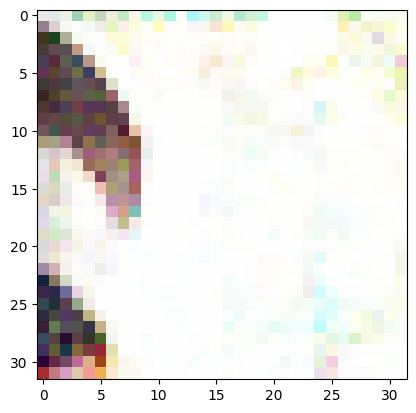

[496/500][0/936]	Loss_D: 0.0003	Loss_G: 9.6824	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[496/500][15/936]	Loss_D: 1.8152	Loss_G: 8.3750	D(x): 0.6498	D(G(z)): 0.0001 / 0.0003
[496/500][30/936]	Loss_D: 0.0076	Loss_G: 5.5112	D(x): 1.0000	D(G(z)): 0.0075 / 0.0059
[496/500][45/936]	Loss_D: 0.0003	Loss_G: 9.0870	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[496/500][60/936]	Loss_D: 0.0001	Loss_G: 13.4589	D(x): 0.9999	D(G(z)): 0.0000 / 0.0000
[496/500][75/936]	Loss_D: 0.0009	Loss_G: 7.6669	D(x): 1.0000	D(G(z)): 0.0008 / 0.0008
[496/500][90/936]	Loss_D: 0.0115	Loss_G: 6.7768	D(x): 1.0000	D(G(z)): 0.0114 / 0.0104
[496/500][105/936]	Loss_D: 0.0000	Loss_G: 14.0661	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[496/500][120/936]	Loss_D: 0.0035	Loss_G: 7.3767	D(x): 1.0000	D(G(z)): 0.0035 / 0.0027
[496/500][135/936]	Loss_D: 0.0000	Loss_G: 15.1579	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[496/500][150/936]	Loss_D: 0.0000	Loss_G: 18.7242	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[496/500][165/936]	Loss_D: 0.0000	Loss_G: 13.24

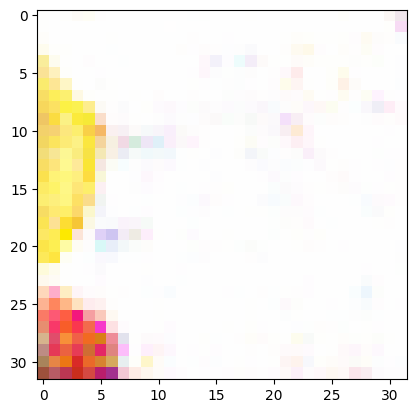

[497/500][0/936]	Loss_D: 0.0090	Loss_G: 5.6600	D(x): 1.0000	D(G(z)): 0.0090 / 0.0059
[497/500][15/936]	Loss_D: 0.0039	Loss_G: 5.9478	D(x): 1.0000	D(G(z)): 0.0039 / 0.0055
[497/500][30/936]	Loss_D: 0.0003	Loss_G: 9.5777	D(x): 1.0000	D(G(z)): 0.0003 / 0.0002
[497/500][45/936]	Loss_D: 0.0000	Loss_G: 13.4847	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[497/500][60/936]	Loss_D: 0.0037	Loss_G: 5.9198	D(x): 1.0000	D(G(z)): 0.0037 / 0.0028
[497/500][75/936]	Loss_D: 0.0002	Loss_G: 9.2144	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[497/500][90/936]	Loss_D: 0.0003	Loss_G: 8.3917	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[497/500][105/936]	Loss_D: 0.0036	Loss_G: 6.4732	D(x): 1.0000	D(G(z)): 0.0036 / 0.0025
[497/500][120/936]	Loss_D: 0.0002	Loss_G: 9.4656	D(x): 1.0000	D(G(z)): 0.0001 / 0.0001
[497/500][135/936]	Loss_D: 0.0007	Loss_G: 7.4337	D(x): 1.0000	D(G(z)): 0.0007 / 0.0006
[497/500][150/936]	Loss_D: 0.0003	Loss_G: 8.8482	D(x): 1.0000	D(G(z)): 0.0003 / 0.0003
[497/500][165/936]	Loss_D: 0.0001	Loss_G: 9.8047	D

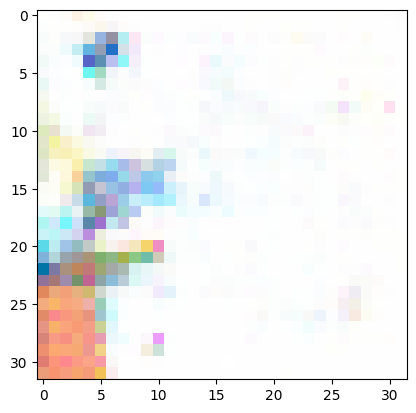

[498/500][0/936]	Loss_D: 5.2652	Loss_G: 22.0642	D(x): 1.0000	D(G(z)): 0.9844 / 0.0000
[498/500][15/936]	Loss_D: 0.0029	Loss_G: 6.9716	D(x): 1.0000	D(G(z)): 0.0029 / 0.0022
[498/500][30/936]	Loss_D: 0.0004	Loss_G: 18.7130	D(x): 1.0000	D(G(z)): 0.0004 / 0.0003
[498/500][45/936]	Loss_D: 0.0013	Loss_G: 19.8514	D(x): 1.0000	D(G(z)): 0.0013 / 0.0013
[498/500][60/936]	Loss_D: 0.0167	Loss_G: 11.9617	D(x): 1.0000	D(G(z)): 0.0163 / 0.0108
[498/500][75/936]	Loss_D: 0.0017	Loss_G: 7.1677	D(x): 1.0000	D(G(z)): 0.0017 / 0.0020
[498/500][90/936]	Loss_D: 0.0005	Loss_G: 8.0788	D(x): 1.0000	D(G(z)): 0.0005 / 0.0005
[498/500][105/936]	Loss_D: 0.0000	Loss_G: 11.3333	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[498/500][120/936]	Loss_D: 0.0060	Loss_G: 6.7017	D(x): 1.0000	D(G(z)): 0.0060 / 0.0030
[498/500][135/936]	Loss_D: 0.0000	Loss_G: 15.9149	D(x): 1.0000	D(G(z)): 0.0000 / 0.0000
[498/500][150/936]	Loss_D: 0.0108	Loss_G: 6.7564	D(x): 1.0000	D(G(z)): 0.0106 / 0.0049
[498/500][165/936]	Loss_D: 0.0088	Loss_G: 5.6

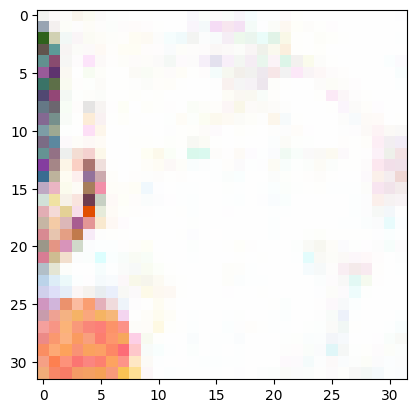

[499/500][0/936]	Loss_D: 0.0001	Loss_G: 13.8052	D(x): 1.0000	D(G(z)): 0.0001 / 0.0000
[499/500][15/936]	Loss_D: 0.0135	Loss_G: 6.6197	D(x): 1.0000	D(G(z)): 0.0134 / 0.0033
[499/500][30/936]	Loss_D: 0.0163	Loss_G: 5.3128	D(x): 1.0000	D(G(z)): 0.0161 / 0.0082
[499/500][45/936]	Loss_D: 0.0009	Loss_G: 5.9904	D(x): 1.0000	D(G(z)): 0.0009 / 0.0026
[499/500][60/936]	Loss_D: 0.0002	Loss_G: 10.7459	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[499/500][75/936]	Loss_D: 0.0057	Loss_G: 6.3541	D(x): 1.0000	D(G(z)): 0.0056 / 0.0046
[499/500][90/936]	Loss_D: 0.0053	Loss_G: 11.3078	D(x): 0.9948	D(G(z)): 0.0001 / 0.0001
[499/500][105/936]	Loss_D: 0.0014	Loss_G: 8.0055	D(x): 1.0000	D(G(z)): 0.0014 / 0.0013
[499/500][120/936]	Loss_D: 0.0043	Loss_G: 6.6913	D(x): 1.0000	D(G(z)): 0.0042 / 0.0033
[499/500][135/936]	Loss_D: 0.0002	Loss_G: 9.6753	D(x): 1.0000	D(G(z)): 0.0002 / 0.0001
[499/500][150/936]	Loss_D: 0.0004	Loss_G: 9.4170	D(x): 1.0000	D(G(z)): 0.0004 / 0.0004
[499/500][165/936]	Loss_D: 0.0011	Loss_G: 7.2207

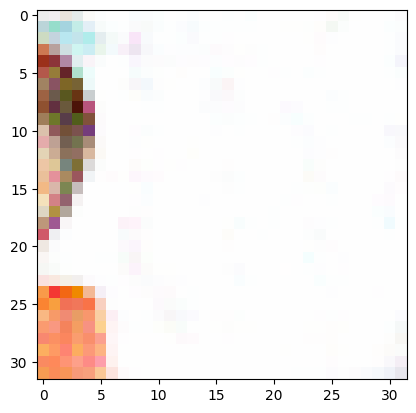

In [7]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

batch_size = 4
num_epochs = 500
print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    batch_count = int(np.ceil(sample_count / batch_size))
    permutation = np.random.permutation(sample_count)
    for batch_idx in range(batch_count):
        print("epoch: {} \t {}/{} batch".format(epoch, batch_idx, batch_count), end="\r")
        
        batch_start = batch_idx * batch_size
        batch_end = min(sample_count, (batch_idx + 1) * batch_size)
        batch_indeces = permutation[batch_start:batch_end]
        real_batch_size = batch_end - batch_start
        
        data = dataset_t[batch_indeces]
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data
        label = torch.full((real_batch_size,), real_label, dtype=torch.float)
        if USE_CUDA:
            label = label.cuda()
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(real_batch_size, nz, noise_h, noise_w)
        if USE_CUDA:
            noise = noise.cuda()
        # Generate fake image batch with G
        fake = netG(noise)
        
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if batch_idx % 15 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, batch_idx, batch_count, errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (batch_idx == batch_count - 1 ):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(fake.numpy())
            index = 0
            img = fake.numpy()[0]
            img = np.moveaxis(img, 0, -1)
            img = (img - img.min()) / (img.max() - img.min())
            
            plt.imshow(img)
            plt.show()

        iters += 1

(32, 32, 3)


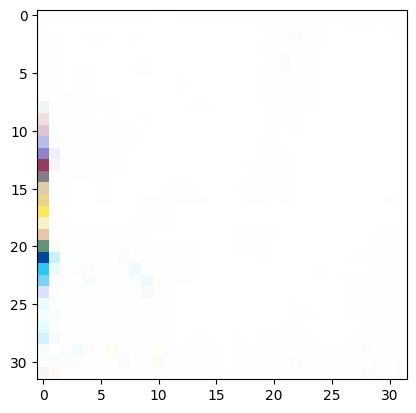

(32, 32, 3)


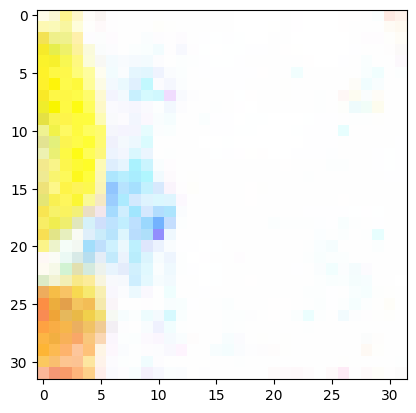

(32, 32, 3)


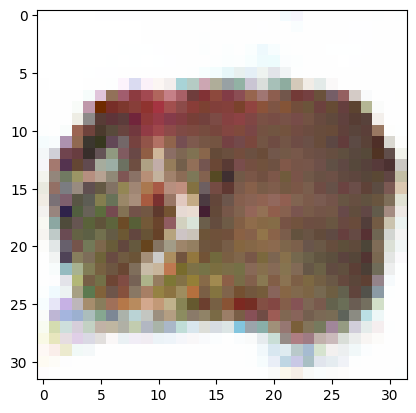

(32, 32, 3)


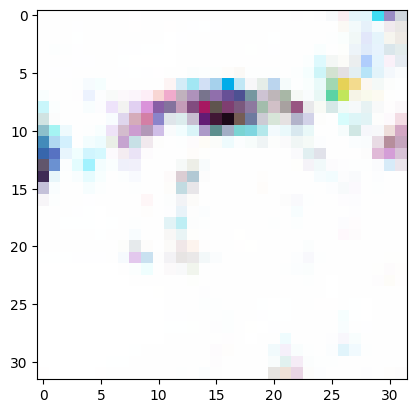

(32, 32, 3)


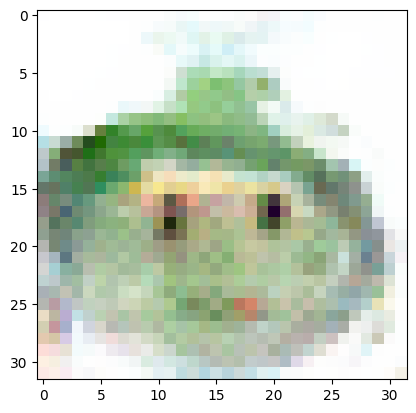

(32, 32, 3)


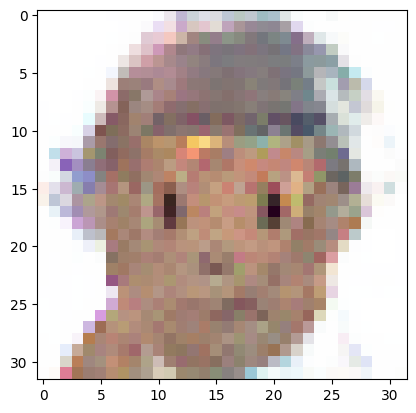

(32, 32, 3)


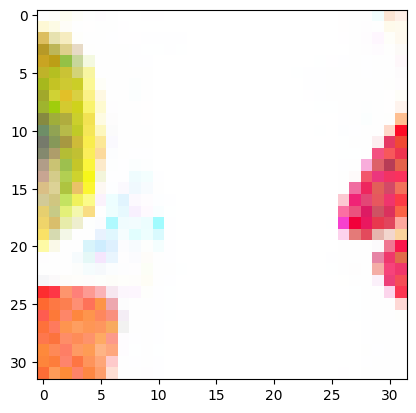

(32, 32, 3)


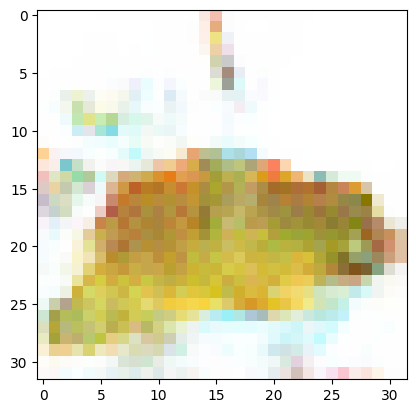

(32, 32, 3)


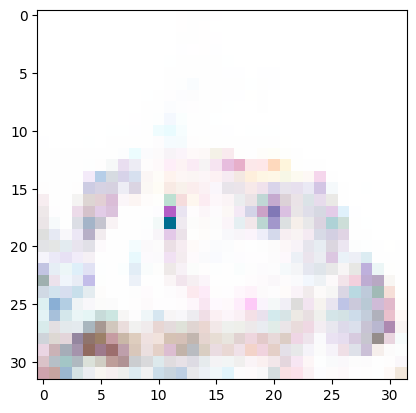

(32, 32, 3)


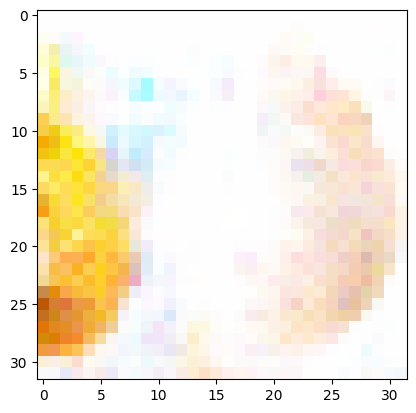

(32, 32, 3)


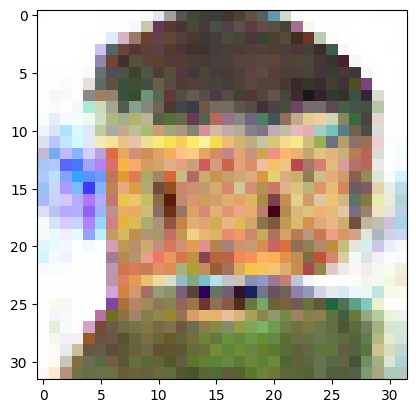

(32, 32, 3)


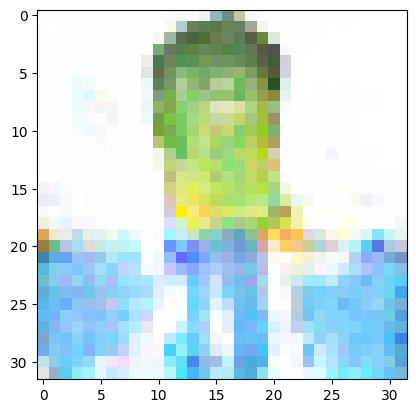

(32, 32, 3)


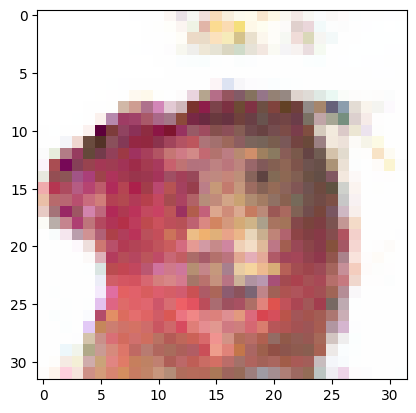

(32, 32, 3)


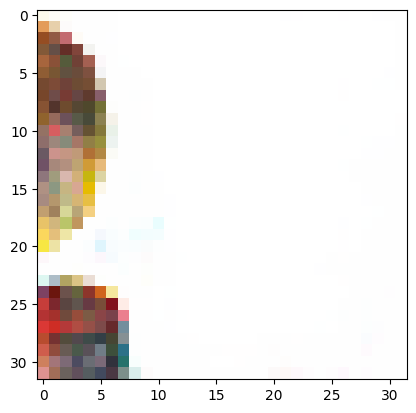

(32, 32, 3)


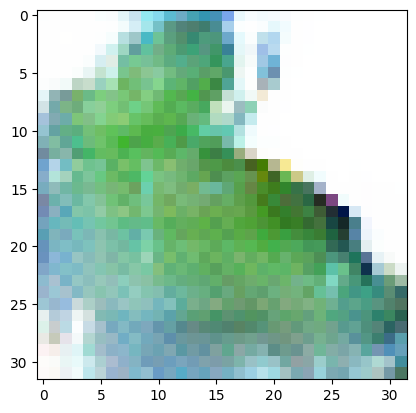

(32, 32, 3)


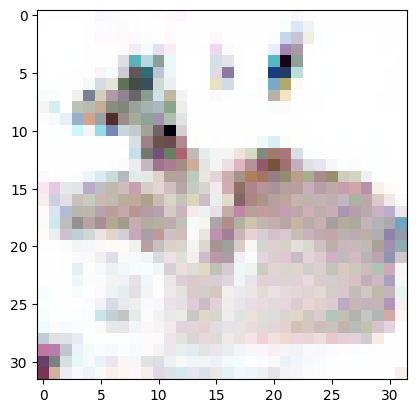

(32, 32, 3)


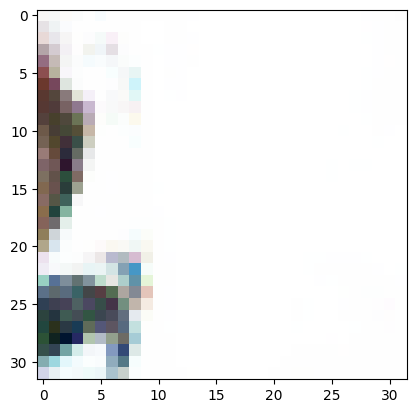

(32, 32, 3)


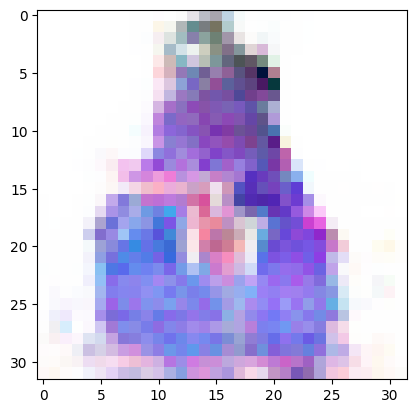

(32, 32, 3)


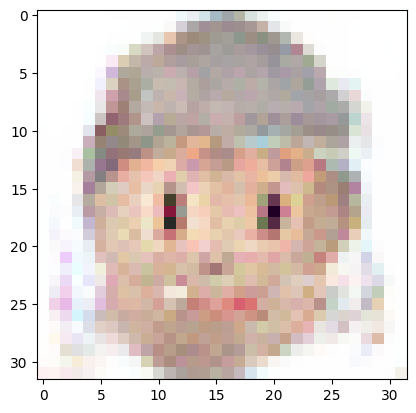

(32, 32, 3)


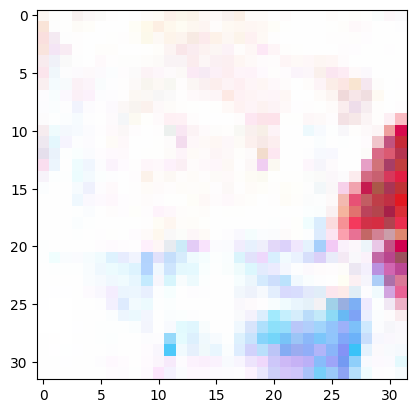

(32, 32, 3)


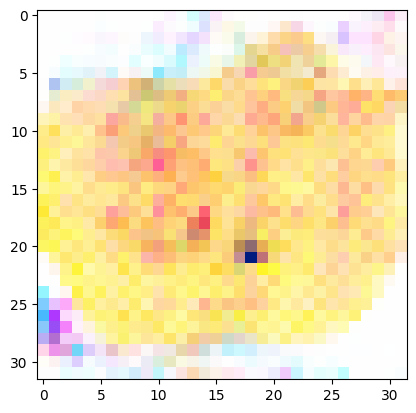

(32, 32, 3)


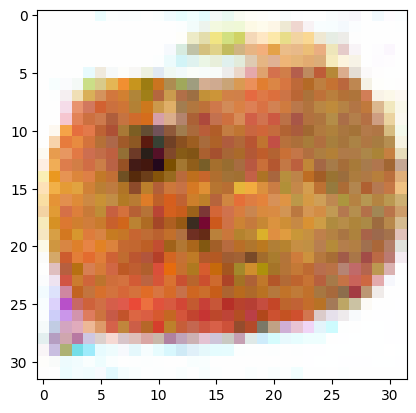

(32, 32, 3)


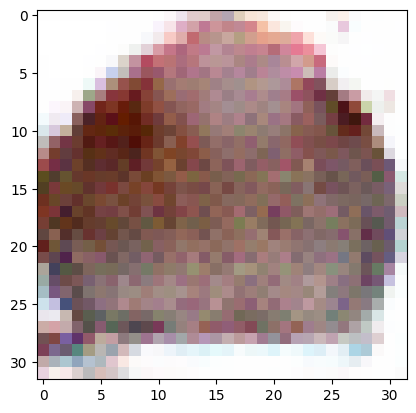

(32, 32, 3)


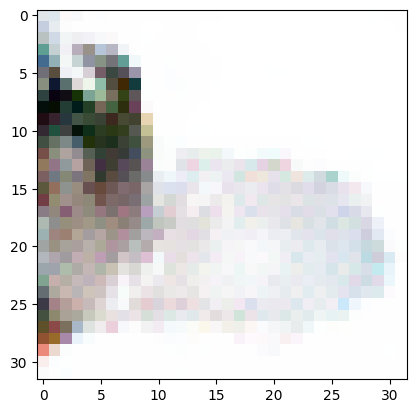

(32, 32, 3)


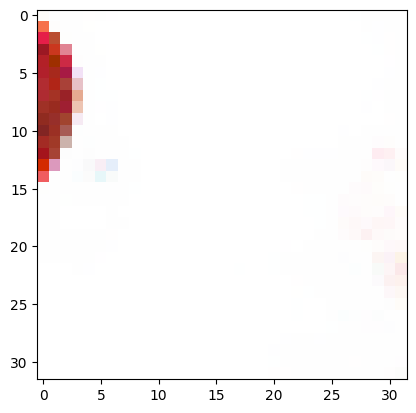

(32, 32, 3)


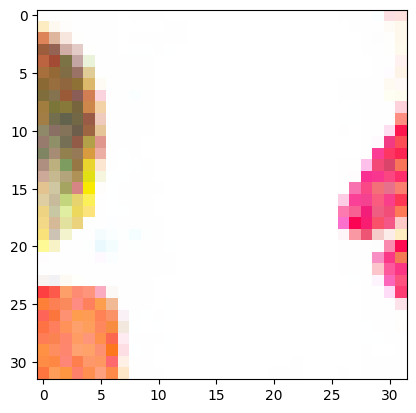

(32, 32, 3)


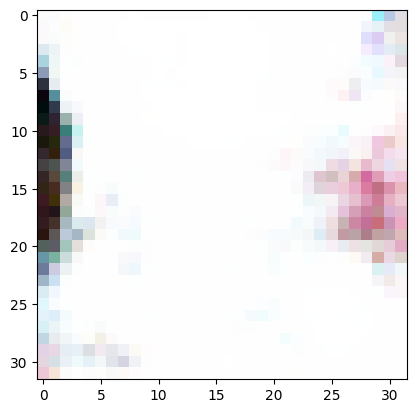

(32, 32, 3)


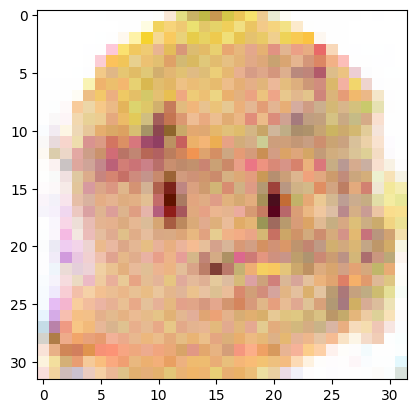

(32, 32, 3)


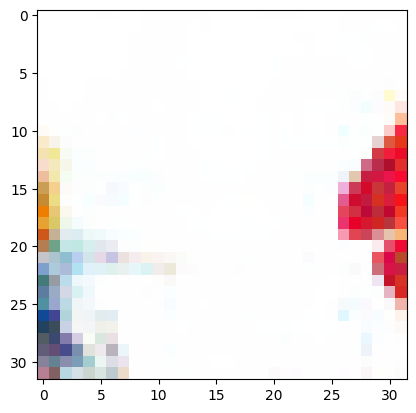

(32, 32, 3)


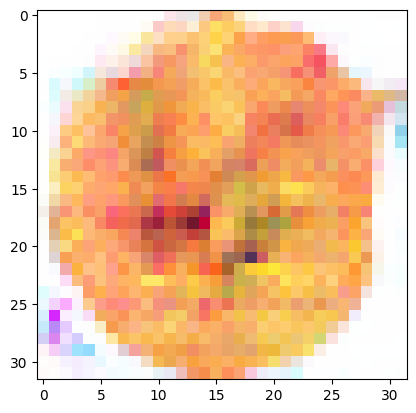

(32, 32, 3)


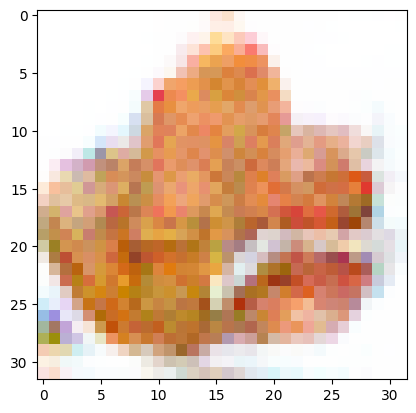

(32, 32, 3)


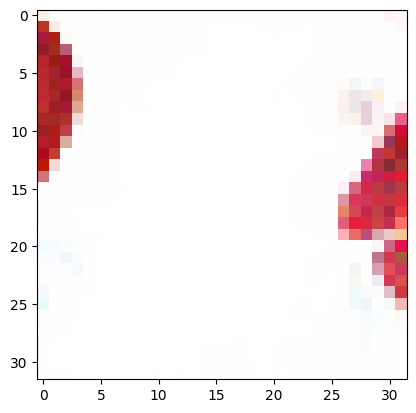

(32, 32, 3)


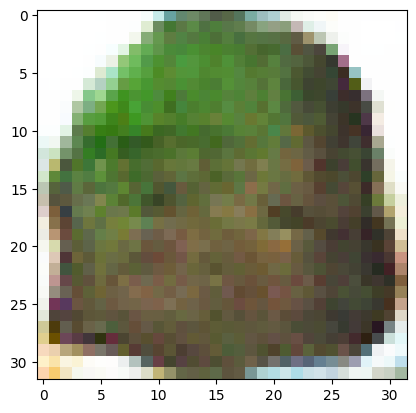

(32, 32, 3)


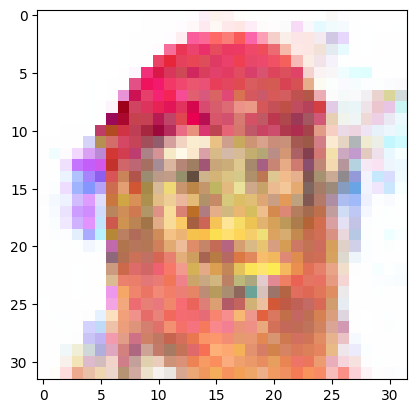

(32, 32, 3)


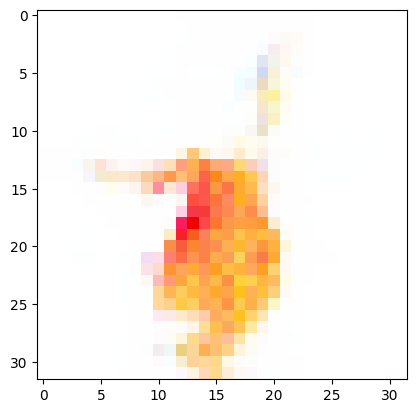

(32, 32, 3)


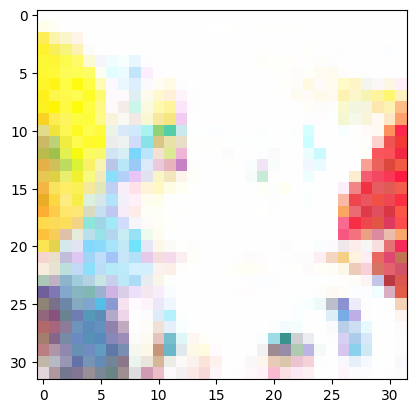

(32, 32, 3)


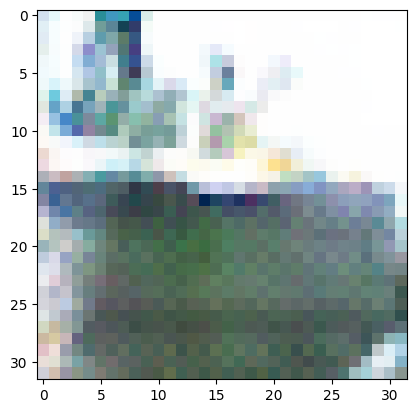

(32, 32, 3)


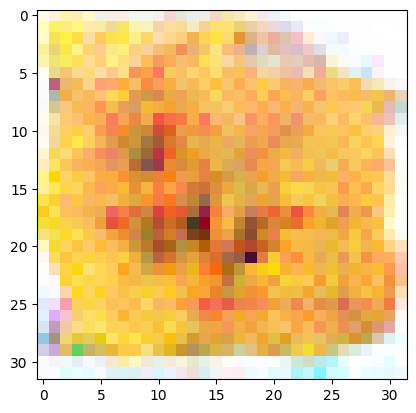

(32, 32, 3)


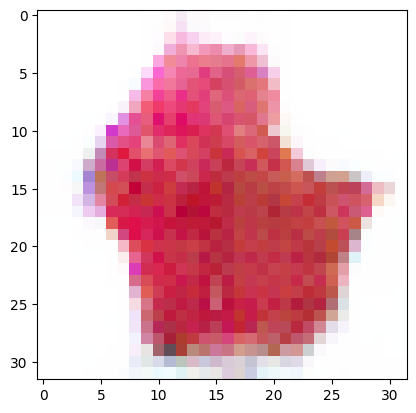

(32, 32, 3)


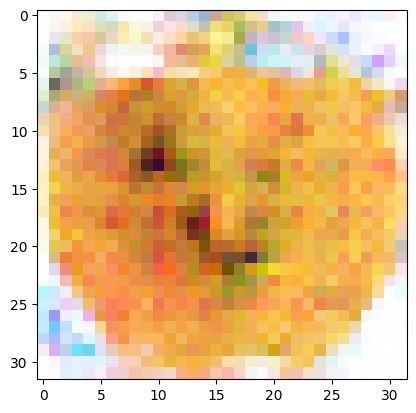

(32, 32, 3)


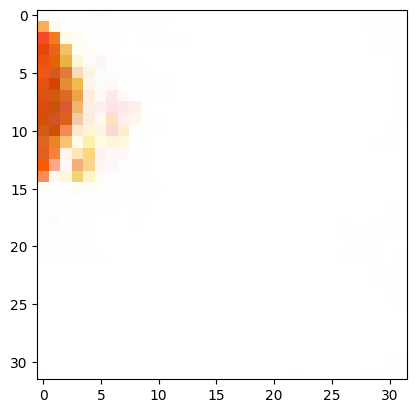

(32, 32, 3)


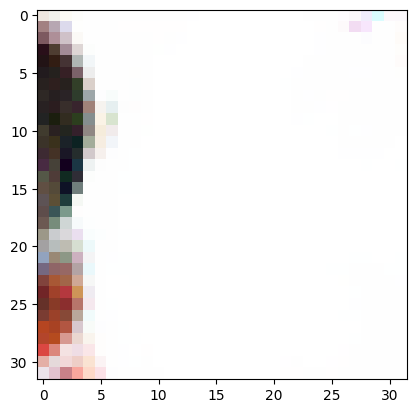

(32, 32, 3)


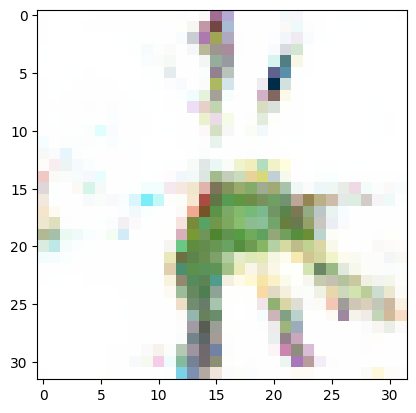

(32, 32, 3)


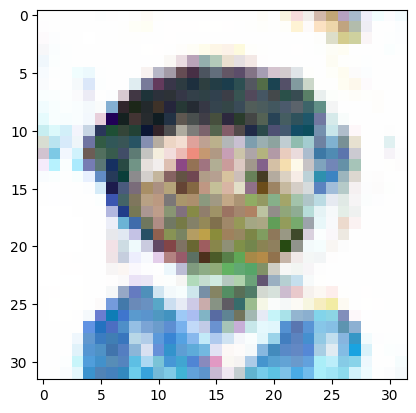

(32, 32, 3)


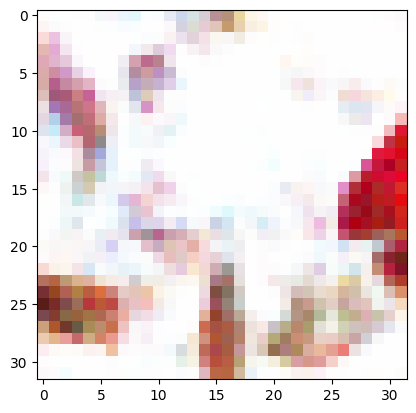

(32, 32, 3)


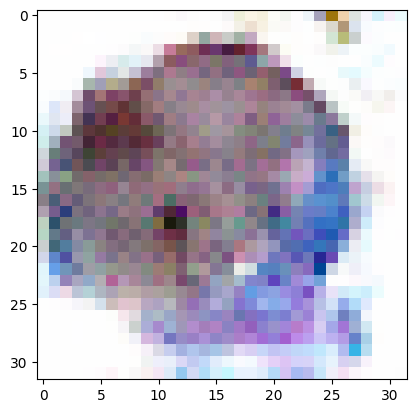

(32, 32, 3)


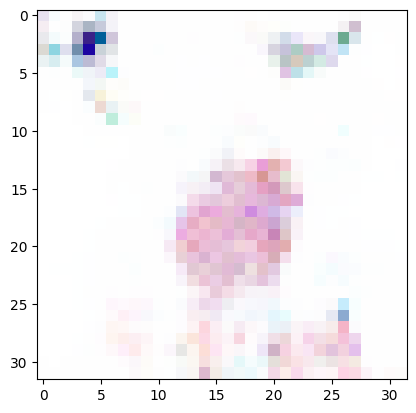

(32, 32, 3)


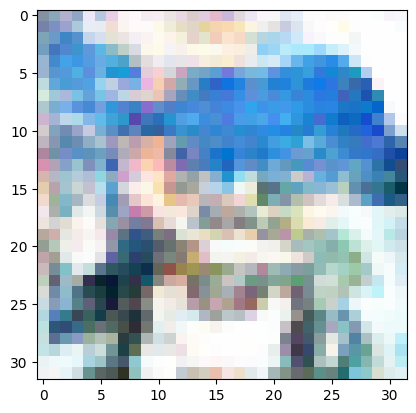

(32, 32, 3)


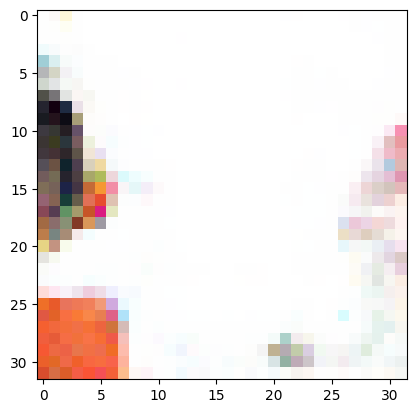

(32, 32, 3)


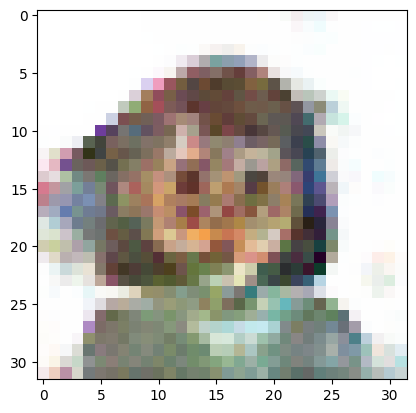

(32, 32, 3)


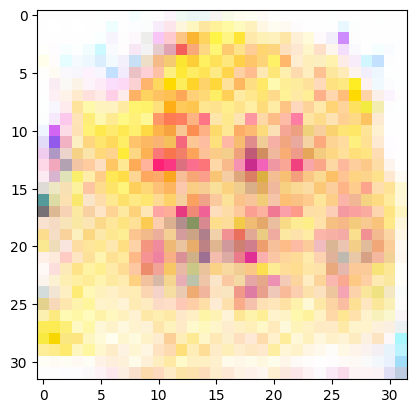

(32, 32, 3)


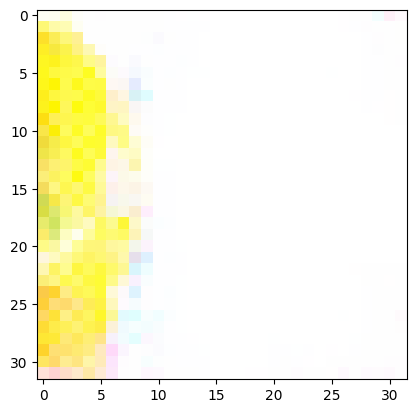

(32, 32, 3)


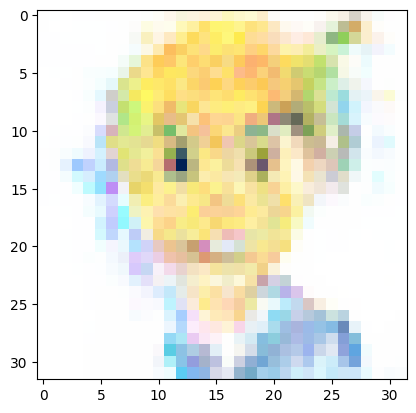

(32, 32, 3)


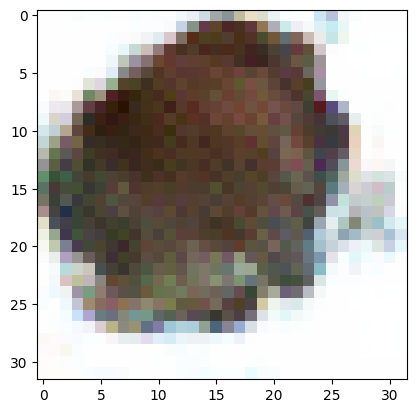

(32, 32, 3)


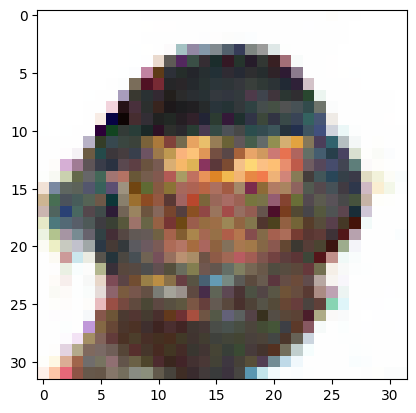

(32, 32, 3)


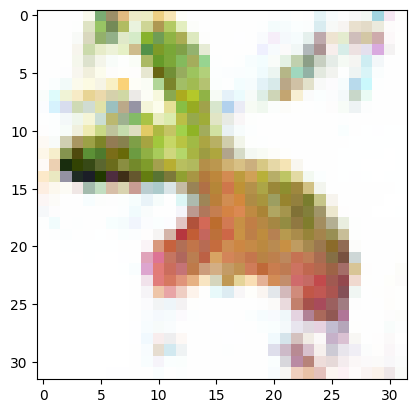

(32, 32, 3)


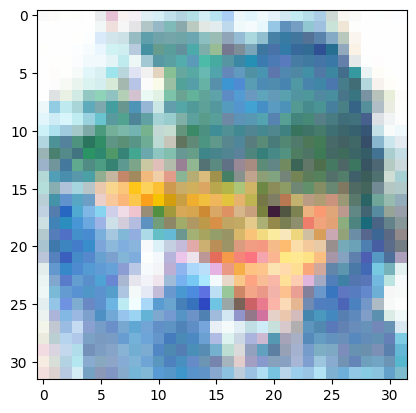

(32, 32, 3)


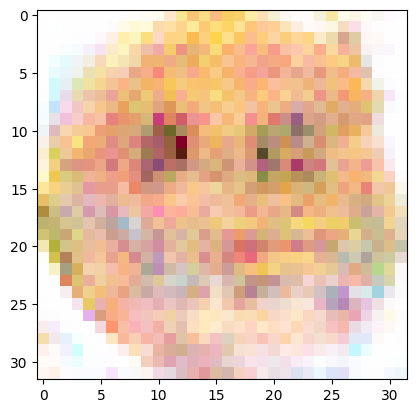

(32, 32, 3)


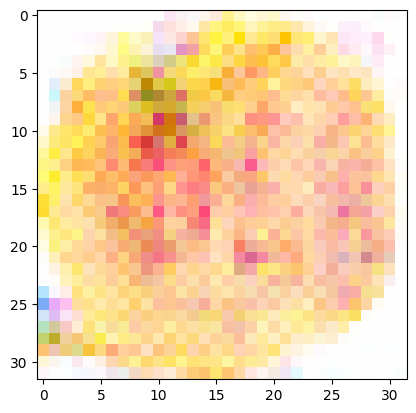

(32, 32, 3)


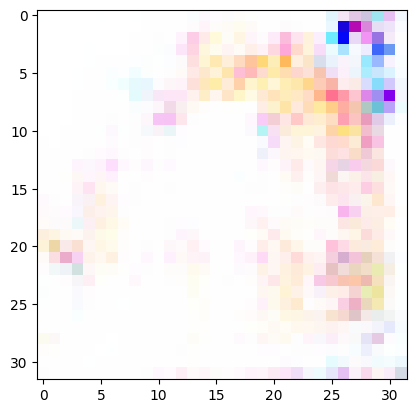

(32, 32, 3)


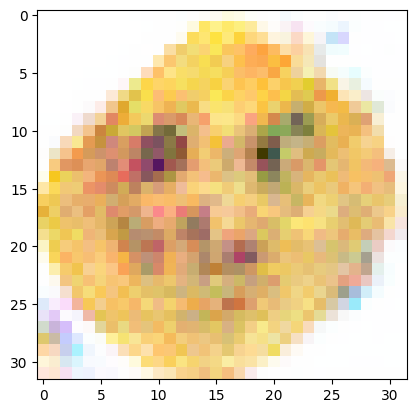

(32, 32, 3)


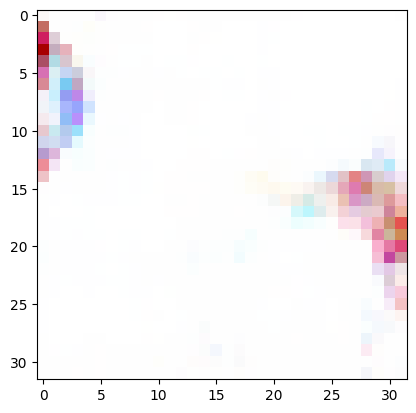

(32, 32, 3)


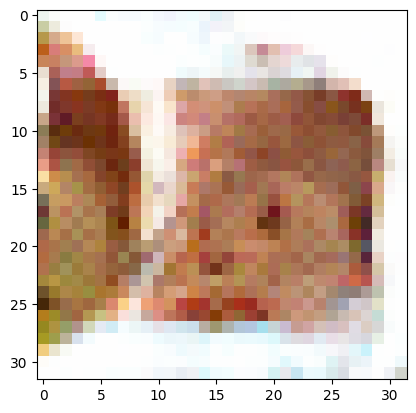

(32, 32, 3)


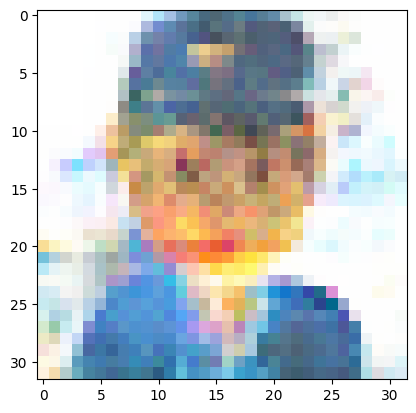

In [11]:
for img in img_list[150]:
    img = np.moveaxis(img, 0, -1)
    img = (img - img.min()) / (img.max() - img.min())
    
    print(img.shape)
    plt.imshow(img)
    plt.show()